In [ ]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

import pandas as pd
import numpy as np

trn = pd.read_csv('./input/train_ver2.csv')

In [3]:
# 총 1300만개의 고객 데이터, 고객마다 48개의 변수
trn.shape

(13647309, 48)

In [4]:
trn.head()

,fecha_dato,ncodpers,ind_empleado,pais_residencia,sexo,age,fecha_alta,ind_nuevo,antiguedad,indrel,...,ind_hip_fin_ult1,ind_plan_fin_ult1,ind_pres_fin_ult1,ind_reca_fin_ult1,ind_tjcr_fin_ult1,ind_valo_fin_ult1,ind_viv_fin_ult1,ind_nomina_ult1,ind_nom_pens_ult1,ind_recibo_ult1
0,2015-01-28,1375586,N,ES,H,35,2015-01-12,0.0,6,1.0,...,0,0,0,0,0,0,0,0.0,0.0,0
1,2015-01-28,1050611,N,ES,V,23,2012-08-10,0.0,35,1.0,...,0,0,0,0,0,0,0,0.0,0.0,0
2,2015-01-28,1050612,N,ES,V,23,2012-08-10,0.0,35,1.0,...,0,0,0,0,0,0,0,0.0,0.0,0
3,2015-01-28,1050613,N,ES,H,22,2012-08-10,0.0,35,1.0,...,0,0,0,0,0,0,0,0.0,0.0,0
4,2015-01-28,1050614,N,ES,V,23,2012-08-10,0.0,35,1.0,...,0,0,0,0,0,0,0,0.0,0.0,0


In [5]:
# head 함수는 일부분을 생략하기 때문에 다 보고 싶으면 아래와 같이 for문 사용
for col in trn.columns:
    print(f'{trn[col].head()}\n')

0    2015-01-28
1    2015-01-28
2    2015-01-28
3    2015-01-28
4    2015-01-28
Name: fecha_dato, dtype: object

0    1375586
1    1050611
2    1050612
3    1050613
4    1050614
Name: ncodpers, dtype: int64

0    N
1    N
2    N
3    N
4    N
Name: ind_empleado, dtype: object

0    ES
1    ES
2    ES
3    ES
4    ES
Name: pais_residencia, dtype: object

0    H
1    V
2    V
3    H
4    V
Name: sexo, dtype: object

0     35
1     23
2     23
3     22
4     23
Name: age, dtype: object

0    2015-01-12
1    2012-08-10
2    2012-08-10
3    2012-08-10
4    2012-08-10
Name: fecha_alta, dtype: object

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: ind_nuevo, dtype: float64

0          6
1         35
2         35
3         35
4         35
Name: antiguedad, dtype: object

0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: indrel, dtype: float64

0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: ult_fec_cli_1t, dtype: object

0    1
1    1
2    1
3    1
4    1
Name: indrel_1mes, dtype: obje

In [6]:
trn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13647309 entries, 0 to 13647308
Data columns (total 48 columns):
fecha_dato               object
ncodpers                 int64
ind_empleado             object
pais_residencia          object
sexo                     object
age                      object
fecha_alta               object
ind_nuevo                float64
antiguedad               object
indrel                   float64
ult_fec_cli_1t           object
indrel_1mes              object
tiprel_1mes              object
indresi                  object
indext                   object
conyuemp                 object
canal_entrada            object
indfall                  object
tipodom                  float64
cod_prov                 float64
nomprov                  object
ind_actividad_cliente    float64
renta                    float64
segmento                 object
ind_ahor_fin_ult1        int64
ind_aval_fin_ult1        int64
ind_cco_fin_ult1         int64
ind_cder_fin_ult1  

In [7]:
# 수치형 변수를 추출하고 요약 통계를 확인해보자
num_cols = [col for col in trn.columns[:24] if trn[col].dtype in ['int64', 'float64']]
trn[num_cols].describe()

,ncodpers,ind_nuevo,indrel,tipodom,cod_prov,ind_actividad_cliente,renta
count,1.364731e+07,1.361958e+07,1.361958e+07,13619574.0,1.355372e+07,1.361958e+07,1.085293e+07
mean,8.349042e+05,5.956184e-02,1.178399e+00,1.0,2.657147e+01,4.578105e-01,1.342543e+05
std,4.315650e+05,2.366733e-01,4.177469e+00,0.0,1.278402e+01,4.982169e-01,2.306202e+05
min,1.588900e+04,0.000000e+00,1.000000e+00,1.0,1.000000e+00,0.000000e+00,1.202730e+03
25%,4.528130e+05,0.000000e+00,1.000000e+00,1.0,1.500000e+01,0.000000e+00,6.871098e+04
50%,9.318930e+05,0.000000e+00,1.000000e+00,1.0,2.800000e+01,0.000000e+00,1.018500e+05
75%,1.199286e+06,0.000000e+00,1.000000e+00,1.0,3.500000e+01,1.000000e+00,1.559560e+05
max,1.553689e+06,1.000000e+00,9.900000e+01,1.0,5.200000e+01,1.000000e+00,2.889440e+07


In [8]:
# 첫 24개 colm중 obj인 것들에 대한 요약 확인
cat_cols = [col for col in trn.columns[:24] if trn[col].dtype in ['object']]
trn[cat_cols].describe()

# ult_fec_cli_1t는 count가 24,793개 뿐 -> 즉 결측치 다수
# ind_empleado는 5개의 고유값 중 빈도가 가장 높은 N이 99.9% 가량 차지 -> 즉 편중되어 있음
# age, antiguedad(누적 거래 기간)가 수치가 아닌 범주로 되어 있다 -> 전처리 필요

,fecha_dato,ind_empleado,pais_residencia,sexo,age,fecha_alta,antiguedad,ult_fec_cli_1t,indrel_1mes,tiprel_1mes,indresi,indext,conyuemp,canal_entrada,indfall,nomprov,segmento
count,13647309,13619575,13619575,13619505,13647309,13619575,13647309,24793,13497528.0,13497528,13619575,13619575,1808,13461183,13619575,13553718,13457941
unique,17,5,118,2,235,6756,507,223,13.0,5,2,2,2,162,2,52,3
top,2016-05-28,N,ES,V,23,2014-07-28,0,2015-12-24,1.0,I,S,N,N,KHE,N,MADRID,02 - PARTICULARES
freq,931453,13610977,13553710,7424252,542682,57389,134335,763,7277607.0,7304875,13553711,12974839,1791,4055270,13584813,4409600,7960220


In [9]:
# 범주형 변수의 고유값을 확인해보자
for col in cat_cols:
    uniq = np.unique(trn[col].astype(str))
    print('-' * 50)
    print(f'# col {col}, n_uniq {len(uniq)}, uniq {uniq}')

--------------------------------------------------
# col fecha_dato, n_uniq 17, uniq ['2015-01-28' '2015-02-28' '2015-03-28' '2015-04-28' '2015-05-28'
 '2015-06-28' '2015-07-28' '2015-08-28' '2015-09-28' '2015-10-28'
 '2015-11-28' '2015-12-28' '2016-01-28' '2016-02-28' '2016-03-28'
 '2016-04-28' '2016-05-28']
--------------------------------------------------
# col ind_empleado, n_uniq 6, uniq ['A' 'B' 'F' 'N' 'S' 'nan']
--------------------------------------------------
# col pais_residencia, n_uniq 119, uniq ['AD' 'AE' 'AL' 'AO' 'AR' 'AT' 'AU' 'BA' 'BE' 'BG' 'BM' 'BO' 'BR' 'BY'
 'BZ' 'CA' 'CD' 'CF' 'CG' 'CH' 'CI' 'CL' 'CM' 'CN' 'CO' 'CR' 'CU' 'CZ'
 'DE' 'DJ' 'DK' 'DO' 'DZ' 'EC' 'EE' 'EG' 'ES' 'ET' 'FI' 'FR' 'GA' 'GB'
 'GE' 'GH' 'GI' 'GM' 'GN' 'GQ' 'GR' 'GT' 'GW' 'HK' 'HN' 'HR' 'HU' 'IE'
 'IL' 'IN' 'IS' 'IT' 'JM' 'JP' 'KE' 'KH' 'KR' 'KW' 'KZ' 'LB' 'LT' 'LU'
 'LV' 'LY' 'MA' 'MD' 'MK' 'ML' 'MM' 'MR' 'MT' 'MX' 'MZ' 'NG' 'NI' 'NL'
 'NO' 'NZ' 'OM' 'PA' 'PE' 'PH' 'PK' 'PL' 'PR' 'PT' 'PY' 'Q

--------------------------------------------------
# col indrel_1mes, n_uniq 10, uniq ['1' '1.0' '2' '2.0' '3' '3.0' '4' '4.0' 'P' 'nan']
--------------------------------------------------
# col tiprel_1mes, n_uniq 6, uniq ['A' 'I' 'N' 'P' 'R' 'nan']
--------------------------------------------------
# col indresi, n_uniq 3, uniq ['N' 'S' 'nan']
--------------------------------------------------
# col indext, n_uniq 3, uniq ['N' 'S' 'nan']
--------------------------------------------------
# col conyuemp, n_uniq 3, uniq ['N' 'S' 'nan']
--------------------------------------------------
# col canal_entrada, n_uniq 163, uniq ['004' '007' '013' '025' 'K00' 'KAA' 'KAB' 'KAC' 'KAD' 'KAE' 'KAF' 'KAG'
 'KAH' 'KAI' 'KAJ' 'KAK' 'KAL' 'KAM' 'KAN' 'KAO' 'KAP' 'KAQ' 'KAR' 'KAS'
 'KAT' 'KAU' 'KAV' 'KAW' 'KAY' 'KAZ' 'KBB' 'KBD' 'KBE' 'KBF' 'KBG' 'KBH'
 'KBJ' 'KBL' 'KBM' 'KBN' 'KBO' 'KBP' 'KBQ' 'KBR' 'KBS' 'KBU' 'KBV' 'KBW'
 'KBX' 'KBY' 'KBZ' 'KCA' 'KCB' 'KCC' 'KCD' 'KCE' 'KCF' 'KCG' 'KCH' 'KCI'
 'KC

In [10]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

--------------------------------------------------
col: fecha_dato


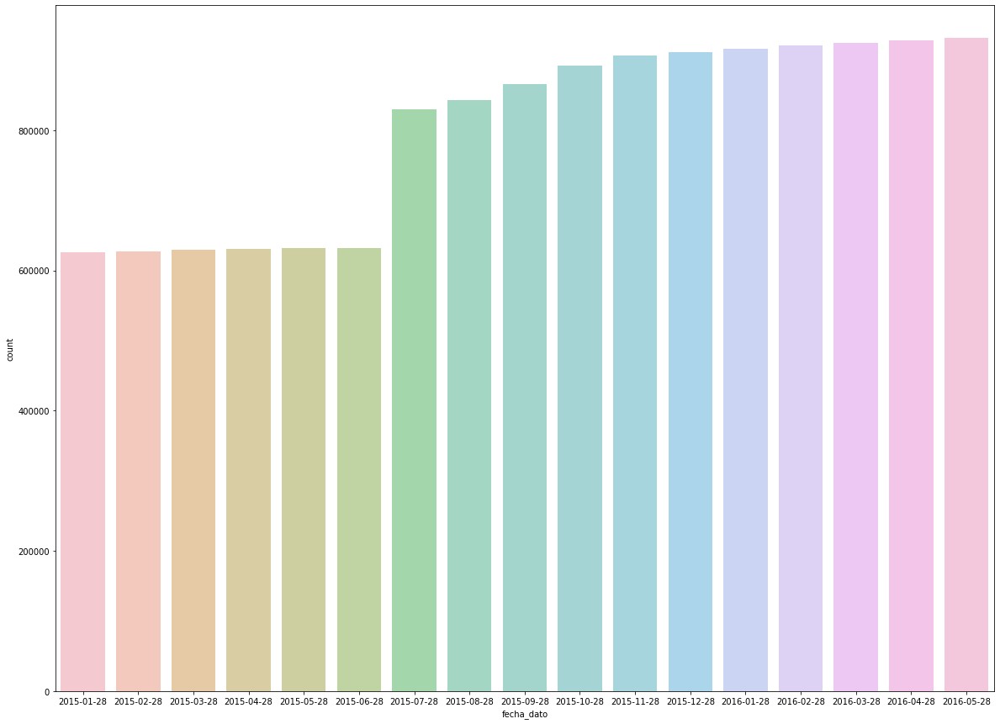

--------------------------------------------------
col: ind_empleado


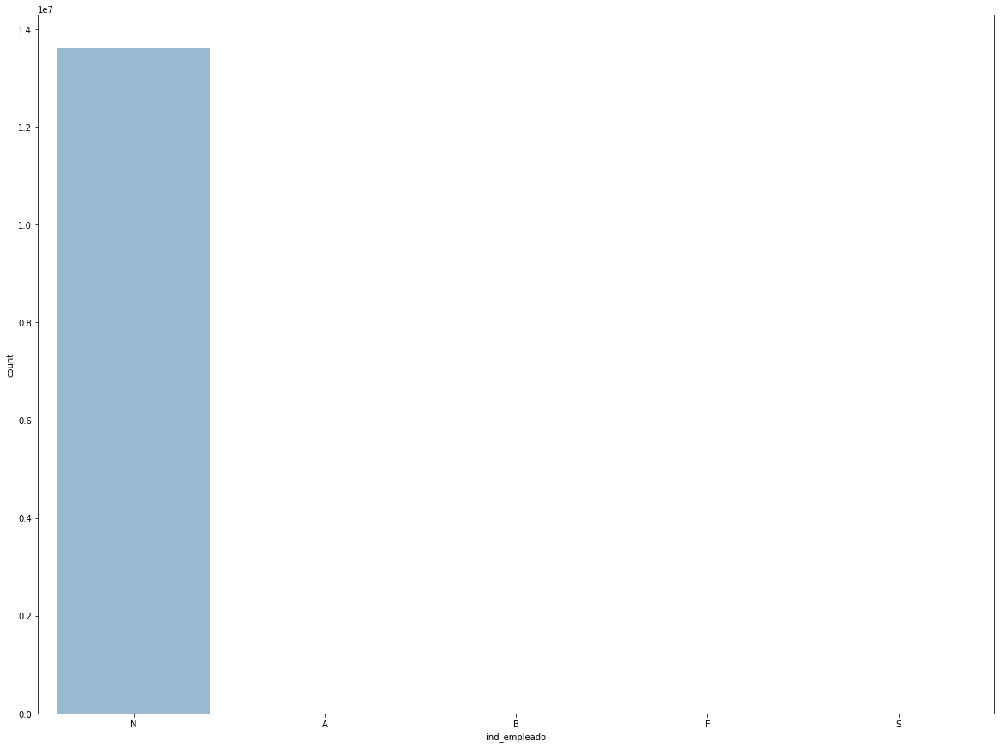

--------------------------------------------------
col: pais_residencia


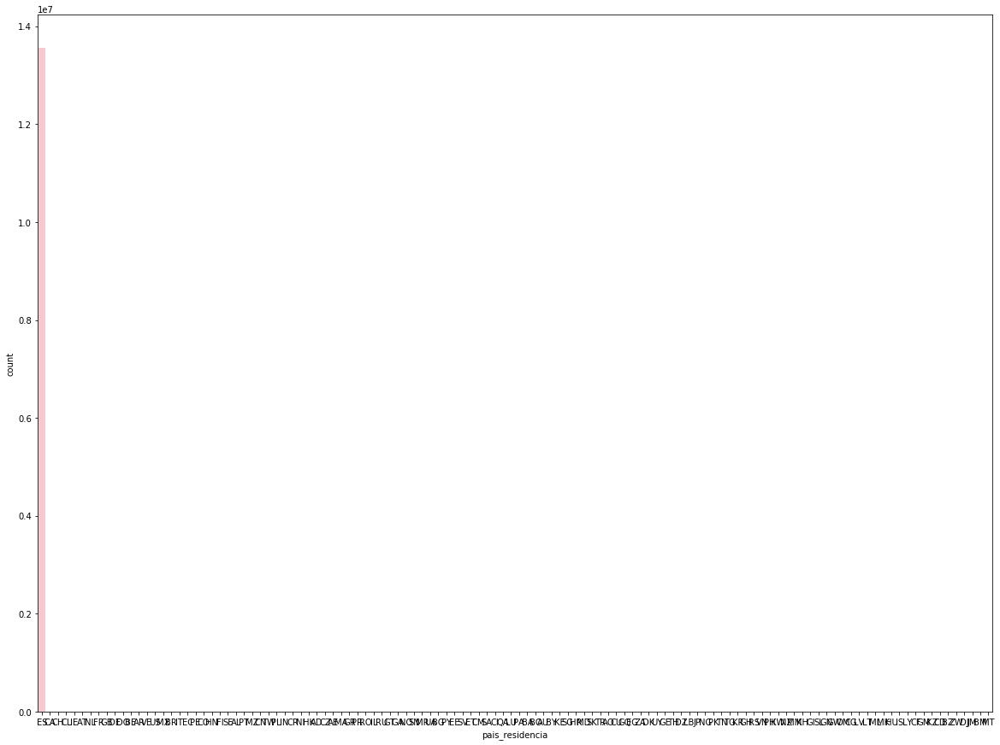

--------------------------------------------------
col: sexo


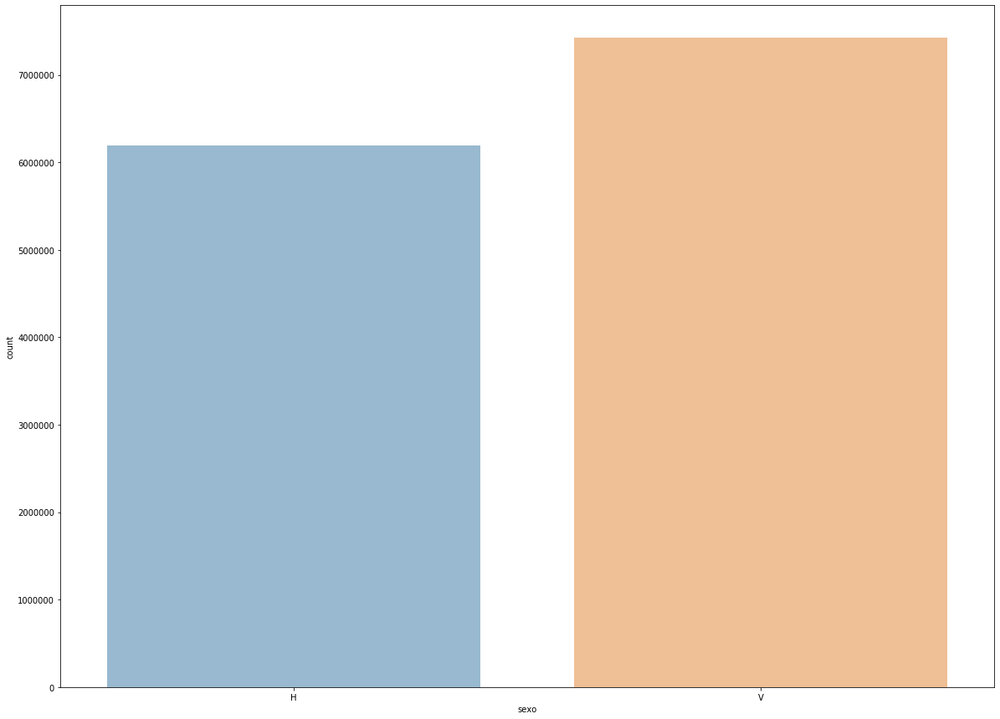

--------------------------------------------------
col: age


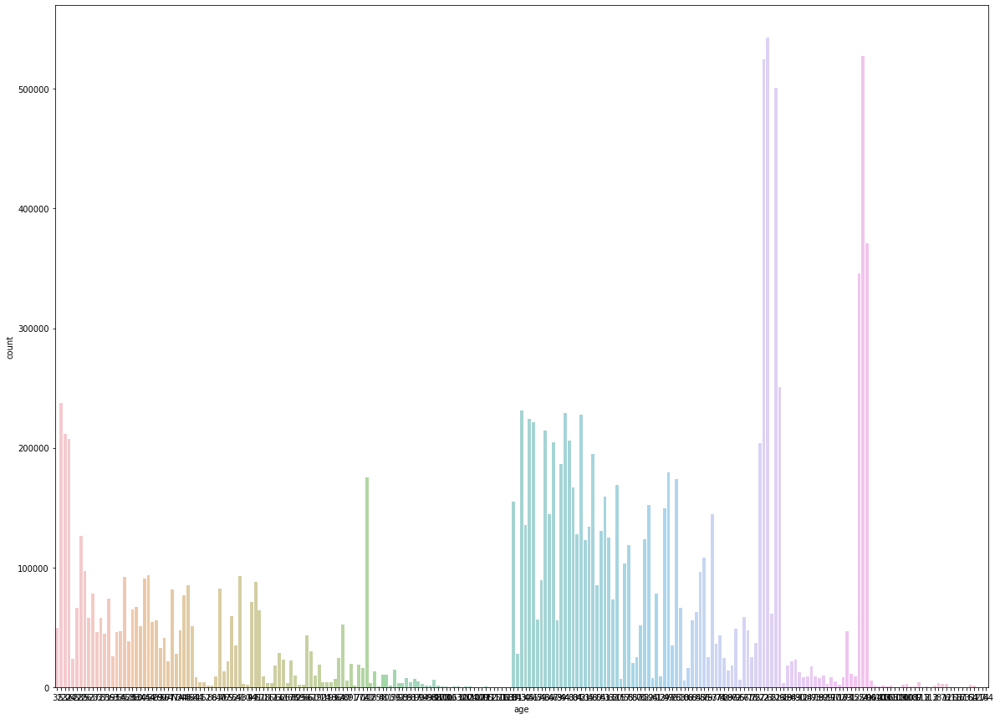

--------------------------------------------------
col: fecha_alta


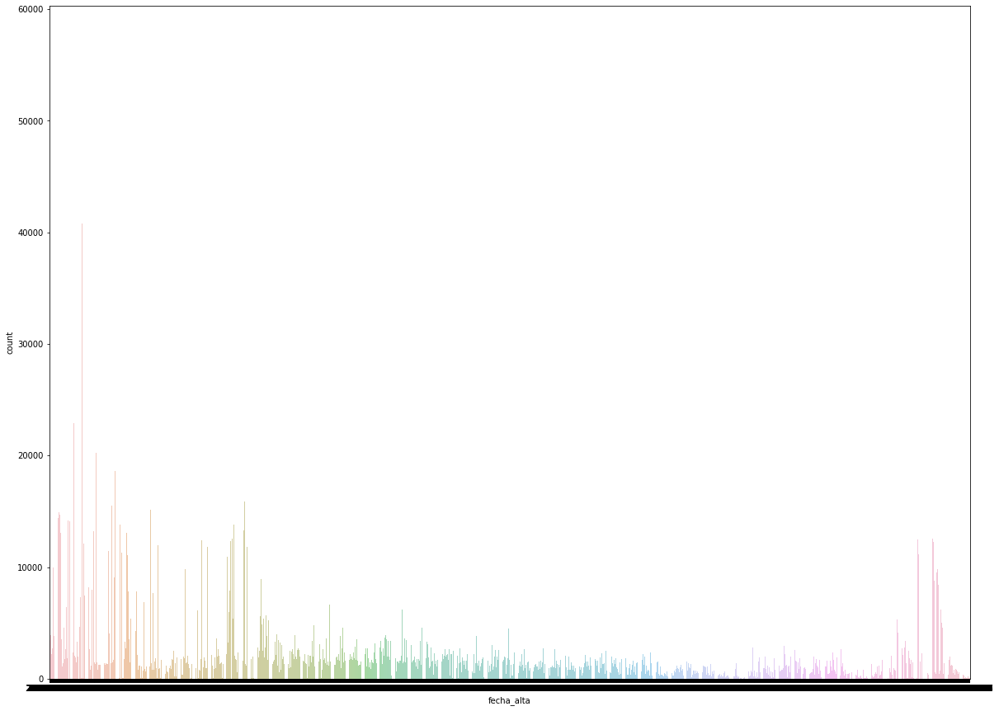

--------------------------------------------------
col: ind_nuevo


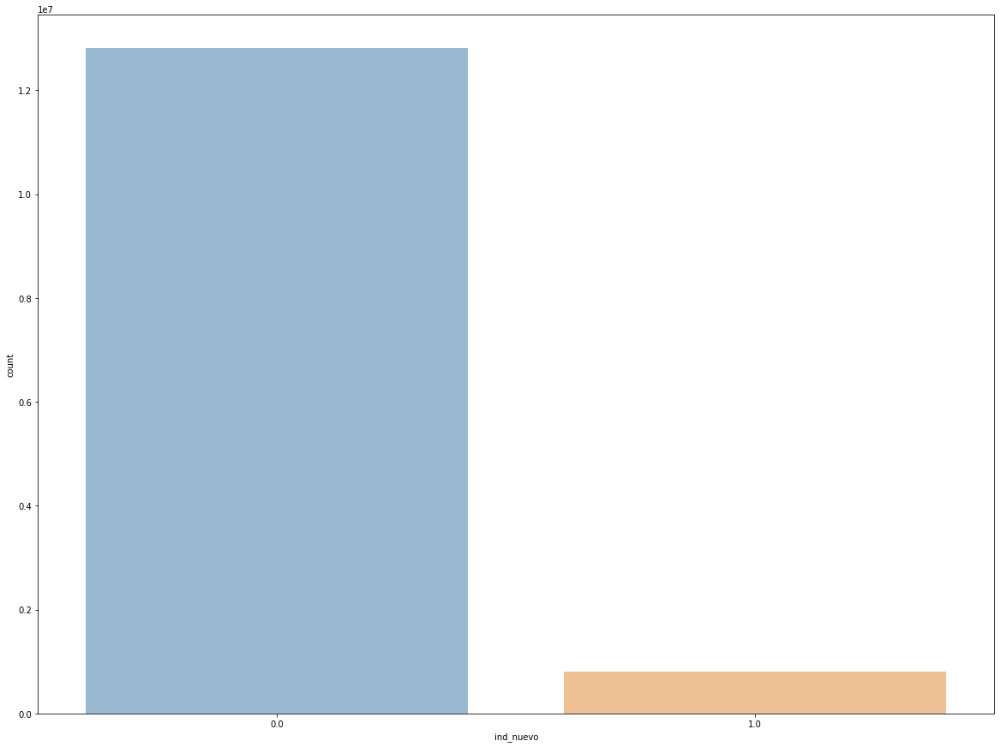

--------------------------------------------------
col: antiguedad


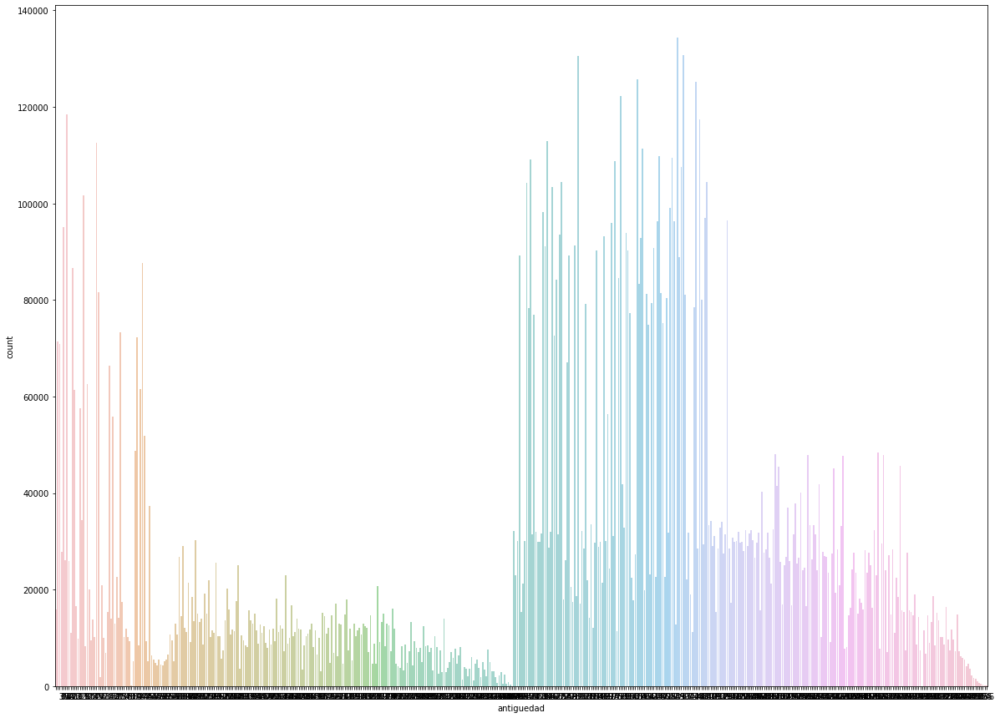

--------------------------------------------------
col: indrel


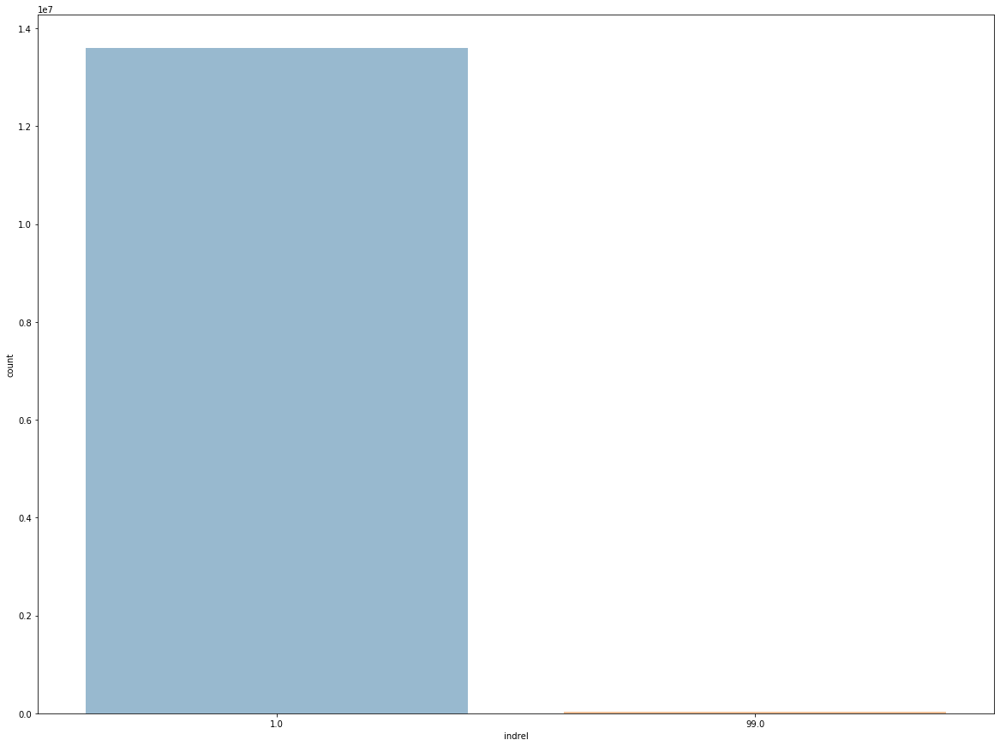

--------------------------------------------------
col: ult_fec_cli_1t


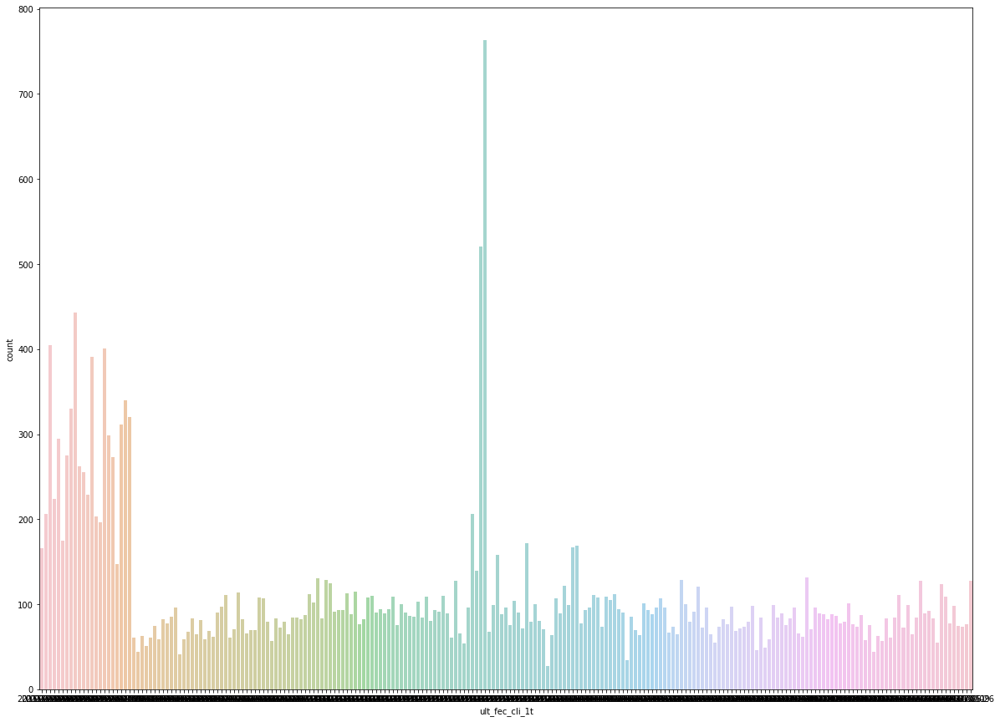

--------------------------------------------------
col: indrel_1mes


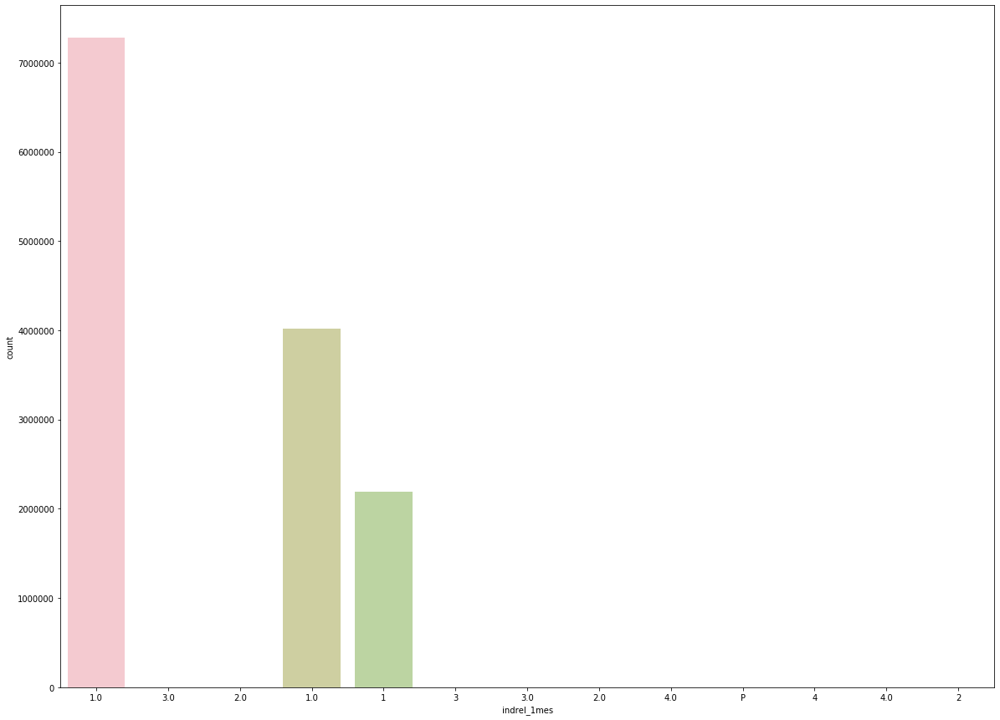

--------------------------------------------------
col: tiprel_1mes


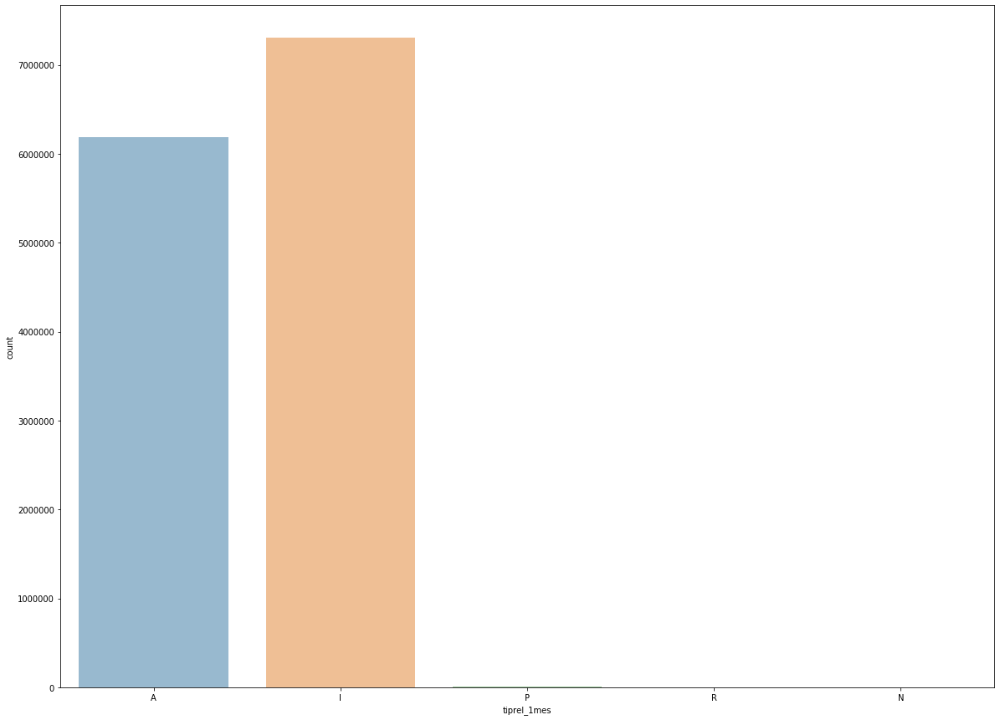

--------------------------------------------------
col: indresi


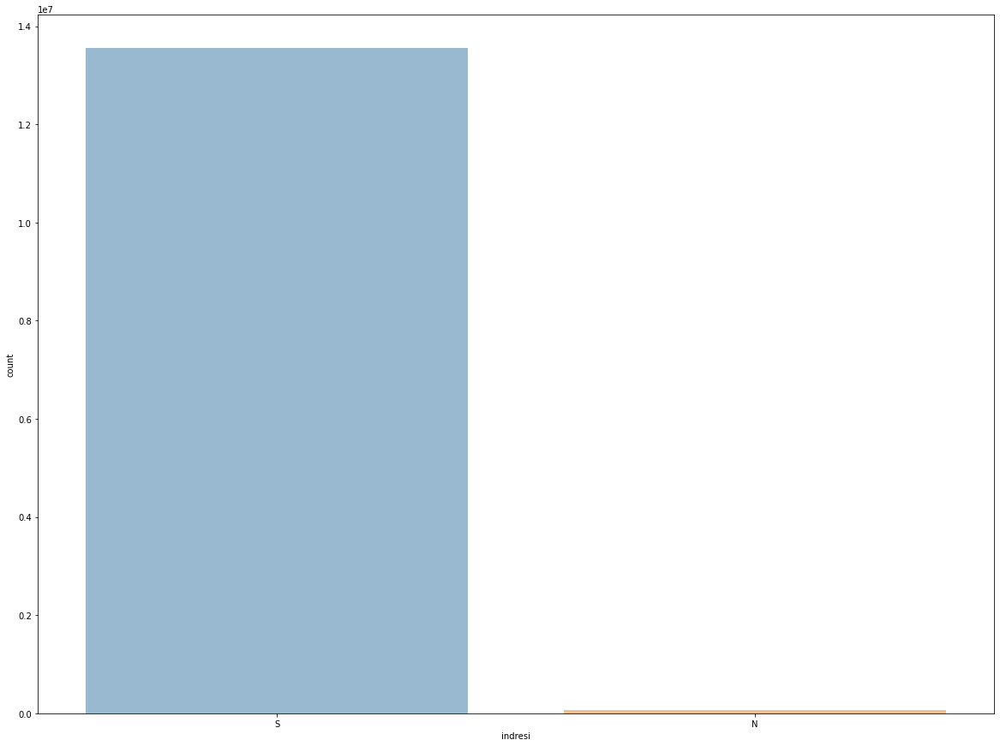

--------------------------------------------------
col: indext


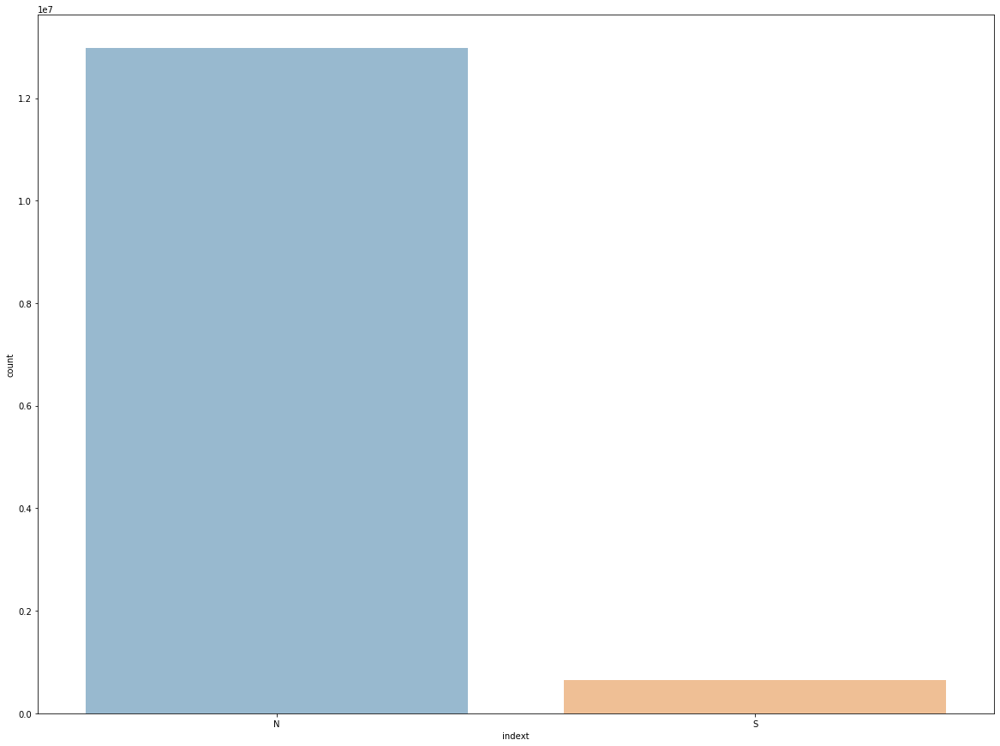

--------------------------------------------------
col: conyuemp


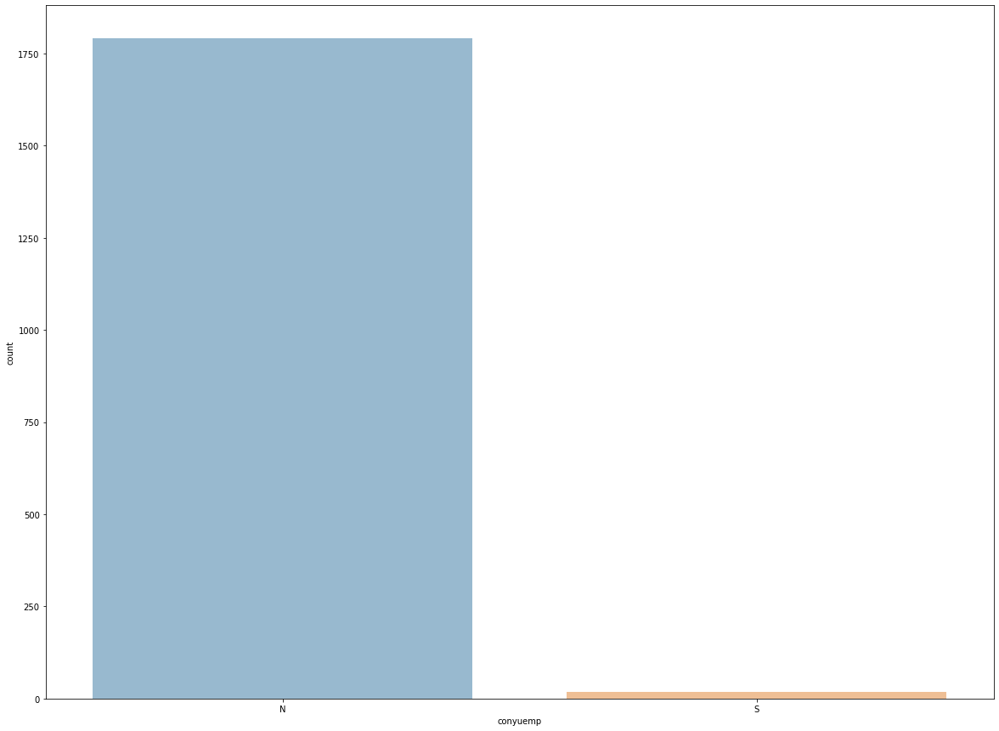

--------------------------------------------------
col: canal_entrada


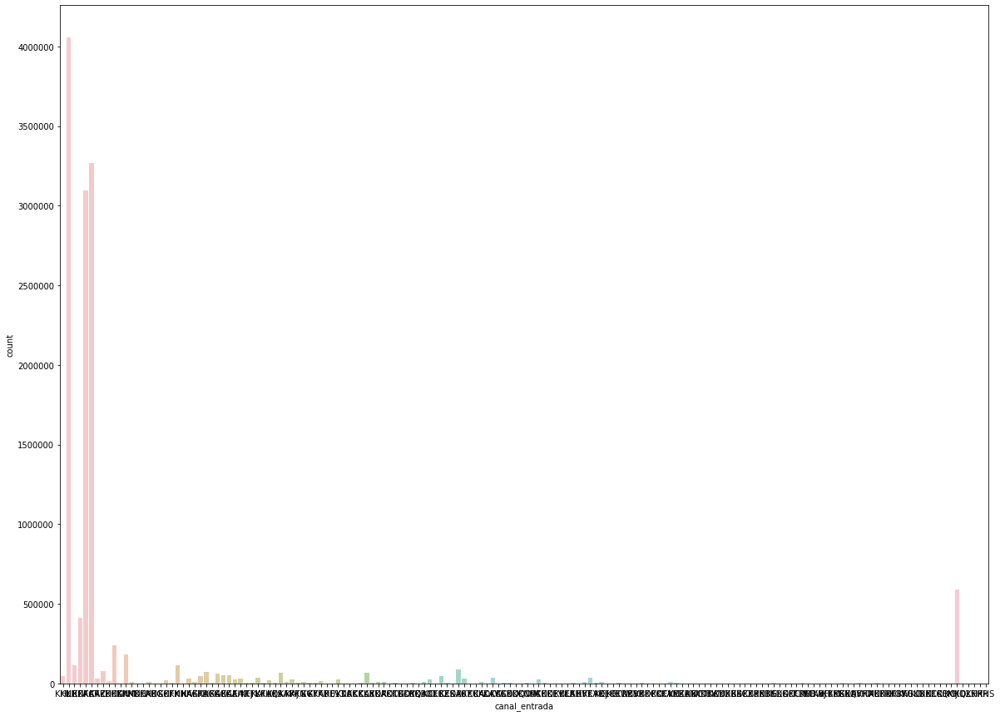

--------------------------------------------------
col: indfall


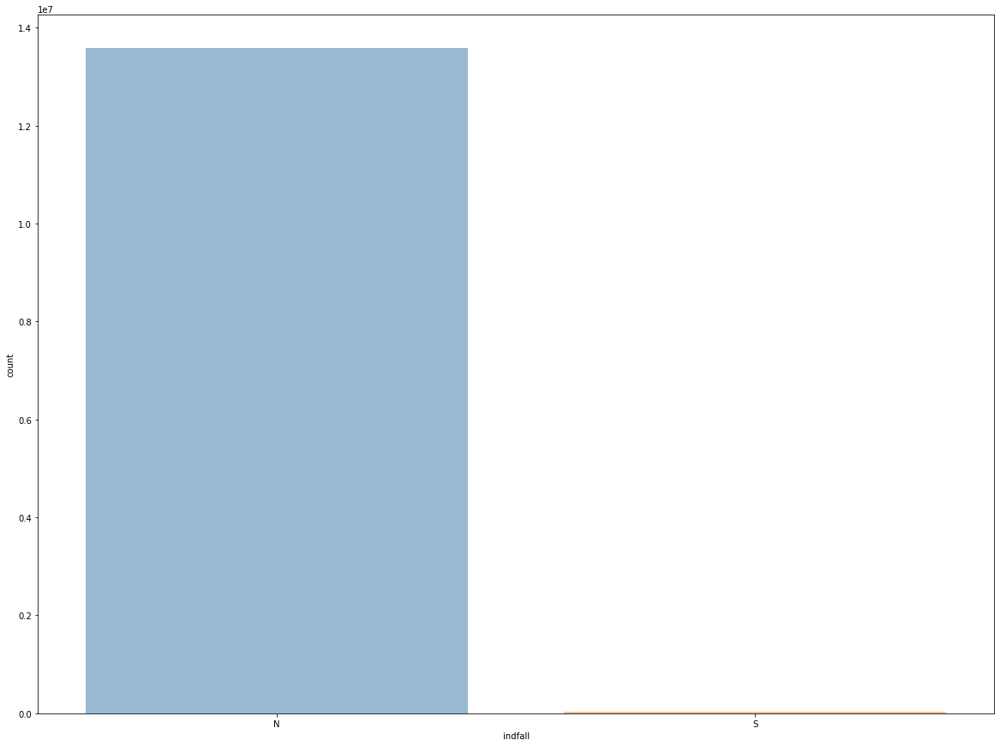

--------------------------------------------------
col: tipodom


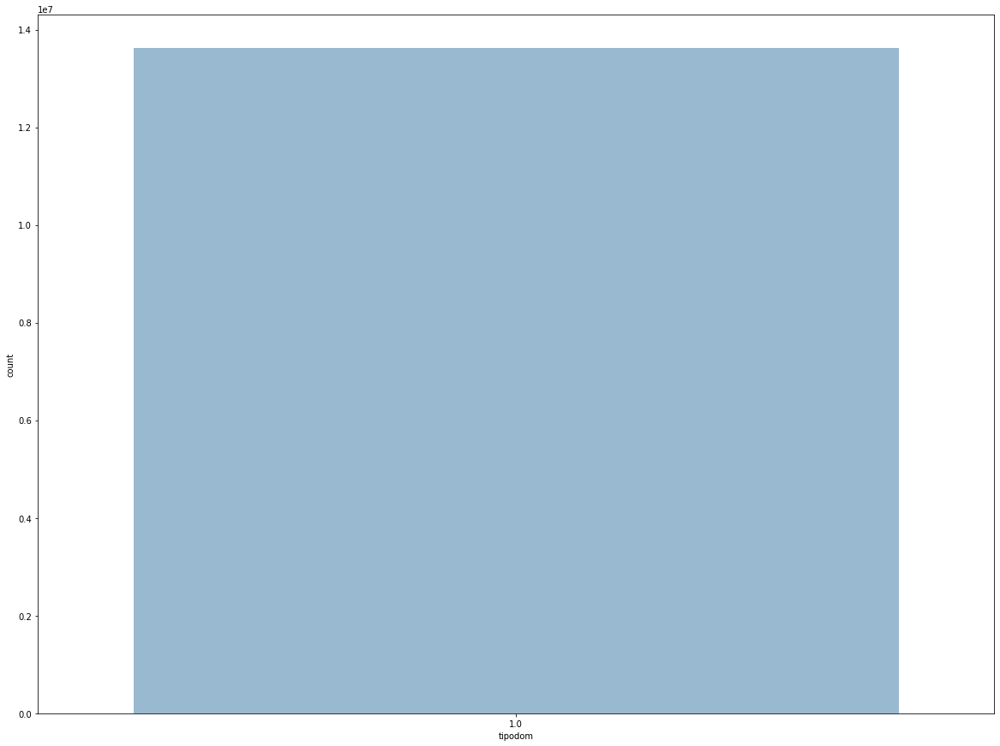

--------------------------------------------------
col: cod_prov


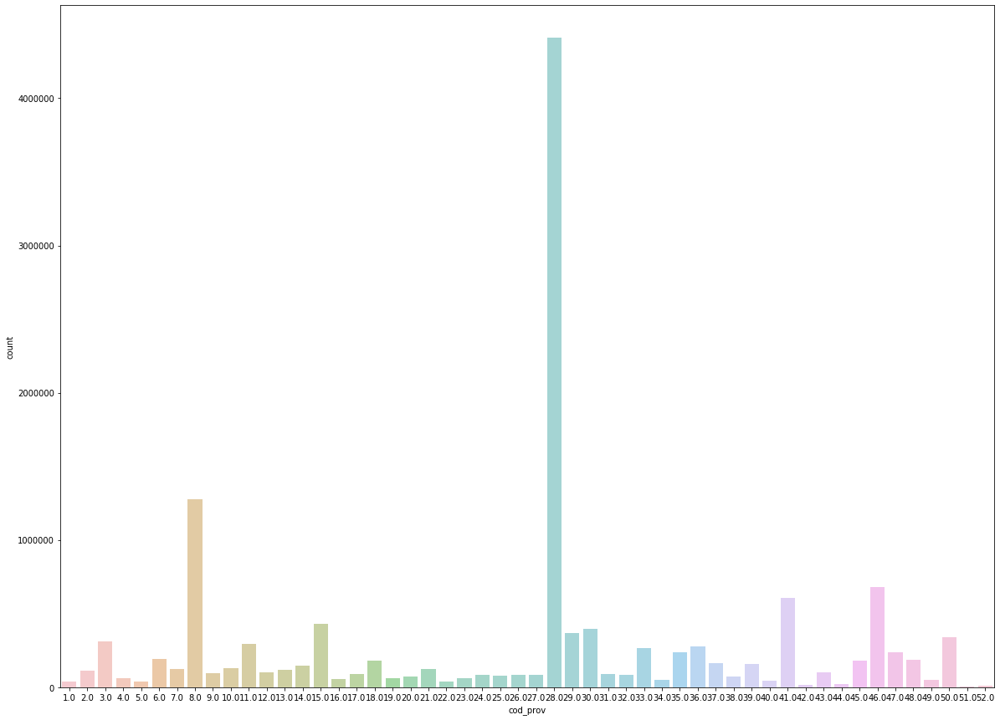

--------------------------------------------------
col: nomprov


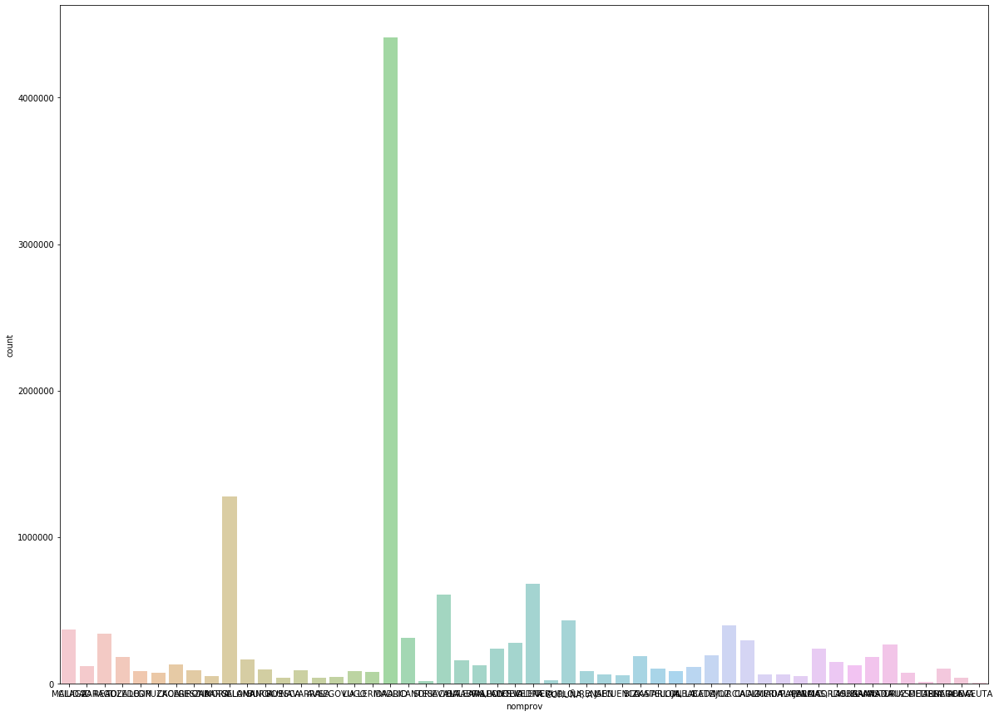

--------------------------------------------------
col: ind_actividad_cliente


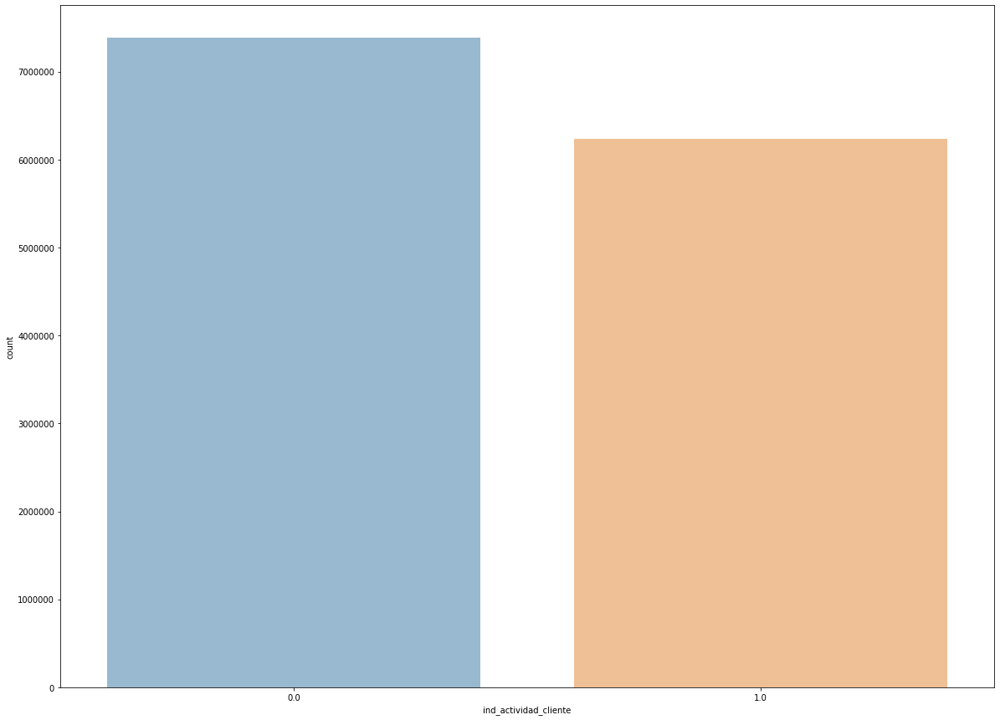

--------------------------------------------------
col: segmento


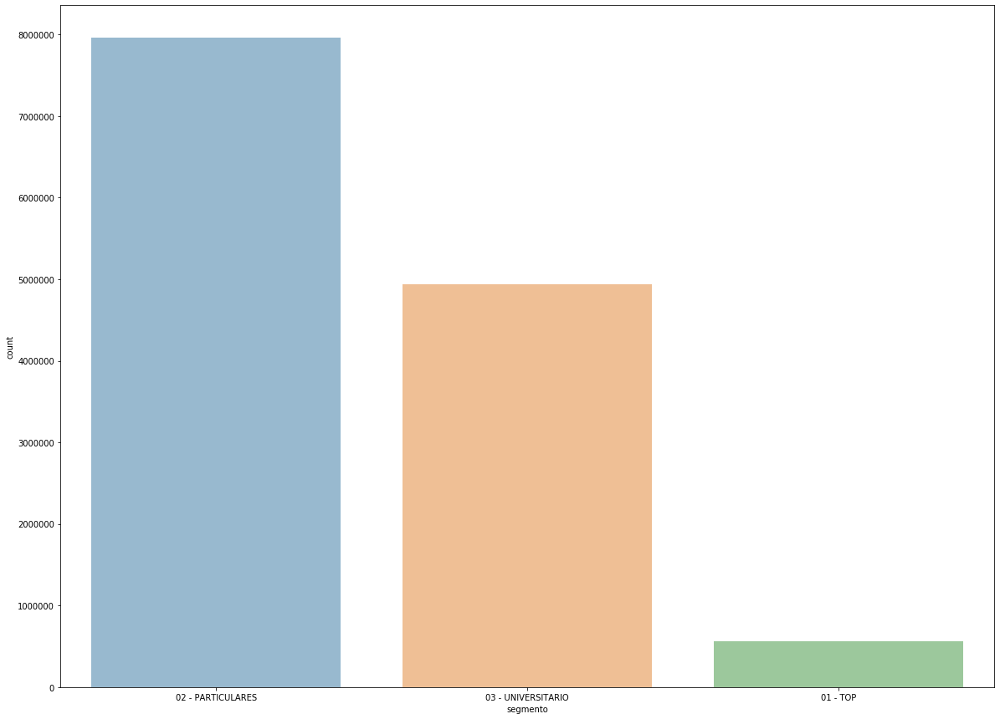

--------------------------------------------------
col: ind_ahor_fin_ult1


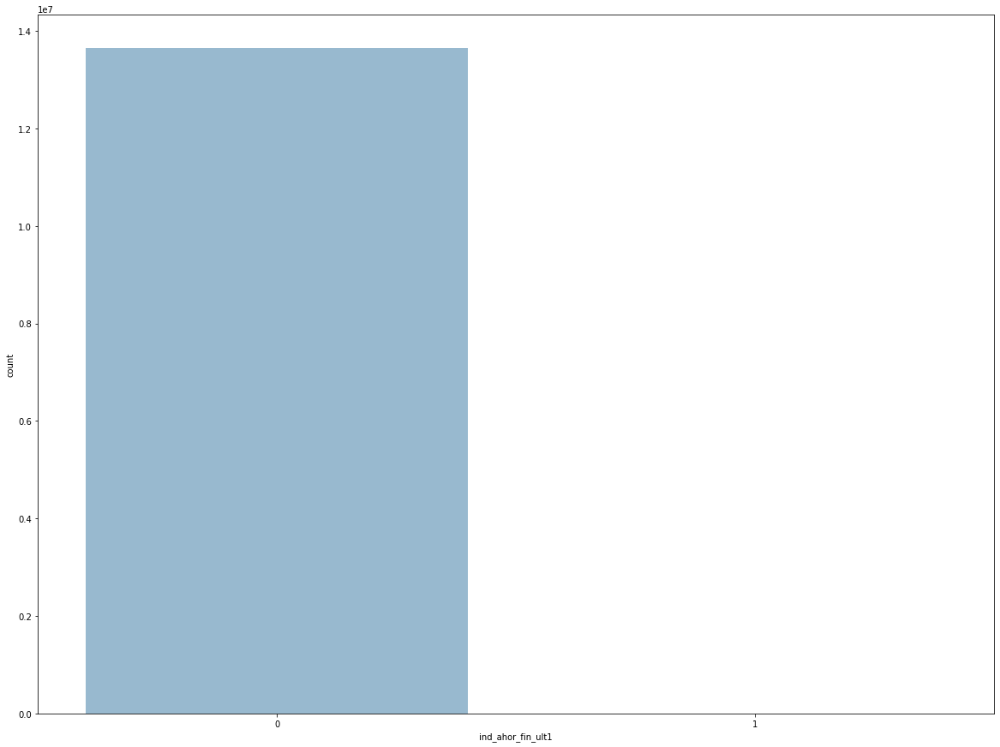

--------------------------------------------------
col: ind_aval_fin_ult1


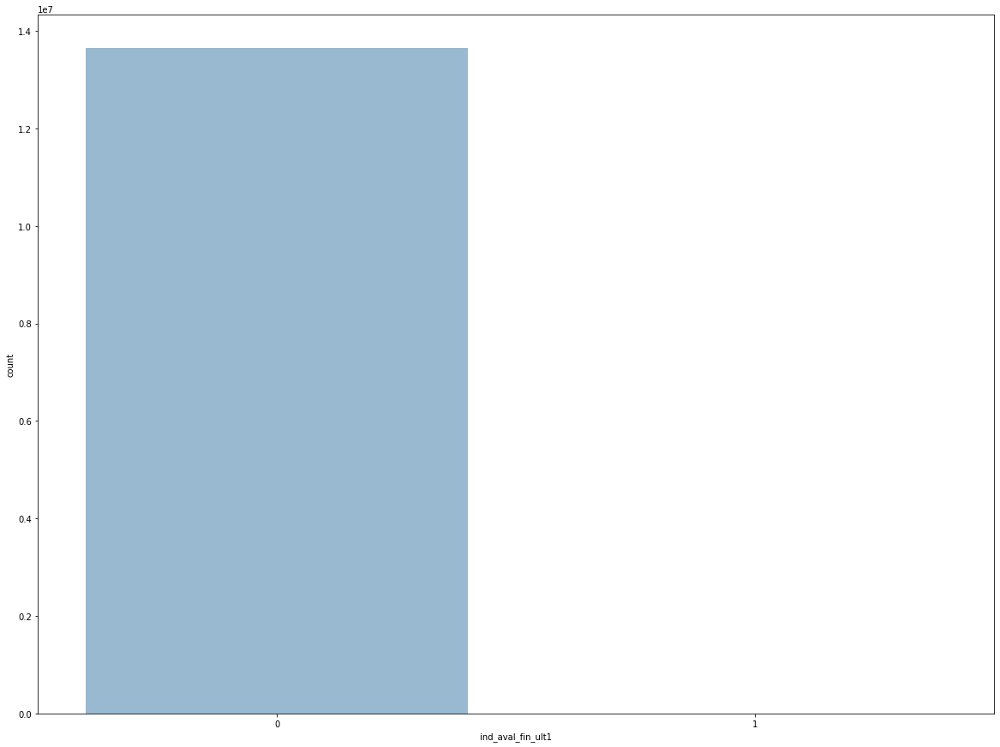

--------------------------------------------------
col: ind_cco_fin_ult1


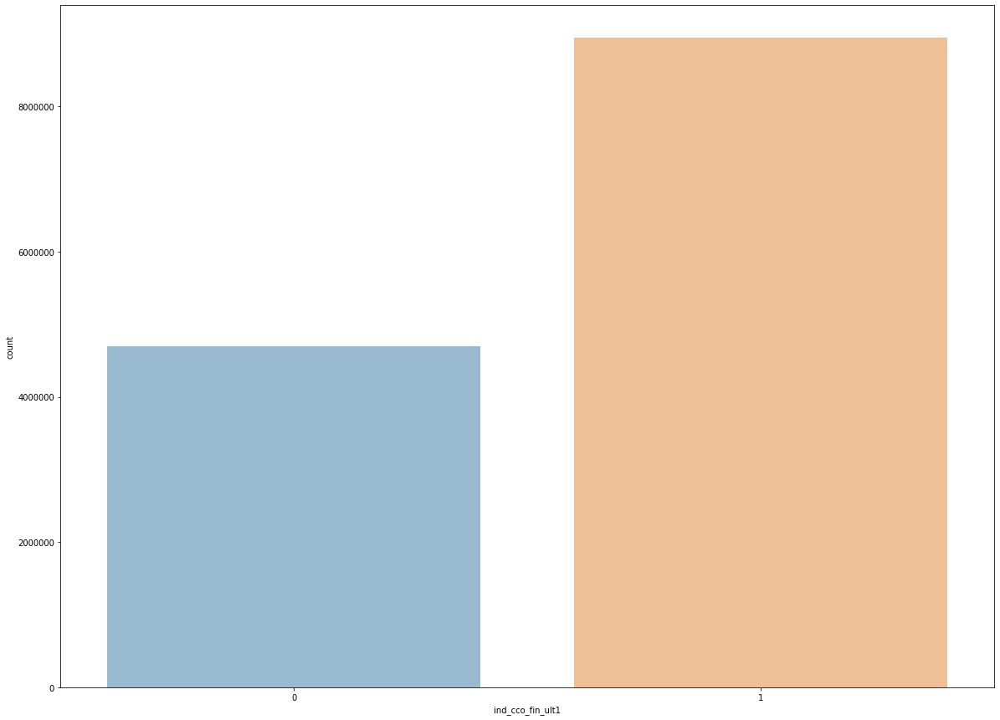

--------------------------------------------------
col: ind_cder_fin_ult1


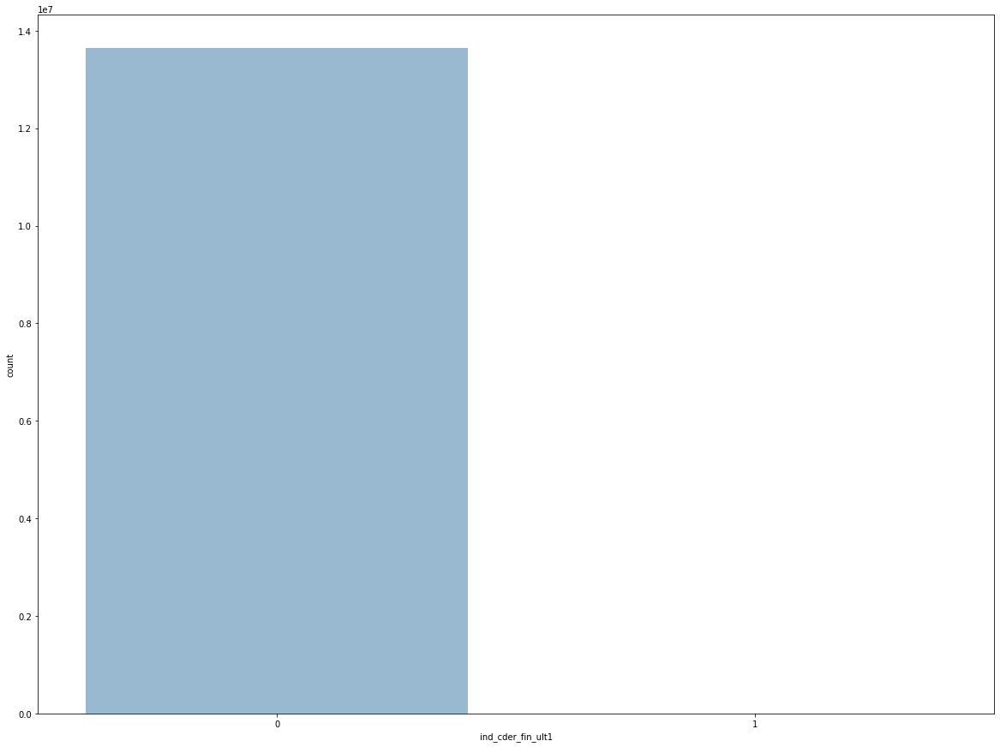

--------------------------------------------------
col: ind_cno_fin_ult1


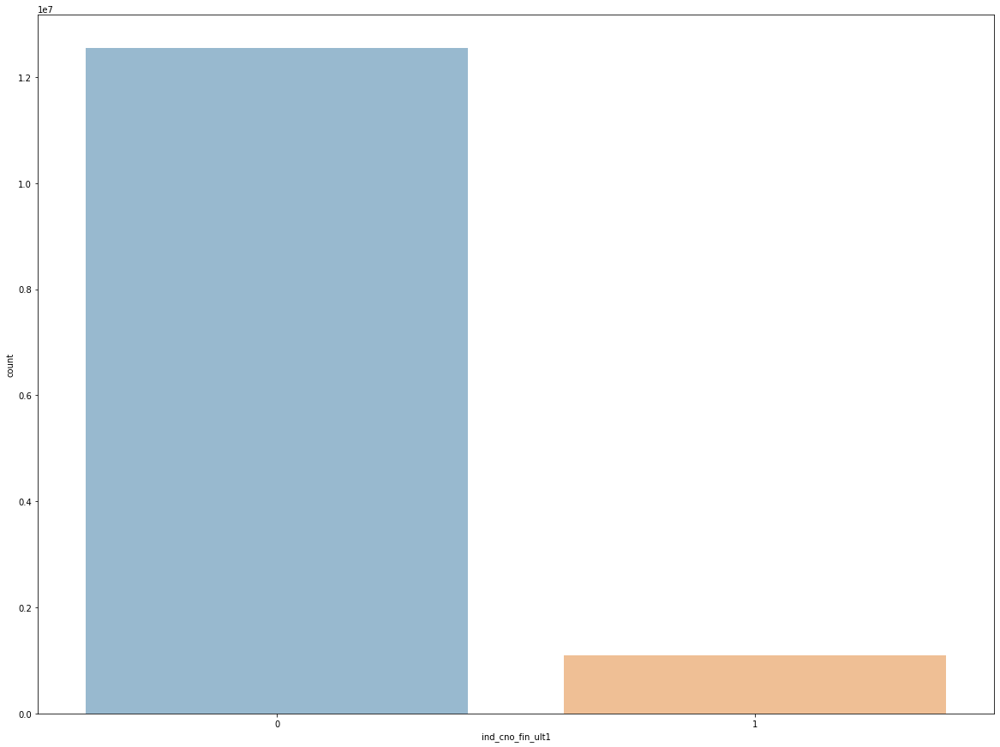

--------------------------------------------------
col: ind_ctju_fin_ult1


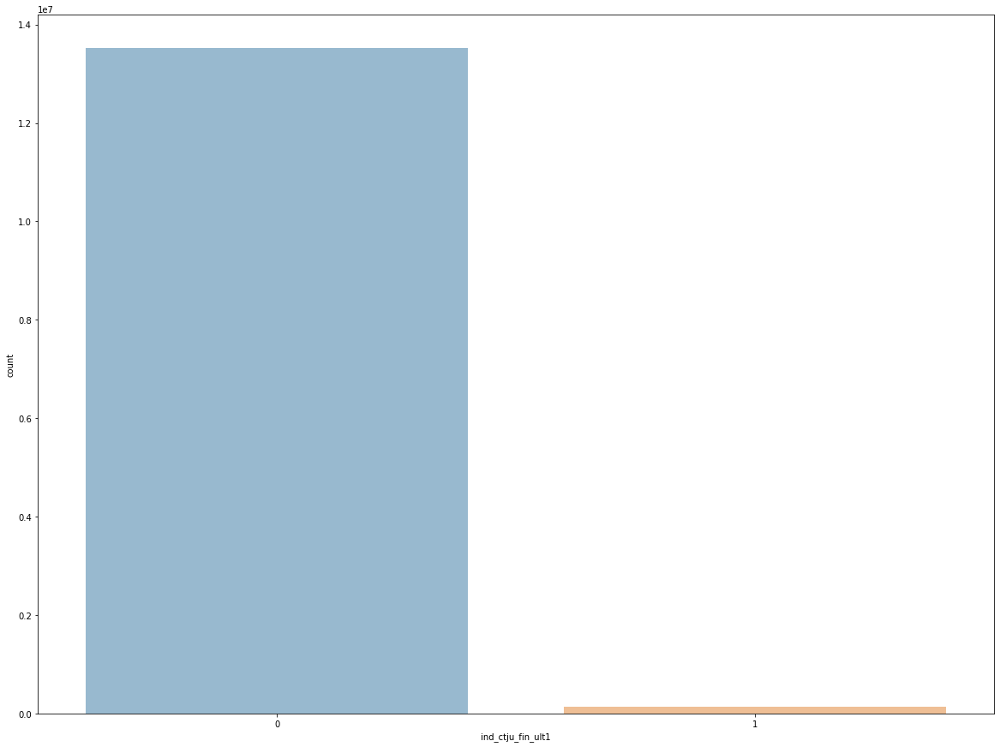

--------------------------------------------------
col: ind_ctma_fin_ult1


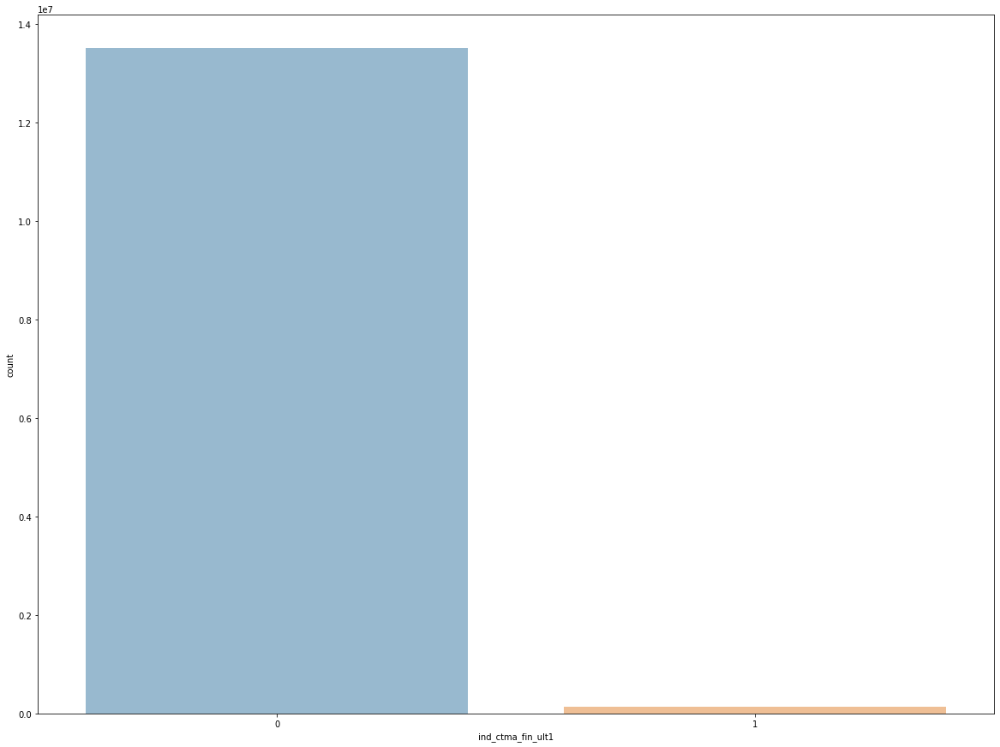

--------------------------------------------------
col: ind_ctop_fin_ult1


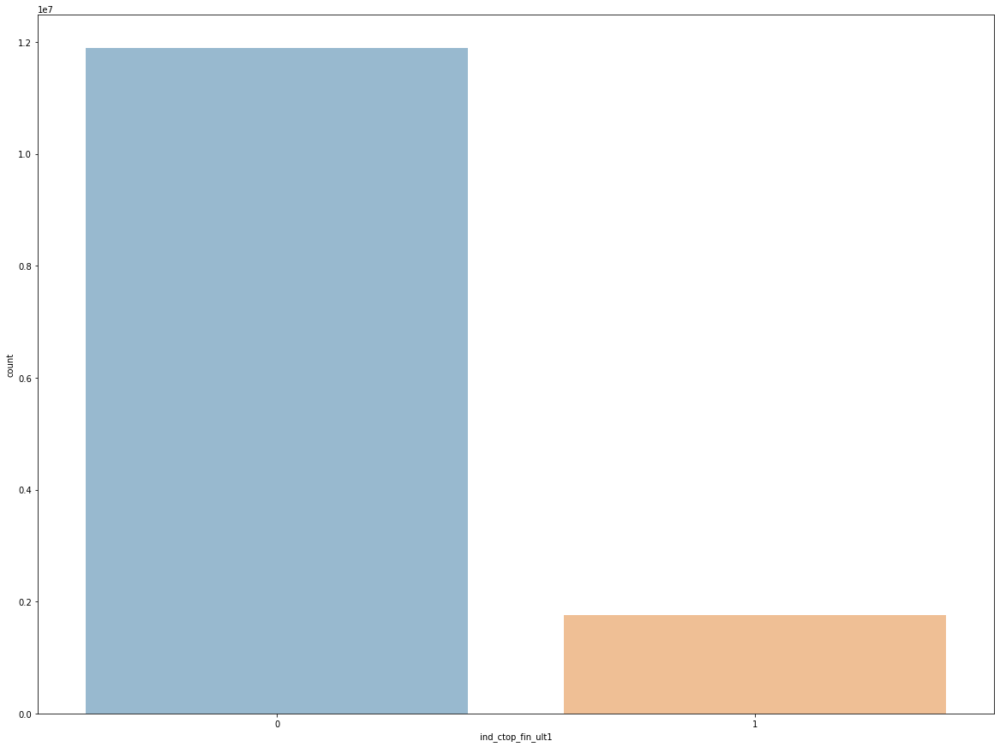

--------------------------------------------------
col: ind_ctpp_fin_ult1


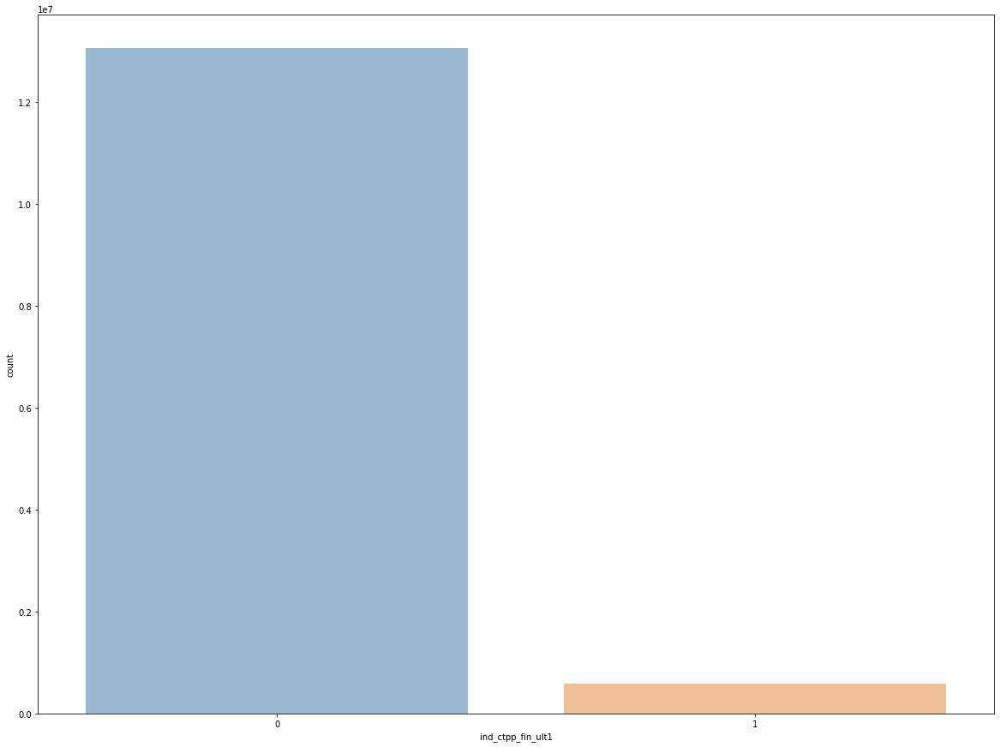

--------------------------------------------------
col: ind_deco_fin_ult1


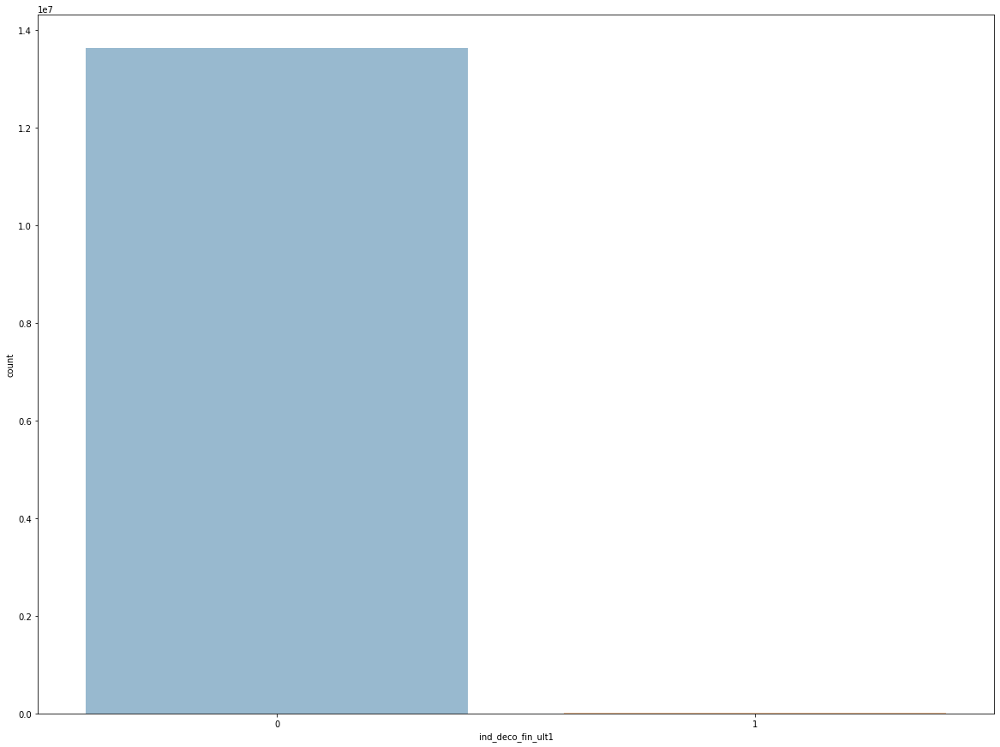

--------------------------------------------------
col: ind_deme_fin_ult1


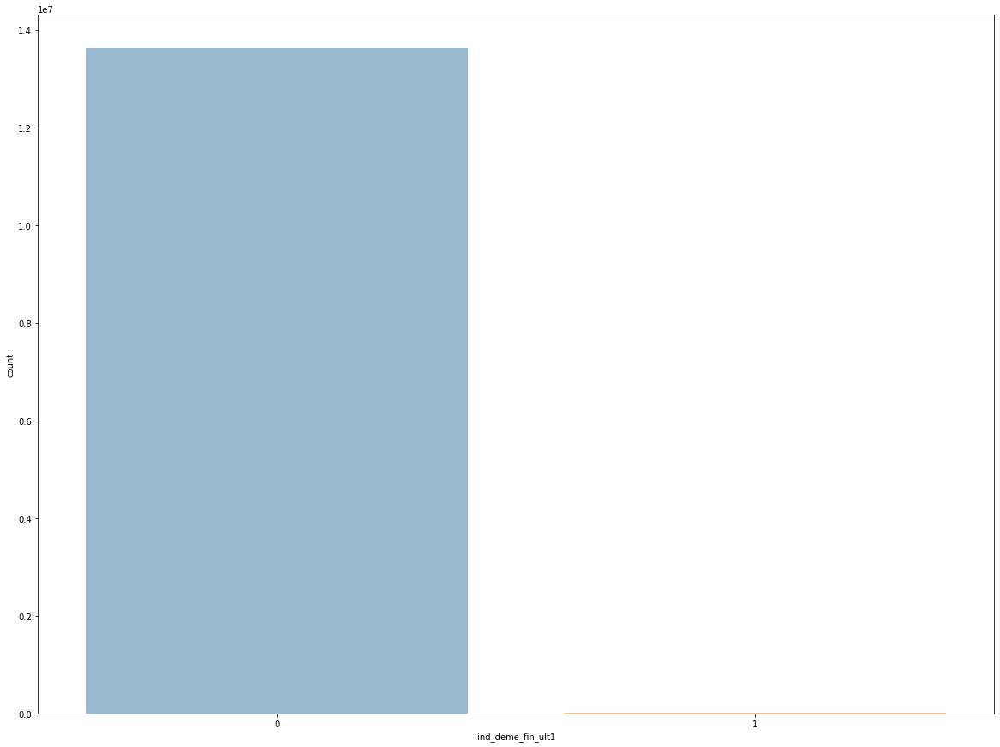

--------------------------------------------------
col: ind_dela_fin_ult1


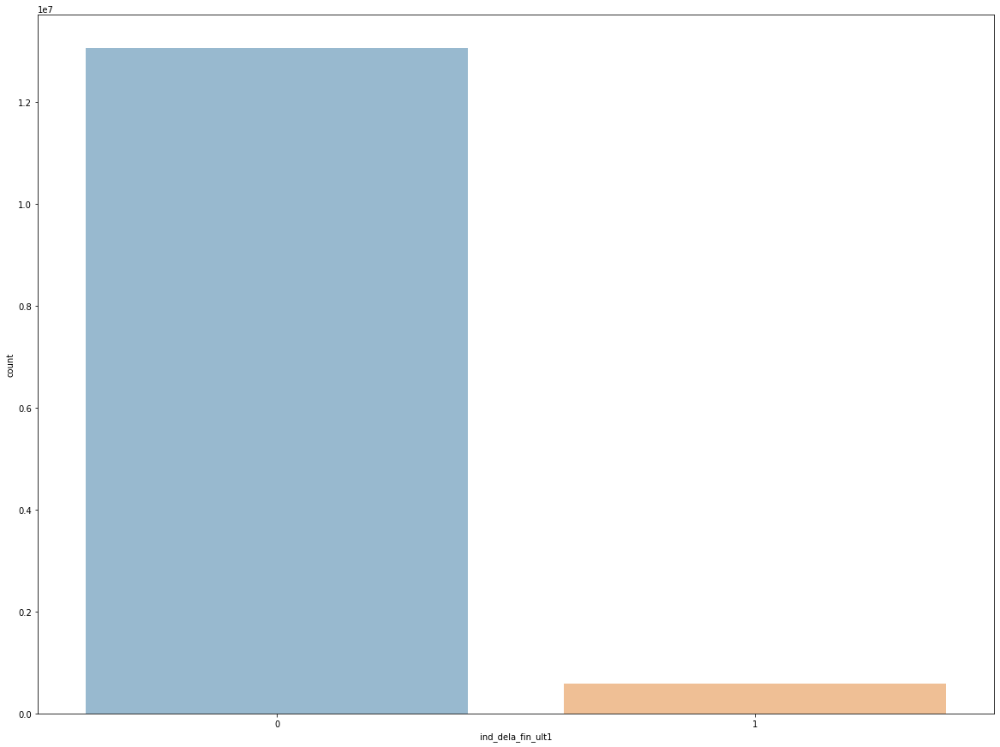

--------------------------------------------------
col: ind_ecue_fin_ult1


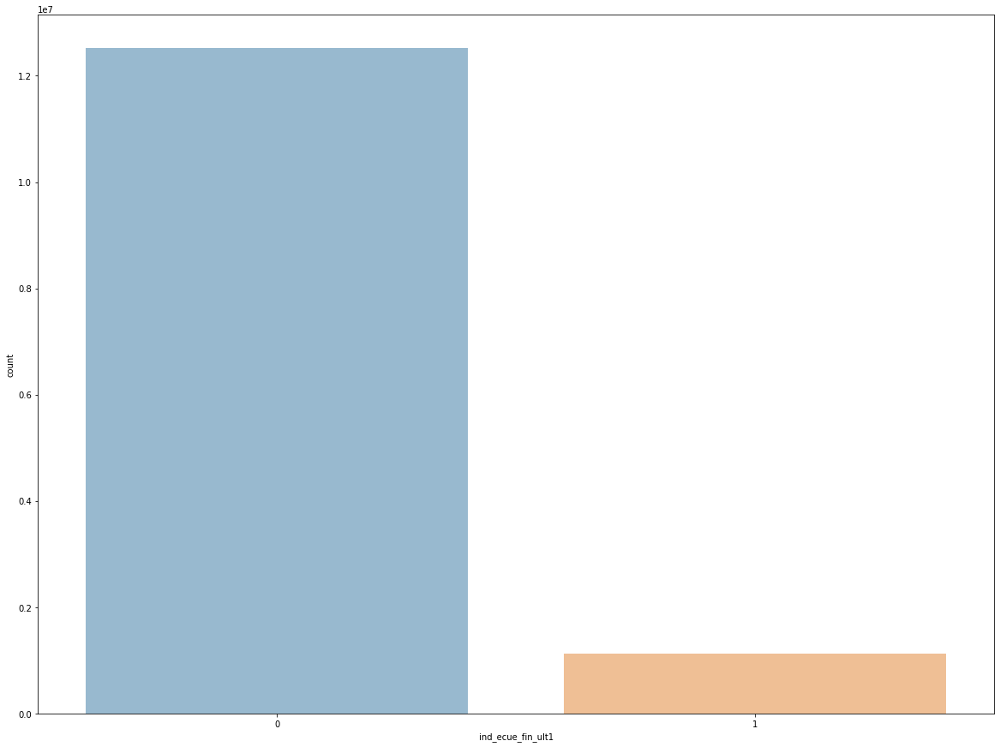

--------------------------------------------------
col: ind_fond_fin_ult1


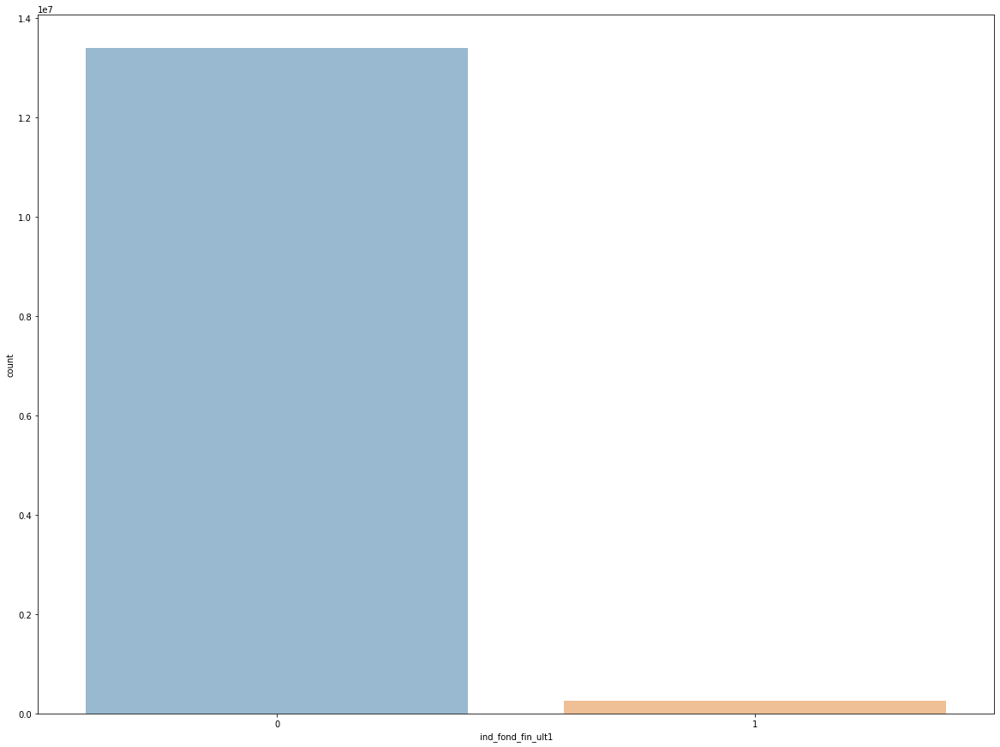

--------------------------------------------------
col: ind_hip_fin_ult1


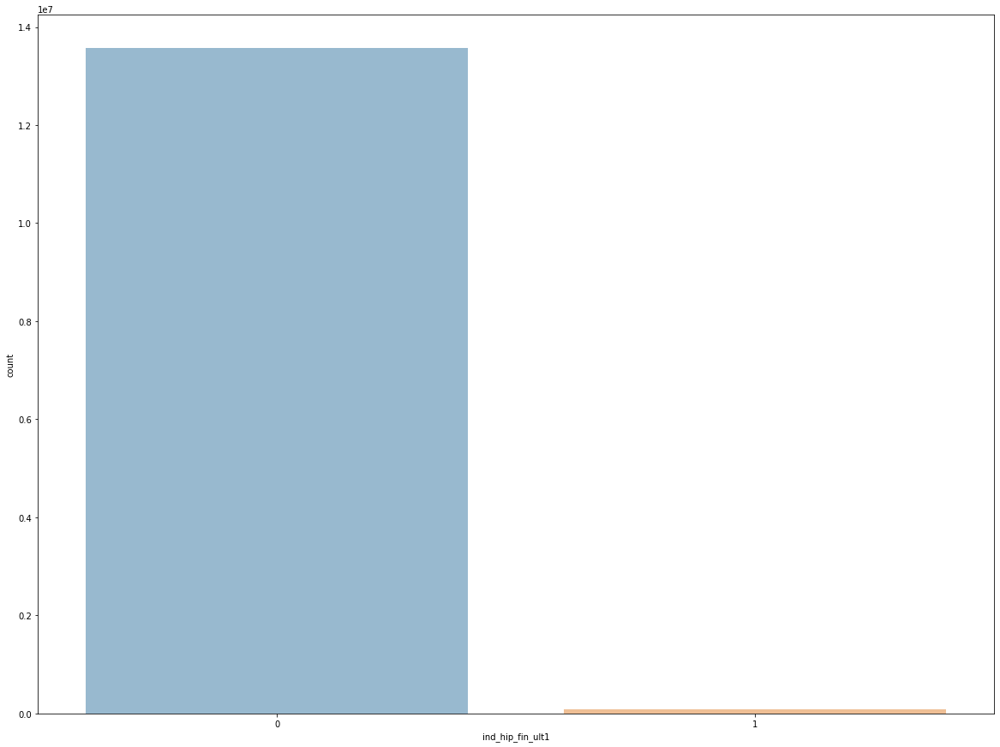

--------------------------------------------------
col: ind_plan_fin_ult1


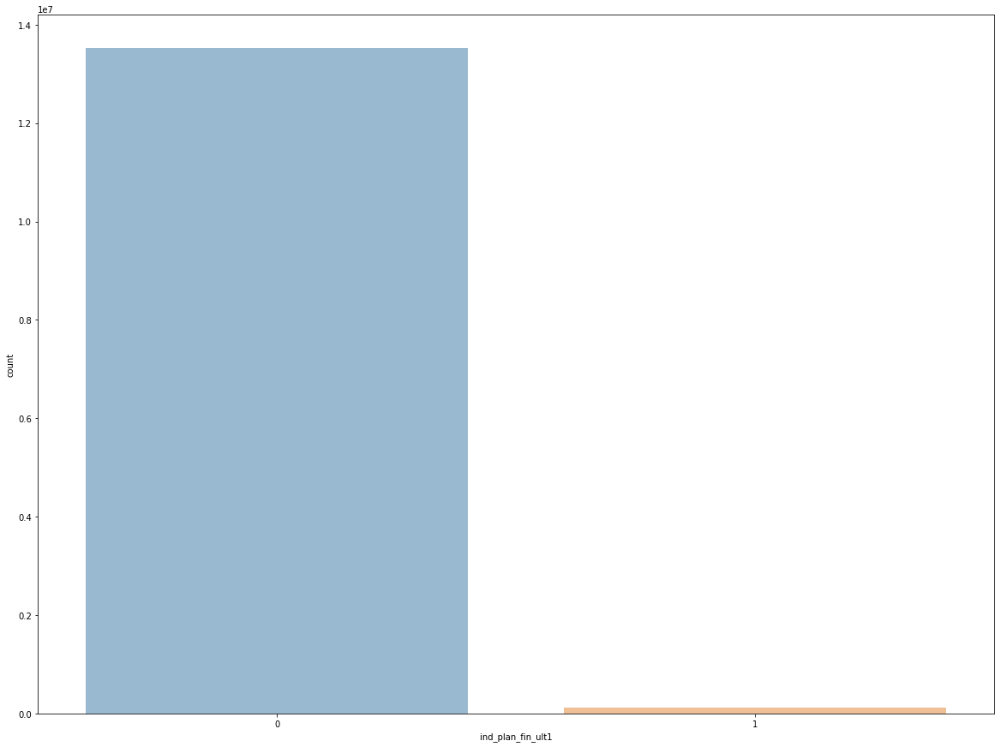

--------------------------------------------------
col: ind_pres_fin_ult1


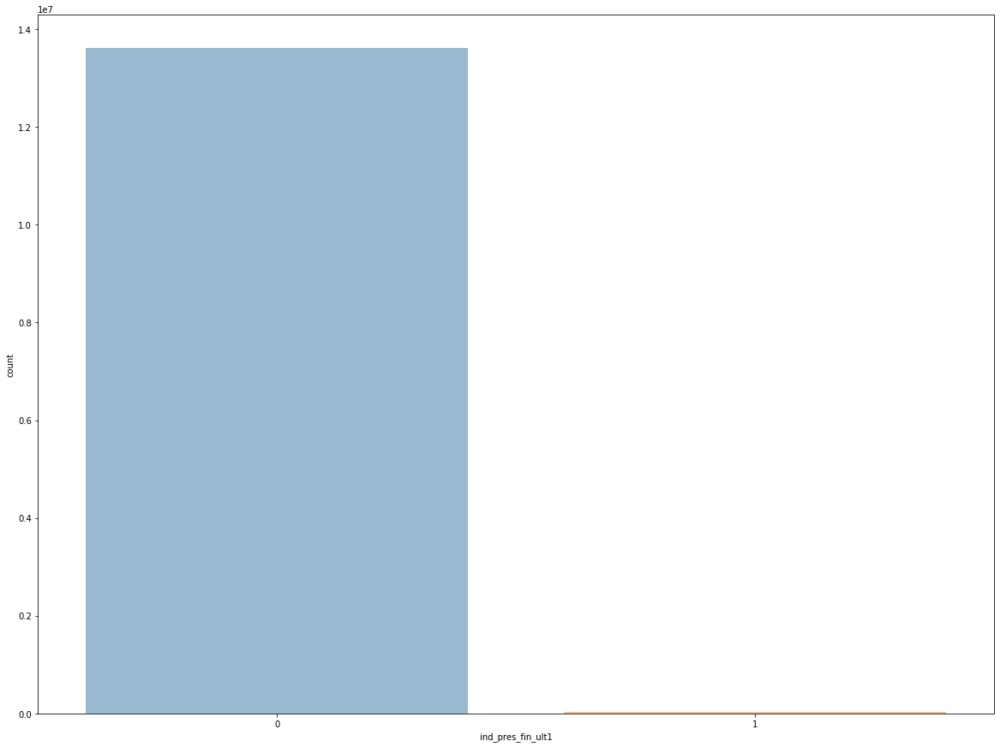

--------------------------------------------------
col: ind_reca_fin_ult1


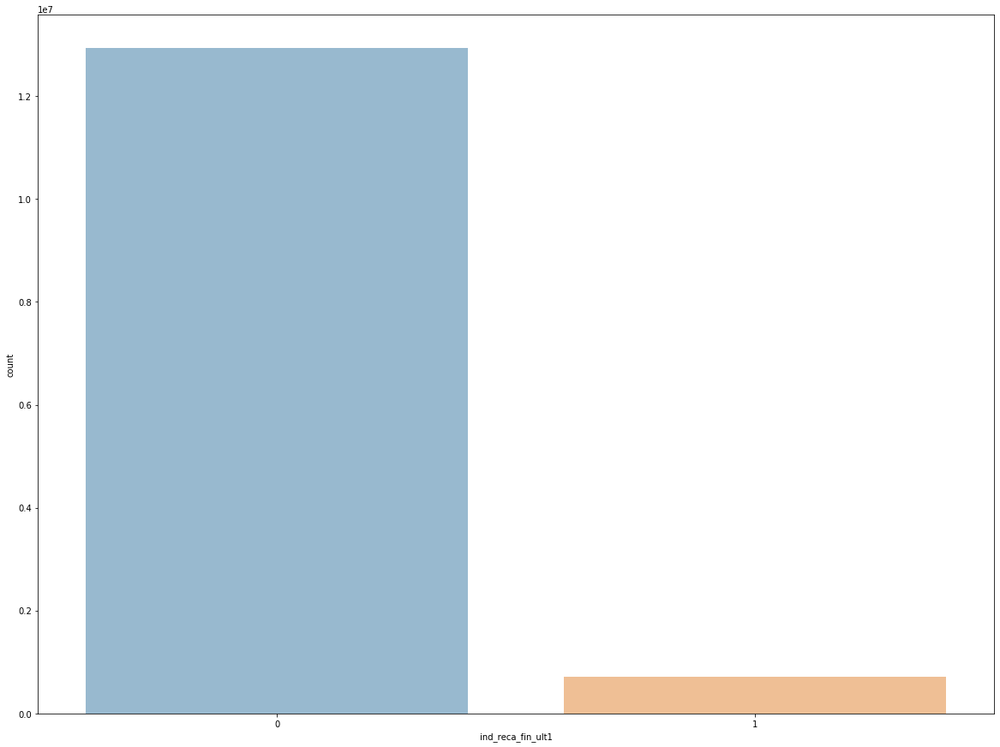

--------------------------------------------------
col: ind_tjcr_fin_ult1


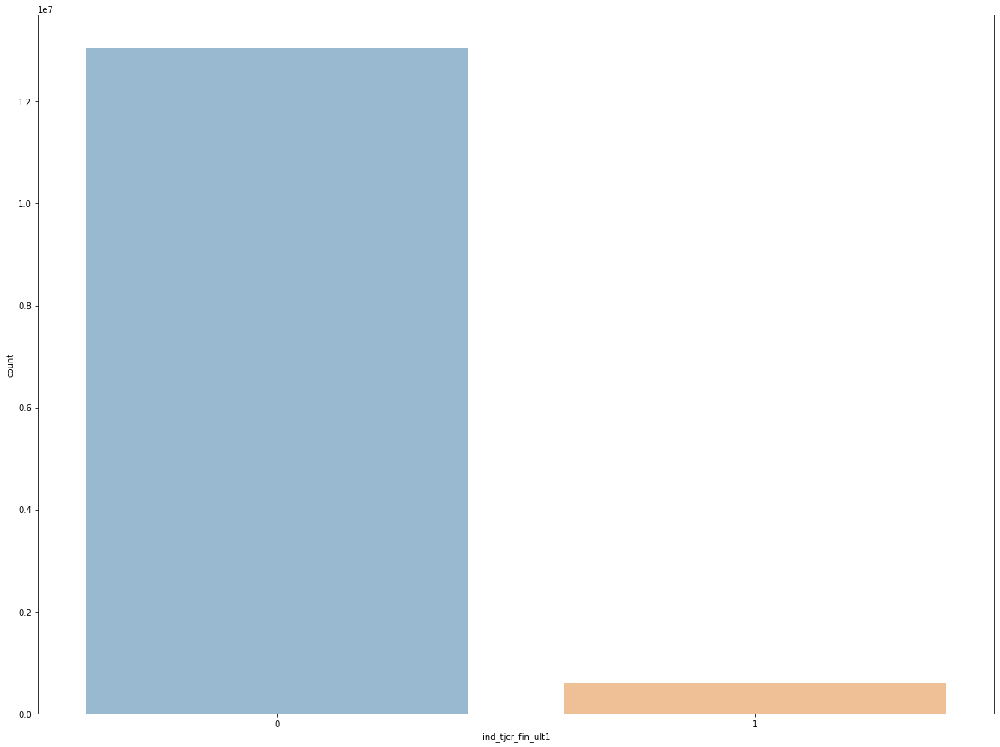

--------------------------------------------------
col: ind_valo_fin_ult1


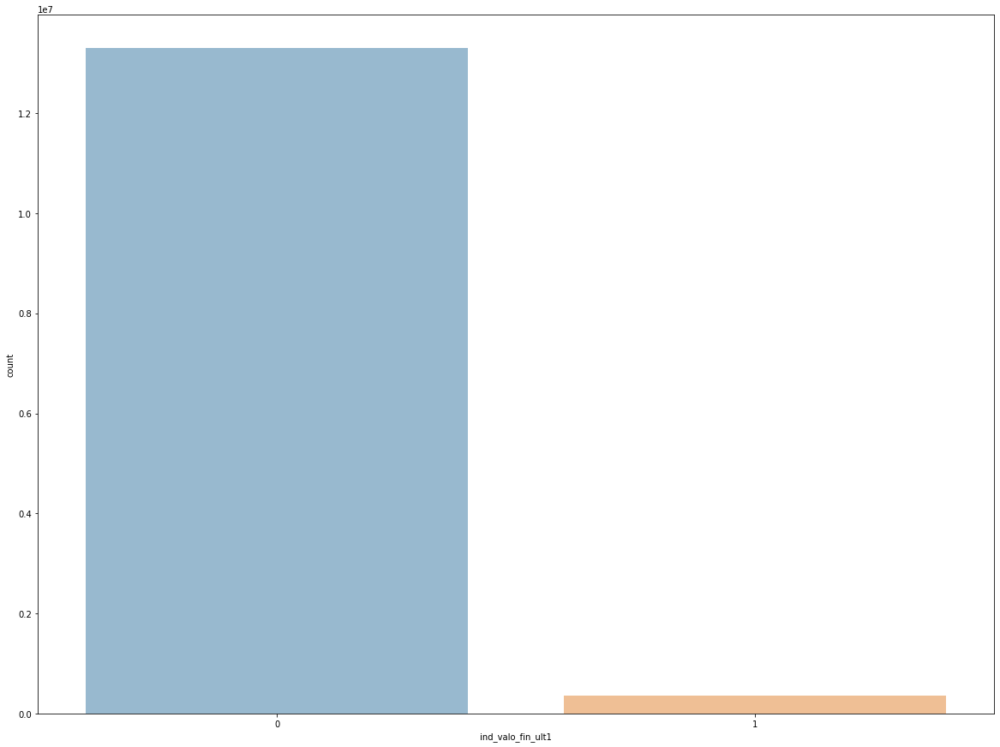

--------------------------------------------------
col: ind_viv_fin_ult1


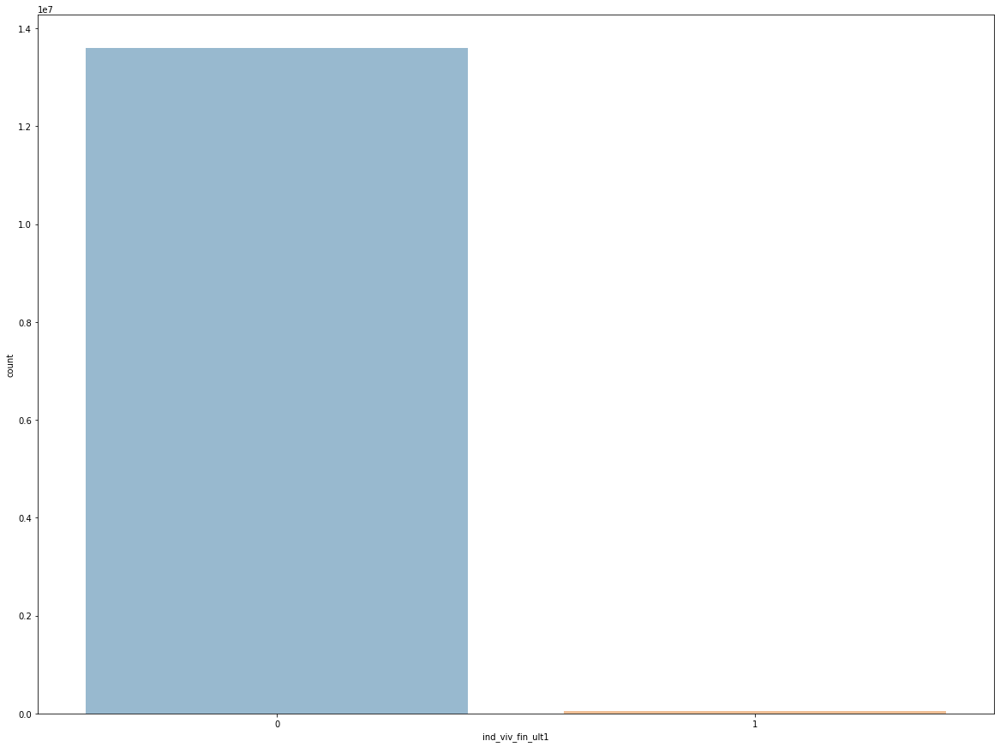

--------------------------------------------------
col: ind_nomina_ult1


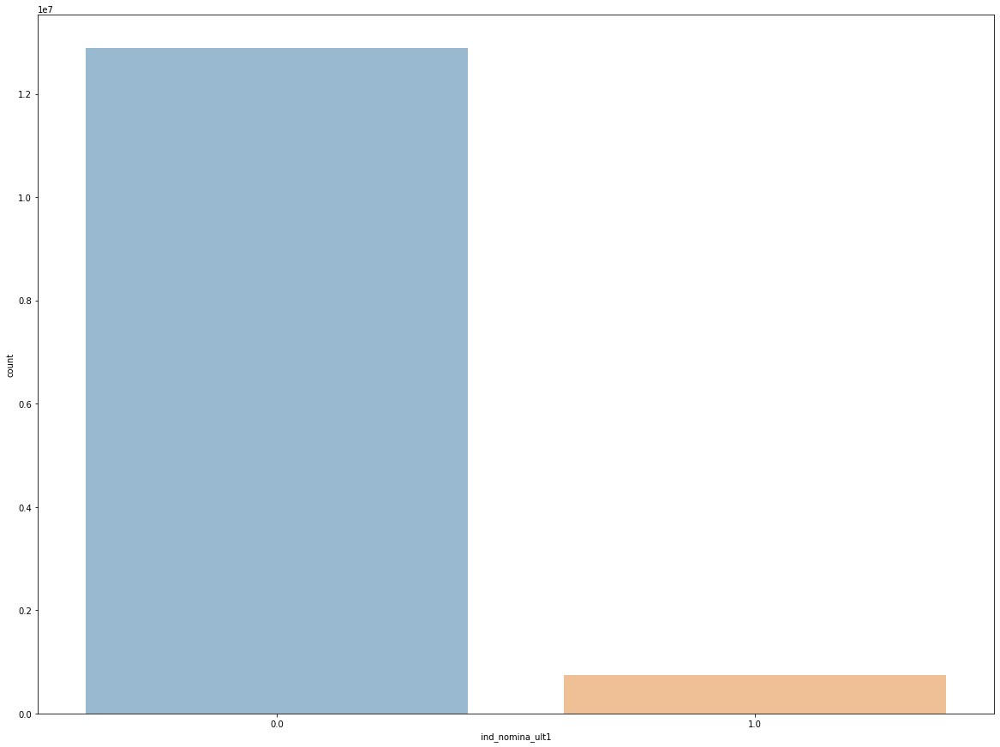

--------------------------------------------------
col: ind_nom_pens_ult1


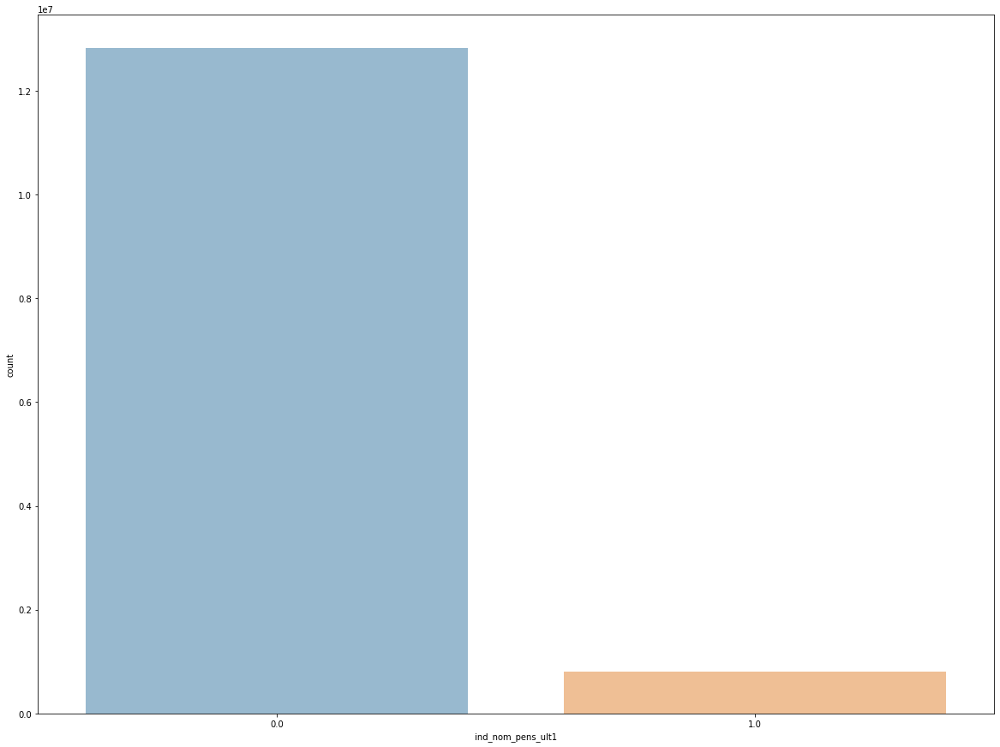

--------------------------------------------------
col: ind_recibo_ult1


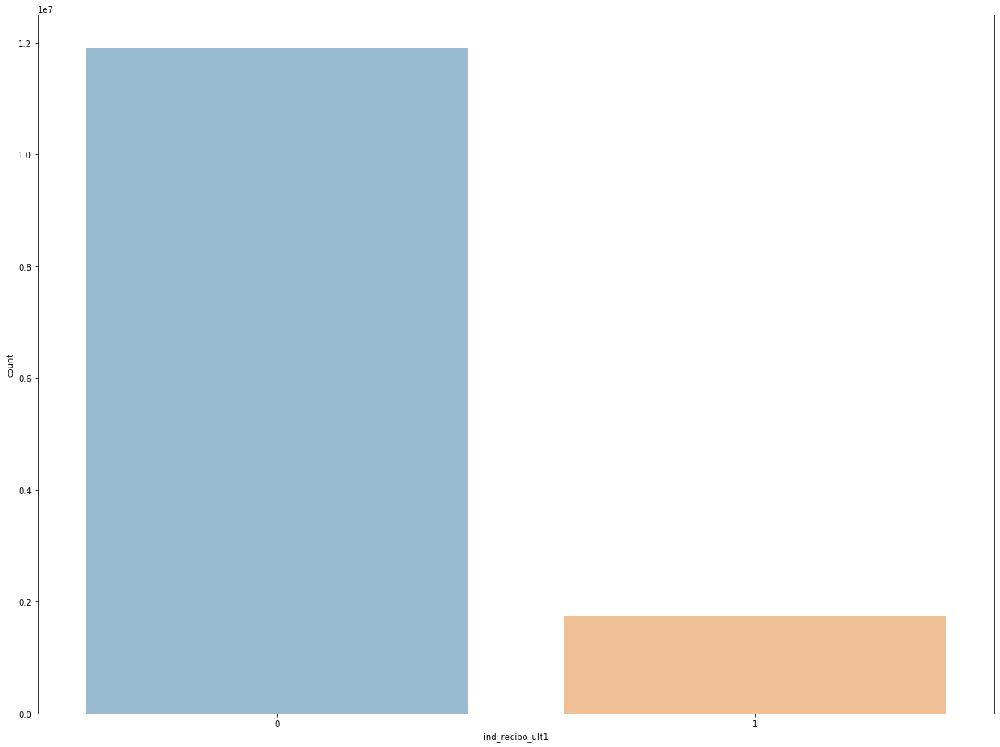

In [11]:
# 고객 고유 식별 번호인 ncodpers와 총 수입을 나타내는 renta는 고유값이 너무 많아 제외
skip_cols = ['ncodpers', 'renta']
for col in trn.columns:
    if col in skip_cols:
        continue
    # 영역 구분과 변수명 출력
    print('-' * 50)
    print(f'col: {col}')
    
    # 그래프 크기 설정
    f, ax = plt.subplots(figsize=(20, 15))
    # seaborn을 사용한 막대 그래프 생성
    sns.countplot(x=col, data=trn, alpha=0.5)
    plt.show()

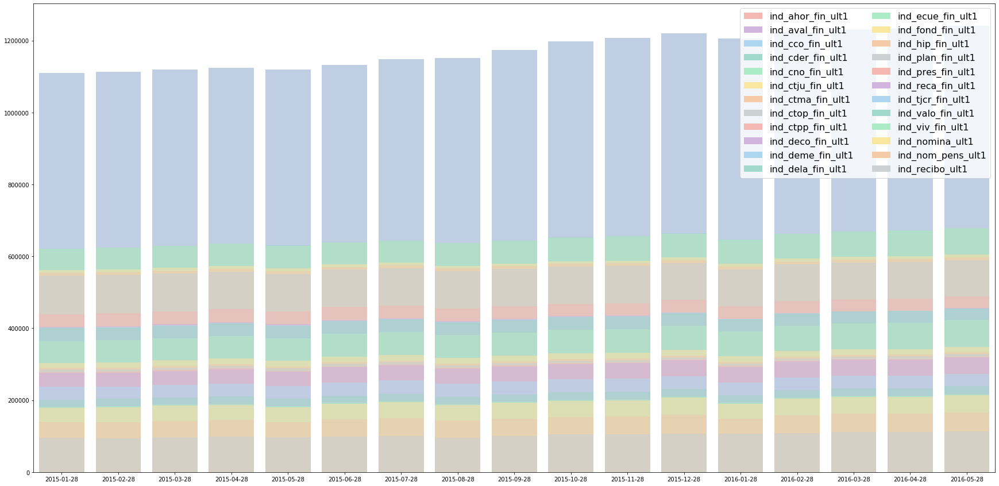

In [24]:
# 이 데이터는 시계열 데이터이기 때문에 시계열성을 시각화하기 위해 누적 막대 그래프 형태로 살펴보자
# 월별 금융 제품 보유 여부를 누적 막대 그래프로 시각화한다.

# 날짜 데이터를 기준으로 하기 위해 별도로 추출
months = trn['fecha_dato'].unique().tolist()
# 제품 변수 24개 추출(후반부 24개인듯)
label_cols = trn.columns[24:].tolist()

label_over_time = []
for i in range(len(label_cols)):
    # 매월, 각 제품의 총합을 groupby().agg('sum')으로 계산하여, label_sum에 저장
    label_sum = trn.groupby(['fecha_dato'])[label_cols[i]].agg('sum')
    label_over_time.append(label_sum.tolist())


label_sum_over_time = []
for i in range(len(label_cols)):
    # 누적 막대 그래프를 시각화하기 위해서 n번째 제품의 총합을 1~n번째 제품의 총합으로 만든다
    # 즉 날짜별 상품의 총합을 계산할 때에 누적해서 계산한다. 이는 누적 그래프를 위한 조치
    label_sum_over_time.append(np.asarray(label_over_time[i:]).sum(axis=0))

# 시각화를 위하여 색깔 지정
color_list = ['#F5B7B1', '#D2B4DE', '#AED6F1', '#A2D9CE', '#ABEBC6', '#F9E79F', '#F5CBA7', '#CCD1D1']

f, ax = plt.subplots(figsize=(30, 15))
for i in range(len(label_cols)):
    # 24개 제품에 대하여 Histogram을 그린다.
    # x축은 월, y축은 누적 총합
    sns.barplot(x=months, y=label_sum_over_time[i], color=color_list[i%8], alpha=0.7)

plt.legend([plt.Rectangle((0,0), 1, 1, fc=color_list[i%8], edgecolor='none') 
            for i in range(len(label_cols))], label_cols, loc=1, ncol=2, prop={'size': 16})

# 아래 데이터를 보면 총 제품 보유 수량이 조금씩 상승하는 것을 볼 수 있다 
# 아마도 고객의 수가 늘어나기 때문인 것으로 보임

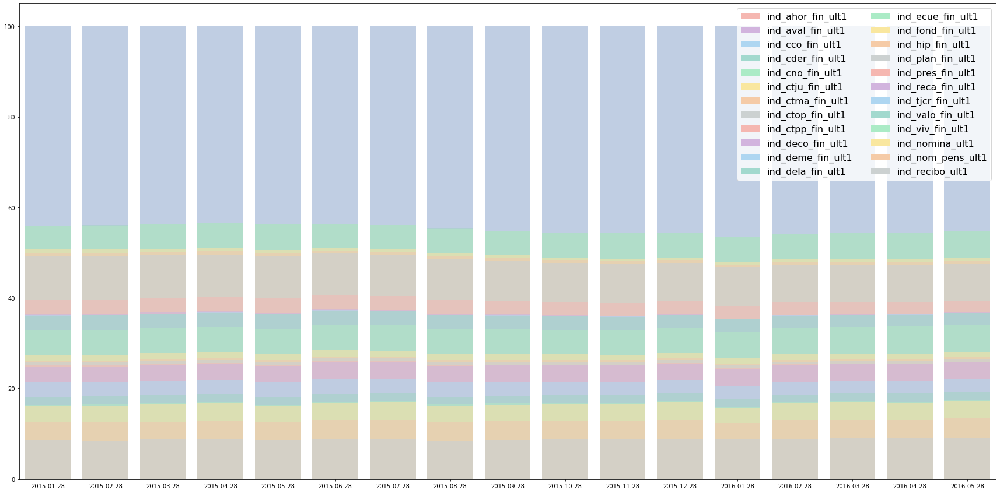

In [25]:
# label_sum_over_time의 값을 퍼센트 단위로 변환한다.
# 절대값이 아닌 상대값으로 시각화하여 상품별 비중을 살펴본다.
# 이를 위해 최대값(즉 전체 상품의 개수)를 나누어 비율을 구해낸다.
label_sum_percent = (label_sum_over_time / (1. * np.asarray(label_sum_over_time).max(axis=0))) * 100

# 시각화 실행
f, ax = plt.subplots(figsize=(30, 15))
for i in range(len(label_cols)):
    # 24개 제품에 대하여 Histogram을 그린다.
    # x축은 월, y축은 누적 총합
    sns.barplot(x=months, y=label_sum_percent[i], color=color_list[i%8], alpha=0.7)

plt.legend([plt.Rectangle((0,0), 1, 1, fc=color_list[i%8], edgecolor='none') 
            for i in range(len(label_cols))], label_cols, loc=1, ncol=2, prop={'size': 16})

# 상품별 비율이 1년 6개월간 꾸준하기 유지되는 것을 볼 수 있다.
# 예측변수(예측해야 하는 제품 변수)들에 있는 패턴을 찾지는 못했다.

이 경진대회에서 예측해야 하는 값은 **고객이 신규로 구매할 제품** 이다. 

따라서 0에서 1로 변하는 순간에 관심이 있다. 

앞선 누적 막대 그래프는 총 보유량은 나타내지만 신규 구매에 대한 월별 추이는 없다.

따라서 신규 구매 여부를 추출하는 과정이 필요하다.

In [65]:
# 다음 코드를 실행하면 data 폴더에 labels.csv라는 파일이 생성된다.
# 이 파일은 훈련 데이터와 같은 row 크기를 가지며, 
# 24개의 column은 24개의 금융 제품의 신규 구매 여부를 의미한다.

import pandas as pd
import numpy as np

trn = pd.read_csv('./input/train_ver2.csv')

# 제품 변수를 prods에 list형태로 저장
prods = trn.columns[24:].tolist()

In [66]:
# 날짜를 숫자로 변환, 2015-01-28 -> 1, 2016-06-28 -> 18
def date_to_int(str_date):
    Y, M, D = [int(a) for a in str_date.strip().split("-")]
    int_date = (int(Y) - 2015) * 12 + int(M)
    return int_date

In [67]:
# 날짜를 숫자로 변환해 저장
trn['int_date'] = trn['fecha_dato'].map(date_to_int).astype(np.int8)

# 데이터를 복사하고, int_date 날짜에 1을 더하여 lag을 생성
# 변수명에 _prev를 추가
trn_lag = trn.copy()
trn_lag['int_date'] += 1
trn_lag.columns = [col + '_prev' 
                   if col not in ['ncodpers', 'int_date'] else col 
                   for col in trn.columns]

In [68]:
# 원본 데이터와 lag 데이터를 ncodper와 int_date 기준으로 합친다.
# lag 데이터의 int_date는 하루씩 밀려있기 때문에, 저번 달의 제품 정보가 삽입된다.
df_trn = trn.merge(trn_lag, on=['ncodpers', 'int_date'], how='left')

# 병합되었으니 불필요한 변수를 메모리에서 제거
del trn, trn_lag

# 저번 달의 제품 정보가 존재하지 않을 경우 0으로 대체
for prod in prods:
    prev = prod + '_prev'
    df_trn[prev].fillna(0, inplace=True)
    
# 원본 데이터와 lag데이터에서의 제품 보유 여부를 비교하여 신규 구매 변수 padd를 구함
for prod in prods:
    padd = prod + '_add'
    prev = prod + '_prev'
    df_trn[padd] = ((df_trn[prod] == 1) & (df_trn[prev] == 0)).astype(np.int8)

In [69]:
# 신규 규매 변수만을 추출하여 label에 저장
add_cols = [prod + '_add' for prod in prods]
labels = df_trn[add_cols].copy()
labels.columns = prods
labels.to_csv('./input/labels.csv', index=False)

## 월별 신규 구매 데이터를 누적 막대 그래프로 시각화

In [70]:
labels = pd.read_csv('./input/labels.csv').astype(int)
fecha_dato = pd.read_csv('./input/train_ver2.csv', usecols=['fecha_dato'])

labels['date'] = fecha_dato.fecha_dato
months = np.unique(fecha_dato.fecha_dato).tolist()
label_cols = labels.columns.tolist()[:24]

In [71]:
label_over_time = []
for i in range(len(label_cols)):
    label_over_time.append(labels.groupby(['date'])[label_cols[i]].agg('sum').tolist())

label_sum_over_time = []
for i in range(len(label_cols)):
    label_sum_over_time.append(np.asarray(label_over_time[i:]).sum(axis=0))


In [72]:
label_over_time[0]

[88, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

In [73]:
label_sum_over_time[0]

array([1109367,   36218,   36466,   34421,   30417,   45679,   47316,
         40886,   52200,   56476,   44231,   46164,   35393,   52203,
         38312,   35229,   37897])

In [74]:
color_list = ['#F5B7B1', '#D2B4DE', '#AED6F1', '#A2D9CE', '#ABEBC6', '#F9E79F', '#F5CBA7', '#CCD1D1']

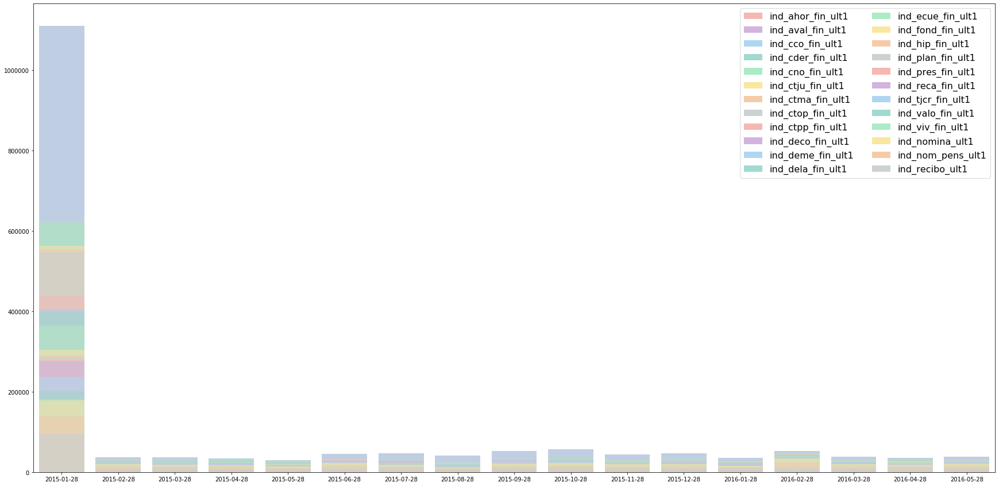

In [75]:
f, ax = plt.subplots(figsize=(30, 15))
for i in range(len(label_cols)):
    sns.barplot(x=months, y=label_sum_over_time[i], color=color_list[i%8], alpha=0.7)
plt.legend(
    [plt.Rectangle((0,0), 1, 1, fc=color_list[i%8], edgecolor='none') for i in range(len(label_cols))], 
    label_cols, 
    loc=1, ncol=2, 
    prop={'size': 16})

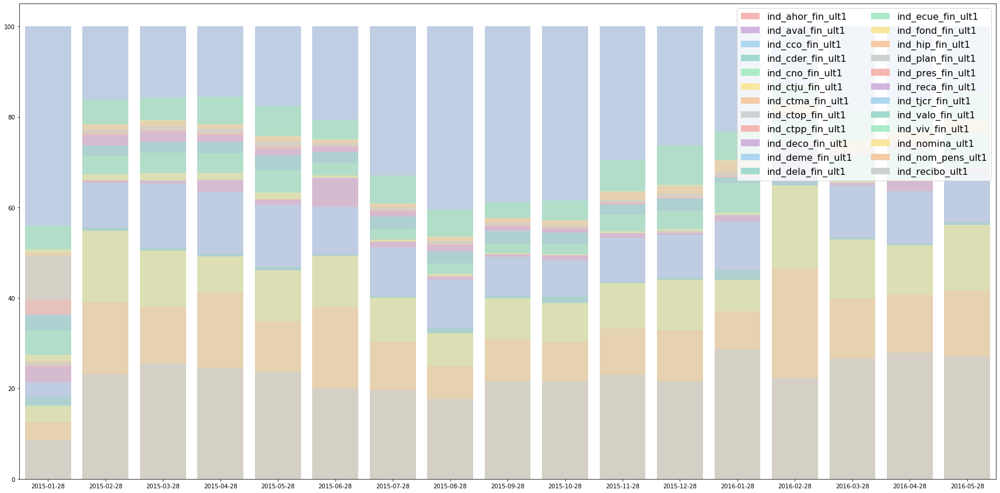

In [76]:
# 첫달인 2015년 1월의 신규 구매 숫자가 많은 이유는 데이터의 첫달이기 때문이다.
# 상대값 기준으로 다시 시각화해보자.

label_sum_percent = (label_sum_over_time / (1. * np.asarray(label_sum_over_time).max(axis=0))) * 100

# 시각화 실행
f, ax = plt.subplots(figsize=(30, 15))
for i in range(len(label_cols)):
    # 24개 제품에 대하여 Histogram을 그린다.
    # x축은 월, y축은 누적 총합
    sns.barplot(x=months, y=label_sum_percent[i], color=color_list[i%8], alpha=0.7)

plt.legend([plt.Rectangle((0,0), 1, 1, fc=color_list[i%8], edgecolor='none') 
            for i in range(len(label_cols))], label_cols, loc=1, ncol=2, prop={'size': 16})

# 2.7 Baseline 모델

In [1]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

import pandas as pd
import numpy as np
import xgboost as xgb

np.random.seed(2018)

trn = pd.read_csv('./input/train_ver2.csv')
tst = pd.read_csv('./input/test_ver2.csv')

/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (5,8,11,15) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### 데이터 전처리

In [2]:
# 제품 변수를 별도로 저장
prods = trn.columns[24:].tolist()

# 제품 변수 결측값을 미리 0으로 대체
trn[prods] = trn[prods].fillna(0.0).astype(np.int8)

# 24개 제품 중 하나도 보유하지 않은 고객 데이터 제거
no_product = trn[prods].sum(axis=1) == 0
trn = trn[~no_product]

In [3]:
# 훈련 데이터와 테스트 데이터 통합
# 테스트 데이터에 없는 제품 변수는 0으로 채움
for col in trn.columns[24:]:
    tst[col] = 0
df = pd.concat([trn, tst], axis=0)

In [4]:
# 학습에 사용할 변수를 담는 list
features = []

# 범주형 변수를 .factorize() 함수를 통해 label encoding한다.
categorical_cols = ['ind_empleado', 'pais_residencia', 'sexo',
                   'tiprel_1mes', 'indresi', 'indext', 'conyuemp', 'canal_entrada',
                   'indfall', 'tipodom', 'nomprov', 'segmento']
for col in categorical_cols:
    df[col], _ = df[col].factorize(na_sentinel=-99)

features += categorical_cols

In [5]:
# 수치형 변수의 특이값과 결측값을 -99로 대체하고, 정수형으로 변환한다.
df['age'].replace(' NA', -99, inplace=True)
df['age'] = df['age'].astype(np.int8)

df['antiguedad'].replace('     NA', -99, inplace=True)
df['antiguedad'] = df['antiguedad'].astype(np.int8)

df['renta'].replace('         NA', -99, inplace=True)
df['renta'].fillna(-99, inplace=True)
df['renta'] = df['renta'].astype(float).astype(np.int8)

df['indrel_1mes'].replace('P', 5, inplace=True)
df['indrel_1mes'].fillna(-99, inplace=True)
df['indrel_1mes'] = df['indrel_1mes'].astype(float).astype(np.int8)



In [6]:
# 학습에 사용할 수치형 변수를 features에 추가한다.
features += ['age', 'antiguedad', 'renta', 'ind_nuevo', 'indrel', 'indrel_1mes', 'ind_actividad_cliente']

### 피처 엔지니어링

In [7]:
# 두 날짜 변수에서 연도와 월 정보를 추출
df['fecha_alta_month'] = df['fecha_alta'].map(
    lambda x: 0.0 if x.__class__ is float else float(x.split('-')[1])).astype(np.int8)
df['fecha_alta_year'] = df['fecha_alta'].map(
    lambda x: 0.0 if x.__class__ is float else float(x.split('-')[0])).astype(np.int8)

features += ['fecha_alta_month', 'fecha_alta_year']

In [8]:
# 1등급 고객이였던 마지막 날짜
df['ult_fec_cli_1t_month'] = df['ult_fec_cli_1t'].map(
    lambda x: 0.0 if x.__class__ is float else float(x.split('-')[1])).astype(np.int8)
df['ult_fec_cli_1t_year'] = df['ult_fec_cli_1t'].map(
    lambda x: 0.0 if x.__class__ is float else float(x.split('-')[0])).astype(np.int8)

features += ['ult_fec_cli_1t_month', 'ult_fec_cli_1t_year']

In [9]:
# 그 외 변수의 결측값은 모두 -99로 대체
df.fillna(-99, inplace=True)

In [10]:
# lag-1 데이터 생성

# 날짜를 숫자로 변환하는 함수
def date_to_int(str_date):
    Y, M, D = [int(a) for a in str_date.strip().split('-')]
    int_date = (Y - 2015) * 12 + M
    return int_date

# 날짜를 숫자로 변환하여 int_date에 저장
df['int_date'] = df['fecha_dato'].map(date_to_int).astype(np.int8)

# 데이터를 복사하고, int_date 날짜에 1을 더하여 lag을 생성
# 변수명에 _prev를 추가
df_lag = df.copy()
df_lag.columns = [col + '_prev' if col not in ['ncodpers', 'int_date'] else col 
                  for col in df.columns]
df_lag['int_date'] += 1

# 원본 데이터와 lag 데이터를 ncodper와 int_date 기준으로 합친다.
df_trn = df.merge(df_lag, on=['ncodpers', 'int_date'], how='left')

# 메모리 효율을 위해 불필요한 변수 삭제
del df, df_lag

# 저번 달의 제품 정보가 존재하지 않을 경우 0으로 대체
for prod in prods:
    prev = prod + '_prev'
    df_trn[prev].fillna(0, inplace=True)
df_trn.fillna(-99, inplace=True)

# lag-1 변수 추가
features += [feature + '_prev' for feature in features]
features += [prod + '_prev' for prod in prods]

### 머신러닝 모델학습

교차 검증은 아주 중요하다 이번 경진대회에서는 2015-1~2016/5 즉 1년 6개월치 데이터가 훈련 데이터로 제공되고 예측해야 하는 테스트 데이터는 2016-6 미래의 데이터이다.

내부 교차 검증 과정에서도 2016-5를 검증 데이터로 분리하고 나머지 데이터를 훈련 데이터로 사용하는 것이 일반적이다.

Baseline 모델에서는 간소하게 2016-1~2016-4 총 4개월치 데이터를 훈련 데이터로 사용하고 2016-5 데이터를 검증 데이터로 사용한다.

In [11]:
use_dates = ['2016-01-28', '2016-02-28', '2016-03-28', '2016-04-28', '2016-05-28']
trn = df_trn[df_trn['fecha_dato'].isin(use_dates)]
tst = df_trn[df_trn['fecha_dato'] == '2016-06-28']
del df_trn

In [12]:
# 훈련 데이터에서 신규 구매 건수만 추출
X = []
Y = []
for i, prod in enumerate(prods):
    prev = prod + '_prev'
    prX = trn[(trn[prod] == 1) & (trn[prev] == 0)]
    prY = np.zeros(prX.shape[0], dtype=np.int8) + i
    X.append(prX)
    Y.append(prY)
# 신규 구매 건수
XY = pd.concat(X)
# 어떤 상품을 신규 구매했는지 인덱스로 저장
Y = np.hstack(Y)
XY['y'] = Y

# 훈련 검증 데이터로 분리
vld_date = '2016-05-28'
XY_trn = XY[XY['fecha_dato'] != vld_date]
XY_vld = XY[XY['fecha_dato'] == vld_date]

In [13]:
# 훈련, 검증 데이터를 XGBoost 형태로 변환한다.
X_trn = XY_trn.as_matrix(columns=features)
Y_trn = XY_trn.as_matrix(columns=['y'])
dtrn = xgb.DMatrix(X_trn, label=Y_trn, feature_names=features)

X_vld = XY_vld.as_matrix(columns=features)
Y_vld = XY_vld.as_matrix(columns=['y'])
dvld = xgb.DMatrix(X_vld, label=Y_vld, feature_names=features)

/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


In [17]:
# XGBoost 모델을 훈련 데이터에 학습하는 코드
param = {
    'booster': 'gbtree',
    'max_depth': 8,
    'nthread': 4,
    'num_class': len(prods),
    'objective': 'multi:softprob',
    'silent': 1,
    'eval_metric': 'mlogloss',
    'eta': 0.1,
    'min_child_weigh': 10,
    'colsample_bytree': 0.8,
    'colsample_bylevel': 0.9,
    'seed': 2018
}



In [ ]:
# XGBoost 모델을 훈련 데이터로 학습한다.
watch_list = [(dtrn, 'train'), (dvld, 'eval')]
model = xgb.train(param, dtrn, num_boost_round=1000, evals=watch_list, early_stopping_rounds=20)

In [15]:
# 학습한 모델 저장
import pickle
pickle.dump(model, open('model/xgb.baseline.pkl', 'wb'))
best_ntree_limit = model.best_ntree_limit

In [14]:
import pickle
# 모델 로드(자꾸 커널이 죽어서 시간 절약을 위해 로드)
with open('./model/xgb.baseline.pkl', 'rb') as f:
    model = pickle.load(f)
    best_ntree_limit = model.best_ntree_limit

In [15]:
from mapk import mapk

# 검증 데이터에 대한 MAP@7 값을 구하는 코드
# MAP@7 평가 척도를 위한 준비 작업이다.
# 고객 식별 번호를 추출한다.
vld = trn[trn['fecha_dato'] == vld_date]
ncodpers_vld = vld.as_matrix(columns=['ncodpers'])
# 검증 데이터에서 신규 구매를 구한다.
for prod in prods:
    prev = prod + '_prev'
    padd = prod + '_add'
    vld[padd] = vld[prod] - vld[prev]

add_vld = vld.as_matrix(columns=[prod + '_add' for prod in prods])
add_vld_list = [list() for i in range(len(ncodpers_vld))]

# 고객별 신규 구매 정답값을 add_vld_list에 저장하고, 
# 총 count를 count_vld에 저장한다.
count_vld = 0
for ncodper in range(len(ncodpers_vld)):
    for prod in range(len(prods)):
        if add_vld[ncodper, prod] > 0:
            add_vld_list[ncodper].append(prod)
            count_vld += 1

# 검증 데이터에서 얻을 수 있는 MAP@7 최고점을 미리 구한다.
# 0.04266379915553903
print(mapk(add_vld_list, add_vld_list, 7, 0.0))

# 검증 데이터에 대한 예측 값을 구한다
X_vld = vld.as_matrix(columns = features)
Y_vld = vld.as_matrix(columns=['y'])
dvld = xgb.DMatrix(X_vld, label=Y_vld, feature_names=features)
preds_vld = model.predict(dvld, ntree_limit=best_ntree_limit)

# 저번 달에 보유한 제품은 신규 구매가 불가하기 때문에, 확률값에서 미리 1을 빼준다.
preds_vld = preds_vld - vld.as_matrix(columns=[prod + '_prev' for prod in prods])

# 검증 데이터 예측 상위 7개를 추출한다.
result_vld = []
for ncodper, pred in zip(ncodpers_vld, preds_vld):
    y_prods = [(y, p, ip) for y, p, ip in zip(pred, prods, range(len(prods)))]
    y_prods = sorted(y_prods, key=lambda a: a[0], reverse=True)[:7]
    result_vld.append([ip for y, p, ip in y_prods])

# 검증 데이터에서의 MAP@7점수를 구한다.
# 0.036469862089332054
print(mapk(add_vld_list, result_vld, 7, 0.0))

/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


0.04266379915553903


/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:31: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:32: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:37: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


[657788]
[657795]
[657790]
[657794]
[657789]
[657787]
[657777]
[657781]
[657780]
[657779]
[657799]
[657774]
[657771]
[657770]
[657764]
[657760]
[657786]
[657802]
[657850]
[657842]
[657852]
[657839]
[657805]
[657146]
[657826]
[657822]
[657812]
[657809]
[657808]
[657814]
[657703]
[657745]
[657685]
[657684]
[657682]
[657681]
[657676]
[657675]
[657674]
[657665]
[657660]
[657638]
[657650]
[657854]
[657667]
[657692]
[657743]
[657739]
[657726]
[657724]
[657721]
[657719]
[657718]
[657717]
[657716]
[657715]
[657714]
[657713]
[657649]
[657712]
[657711]
[657710]
[657709]
[657708]
[657706]
[657702]
[657699]
[657855]
[657154]
[657860]
[658015]
[658012]
[658010]
[658008]
[658007]
[658005]
[658004]
[657993]
[657989]
[657988]
[657987]
[657986]
[657984]
[657981]
[657980]
[657979]
[657976]
[657975]
[657974]
[657990]
[658078]
[658077]
[658076]
[657637]
[658074]
[658073]
[658072]
[658070]
[658064]
[658059]
[658057]
[658056]
[658054]
[658053]
[658051]
[658049]
[658046]
[658045]
[658043]
[658042]
[658039]
[

[661939]
[661937]
[661931]
[661929]
[661927]
[661926]
[661914]
[661971]
[661973]
[662013]
[662012]
[662007]
[662006]
[662005]
[662003]
[661996]
[661994]
[661992]
[661991]
[661987]
[661986]
[661984]
[661983]
[661982]
[661981]
[661980]
[661978]
[661976]
[661974]
[662018]
[661908]
[662127]
[662132]
[662302]
[662297]
[662295]
[662294]
[662286]
[662285]
[662280]
[662279]
[662306]
[662276]
[662268]
[662264]
[662262]
[662261]
[662260]
[662259]
[662253]
[662245]
[662269]
[662360]
[662359]
[662358]
[662357]
[662344]
[662343]
[662342]
[662341]
[662333]
[662330]
[662325]
[662321]
[662316]
[662242]
[662235]
[662233]
[662174]
[662172]
[662169]
[662167]
[662166]
[662165]
[662163]
[662162]
[662160]
[662177]
[662159]
[662156]
[662154]
[662152]
[662150]
[662140]
[662138]
[662135]
[662183]
[662220]
[662217]
[662214]
[662213]
[662212]
[662210]
[662206]
[662205]
[662204]
[662202]
[662195]
[662194]
[662190]
[662189]
[662187]
[662186]
[662184]
[659040]
[660977]
[659719]
[659718]
[659717]
[659711]
[659708]
[

[650690]
[650687]
[650686]
[650685]
[650683]
[650679]
[650677]
[650675]
[650674]
[650702]
[650672]
[650666]
[650665]
[650664]
[650663]
[650659]
[650658]
[650655]
[650653]
[650670]
[650703]
[650704]
[650705]
[650760]
[650759]
[650758]
[650756]
[650753]
[650747]
[650744]
[650743]
[650742]
[650741]
[650740]
[650738]
[650733]
[650732]
[650730]
[650718]
[650714]
[650710]
[650706]
[650762]
[650874]
[650877]
[651052]
[651050]
[651044]
[651042]
[651041]
[651040]
[651037]
[651034]
[651033]
[651025]
[651020]
[651016]
[651015]
[651014]
[651012]
[651010]
[651027]
[651056]
[651057]
[651097]
[651095]
[651094]
[651088]
[651087]
[651086]
[651083]
[651080]
[651079]
[651078]
[651075]
[651073]
[651069]
[651065]
[651060]
[651059]
[650875]
[651006]
[651003]
[650946]
[650945]
[650940]
[650937]
[650935]
[650933]
[650932]
[650930]
[650929]
[650926]
[650950]
[650922]
[650918]
[650915]
[650901]
[650900]
[650897]
[650893]
[650884]
[650880]
[650920]
[650952]
[650953]
[650955]
[651001]
[650995]
[650993]
[650992]
[

[652217]
[652214]
[652209]
[652207]
[652230]
[652200]
[652196]
[652193]
[652188]
[652187]
[652185]
[652184]
[652179]
[652178]
[652177]
[652238]
[652279]
[652277]
[652276]
[652275]
[652271]
[652270]
[652264]
[652262]
[652235]
[652254]
[652249]
[652248]
[652246]
[652245]
[652244]
[652242]
[652240]
[652260]
[652175]
[652172]
[652171]
[652106]
[652103]
[652101]
[652099]
[652098]
[652093]
[652092]
[652091]
[652109]
[652089]
[652083]
[652081]
[652074]
[652073]
[652071]
[652062]
[652088]
[652111]
[652112]
[652114]
[652168]
[652165]
[652164]
[652162]
[652161]
[652159]
[652155]
[652153]
[652150]
[652145]
[652143]
[652140]
[652139]
[652136]
[652134]
[652133]
[652130]
[652129]
[652128]
[652127]
[652124]
[652123]
[652117]
[652282]
[652284]
[652438]
[652433]
[652431]
[652429]
[652424]
[652421]
[652418]
[652446]
[652415]
[652413]
[652411]
[652409]
[652408]
[652407]
[652404]
[652402]
[652399]
[652398]
[652447]
[652488]
[652487]
[652483]
[652481]
[652479]
[652476]
[652470]
[652467]
[652464]
[652463]
[

[674234]
[674231]
[674230]
[674225]
[674220]
[674215]
[674214]
[674210]
[672715]
[672712]
[671388]
[671386]
[671383]
[671381]
[671376]
[671374]
[671372]
[671371]
[671390]
[671351]
[671348]
[671343]
[671342]
[671340]
[671332]
[671330]
[671368]
[671394]
[671444]
[671443]
[671442]
[671439]
[671438]
[671434]
[671425]
[671422]
[671392]
[671413]
[671410]
[671407]
[671406]
[671398]
[671397]
[671395]
[671327]
[671324]
[671236]
[671235]
[671234]
[671233]
[671225]
[671237]
[671215]
[671208]
[671205]
[671204]
[671200]
[671197]
[671214]
[671242]
[671244]
[671318]
[671315]
[671306]
[671300]
[671297]
[671292]
[671291]
[671286]
[671272]
[671269]
[671265]
[671263]
[671255]
[671251]
[671250]
[671249]
[671248]
[671246]
[671445]
[671446]
[671449]
[671640]
[671637]
[671635]
[671634]
[671628]
[671627]
[671621]
[671642]
[671619]
[671617]
[671615]
[671608]
[671591]
[671589]
[671584]
[671583]
[671581]
[671580]
[671618]
[671643]
[671645]
[671649]
[671703]
[671700]
[671696]
[671695]
[671694]
[671687]
[671685]
[

[678479]
[678475]
[678426]
[678542]
[678424]
[678421]
[678337]
[678332]
[678328]
[678325]
[678323]
[678322]
[678321]
[678307]
[678342]
[678297]
[678296]
[678295]
[678293]
[678292]
[678282]
[678281]
[678301]
[678343]
[678346]
[678347]
[678418]
[678417]
[678411]
[678408]
[678398]
[678390]
[678386]
[678381]
[678375]
[678372]
[678370]
[678357]
[678356]
[678355]
[678353]
[678352]
[678423]
[677143]
[678543]
[678546]
[678755]
[678748]
[678738]
[678737]
[678736]
[678735]
[678732]
[678729]
[678762]
[678715]
[678711]
[678708]
[678707]
[678702]
[678700]
[678786]
[678793]
[678841]
[678839]
[678838]
[678832]
[678831]
[678825]
[678823]
[678819]
[678818]
[678806]
[678801]
[678799]
[678699]
[678690]
[678598]
[678594]
[678589]
[678585]
[678584]
[678582]
[678580]
[678603]
[678578]
[678573]
[678569]
[678568]
[678566]
[678565]
[678563]
[678551]
[678607]
[678608]
[678612]
[678684]
[678681]
[678670]
[678668]
[678666]
[678664]
[678659]
[678658]
[678649]
[678647]
[678646]
[678644]
[678641]
[678640]
[678638]
[

[666477]
[666475]
[666473]
[666471]
[666467]
[666465]
[666462]
[666460]
[666459]
[666456]
[666501]
[666149]
[666148]
[666147]
[665833]
[665828]
[665827]
[665825]
[665823]
[665820]
[665819]
[665818]
[665834]
[665812]
[665809]
[665807]
[665805]
[665803]
[665801]
[665799]
[665798]
[665797]
[665796]
[665795]
[665811]
[665836]
[665837]
[665906]
[665902]
[665900]
[665898]
[665892]
[665888]
[665884]
[665883]
[665880]
[665864]
[665856]
[665854]
[665852]
[665851]
[665850]
[665849]
[665847]
[665845]
[665907]
[665791]
[665784]
[665727]
[665725]
[665724]
[665720]
[665719]
[665718]
[665717]
[665715]
[665710]
[665729]
[665706]
[665701]
[665699]
[665698]
[665696]
[665692]
[665691]
[665690]
[665689]
[665684]
[665683]
[665705]
[665732]
[665783]
[665782]
[665781]
[665779]
[665774]
[665772]
[665770]
[665765]
[665764]
[665761]
[665760]
[665759]
[665757]
[665756]
[665755]
[665750]
[665749]
[665741]
[665739]
[665789]
[664788]
[665909]
[665911]
[666087]
[666086]
[666084]
[666079]
[666078]
[666074]
[666069]
[

[666780]
[666778]
[666777]
[666776]
[666723]
[666829]
[666722]
[666663]
[666662]
[666661]
[666660]
[666659]
[666658]
[666657]
[666646]
[666645]
[666644]
[666664]
[666643]
[666641]
[666640]
[666639]
[666635]
[666631]
[666626]
[666621]
[666665]
[666666]
[666667]
[666719]
[666715]
[666714]
[666713]
[666711]
[666709]
[666704]
[666701]
[666699]
[666698]
[666695]
[666694]
[666689]
[666686]
[666685]
[666684]
[666683]
[666681]
[666672]
[666670]
[667488]
[666833]
[666972]
[666970]
[666967]
[666966]
[666962]
[666960]
[666959]
[666957]
[666954]
[666953]
[666973]
[666948]
[666947]
[666946]
[666944]
[666943]
[666941]
[666940]
[666936]
[666935]
[666934]
[666950]
[666975]
[666976]
[667030]
[667028]
[667019]
[667018]
[667017]
[667015]
[667012]
[667010]
[666993]
[666986]
[666983]
[666981]
[666932]
[666832]
[666931]
[666928]
[666871]
[666867]
[666866]
[666863]
[666861]
[666860]
[666859]
[666874]
[666855]
[666851]
[666850]
[666849]
[666848]
[666846]
[666845]
[666842]
[666840]
[666838]
[666836]
[666834]
[

[625297]
[625296]
[625294]
[625292]
[625291]
[625289]
[625279]
[625278]
[625276]
[625266]
[625265]
[625263]
[625262]
[625261]
[625259]
[625281]
[625312]
[625315]
[625363]
[625362]
[625361]
[625354]
[625353]
[625351]
[625348]
[625347]
[625344]
[625342]
[625339]
[625333]
[625332]
[625331]
[625329]
[625328]
[625325]
[625324]
[625323]
[625322]
[625320]
[625319]
[625317]
[625367]
[624035]
[630480]
[630474]
[630472]
[630465]
[630464]
[630463]
[630462]
[630461]
[630482]
[630459]
[630444]
[630440]
[630439]
[630437]
[630431]
[630428]
[630427]
[630424]
[630422]
[630456]
[630489]
[630531]
[630529]
[630528]
[630526]
[630525]
[630523]
[630520]
[630511]
[630510]
[630508]
[630505]
[630503]
[630497]
[630496]
[630494]
[630493]
[630415]
[630414]
[630410]
[630349]
[630348]
[630345]
[630335]
[630332]
[630331]
[630326]
[630325]
[630323]
[630350]
[630315]
[630314]
[630313]
[630311]
[630309]
[630307]
[630305]
[630300]
[630353]
[630354]
[630355]
[630409]
[630408]
[630398]
[630394]
[630390]
[630388]
[630379]
[

[619624]
[619623]
[619617]
[619616]
[619615]
[619650]
[619653]
[619697]
[619695]
[619694]
[619692]
[619690]
[619687]
[619686]
[619683]
[619682]
[619679]
[619677]
[619675]
[619673]
[619672]
[619670]
[619669]
[619668]
[619664]
[619659]
[619655]
[619654]
[619601]
[619596]
[619544]
[619542]
[619539]
[619538]
[619537]
[619530]
[619528]
[619524]
[619545]
[619522]
[619518]
[619516]
[619513]
[619509]
[619506]
[619521]
[619551]
[619554]
[619595]
[619588]
[619587]
[619586]
[619585]
[619584]
[619577]
[619572]
[619571]
[619568]
[619567]
[619566]
[619565]
[619563]
[619559]
[619558]
[619557]
[619556]
[619555]
[619597]
[619218]
[619216]
[618894]
[618892]
[618887]
[618885]
[618883]
[618880]
[618878]
[618869]
[618868]
[618866]
[618863]
[618861]
[618855]
[618853]
[618871]
[618898]
[618950]
[618947]
[618946]
[618945]
[618944]
[618942]
[618940]
[618939]
[618938]
[618937]
[618936]
[618932]
[618930]
[618926]
[618915]
[618911]
[618906]
[618905]
[618902]
[618849]
[618951]
[618848]
[618842]
[618783]
[618781]
[

[619733]
[619728]
[619727]
[619726]
[619722]
[619715]
[619714]
[619732]
[619757]
[619758]
[619804]
[619800]
[619799]
[619798]
[619797]
[619794]
[619793]
[619792]
[619791]
[619790]
[619784]
[619778]
[619776]
[619775]
[619773]
[619772]
[619765]
[619764]
[619761]
[619760]
[619815]
[619919]
[619925]
[620077]
[620075]
[620074]
[620072]
[620067]
[620066]
[620063]
[620062]
[620084]
[620059]
[620055]
[620054]
[620053]
[620051]
[620049]
[620042]
[620039]
[620085]
[620086]
[620137]
[620135]
[620132]
[620131]
[620130]
[620127]
[620125]
[620121]
[620120]
[620118]
[620114]
[620112]
[620111]
[620110]
[620109]
[620108]
[620104]
[620100]
[620098]
[620097]
[620096]
[620094]
[620037]
[619922]
[620032]
[619969]
[619967]
[619966]
[619963]
[619961]
[619958]
[619956]
[619955]
[619954]
[619971]
[619952]
[619946]
[619945]
[619942]
[619939]
[619937]
[619932]
[619929]
[619928]
[619926]
[619947]
[619972]
[619973]
[619975]
[620031]
[620030]
[620029]
[620024]
[620023]
[620022]
[620020]
[620015]
[620014]
[620013]
[

[641711]
[641710]
[641708]
[641759]
[641766]
[641818]
[641815]
[641812]
[641810]
[641809]
[641808]
[641804]
[641798]
[641793]
[641789]
[641776]
[641775]
[641772]
[641771]
[641770]
[641769]
[641768]
[641767]
[641576]
[641699]
[641697]
[641628]
[641627]
[641624]
[641616]
[641615]
[641610]
[641608]
[641606]
[641630]
[641597]
[641595]
[641591]
[641589]
[641587]
[641596]
[641632]
[641634]
[641635]
[641696]
[641692]
[641687]
[641676]
[641670]
[641666]
[641665]
[641664]
[641663]
[641661]
[641653]
[641651]
[641648]
[641643]
[641637]
[644249]
[646722]
[646720]
[646718]
[646717]
[646715]
[646713]
[646723]
[646706]
[646704]
[646703]
[646702]
[646693]
[646687]
[646684]
[646682]
[646679]
[646726]
[646728]
[646779]
[646777]
[646773]
[646769]
[646764]
[646727]
[646759]
[646755]
[646754]
[646751]
[646740]
[646736]
[646735]
[646758]
[646677]
[646675]
[646630]
[646629]
[646627]
[646626]
[646624]
[646620]
[646618]
[646631]
[646614]
[646611]
[646610]
[646609]
[646608]
[646607]
[646604]
[646603]
[646601]
[

[636029]
[636024]
[636019]
[636013]
[636011]
[636008]
[636006]
[635999]
[635996]
[635995]
[635993]
[635986]
[635983]
[635978]
[635977]
[635973]
[635902]
[635505]
[635819]
[635817]
[635810]
[635806]
[635798]
[635824]
[635793]
[635786]
[635770]
[635769]
[635762]
[635755]
[635747]
[635746]
[635827]
[635828]
[635830]
[635896]
[635893]
[635891]
[635889]
[635884]
[635873]
[635871]
[635863]
[635860]
[635858]
[635847]
[635845]
[635839]
[635838]
[635836]
[635834]
[635833]
[635832]
[635900]
[635501]
[635498]
[635172]
[635170]
[635169]
[635168]
[635163]
[635162]
[635160]
[635159]
[635156]
[635154]
[635176]
[635153]
[635151]
[635148]
[635144]
[635142]
[635110]
[635108]
[635107]
[635179]
[635182]
[635183]
[635232]
[635231]
[635228]
[635226]
[635225]
[635223]
[635222]
[635218]
[635215]
[635214]
[635213]
[635211]
[635209]
[635207]
[635204]
[635202]
[635199]
[635195]
[635192]
[635191]
[635188]
[635184]
[635106]
[635233]
[635103]
[635098]
[635050]
[635047]
[635043]
[635042]
[635040]
[635034]
[635052]
[

[636454]
[636504]
[636510]
[636557]
[636555]
[636548]
[636545]
[636544]
[636543]
[636537]
[636531]
[636530]
[636528]
[636527]
[636526]
[636525]
[636524]
[636522]
[636521]
[636520]
[636516]
[636515]
[636512]
[636310]
[636430]
[636427]
[636368]
[636367]
[636363]
[636360]
[636350]
[636349]
[636347]
[636346]
[636341]
[636340]
[636332]
[636330]
[636322]
[636318]
[636317]
[636312]
[636337]
[636379]
[636380]
[636426]
[636423]
[636419]
[636418]
[636413]
[636412]
[636406]
[636405]
[636404]
[636399]
[636398]
[636396]
[636392]
[636391]
[636389]
[636384]
[636382]
[636428]
[638063]
[637083]
[637777]
[637775]
[637772]
[637769]
[637762]
[637758]
[637755]
[637752]
[637778]
[637750]
[637746]
[637742]
[637738]
[637737]
[637730]
[637749]
[637780]
[637784]
[637831]
[637829]
[637825]
[637821]
[637819]
[637818]
[637816]
[637815]
[637814]
[637782]
[637812]
[637807]
[637804]
[637803]
[637796]
[637795]
[637794]
[637790]
[637787]
[637785]
[637808]
[637727]
[637661]
[637656]
[637652]
[637651]
[637650]
[637649]
[

[722114]
[722113]
[722107]
[722104]
[722101]
[722119]
[722151]
[722155]
[722199]
[722193]
[722189]
[722187]
[722186]
[722184]
[722177]
[722174]
[722172]
[722169]
[722168]
[722165]
[722163]
[722162]
[722159]
[722100]
[722035]
[722031]
[722030]
[722029]
[722023]
[722022]
[722021]
[722020]
[722018]
[722014]
[722036]
[722013]
[722010]
[722008]
[722005]
[722001]
[721999]
[721998]
[721992]
[721990]
[722041]
[722042]
[722086]
[722084]
[722082]
[722078]
[722077]
[722073]
[722072]
[722067]
[722064]
[722062]
[722058]
[722055]
[722053]
[722050]
[722044]
[722043]
[722095]
[725595]
[722707]
[723390]
[723389]
[723388]
[723384]
[723383]
[723382]
[723381]
[723378]
[723377]
[723392]
[723367]
[723365]
[723362]
[723360]
[723359]
[723354]
[723348]
[723344]
[723341]
[723395]
[723440]
[723438]
[723437]
[723435]
[723433]
[723432]
[723431]
[723430]
[723426]
[723424]
[723421]
[723396]
[723419]
[723413]
[723409]
[723408]
[723404]
[723332]
[723283]
[723280]
[723273]
[723265]
[723262]
[723260]
[723285]
[723247]
[

[716035]
[716033]
[715912]
[715909]
[715845]
[715844]
[715841]
[715832]
[715831]
[715830]
[715829]
[715828]
[715819]
[715818]
[715816]
[715825]
[715858]
[715908]
[715906]
[715903]
[715902]
[715900]
[715898]
[715897]
[715893]
[715892]
[715880]
[715879]
[715877]
[715874]
[715866]
[715864]
[715863]
[716565]
[717260]
[717259]
[717257]
[717251]
[717249]
[717248]
[717245]
[717244]
[717243]
[717242]
[717239]
[717229]
[717224]
[717217]
[717216]
[717210]
[717208]
[717205]
[717203]
[717238]
[717202]
[717311]
[717310]
[717304]
[717303]
[717301]
[717296]
[717295]
[717293]
[717291]
[717279]
[717278]
[717276]
[717275]
[717272]
[717269]
[717290]
[717199]
[717113]
[717112]
[717108]
[717106]
[717101]
[717095]
[717093]
[717092]
[717117]
[717075]
[717070]
[717067]
[717054]
[717052]
[717118]
[717121]
[717196]
[717191]
[717189]
[717182]
[717158]
[717154]
[717152]
[717149]
[717147]
[717146]
[717143]
[717141]
[717138]
[717136]
[717135]
[717131]
[717126]
[717122]
[717317]
[717325]
[717513]
[717512]
[717507]
[

[718024]
[718023]
[718016]
[718009]
[718007]
[718001]
[717999]
[717996]
[718018]
[718059]
[718064]
[718120]
[718114]
[718109]
[718108]
[718101]
[718097]
[718096]
[718095]
[718080]
[718079]
[718069]
[718067]
[717993]
[717871]
[717992]
[717987]
[717925]
[717918]
[717913]
[717912]
[717909]
[717928]
[717903]
[717889]
[717882]
[717881]
[717880]
[717878]
[717877]
[717902]
[717933]
[717935]
[717985]
[717982]
[717980]
[717979]
[717976]
[717973]
[717964]
[717962]
[717954]
[717949]
[717947]
[717944]
[717940]
[717939]
[719679]
[718675]
[718679]
[719341]
[719338]
[719336]
[719333]
[719331]
[719329]
[719328]
[719317]
[719315]
[719310]
[719309]
[719305]
[719303]
[719297]
[719292]
[719324]
[719343]
[719348]
[719395]
[719394]
[719391]
[719390]
[719383]
[719376]
[719347]
[719374]
[719369]
[719368]
[719366]
[719364]
[719362]
[719358]
[719356]
[719352]
[719349]
[719373]
[719287]
[719282]
[719220]
[719217]
[719213]
[719206]
[719200]
[719199]
[719198]
[719221]
[719197]
[719191]
[719180]
[719175]
[719164]
[

[744768]
[744766]
[744755]
[744750]
[744749]
[744748]
[744784]
[744744]
[744734]
[744732]
[744731]
[744728]
[744727]
[744724]
[744723]
[744720]
[744715]
[744740]
[744788]
[744792]
[744842]
[744834]
[744833]
[744825]
[744824]
[744822]
[744820]
[744814]
[744807]
[744801]
[744800]
[744798]
[744852]
[744442]
[744025]
[744024]
[744017]
[744014]
[744007]
[744005]
[744028]
[744004]
[744000]
[743996]
[743994]
[743989]
[743984]
[743975]
[743973]
[744001]
[743968]
[744030]
[744034]
[744080]
[744077]
[744075]
[744073]
[744071]
[744066]
[744064]
[744031]
[744063]
[744057]
[744048]
[744045]
[744038]
[744036]
[744062]
[743964]
[743961]
[743900]
[743894]
[743892]
[743888]
[743885]
[743881]
[743904]
[743876]
[743852]
[743847]
[743812]
[743810]
[743802]
[743799]
[743794]
[743869]
[743909]
[743960]
[743959]
[743956]
[743953]
[743952]
[743950]
[743947]
[743941]
[743940]
[743939]
[743938]
[743936]
[743932]
[743929]
[743920]
[743915]
[743914]
[743913]
[743912]
[744081]
[744083]
[744084]
[744086]
[744375]
[

[730262]
[730260]
[730257]
[730256]
[730230]
[730229]
[730264]
[730165]
[730111]
[730108]
[730107]
[730105]
[730102]
[730100]
[730098]
[730096]
[730112]
[730095]
[730093]
[730092]
[730091]
[730090]
[730087]
[730085]
[730080]
[730113]
[730114]
[730115]
[730158]
[730157]
[730156]
[730151]
[730148]
[730146]
[730143]
[730140]
[730136]
[730135]
[730131]
[730130]
[730129]
[730128]
[730120]
[730119]
[730118]
[730299]
[730472]
[730461]
[730458]
[730454]
[730444]
[730474]
[730435]
[730432]
[730427]
[730423]
[730422]
[730437]
[730475]
[730477]
[730523]
[730522]
[730521]
[730516]
[730511]
[730509]
[730506]
[730504]
[730500]
[730496]
[730495]
[730482]
[730481]
[730077]
[730339]
[730337]
[730336]
[730332]
[730331]
[730329]
[730328]
[730350]
[730327]
[730324]
[730321]
[730311]
[730308]
[730307]
[730302]
[730354]
[730356]
[730400]
[730398]
[730397]
[730396]
[730390]
[730389]
[730387]
[730384]
[730381]
[730379]
[730375]
[730374]
[730373]
[730372]
[730367]
[730366]
[730365]
[730363]
[730361]
[730358]
[

[690875]
[690873]
[690872]
[690871]
[690869]
[690862]
[690860]
[690850]
[690849]
[690846]
[690844]
[690843]
[690866]
[690783]
[690710]
[690709]
[690705]
[690695]
[690691]
[690685]
[690684]
[690674]
[690673]
[690672]
[690666]
[690714]
[690715]
[690780]
[690778]
[690766]
[690758]
[690757]
[690754]
[690752]
[690745]
[690738]
[690733]
[690732]
[690731]
[690730]
[690728]
[690724]
[690723]
[690718]
[690888]
[690889]
[690893]
[691049]
[691048]
[691045]
[691044]
[691041]
[691035]
[691052]
[691031]
[691029]
[691021]
[691019]
[691015]
[691013]
[691010]
[691053]
[691055]
[691100]
[691095]
[691091]
[691086]
[691085]
[691084]
[691082]
[691071]
[691062]
[691059]
[691008]
[690663]
[691006]
[690942]
[690940]
[690937]
[690934]
[690926]
[690918]
[690916]
[690914]
[690908]
[690903]
[690899]
[690895]
[690894]
[690917]
[690949]
[690953]
[690955]
[691001]
[690994]
[690992]
[690988]
[690983]
[690981]
[690977]
[690976]
[690973]
[690972]
[690971]
[690965]
[690963]
[690962]
[690960]
[691108]
[690344]
[690343]
[

[692673]
[692671]
[692670]
[692669]
[692665]
[692664]
[692662]
[692660]
[692655]
[692651]
[692648]
[692647]
[692643]
[692641]
[692638]
[692629]
[692628]
[692627]
[692809]
[692813]
[692961]
[692958]
[692955]
[692949]
[692939]
[692914]
[692934]
[692966]
[692970]
[693013]
[693012]
[693011]
[693007]
[693006]
[693002]
[692999]
[692987]
[692985]
[692984]
[692983]
[692980]
[692978]
[692976]
[692974]
[692973]
[692972]
[692971]
[692913]
[692570]
[692907]
[692849]
[692847]
[692844]
[692842]
[692839]
[692837]
[692835]
[692857]
[692828]
[692827]
[692824]
[692822]
[692821]
[692818]
[692817]
[692816]
[692829]
[692904]
[692903]
[692901]
[692896]
[692893]
[692888]
[692879]
[692909]
[692566]
[692562]
[692267]
[692261]
[692252]
[692251]
[692248]
[692247]
[692241]
[692239]
[692236]
[692234]
[692231]
[692229]
[692222]
[692221]
[692209]
[692243]
[692272]
[692273]
[692312]
[692309]
[692307]
[692305]
[692304]
[692301]
[692300]
[692294]
[692291]
[692289]
[692286]
[692283]
[692277]
[692274]
[692208]
[692314]
[

[686410]
[686406]
[686404]
[686395]
[686394]
[686393]
[686392]
[686389]
[686383]
[686381]
[686379]
[686376]
[686428]
[686429]
[686474]
[686469]
[686467]
[686463]
[686461]
[686453]
[686452]
[686450]
[686449]
[686445]
[686444]
[686443]
[686435]
[686619]
[686621]
[686622]
[686624]
[686987]
[686985]
[686983]
[686981]
[686980]
[686979]
[686991]
[686969]
[686966]
[686961]
[686958]
[686956]
[686954]
[686948]
[686997]
[687064]
[687057]
[687052]
[687045]
[687044]
[687042]
[687041]
[687040]
[687035]
[687030]
[687028]
[687027]
[687022]
[687010]
[687004]
[686947]
[686373]
[686944]
[686671]
[686667]
[686658]
[686654]
[686653]
[686651]
[686648]
[686675]
[686647]
[686639]
[686638]
[686635]
[686634]
[686633]
[686632]
[686629]
[686627]
[686676]
[686677]
[686681]
[686927]
[686742]
[686740]
[686738]
[686731]
[686729]
[686727]
[686726]
[686721]
[686720]
[686703]
[686700]
[686698]
[686695]
[686685]
[686934]
[686372]
[686012]
[686008]
[686007]
[686005]
[686003]
[685999]
[685985]
[686013]
[685983]
[685979]
[

[707468]
[707460]
[707459]
[707487]
[707457]
[707453]
[707452]
[707445]
[707441]
[707439]
[707437]
[707454]
[707489]
[707490]
[707491]
[707549]
[707547]
[707546]
[707543]
[707541]
[707537]
[707535]
[707520]
[707519]
[707513]
[707506]
[707503]
[707501]
[707494]
[707553]
[707701]
[707709]
[707876]
[707875]
[707872]
[707871]
[707878]
[707844]
[707835]
[707833]
[707827]
[707825]
[707843]
[707880]
[707881]
[707930]
[707921]
[707919]
[707910]
[707908]
[707905]
[707898]
[707887]
[707883]
[707820]
[707816]
[707756]
[707753]
[707747]
[707745]
[707742]
[707739]
[707738]
[707735]
[707727]
[707726]
[707711]
[707736]
[707761]
[707762]
[707814]
[707801]
[707797]
[707796]
[707788]
[707782]
[707774]
[707768]
[707765]
[707817]
[706378]
[704971]
[704970]
[704966]
[704963]
[704958]
[704956]
[704951]
[704972]
[704942]
[704939]
[704938]
[704934]
[704933]
[704929]
[704948]
[704927]
[704977]
[705024]
[705023]
[705017]
[704997]
[704996]
[704976]
[704992]
[704988]
[704987]
[704986]
[704981]
[704979]
[704926]
[

[710037]
[710035]
[710031]
[710025]
[709819]
[709942]
[709939]
[709876]
[709874]
[709872]
[709866]
[709853]
[709852]
[709847]
[709838]
[709835]
[709830]
[709829]
[709827]
[709826]
[709821]
[709880]
[709881]
[709885]
[709936]
[709934]
[709926]
[709922]
[709920]
[709919]
[709918]
[709915]
[709907]
[709904]
[709903]
[709902]
[709900]
[709899]
[704050]
[698678]
[698677]
[698675]
[698673]
[698668]
[698667]
[698661]
[698658]
[698655]
[698645]
[698642]
[698629]
[698625]
[698615]
[698651]
[698613]
[698685]
[698732]
[698731]
[698729]
[698728]
[698723]
[698721]
[698720]
[698713]
[698704]
[698693]
[698717]
[698612]
[698608]
[698544]
[698534]
[698532]
[698530]
[698525]
[698522]
[698546]
[698503]
[698501]
[698498]
[698495]
[698488]
[698485]
[698549]
[698551]
[698553]
[698607]
[698603]
[698598]
[698595]
[698593]
[698590]
[698588]
[698583]
[698582]
[698579]
[698578]
[698577]
[698575]
[698568]
[698564]
[698559]
[698733]
[698734]
[698735]
[698917]
[698916]
[698915]
[698912]
[698905]
[698904]
[698903]
[

[697452]
[697449]
[697447]
[697445]
[697444]
[697441]
[697362]
[697225]
[697361]
[697286]
[697284]
[697278]
[697266]
[697263]
[697259]
[697258]
[697256]
[697255]
[697245]
[697240]
[697239]
[697231]
[697291]
[697294]
[697354]
[697353]
[697352]
[697337]
[697335]
[697329]
[697328]
[697327]
[697326]
[697324]
[697315]
[697314]
[697313]
[697309]
[697308]
[697307]
[697305]
[697301]
[697295]
[699947]
[702647]
[702643]
[702638]
[702633]
[702632]
[702629]
[702626]
[702648]
[702618]
[702612]
[702611]
[702607]
[702596]
[702622]
[702649]
[702653]
[702796]
[702791]
[702782]
[702771]
[702770]
[702769]
[702768]
[702651]
[702757]
[702743]
[702734]
[702665]
[702664]
[702663]
[702658]
[702760]
[702593]
[702592]
[702520]
[702516]
[702515]
[702513]
[702507]
[702504]
[702495]
[702494]
[702492]
[702489]
[702486]
[702483]
[702482]
[702471]
[702525]
[702527]
[702587]
[702584]
[702580]
[702579]
[702578]
[702572]
[702567]
[702564]
[702562]
[702561]
[702559]
[702558]
[702553]
[702548]
[702547]
[702543]
[702528]
[

[701016]
[701014]
[701005]
[701002]
[701000]
[700997]
[700996]
[701046]
[700921]
[701158]
[701161]
[701361]
[701358]
[701357]
[701349]
[701343]
[701337]
[701334]
[701330]
[701328]
[701326]
[701325]
[701323]
[701315]
[701310]
[701335]
[701370]
[701418]
[701409]
[701408]
[701404]
[701402]
[701401]
[701399]
[701396]
[701394]
[701392]
[701388]
[701387]
[701381]
[701377]
[701373]
[701159]
[701307]
[701303]
[701239]
[701238]
[701237]
[701235]
[701234]
[701233]
[701231]
[701227]
[701226]
[701240]
[701185]
[701183]
[701182]
[701177]
[701176]
[701172]
[701168]
[701165]
[701164]
[701163]
[701244]
[701300]
[701299]
[701294]
[701285]
[701280]
[701276]
[701267]
[701266]
[701258]
[701257]
[701256]
[701251]
[701248]
[701247]
[701305]
[615642]
[484275]
[522348]
[522346]
[522343]
[522331]
[522330]
[522328]
[522326]
[522350]
[522324]
[522305]
[522292]
[522288]
[522282]
[522280]
[522319]
[522394]
[522393]
[522392]
[522389]
[522383]
[522378]
[522373]
[522353]
[522372]
[522370]
[522369]
[522363]
[522362]
[

[521630]
[521629]
[521627]
[521626]
[521624]
[521621]
[521613]
[521612]
[521611]
[521610]
[521608]
[521606]
[521600]
[521599]
[521594]
[521588]
[521532]
[521192]
[521529]
[521526]
[521467]
[521465]
[521464]
[521454]
[521452]
[521450]
[521449]
[521448]
[521445]
[521440]
[521431]
[521430]
[521428]
[521427]
[521425]
[521423]
[521419]
[521447]
[521471]
[521473]
[521523]
[521522]
[521521]
[521518]
[521514]
[521511]
[521508]
[521507]
[521506]
[521497]
[521491]
[521490]
[521482]
[521481]
[521479]
[521478]
[521528]
[521191]
[521188]
[520873]
[520871]
[520864]
[520861]
[520853]
[520852]
[520851]
[520843]
[520842]
[520829]
[520825]
[520824]
[520846]
[520877]
[520879]
[520938]
[520931]
[520930]
[520929]
[520927]
[520923]
[520921]
[520917]
[520916]
[520915]
[520914]
[520913]
[520910]
[520908]
[520902]
[520894]
[520893]
[520887]
[520886]
[520823]
[520940]
[520821]
[520817]
[520755]
[520750]
[520746]
[520745]
[520744]
[520743]
[520740]
[520756]
[520739]
[520735]
[520734]
[520732]
[520731]
[520730]
[

[515228]
[515196]
[515193]
[515192]
[515190]
[515189]
[515188]
[515187]
[515185]
[515199]
[515229]
[515230]
[515232]
[515284]
[515281]
[515280]
[515276]
[515275]
[515266]
[515263]
[515260]
[515259]
[515258]
[515256]
[515255]
[515254]
[515253]
[515251]
[515246]
[515244]
[515243]
[515240]
[515239]
[515235]
[514981]
[514976]
[514713]
[514709]
[514705]
[514703]
[514694]
[514693]
[514691]
[514714]
[514690]
[514687]
[514686]
[514684]
[514682]
[514681]
[514680]
[514678]
[514676]
[514674]
[514689]
[514673]
[514715]
[514717]
[514764]
[514763]
[514759]
[514755]
[514754]
[514752]
[514750]
[514749]
[514746]
[514716]
[514745]
[514741]
[514740]
[514739]
[514735]
[514734]
[514731]
[514724]
[514722]
[514720]
[514719]
[514744]
[514662]
[514592]
[514589]
[514588]
[514587]
[514584]
[514581]
[514580]
[514579]
[514578]
[514573]
[514595]
[514568]
[514566]
[514559]
[514558]
[514556]
[514554]
[514550]
[514570]
[514605]
[514660]
[514658]
[514657]
[514656]
[514654]
[514652]
[514651]
[514649]
[514647]
[514643]
[

[519085]
[519083]
[519081]
[519078]
[519077]
[519075]
[519074]
[519020]
[519130]
[519019]
[518954]
[518952]
[518950]
[518947]
[518945]
[518944]
[518942]
[518939]
[518938]
[518960]
[518936]
[518928]
[518926]
[518922]
[518921]
[518920]
[518916]
[518915]
[518913]
[518935]
[518961]
[518967]
[519016]
[519012]
[519003]
[519001]
[518998]
[518995]
[518994]
[518993]
[518991]
[518990]
[518985]
[518984]
[518983]
[518982]
[518977]
[518975]
[518974]
[518972]
[518971]
[518970]
[519018]
[518907]
[519132]
[519137]
[519315]
[519308]
[519305]
[519302]
[519300]
[519299]
[519298]
[519296]
[519295]
[519294]
[519320]
[519290]
[519289]
[519284]
[519267]
[519262]
[519260]
[519258]
[519256]
[519253]
[519291]
[519324]
[519369]
[519367]
[519363]
[519362]
[519361]
[519359]
[519356]
[519354]
[519350]
[519348]
[519346]
[519345]
[519342]
[519338]
[519335]
[519331]
[519330]
[519326]
[519325]
[519248]
[519133]
[519246]
[519243]
[519186]
[519185]
[519180]
[519177]
[519176]
[519175]
[519174]
[519171]
[519170]
[519168]
[

[536173]
[536170]
[536169]
[536166]
[536233]
[535820]
[535818]
[535814]
[535528]
[535526]
[535518]
[535516]
[535505]
[535530]
[535502]
[535500]
[535495]
[535494]
[535487]
[535480]
[535478]
[535475]
[535472]
[535471]
[535501]
[535533]
[535534]
[535536]
[535580]
[535577]
[535576]
[535572]
[535571]
[535570]
[535567]
[535566]
[535565]
[535563]
[535561]
[535559]
[535558]
[535556]
[535550]
[535549]
[535548]
[535547]
[535546]
[535544]
[535543]
[535542]
[535539]
[535538]
[535537]
[535466]
[535581]
[535450]
[535368]
[535367]
[535366]
[535365]
[535364]
[535356]
[535352]
[535350]
[535345]
[535344]
[535343]
[535342]
[535340]
[535339]
[535337]
[535336]
[535334]
[535331]
[535347]
[535373]
[535443]
[535441]
[535439]
[535438]
[535436]
[535435]
[535429]
[535426]
[535422]
[535419]
[535418]
[535414]
[535413]
[535411]
[535407]
[535393]
[535389]
[535386]
[535381]
[535377]
[536360]
[535582]
[535584]
[535750]
[535748]
[535746]
[535743]
[535740]
[535751]
[535726]
[535724]
[535722]
[535716]
[535713]
[535711]
[

[541410]
[541405]
[541402]
[541401]
[541400]
[541397]
[541396]
[541392]
[541462]
[541060]
[541059]
[541057]
[540715]
[540714]
[540713]
[540708]
[540707]
[540705]
[540703]
[540716]
[540701]
[540686]
[540678]
[540677]
[540676]
[540699]
[540721]
[540722]
[540724]
[540784]
[540783]
[540782]
[540781]
[540780]
[540775]
[540773]
[540766]
[540762]
[540754]
[540751]
[540745]
[540743]
[540737]
[540735]
[540734]
[540732]
[540729]
[540728]
[540726]
[540725]
[540673]
[540786]
[540672]
[540667]
[540601]
[540598]
[540595]
[540592]
[540587]
[540584]
[540570]
[540558]
[540555]
[540550]
[540549]
[540546]
[540545]
[540544]
[540543]
[540572]
[540606]
[540611]
[540661]
[540657]
[540655]
[540654]
[540653]
[540651]
[540650]
[540649]
[540648]
[540647]
[540646]
[540645]
[540644]
[540638]
[540636]
[540628]
[540627]
[540626]
[540625]
[540623]
[540617]
[540616]
[540534]
[540787]
[540984]
[540982]
[540978]
[540976]
[540965]
[540963]
[540961]
[540958]
[540986]
[540953]
[540952]
[540948]
[540947]
[540945]
[540940]
[

[533782]
[533777]
[533963]
[533965]
[533966]
[533967]
[534123]
[534121]
[534119]
[534116]
[534112]
[534110]
[534108]
[534125]
[534102]
[534100]
[534098]
[534096]
[534087]
[534086]
[534101]
[534127]
[534129]
[534130]
[534200]
[534199]
[534196]
[534182]
[534174]
[534167]
[534159]
[534153]
[534149]
[534146]
[534143]
[534138]
[534136]
[534132]
[534082]
[533714]
[534080]
[534070]
[534007]
[534006]
[534004]
[534002]
[534000]
[533999]
[533997]
[533995]
[533994]
[534008]
[533993]
[533990]
[533989]
[533984]
[533979]
[533977]
[533975]
[533973]
[533971]
[533969]
[533968]
[533991]
[534009]
[534013]
[534068]
[534066]
[534065]
[534064]
[534057]
[534056]
[534055]
[534053]
[534052]
[534051]
[534050]
[534039]
[534036]
[534034]
[534033]
[534027]
[534026]
[534023]
[534022]
[534021]
[534015]
[534073]
[533713]
[533712]
[533706]
[533349]
[533345]
[533344]
[533343]
[533332]
[533330]
[533327]
[533321]
[533319]
[533350]
[533310]
[533305]
[533300]
[533298]
[533296]
[533293]
[533288]
[533283]
[533352]
[533353]
[

[494178]
[494180]
[494342]
[494338]
[494337]
[494335]
[494330]
[494328]
[494326]
[494325]
[494324]
[494345]
[494318]
[494316]
[494315]
[494312]
[494311]
[494307]
[494305]
[494303]
[494321]
[494346]
[494348]
[494415]
[494413]
[494408]
[494404]
[494403]
[494402]
[494399]
[494397]
[494394]
[494392]
[494389]
[494386]
[494385]
[494384]
[494363]
[494362]
[494355]
[494353]
[493940]
[494300]
[494297]
[494234]
[494230]
[494229]
[494226]
[494225]
[494223]
[494222]
[494221]
[494219]
[494218]
[494203]
[494202]
[494198]
[494196]
[494194]
[494187]
[494183]
[494216]
[494239]
[494242]
[494243]
[494296]
[494295]
[494293]
[494290]
[494289]
[494288]
[494285]
[494278]
[494276]
[494274]
[494272]
[494267]
[494265]
[494260]
[494257]
[494256]
[494255]
[494251]
[494250]
[493935]
[493932]
[493678]
[493675]
[493674]
[493668]
[493665]
[493662]
[493683]
[493659]
[493653]
[493652]
[493649]
[493647]
[493646]
[493645]
[493643]
[493642]
[493640]
[493638]
[493685]
[493686]
[493687]
[493732]
[493729]
[493721]
[493719]
[

[495311]
[495310]
[495309]
[495303]
[495302]
[495301]
[495300]
[495241]
[495236]
[495233]
[495157]
[495156]
[495155]
[495154]
[495151]
[495149]
[495139]
[495138]
[495162]
[495137]
[495135]
[495133]
[495132]
[495127]
[495125]
[495124]
[495123]
[495122]
[495136]
[495163]
[495165]
[495166]
[495231]
[495226]
[495225]
[495219]
[495218]
[495217]
[495215]
[495213]
[495211]
[495210]
[495208]
[495206]
[495205]
[495203]
[495193]
[495167]
[495234]
[494890]
[494888]
[494887]
[494585]
[494583]
[494582]
[494579]
[494576]
[494575]
[494574]
[494573]
[494567]
[494566]
[494565]
[494563]
[494562]
[494560]
[494558]
[494556]
[494555]
[494552]
[494568]
[494602]
[494611]
[494662]
[494658]
[494657]
[494656]
[494654]
[494653]
[494651]
[494650]
[494641]
[494639]
[494628]
[494625]
[494624]
[494621]
[494620]
[494617]
[494616]
[494613]
[494548]
[494663]
[494539]
[494475]
[494472]
[494470]
[494467]
[494462]
[494460]
[494458]
[494456]
[494482]
[494453]
[494446]
[494442]
[494437]
[494432]
[494429]
[494428]
[494448]
[

[485344]
[485338]
[485337]
[485280]
[484958]
[485278]
[485275]
[485225]
[485224]
[485223]
[485221]
[485220]
[485219]
[485213]
[485212]
[485210]
[485205]
[485202]
[485199]
[485198]
[485197]
[485192]
[485189]
[485182]
[485179]
[485177]
[485176]
[485174]
[485229]
[485230]
[485232]
[485274]
[485273]
[485272]
[485269]
[485268]
[485267]
[485265]
[485264]
[485262]
[485257]
[485255]
[485248]
[485247]
[485242]
[485239]
[485238]
[485233]
[484952]
[484949]
[484716]
[484713]
[484705]
[484704]
[484698]
[484697]
[484693]
[484690]
[484717]
[484689]
[484685]
[484681]
[484677]
[484675]
[484671]
[484666]
[484663]
[484660]
[484688]
[484720]
[484724]
[484760]
[484754]
[484752]
[484750]
[484749]
[484748]
[484747]
[484739]
[484737]
[484736]
[484734]
[484732]
[484731]
[484659]
[484761]
[484654]
[484607]
[484606]
[484605]
[484603]
[484598]
[484597]
[484594]
[484612]
[484590]
[484589]
[484588]
[484587]
[484583]
[484580]
[484575]
[484560]
[484613]
[484615]
[484649]
[484645]
[484644]
[484640]
[484639]
[484638]
[

[508061]
[508059]
[508057]
[508071]
[508001]
[508000]
[507997]
[507934]
[507928]
[507927]
[507926]
[507922]
[507917]
[507915]
[507910]
[507936]
[507909]
[507899]
[507897]
[507896]
[507891]
[507890]
[507887]
[507885]
[507883]
[507881]
[507900]
[507937]
[507939]
[507995]
[507994]
[507990]
[507988]
[507986]
[507985]
[507978]
[507973]
[507967]
[507960]
[507958]
[507955]
[507951]
[507950]
[507949]
[507947]
[507945]
[507944]
[507942]
[507941]
[507940]
[508093]
[508096]
[508266]
[508264]
[508260]
[508258]
[508254]
[508249]
[508248]
[508241]
[508240]
[508268]
[508239]
[508234]
[508231]
[508229]
[508228]
[508225]
[508223]
[508219]
[508213]
[508210]
[508208]
[508270]
[508271]
[508324]
[508310]
[508308]
[508307]
[508305]
[508304]
[508297]
[508292]
[508290]
[508289]
[508287]
[508286]
[508285]
[508282]
[508273]
[508207]
[507880]
[508206]
[508204]
[508137]
[508132]
[508128]
[508127]
[508125]
[508124]
[508123]
[508122]
[508121]
[508139]
[508118]
[508115]
[508109]
[508108]
[508106]
[508103]
[508102]
[

[511938]
[511939]
[511940]
[512520]
[512513]
[512508]
[512507]
[512506]
[512505]
[512503]
[512498]
[512495]
[512522]
[512493]
[512490]
[512489]
[512488]
[512487]
[512486]
[512485]
[512483]
[512482]
[512477]
[512474]
[512473]
[512537]
[512585]
[512584]
[512583]
[512579]
[512578]
[512567]
[512531]
[512560]
[512557]
[512554]
[512549]
[512544]
[512543]
[512541]
[512540]
[512539]
[512558]
[512472]
[512470]
[512415]
[512414]
[512411]
[512410]
[512406]
[512405]
[512403]
[512401]
[512399]
[512417]
[512397]
[512387]
[512385]
[512384]
[512383]
[512377]
[512374]
[512373]
[512372]
[512371]
[512389]
[512423]
[512425]
[512427]
[512466]
[512465]
[512462]
[512461]
[512460]
[512456]
[512454]
[512452]
[512449]
[512448]
[512443]
[512440]
[512438]
[512433]
[512432]
[512428]
[512586]
[512591]
[512592]
[512753]
[512752]
[512747]
[512746]
[512744]
[512743]
[512740]
[512739]
[512733]
[512731]
[512754]
[512729]
[512721]
[512719]
[512718]
[512717]
[512714]
[512712]
[512711]
[512708]
[512707]
[512706]
[512724]
[

[501263]
[501262]
[501257]
[501252]
[501251]
[501250]
[501246]
[501244]
[501242]
[501273]
[501241]
[501235]
[501234]
[501229]
[501222]
[501220]
[501218]
[501277]
[501279]
[501283]
[501333]
[501331]
[501330]
[501329]
[501327]
[501326]
[501325]
[501318]
[501317]
[501311]
[501309]
[501304]
[501300]
[501299]
[501298]
[501292]
[501291]
[501286]
[501285]
[501336]
[500064]
[500063]
[498830]
[498829]
[498828]
[498827]
[498825]
[498823]
[498821]
[498817]
[498814]
[498831]
[498809]
[498806]
[498805]
[498804]
[498803]
[498801]
[498799]
[498798]
[498796]
[498794]
[498833]
[498835]
[498876]
[498875]
[498874]
[498873]
[498870]
[498867]
[498866]
[498861]
[498858]
[498856]
[498834]
[498854]
[498850]
[498849]
[498848]
[498846]
[498845]
[498840]
[498839]
[498853]
[498789]
[498786]
[498726]
[498725]
[498723]
[498722]
[498719]
[498718]
[498717]
[498713]
[498712]
[498711]
[498709]
[498728]
[498704]
[498700]
[498694]
[498693]
[498688]
[498687]
[498684]
[498729]
[498730]
[498731]
[498784]
[498770]
[498768]
[

[501900]
[501899]
[501898]
[501913]
[501897]
[501894]
[501893]
[501892]
[501891]
[501889]
[501886]
[501879]
[501878]
[501895]
[501915]
[501916]
[501965]
[501960]
[501956]
[501955]
[501954]
[501948]
[501944]
[501943]
[501941]
[501940]
[501937]
[501934]
[501933]
[501932]
[501931]
[501925]
[501924]
[501921]
[501917]
[501968]
[502748]
[502095]
[502241]
[502237]
[502236]
[502235]
[502234]
[502233]
[502230]
[502228]
[502219]
[502218]
[502214]
[502210]
[502206]
[502205]
[502202]
[502201]
[502224]
[502243]
[502244]
[502250]
[502287]
[502286]
[502281]
[502280]
[502278]
[502276]
[502275]
[502273]
[502272]
[502271]
[502270]
[502268]
[502266]
[502259]
[502258]
[502255]
[502254]
[502252]
[502200]
[502093]
[502199]
[502180]
[502125]
[502123]
[502122]
[502121]
[502120]
[502119]
[502118]
[502117]
[502116]
[502113]
[502127]
[502111]
[502109]
[502107]
[502105]
[502103]
[502101]
[502100]
[502097]
[502096]
[502110]
[502129]
[502178]
[502175]
[502174]
[502172]
[502170]
[502164]
[502161]
[502159]
[502158]
[

[592031]
[592029]
[592053]
[592019]
[592017]
[592015]
[592014]
[592011]
[592010]
[592009]
[592006]
[592005]
[592027]
[592140]
[592139]
[592138]
[592130]
[592120]
[592108]
[592103]
[592100]
[592099]
[592078]
[592068]
[592066]
[592065]
[592060]
[592059]
[592001]
[592142]
[592000]
[591931]
[591928]
[591924]
[591922]
[591920]
[591919]
[591918]
[591915]
[591913]
[591932]
[591912]
[591906]
[591902]
[591901]
[591899]
[591896]
[591894]
[591887]
[591884]
[591909]
[591934]
[591935]
[591936]
[591994]
[591991]
[591990]
[591989]
[591977]
[591976]
[591972]
[591966]
[591963]
[591961]
[591960]
[591957]
[591955]
[591951]
[591948]
[591939]
[591938]
[591997]
[591860]
[592144]
[592150]
[592354]
[592353]
[592352]
[592348]
[592347]
[592346]
[592345]
[592342]
[592340]
[592357]
[592337]
[592335]
[592333]
[592332]
[592324]
[592323]
[592302]
[592299]
[592297]
[592338]
[592359]
[592426]
[592423]
[592415]
[592414]
[592412]
[592411]
[592409]
[592402]
[592395]
[592393]
[592390]
[592389]
[592384]
[592382]
[592380]
[

[584718]
[584717]
[584716]
[584715]
[584711]
[584710]
[584708]
[584707]
[584706]
[584705]
[584720]
[584743]
[584744]
[584787]
[584784]
[584782]
[584781]
[584779]
[584778]
[584777]
[584773]
[584771]
[584770]
[584767]
[584764]
[584762]
[584760]
[584759]
[584755]
[584753]
[584752]
[584751]
[584921]
[584926]
[584931]
[585136]
[585131]
[585129]
[585128]
[585123]
[585122]
[585120]
[585118]
[585139]
[585116]
[585107]
[585105]
[585102]
[585101]
[585100]
[585095]
[585093]
[585091]
[585090]
[585089]
[585108]
[585140]
[585142]
[585217]
[585215]
[585210]
[585205]
[585203]
[585199]
[585197]
[585186]
[585177]
[585175]
[585174]
[585165]
[585157]
[585153]
[585223]
[585011]
[585010]
[585009]
[585008]
[585007]
[585002]
[584998]
[585012]
[584990]
[584987]
[584975]
[584960]
[584958]
[584952]
[584936]
[584934]
[584989]
[585014]
[585019]
[585071]
[585070]
[585068]
[585064]
[585056]
[585048]
[585047]
[585041]
[585038]
[585037]
[585034]
[585032]
[585030]
[585029]
[585028]
[585026]
[585025]
[585022]
[585021]
[

[589861]
[589791]
[590070]
[590072]
[590240]
[590234]
[590232]
[590231]
[590225]
[590220]
[590219]
[590242]
[590216]
[590215]
[590211]
[590208]
[590207]
[590206]
[590205]
[590204]
[590203]
[590201]
[590199]
[590243]
[590244]
[590246]
[590294]
[590293]
[590290]
[590288]
[590286]
[590284]
[590283]
[590280]
[590279]
[590277]
[590269]
[590265]
[590264]
[590261]
[590260]
[590254]
[590253]
[590250]
[590198]
[590071]
[590196]
[590191]
[590124]
[590121]
[590119]
[590112]
[590104]
[590103]
[590101]
[590099]
[590126]
[590091]
[590090]
[590084]
[590082]
[590080]
[590079]
[590075]
[590074]
[590073]
[590092]
[590132]
[590134]
[590185]
[590183]
[590181]
[590179]
[590175]
[590173]
[590170]
[590166]
[590161]
[590157]
[590156]
[590154]
[590149]
[590143]
[590142]
[590141]
[590140]
[590139]
[590136]
[590195]
[599203]
[588830]
[588828]
[587574]
[587571]
[587566]
[587563]
[587562]
[587561]
[587559]
[587557]
[587554]
[587576]
[587547]
[587546]
[587545]
[587544]
[587543]
[587541]
[587540]
[587539]
[587538]
[

[607530]
[607525]
[607522]
[607553]
[607521]
[607516]
[607510]
[607505]
[607503]
[607501]
[607519]
[607554]
[607556]
[607621]
[607616]
[607614]
[607611]
[607598]
[607597]
[607591]
[607584]
[607579]
[607575]
[607570]
[607566]
[607562]
[607558]
[607625]
[611478]
[608309]
[608314]
[609107]
[609106]
[609103]
[609097]
[609096]
[609094]
[609092]
[609084]
[609076]
[609073]
[609072]
[609071]
[609068]
[609067]
[609066]
[609061]
[609060]
[609109]
[609156]
[609155]
[609154]
[609153]
[609149]
[609147]
[609143]
[609111]
[609139]
[609130]
[609128]
[609124]
[609123]
[609122]
[609121]
[609117]
[609138]
[609056]
[609055]
[608988]
[608987]
[608985]
[608982]
[608981]
[608980]
[608979]
[608978]
[608993]
[608976]
[608968]
[608965]
[608963]
[608954]
[608952]
[608950]
[608949]
[608944]
[608974]
[608997]
[609052]
[609051]
[609040]
[609038]
[609036]
[609035]
[609029]
[609027]
[609025]
[609023]
[609022]
[609018]
[609013]
[609012]
[609011]
[609010]
[609007]
[609158]
[609361]
[609353]
[609351]
[609349]
[609346]
[

[611695]
[611689]
[611677]
[611676]
[611675]
[611670]
[611668]
[611663]
[611661]
[611659]
[611607]
[611717]
[611602]
[611538]
[611536]
[611534]
[611533]
[611523]
[611522]
[611521]
[611520]
[611540]
[611507]
[611504]
[611499]
[611496]
[611495]
[611494]
[611492]
[611488]
[611484]
[611510]
[611541]
[611542]
[611601]
[611600]
[611599]
[611598]
[611587]
[611586]
[611585]
[611577]
[611575]
[611574]
[611573]
[611572]
[611569]
[611567]
[611566]
[611565]
[611558]
[611555]
[611549]
[611603]
[611720]
[611723]
[611918]
[611916]
[611915]
[611908]
[611906]
[611901]
[611899]
[611898]
[611894]
[611884]
[611882]
[611876]
[611874]
[611870]
[611869]
[611865]
[611922]
[611924]
[611971]
[611969]
[611968]
[611964]
[611962]
[611957]
[611956]
[611955]
[611952]
[611946]
[611943]
[611942]
[611941]
[611940]
[611935]
[611934]
[611930]
[611928]
[611926]
[611864]
[611721]
[611860]
[611770]
[611766]
[611765]
[611755]
[611753]
[611752]
[611750]
[611749]
[611748]
[611747]
[611743]
[611738]
[611735]
[611734]
[611733]
[

[600158]
[600155]
[600152]
[600149]
[600147]
[600146]
[600140]
[600139]
[600138]
[600124]
[600121]
[600119]
[600118]
[600116]
[600114]
[600113]
[600106]
[600043]
[600040]
[600029]
[599967]
[599964]
[599954]
[599952]
[599951]
[599947]
[599971]
[599937]
[599932]
[599931]
[599925]
[599924]
[599919]
[599914]
[599911]
[599910]
[599908]
[599973]
[599975]
[599977]
[600028]
[600018]
[600017]
[600016]
[600015]
[600011]
[600008]
[600007]
[600005]
[600003]
[600002]
[600000]
[599999]
[599996]
[599994]
[599992]
[599988]
[599985]
[599646]
[599645]
[599376]
[599375]
[599374]
[599372]
[599370]
[599369]
[599368]
[599367]
[599365]
[599380]
[599363]
[599358]
[599357]
[599356]
[599355]
[599354]
[599352]
[599351]
[599349]
[599348]
[599361]
[599382]
[599386]
[599387]
[599433]
[599432]
[599430]
[599429]
[599424]
[599421]
[599415]
[599413]
[599412]
[599411]
[599410]
[599409]
[599404]
[599401]
[599400]
[599399]
[599394]
[599393]
[599389]
[599434]
[599340]
[599336]
[599262]
[599259]
[599257]
[599256]
[599252]
[

[606743]
[606740]
[606738]
[606737]
[606736]
[606734]
[606911]
[606912]
[606913]
[607132]
[607123]
[607122]
[607117]
[607116]
[607114]
[607137]
[607113]
[607111]
[607089]
[607088]
[607087]
[607086]
[607084]
[607072]
[607112]
[607138]
[607139]
[607191]
[607190]
[607189]
[607188]
[607187]
[607183]
[607179]
[607176]
[607173]
[607172]
[607170]
[607164]
[607163]
[607162]
[607160]
[607158]
[607157]
[607156]
[607148]
[607145]
[607143]
[607142]
[606676]
[607039]
[607037]
[606964]
[606963]
[606959]
[606955]
[606954]
[606945]
[606943]
[606940]
[606939]
[606935]
[606933]
[606931]
[606928]
[606926]
[606922]
[606967]
[606968]
[606969]
[607036]
[607035]
[607025]
[607023]
[607022]
[607019]
[607015]
[607014]
[607013]
[607012]
[607011]
[607005]
[606999]
[606993]
[606989]
[606982]
[606981]
[606980]
[606975]
[606973]
[606971]
[606970]
[606670]
[606301]
[606297]
[606289]
[606282]
[606281]
[606280]
[606277]
[606276]
[606273]
[606270]
[606268]
[606266]
[606264]
[606263]
[606258]
[606256]
[606271]
[606304]
[

[556867]
[556952]
[556951]
[556926]
[556923]
[556917]
[556916]
[556915]
[556912]
[556911]
[556906]
[556902]
[556901]
[556894]
[556893]
[556890]
[556888]
[556886]
[556884]
[556883]
[556880]
[556876]
[556875]
[556874]
[557085]
[557086]
[557089]
[557092]
[557258]
[557255]
[557252]
[557250]
[557244]
[557243]
[557242]
[557241]
[557260]
[557228]
[557227]
[557226]
[557224]
[557217]
[557215]
[557214]
[557213]
[557210]
[557209]
[557229]
[557264]
[557281]
[557336]
[557334]
[557332]
[557328]
[557326]
[557325]
[557321]
[557318]
[557317]
[557316]
[557311]
[557306]
[557302]
[557300]
[557297]
[557296]
[557289]
[557288]
[557283]
[557206]
[557204]
[557195]
[557140]
[557134]
[557133]
[557128]
[557125]
[557123]
[557142]
[557121]
[557112]
[557110]
[557104]
[557103]
[557101]
[557099]
[557097]
[557096]
[557094]
[557119]
[557145]
[557146]
[557190]
[557187]
[557185]
[557184]
[557183]
[557181]
[557180]
[557179]
[557178]
[557176]
[557175]
[557174]
[557173]
[557169]
[557168]
[557167]
[557163]
[557151]
[557150]
[

[560335]
[560329]
[560327]
[560352]
[560321]
[560317]
[560316]
[560314]
[560308]
[560307]
[560306]
[560304]
[560300]
[560296]
[560319]
[560355]
[560356]
[560413]
[560411]
[560410]
[560409]
[560408]
[560404]
[560401]
[560399]
[560398]
[560393]
[560389]
[560387]
[560381]
[560380]
[560378]
[560365]
[560361]
[560294]
[560442]
[560293]
[560212]
[560209]
[560208]
[560207]
[560203]
[560201]
[560199]
[560194]
[560193]
[560185]
[560183]
[560181]
[560178]
[560176]
[560175]
[560172]
[560171]
[560169]
[560167]
[560187]
[560215]
[560218]
[560226]
[560286]
[560283]
[560279]
[560277]
[560276]
[560274]
[560270]
[560267]
[560265]
[560263]
[560261]
[560260]
[560256]
[560253]
[560251]
[560244]
[560243]
[560242]
[560241]
[560238]
[560234]
[560291]
[561012]
[561014]
[561807]
[561806]
[561805]
[561803]
[561802]
[561801]
[561800]
[561789]
[561783]
[561779]
[561809]
[561778]
[561767]
[561766]
[561763]
[561760]
[561758]
[561757]
[561755]
[561753]
[561750]
[561745]
[561810]
[561813]
[561856]
[561855]
[561852]
[

[547011]
[547010]
[547005]
[547049]
[547002]
[546998]
[546995]
[546994]
[546989]
[546986]
[546985]
[546981]
[546976]
[546971]
[547000]
[547054]
[547059]
[547137]
[547135]
[547132]
[547127]
[547115]
[547106]
[547105]
[547102]
[547100]
[547098]
[547096]
[547093]
[547092]
[547088]
[547076]
[547073]
[547072]
[547071]
[547069]
[546966]
[546963]
[546961]
[546885]
[546884]
[546882]
[546879]
[546876]
[546866]
[546865]
[546851]
[546845]
[546841]
[546840]
[546839]
[546837]
[546832]
[546830]
[546826]
[546887]
[546888]
[546891]
[546957]
[546955]
[546951]
[546948]
[546941]
[546937]
[546933]
[546929]
[546921]
[546920]
[546914]
[546910]
[546905]
[546904]
[546903]
[546901]
[546899]
[546897]
[546895]
[546894]
[546962]
[547138]
[546543]
[546188]
[546185]
[546177]
[546170]
[546166]
[546165]
[546163]
[546162]
[546193]
[546152]
[546146]
[546139]
[546135]
[546131]
[546128]
[546120]
[546111]
[546102]
[546197]
[546265]
[546264]
[546263]
[546246]
[546245]
[546239]
[546234]
[546229]
[546195]
[546227]
[546216]
[

[545910]
[545902]
[545896]
[545895]
[545889]
[545882]
[545869]
[545802]
[545344]
[545792]
[545699]
[545694]
[545691]
[545689]
[545688]
[545687]
[545682]
[545681]
[545679]
[545674]
[545673]
[545665]
[545663]
[545662]
[545659]
[545656]
[545655]
[545652]
[545649]
[545641]
[545668]
[545708]
[545711]
[545712]
[545791]
[545787]
[545781]
[545778]
[545776]
[545769]
[545767]
[545765]
[545760]
[545759]
[545756]
[545752]
[545744]
[545743]
[545734]
[545733]
[545729]
[545720]
[545717]
[545713]
[545794]
[545343]
[545342]
[545340]
[544979]
[544977]
[544974]
[544966]
[544963]
[544960]
[544958]
[544955]
[544981]
[544954]
[544948]
[544940]
[544939]
[544937]
[544936]
[544931]
[544930]
[544927]
[544925]
[544924]
[544949]
[544983]
[544986]
[544987]
[545042]
[545041]
[545040]
[545038]
[545034]
[545026]
[545022]
[545019]
[545016]
[545015]
[545014]
[545012]
[545011]
[545008]
[545006]
[545005]
[544994]
[544992]
[544989]
[544922]
[545047]
[544919]
[544860]
[544859]
[544858]
[544856]
[544854]
[544852]
[544851]
[

[549023]
[549019]
[549017]
[549016]
[549013]
[549010]
[549059]
[549008]
[549004]
[549001]
[548998]
[548994]
[548992]
[548987]
[549062]
[549064]
[549116]
[549112]
[549110]
[549109]
[549108]
[549107]
[549104]
[549103]
[549102]
[549101]
[549088]
[549085]
[549084]
[549082]
[549081]
[549080]
[549074]
[549072]
[549071]
[549069]
[549067]
[549095]
[548975]
[548875]
[548868]
[548864]
[548862]
[548861]
[548859]
[548857]
[548856]
[548878]
[548855]
[548852]
[548851]
[548848]
[548847]
[548844]
[548843]
[548842]
[548841]
[548836]
[548835]
[548834]
[548854]
[548880]
[548883]
[548885]
[548965]
[548963]
[548962]
[548961]
[548949]
[548948]
[548946]
[548941]
[548936]
[548933]
[548931]
[548930]
[548927]
[548920]
[548913]
[548905]
[548904]
[548903]
[548891]
[549117]
[549119]
[549122]
[549125]
[549319]
[549317]
[549310]
[549308]
[549307]
[549306]
[549305]
[549322]
[549292]
[549290]
[549289]
[549287]
[549281]
[549271]
[549270]
[549267]
[549265]
[549323]
[549324]
[549327]
[549368]
[549367]
[549366]
[549364]
[

[575757]
[575801]
[575807]
[575851]
[575849]
[575847]
[575843]
[575842]
[575839]
[575837]
[575830]
[575829]
[575804]
[575828]
[575826]
[575823]
[575818]
[575816]
[575813]
[575812]
[575809]
[575755]
[575750]
[575673]
[575668]
[575667]
[575666]
[575661]
[575660]
[575657]
[575654]
[575651]
[575675]
[575648]
[575644]
[575639]
[575636]
[575635]
[575628]
[575625]
[575624]
[575623]
[575622]
[575677]
[575680]
[575748]
[575747]
[575740]
[575738]
[575732]
[575731]
[575728]
[575727]
[575721]
[575718]
[575715]
[575714]
[575712]
[575709]
[575708]
[575706]
[575699]
[575697]
[575693]
[575685]
[575853]
[575854]
[575857]
[576002]
[575999]
[575996]
[575995]
[575983]
[575980]
[575976]
[575973]
[575968]
[575967]
[575966]
[575965]
[575964]
[575963]
[575975]
[576079]
[576068]
[576056]
[576054]
[576050]
[576042]
[576040]
[576037]
[576032]
[576030]
[576024]
[576023]
[576022]
[576021]
[576020]
[576017]
[576016]
[576015]
[575958]
[575621]
[575953]
[575898]
[575897]
[575896]
[575893]
[575888]
[575886]
[575884]
[

[565536]
[565534]
[565533]
[565530]
[565528]
[565522]
[565519]
[565515]
[565512]
[565498]
[565497]
[565492]
[565552]
[565557]
[565620]
[565617]
[565613]
[565608]
[565605]
[565603]
[565601]
[565598]
[565595]
[565594]
[565583]
[565581]
[565576]
[565569]
[565568]
[565565]
[565561]
[565560]
[565559]
[565558]
[565487]
[565484]
[565438]
[565437]
[565433]
[565432]
[565430]
[565427]
[565425]
[565439]
[565424]
[565421]
[565419]
[565418]
[565417]
[565411]
[565409]
[565401]
[565422]
[565440]
[565441]
[565442]
[565482]
[565478]
[565477]
[565475]
[565474]
[565473]
[565471]
[565466]
[565465]
[565461]
[565460]
[565458]
[565455]
[565454]
[565453]
[565452]
[565449]
[565447]
[565446]
[565444]
[565443]
[565486]
[565623]
[564775]
[564771]
[564767]
[564766]
[564757]
[564754]
[564753]
[564752]
[564745]
[564743]
[564742]
[564737]
[564736]
[564733]
[564732]
[564731]
[564727]
[564718]
[564779]
[564783]
[564848]
[564840]
[564835]
[564834]
[564832]
[564831]
[564829]
[564781]
[564815]
[564809]
[564800]
[564798]
[

[573954]
[573950]
[573949]
[573948]
[573947]
[573941]
[573910]
[573936]
[573928]
[573925]
[573924]
[573923]
[573922]
[573919]
[573918]
[573917]
[573916]
[573937]
[573857]
[573856]
[573854]
[573788]
[573786]
[573785]
[573782]
[573781]
[573780]
[573772]
[573790]
[573769]
[573767]
[573764]
[573763]
[573761]
[573760]
[573756]
[573755]
[573791]
[573793]
[573795]
[573845]
[573844]
[573843]
[573842]
[573839]
[573838]
[573836]
[573824]
[573818]
[573816]
[573815]
[573814]
[573813]
[573812]
[573809]
[573807]
[573805]
[573804]
[573802]
[573799]
[573797]
[573986]
[573988]
[573989]
[573991]
[574154]
[574153]
[574151]
[574149]
[574147]
[574145]
[574142]
[574141]
[574139]
[574157]
[574130]
[574129]
[574128]
[574126]
[574125]
[574119]
[574117]
[574116]
[574114]
[574111]
[574135]
[574168]
[574169]
[574172]
[574226]
[574224]
[574223]
[574221]
[574220]
[574218]
[574212]
[574209]
[574206]
[574201]
[574199]
[574198]
[574196]
[574190]
[574185]
[574184]
[574183]
[574180]
[574179]
[574178]
[574175]
[574174]
[

[920124]
[920144]
[920145]
[920147]
[920175]
[920174]
[920173]
[920171]
[920170]
[920169]
[920166]
[920165]
[920163]
[920162]
[920161]
[920160]
[920159]
[920157]
[920156]
[920155]
[920154]
[920153]
[920152]
[920150]
[920149]
[920148]
[920112]
[920176]
[920110]
[920108]
[920074]
[920073]
[920072]
[920071]
[920070]
[920069]
[920068]
[920067]
[920066]
[920064]
[920063]
[920075]
[920062]
[920060]
[920059]
[920058]
[920057]
[920056]
[920055]
[920054]
[920053]
[920050]
[920047]
[920061]
[920076]
[920077]
[920078]
[920107]
[920106]
[920104]
[920103]
[920102]
[920101]
[920099]
[920097]
[920096]
[920095]
[920094]
[920093]
[920092]
[920091]
[920090]
[920089]
[920087]
[920086]
[920085]
[920084]
[920083]
[920082]
[920081]
[920109]
[919479]
[920178]
[920180]
[920296]
[920293]
[920291]
[920288]
[920287]
[920286]
[920285]
[920298]
[920283]
[920281]
[920280]
[920279]
[920278]
[920276]
[920275]
[920272]
[920270]
[920269]
[920267]
[920299]
[920301]
[920332]
[920331]
[920330]
[920327]
[920326]
[920325]
[

[922498]
[922497]
[922496]
[922495]
[922494]
[922493]
[922492]
[922491]
[922490]
[922489]
[922488]
[922487]
[922486]
[922485]
[922484]
[922483]
[922480]
[921740]
[921738]
[921736]
[920997]
[920992]
[920991]
[920990]
[920989]
[920988]
[920987]
[920986]
[920985]
[920984]
[920983]
[920999]
[920982]
[920980]
[920979]
[920978]
[920977]
[920975]
[920974]
[920973]
[920971]
[920970]
[920969]
[920968]
[920981]
[920967]
[921001]
[921004]
[921030]
[921029]
[921028]
[921027]
[921024]
[921023]
[921022]
[921021]
[921020]
[921019]
[921002]
[921018]
[921016]
[921013]
[921012]
[921009]
[921008]
[921007]
[921006]
[921005]
[921017]
[920966]
[920963]
[920927]
[920926]
[920924]
[920923]
[920922]
[920921]
[920920]
[920919]
[920917]
[920929]
[920916]
[920913]
[920912]
[920911]
[920910]
[920909]
[920908]
[920907]
[920905]
[920904]
[920903]
[920902]
[920915]
[920930]
[920931]
[920932]
[920960]
[920959]
[920958]
[920957]
[920956]
[920955]
[920952]
[920951]
[920950]
[920949]
[920948]
[920946]
[920945]
[920944]
[

[917544]
[917542]
[917554]
[917510]
[917508]
[917507]
[917464]
[917461]
[917455]
[917454]
[917451]
[917450]
[917443]
[917439]
[917433]
[917428]
[917448]
[917467]
[917469]
[917470]
[917506]
[917505]
[917504]
[917503]
[917502]
[917498]
[917497]
[917491]
[917487]
[917485]
[917484]
[917482]
[917481]
[917480]
[917474]
[917472]
[917570]
[917571]
[917572]
[917687]
[917686]
[917685]
[917684]
[917681]
[917680]
[917679]
[917678]
[917675]
[917674]
[917689]
[917673]
[917671]
[917670]
[917669]
[917667]
[917666]
[917664]
[917662]
[917661]
[917660]
[917659]
[917672]
[917690]
[917691]
[917693]
[917732]
[917730]
[917727]
[917726]
[917722]
[917714]
[917713]
[917712]
[917711]
[917710]
[917709]
[917708]
[917707]
[917706]
[917705]
[917704]
[917703]
[917700]
[917698]
[917697]
[917695]
[917694]
[917657]
[917427]
[917656]
[917654]
[917609]
[917608]
[917607]
[917605]
[917601]
[917594]
[917582]
[917581]
[917580]
[917579]
[917578]
[917577]
[917575]
[917573]
[917592]
[917613]
[917617]
[917653]
[917650]
[917648]
[

[929406]
[929405]
[929403]
[929402]
[929400]
[929399]
[929398]
[929396]
[929395]
[929394]
[929392]
[929390]
[929389]
[929388]
[929387]
[929386]
[929385]
[929384]
[929351]
[929158]
[929350]
[929347]
[929308]
[929306]
[929305]
[929304]
[929303]
[929302]
[929301]
[929300]
[929299]
[929309]
[929297]
[929295]
[929294]
[929293]
[929292]
[929291]
[929290]
[929289]
[929288]
[929287]
[929284]
[929296]
[929310]
[929311]
[929312]
[929344]
[929343]
[929340]
[929338]
[929337]
[929336]
[929335]
[929334]
[929332]
[929329]
[929328]
[929327]
[929325]
[929322]
[929321]
[929320]
[929319]
[929318]
[929315]
[929314]
[929349]
[929157]
[929155]
[929154]
[928988]
[928986]
[928985]
[928984]
[928982]
[928981]
[928980]
[928990]
[928978]
[928976]
[928975]
[928974]
[928971]
[928969]
[928968]
[928967]
[928966]
[928964]
[928977]
[928992]
[928995]
[929025]
[929024]
[929023]
[929022]
[929021]
[929020]
[929018]
[929017]
[929016]
[929013]
[929012]
[929011]
[929009]
[929008]
[929007]
[929006]
[929005]
[929004]
[929003]
[

[931501]
[931470]
[931282]
[931469]
[931467]
[931435]
[931434]
[931433]
[931432]
[931430]
[931428]
[931427]
[931426]
[931423]
[931422]
[931421]
[931419]
[931417]
[931416]
[931415]
[931414]
[931413]
[931412]
[931411]
[931410]
[931409]
[931437]
[931438]
[931439]
[931466]
[931465]
[931463]
[931462]
[931461]
[931459]
[931458]
[931455]
[931454]
[931452]
[931451]
[931449]
[931448]
[931447]
[931445]
[931444]
[931443]
[931442]
[931441]
[931468]
[931281]
[931280]
[931279]
[931104]
[931103]
[931102]
[931101]
[931100]
[931099]
[931098]
[931097]
[931096]
[931095]
[931094]
[931105]
[931093]
[931091]
[931089]
[931088]
[931087]
[931086]
[931085]
[931084]
[931083]
[931082]
[931080]
[931092]
[931107]
[931108]
[931136]
[931134]
[931133]
[931132]
[931130]
[931129]
[931128]
[931127]
[931126]
[931125]
[931124]
[931121]
[931120]
[931119]
[931118]
[931117]
[931116]
[931115]
[931114]
[931113]
[931112]
[931111]
[931110]
[931109]
[931079]
[931137]
[931078]
[931076]
[931042]
[931039]
[931038]
[931037]
[931036]
[

[924545]
[924544]
[924543]
[924541]
[924539]
[924538]
[924537]
[924536]
[924563]
[924501]
[924467]
[924466]
[924465]
[924464]
[924463]
[924462]
[924460]
[924459]
[924458]
[924457]
[924468]
[924456]
[924454]
[924452]
[924451]
[924450]
[924448]
[924447]
[924446]
[924445]
[924444]
[924443]
[924455]
[924469]
[924470]
[924471]
[924500]
[924498]
[924497]
[924495]
[924494]
[924493]
[924492]
[924490]
[924489]
[924488]
[924487]
[924485]
[924484]
[924483]
[924482]
[924481]
[924480]
[924479]
[924475]
[924474]
[924473]
[924472]
[924502]
[923952]
[924564]
[924566]
[924653]
[924652]
[924651]
[924650]
[924649]
[924648]
[924645]
[924644]
[924643]
[924642]
[924641]
[924640]
[924638]
[924637]
[924635]
[924634]
[924633]
[924632]
[924631]
[924630]
[924629]
[924628]
[924627]
[924639]
[924655]
[924656]
[924657]
[924684]
[924682]
[924681]
[924680]
[924679]
[924677]
[924675]
[924674]
[924673]
[924672]
[924671]
[924670]
[924668]
[924667]
[924666]
[924664]
[924663]
[924662]
[924661]
[924658]
[924626]
[924565]
[

[925345]
[925344]
[925342]
[925340]
[925339]
[925338]
[925355]
[925337]
[925334]
[925333]
[925332]
[925331]
[925330]
[925329]
[925326]
[925325]
[925323]
[925322]
[925336]
[925321]
[925356]
[925358]
[925383]
[925382]
[925381]
[925379]
[925378]
[925377]
[925376]
[925375]
[925374]
[925372]
[925357]
[925371]
[925369]
[925368]
[925367]
[925366]
[925365]
[925364]
[925363]
[925362]
[925361]
[925360]
[925359]
[925370]
[925320]
[925319]
[925318]
[925278]
[925277]
[925276]
[925275]
[925269]
[925268]
[925267]
[925265]
[925264]
[925262]
[925261]
[925260]
[925257]
[925255]
[925254]
[925253]
[925252]
[925250]
[925249]
[925247]
[925263]
[925280]
[925281]
[925282]
[925317]
[925316]
[925314]
[925312]
[925310]
[925309]
[925308]
[925304]
[925303]
[925301]
[925300]
[925299]
[925297]
[925295]
[925294]
[925292]
[925291]
[925288]
[925287]
[925286]
[925283]
[925384]
[925385]
[925386]
[925387]
[925486]
[925485]
[925484]
[925483]
[925482]
[925481]
[925480]
[925479]
[925478]
[925477]
[925476]
[925487]
[925475]
[

[891920]
[891919]
[891916]
[891914]
[891913]
[896433]
[896422]
[896421]
[896420]
[896438]
[896411]
[896410]
[896409]
[896408]
[896403]
[896402]
[896397]
[896443]
[896479]
[896473]
[896472]
[896471]
[896466]
[896464]
[896441]
[896454]
[896453]
[896451]
[896394]
[896392]
[896335]
[896333]
[896331]
[896330]
[896329]
[896323]
[896315]
[896314]
[896312]
[896306]
[896304]
[896295]
[896294]
[896293]
[896290]
[896317]
[896339]
[896341]
[896389]
[896387]
[896382]
[896374]
[896373]
[896366]
[896364]
[896361]
[896359]
[896354]
[896351]
[896348]
[896344]
[896343]
[896480]
[896481]
[896482]
[896485]
[896613]
[896610]
[896609]
[896608]
[896607]
[896606]
[896605]
[896603]
[896602]
[896599]
[896596]
[896590]
[896586]
[896583]
[896580]
[896579]
[896577]
[896592]
[896623]
[896624]
[896659]
[896658]
[896657]
[896656]
[896649]
[896648]
[896645]
[896642]
[896634]
[896633]
[896632]
[896289]
[896510]
[896508]
[896506]
[896505]
[896503]
[896499]
[896495]
[896493]
[896521]
[896524]
[896568]
[896563]
[896559]
[

[886373]
[886366]
[886362]
[886332]
[886354]
[886351]
[886350]
[886349]
[886346]
[886341]
[886340]
[886338]
[886353]
[886291]
[886237]
[886235]
[886216]
[886212]
[886239]
[886203]
[886198]
[886186]
[886204]
[886240]
[886283]
[886281]
[886277]
[886276]
[886265]
[886261]
[886256]
[886252]
[886250]
[886249]
[886247]
[886246]
[886375]
[886377]
[886378]
[886527]
[886524]
[886522]
[886518]
[886515]
[886533]
[886507]
[886502]
[886501]
[886498]
[886491]
[886490]
[886489]
[886486]
[886485]
[886476]
[886576]
[886574]
[886568]
[886567]
[886564]
[886562]
[886561]
[886559]
[886557]
[886554]
[886553]
[886548]
[886546]
[886541]
[886475]
[886578]
[886468]
[886415]
[886412]
[886410]
[886409]
[886407]
[886406]
[886401]
[886400]
[886396]
[886394]
[886392]
[886390]
[886389]
[886387]
[886399]
[886419]
[886464]
[886458]
[886456]
[886455]
[886452]
[886450]
[886447]
[886439]
[886438]
[886436]
[886435]
[886432]
[886426]
[886949]
[887434]
[887432]
[887430]
[887424]
[887419]
[887416]
[887413]
[887412]
[887410]
[

[888349]
[888344]
[888340]
[888339]
[888338]
[888335]
[888329]
[888328]
[888327]
[888383]
[888385]
[888429]
[888422]
[888419]
[888406]
[888403]
[888398]
[888395]
[888388]
[888122]
[888121]
[887837]
[887835]
[887834]
[887831]
[887827]
[887825]
[887824]
[887823]
[887819]
[887817]
[887816]
[887807]
[887805]
[887803]
[887822]
[887847]
[887848]
[887891]
[887883]
[887881]
[887875]
[887874]
[887872]
[887867]
[887866]
[887864]
[887861]
[887856]
[887853]
[887801]
[887798]
[887796]
[887755]
[887749]
[887748]
[887746]
[887745]
[887741]
[887757]
[887740]
[887737]
[887736]
[887735]
[887733]
[887727]
[887721]
[887718]
[887759]
[887761]
[887794]
[887791]
[887789]
[887784]
[887780]
[887779]
[887776]
[887772]
[887768]
[887797]
[887896]
[888062]
[888059]
[888056]
[888052]
[888051]
[888050]
[888049]
[888043]
[888041]
[888066]
[888040]
[888038]
[888036]
[888032]
[888023]
[888021]
[888016]
[888039]
[888069]
[888108]
[888094]
[888084]
[888082]
[888081]
[888078]
[888077]
[888073]
[887895]
[887938]
[887935]
[

[904775]
[904771]
[904556]
[904553]
[904550]
[904547]
[904546]
[904542]
[904540]
[904537]
[904536]
[904543]
[904562]
[904591]
[904589]
[904587]
[904586]
[904585]
[904582]
[904577]
[904575]
[904571]
[904570]
[904569]
[904568]
[904567]
[904566]
[904565]
[904564]
[904526]
[904468]
[904432]
[904431]
[904429]
[904427]
[904425]
[904423]
[904469]
[904418]
[904414]
[904408]
[904406]
[904403]
[904402]
[904400]
[904417]
[904471]
[904474]
[904477]
[904517]
[904515]
[904514]
[904511]
[904509]
[904508]
[904507]
[904503]
[904497]
[904494]
[904493]
[904488]
[904485]
[904483]
[904482]
[904603]
[904608]
[904724]
[904722]
[904721]
[904720]
[904719]
[904718]
[904712]
[904728]
[904709]
[904705]
[904702]
[904700]
[904696]
[904730]
[904734]
[904770]
[904766]
[904765]
[904763]
[904755]
[904753]
[904752]
[904746]
[904744]
[904743]
[904742]
[904740]
[904739]
[904692]
[904606]
[904686]
[904643]
[904642]
[904640]
[904636]
[904635]
[904633]
[904626]
[904625]
[904624]
[904621]
[904614]
[904612]
[904647]
[904649]
[

[900393]
[900394]
[900396]
[900398]
[900516]
[900515]
[900514]
[900513]
[900508]
[900505]
[900502]
[900500]
[900489]
[900487]
[900486]
[900484]
[900481]
[900519]
[900520]
[900521]
[900555]
[900548]
[900546]
[900545]
[900544]
[900543]
[900542]
[900539]
[900537]
[900535]
[900532]
[900531]
[900530]
[900529]
[900525]
[900524]
[900523]
[900478]
[900219]
[900429]
[900426]
[900423]
[900420]
[900419]
[900418]
[900417]
[900414]
[900431]
[900413]
[900410]
[900407]
[900406]
[900404]
[900403]
[900402]
[900401]
[900400]
[900399]
[900412]
[900433]
[900435]
[900471]
[900469]
[900467]
[900466]
[900464]
[900463]
[900458]
[900453]
[900451]
[900443]
[900441]
[900440]
[900473]
[900218]
[900217]
[900216]
[899983]
[899982]
[899981]
[899978]
[899976]
[899975]
[899974]
[899973]
[899972]
[899971]
[899984]
[899970]
[899967]
[899960]
[899950]
[899968]
[900022]
[900020]
[900019]
[900016]
[900012]
[900011]
[900010]
[900009]
[900007]
[900005]
[900003]
[900002]
[900001]
[899998]
[899997]
[899993]
[899990]
[899989]
[

[955502]
[955501]
[955500]
[955499]
[955498]
[955496]
[955495]
[955494]
[955493]
[955488]
[955503]
[955487]
[955484]
[955483]
[955482]
[955481]
[955479]
[955477]
[955476]
[955475]
[955474]
[955473]
[955472]
[955485]
[955505]
[955506]
[955507]
[955535]
[955533]
[955532]
[955531]
[955530]
[955529]
[955528]
[955526]
[955524]
[955523]
[955522]
[955521]
[955520]
[955519]
[955518]
[955517]
[955516]
[955515]
[955514]
[955513]
[955512]
[955511]
[955509]
[955508]
[955598]
[955599]
[955600]
[955701]
[955698]
[955697]
[955695]
[955694]
[955693]
[955692]
[955691]
[955690]
[955689]
[955702]
[955687]
[955683]
[955682]
[955681]
[955680]
[955679]
[955678]
[955676]
[955675]
[955674]
[955673]
[955671]
[955686]
[955703]
[955704]
[955705]
[955734]
[955733]
[955732]
[955731]
[955730]
[955727]
[955725]
[955724]
[955723]
[955722]
[955721]
[955720]
[955719]
[955718]
[955717]
[955716]
[955714]
[955713]
[955712]
[955711]
[955710]
[955709]
[955708]
[955706]
[955670]
[955471]
[955669]
[955665]
[955631]
[955628]
[

[957634]
[957629]
[957597]
[957596]
[957595]
[957594]
[957593]
[957591]
[957590]
[957589]
[957587]
[957598]
[957586]
[957584]
[957583]
[957581]
[957580]
[957577]
[957576]
[957574]
[957573]
[957585]
[957599]
[957600]
[957601]
[957628]
[957627]
[957626]
[957625]
[957624]
[957623]
[957622]
[957621]
[957620]
[957619]
[957618]
[957617]
[957615]
[957613]
[957612]
[957611]
[957610]
[957608]
[957607]
[957606]
[957604]
[957603]
[957602]
[957690]
[957691]
[957692]
[957693]
[957787]
[957786]
[957785]
[957784]
[957783]
[957782]
[957781]
[957780]
[957779]
[957778]
[957777]
[957788]
[957776]
[957771]
[957770]
[957769]
[957768]
[957766]
[957764]
[957763]
[957762]
[957761]
[957773]
[957789]
[957791]
[957792]
[957819]
[957818]
[957817]
[957816]
[957815]
[957814]
[957813]
[957812]
[957811]
[957810]
[957808]
[957807]
[957806]
[957805]
[957804]
[957801]
[957799]
[957798]
[957797]
[957795]
[957794]
[957793]
[957758]
[957572]
[957757]
[957755]
[957721]
[957720]
[957719]
[957718]
[957716]
[957715]
[957714]
[

[957049]
[957050]
[957051]
[957078]
[957077]
[957076]
[957075]
[957074]
[957073]
[957072]
[957071]
[957070]
[957069]
[957067]
[957065]
[957064]
[957063]
[957062]
[957061]
[957060]
[957059]
[957058]
[957057]
[957056]
[957055]
[957054]
[957053]
[957052]
[957021]
[956950]
[957019]
[956978]
[956977]
[956976]
[956975]
[956973]
[956972]
[956971]
[956970]
[956968]
[956966]
[956979]
[956965]
[956963]
[956962]
[956961]
[956960]
[956959]
[956958]
[956957]
[956956]
[956955]
[956952]
[956964]
[956980]
[956981]
[956982]
[957016]
[957015]
[957014]
[957013]
[957012]
[957011]
[957010]
[957009]
[957008]
[957006]
[957005]
[956996]
[956995]
[956994]
[956993]
[956992]
[956991]
[956990]
[956989]
[956988]
[956987]
[956986]
[956985]
[956984]
[956983]
[957018]
[954163]
[954162]
[954161]
[951127]
[951126]
[951124]
[951123]
[951122]
[951121]
[951120]
[951119]
[951118]
[951117]
[951128]
[951116]
[951114]
[951113]
[951112]
[951110]
[951109]
[951108]
[951106]
[951105]
[951103]
[951115]
[951102]
[951129]
[951133]
[

[950416]
[950415]
[950414]
[950413]
[950412]
[950411]
[950410]
[950409]
[950408]
[950407]
[950406]
[950405]
[950404]
[950403]
[950401]
[950400]
[950399]
[950398]
[950397]
[950396]
[950395]
[950393]
[950419]
[951987]
[951989]
[953438]
[953436]
[953430]
[953429]
[953427]
[953425]
[953423]
[953439]
[953415]
[953410]
[953409]
[953407]
[953405]
[953401]
[953398]
[953397]
[953417]
[953476]
[953475]
[953472]
[953470]
[953469]
[953467]
[953466]
[953463]
[953455]
[953453]
[953446]
[953445]
[953459]
[953356]
[953355]
[953354]
[953353]
[953352]
[953351]
[953350]
[953349]
[953348]
[953347]
[953344]
[953357]
[953343]
[953341]
[953340]
[953339]
[953338]
[953337]
[953336]
[953335]
[953334]
[953333]
[953332]
[953330]
[953342]
[953358]
[953359]
[953360]
[953379]
[953378]
[953377]
[953376]
[953375]
[953373]
[953372]
[953370]
[953368]
[953366]
[953364]
[953363]
[953361]
[953477]
[953479]
[953593]
[953592]
[953591]
[953589]
[953588]
[953587]
[953586]
[953584]
[953582]
[953581]
[953580]
[953594]
[953579]
[

[963854]
[963853]
[963852]
[963851]
[963850]
[963848]
[963847]
[963846]
[963844]
[963842]
[963841]
[963840]
[963839]
[963838]
[963837]
[963836]
[963835]
[963924]
[963925]
[963926]
[963927]
[964020]
[964019]
[964018]
[964017]
[964016]
[964015]
[964014]
[964011]
[964010]
[964009]
[964008]
[964004]
[964003]
[964002]
[964001]
[964000]
[963997]
[963996]
[963995]
[963994]
[963993]
[963992]
[964005]
[964022]
[964023]
[964024]
[964052]
[964051]
[964050]
[964049]
[964048]
[964047]
[964046]
[964043]
[964042]
[964041]
[964039]
[964037]
[964036]
[964035]
[964034]
[964033]
[964032]
[964031]
[964030]
[964029]
[964028]
[964027]
[964026]
[964025]
[963990]
[963804]
[963989]
[963986]
[963955]
[963954]
[963953]
[963952]
[963951]
[963948]
[963947]
[963945]
[963943]
[963956]
[963939]
[963938]
[963937]
[963936]
[963935]
[963933]
[963932]
[963931]
[963930]
[963941]
[963957]
[963958]
[963959]
[963985]
[963984]
[963983]
[963982]
[963981]
[963980]
[963978]
[963977]
[963976]
[963975]
[963974]
[963972]
[963971]
[

[966010]
[966234]
[966232]
[966181]
[966180]
[966179]
[966178]
[966177]
[966176]
[966175]
[966174]
[966173]
[966172]
[966171]
[966170]
[966168]
[966167]
[966166]
[966165]
[966163]
[966161]
[966160]
[966159]
[966158]
[966157]
[966155]
[966169]
[966183]
[966184]
[966185]
[966231]
[966230]
[966229]
[966226]
[966225]
[966224]
[966223]
[966222]
[966221]
[966220]
[966219]
[966218]
[966216]
[966215]
[966214]
[966213]
[966212]
[966191]
[966190]
[966189]
[966188]
[966187]
[966186]
[966233]
[966309]
[966009]
[966007]
[965843]
[965842]
[965841]
[965840]
[965839]
[965838]
[965836]
[965835]
[965833]
[965832]
[965844]
[965831]
[965829]
[965828]
[965827]
[965826]
[965825]
[965824]
[965822]
[965821]
[965820]
[965819]
[965818]
[965830]
[965816]
[965845]
[965847]
[965876]
[965875]
[965872]
[965871]
[965870]
[965869]
[965868]
[965867]
[965865]
[965864]
[965863]
[965846]
[965862]
[965860]
[965859]
[965858]
[965856]
[965855]
[965854]
[965853]
[965851]
[965850]
[965849]
[965848]
[965861]
[965815]
[965814]
[

[959562]
[959560]
[959559]
[959558]
[959557]
[959570]
[959524]
[959523]
[959481]
[959478]
[959476]
[959470]
[959469]
[959462]
[959460]
[959459]
[959455]
[959449]
[959448]
[959466]
[959486]
[959521]
[959520]
[959519]
[959518]
[959517]
[959516]
[959515]
[959514]
[959511]
[959510]
[959509]
[959508]
[959505]
[959504]
[959498]
[959495]
[959494]
[959493]
[959492]
[959489]
[959587]
[959588]
[959589]
[959590]
[959682]
[959681]
[959680]
[959679]
[959678]
[959677]
[959676]
[959675]
[959674]
[959673]
[959672]
[959683]
[959671]
[959669]
[959667]
[959666]
[959665]
[959664]
[959663]
[959662]
[959659]
[959658]
[959670]
[959684]
[959685]
[959686]
[959711]
[959710]
[959709]
[959708]
[959707]
[959706]
[959705]
[959704]
[959703]
[959702]
[959701]
[959700]
[959699]
[959697]
[959696]
[959694]
[959693]
[959692]
[959691]
[959690]
[959689]
[959688]
[959687]
[959656]
[959715]
[959655]
[959653]
[959622]
[959619]
[959618]
[959617]
[959616]
[959614]
[959613]
[959612]
[959607]
[959606]
[959623]
[959605]
[959603]
[

[961695]
[961694]
[961693]
[961692]
[961691]
[961690]
[961686]
[961685]
[961684]
[961683]
[961682]
[961681]
[961680]
[961679]
[961678]
[961677]
[961706]
[962021]
[962361]
[962360]
[962359]
[962358]
[962357]
[962356]
[962354]
[962353]
[962351]
[962350]
[962362]
[962345]
[962344]
[962343]
[962341]
[962340]
[962339]
[962338]
[962337]
[962335]
[962346]
[962363]
[962392]
[962391]
[962390]
[962389]
[962388]
[962386]
[962385]
[962384]
[962382]
[962381]
[962380]
[962364]
[962379]
[962377]
[962374]
[962373]
[962372]
[962371]
[962370]
[962369]
[962368]
[962366]
[962378]
[962333]
[962332]
[962298]
[962296]
[962294]
[962293]
[962292]
[962290]
[962289]
[962288]
[962299]
[962286]
[962284]
[962283]
[962282]
[962281]
[962279]
[962278]
[962277]
[962276]
[962275]
[962274]
[962285]
[962300]
[962301]
[962302]
[962330]
[962329]
[962328]
[962327]
[962326]
[962325]
[962324]
[962323]
[962322]
[962321]
[962320]
[962317]
[962316]
[962314]
[962313]
[962311]
[962310]
[962309]
[962308]
[962307]
[962306]
[962305]
[

[937896]
[937863]
[937861]
[937858]
[937857]
[937856]
[937854]
[937853]
[937865]
[937849]
[937847]
[937840]
[937851]
[937867]
[937868]
[937891]
[937888]
[937884]
[937883]
[937882]
[937880]
[937877]
[937876]
[937874]
[937872]
[937871]
[937895]
[937265]
[937960]
[938050]
[938047]
[938046]
[938045]
[938054]
[938037]
[938036]
[938035]
[938056]
[938057]
[938086]
[938085]
[938084]
[938083]
[938066]
[938062]
[938061]
[938060]
[938058]
[937961]
[938027]
[937989]
[937984]
[937981]
[937980]
[937979]
[937974]
[937972]
[937968]
[937967]
[937966]
[937965]
[937976]
[937991]
[937994]
[937995]
[938019]
[938017]
[938013]
[938011]
[938010]
[938009]
[938008]
[938007]
[938005]
[937997]
[937264]
[937263]
[936461]
[936460]
[936458]
[936457]
[936456]
[936455]
[936454]
[936453]
[936452]
[936464]
[936449]
[936448]
[936446]
[936445]
[936444]
[936442]
[936440]
[936439]
[936437]
[936450]
[936435]
[936465]
[936467]
[936496]
[936493]
[936492]
[936490]
[936489]
[936488]
[936487]
[936486]
[936485]
[936484]
[936466]
[

[938955]
[938969]
[938953]
[938950]
[938948]
[938942]
[938939]
[938938]
[938937]
[938971]
[938973]
[938975]
[939079]
[939078]
[939075]
[939073]
[939072]
[939017]
[939007]
[939005]
[939003]
[938999]
[938997]
[938995]
[938994]
[938992]
[938990]
[938988]
[938986]
[938983]
[938976]
[938931]
[938693]
[938926]
[938873]
[938870]
[938869]
[938868]
[938867]
[938866]
[938865]
[938863]
[938875]
[938862]
[938858]
[938857]
[938853]
[938851]
[938849]
[938848]
[938847]
[938845]
[938844]
[938843]
[938860]
[938877]
[938925]
[938922]
[938915]
[938914]
[938912]
[938910]
[938909]
[938908]
[938905]
[938903]
[938894]
[938892]
[938888]
[938886]
[938929]
[938688]
[938687]
[938478]
[938477]
[938476]
[938474]
[938471]
[938470]
[938469]
[938468]
[938467]
[938466]
[938463]
[938479]
[938462]
[938460]
[938459]
[938458]
[938457]
[938456]
[938453]
[938452]
[938451]
[938449]
[938448]
[938461]
[938480]
[938483]
[938513]
[938512]
[938511]
[938510]
[938509]
[938508]
[938507]
[938506]
[938505]
[938504]
[938503]
[938502]
[

[932391]
[932390]
[932388]
[932387]
[932400]
[932418]
[932444]
[932443]
[932441]
[932440]
[932439]
[932438]
[932437]
[932436]
[932435]
[932434]
[932433]
[932432]
[932428]
[932427]
[932425]
[932424]
[932422]
[932421]
[932420]
[932431]
[932384]
[932383]
[932347]
[932346]
[932344]
[932343]
[932341]
[932339]
[932338]
[932337]
[932349]
[932336]
[932330]
[932329]
[932328]
[932327]
[932326]
[932324]
[932321]
[932351]
[932352]
[932381]
[932380]
[932379]
[932378]
[932377]
[932375]
[932372]
[932370]
[932369]
[932368]
[932367]
[932366]
[932365]
[932364]
[932363]
[932362]
[932359]
[932358]
[932356]
[932355]
[932354]
[932446]
[932448]
[932449]
[932538]
[932536]
[932535]
[932534]
[932533]
[932532]
[932531]
[932530]
[932529]
[932526]
[932539]
[932524]
[932522]
[932521]
[932520]
[932518]
[932517]
[932516]
[932515]
[932514]
[932512]
[932523]
[932540]
[932541]
[932542]
[932571]
[932569]
[932568]
[932567]
[932564]
[932563]
[932562]
[932559]
[932558]
[932557]
[932556]
[932555]
[932554]
[932553]
[932552]
[

[933787]
[933785]
[933784]
[933782]
[933781]
[933780]
[933779]
[933810]
[933836]
[933835]
[933834]
[933830]
[933828]
[933827]
[933826]
[933822]
[933820]
[933817]
[933816]
[933815]
[933814]
[933812]
[933811]
[934703]
[934155]
[934157]
[934540]
[934539]
[934538]
[934536]
[934534]
[934533]
[934532]
[934531]
[934529]
[934528]
[934525]
[934522]
[934517]
[934516]
[934512]
[934542]
[934570]
[934569]
[934568]
[934567]
[934566]
[934564]
[934561]
[934559]
[934543]
[934558]
[934556]
[934555]
[934554]
[934553]
[934552]
[934551]
[934550]
[934548]
[934547]
[934546]
[934557]
[934511]
[934505]
[934467]
[934465]
[934462]
[934461]
[934460]
[934457]
[934455]
[934453]
[934452]
[934451]
[934445]
[934444]
[934443]
[934441]
[934439]
[934435]
[934434]
[934470]
[934474]
[934504]
[934503]
[934500]
[934499]
[934498]
[934497]
[934496]
[934495]
[934494]
[934493]
[934490]
[934489]
[934488]
[934487]
[934486]
[934485]
[934484]
[934483]
[934482]
[934480]
[934477]
[934572]
[934573]
[934575]
[934667]
[934665]
[934664]
[

[945835]
[945834]
[945833]
[945832]
[945831]
[945798]
[945588]
[945797]
[945795]
[945763]
[945762]
[945761]
[945760]
[945759]
[945758]
[945757]
[945755]
[945754]
[945753]
[945752]
[945764]
[945751]
[945749]
[945748]
[945746]
[945745]
[945744]
[945743]
[945742]
[945740]
[945738]
[945750]
[945765]
[945766]
[945767]
[945794]
[945793]
[945792]
[945791]
[945790]
[945789]
[945788]
[945787]
[945786]
[945785]
[945784]
[945783]
[945782]
[945781]
[945780]
[945779]
[945778]
[945777]
[945776]
[945775]
[945774]
[945773]
[945771]
[945770]
[945768]
[945796]
[945586]
[945585]
[945584]
[945370]
[945368]
[945367]
[945366]
[945364]
[945363]
[945362]
[945361]
[945360]
[945359]
[945371]
[945356]
[945355]
[945354]
[945353]
[945352]
[945351]
[945350]
[945349]
[945348]
[945347]
[945357]
[945372]
[945373]
[945374]
[945410]
[945407]
[945401]
[945397]
[945396]
[945393]
[945391]
[945389]
[945385]
[945384]
[945383]
[945381]
[945380]
[945379]
[945376]
[945375]
[945345]
[945344]
[945342]
[945308]
[945306]
[945305]
[

[948406]
[948405]
[948404]
[948403]
[948402]
[948401]
[948400]
[948399]
[948398]
[948397]
[948409]
[948363]
[948361]
[948326]
[948325]
[948324]
[948323]
[948321]
[948319]
[948318]
[948317]
[948316]
[948315]
[948327]
[948314]
[948312]
[948311]
[948310]
[948309]
[948308]
[948307]
[948305]
[948304]
[948302]
[948301]
[948300]
[948313]
[948328]
[948330]
[948360]
[948358]
[948357]
[948355]
[948354]
[948353]
[948352]
[948349]
[948348]
[948347]
[948345]
[948344]
[948343]
[948342]
[948341]
[948339]
[948338]
[948337]
[948336]
[948335]
[948334]
[948333]
[948332]
[948331]
[948424]
[948425]
[948426]
[948428]
[948520]
[948516]
[948514]
[948509]
[948508]
[948521]
[948505]
[948504]
[948502]
[948500]
[948498]
[948497]
[948496]
[948495]
[948494]
[948566]
[948565]
[948563]
[948562]
[948560]
[948553]
[948550]
[948549]
[948548]
[948546]
[948544]
[948541]
[948540]
[948538]
[948536]
[948532]
[948528]
[948525]
[948493]
[948299]
[948492]
[948490]
[948456]
[948454]
[948453]
[948452]
[948451]
[948450]
[948449]
[

[940854]
[940922]
[940853]
[940850]
[940816]
[940814]
[940813]
[940812]
[940811]
[940809]
[940808]
[940807]
[940806]
[940805]
[940817]
[940802]
[940800]
[940799]
[940798]
[940797]
[940795]
[940794]
[940793]
[940790]
[940789]
[940788]
[940787]
[940801]
[940818]
[940819]
[940820]
[940849]
[940848]
[940847]
[940846]
[940845]
[940843]
[940842]
[940841]
[940840]
[940839]
[940838]
[940836]
[940835]
[940834]
[940833]
[940832]
[940831]
[940829]
[940827]
[940826]
[940825]
[940824]
[940823]
[940821]
[940852]
[941351]
[940923]
[940925]
[941021]
[941020]
[941019]
[941018]
[941017]
[941016]
[941015]
[941014]
[941013]
[941012]
[941011]
[941022]
[941009]
[941006]
[941005]
[941003]
[941002]
[941001]
[941000]
[940998]
[940997]
[940995]
[941008]
[941023]
[941024]
[941025]
[941057]
[941056]
[941054]
[941052]
[941050]
[941049]
[941048]
[941047]
[941044]
[941043]
[941041]
[941040]
[941039]
[941037]
[941036]
[941035]
[941034]
[941032]
[941029]
[941028]
[941027]
[941026]
[940924]
[940992]
[940989]
[940952]
[

[945077]
[945076]
[945075]
[945074]
[945073]
[945072]
[945071]
[945070]
[945068]
[945067]
[945066]
[945065]
[945064]
[945063]
[945061]
[945060]
[945059]
[945058]
[945057]
[945056]
[945055]
[945148]
[945149]
[945151]
[945242]
[945241]
[945240]
[945239]
[945238]
[945237]
[945236]
[945235]
[945233]
[945232]
[945243]
[945230]
[945228]
[945227]
[945226]
[945224]
[945223]
[945222]
[945220]
[945218]
[945217]
[945216]
[945229]
[945245]
[945246]
[945247]
[945275]
[945274]
[945273]
[945272]
[945271]
[945270]
[945269]
[945268]
[945267]
[945266]
[945265]
[945264]
[945263]
[945262]
[945258]
[945257]
[945256]
[945255]
[945252]
[945251]
[945248]
[945215]
[945019]
[945214]
[945212]
[945178]
[945177]
[945176]
[945175]
[945174]
[945173]
[945172]
[945171]
[945170]
[945169]
[945168]
[945179]
[945166]
[945164]
[945163]
[945162]
[945161]
[945160]
[945159]
[945158]
[945155]
[945154]
[945153]
[945152]
[945165]
[945181]
[945182]
[945183]
[945211]
[945210]
[945209]
[945208]
[945207]
[945205]
[945204]
[945203]
[

[793353]
[793411]
[793410]
[793405]
[793403]
[793398]
[793395]
[793391]
[793390]
[793383]
[793375]
[793373]
[793370]
[793362]
[793360]
[793359]
[793358]
[793357]
[793578]
[793582]
[793773]
[793772]
[793766]
[793762]
[793759]
[793755]
[793751]
[793774]
[793745]
[793741]
[793737]
[793734]
[793733]
[793730]
[793723]
[793721]
[793718]
[793743]
[793778]
[793780]
[793782]
[793856]
[793847]
[793840]
[793837]
[793833]
[793828]
[793821]
[793819]
[793814]
[793811]
[793805]
[793797]
[793795]
[793794]
[793793]
[793785]
[793783]
[793717]
[793274]
[793710]
[793706]
[793650]
[793642]
[793635]
[793633]
[793632]
[793630]
[793627]
[793621]
[793618]
[793651]
[793615]
[793607]
[793606]
[793603]
[793602]
[793599]
[793597]
[793594]
[793593]
[793592]
[793589]
[793652]
[793704]
[793702]
[793700]
[793699]
[793695]
[793692]
[793691]
[793681]
[793680]
[793679]
[793676]
[793675]
[793673]
[793668]
[793667]
[793666]
[793665]
[793663]
[793660]
[793658]
[793272]
[793270]
[793269]
[792900]
[792899]
[792898]
[792891]
[

[799023]
[799021]
[799019]
[799012]
[799010]
[799009]
[799006]
[798917]
[798789]
[798904]
[798843]
[798840]
[798839]
[798838]
[798836]
[798833]
[798831]
[798830]
[798827]
[798846]
[798817]
[798815]
[798814]
[798813]
[798812]
[798810]
[798807]
[798805]
[798791]
[798823]
[798847]
[798852]
[798903]
[798902]
[798901]
[798900]
[798895]
[798891]
[798890]
[798888]
[798887]
[798884]
[798882]
[798881]
[798875]
[798870]
[798864]
[798862]
[798860]
[798908]
[792655]
[792653]
[786653]
[786649]
[786643]
[786638]
[786637]
[786636]
[786631]
[786629]
[786627]
[786617]
[786616]
[786615]
[786614]
[786609]
[786608]
[786607]
[786605]
[786628]
[786600]
[786659]
[786661]
[786724]
[786713]
[786709]
[786707]
[786700]
[786689]
[786688]
[786683]
[786680]
[786679]
[786669]
[786666]
[786664]
[786685]
[786599]
[786593]
[786513]
[786496]
[786490]
[786486]
[786484]
[786480]
[786478]
[786517]
[786474]
[786472]
[786470]
[786468]
[786467]
[786463]
[786456]
[786455]
[786449]
[786473]
[786520]
[786589]
[786578]
[786566]
[

[792515]
[792510]
[792426]
[792424]
[792422]
[792413]
[792409]
[792405]
[792402]
[792400]
[792428]
[792396]
[792394]
[792393]
[792388]
[792385]
[792378]
[792375]
[792372]
[792397]
[792430]
[792439]
[792507]
[792504]
[792503]
[792498]
[792490]
[792485]
[792484]
[792481]
[792480]
[792464]
[792462]
[792460]
[792459]
[792457]
[792456]
[792451]
[792445]
[792444]
[792513]
[792113]
[792108]
[791741]
[791738]
[791736]
[791735]
[791725]
[791723]
[791719]
[791718]
[791716]
[791706]
[791699]
[791694]
[791693]
[791689]
[791679]
[791678]
[791715]
[791751]
[791753]
[791754]
[791827]
[791821]
[791818]
[791815]
[791810]
[791804]
[791802]
[791797]
[791795]
[791791]
[791789]
[791787]
[791783]
[791781]
[791777]
[791771]
[791767]
[791762]
[791761]
[791757]
[791755]
[791672]
[791670]
[791666]
[791586]
[791580]
[791575]
[791569]
[791564]
[791561]
[791558]
[791550]
[791549]
[791547]
[791544]
[791543]
[791537]
[791534]
[791533]
[791532]
[791530]
[791529]
[791551]
[791594]
[791595]
[791664]
[791655]
[791653]
[

[810359]
[810353]
[810349]
[810347]
[810344]
[810371]
[810401]
[810406]
[810407]
[810473]
[810472]
[810459]
[810458]
[810455]
[810451]
[810448]
[810447]
[810446]
[810444]
[810435]
[810433]
[810432]
[810429]
[810427]
[810425]
[810424]
[810415]
[810414]
[810410]
[810409]
[810343]
[810474]
[810339]
[810334]
[810270]
[810266]
[810265]
[810260]
[810258]
[810255]
[810249]
[810246]
[810245]
[810272]
[810244]
[810239]
[810237]
[810233]
[810232]
[810231]
[810230]
[810228]
[810227]
[810220]
[810218]
[810243]
[810274]
[810277]
[810327]
[810326]
[810322]
[810321]
[810318]
[810317]
[810314]
[810312]
[810311]
[810307]
[810304]
[810303]
[810301]
[810293]
[810287]
[810283]
[810280]
[810278]
[810335]
[811270]
[810476]
[810483]
[810667]
[810657]
[810653]
[810652]
[810638]
[810637]
[810630]
[810629]
[810624]
[810622]
[810620]
[810612]
[810671]
[810676]
[810738]
[810736]
[810731]
[810730]
[810729]
[810717]
[810715]
[810711]
[810710]
[810701]
[810689]
[810683]
[810682]
[810680]
[810611]
[810481]
[810607]
[

[815385]
[815384]
[815377]
[815376]
[815403]
[815372]
[815366]
[815363]
[815360]
[815357]
[815356]
[815350]
[815342]
[815339]
[815335]
[815370]
[815407]
[815416]
[815472]
[815470]
[815467]
[815464]
[815452]
[815445]
[815440]
[815436]
[815432]
[815429]
[815423]
[815421]
[815480]
[815333]
[815595]
[815603]
[815793]
[815787]
[815786]
[815784]
[815783]
[815781]
[815780]
[815776]
[815795]
[815775]
[815768]
[815767]
[815765]
[815763]
[815762]
[815759]
[815757]
[815756]
[815744]
[815740]
[815774]
[815797]
[815798]
[815801]
[815858]
[815857]
[815856]
[815853]
[815852]
[815850]
[815849]
[815847]
[815845]
[815841]
[815839]
[815833]
[815830]
[815827]
[815825]
[815823]
[815822]
[815818]
[815816]
[815808]
[815807]
[815806]
[815739]
[815733]
[815728]
[815653]
[815649]
[815648]
[815647]
[815645]
[815640]
[815639]
[815636]
[815634]
[815661]
[815633]
[815630]
[815626]
[815621]
[815619]
[815613]
[815611]
[815608]
[815606]
[815666]
[815668]
[815725]
[815724]
[815723]
[815721]
[815714]
[815707]
[815706]
[

[808600]
[808596]
[808594]
[808590]
[808587]
[808584]
[808581]
[808579]
[808578]
[808577]
[808571]
[808564]
[808563]
[808632]
[809284]
[809288]
[809904]
[809902]
[809901]
[809900]
[809891]
[809889]
[809907]
[809887]
[809882]
[809880]
[809875]
[809873]
[809872]
[809863]
[809885]
[809908]
[809912]
[809959]
[809957]
[809955]
[809952]
[809946]
[809936]
[809935]
[809933]
[809930]
[809929]
[809927]
[809925]
[809922]
[809921]
[809920]
[809919]
[809915]
[809913]
[809855]
[809793]
[809792]
[809790]
[809785]
[809784]
[809783]
[809782]
[809779]
[809774]
[809768]
[809766]
[809757]
[809751]
[809773]
[809796]
[809802]
[809850]
[809846]
[809838]
[809830]
[809828]
[809827]
[809824]
[809822]
[809821]
[809820]
[809817]
[809814]
[809812]
[809809]
[809808]
[809806]
[809805]
[809804]
[809962]
[809964]
[809965]
[810139]
[810137]
[810136]
[810135]
[810131]
[810129]
[810128]
[810127]
[810126]
[810125]
[810141]
[810124]
[810116]
[810115]
[810111]
[810108]
[810107]
[810105]
[810104]
[810099]
[810098]
[810091]
[

[755939]
[755934]
[755933]
[755932]
[755929]
[755925]
[755922]
[755949]
[755912]
[755908]
[755900]
[755897]
[755895]
[755891]
[755890]
[755885]
[755950]
[755951]
[756008]
[756007]
[755998]
[755994]
[755993]
[755992]
[755990]
[755987]
[755971]
[755970]
[755969]
[755968]
[755966]
[756015]
[760086]
[756673]
[756681]
[757434]
[757428]
[757424]
[757422]
[757419]
[757414]
[757413]
[757435]
[757408]
[757401]
[757400]
[757398]
[757392]
[757385]
[757405]
[757370]
[757496]
[757492]
[757489]
[757487]
[757484]
[757482]
[757465]
[757464]
[757462]
[757459]
[757458]
[757368]
[757364]
[757268]
[757263]
[757262]
[757260]
[757256]
[757254]
[757247]
[757270]
[757243]
[757241]
[757238]
[757237]
[757236]
[757231]
[757219]
[757218]
[757272]
[757273]
[757275]
[757362]
[757359]
[757351]
[757347]
[757346]
[757340]
[757335]
[757334]
[757326]
[757308]
[757293]
[757282]
[757276]
[757497]
[757500]
[757502]
[757702]
[757699]
[757697]
[757685]
[757680]
[757679]
[757710]
[757676]
[757673]
[757672]
[757669]
[757667]
[

[762265]
[762264]
[762332]
[762337]
[762404]
[762402]
[762397]
[762391]
[762381]
[762380]
[762378]
[762362]
[762360]
[762356]
[762353]
[762351]
[762349]
[762343]
[762342]
[762341]
[762340]
[762339]
[762406]
[761524]
[761521]
[761515]
[761508]
[761500]
[761537]
[761484]
[761483]
[761480]
[761475]
[761474]
[761473]
[761472]
[761471]
[761470]
[761469]
[761486]
[761541]
[761628]
[761623]
[761604]
[761601]
[761597]
[761595]
[761594]
[761590]
[761581]
[761579]
[761577]
[761575]
[761574]
[761573]
[761567]
[761558]
[761555]
[761554]
[761551]
[761467]
[761629]
[761460]
[761384]
[761382]
[761378]
[761377]
[761374]
[761373]
[761371]
[761370]
[761365]
[761364]
[761363]
[761355]
[761354]
[761353]
[761350]
[761369]
[761394]
[761395]
[761457]
[761455]
[761450]
[761446]
[761441]
[761440]
[761430]
[761423]
[761419]
[761417]
[761411]
[761408]
[761461]
[761341]
[761630]
[761635]
[761815]
[761811]
[761805]
[761804]
[761800]
[761795]
[761794]
[761788]
[761786]
[761781]
[761778]
[761766]
[761763]
[761822]
[

[747506]
[747502]
[747501]
[747499]
[747496]
[747495]
[747492]
[747490]
[747476]
[747463]
[747451]
[747445]
[747442]
[747440]
[747438]
[747366]
[747522]
[747360]
[747357]
[747288]
[747285]
[747280]
[747279]
[747275]
[747270]
[747265]
[747261]
[747260]
[747256]
[747253]
[747252]
[747267]
[747300]
[747301]
[747354]
[747349]
[747348]
[747346]
[747342]
[747337]
[747336]
[747335]
[747333]
[747326]
[747323]
[747320]
[747313]
[747311]
[747308]
[747307]
[747359]
[747525]
[747527]
[747700]
[747696]
[747694]
[747689]
[747672]
[747671]
[747669]
[747668]
[747664]
[747663]
[747662]
[747658]
[747656]
[747707]
[747709]
[747710]
[747781]
[747779]
[747778]
[747776]
[747765]
[747759]
[747738]
[747737]
[747735]
[747734]
[747733]
[747732]
[747731]
[747728]
[747724]
[747723]
[747721]
[747712]
[747654]
[747648]
[747575]
[747574]
[747573]
[747572]
[747570]
[747568]
[747565]
[747562]
[747561]
[747558]
[747576]
[747557]
[747553]
[747549]
[747543]
[747541]
[747539]
[747530]
[747554]
[747639]
[747638]
[747621]
[

[778769]
[778768]
[778767]
[778766]
[778765]
[778761]
[778760]
[778759]
[778758]
[778757]
[778755]
[778770]
[778752]
[778745]
[778741]
[778740]
[778731]
[778729]
[778723]
[778721]
[778719]
[778751]
[778771]
[778777]
[778841]
[778838]
[778835]
[778832]
[778825]
[778818]
[778816]
[778815]
[778811]
[778809]
[778804]
[778793]
[778792]
[778712]
[778653]
[778644]
[778643]
[778639]
[778638]
[778624]
[778618]
[778616]
[778605]
[778603]
[778594]
[778579]
[778574]
[778573]
[778569]
[778568]
[778566]
[778564]
[778563]
[778659]
[778708]
[778705]
[778704]
[778701]
[778699]
[778689]
[778684]
[778683]
[778677]
[778674]
[778671]
[778670]
[778668]
[778664]
[778663]
[778711]
[778256]
[778249]
[777893]
[777890]
[777888]
[777886]
[777878]
[777875]
[777874]
[777873]
[777864]
[777859]
[777896]
[777856]
[777853]
[777852]
[777850]
[777847]
[777837]
[777820]
[777819]
[777816]
[777897]
[777899]
[777950]
[777948]
[777943]
[777941]
[777931]
[777928]
[777926]
[777923]
[777920]
[777918]
[777917]
[777913]
[777909]
[

[779184]
[779181]
[779178]
[779173]
[779171]
[779217]
[779220]
[779290]
[779288]
[779287]
[779283]
[779282]
[779281]
[779280]
[779279]
[779253]
[779251]
[779248]
[779241]
[779240]
[779237]
[779225]
[779222]
[779292]
[778847]
[780022]
[780808]
[780803]
[780800]
[780797]
[780793]
[780792]
[780810]
[780785]
[780782]
[780767]
[780764]
[780763]
[780760]
[780758]
[780786]
[780757]
[780812]
[780886]
[780883]
[780872]
[780868]
[780866]
[780865]
[780857]
[780841]
[780839]
[780838]
[780834]
[780833]
[780826]
[780823]
[780822]
[780753]
[780692]
[780690]
[780671]
[780662]
[780655]
[780654]
[780650]
[780643]
[780642]
[780634]
[780658]
[780699]
[780749]
[780744]
[780738]
[780736]
[780734]
[780729]
[780728]
[780722]
[780721]
[780720]
[780717]
[780715]
[780714]
[780713]
[780712]
[780710]
[780707]
[780890]
[780891]
[780896]
[781075]
[781070]
[781066]
[781065]
[781062]
[781060]
[781059]
[781077]
[781054]
[781045]
[781037]
[781036]
[781029]
[781027]
[781025]
[781024]
[781023]
[781089]
[781092]
[781174]
[

[771978]
[771977]
[771972]
[771971]
[771968]
[771965]
[771964]
[771962]
[771960]
[771959]
[771955]
[771950]
[771945]
[771942]
[771941]
[771933]
[771932]
[771931]
[771956]
[771998]
[772052]
[772051]
[772047]
[772046]
[772043]
[772042]
[772041]
[772036]
[772030]
[772028]
[772021]
[772020]
[772014]
[772011]
[772004]
[772002]
[772001]
[772000]
[772057]
[773055]
[772236]
[772238]
[772444]
[772441]
[772437]
[772434]
[772429]
[772426]
[772425]
[772422]
[772420]
[772419]
[772412]
[772407]
[772406]
[772403]
[772399]
[772418]
[772452]
[772456]
[772505]
[772504]
[772501]
[772498]
[772493]
[772489]
[772485]
[772484]
[772480]
[772474]
[772473]
[772472]
[772471]
[772466]
[772465]
[772464]
[772463]
[772457]
[772385]
[772237]
[772382]
[772378]
[772282]
[772281]
[772279]
[772278]
[772277]
[772265]
[772287]
[772259]
[772255]
[772250]
[772249]
[772248]
[772247]
[772246]
[772244]
[772242]
[772258]
[772292]
[772293]
[772375]
[772367]
[772348]
[772347]
[772344]
[772339]
[772335]
[772331]
[772326]
[772325]
[

[866913]
[866909]
[866907]
[866904]
[866894]
[866893]
[866939]
[866981]
[867041]
[867040]
[867038]
[867033]
[867030]
[867029]
[867027]
[867026]
[867025]
[867016]
[867013]
[867012]
[867011]
[867010]
[867009]
[867008]
[867007]
[867006]
[867004]
[866999]
[866995]
[866993]
[866990]
[866988]
[867053]
[865573]
[865570]
[865569]
[864126]
[864123]
[864120]
[864117]
[864115]
[864114]
[864132]
[864107]
[864105]
[864104]
[864102]
[864101]
[864100]
[864098]
[864097]
[864093]
[864092]
[864088]
[864106]
[864086]
[864134]
[864197]
[864196]
[864194]
[864193]
[864190]
[864188]
[864187]
[864186]
[864182]
[864181]
[864178]
[864137]
[864175]
[864169]
[864167]
[864165]
[864162]
[864157]
[864155]
[864154]
[864151]
[864147]
[864142]
[864085]
[864084]
[864082]
[864008]
[864007]
[864000]
[863998]
[863996]
[863995]
[863994]
[863992]
[863991]
[863990]
[863989]
[864011]
[863987]
[863983]
[863982]
[863979]
[863978]
[863977]
[863971]
[863968]
[863962]
[864015]
[864016]
[864078]
[864077]
[864070]
[864064]
[864061]
[

[868144]
[868175]
[868176]
[868177]
[868234]
[868233]
[868231]
[868230]
[868227]
[868224]
[868223]
[868222]
[868219]
[868214]
[868213]
[868203]
[868202]
[868199]
[868197]
[868191]
[868190]
[868186]
[868181]
[868118]
[867991]
[868117]
[868038]
[868036]
[868033]
[868031]
[868030]
[868027]
[868026]
[868022]
[868019]
[868042]
[868017]
[868014]
[868012]
[868011]
[868009]
[868008]
[868002]
[867995]
[867994]
[867993]
[868015]
[868044]
[868045]
[868046]
[868110]
[868109]
[868108]
[868106]
[868105]
[868104]
[868102]
[868087]
[868084]
[868082]
[868077]
[868072]
[868071]
[868066]
[868064]
[868060]
[868059]
[868057]
[868056]
[868054]
[868115]
[867690]
[868771]
[868774]
[869422]
[869418]
[869417]
[869414]
[869407]
[869406]
[869402]
[869400]
[869398]
[869393]
[869390]
[869388]
[869387]
[869382]
[869381]
[869378]
[869376]
[869394]
[869369]
[869426]
[869429]
[869470]
[869469]
[869464]
[869463]
[869455]
[869454]
[869428]
[869453]
[869449]
[869446]
[869445]
[869444]
[869443]
[869440]
[869438]
[869431]
[

[856589]
[856587]
[856583]
[856580]
[856578]
[856577]
[856575]
[856573]
[856572]
[856567]
[856564]
[856563]
[856561]
[856555]
[856552]
[856545]
[856543]
[856542]
[856468]
[856465]
[856461]
[856389]
[856388]
[856387]
[856386]
[856384]
[856382]
[856380]
[856379]
[856378]
[856373]
[856372]
[856391]
[856371]
[856365]
[856361]
[856360]
[856357]
[856356]
[856355]
[856344]
[856341]
[856338]
[856367]
[856393]
[856396]
[856397]
[856460]
[856459]
[856458]
[856452]
[856450]
[856447]
[856444]
[856442]
[856437]
[856435]
[856434]
[856432]
[856431]
[856429]
[856428]
[856426]
[856425]
[856423]
[856418]
[856411]
[856409]
[856399]
[856464]
[856073]
[856068]
[855733]
[855732]
[855730]
[855729]
[855716]
[855714]
[855707]
[855704]
[855735]
[855703]
[855697]
[855690]
[855683]
[855681]
[855667]
[855665]
[855664]
[855738]
[855739]
[855742]
[855800]
[855797]
[855795]
[855794]
[855793]
[855792]
[855790]
[855786]
[855785]
[855783]
[855780]
[855778]
[855775]
[855774]
[855773]
[855768]
[855765]
[855764]
[855760]
[

[860517]
[860522]
[860666]
[860664]
[860662]
[860659]
[860658]
[860653]
[860652]
[860651]
[860650]
[860644]
[860643]
[860668]
[860639]
[860636]
[860635]
[860634]
[860632]
[860630]
[860627]
[860626]
[860625]
[860619]
[860618]
[860638]
[860669]
[860673]
[860674]
[860726]
[860725]
[860719]
[860716]
[860709]
[860707]
[860701]
[860699]
[860698]
[860697]
[860696]
[860690]
[860687]
[860685]
[860682]
[860681]
[860679]
[860676]
[860675]
[860616]
[860521]
[860612]
[860609]
[860552]
[860551]
[860550]
[860547]
[860546]
[860545]
[860543]
[860542]
[860541]
[860540]
[860557]
[860539]
[860534]
[860533]
[860532]
[860529]
[860527]
[860526]
[860523]
[860538]
[860558]
[860560]
[860561]
[860608]
[860607]
[860604]
[860601]
[860598]
[860597]
[860593]
[860590]
[860587]
[860586]
[860583]
[860581]
[860575]
[860574]
[860569]
[860567]
[860564]
[860563]
[860562]
[860610]
[854324]
[871753]
[880386]
[880381]
[880340]
[880339]
[880338]
[880335]
[880331]
[880387]
[880327]
[880326]
[880325]
[880324]
[880318]
[880317]
[

[881513]
[881512]
[881511]
[881550]
[881557]
[881596]
[881595]
[881594]
[881591]
[881585]
[881582]
[881570]
[881563]
[881558]
[881502]
[881499]
[881443]
[881440]
[881437]
[881428]
[881422]
[881420]
[881416]
[881415]
[881405]
[881424]
[881496]
[881495]
[881494]
[881485]
[881480]
[881476]
[881474]
[881472]
[881465]
[881462]
[881460]
[881501]
[882222]
[881750]
[881746]
[881745]
[881744]
[881739]
[881737]
[881735]
[881734]
[881751]
[881733]
[881730]
[881726]
[881725]
[881724]
[881721]
[881719]
[881715]
[881707]
[881731]
[881756]
[881757]
[881815]
[881805]
[881800]
[881799]
[881796]
[881795]
[881792]
[881778]
[881767]
[881763]
[881761]
[881704]
[881648]
[881647]
[881643]
[881638]
[881637]
[881651]
[881634]
[881631]
[881630]
[881629]
[881628]
[881618]
[881615]
[881612]
[881632]
[881652]
[881653]
[881697]
[881696]
[881692]
[881690]
[881688]
[881683]
[881681]
[881678]
[881665]
[881662]
[881659]
[881656]
[881701]
[881400]
[882225]
[882751]
[882750]
[882744]
[882741]
[882737]
[882734]
[882732]
[

[878041]
[878039]
[878038]
[878035]
[878033]
[878027]
[878026]
[878024]
[878022]
[878040]
[878019]
[878106]
[878102]
[878101]
[878099]
[878093]
[878092]
[878065]
[878085]
[878081]
[878075]
[878072]
[878071]
[878069]
[878084]
[877957]
[877951]
[877949]
[877947]
[877943]
[877942]
[877961]
[877941]
[877937]
[877936]
[877928]
[877926]
[877924]
[877962]
[877964]
[877965]
[878012]
[878011]
[878007]
[878006]
[878005]
[878004]
[878000]
[877997]
[877995]
[877993]
[877992]
[877990]
[877986]
[877985]
[877984]
[877975]
[877971]
[877967]
[878111]
[878242]
[878239]
[878237]
[878231]
[878247]
[878230]
[878226]
[878223]
[878221]
[878219]
[878218]
[878217]
[878216]
[878227]
[878250]
[878251]
[878291]
[878290]
[878288]
[878286]
[878279]
[878277]
[878276]
[878264]
[878262]
[878260]
[878252]
[878206]
[878150]
[878148]
[878146]
[878145]
[878144]
[878139]
[878138]
[878136]
[878134]
[878152]
[878133]
[878130]
[878129]
[878122]
[878112]
[878131]
[878154]
[878155]
[878157]
[878203]
[878198]
[878196]
[878194]
[

[827490]
[827489]
[827487]
[827481]
[827497]
[827459]
[827500]
[827501]
[827557]
[827556]
[827554]
[827551]
[827547]
[827544]
[827543]
[827542]
[827541]
[827536]
[827533]
[827529]
[827526]
[827523]
[827520]
[827518]
[827517]
[827515]
[827511]
[827510]
[827509]
[827507]
[827504]
[827166]
[827163]
[826866]
[826862]
[826861]
[826858]
[826855]
[826852]
[826851]
[826849]
[826846]
[826843]
[826840]
[826839]
[826836]
[826835]
[826833]
[826830]
[826829]
[826828]
[826827]
[826825]
[826841]
[826871]
[826873]
[826874]
[826925]
[826923]
[826921]
[826918]
[826915]
[826908]
[826907]
[826906]
[826905]
[826903]
[826902]
[826886]
[826885]
[826880]
[826877]
[826876]
[826875]
[826824]
[826928]
[826820]
[826817]
[826729]
[826728]
[826727]
[826726]
[826725]
[826722]
[826721]
[826717]
[826739]
[826716]
[826714]
[826713]
[826711]
[826710]
[826708]
[826706]
[826704]
[826703]
[826700]
[826715]
[826750]
[826752]
[826815]
[826811]
[826810]
[826809]
[826805]
[826804]
[826801]
[826788]
[826787]
[826786]
[826784]
[

[833200]
[833199]
[833197]
[833195]
[833191]
[833213]
[833183]
[833176]
[833172]
[833171]
[833169]
[833167]
[833163]
[833161]
[833159]
[833178]
[833221]
[833222]
[833276]
[833271]
[833267]
[833263]
[833261]
[833253]
[833251]
[833245]
[833244]
[833241]
[833237]
[833235]
[833234]
[833232]
[833229]
[833228]
[833227]
[833226]
[833155]
[833151]
[833148]
[833064]
[833063]
[833060]
[833059]
[833058]
[833055]
[833052]
[833050]
[833048]
[833068]
[833045]
[833039]
[833037]
[833034]
[833030]
[833026]
[833025]
[833024]
[833041]
[833069]
[833070]
[833072]
[833147]
[833145]
[833139]
[833138]
[833136]
[833132]
[833126]
[833125]
[833113]
[833111]
[833110]
[833108]
[833107]
[833104]
[833099]
[833096]
[833092]
[833087]
[833083]
[833081]
[833079]
[833075]
[833150]
[832741]
[832737]
[832375]
[832371]
[832368]
[832367]
[832366]
[832365]
[832363]
[832361]
[832359]
[832358]
[832377]
[832356]
[832354]
[832352]
[832349]
[832344]
[832341]
[832338]
[832337]
[832335]
[832355]
[832378]
[832380]
[832382]
[832451]
[

[819825]
[819824]
[819822]
[819818]
[819816]
[819812]
[819809]
[819805]
[819799]
[819862]
[822526]
[822533]
[822534]
[825277]
[825275]
[825274]
[825269]
[825265]
[825263]
[825262]
[825279]
[825258]
[825254]
[825250]
[825247]
[825245]
[825244]
[825239]
[825236]
[825235]
[825234]
[825232]
[825284]
[825325]
[825322]
[825321]
[825320]
[825319]
[825316]
[825315]
[825312]
[825311]
[825309]
[825308]
[825283]
[825307]
[825304]
[825298]
[825297]
[825295]
[825294]
[825293]
[825292]
[825291]
[825288]
[825286]
[825228]
[825227]
[825225]
[825156]
[825154]
[825153]
[825152]
[825151]
[825148]
[825144]
[825143]
[825142]
[825137]
[825157]
[825133]
[825130]
[825128]
[825127]
[825125]
[825124]
[825123]
[825117]
[825115]
[825132]
[825162]
[825164]
[825165]
[825224]
[825222]
[825215]
[825212]
[825210]
[825205]
[825196]
[825193]
[825192]
[825189]
[825188]
[825187]
[825186]
[825185]
[825183]
[825179]
[825170]
[825169]
[825168]
[825326]
[825328]
[825331]
[825333]
[825528]
[825526]
[825525]
[825523]
[825522]
[

[847664]
[847659]
[847689]
[847722]
[847784]
[847778]
[847777]
[847776]
[847773]
[847770]
[847768]
[847767]
[847766]
[847764]
[847763]
[847760]
[847758]
[847745]
[847744]
[847743]
[847738]
[847736]
[847733]
[847729]
[847658]
[847787]
[847652]
[847574]
[847567]
[847564]
[847562]
[847560]
[847557]
[847553]
[847550]
[847578]
[847547]
[847545]
[847543]
[847537]
[847533]
[847532]
[847527]
[847522]
[847521]
[847581]
[847582]
[847583]
[847645]
[847643]
[847641]
[847638]
[847636]
[847634]
[847633]
[847618]
[847616]
[847614]
[847613]
[847607]
[847606]
[847605]
[847604]
[847603]
[847601]
[847594]
[847592]
[847585]
[848386]
[849201]
[849200]
[849199]
[849195]
[849193]
[849189]
[849187]
[849178]
[849205]
[849176]
[849170]
[849168]
[849167]
[849166]
[849163]
[849151]
[849148]
[849147]
[849146]
[849213]
[849284]
[849280]
[849279]
[849277]
[849276]
[849274]
[849264]
[849218]
[849260]
[849256]
[849253]
[849248]
[849246]
[849244]
[849238]
[849232]
[849258]
[849144]
[849064]
[849062]
[849061]
[849058]
[

[854274]
[854272]
[854270]
[854258]
[854257]
[854255]
[854252]
[854165]
[854164]
[854162]
[854094]
[854093]
[854085]
[854080]
[854078]
[854070]
[854069]
[854066]
[854065]
[854061]
[854056]
[854055]
[854052]
[854047]
[854045]
[854042]
[854040]
[854033]
[854031]
[854057]
[854102]
[854158]
[854154]
[854151]
[854148]
[854146]
[854143]
[854141]
[854139]
[854136]
[854133]
[854131]
[854124]
[854122]
[854121]
[854120]
[854115]
[854112]
[854108]
[854107]
[854104]
[854103]
[854163]
[853733]
[853355]
[853351]
[853347]
[853346]
[853345]
[853336]
[853334]
[853333]
[853356]
[853331]
[853325]
[853321]
[853317]
[853315]
[853311]
[853309]
[853296]
[853295]
[853294]
[853292]
[853330]
[853359]
[853361]
[853363]
[853419]
[853418]
[853416]
[853413]
[853411]
[853410]
[853401]
[853393]
[853391]
[853387]
[853385]
[853384]
[853382]
[853379]
[853375]
[853373]
[853370]
[853367]
[853365]
[853364]
[853290]
[853422]
[853288]
[853286]
[853211]
[853207]
[853206]
[853205]
[853203]
[853202]
[853201]
[853196]
[853191]
[

[836404]
[836399]
[836397]
[836390]
[836387]
[836385]
[836384]
[836383]
[836381]
[836376]
[836375]
[836429]
[836430]
[836432]
[836481]
[836478]
[836475]
[836474]
[836471]
[836470]
[836466]
[836462]
[836454]
[836453]
[836450]
[836449]
[836448]
[836446]
[836443]
[836440]
[836439]
[836436]
[836374]
[836373]
[836370]
[836309]
[836305]
[836292]
[836287]
[836286]
[836368]
[836366]
[836362]
[836344]
[836340]
[836338]
[836328]
[836327]
[836324]
[836372]
[836032]
[836028]
[836026]
[835692]
[835680]
[835672]
[835669]
[835665]
[835698]
[835660]
[835656]
[835649]
[835648]
[835646]
[835645]
[835643]
[835641]
[835663]
[835699]
[835700]
[835763]
[835760]
[835758]
[835749]
[835741]
[835740]
[835739]
[835737]
[835732]
[835731]
[835729]
[835726]
[835721]
[835720]
[835719]
[835711]
[835706]
[835705]
[835704]
[835703]
[835638]
[835635]
[835558]
[835556]
[835555]
[835553]
[835548]
[835540]
[835539]
[835536]
[835535]
[835534]
[835533]
[835559]
[835532]
[835527]
[835526]
[835521]
[835520]
[835518]
[835514]
[

[841246]
[841228]
[841144]
[841138]
[841134]
[841130]
[841124]
[841123]
[841122]
[841118]
[841114]
[841104]
[841103]
[841102]
[841101]
[841100]
[841098]
[841094]
[841093]
[841089]
[841112]
[841157]
[841160]
[841224]
[841214]
[841212]
[841211]
[841198]
[841197]
[841196]
[841193]
[841192]
[841190]
[841186]
[841185]
[841184]
[841181]
[841175]
[841174]
[841165]
[841245]
[841081]
[841415]
[841420]
[841700]
[841697]
[841696]
[841692]
[841691]
[841690]
[841685]
[841683]
[841661]
[841657]
[841641]
[841636]
[841623]
[841622]
[841620]
[841616]
[841678]
[841707]
[841714]
[841776]
[841772]
[841770]
[841768]
[841766]
[841762]
[841761]
[841759]
[841756]
[841753]
[841751]
[841745]
[841739]
[841738]
[841727]
[841724]
[841723]
[841719]
[841718]
[841717]
[841716]
[841612]
[841419]
[841608]
[841491]
[841488]
[841486]
[841484]
[841483]
[841482]
[841481]
[841471]
[841466]
[841494]
[841458]
[841450]
[841445]
[841443]
[841441]
[841439]
[841438]
[841435]
[841434]
[841455]
[841495]
[841502]
[841503]
[841598]
[

[173269]
[173245]
[173242]
[173236]
[173229]
[173228]
[173244]
[173271]
[173272]
[173275]
[173317]
[173316]
[173314]
[173311]
[173310]
[173307]
[173306]
[173305]
[173301]
[173299]
[173297]
[173296]
[173291]
[173289]
[173279]
[173886]
[174526]
[174525]
[174521]
[174520]
[174519]
[174516]
[174515]
[174512]
[174506]
[174527]
[174505]
[174500]
[174499]
[174498]
[174495]
[174493]
[174492]
[174491]
[174486]
[174484]
[174482]
[174481]
[174504]
[174531]
[174533]
[174582]
[174580]
[174579]
[174578]
[174570]
[174567]
[174566]
[174565]
[174564]
[174532]
[174562]
[174557]
[174556]
[174555]
[174554]
[174553]
[174552]
[174542]
[174540]
[174538]
[174536]
[174534]
[174478]
[174477]
[174413]
[174410]
[174408]
[174406]
[174405]
[174402]
[174400]
[174398]
[174415]
[174395]
[174388]
[174387]
[174386]
[174384]
[174375]
[174374]
[174373]
[174370]
[174369]
[174391]
[174416]
[174421]
[174422]
[174475]
[174473]
[174470]
[174469]
[174468]
[174467]
[174465]
[174461]
[174457]
[174452]
[174449]
[174448]
[174445]
[

[162999]
[162995]
[163009]
[163035]
[163036]
[163037]
[163083]
[163079]
[163077]
[163075]
[163074]
[163073]
[163065]
[163064]
[163063]
[163061]
[163058]
[163057]
[163055]
[163053]
[163051]
[163050]
[163040]
[163038]
[161923]
[161920]
[161919]
[160696]
[160691]
[160689]
[160688]
[160687]
[160681]
[160680]
[160679]
[160676]
[160662]
[160660]
[160659]
[160677]
[160711]
[160750]
[160749]
[160743]
[160740]
[160739]
[160738]
[160735]
[160709]
[160734]
[160729]
[160728]
[160726]
[160724]
[160721]
[160718]
[160714]
[160732]
[160646]
[160644]
[160639]
[160567]
[160564]
[160561]
[160557]
[160554]
[160553]
[160551]
[160570]
[160547]
[160542]
[160540]
[160535]
[160533]
[160531]
[160530]
[160543]
[160571]
[160637]
[160635]
[160632]
[160629]
[160620]
[160612]
[160611]
[160608]
[160606]
[160605]
[160602]
[160590]
[160587]
[160583]
[160582]
[160581]
[160580]
[160578]
[160757]
[160758]
[160766]
[160933]
[160931]
[160928]
[160926]
[160925]
[160924]
[160922]
[160918]
[160935]
[160912]
[160911]
[160897]
[

[165221]
[165141]
[165140]
[165137]
[165077]
[165076]
[165074]
[165073]
[165072]
[165065]
[165063]
[165062]
[165061]
[165057]
[165078]
[165053]
[165043]
[165041]
[165027]
[165026]
[165020]
[165049]
[165079]
[165085]
[165132]
[165124]
[165123]
[165118]
[165115]
[165114]
[165110]
[165108]
[165107]
[165105]
[165103]
[165097]
[165094]
[165093]
[165091]
[165090]
[165089]
[165242]
[165244]
[165421]
[165417]
[165415]
[165414]
[165412]
[165406]
[165400]
[165396]
[165393]
[165390]
[165387]
[165386]
[165384]
[165380]
[165377]
[165375]
[165373]
[165429]
[165430]
[165433]
[165490]
[165488]
[165484]
[165483]
[165482]
[165480]
[165479]
[165477]
[165476]
[165472]
[165471]
[165466]
[165463]
[165462]
[165461]
[165456]
[165455]
[165452]
[165451]
[165448]
[165447]
[165439]
[165371]
[165366]
[165291]
[165290]
[165288]
[165287]
[165284]
[165282]
[165277]
[165271]
[165298]
[165270]
[165266]
[165264]
[165263]
[165261]
[165258]
[165256]
[165254]
[165250]
[165248]
[165299]
[165304]
[165356]
[165355]
[165353]
[

[188739]
[188738]
[188735]
[188733]
[188732]
[188701]
[188731]
[188720]
[188718]
[188716]
[188715]
[188710]
[188709]
[188707]
[188640]
[188637]
[188572]
[188569]
[188568]
[188567]
[188565]
[188562]
[188561]
[188560]
[188558]
[188575]
[188548]
[188546]
[188545]
[188544]
[188541]
[188539]
[188538]
[188535]
[188532]
[188531]
[188578]
[188580]
[188636]
[188634]
[188633]
[188632]
[188631]
[188629]
[188628]
[188627]
[188622]
[188618]
[188617]
[188613]
[188603]
[188597]
[188589]
[188586]
[188583]
[188581]
[188752]
[188756]
[188758]
[188762]
[188918]
[188914]
[188909]
[188908]
[188907]
[188905]
[188903]
[188902]
[188919]
[188901]
[188896]
[188894]
[188893]
[188890]
[188889]
[188886]
[188885]
[188884]
[188883]
[188925]
[188926]
[188927]
[188965]
[188962]
[188956]
[188954]
[188952]
[188942]
[188941]
[188939]
[188938]
[188937]
[188935]
[188933]
[188932]
[188930]
[188928]
[188882]
[188529]
[188805]
[188804]
[188801]
[188799]
[188798]
[188797]
[188795]
[188794]
[188786]
[188785]
[188806]
[188784]
[

[178095]
[178094]
[178091]
[178089]
[178087]
[178085]
[178084]
[178081]
[178080]
[178077]
[178073]
[178072]
[178071]
[178068]
[178066]
[178234]
[178235]
[178241]
[178416]
[178414]
[178408]
[178405]
[178401]
[178392]
[178390]
[178387]
[178385]
[178419]
[178384]
[178375]
[178373]
[178365]
[178357]
[178356]
[178380]
[178422]
[178423]
[178483]
[178475]
[178462]
[178460]
[178453]
[178452]
[178447]
[178446]
[178444]
[178438]
[178437]
[178433]
[178428]
[178427]
[178012]
[178353]
[178291]
[178287]
[178284]
[178280]
[178278]
[178277]
[178275]
[178272]
[178271]
[178293]
[178270]
[178259]
[178254]
[178250]
[178249]
[178247]
[178246]
[178243]
[178242]
[178267]
[178294]
[178350]
[178349]
[178343]
[178341]
[178340]
[178339]
[178338]
[178337]
[178335]
[178334]
[178333]
[178331]
[178328]
[178325]
[178324]
[178322]
[178320]
[178313]
[178311]
[178306]
[178305]
[178300]
[178297]
[178352]
[178009]
[177726]
[177725]
[177724]
[177720]
[177719]
[177713]
[177711]
[177710]
[177709]
[177732]
[177703]
[177700]
[

[179029]
[179028]
[179027]
[179050]
[179086]
[179129]
[179127]
[179124]
[179121]
[179119]
[179114]
[179111]
[179108]
[179107]
[179103]
[179102]
[179101]
[179100]
[179096]
[179094]
[179091]
[179090]
[179106]
[179023]
[178973]
[178969]
[178967]
[178966]
[178964]
[178963]
[178961]
[178960]
[178954]
[178950]
[178947]
[178946]
[178945]
[178943]
[178939]
[178938]
[178937]
[178976]
[178977]
[178979]
[179020]
[179019]
[179017]
[179015]
[179014]
[179013]
[179011]
[179008]
[179007]
[179005]
[179004]
[179003]
[179002]
[178999]
[178998]
[178996]
[178993]
[178992]
[178990]
[179132]
[179135]
[179136]
[179140]
[179291]
[179290]
[179286]
[179285]
[179284]
[179283]
[179282]
[179281]
[179280]
[179292]
[179277]
[179273]
[179272]
[179269]
[179268]
[179265]
[179264]
[179251]
[179274]
[179294]
[179295]
[179351]
[179350]
[179345]
[179344]
[179343]
[179332]
[179331]
[179327]
[179326]
[179323]
[179320]
[179316]
[179314]
[179311]
[179309]
[179308]
[179302]
[179301]
[179249]
[178932]
[179248]
[179242]
[179181]
[

[139345]
[139366]
[139397]
[139398]
[139400]
[139456]
[139455]
[139454]
[139452]
[139451]
[139448]
[139445]
[139435]
[139430]
[139429]
[139422]
[139418]
[139413]
[139412]
[139408]
[139407]
[139565]
[139567]
[139719]
[139717]
[139716]
[139707]
[139705]
[139704]
[139701]
[139697]
[139696]
[139694]
[139693]
[139690]
[139684]
[139682]
[139680]
[139698]
[139730]
[139782]
[139777]
[139772]
[139771]
[139770]
[139768]
[139764]
[139762]
[139760]
[139753]
[139751]
[139750]
[139749]
[139747]
[139746]
[139736]
[139735]
[139734]
[139733]
[139670]
[139343]
[139669]
[139665]
[139614]
[139613]
[139612]
[139609]
[139608]
[139606]
[139602]
[139601]
[139597]
[139596]
[139615]
[139591]
[139581]
[139580]
[139579]
[139578]
[139577]
[139575]
[139571]
[139570]
[139568]
[139620]
[139622]
[139663]
[139662]
[139661]
[139659]
[139656]
[139654]
[139653]
[139652]
[139649]
[139647]
[139644]
[139643]
[139642]
[139638]
[139636]
[139634]
[139629]
[139623]
[139668]
[139341]
[139339]
[139336]
[139038]
[139035]
[139034]
[

[133714]
[133712]
[133708]
[133707]
[133705]
[133650]
[133649]
[133647]
[133602]
[133601]
[133599]
[133593]
[133590]
[133586]
[133585]
[133584]
[133604]
[133574]
[133573]
[133572]
[133570]
[133569]
[133568]
[133566]
[133564]
[133563]
[133580]
[133608]
[133609]
[133610]
[133646]
[133642]
[133641]
[133640]
[133639]
[133634]
[133632]
[133630]
[133627]
[133626]
[133625]
[133624]
[133623]
[133622]
[133621]
[133620]
[133617]
[133612]
[133611]
[133648]
[133747]
[133338]
[133331]
[133060]
[133058]
[133056]
[133054]
[133052]
[133046]
[133045]
[133043]
[133042]
[133040]
[133061]
[133038]
[133028]
[133027]
[133026]
[133025]
[133020]
[133018]
[133016]
[133015]
[133013]
[133035]
[133012]
[133073]
[133116]
[133111]
[133109]
[133108]
[133105]
[133104]
[133102]
[133100]
[133099]
[133067]
[133097]
[133093]
[133090]
[133089]
[133087]
[133085]
[133080]
[133075]
[133094]
[133010]
[133009]
[133008]
[132955]
[132954]
[132951]
[132949]
[132948]
[132947]
[132944]
[132934]
[132930]
[132928]
[132957]
[132927]
[

[137617]
[137614]
[137612]
[137638]
[137611]
[137708]
[137706]
[137705]
[137703]
[137702]
[137700]
[137697]
[137695]
[137693]
[137689]
[137688]
[137687]
[137686]
[137685]
[137684]
[137683]
[137681]
[137680]
[137679]
[137691]
[137606]
[137605]
[137603]
[137542]
[137539]
[137536]
[137534]
[137530]
[137528]
[137524]
[137521]
[137545]
[137514]
[137512]
[137511]
[137503]
[137502]
[137500]
[137497]
[137493]
[137517]
[137549]
[137554]
[137600]
[137599]
[137596]
[137595]
[137593]
[137588]
[137583]
[137582]
[137579]
[137575]
[137565]
[137564]
[137562]
[137559]
[137556]
[137555]
[137710]
[137711]
[137714]
[137715]
[137886]
[137884]
[137880]
[137876]
[137871]
[137863]
[137861]
[137857]
[137852]
[137851]
[137847]
[137844]
[137843]
[137842]
[137839]
[137838]
[137891]
[137952]
[137951]
[137949]
[137947]
[137941]
[137930]
[137928]
[137926]
[137923]
[137921]
[137914]
[137911]
[137909]
[137907]
[137906]
[137903]
[137902]
[137900]
[137897]
[137895]
[137831]
[137777]
[137770]
[137769]
[137765]
[137762]
[

[153429]
[153428]
[153425]
[153420]
[153416]
[153413]
[153376]
[153401]
[153399]
[153398]
[153397]
[153392]
[153391]
[153386]
[153385]
[153405]
[153318]
[153317]
[153315]
[153255]
[153250]
[153247]
[153246]
[153239]
[153237]
[153236]
[153257]
[153225]
[153224]
[153223]
[153221]
[153220]
[153218]
[153216]
[153214]
[153213]
[153258]
[153260]
[153262]
[153314]
[153313]
[153310]
[153308]
[153305]
[153304]
[153303]
[153301]
[153300]
[153299]
[153291]
[153284]
[153277]
[153272]
[153271]
[153270]
[153269]
[153266]
[153436]
[153437]
[153440]
[153605]
[153604]
[153602]
[153601]
[153600]
[153597]
[153591]
[153607]
[153585]
[153583]
[153579]
[153578]
[153577]
[153575]
[153570]
[153584]
[153609]
[153610]
[153657]
[153651]
[153650]
[153648]
[153647]
[153646]
[153644]
[153641]
[153639]
[153638]
[153633]
[153632]
[153631]
[153630]
[153628]
[153626]
[153617]
[153615]
[153613]
[153612]
[153563]
[153554]
[153552]
[153491]
[153487]
[153486]
[153484]
[153482]
[153479]
[153475]
[153474]
[153472]
[153495]
[

[158166]
[158167]
[158171]
[158215]
[158212]
[158209]
[158208]
[158207]
[158205]
[158203]
[158201]
[158198]
[158196]
[158193]
[158191]
[158190]
[158189]
[158186]
[158185]
[158183]
[158178]
[158176]
[158175]
[158172]
[158116]
[158114]
[158111]
[158051]
[158048]
[158043]
[158042]
[158040]
[158038]
[158036]
[158032]
[158054]
[158026]
[158019]
[158017]
[158016]
[158012]
[158008]
[157997]
[158027]
[158055]
[158059]
[158060]
[158110]
[158105]
[158104]
[158102]
[158100]
[158099]
[158097]
[158094]
[158093]
[158092]
[158090]
[158088]
[158085]
[158084]
[158082]
[158080]
[158079]
[158072]
[158071]
[158070]
[158069]
[158068]
[158065]
[158113]
[157754]
[157752]
[157749]
[157431]
[157428]
[157426]
[157423]
[157421]
[157416]
[157415]
[157414]
[157413]
[157412]
[157432]
[157410]
[157405]
[157404]
[157403]
[157402]
[157400]
[157399]
[157397]
[157395]
[157391]
[157435]
[157436]
[157493]
[157487]
[157480]
[157479]
[157477]
[157475]
[157472]
[157471]
[157469]
[157468]
[157466]
[157463]
[157461]
[157459]
[

[151831]
[151830]
[151824]
[151823]
[151819]
[151818]
[151817]
[151812]
[151810]
[151807]
[151369]
[151733]
[151665]
[151662]
[151661]
[151658]
[151655]
[151669]
[151654]
[151648]
[151646]
[151643]
[151641]
[151638]
[151637]
[151634]
[151632]
[151631]
[151626]
[151653]
[151670]
[151672]
[151673]
[151725]
[151719]
[151711]
[151708]
[151706]
[151705]
[151702]
[151698]
[151696]
[151695]
[151693]
[151691]
[151688]
[151687]
[151685]
[151682]
[151732]
[151368]
[151364]
[151030]
[151027]
[151026]
[151024]
[151022]
[151021]
[151020]
[151017]
[151016]
[151015]
[151010]
[151006]
[151004]
[150999]
[150997]
[150995]
[151032]
[151036]
[151090]
[151084]
[151079]
[151077]
[151074]
[151069]
[151063]
[151062]
[151060]
[151055]
[151054]
[151051]
[151045]
[151043]
[150993]
[151095]
[150992]
[150985]
[150921]
[150919]
[150917]
[150914]
[150913]
[150910]
[150906]
[150902]
[150900]
[150899]
[150922]
[150896]
[150888]
[150885]
[150883]
[150880]
[150879]
[150877]
[150876]
[150895]
[150923]
[150924]
[150927]
[

[231454]
[231449]
[231445]
[231444]
[231442]
[231439]
[231438]
[231428]
[231426]
[231424]
[231421]
[231452]
[231477]
[231479]
[231536]
[231534]
[231527]
[231524]
[231521]
[231519]
[231515]
[231512]
[231510]
[231503]
[231502]
[231493]
[231490]
[231483]
[231482]
[231642]
[231645]
[231647]
[231648]
[231806]
[231802]
[231795]
[231794]
[231792]
[231791]
[231790]
[231787]
[231808]
[231782]
[231776]
[231775]
[231771]
[231766]
[231764]
[231759]
[231757]
[231809]
[231814]
[231864]
[231861]
[231859]
[231857]
[231852]
[231851]
[231848]
[231846]
[231843]
[231842]
[231839]
[231837]
[231834]
[231831]
[231828]
[231826]
[231822]
[231820]
[231817]
[231756]
[231419]
[231754]
[231752]
[231693]
[231692]
[231691]
[231689]
[231686]
[231685]
[231682]
[231680]
[231674]
[231673]
[231698]
[231670]
[231662]
[231660]
[231659]
[231658]
[231656]
[231653]
[231669]
[231699]
[231703]
[231704]
[231747]
[231745]
[231742]
[231740]
[231739]
[231736]
[231735]
[231734]
[231730]
[231729]
[231725]
[231724]
[231723]
[231722]
[

[233724]
[233723]
[233719]
[233718]
[233717]
[233715]
[233713]
[233709]
[233644]
[233289]
[233642]
[233639]
[233582]
[233579]
[233573]
[233571]
[233568]
[233562]
[233586]
[233560]
[233554]
[233545]
[233544]
[233543]
[233542]
[233539]
[233538]
[233559]
[233587]
[233589]
[233637]
[233635]
[233631]
[233626]
[233621]
[233620]
[233619]
[233618]
[233617]
[233612]
[233610]
[233606]
[233603]
[233599]
[233598]
[233594]
[233640]
[233288]
[233283]
[233280]
[232971]
[232967]
[232966]
[232964]
[232963]
[232954]
[232952]
[232949]
[232947]
[232937]
[232935]
[232932]
[232928]
[232927]
[232926]
[232924]
[232948]
[232981]
[232982]
[233040]
[233038]
[233035]
[233034]
[233028]
[233027]
[233019]
[233012]
[233011]
[233009]
[233006]
[233005]
[233003]
[232999]
[232993]
[232991]
[232990]
[232984]
[232983]
[232918]
[233042]
[232917]
[232914]
[232851]
[232847]
[232844]
[232843]
[232841]
[232840]
[232839]
[232838]
[232834]
[232831]
[232852]
[232817]
[232814]
[232812]
[232811]
[232810]
[232808]
[232806]
[232824]
[

[221562]
[221608]
[221605]
[221603]
[221601]
[221597]
[221595]
[221594]
[221592]
[221591]
[221590]
[221583]
[221578]
[221577]
[221575]
[221572]
[221570]
[221569]
[221568]
[221566]
[221565]
[221564]
[221611]
[221499]
[221728]
[221892]
[221889]
[221887]
[221886]
[221877]
[221872]
[221893]
[221861]
[221859]
[221857]
[221853]
[221852]
[221849]
[221844]
[221839]
[221866]
[221894]
[221950]
[221947]
[221946]
[221941]
[221938]
[221934]
[221930]
[221929]
[221927]
[221921]
[221917]
[221913]
[221912]
[221911]
[221909]
[221905]
[221837]
[221835]
[221777]
[221772]
[221771]
[221770]
[221767]
[221763]
[221762]
[221758]
[221754]
[221742]
[221739]
[221738]
[221737]
[221732]
[221731]
[221730]
[221783]
[221784]
[221786]
[221832]
[221826]
[221824]
[221822]
[221821]
[221819]
[221815]
[221814]
[221812]
[221811]
[221808]
[221803]
[221795]
[221791]
[221789]
[221836]
[224319]
[224322]
[226898]
[226896]
[226883]
[226882]
[226881]
[226878]
[226875]
[226868]
[226845]
[226841]
[226839]
[226835]
[226871]
[226834]
[

[224530]
[224527]
[224525]
[224515]
[224512]
[224437]
[224436]
[224433]
[224378]
[224375]
[224368]
[224357]
[224354]
[224379]
[224352]
[224344]
[224343]
[224342]
[224336]
[224335]
[224326]
[224325]
[224351]
[224380]
[224382]
[224383]
[224432]
[224430]
[224429]
[224426]
[224424]
[224421]
[224419]
[224417]
[224414]
[224413]
[224411]
[224408]
[224404]
[224396]
[224394]
[224391]
[224387]
[224386]
[224434]
[225320]
[224734]
[224732]
[224731]
[224729]
[224724]
[224723]
[224718]
[224712]
[224704]
[224701]
[224700]
[224699]
[224698]
[224739]
[224747]
[224792]
[224788]
[224786]
[224785]
[224779]
[224774]
[224767]
[224766]
[224763]
[224761]
[224758]
[224757]
[224756]
[224754]
[224753]
[224749]
[224697]
[224691]
[224628]
[224626]
[224625]
[224621]
[224610]
[224607]
[224605]
[224629]
[224600]
[224593]
[224589]
[224588]
[224586]
[224584]
[224581]
[224577]
[224575]
[224603]
[224630]
[224688]
[224682]
[224679]
[224676]
[224670]
[224664]
[224662]
[224660]
[224659]
[224656]
[224655]
[224647]
[224642]
[

[244330]
[244325]
[244324]
[244323]
[244322]
[244320]
[244317]
[244315]
[244310]
[244308]
[244307]
[244306]
[244303]
[244302]
[244299]
[244298]
[244297]
[244294]
[244291]
[244290]
[244288]
[244340]
[246913]
[246917]
[249474]
[249470]
[249469]
[249466]
[249465]
[249464]
[249463]
[249460]
[249458]
[249454]
[249452]
[249448]
[249444]
[249443]
[249441]
[249440]
[249438]
[249453]
[249431]
[249481]
[249484]
[249524]
[249522]
[249521]
[249520]
[249519]
[249518]
[249516]
[249514]
[249501]
[249492]
[249487]
[249486]
[249505]
[249429]
[249427]
[249374]
[249372]
[249371]
[249367]
[249366]
[249364]
[249362]
[249359]
[249380]
[249349]
[249348]
[249339]
[249337]
[249336]
[249333]
[249351]
[249382]
[249425]
[249424]
[249422]
[249421]
[249420]
[249418]
[249412]
[249411]
[249410]
[249405]
[249403]
[249400]
[249399]
[249395]
[249394]
[249391]
[249389]
[249387]
[249386]
[249531]
[249708]
[249706]
[249705]
[249703]
[249698]
[249697]
[249693]
[249692]
[249687]
[249686]
[249685]
[249714]
[249681]
[249678]
[

[237604]
[237603]
[237601]
[237766]
[237767]
[237769]
[237770]
[237954]
[237950]
[237948]
[237947]
[237946]
[237943]
[237941]
[237938]
[237956]
[237929]
[237921]
[237920]
[237919]
[237915]
[237911]
[237905]
[237901]
[237900]
[237899]
[237930]
[237960]
[237961]
[238011]
[238009]
[238008]
[238007]
[238006]
[238004]
[238001]
[237998]
[237997]
[237996]
[237994]
[237993]
[237992]
[237981]
[237978]
[237971]
[237967]
[237966]
[238018]
[237891]
[237817]
[237815]
[237811]
[237808]
[237807]
[237806]
[237803]
[237820]
[237798]
[237794]
[237793]
[237784]
[237780]
[237779]
[237776]
[237775]
[237772]
[237796]
[237821]
[237828]
[237888]
[237884]
[237883]
[237874]
[237871]
[237870]
[237868]
[237866]
[237865]
[237860]
[237856]
[237853]
[237852]
[237849]
[237846]
[237843]
[237841]
[237832]
[237829]
[237894]
[238481]
[238484]
[238486]
[239150]
[239139]
[239136]
[239135]
[239132]
[239129]
[239158]
[239128]
[239126]
[239123]
[239120]
[239117]
[239116]
[239109]
[239104]
[239100]
[239097]
[239217]
[239215]
[

[240124]
[240123]
[240120]
[240113]
[240112]
[240111]
[240108]
[240106]
[240103]
[240101]
[240099]
[240098]
[240097]
[240027]
[240024]
[239976]
[239973]
[239969]
[239968]
[239965]
[239963]
[239960]
[239954]
[239979]
[239950]
[239944]
[239943]
[239942]
[239941]
[239938]
[239935]
[239931]
[239929]
[239951]
[239982]
[239984]
[240023]
[240022]
[240019]
[240015]
[240013]
[240011]
[240009]
[240008]
[240007]
[240003]
[240002]
[240001]
[240000]
[239998]
[239992]
[239987]
[239986]
[239985]
[240149]
[240152]
[240153]
[240154]
[240327]
[240325]
[240323]
[240321]
[240320]
[240315]
[240313]
[240312]
[240307]
[240306]
[240328]
[240305]
[240300]
[240298]
[240297]
[240296]
[240294]
[240292]
[240291]
[240285]
[240284]
[240303]
[240332]
[240333]
[240377]
[240376]
[240375]
[240374]
[240373]
[240368]
[240366]
[240356]
[240353]
[240350]
[240345]
[240344]
[240343]
[240342]
[240341]
[240340]
[240339]
[240337]
[240335]
[240334]
[240279]
[239928]
[240278]
[240275]
[240203]
[240202]
[240200]
[240199]
[240197]
[

[198995]
[198993]
[198987]
[198986]
[198984]
[199007]
[198979]
[199050]
[199085]
[199081]
[199080]
[199079]
[199077]
[199075]
[199071]
[199070]
[199048]
[199069]
[199065]
[199060]
[199059]
[199058]
[199055]
[199053]
[199052]
[199051]
[199066]
[198977]
[198974]
[198973]
[198911]
[198910]
[198909]
[198908]
[198907]
[198906]
[198901]
[198896]
[198895]
[198894]
[198889]
[198915]
[198887]
[198879]
[198877]
[198876]
[198875]
[198874]
[198871]
[198868]
[198866]
[198864]
[198863]
[198918]
[198919]
[198971]
[198970]
[198968]
[198959]
[198955]
[198951]
[198949]
[198946]
[198944]
[198942]
[198941]
[198938]
[198937]
[198934]
[198932]
[198931]
[198925]
[198922]
[199089]
[199090]
[199091]
[199092]
[199235]
[199234]
[199232]
[199230]
[199229]
[199228]
[199225]
[199224]
[199223]
[199222]
[199221]
[199237]
[199220]
[199215]
[199214]
[199209]
[199208]
[199205]
[199204]
[199202]
[199198]
[199196]
[199195]
[199218]
[199238]
[199240]
[199244]
[199293]
[199290]
[199283]
[199282]
[199280]
[199278]
[199274]
[

[202653]
[202649]
[202646]
[202642]
[202639]
[202638]
[202636]
[202634]
[202631]
[202629]
[202622]
[202620]
[202610]
[202606]
[202547]
[202419]
[202545]
[202463]
[202459]
[202458]
[202455]
[202454]
[202453]
[202450]
[202448]
[202469]
[202446]
[202442]
[202441]
[202437]
[202436]
[202434]
[202433]
[202430]
[202428]
[202423]
[202444]
[202470]
[202472]
[202526]
[202523]
[202520]
[202513]
[202512]
[202510]
[202509]
[202507]
[202506]
[202505]
[202503]
[202495]
[202492]
[202484]
[202481]
[202476]
[202475]
[202543]
[197453]
[197449]
[197448]
[192360]
[192359]
[192355]
[192354]
[192353]
[192351]
[192350]
[192349]
[192348]
[192346]
[192338]
[192332]
[192328]
[192323]
[192321]
[192320]
[192319]
[192315]
[192311]
[192307]
[192333]
[192365]
[192370]
[192419]
[192417]
[192414]
[192410]
[192409]
[192408]
[192402]
[192400]
[192369]
[192399]
[192392]
[192391]
[192390]
[192386]
[192385]
[192383]
[192382]
[192381]
[192378]
[192377]
[192394]
[192304]
[192302]
[192299]
[192220]
[192214]
[192209]
[192207]
[

[196345]
[196344]
[196343]
[196358]
[196340]
[196336]
[196333]
[196331]
[196323]
[196321]
[196315]
[196341]
[196361]
[196363]
[196370]
[196410]
[196409]
[196408]
[196407]
[196405]
[196404]
[196401]
[196396]
[196391]
[196389]
[196388]
[196387]
[196386]
[196385]
[196379]
[196377]
[196376]
[196374]
[196373]
[196412]
[196082]
[196079]
[195787]
[195786]
[195785]
[195783]
[195781]
[195775]
[195774]
[195772]
[195767]
[195789]
[195765]
[195760]
[195759]
[195758]
[195753]
[195751]
[195747]
[195746]
[195745]
[195744]
[195791]
[195794]
[195857]
[195856]
[195854]
[195853]
[195848]
[195844]
[195837]
[195833]
[195831]
[195825]
[195821]
[195814]
[195813]
[195810]
[195804]
[195803]
[195802]
[195799]
[195798]
[195743]
[195863]
[195742]
[195677]
[195674]
[195672]
[195671]
[195670]
[195669]
[195667]
[195656]
[195655]
[195679]
[195646]
[195641]
[195639]
[195637]
[195634]
[195630]
[195625]
[195624]
[195620]
[195618]
[195680]
[195681]
[195682]
[195738]
[195737]
[195736]
[195733]
[195732]
[195726]
[195722]
[

[216416]
[216410]
[216405]
[216404]
[216402]
[216401]
[216448]
[216449]
[216450]
[216507]
[216503]
[216502]
[216500]
[216489]
[216488]
[216487]
[216486]
[216485]
[216483]
[216482]
[216481]
[216480]
[216479]
[216478]
[216475]
[216467]
[216466]
[216453]
[216452]
[216512]
[216112]
[216108]
[215768]
[215767]
[215758]
[215757]
[215755]
[215754]
[215751]
[215749]
[215748]
[215746]
[215743]
[215739]
[215733]
[215732]
[215726]
[215725]
[215721]
[215720]
[215718]
[215740]
[215781]
[215782]
[215836]
[215833]
[215832]
[215823]
[215816]
[215812]
[215811]
[215810]
[215808]
[215807]
[215804]
[215802]
[215800]
[215795]
[215794]
[215792]
[215790]
[215789]
[215788]
[215786]
[215785]
[215783]
[215716]
[215841]
[215711]
[215645]
[215644]
[215639]
[215638]
[215636]
[215633]
[215630]
[215646]
[215625]
[215619]
[215617]
[215616]
[215611]
[215610]
[215608]
[215607]
[215604]
[215601]
[215600]
[215620]
[215648]
[215652]
[215708]
[215696]
[215695]
[215690]
[215688]
[215686]
[215683]
[215682]
[215679]
[215676]
[

[217345]
[217343]
[217370]
[217414]
[217416]
[217419]
[217466]
[217462]
[217459]
[217457]
[217452]
[217448]
[217447]
[217444]
[217443]
[217439]
[217436]
[217435]
[217434]
[217433]
[217431]
[217430]
[217429]
[217428]
[217427]
[217426]
[217423]
[217422]
[217420]
[217468]
[217100]
[217095]
[216813]
[216807]
[216806]
[216805]
[216801]
[216797]
[216795]
[216793]
[216792]
[216786]
[216782]
[216777]
[216773]
[216772]
[216768]
[216766]
[216784]
[216819]
[216821]
[216823]
[216860]
[216854]
[216853]
[216850]
[216849]
[216846]
[216845]
[216844]
[216842]
[216839]
[216835]
[216832]
[216831]
[216829]
[216826]
[216758]
[216864]
[216754]
[216696]
[216687]
[216686]
[216685]
[216684]
[216683]
[216682]
[216681]
[216680]
[216679]
[216702]
[216677]
[216673]
[216672]
[216663]
[216660]
[216656]
[216654]
[216675]
[216706]
[216753]
[216750]
[216748]
[216747]
[216746]
[216743]
[216741]
[216734]
[216732]
[216729]
[216727]
[216726]
[216723]
[216722]
[216718]
[216715]
[216713]
[216710]
[216707]
[216865]
[217034]
[

[206951]
[206950]
[206567]
[206887]
[206832]
[206830]
[206829]
[206824]
[206821]
[206819]
[206813]
[206810]
[206833]
[206805]
[206802]
[206801]
[206797]
[206796]
[206794]
[206790]
[206789]
[206804]
[206835]
[206879]
[206878]
[206876]
[206874]
[206872]
[206871]
[206868]
[206866]
[206862]
[206859]
[206858]
[206856]
[206855]
[206851]
[206849]
[206847]
[206842]
[206841]
[206838]
[206886]
[206566]
[206269]
[206267]
[206265]
[206264]
[206263]
[206262]
[206260]
[206259]
[206256]
[206255]
[206271]
[206239]
[206237]
[206236]
[206234]
[206233]
[206227]
[206251]
[206272]
[206274]
[206327]
[206326]
[206324]
[206323]
[206322]
[206320]
[206319]
[206318]
[206317]
[206314]
[206312]
[206311]
[206309]
[206308]
[206306]
[206304]
[206302]
[206301]
[206298]
[206290]
[206289]
[206287]
[206286]
[206283]
[206224]
[206328]
[206218]
[206215]
[206148]
[206144]
[206142]
[206140]
[206139]
[206137]
[206135]
[206127]
[206149]
[206126]
[206122]
[206117]
[206116]
[206112]
[206111]
[206108]
[206107]
[206124]
[206150]
[

[56959]
[56954]
[56953]
[56952]
[56949]
[56947]
[56941]
[56936]
[56934]
[56957]
[56993]
[56995]
[57046]
[57044]
[57040]
[57039]
[57037]
[57036]
[57026]
[57025]
[57016]
[57015]
[57012]
[57007]
[57006]
[57005]
[57002]
[57048]
[55698]
[54482]
[54479]
[54477]
[54476]
[54474]
[54473]
[54469]
[54467]
[54486]
[54466]
[54464]
[54463]
[54460]
[54452]
[54450]
[54447]
[54446]
[54442]
[54440]
[54492]
[54537]
[54535]
[54534]
[54533]
[54529]
[54528]
[54525]
[54516]
[54489]
[54515]
[54510]
[54508]
[54506]
[54504]
[54498]
[54496]
[54513]
[54439]
[54436]
[54435]
[54375]
[54369]
[54368]
[54367]
[54362]
[54359]
[54354]
[54353]
[54378]
[54335]
[54333]
[54329]
[54323]
[54343]
[54432]
[54420]
[54416]
[54415]
[54412]
[54408]
[54403]
[54396]
[54391]
[54390]
[54541]
[54542]
[54543]
[54544]
[54690]
[54689]
[54687]
[54685]
[54684]
[54680]
[54676]
[54672]
[54693]
[54659]
[54655]
[54648]
[54694]
[54754]
[54752]
[54751]
[54750]
[54746]
[54744]
[54736]
[54734]
[54730]
[54727]
[54726]
[54719]
[54712]
[54711]
[54709]


[61044]
[61042]
[61037]
[61033]
[61078]
[60750]
[60749]
[60745]
[60464]
[60460]
[60454]
[60453]
[60450]
[60449]
[60447]
[60446]
[60466]
[60441]
[60434]
[60432]
[60431]
[60427]
[60425]
[60424]
[60423]
[60415]
[60414]
[60468]
[60470]
[60522]
[60520]
[60518]
[60514]
[60511]
[60510]
[60509]
[60506]
[60505]
[60503]
[60502]
[60501]
[60496]
[60485]
[60483]
[60474]
[60473]
[60523]
[60353]
[60352]
[60345]
[60342]
[60334]
[60333]
[60330]
[60354]
[60326]
[60324]
[60323]
[60317]
[60314]
[60308]
[60297]
[60296]
[60325]
[60356]
[60402]
[60397]
[60395]
[60393]
[60389]
[60388]
[60387]
[60386]
[60382]
[60381]
[60372]
[60368]
[60363]
[60361]
[60359]
[59444]
[60526]
[60689]
[60682]
[60680]
[60679]
[60677]
[60676]
[60675]
[60673]
[60691]
[60670]
[60663]
[60661]
[60655]
[60654]
[60652]
[60651]
[60647]
[60646]
[60669]
[60695]
[60699]
[60744]
[60743]
[60738]
[60737]
[60733]
[60731]
[60727]
[60724]
[60722]
[60721]
[60720]
[60718]
[60717]
[60715]
[60714]
[60713]
[60712]
[60707]
[60706]
[60704]
[60701]
[60525]


[48066]
[48065]
[48063]
[48059]
[48058]
[48075]
[48057]
[48049]
[48047]
[48046]
[48044]
[48041]
[48037]
[48033]
[48030]
[48055]
[48027]
[48078]
[48114]
[48113]
[48112]
[48111]
[48110]
[48109]
[48106]
[48105]
[48102]
[48101]
[48098]
[48092]
[48091]
[48089]
[48088]
[48087]
[48085]
[48084]
[48080]
[48079]
[48094]
[48025]
[48017]
[47953]
[47950]
[47946]
[47942]
[47940]
[47939]
[47923]
[47920]
[47919]
[47916]
[47912]
[47909]
[47908]
[47906]
[47905]
[47904]
[47897]
[47895]
[47961]
[47966]
[48015]
[48014]
[48012]
[48010]
[48009]
[48007]
[48002]
[48001]
[47998]
[47996]
[47994]
[47990]
[47989]
[47988]
[47984]
[47982]
[47975]
[47973]
[48116]
[48118]
[48119]
[48260]
[48259]
[48258]
[48256]
[48253]
[48249]
[48246]
[48245]
[48244]
[48240]
[48235]
[48233]
[48231]
[48229]
[48227]
[48225]
[48224]
[48223]
[48220]
[48238]
[48265]
[48268]
[48318]
[48313]
[48312]
[48310]
[48308]
[48305]
[48304]
[48303]
[48288]
[48287]
[48286]
[48282]
[48279]
[48277]
[48276]
[48269]
[48218]
[47890]
[48217]
[48212]
[48155]


[71182]
[71181]
[71180]
[71170]
[71166]
[71162]
[71158]
[71154]
[71151]
[71147]
[71143]
[71142]
[71139]
[71137]
[71136]
[71133]
[71129]
[71292]
[71297]
[71298]
[71444]
[71437]
[71436]
[71434]
[71432]
[71430]
[71447]
[71428]
[71424]
[71422]
[71420]
[71416]
[71411]
[71410]
[71409]
[71404]
[71403]
[71426]
[71448]
[71452]
[71505]
[71498]
[71489]
[71488]
[71487]
[71486]
[71484]
[71480]
[71473]
[71470]
[71467]
[71465]
[71463]
[71458]
[71457]
[71454]
[71453]
[71401]
[71397]
[71342]
[71341]
[71340]
[71336]
[71335]
[71332]
[71330]
[71328]
[71324]
[71318]
[71312]
[71308]
[71307]
[71306]
[71304]
[71303]
[71301]
[71300]
[71313]
[71345]
[71346]
[71347]
[71396]
[71392]
[71389]
[71388]
[71387]
[71386]
[71384]
[71383]
[71380]
[71376]
[71375]
[71374]
[71370]
[71367]
[71362]
[71361]
[71357]
[71356]
[71350]
[71506]
[71070]
[71065]
[70788]
[70784]
[70783]
[70782]
[70777]
[70776]
[70768]
[70766]
[70791]
[70763]
[70761]
[70760]
[70758]
[70755]
[70749]
[70746]
[70745]
[70744]
[70743]
[70764]
[70792]
[70844]


[69776]
[69774]
[69773]
[69788]
[69770]
[69768]
[69767]
[69764]
[69763]
[69761]
[69759]
[69751]
[69749]
[69769]
[69792]
[69793]
[69844]
[69842]
[69841]
[69840]
[69839]
[69835]
[69826]
[69823]
[69818]
[69813]
[69812]
[69811]
[69810]
[69806]
[69805]
[69802]
[69800]
[69798]
[69747]
[69955]
[69959]
[70111]
[70109]
[70102]
[70099]
[70097]
[70095]
[70113]
[70091]
[70089]
[70087]
[70083]
[70081]
[70078]
[70072]
[70068]
[70092]
[70118]
[70170]
[70168]
[70162]
[70157]
[70156]
[70149]
[70145]
[70144]
[70141]
[70138]
[70134]
[70133]
[70131]
[70122]
[70120]
[70063]
[70058]
[70002]
[70000]
[69996]
[69995]
[69990]
[69989]
[69988]
[69986]
[70004]
[69977]
[69973]
[69972]
[69971]
[69968]
[69967]
[69965]
[69961]
[69981]
[70008]
[70010]
[70054]
[70049]
[70048]
[70046]
[70044]
[70043]
[70042]
[70041]
[70039]
[70037]
[70035]
[70033]
[70029]
[70025]
[70023]
[70021]
[70018]
[70016]
[70014]
[70013]
[70012]
[70011]
[70060]
[68846]
[72368]
[74770]
[74768]
[74763]
[74759]
[74758]
[74757]
[74755]
[74754]
[74775]


[72634]
[72671]
[72670]
[72669]
[72668]
[72667]
[72663]
[72661]
[72660]
[72659]
[72658]
[72656]
[72653]
[72648]
[72647]
[72646]
[72645]
[72642]
[72369]
[73258]
[73262]
[73825]
[73821]
[73819]
[73818]
[73814]
[73813]
[73812]
[73811]
[73831]
[73798]
[73797]
[73794]
[73792]
[73791]
[73788]
[73809]
[73786]
[73834]
[73883]
[73881]
[73875]
[73874]
[73873]
[73872]
[73871]
[73869]
[73833]
[73862]
[73859]
[73856]
[73854]
[73852]
[73851]
[73845]
[73840]
[73839]
[73836]
[73866]
[73785]
[73784]
[73721]
[73717]
[73714]
[73706]
[73704]
[73702]
[73700]
[73694]
[73691]
[73690]
[73687]
[73684]
[73683]
[73682]
[73681]
[73680]
[73696]
[73728]
[73729]
[73730]
[73780]
[73779]
[73778]
[73776]
[73775]
[73774]
[73764]
[73763]
[73761]
[73756]
[73755]
[73750]
[73748]
[73743]
[73739]
[73738]
[73736]
[73734]
[73884]
[73885]
[74066]
[74060]
[74054]
[74053]
[74050]
[74074]
[74049]
[74044]
[74037]
[74030]
[74028]
[74022]
[74017]
[74076]
[74077]
[74085]
[74139]
[74136]
[74135]
[74134]
[74129]
[74126]
[74121]
[74117]


[61321]
[62150]
[61582]
[61578]
[61572]
[61570]
[61567]
[61562]
[61561]
[61585]
[61560]
[61558]
[61555]
[61553]
[61551]
[61550]
[61547]
[61546]
[61545]
[61544]
[61540]
[61590]
[61652]
[61650]
[61649]
[61644]
[61641]
[61637]
[61634]
[61632]
[61631]
[61628]
[61625]
[61618]
[61616]
[61608]
[61604]
[61600]
[61599]
[61431]
[61529]
[61476]
[61473]
[61472]
[61471]
[61469]
[61463]
[61478]
[61462]
[61458]
[61453]
[61451]
[61446]
[61443]
[61440]
[61439]
[61438]
[61479]
[61480]
[61528]
[61524]
[61522]
[61521]
[61514]
[61512]
[61510]
[61508]
[61506]
[61504]
[61502]
[61499]
[61498]
[61497]
[61493]
[61489]
[61488]
[61486]
[61484]
[61483]
[61533]
[64924]
[62157]
[62766]
[62764]
[62758]
[62754]
[62750]
[62748]
[62744]
[62742]
[62741]
[62740]
[62739]
[62738]
[62733]
[62729]
[62746]
[62817]
[62816]
[62814]
[62810]
[62804]
[62800]
[62771]
[62799]
[62792]
[62791]
[62785]
[62784]
[62780]
[62779]
[62778]
[62795]
[62725]
[62723]
[62721]
[62664]
[62663]
[62662]
[62661]
[62659]
[62658]
[62653]
[62652]
[62647]


[65033]
[65032]
[65024]
[65022]
[65021]
[65017]
[65016]
[65005]
[65004]
[65001]
[64998]
[64997]
[64996]
[65060]
[65166]
[65169]
[65350]
[65342]
[65338]
[65337]
[65332]
[65331]
[65330]
[65359]
[65326]
[65325]
[65322]
[65316]
[65314]
[65311]
[65310]
[65308]
[65328]
[65361]
[65362]
[65363]
[65413]
[65409]
[65406]
[65404]
[65403]
[65401]
[65397]
[65396]
[65392]
[65387]
[65377]
[65376]
[65375]
[65374]
[65372]
[65371]
[65368]
[65367]
[65167]
[65302]
[65234]
[65231]
[65228]
[65227]
[65224]
[65218]
[65213]
[65210]
[65235]
[65209]
[65205]
[65200]
[65196]
[65194]
[65193]
[65188]
[65173]
[65171]
[65206]
[65237]
[65240]
[65300]
[65279]
[65278]
[65277]
[65274]
[65273]
[65267]
[65265]
[65264]
[65263]
[65258]
[65257]
[65252]
[65250]
[65248]
[65243]
[65920]
[65923]
[66597]
[66594]
[66593]
[66592]
[66590]
[66588]
[66587]
[66584]
[66582]
[66598]
[66577]
[66576]
[66575]
[66568]
[66566]
[66564]
[66563]
[66561]
[66558]
[66578]
[66659]
[66658]
[66655]
[66649]
[66646]
[66644]
[66643]
[66638]
[66603]
[66634]


[23890]
[23889]
[23887]
[23886]
[23880]
[23879]
[23874]
[23867]
[23866]
[23865]
[23863]
[23862]
[23860]
[23804]
[23803]
[23799]
[23739]
[23738]
[23728]
[23727]
[23724]
[23723]
[23719]
[23746]
[23711]
[23710]
[23708]
[23706]
[23704]
[23703]
[23702]
[23700]
[23715]
[23748]
[23751]
[23752]
[23796]
[23795]
[23791]
[23786]
[23778]
[23776]
[23775]
[23773]
[23770]
[23767]
[23766]
[23765]
[23762]
[23761]
[23755]
[23754]
[23753]
[23800]
[23457]
[23165]
[23164]
[23158]
[23157]
[23154]
[23152]
[23148]
[23167]
[23146]
[23143]
[23140]
[23137]
[23136]
[23134]
[23132]
[23131]
[23129]
[23126]
[23122]
[23121]
[23145]
[23169]
[23170]
[23230]
[23228]
[23217]
[23214]
[23213]
[23211]
[23209]
[23205]
[23204]
[23203]
[23202]
[23201]
[23199]
[23188]
[23187]
[23184]
[23180]
[23179]
[23178]
[23176]
[23172]
[23120]
[23118]
[23113]
[23040]
[23033]
[23032]
[23029]
[23021]
[23020]
[23019]
[23042]
[23018]
[23014]
[23012]
[23011]
[23009]
[23008]
[23007]
[23006]
[23005]
[23003]
[22998]
[23017]
[23044]
[23046]
[23048]


[28174]
[28170]
[28220]
[28105]
[28044]
[28016]
[28013]
[28012]
[28006]
[27999]
[27998]
[27996]
[27994]
[27991]
[27988]
[27986]
[27985]
[28007]
[28047]
[28049]
[28050]
[28092]
[28091]
[28087]
[28086]
[28085]
[28080]
[28077]
[28068]
[28067]
[28066]
[28065]
[28063]
[28060]
[28059]
[28058]
[28102]
[27979]
[28431]
[28427]
[28425]
[28418]
[28412]
[28405]
[28404]
[28402]
[28398]
[28393]
[28392]
[28390]
[28389]
[28383]
[28382]
[28408]
[28444]
[28445]
[28446]
[28516]
[28515]
[28512]
[28511]
[28509]
[28507]
[28504]
[28502]
[28500]
[28499]
[28497]
[28496]
[28486]
[28480]
[28479]
[28477]
[28471]
[28449]
[28381]
[28227]
[28370]
[28292]
[28288]
[28285]
[28280]
[28275]
[28268]
[28297]
[28253]
[28251]
[28246]
[28244]
[28234]
[28233]
[28254]
[28307]
[28312]
[28369]
[28366]
[28365]
[28364]
[28357]
[28354]
[28336]
[28332]
[28329]
[28326]
[28322]
[28319]
[28317]
[28313]
[28372]
[22995]
[22993]
[18086]
[18085]
[18083]
[18082]
[18080]
[18079]
[18076]
[18075]
[18074]
[18089]
[18072]
[18070]
[18069]
[18061]


[19979]
[19970]
[19969]
[19995]
[19964]
[19962]
[19960]
[19957]
[19952]
[19948]
[19946]
[19943]
[19940]
[19938]
[19996]
[20001]
[20058]
[20056]
[20054]
[20049]
[20043]
[20042]
[20038]
[20035]
[20031]
[20029]
[20028]
[19997]
[20023]
[20018]
[20015]
[20014]
[20009]
[20025]
[19936]
[19931]
[19930]
[19867]
[19866]
[19865]
[19864]
[19861]
[19857]
[19856]
[19855]
[19854]
[19870]
[19851]
[19839]
[19838]
[19837]
[19834]
[19829]
[19828]
[19825]
[19823]
[19874]
[19878]
[19879]
[19929]
[19926]
[19925]
[19923]
[19919]
[19916]
[19914]
[19908]
[19901]
[19900]
[19898]
[19897]
[19895]
[19889]
[19885]
[19884]
[19880]
[20065]
[20066]
[20072]
[20236]
[20234]
[20232]
[20231]
[20228]
[20225]
[20224]
[20223]
[20215]
[20205]
[20203]
[20202]
[20200]
[20198]
[20212]
[20240]
[20242]
[20292]
[20290]
[20280]
[20279]
[20278]
[20273]
[20272]
[20270]
[20267]
[20263]
[20262]
[20260]
[20259]
[20256]
[20254]
[20253]
[20251]
[20245]
[20244]
[20243]
[20191]
[19820]
[20190]
[20184]
[20117]
[20116]
[20112]
[20109]
[20108]


[42035]
[42039]
[42100]
[42099]
[42090]
[42086]
[42081]
[42077]
[42076]
[42071]
[42068]
[42062]
[42061]
[42060]
[42059]
[42057]
[42055]
[42054]
[42053]
[42047]
[42043]
[42042]
[42040]
[42105]
[40964]
[42231]
[42235]
[42416]
[42408]
[42407]
[42400]
[42386]
[42383]
[42382]
[42380]
[42377]
[42371]
[42419]
[42421]
[42423]
[42470]
[42468]
[42466]
[42463]
[42454]
[42453]
[42451]
[42450]
[42444]
[42443]
[42429]
[42427]
[42424]
[42363]
[42297]
[42293]
[42288]
[42287]
[42284]
[42283]
[42279]
[42278]
[42298]
[42277]
[42275]
[42271]
[42264]
[42258]
[42255]
[42249]
[42238]
[42237]
[42276]
[42299]
[42300]
[42350]
[42346]
[42344]
[42337]
[42327]
[42321]
[42318]
[42317]
[42316]
[42315]
[42314]
[42313]
[42304]
[40963]
[40961]
[40952]
[39454]
[39453]
[39451]
[39449]
[39444]
[39432]
[39431]
[39455]
[39429]
[39424]
[39422]
[39410]
[39409]
[39407]
[39406]
[39403]
[39401]
[39463]
[39528]
[39527]
[39525]
[39524]
[39519]
[39515]
[39513]
[39506]
[39501]
[39497]
[39495]
[39494]
[39491]
[39474]
[39473]
[39466]


[46306]
[46299]
[46298]
[46297]
[46291]
[46289]
[46285]
[46284]
[46283]
[46303]
[46218]
[46156]
[46149]
[46145]
[46144]
[46142]
[46140]
[46133]
[46130]
[46126]
[46125]
[46119]
[46115]
[46114]
[46113]
[46111]
[46106]
[46129]
[46162]
[46163]
[46165]
[46216]
[46215]
[46213]
[46212]
[46206]
[46205]
[46204]
[46200]
[46196]
[46190]
[46189]
[46186]
[46185]
[46176]
[46175]
[46170]
[46166]
[46327]
[46332]
[46335]
[46488]
[46487]
[46484]
[46483]
[46481]
[46479]
[46497]
[46475]
[46471]
[46469]
[46465]
[46458]
[46457]
[46452]
[46473]
[46502]
[46503]
[46544]
[46543]
[46538]
[46535]
[46532]
[46531]
[46529]
[46527]
[46524]
[46523]
[46522]
[46521]
[46520]
[46517]
[46516]
[46514]
[46511]
[46510]
[46509]
[46507]
[46504]
[46449]
[46448]
[46443]
[46387]
[46383]
[46382]
[46376]
[46374]
[46369]
[46367]
[46388]
[46366]
[46362]
[46361]
[46360]
[46359]
[46358]
[46355]
[46353]
[46347]
[46342]
[46338]
[46363]
[46391]
[46395]
[46440]
[46438]
[46432]
[46428]
[46427]
[46423]
[46421]
[46419]
[46418]
[46417]
[46416]


[30946]
[30937]
[30934]
[30926]
[30923]
[30919]
[30918]
[30917]
[30915]
[30911]
[30907]
[30901]
[30900]
[30897]
[30955]
[31729]
[31228]
[31222]
[31217]
[31212]
[31211]
[31206]
[31203]
[31201]
[31192]
[31187]
[31186]
[31236]
[31283]
[31282]
[31281]
[31280]
[31279]
[31275]
[31273]
[31270]
[31265]
[31264]
[31261]
[31260]
[31259]
[31257]
[31246]
[31183]
[31077]
[31180]
[31123]
[31120]
[31114]
[31106]
[31103]
[31101]
[31124]
[31097]
[31095]
[31092]
[31091]
[31085]
[31084]
[31083]
[31079]
[31099]
[31125]
[31127]
[31128]
[31171]
[31164]
[31161]
[31160]
[31158]
[31152]
[31150]
[31146]
[31145]
[31141]
[31140]
[31136]
[31135]
[31134]
[31181]
[34678]
[31731]
[31735]
[32343]
[32342]
[32340]
[32339]
[32337]
[32334]
[32329]
[32323]
[32322]
[32321]
[32320]
[32319]
[32317]
[32314]
[32310]
[32309]
[32304]
[32349]
[32410]
[32408]
[32407]
[32406]
[32403]
[32396]
[32391]
[32350]
[32378]
[32376]
[32366]
[32359]
[32355]
[32353]
[32250]
[32248]
[32240]
[32234]
[32230]
[32251]
[32221]
[32219]
[32218]
[32216]


[113116]
[113115]
[113113]
[113111]
[113110]
[113108]
[113107]
[113106]
[113100]
[113099]
[113114]
[113047]
[113044]
[113043]
[112989]
[112987]
[112986]
[112985]
[112984]
[112983]
[112980]
[112974]
[112992]
[112971]
[112963]
[112961]
[112960]
[112950]
[112949]
[112945]
[112997]
[112998]
[113041]
[113039]
[113032]
[113030]
[113029]
[113028]
[113027]
[113025]
[113023]
[113019]
[113018]
[113017]
[113014]
[113013]
[113010]
[113009]
[113005]
[113004]
[113003]
[113001]
[113152]
[113153]
[113157]
[113315]
[113313]
[113312]
[113311]
[113310]
[113307]
[113306]
[113304]
[113302]
[113316]
[113293]
[113287]
[113286]
[113285]
[113284]
[113279]
[113278]
[113275]
[113294]
[113371]
[113370]
[113368]
[113367]
[113366]
[113365]
[113362]
[113359]
[113357]
[113355]
[113351]
[113349]
[113347]
[113342]
[113337]
[113336]
[113333]
[113332]
[113330]
[113325]
[112940]
[113271]
[113261]
[113200]
[113199]
[113195]
[113193]
[113189]
[113187]
[113203]
[113181]
[113179]
[113178]
[113176]
[113172]
[113171]
[113170]
[

[116360]
[116358]
[116357]
[116356]
[116353]
[116352]
[116350]
[116348]
[116346]
[116345]
[116294]
[116396]
[116293]
[116291]
[116241]
[116240]
[116237]
[116235]
[116234]
[116233]
[116231]
[116230]
[116228]
[116226]
[116242]
[116224]
[116219]
[116218]
[116216]
[116213]
[116212]
[116211]
[116209]
[116208]
[116207]
[116202]
[116221]
[116244]
[116247]
[116290]
[116289]
[116288]
[116287]
[116286]
[116284]
[116282]
[116278]
[116277]
[116273]
[116265]
[116263]
[116260]
[116259]
[116258]
[116257]
[116256]
[116249]
[116248]
[116821]
[116822]
[116824]
[117409]
[117405]
[117398]
[117397]
[117395]
[117394]
[117393]
[117391]
[117387]
[117384]
[117383]
[117382]
[117377]
[117371]
[117370]
[117368]
[117367]
[117413]
[117416]
[117466]
[117459]
[117453]
[117451]
[117449]
[117448]
[117443]
[117432]
[117431]
[117426]
[117422]
[117421]
[117419]
[117418]
[117365]
[117364]
[117299]
[117298]
[117296]
[117293]
[117292]
[117288]
[117285]
[117284]
[117272]
[117303]
[117270]
[117268]
[117264]
[117262]
[117260]
[

[115125]
[115147]
[115180]
[115242]
[115236]
[115234]
[115232]
[115231]
[115230]
[115219]
[115217]
[115209]
[115208]
[115200]
[115198]
[115197]
[115196]
[115194]
[115191]
[115190]
[115189]
[115185]
[115245]
[115121]
[115349]
[115354]
[115514]
[115510]
[115509]
[115508]
[115504]
[115502]
[115501]
[115500]
[115497]
[115494]
[115517]
[115492]
[115486]
[115474]
[115469]
[115465]
[115464]
[115490]
[115519]
[115571]
[115570]
[115568]
[115567]
[115560]
[115555]
[115549]
[115546]
[115541]
[115538]
[115537]
[115535]
[115529]
[115528]
[115526]
[115525]
[115524]
[115460]
[115454]
[115399]
[115398]
[115397]
[115394]
[115390]
[115387]
[115386]
[115385]
[115380]
[115401]
[115379]
[115376]
[115374]
[115367]
[115364]
[115361]
[115360]
[115358]
[115356]
[115355]
[115377]
[115405]
[115406]
[115453]
[115452]
[115451]
[115449]
[115445]
[115443]
[115441]
[115439]
[115436]
[115433]
[115429]
[115428]
[115425]
[115424]
[115420]
[115418]
[115412]
[115410]
[115456]
[110736]
[110732]
[106167]
[106166]
[106160]
[

[105445]
[105444]
[105443]
[105442]
[105463]
[105492]
[105494]
[105541]
[105540]
[105539]
[105537]
[105535]
[105534]
[105532]
[105530]
[105527]
[105526]
[105524]
[105523]
[105521]
[105519]
[105515]
[105510]
[105507]
[105504]
[105500]
[105498]
[105497]
[105495]
[105441]
[105435]
[105431]
[105362]
[105359]
[105358]
[105353]
[105350]
[105347]
[105344]
[105369]
[105334]
[105330]
[105327]
[105326]
[105325]
[105324]
[105323]
[105321]
[105314]
[105370]
[105378]
[105430]
[105428]
[105426]
[105415]
[105404]
[105403]
[105402]
[105401]
[105396]
[105392]
[105389]
[105387]
[105384]
[105380]
[105379]
[105111]
[105107]
[104838]
[104835]
[104833]
[104832]
[104831]
[104830]
[104824]
[104821]
[104840]
[104820]
[104816]
[104815]
[104812]
[104804]
[104803]
[104798]
[104796]
[104793]
[104792]
[104842]
[104843]
[104846]
[104894]
[104892]
[104889]
[104885]
[104883]
[104880]
[104877]
[104875]
[104871]
[104870]
[104869]
[104868]
[104863]
[104862]
[104854]
[104853]
[104851]
[104849]
[104847]
[104787]
[104896]
[

[107574]
[107573]
[107572]
[107589]
[107616]
[107618]
[107659]
[107658]
[107657]
[107654]
[107652]
[107650]
[107648]
[107647]
[107645]
[107642]
[107638]
[107637]
[107636]
[107635]
[107634]
[107633]
[107632]
[107631]
[107630]
[107629]
[107625]
[107624]
[107622]
[107619]
[107568]
[107564]
[107503]
[107502]
[107497]
[107496]
[107494]
[107493]
[107491]
[107490]
[107488]
[107486]
[107485]
[107504]
[107482]
[107475]
[107473]
[107471]
[107470]
[107468]
[107466]
[107463]
[107462]
[107507]
[107563]
[107560]
[107559]
[107557]
[107554]
[107550]
[107549]
[107548]
[107543]
[107537]
[107533]
[107532]
[107531]
[107526]
[107525]
[107524]
[107521]
[107519]
[107565]
[108960]
[108116]
[108660]
[108659]
[108653]
[108652]
[108646]
[108642]
[108641]
[108661]
[108634]
[108633]
[108630]
[108627]
[108626]
[108625]
[108619]
[108635]
[108614]
[108667]
[108671]
[108720]
[108711]
[108710]
[108709]
[108706]
[108702]
[108701]
[108700]
[108699]
[108669]
[108697]
[108695]
[108690]
[108686]
[108676]
[108675]
[108613]
[

[125010]
[125009]
[125006]
[125005]
[125004]
[125001]
[124999]
[124980]
[124998]
[124996]
[124994]
[124993]
[124991]
[124990]
[124989]
[124986]
[124985]
[124984]
[124931]
[124930]
[124928]
[124865]
[124863]
[124862]
[124860]
[124858]
[124857]
[124856]
[124855]
[124854]
[124851]
[124849]
[124847]
[124846]
[124844]
[124843]
[124840]
[124839]
[124836]
[124834]
[124831]
[124848]
[124867]
[124871]
[124925]
[124921]
[124920]
[124919]
[124916]
[124913]
[124911]
[124904]
[124901]
[124899]
[124897]
[124895]
[124891]
[124885]
[124883]
[124881]
[124879]
[124878]
[124877]
[124874]
[124872]
[125017]
[125025]
[125026]
[125171]
[125170]
[125169]
[125167]
[125164]
[125162]
[125159]
[125153]
[125151]
[125149]
[125147]
[125144]
[125142]
[125137]
[125136]
[125135]
[125152]
[125217]
[125216]
[125215]
[125214]
[125213]
[125212]
[125209]
[125205]
[125204]
[125203]
[125201]
[125194]
[125193]
[125189]
[125188]
[125185]
[125184]
[125183]
[125182]
[125132]
[124829]
[125126]
[125124]
[125075]
[125073]
[125068]
[

[128302]
[128321]
[128299]
[128297]
[128293]
[128291]
[128290]
[128283]
[128282]
[128278]
[128271]
[128298]
[128322]
[128324]
[128371]
[128364]
[128363]
[128358]
[128357]
[128353]
[128352]
[128350]
[128349]
[128347]
[128344]
[128342]
[128337]
[128336]
[128333]
[128331]
[128326]
[128325]
[128466]
[128468]
[128469]
[128620]
[128618]
[128615]
[128612]
[128611]
[128609]
[128607]
[128600]
[128593]
[128622]
[128592]
[128588]
[128584]
[128583]
[128581]
[128580]
[128579]
[128576]
[128573]
[128570]
[128623]
[128624]
[128626]
[128670]
[128669]
[128668]
[128665]
[128662]
[128659]
[128658]
[128656]
[128655]
[128653]
[128650]
[128649]
[128648]
[128645]
[128641]
[128640]
[128638]
[128636]
[128635]
[128632]
[128269]
[128564]
[128515]
[128509]
[128508]
[128507]
[128506]
[128505]
[128497]
[128517]
[128495]
[128491]
[128490]
[128489]
[128487]
[128486]
[128483]
[128482]
[128479]
[128473]
[128494]
[128518]
[128519]
[128521]
[128562]
[128561]
[128553]
[128549]
[128547]
[128545]
[128544]
[128543]
[128539]
[

[120621]
[120620]
[120674]
[120680]
[120714]
[120708]
[120706]
[120703]
[120698]
[120696]
[120694]
[120693]
[120692]
[120690]
[120688]
[120687]
[120686]
[120683]
[120681]
[120695]
[120617]
[120613]
[120558]
[120550]
[120548]
[120547]
[120546]
[120543]
[120559]
[120542]
[120540]
[120539]
[120537]
[120534]
[120533]
[120530]
[120529]
[120524]
[120522]
[120521]
[120520]
[120562]
[120567]
[120612]
[120606]
[120605]
[120600]
[120597]
[120596]
[120592]
[120589]
[120588]
[120587]
[120586]
[120585]
[120582]
[120579]
[120574]
[120568]
[120716]
[120717]
[120718]
[120873]
[120871]
[120870]
[120869]
[120868]
[120867]
[120863]
[120859]
[120857]
[120856]
[120855]
[120849]
[120848]
[120839]
[120836]
[120835]
[120834]
[120832]
[120827]
[120852]
[120878]
[120923]
[120922]
[120919]
[120912]
[120911]
[120910]
[120909]
[120907]
[120903]
[120901]
[120900]
[120899]
[120894]
[120893]
[120889]
[120885]
[120884]
[120883]
[120880]
[120824]
[120818]
[120754]
[120753]
[120751]
[120749]
[120740]
[120762]
[120736]
[

[122645]
[122647]
[122649]
[122704]
[122702]
[122701]
[122700]
[122697]
[122682]
[122681]
[122679]
[122675]
[122672]
[122671]
[122669]
[122665]
[122661]
[122659]
[122658]
[122655]
[122651]
[122706]
[123493]
[122970]
[122967]
[122964]
[122963]
[122961]
[122958]
[122955]
[122954]
[122971]
[122948]
[122947]
[122941]
[122938]
[122937]
[122930]
[122929]
[122949]
[122972]
[123023]
[123022]
[123018]
[123016]
[123012]
[123008]
[123002]
[122992]
[122990]
[122986]
[122985]
[122983]
[122982]
[122980]
[122979]
[122978]
[122926]
[122826]
[122925]
[122923]
[122873]
[122871]
[122870]
[122868]
[122862]
[122859]
[122855]
[122874]
[122850]
[122846]
[122843]
[122841]
[122840]
[122839]
[122832]
[122830]
[122829]
[122828]
[122847]
[122875]
[122877]
[122919]
[122917]
[122914]
[122913]
[122907]
[122905]
[122904]
[122903]
[122901]
[122894]
[122893]
[122892]
[122886]
[122884]
[122882]
[122879]
[122602]
[123496]
[124112]
[124111]
[124110]
[124108]
[124105]
[124101]
[124116]
[124084]
[124083]
[124080]
[124078]
[

[85252]
[85251]
[85250]
[85249]
[85247]
[85246]
[85244]
[85240]
[85257]
[85239]
[85222]
[85220]
[85216]
[85215]
[85237]
[85265]
[85266]
[85311]
[85310]
[85309]
[85308]
[85307]
[85305]
[85299]
[85287]
[85285]
[85278]
[85271]
[85270]
[85269]
[85268]
[84906]
[85212]
[85161]
[85160]
[85159]
[85157]
[85155]
[85154]
[85153]
[85151]
[85148]
[85147]
[85162]
[85140]
[85139]
[85137]
[85135]
[85129]
[85126]
[85125]
[85144]
[85163]
[85164]
[85166]
[85205]
[85204]
[85203]
[85202]
[85198]
[85196]
[85195]
[85192]
[85190]
[85188]
[85187]
[85186]
[85185]
[85184]
[85180]
[85178]
[85176]
[85175]
[85167]
[85211]
[85314]
[84905]
[84636]
[84632]
[84631]
[84628]
[84627]
[84625]
[84620]
[84615]
[84612]
[84606]
[84602]
[84601]
[84599]
[84594]
[84590]
[84586]
[84584]
[84642]
[84686]
[84685]
[84682]
[84679]
[84675]
[84671]
[84669]
[84661]
[84658]
[84657]
[84655]
[84648]
[84647]
[84644]
[84575]
[84573]
[84524]
[84522]
[84520]
[84516]
[84515]
[84512]
[84510]
[84508]
[84506]
[84504]
[84503]
[84495]
[84490]
[84489]


[83709]
[83703]
[83702]
[83758]
[83639]
[83860]
[83866]
[84030]
[84029]
[84027]
[84021]
[84019]
[84017]
[84034]
[84007]
[84006]
[84004]
[84001]
[83999]
[83998]
[83997]
[83992]
[83989]
[84012]
[84035]
[84037]
[84083]
[84082]
[84081]
[84080]
[84078]
[84077]
[84076]
[84074]
[84072]
[84069]
[84065]
[84063]
[84062]
[84060]
[84056]
[84052]
[84051]
[84048]
[84043]
[84042]
[84038]
[83987]
[83862]
[83986]
[83982]
[83904]
[83903]
[83902]
[83900]
[83895]
[83892]
[83891]
[83912]
[83889]
[83884]
[83883]
[83882]
[83879]
[83877]
[83875]
[83873]
[83870]
[83868]
[83885]
[83915]
[83918]
[83921]
[83978]
[83972]
[83971]
[83967]
[83966]
[83961]
[83959]
[83958]
[83955]
[83954]
[83952]
[83947]
[83945]
[83940]
[83938]
[83937]
[83928]
[83926]
[83925]
[83985]
[82732]
[86215]
[88613]
[88611]
[88608]
[88606]
[88602]
[88596]
[88595]
[88617]
[88594]
[88588]
[88585]
[88583]
[88579]
[88574]
[88572]
[88571]
[88620]
[88622]
[88670]
[88669]
[88667]
[88665]
[88664]
[88662]
[88658]
[88655]
[88653]
[88652]
[88621]
[88649]


[79112]
[79105]
[79104]
[79102]
[79101]
[79099]
[79093]
[79136]
[79139]
[79142]
[79183]
[79178]
[79175]
[79171]
[79170]
[79168]
[79167]
[79166]
[79165]
[79163]
[79162]
[79157]
[79156]
[79155]
[79154]
[79153]
[79152]
[79151]
[79147]
[79146]
[79145]
[79144]
[79186]
[78885]
[78882]
[78881]
[78630]
[78629]
[78628]
[78627]
[78626]
[78622]
[78621]
[78620]
[78616]
[78632]
[78612]
[78608]
[78607]
[78606]
[78605]
[78599]
[78596]
[78595]
[78633]
[78634]
[78641]
[78681]
[78680]
[78679]
[78678]
[78677]
[78676]
[78675]
[78673]
[78672]
[78669]
[78668]
[78667]
[78660]
[78659]
[78658]
[78657]
[78654]
[78651]
[78648]
[78646]
[78645]
[78644]
[78594]
[78682]
[78591]
[78589]
[78540]
[78539]
[78538]
[78537]
[78535]
[78534]
[78529]
[78528]
[78527]
[78542]
[78523]
[78520]
[78518]
[78515]
[78514]
[78513]
[78503]
[78501]
[78500]
[78499]
[78496]
[78522]
[78544]
[78588]
[78587]
[78586]
[78579]
[78572]
[78571]
[78570]
[78569]
[78567]
[78565]
[78564]
[78560]
[78557]
[78555]
[78554]
[78553]
[78551]
[78550]
[78548]


[79335]
[79336]
[79337]
[79386]
[79385]
[79382]
[79379]
[79375]
[79373]
[79372]
[79369]
[79364]
[79361]
[79359]
[79355]
[79354]
[79352]
[79349]
[79346]
[79345]
[79344]
[79341]
[79338]
[79389]
[79481]
[79483]
[79619]
[79616]
[79612]
[79611]
[79607]
[79606]
[79605]
[79603]
[79621]
[79597]
[79594]
[79593]
[79592]
[79590]
[79588]
[79586]
[79585]
[79584]
[79583]
[79581]
[79622]
[79625]
[79667]
[79664]
[79663]
[79661]
[79660]
[79659]
[79658]
[79657]
[79656]
[79655]
[79652]
[79651]
[79649]
[79636]
[79635]
[79633]
[79632]
[79631]
[79628]
[79627]
[79482]
[79575]
[79518]
[79514]
[79513]
[79512]
[79509]
[79504]
[79503]
[79502]
[79500]
[79497]
[79494]
[79490]
[79489]
[79487]
[79486]
[79484]
[79520]
[79522]
[79569]
[79568]
[79567]
[79564]
[79561]
[79557]
[79555]
[79554]
[79552]
[79549]
[79548]
[79547]
[79546]
[79544]
[79541]
[79540]
[79537]
[79535]
[79534]
[79529]
[79528]
[79526]
[79524]
[79574]
[80942]
[80103]
[80678]
[80675]
[80674]
[80673]
[80667]
[80663]
[80661]
[80660]
[80659]
[80656]
[80655]


[98320]
[98316]
[98313]
[98311]
[98310]
[98307]
[98305]
[98302]
[98300]
[98297]
[98296]
[98293]
[98292]
[97988]
[97985]
[97984]
[97707]
[97706]
[97704]
[97702]
[97701]
[97699]
[97698]
[97697]
[97696]
[97693]
[97692]
[97713]
[97689]
[97688]
[97687]
[97685]
[97683]
[97682]
[97681]
[97680]
[97678]
[97690]
[97715]
[97717]
[97765]
[97760]
[97757]
[97749]
[97747]
[97746]
[97745]
[97741]
[97740]
[97738]
[97737]
[97734]
[97733]
[97730]
[97726]
[97724]
[97721]
[97720]
[97718]
[97767]
[97673]
[97612]
[97608]
[97606]
[97602]
[97601]
[97597]
[97596]
[97595]
[97591]
[97590]
[97586]
[97579]
[97577]
[97576]
[97575]
[97569]
[97563]
[97561]
[97560]
[97584]
[97615]
[97616]
[97668]
[97666]
[97665]
[97662]
[97661]
[97660]
[97658]
[97656]
[97655]
[97653]
[97652]
[97648]
[97646]
[97642]
[97636]
[97631]
[97630]
[97628]
[97627]
[97625]
[97624]
[97551]
[97768]
[97770]
[97937]
[97936]
[97935]
[97934]
[97928]
[97918]
[97915]
[97939]
[97914]
[97909]
[97896]
[97893]
[97892]
[97890]
[97888]
[97887]
[97882]
[97912]


[91835]
[91853]
[91834]
[91829]
[91824]
[91823]
[91822]
[91820]
[91817]
[91811]
[91854]
[91855]
[91857]
[91912]
[91911]
[91907]
[91902]
[91901]
[91895]
[91890]
[91888]
[91886]
[91885]
[91879]
[91875]
[91871]
[91869]
[91867]
[91866]
[91865]
[91863]
[91861]
[91915]
[92476]
[92478]
[92482]
[93075]
[93073]
[93072]
[93069]
[93061]
[93077]
[93051]
[93050]
[93046]
[93044]
[93043]
[93035]
[93032]
[93027]
[93024]
[93022]
[93052]
[93020]
[93078]
[93080]
[93120]
[93117]
[93115]
[93113]
[93111]
[93102]
[93101]
[93097]
[93093]
[93092]
[93089]
[93088]
[93087]
[93085]
[93083]
[93098]
[93010]
[92963]
[92956]
[92955]
[92953]
[92952]
[92947]
[92944]
[92964]
[92940]
[92936]
[92935]
[92933]
[92931]
[92929]
[92928]
[92926]
[92924]
[92921]
[92965]
[92967]
[92968]
[93005]
[93002]
[93001]
[92999]
[92998]
[92996]
[92994]
[92992]
[92989]
[92988]
[92987]
[92986]
[92985]
[92984]
[92983]
[92980]
[92979]
[92974]
[92973]
[92970]
[93122]
[93125]
[93127]
[93130]
[93259]
[93258]
[93257]
[93256]
[93255]
[93251]
[93250]


[93957]
[93955]
[93954]
[93953]
[93952]
[93951]
[93911]
[93944]
[93942]
[93938]
[93937]
[93935]
[93928]
[93925]
[93922]
[93917]
[93864]
[93803]
[93801]
[93799]
[93797]
[93796]
[93795]
[93794]
[93790]
[93788]
[93785]
[93805]
[93780]
[93778]
[93777]
[93776]
[93775]
[93772]
[93771]
[93770]
[93767]
[93766]
[93782]
[93807]
[93808]
[93810]
[93859]
[93858]
[93855]
[93851]
[93847]
[93839]
[93836]
[93833]
[93824]
[93822]
[93819]
[93817]
[93816]
[93814]
[93812]
[93811]
[93960]
[93961]
[93964]
[93965]
[94106]
[94103]
[94099]
[94098]
[94096]
[94095]
[94093]
[94109]
[94085]
[94083]
[94081]
[94078]
[94077]
[94075]
[94074]
[94072]
[94071]
[94086]
[94111]
[94116]
[94153]
[94151]
[94147]
[94146]
[94144]
[94143]
[94139]
[94138]
[94137]
[94136]
[94135]
[94134]
[94132]
[94130]
[94129]
[94128]
[94124]
[94123]
[94122]
[94120]
[94118]
[94068]
[94067]
[94063]
[94013]
[94010]
[94009]
[94006]
[94005]
[94001]
[93995]
[94016]
[93984]
[93981]
[93980]
[93974]
[93972]
[93971]
[93969]
[93968]
[93990]
[94017]
[94018]


[408997]
[408994]
[408993]
[408988]
[408987]
[408985]
[408982]
[408980]
[408979]
[408977]
[408975]
[408974]
[408972]
[408971]
[408969]
[408968]
[408965]
[408962]
[408961]
[408903]
[408785]
[408901]
[408896]
[408835]
[408834]
[408830]
[408825]
[408824]
[408818]
[408817]
[408816]
[408815]
[408836]
[408811]
[408809]
[408807]
[408806]
[408805]
[408804]
[408803]
[408802]
[408788]
[408812]
[408838]
[408839]
[408840]
[408895]
[408892]
[408887]
[408886]
[408881]
[408880]
[408879]
[408877]
[408872]
[408869]
[408866]
[408863]
[408861]
[408859]
[408858]
[408857]
[408849]
[408848]
[408847]
[408843]
[408900]
[412222]
[409467]
[409472]
[410087]
[410085]
[410084]
[410081]
[410077]
[410075]
[410073]
[410070]
[410065]
[410088]
[410064]
[410061]
[410060]
[410059]
[410058]
[410055]
[410051]
[410050]
[410046]
[410044]
[410063]
[410041]
[410090]
[410095]
[410136]
[410134]
[410131]
[410127]
[410126]
[410121]
[410120]
[410118]
[410114]
[410094]
[410113]
[410110]
[410109]
[410106]
[410104]
[410100]
[410099]
[

[413701]
[413698]
[413694]
[413690]
[413689]
[413688]
[413687]
[413685]
[413870]
[413871]
[413872]
[414034]
[414033]
[414032]
[414031]
[414029]
[414027]
[414022]
[414018]
[414017]
[414016]
[414015]
[414012]
[414010]
[414004]
[414003]
[413998]
[413989]
[413987]
[413985]
[414011]
[414037]
[414039]
[414043]
[414099]
[414098]
[414090]
[414089]
[414088]
[414086]
[414084]
[414082]
[414080]
[414076]
[414073]
[414071]
[414070]
[414062]
[414059]
[414058]
[414048]
[414046]
[414045]
[413984]
[413631]
[413983]
[413979]
[413921]
[413920]
[413915]
[413910]
[413909]
[413908]
[413907]
[413927]
[413906]
[413903]
[413899]
[413893]
[413887]
[413884]
[413883]
[413880]
[413905]
[413930]
[413968]
[413967]
[413965]
[413963]
[413962]
[413961]
[413960]
[413959]
[413952]
[413951]
[413949]
[413948]
[413942]
[413939]
[413981]
[413630]
[413627]
[413626]
[413326]
[413325]
[413323]
[413321]
[413319]
[413315]
[413314]
[413313]
[413311]
[413310]
[413327]
[413308]
[413300]
[413298]
[413296]
[413291]
[413290]
[413288]
[

[402387]
[402386]
[402382]
[402381]
[402376]
[402375]
[402369]
[402367]
[402310]
[402191]
[402309]
[402307]
[402233]
[402229]
[402227]
[402224]
[402214]
[402211]
[402243]
[402210]
[402206]
[402205]
[402204]
[402202]
[402200]
[402193]
[402209]
[402250]
[402252]
[402305]
[402303]
[402302]
[402298]
[402294]
[402290]
[402288]
[402287]
[402283]
[402281]
[402274]
[402272]
[402271]
[402269]
[402267]
[402260]
[402259]
[402256]
[402254]
[402308]
[404834]
[404836]
[407361]
[407360]
[407359]
[407348]
[407343]
[407339]
[407338]
[407335]
[407333]
[407331]
[407362]
[407330]
[407326]
[407323]
[407322]
[407320]
[407314]
[407312]
[407311]
[407310]
[407309]
[407308]
[407307]
[407327]
[407306]
[407363]
[407369]
[407426]
[407425]
[407421]
[407420]
[407419]
[407416]
[407413]
[407409]
[407408]
[407365]
[407407]
[407404]
[407403]
[407402]
[407397]
[407396]
[407393]
[407389]
[407384]
[407375]
[407405]
[407302]
[407227]
[407226]
[407225]
[407224]
[407223]
[407219]
[407215]
[407214]
[407232]
[407213]
[407211]
[

[425307]
[425306]
[425303]
[425302]
[425299]
[425296]
[425292]
[425291]
[425290]
[425289]
[425309]
[425212]
[425210]
[425209]
[425126]
[425123]
[425122]
[425121]
[425120]
[425118]
[425117]
[425115]
[425114]
[425112]
[425131]
[425111]
[425107]
[425106]
[425102]
[425097]
[425096]
[425095]
[425093]
[425091]
[425088]
[425083]
[425109]
[425136]
[425141]
[425204]
[425203]
[425202]
[425201]
[425193]
[425192]
[425187]
[425183]
[425178]
[425176]
[425175]
[425174]
[425169]
[425157]
[425156]
[425155]
[425154]
[425153]
[425151]
[425145]
[425144]
[425336]
[425341]
[425345]
[425491]
[425490]
[425489]
[425486]
[425485]
[425484]
[425480]
[425474]
[425492]
[425470]
[425467]
[425466]
[425465]
[425461]
[425457]
[425454]
[425452]
[425471]
[425493]
[425495]
[425496]
[425549]
[425547]
[425546]
[425538]
[425537]
[425536]
[425533]
[425532]
[425531]
[425527]
[425525]
[425524]
[425520]
[425512]
[425511]
[425509]
[425508]
[425507]
[425506]
[425503]
[425502]
[425499]
[425498]
[425445]
[425441]
[425389]
[425382]
[

[430098]
[430084]
[430081]
[430080]
[430077]
[430076]
[430075]
[430072]
[430068]
[430067]
[430062]
[430061]
[430083]
[430100]
[430103]
[430104]
[430151]
[430149]
[430147]
[430146]
[430135]
[430133]
[430128]
[430127]
[430121]
[430118]
[430117]
[430114]
[430112]
[430110]
[430109]
[430107]
[430261]
[430262]
[430263]
[430415]
[430414]
[430413]
[430409]
[430408]
[430406]
[430404]
[430403]
[430402]
[430398]
[430397]
[430416]
[430395]
[430393]
[430392]
[430391]
[430387]
[430386]
[430385]
[430383]
[430379]
[430394]
[430421]
[430422]
[430424]
[430464]
[430462]
[430458]
[430455]
[430452]
[430448]
[430447]
[430446]
[430444]
[430443]
[430440]
[430439]
[430438]
[430435]
[430434]
[430433]
[430431]
[430430]
[430429]
[430428]
[430425]
[430060]
[430306]
[430305]
[430302]
[430301]
[430298]
[430297]
[430296]
[430294]
[430292]
[430288]
[430307]
[430287]
[430283]
[430282]
[430277]
[430274]
[430273]
[430270]
[430267]
[430266]
[430265]
[430285]
[430310]
[430312]
[430317]
[430369]
[430367]
[430364]
[430363]
[

[418617]
[418612]
[418611]
[418637]
[418659]
[418662]
[418700]
[418697]
[418696]
[418695]
[418694]
[418691]
[418688]
[418685]
[418682]
[418681]
[418679]
[418678]
[418677]
[418676]
[418675]
[418674]
[418672]
[418669]
[418666]
[418664]
[418702]
[417624]
[417622]
[417621]
[416472]
[416470]
[416468]
[416466]
[416464]
[416460]
[416459]
[416457]
[416454]
[416474]
[416453]
[416451]
[416446]
[416445]
[416442]
[416441]
[416440]
[416439]
[416433]
[416432]
[416431]
[416452]
[416430]
[416475]
[416479]
[416533]
[416529]
[416527]
[416524]
[416523]
[416520]
[416519]
[416515]
[416512]
[416510]
[416478]
[416509]
[416502]
[416501]
[416497]
[416490]
[416489]
[416487]
[416486]
[416483]
[416481]
[416480]
[416507]
[416429]
[416424]
[416370]
[416361]
[416360]
[416357]
[416354]
[416348]
[416343]
[416371]
[416335]
[416333]
[416332]
[416331]
[416329]
[416326]
[416324]
[416321]
[416372]
[416374]
[416375]
[416423]
[416419]
[416418]
[416414]
[416413]
[416412]
[416410]
[416407]
[416404]
[416403]
[416401]
[416400]
[

[419491]
[419490]
[419436]
[419544]
[419434]
[419429]
[419363]
[419361]
[419354]
[419353]
[419350]
[419348]
[419347]
[419341]
[419340]
[419364]
[419335]
[419329]
[419325]
[419323]
[419317]
[419310]
[419309]
[419308]
[419307]
[419304]
[419368]
[419370]
[419371]
[419425]
[419423]
[419422]
[419417]
[419412]
[419409]
[419408]
[419406]
[419405]
[419401]
[419399]
[419398]
[419397]
[419396]
[419389]
[419387]
[419382]
[419381]
[419379]
[419375]
[419432]
[420283]
[419546]
[419728]
[419726]
[419723]
[419722]
[419721]
[419719]
[419717]
[419714]
[419712]
[419729]
[419711]
[419709]
[419706]
[419704]
[419702]
[419700]
[419697]
[419695]
[419694]
[419693]
[419710]
[419732]
[419733]
[419789]
[419787]
[419786]
[419784]
[419783]
[419780]
[419778]
[419775]
[419769]
[419768]
[419767]
[419763]
[419760]
[419756]
[419755]
[419752]
[419748]
[419745]
[419741]
[419737]
[419736]
[419691]
[419547]
[419685]
[419607]
[419605]
[419604]
[419602]
[419599]
[419589]
[419587]
[419585]
[419615]
[419577]
[419571]
[419568]
[

[380914]
[380930]
[380956]
[380957]
[380958]
[381015]
[381014]
[381012]
[381011]
[381010]
[381006]
[381004]
[381002]
[381001]
[380999]
[380996]
[380993]
[380988]
[380987]
[380985]
[380979]
[380971]
[380963]
[380962]
[380961]
[380960]
[380913]
[381019]
[380912]
[380862]
[380857]
[380855]
[380852]
[380850]
[380849]
[380845]
[380842]
[380840]
[380863]
[380835]
[380834]
[380832]
[380831]
[380829]
[380828]
[380825]
[380824]
[380822]
[380837]
[380865]
[380869]
[380907]
[380906]
[380905]
[380904]
[380902]
[380900]
[380898]
[380897]
[380893]
[380892]
[380891]
[380886]
[380884]
[380883]
[380882]
[380881]
[380876]
[380872]
[380871]
[380910]
[381023]
[381192]
[381191]
[381188]
[381187]
[381185]
[381184]
[381183]
[381180]
[381179]
[381174]
[381194]
[381170]
[381160]
[381157]
[381153]
[381149]
[381147]
[381146]
[381143]
[381142]
[381141]
[381138]
[381166]
[381201]
[381202]
[381257]
[381256]
[381249]
[381245]
[381241]
[381240]
[381234]
[381232]
[381231]
[381229]
[381227]
[381225]
[381222]
[381219]
[

[374833]
[374829]
[374856]
[374763]
[374759]
[374709]
[374707]
[374703]
[374702]
[374701]
[374698]
[374695]
[374693]
[374689]
[374686]
[374683]
[374710]
[374675]
[374674]
[374671]
[374667]
[374665]
[374664]
[374660]
[374681]
[374711]
[374713]
[374714]
[374757]
[374755]
[374751]
[374749]
[374748]
[374742]
[374740]
[374737]
[374736]
[374735]
[374734]
[374731]
[374727]
[374724]
[374719]
[374717]
[374715]
[374884]
[374886]
[374890]
[375069]
[375068]
[375063]
[375056]
[375055]
[375053]
[375052]
[375051]
[375047]
[375045]
[375071]
[375044]
[375040]
[375039]
[375038]
[375037]
[375036]
[375033]
[375028]
[375021]
[375020]
[375042]
[375072]
[375077]
[375080]
[375127]
[375122]
[375119]
[375118]
[375117]
[375113]
[375112]
[375111]
[375108]
[375107]
[375105]
[375100]
[375097]
[375093]
[375091]
[375088]
[375087]
[375085]
[375019]
[375004]
[374938]
[374937]
[374934]
[374929]
[374922]
[374920]
[374941]
[374914]
[374910]
[374908]
[374904]
[374901]
[374899]
[374894]
[374893]
[374891]
[374913]
[374943]
[

[379604]
[379603]
[379600]
[379599]
[379597]
[379596]
[379591]
[379585]
[379584]
[379583]
[379582]
[379581]
[379579]
[379578]
[379576]
[379575]
[379572]
[379571]
[379568]
[379567]
[379713]
[379720]
[379864]
[379863]
[379862]
[379859]
[379854]
[379852]
[379851]
[379848]
[379865]
[379842]
[379837]
[379836]
[379833]
[379832]
[379827]
[379825]
[379824]
[379822]
[379843]
[379866]
[379868]
[379915]
[379914]
[379912]
[379911]
[379910]
[379909]
[379903]
[379902]
[379900]
[379895]
[379894]
[379891]
[379888]
[379887]
[379879]
[379878]
[379875]
[379872]
[379870]
[379820]
[379517]
[379817]
[379766]
[379764]
[379763]
[379762]
[379760]
[379758]
[379756]
[379754]
[379752]
[379750]
[379744]
[379738]
[379737]
[379734]
[379729]
[379727]
[379726]
[379721]
[379739]
[379770]
[379772]
[379775]
[379816]
[379815]
[379814]
[379806]
[379803]
[379802]
[379801]
[379800]
[379799]
[379797]
[379796]
[379795]
[379792]
[379789]
[379788]
[379787]
[379784]
[379783]
[379781]
[379818]
[379515]
[379512]
[379508]
[379197]
[

[394873]
[394870]
[394869]
[394868]
[394865]
[394864]
[394863]
[394878]
[394809]
[394804]
[394753]
[394752]
[394751]
[394745]
[394740]
[394732]
[394730]
[394727]
[394755]
[394715]
[394707]
[394706]
[394705]
[394703]
[394702]
[394699]
[394696]
[394691]
[394690]
[394714]
[394756]
[394758]
[394759]
[394803]
[394802]
[394801]
[394797]
[394796]
[394789]
[394787]
[394786]
[394785]
[394782]
[394781]
[394780]
[394779]
[394777]
[394775]
[394774]
[394772]
[394770]
[394769]
[394768]
[394767]
[394762]
[394761]
[394903]
[394907]
[394912]
[395063]
[395061]
[395059]
[395055]
[395053]
[395051]
[395049]
[395048]
[395046]
[395064]
[395043]
[395042]
[395039]
[395038]
[395035]
[395033]
[395031]
[395030]
[395027]
[395044]
[395065]
[395066]
[395069]
[395119]
[395116]
[395113]
[395112]
[395111]
[395110]
[395108]
[395105]
[395100]
[395098]
[395096]
[395095]
[395094]
[395086]
[395084]
[395082]
[395079]
[395077]
[395076]
[395074]
[394689]
[395024]
[395022]
[394951]
[394950]
[394948]
[394942]
[394935]
[394928]
[

[397981]
[398542]
[398545]
[399123]
[399122]
[399120]
[399119]
[399114]
[399112]
[399109]
[399105]
[399104]
[399101]
[399126]
[399100]
[399093]
[399092]
[399089]
[399087]
[399086]
[399083]
[399082]
[399080]
[399079]
[399098]
[399078]
[399128]
[399130]
[399175]
[399172]
[399171]
[399165]
[399164]
[399163]
[399162]
[399161]
[399160]
[399154]
[399152]
[399148]
[399146]
[399143]
[399141]
[399140]
[399138]
[399135]
[399159]
[399077]
[399009]
[399008]
[399007]
[399002]
[399000]
[398998]
[398997]
[398996]
[399010]
[398988]
[398986]
[398978]
[398977]
[398976]
[398974]
[398973]
[398971]
[398970]
[398969]
[398968]
[398987]
[399011]
[399023]
[399072]
[399070]
[399068]
[399067]
[399066]
[399063]
[399060]
[399057]
[399054]
[399053]
[399049]
[399048]
[399045]
[399043]
[399042]
[399039]
[399035]
[399034]
[399033]
[399032]
[399026]
[399025]
[399176]
[399179]
[399180]
[399181]
[399344]
[399341]
[399340]
[399335]
[399330]
[399329]
[399327]
[399322]
[399320]
[399319]
[399318]
[399345]
[399317]
[399315]
[

[388033]
[388032]
[388031]
[388030]
[388023]
[388022]
[388019]
[388015]
[388013]
[388009]
[387947]
[388054]
[387946]
[387875]
[387874]
[387868]
[387863]
[387860]
[387857]
[387855]
[387852]
[387877]
[387848]
[387845]
[387838]
[387837]
[387832]
[387831]
[387823]
[387878]
[387881]
[387882]
[387938]
[387930]
[387928]
[387926]
[387925]
[387922]
[387920]
[387919]
[387916]
[387911]
[387910]
[387906]
[387903]
[387902]
[387899]
[387897]
[387893]
[387886]
[387885]
[387884]
[387945]
[387817]
[388055]
[388058]
[388227]
[388226]
[388224]
[388223]
[388221]
[388214]
[388209]
[388207]
[388206]
[388203]
[388202]
[388199]
[388192]
[388187]
[388185]
[388184]
[388182]
[388180]
[388179]
[388200]
[388238]
[388284]
[388281]
[388280]
[388279]
[388273]
[388272]
[388269]
[388265]
[388260]
[388254]
[388249]
[388248]
[388247]
[388245]
[388244]
[388243]
[388242]
[388057]
[388177]
[388109]
[388108]
[388107]
[388099]
[388096]
[388089]
[388086]
[388085]
[388084]
[388083]
[388081]
[388075]
[388072]
[388070]
[388064]
[

[466027]
[466026]
[466021]
[466020]
[466019]
[466018]
[466014]
[466012]
[466011]
[466010]
[466009]
[466007]
[466004]
[466002]
[465667]
[465958]
[465898]
[465896]
[465892]
[465891]
[465890]
[465887]
[465878]
[465877]
[465875]
[465874]
[465873]
[465872]
[465871]
[465870]
[465866]
[465865]
[465906]
[465907]
[465909]
[465954]
[465951]
[465950]
[465946]
[465945]
[465944]
[465941]
[465935]
[465933]
[465930]
[465927]
[465925]
[465922]
[465921]
[465920]
[465919]
[465911]
[465957]
[466044]
[465663]
[465396]
[465393]
[465392]
[465390]
[465387]
[465385]
[465384]
[465398]
[465379]
[465377]
[465376]
[465375]
[465374]
[465372]
[465371]
[465370]
[465367]
[465364]
[465362]
[465378]
[465359]
[465406]
[465452]
[465446]
[465445]
[465444]
[465441]
[465439]
[465438]
[465433]
[465404]
[465426]
[465425]
[465424]
[465423]
[465418]
[465414]
[465413]
[465411]
[465409]
[465427]
[465357]
[465355]
[465347]
[465293]
[465290]
[465287]
[465286]
[465285]
[465282]
[465280]
[465278]
[465295]
[465276]
[465273]
[465268]
[

[470193]
[470192]
[470191]
[470190]
[470189]
[470184]
[470182]
[470219]
[469628]
[469622]
[469619]
[469615]
[469613]
[469611]
[469608]
[469629]
[469603]
[469595]
[469593]
[469587]
[469585]
[469582]
[469578]
[469576]
[469601]
[469630]
[469682]
[469679]
[469676]
[469675]
[469673]
[469672]
[469671]
[469668]
[469667]
[469664]
[469662]
[469661]
[469660]
[469654]
[469651]
[469649]
[469648]
[469646]
[469645]
[469644]
[469643]
[469642]
[469641]
[469638]
[469573]
[469686]
[469570]
[469563]
[469515]
[469512]
[469511]
[469506]
[469504]
[469499]
[469498]
[469497]
[469494]
[469489]
[469484]
[469483]
[469482]
[469481]
[469477]
[469476]
[469518]
[469519]
[469523]
[469558]
[469557]
[469555]
[469554]
[469546]
[469544]
[469541]
[469538]
[469537]
[469535]
[469533]
[469532]
[469531]
[469528]
[469526]
[469569]
[468593]
[469687]
[469852]
[469847]
[469842]
[469840]
[469839]
[469833]
[469832]
[469830]
[469829]
[469854]
[469826]
[469824]
[469821]
[469820]
[469809]
[469808]
[469807]
[469805]
[469803]
[469801]
[

[457359]
[457358]
[457357]
[457356]
[457355]
[457354]
[457353]
[457352]
[457350]
[457346]
[457342]
[457338]
[457329]
[457328]
[457325]
[457264]
[457262]
[457208]
[457206]
[457205]
[457200]
[457196]
[457194]
[457189]
[457188]
[457187]
[457183]
[457180]
[457171]
[457170]
[457168]
[457167]
[457165]
[457186]
[457211]
[457213]
[457214]
[457261]
[457258]
[457256]
[457255]
[457250]
[457249]
[457248]
[457245]
[457243]
[457241]
[457239]
[457237]
[457222]
[457219]
[457215]
[457263]
[457984]
[457364]
[457368]
[457522]
[457521]
[457520]
[457519]
[457518]
[457516]
[457513]
[457511]
[457510]
[457509]
[457508]
[457505]
[457501]
[457499]
[457496]
[457493]
[457485]
[457479]
[457475]
[457474]
[457504]
[457526]
[457527]
[457569]
[457567]
[457565]
[457563]
[457560]
[457559]
[457557]
[457551]
[457550]
[457549]
[457548]
[457547]
[457544]
[457543]
[457540]
[457539]
[457537]
[457531]
[457530]
[457471]
[457367]
[457470]
[457411]
[457408]
[457407]
[457406]
[457403]
[457398]
[457396]
[457393]
[457391]
[457389]
[

[461907]
[461906]
[461925]
[461945]
[461948]
[461999]
[461996]
[461993]
[461991]
[461982]
[461981]
[461976]
[461971]
[461969]
[461967]
[461965]
[461963]
[461961]
[461960]
[461958]
[461957]
[461955]
[461951]
[461950]
[461904]
[461635]
[461902]
[461898]
[461859]
[461858]
[461853]
[461852]
[461851]
[461848]
[461847]
[461844]
[461861]
[461842]
[461840]
[461835]
[461833]
[461831]
[461828]
[461826]
[461825]
[461824]
[461864]
[461897]
[461895]
[461894]
[461893]
[461891]
[461888]
[461884]
[461883]
[461882]
[461880]
[461879]
[461878]
[461875]
[461873]
[461871]
[461869]
[461868]
[461866]
[461901]
[461631]
[461628]
[461627]
[461399]
[461395]
[461388]
[461387]
[461400]
[461376]
[461373]
[461372]
[461370]
[461369]
[461366]
[461365]
[461363]
[461362]
[461358]
[461377]
[461404]
[461406]
[461407]
[461445]
[461443]
[461440]
[461439]
[461438]
[461436]
[461432]
[461430]
[461429]
[461428]
[461426]
[461425]
[461424]
[461423]
[461422]
[461420]
[461416]
[461414]
[461411]
[461408]
[461357]
[461352]
[461346]
[

[482956]
[482955]
[482954]
[482953]
[482972]
[482952]
[482949]
[482948]
[482947]
[482945]
[482939]
[482934]
[482933]
[482929]
[482951]
[482973]
[482974]
[482978]
[483019]
[483015]
[483013]
[483011]
[483006]
[483001]
[482997]
[482993]
[482992]
[482991]
[482990]
[482988]
[482980]
[482979]
[483021]
[483127]
[483130]
[483281]
[483280]
[483278]
[483277]
[483276]
[483271]
[483265]
[483264]
[483285]
[483262]
[483260]
[483259]
[483254]
[483252]
[483251]
[483241]
[483286]
[483287]
[483288]
[483341]
[483340]
[483337]
[483336]
[483330]
[483327]
[483326]
[483325]
[483322]
[483321]
[483318]
[483316]
[483314]
[483309]
[483306]
[483303]
[483301]
[483294]
[483293]
[483291]
[483129]
[483238]
[483236]
[483172]
[483171]
[483169]
[483167]
[483165]
[483164]
[483162]
[483159]
[483175]
[483151]
[483149]
[483148]
[483147]
[483143]
[483142]
[483139]
[483135]
[483155]
[483178]
[483183]
[483185]
[483234]
[483233]
[483232]
[483228]
[483227]
[483224]
[483222]
[483221]
[483220]
[483217]
[483216]
[483215]
[483212]
[

[472672]
[472719]
[472718]
[472717]
[472715]
[472710]
[472706]
[472703]
[472700]
[472698]
[472696]
[472695]
[472691]
[472686]
[472684]
[472683]
[472680]
[472678]
[472675]
[472723]
[472826]
[472434]
[472189]
[472187]
[472186]
[472185]
[472184]
[472182]
[472181]
[472179]
[472178]
[472174]
[472191]
[472172]
[472165]
[472158]
[472157]
[472154]
[472151]
[472149]
[472171]
[472147]
[472194]
[472197]
[472240]
[472239]
[472238]
[472235]
[472233]
[472230]
[472229]
[472226]
[472196]
[472216]
[472214]
[472211]
[472209]
[472208]
[472203]
[472202]
[472201]
[472217]
[472145]
[472144]
[472142]
[472086]
[472084]
[472082]
[472079]
[472071]
[472067]
[472064]
[472088]
[472056]
[472053]
[472052]
[472051]
[472050]
[472047]
[472045]
[472043]
[472041]
[472059]
[472089]
[472090]
[472091]
[472140]
[472139]
[472137]
[472136]
[472135]
[472133]
[472130]
[472122]
[472119]
[472115]
[472114]
[472111]
[472108]
[472106]
[472105]
[472104]
[472103]
[472100]
[472098]
[472094]
[472093]
[472092]
[472377]
[472374]
[472373]
[

[471543]
[471565]
[471566]
[471567]
[471608]
[471607]
[471605]
[471603]
[471602]
[471601]
[471598]
[471594]
[471589]
[471587]
[471582]
[471581]
[471579]
[471576]
[471575]
[471525]
[471524]
[471522]
[471458]
[471457]
[471454]
[471453]
[471452]
[471451]
[471447]
[471446]
[471443]
[471439]
[471427]
[471425]
[471424]
[471421]
[471420]
[471418]
[471416]
[471415]
[471461]
[471462]
[471466]
[471513]
[471512]
[471509]
[471507]
[471506]
[471500]
[471496]
[471492]
[471489]
[471486]
[471484]
[471480]
[471479]
[471478]
[471477]
[471475]
[471474]
[471473]
[471472]
[471523]
[473640]
[473641]
[473644]
[475884]
[475882]
[475880]
[475876]
[475875]
[475872]
[475887]
[475858]
[475853]
[475852]
[475850]
[475849]
[475847]
[475843]
[475840]
[475837]
[475857]
[475835]
[475888]
[475896]
[475931]
[475928]
[475927]
[475925]
[475924]
[475923]
[475922]
[475894]
[475918]
[475914]
[475913]
[475912]
[475911]
[475910]
[475909]
[475906]
[475903]
[475902]
[475901]
[475899]
[475917]
[475834]
[475826]
[475768]
[475763]
[

[439089]
[439086]
[439085]
[439084]
[439082]
[439079]
[439078]
[439072]
[439094]
[439113]
[439116]
[439158]
[439157]
[439154]
[439153]
[439151]
[439147]
[439146]
[439142]
[439141]
[439136]
[439133]
[439132]
[439129]
[439128]
[439127]
[439126]
[439120]
[439119]
[439071]
[439161]
[439070]
[439024]
[439021]
[439020]
[439018]
[439017]
[439013]
[439011]
[439010]
[439009]
[439007]
[439025]
[439002]
[438997]
[438995]
[438994]
[438991]
[438989]
[438987]
[438986]
[438984]
[439005]
[439026]
[439028]
[439029]
[439066]
[439063]
[439062]
[439061]
[439060]
[439056]
[439054]
[439053]
[439052]
[439049]
[439048]
[439046]
[439044]
[439043]
[439035]
[439034]
[439033]
[439031]
[439068]
[439584]
[440201]
[440200]
[440195]
[440192]
[440189]
[440185]
[440179]
[440205]
[440177]
[440172]
[440171]
[440167]
[440163]
[440160]
[440155]
[440154]
[440152]
[440206]
[440208]
[440247]
[440245]
[440243]
[440242]
[440241]
[440240]
[440238]
[440234]
[440233]
[440207]
[440224]
[440221]
[440213]
[440212]
[440211]
[440228]
[

[443792]
[443790]
[443789]
[443788]
[443786]
[443781]
[443780]
[443779]
[443775]
[443811]
[443517]
[443516]
[443223]
[443215]
[443214]
[443210]
[443209]
[443207]
[443206]
[443204]
[443228]
[443195]
[443193]
[443189]
[443188]
[443187]
[443186]
[443185]
[443230]
[443237]
[443295]
[443291]
[443288]
[443287]
[443284]
[443279]
[443277]
[443269]
[443268]
[443261]
[443256]
[443254]
[443251]
[443248]
[443245]
[443243]
[443240]
[443239]
[443238]
[443183]
[443296]
[443180]
[443175]
[443124]
[443123]
[443122]
[443121]
[443119]
[443116]
[443115]
[443108]
[443105]
[443104]
[443103]
[443099]
[443098]
[443097]
[443094]
[443091]
[443090]
[443088]
[443083]
[443101]
[443130]
[443131]
[443133]
[443172]
[443170]
[443166]
[443164]
[443163]
[443162]
[443161]
[443160]
[443158]
[443156]
[443155]
[443152]
[443149]
[443141]
[443140]
[443138]
[443137]
[443135]
[443134]
[443176]
[442241]
[443299]
[443447]
[443445]
[443444]
[443443]
[443442]
[443438]
[443431]
[443428]
[443450]
[443424]
[443416]
[443414]
[443411]
[

[430623]
[430622]
[430618]
[430616]
[430614]
[430612]
[430610]
[430609]
[430606]
[430600]
[430596]
[430592]
[430591]
[430588]
[430587]
[430607]
[430635]
[430641]
[430683]
[430681]
[430674]
[430672]
[430667]
[430664]
[430663]
[430662]
[430659]
[430657]
[430655]
[430652]
[430651]
[430650]
[430648]
[430645]
[430642]
[430586]
[430521]
[430519]
[430518]
[430516]
[430513]
[430512]
[430506]
[430505]
[430504]
[430503]
[430498]
[430497]
[430494]
[430492]
[430489]
[430486]
[430480]
[430478]
[430475]
[430525]
[430526]
[430527]
[430575]
[430573]
[430570]
[430566]
[430564]
[430559]
[430558]
[430557]
[430554]
[430553]
[430552]
[430550]
[430543]
[430542]
[430537]
[430536]
[430534]
[430531]
[430530]
[430578]
[431289]
[430688]
[430691]
[430828]
[430825]
[430824]
[430823]
[430822]
[430820]
[430817]
[430814]
[430838]
[430810]
[430805]
[430803]
[430800]
[430798]
[430797]
[430793]
[430839]
[430882]
[430879]
[430878]
[430875]
[430873]
[430872]
[430871]
[430870]
[430867]
[430866]
[430865]
[430863]
[430859]
[

[434814]
[434813]
[434812]
[434811]
[434810]
[434809]
[434806]
[434802]
[434801]
[434799]
[434798]
[434797]
[434794]
[434792]
[434790]
[434789]
[434731]
[434830]
[434728]
[434725]
[434676]
[434675]
[434674]
[434672]
[434670]
[434668]
[434667]
[434666]
[434665]
[434662]
[434659]
[434656]
[434655]
[434654]
[434651]
[434649]
[434646]
[434644]
[434643]
[434682]
[434684]
[434722]
[434721]
[434719]
[434718]
[434716]
[434714]
[434711]
[434705]
[434704]
[434699]
[434698]
[434695]
[434692]
[434691]
[434689]
[434688]
[434687]
[434727]
[434831]
[434838]
[434975]
[434973]
[434971]
[434968]
[434967]
[434963]
[434962]
[434960]
[434959]
[434976]
[434954]
[434951]
[434950]
[434949]
[434943]
[434938]
[434936]
[434932]
[434928]
[434926]
[434977]
[434978]
[434979]
[435014]
[435013]
[435011]
[435009]
[435006]
[435005]
[435002]
[435000]
[434999]
[434996]
[434995]
[434994]
[434993]
[434991]
[434989]
[434988]
[434986]
[434983]
[434982]
[434980]
[434922]
[434913]
[434873]
[434872]
[434871]
[434869]
[434865]
[

[456086]
[456085]
[456080]
[456079]
[456078]
[456026]
[456022]
[455978]
[455973]
[455972]
[455971]
[455969]
[455968]
[455967]
[455965]
[455963]
[455981]
[455962]
[455958]
[455954]
[455952]
[455951]
[455949]
[455945]
[455944]
[455959]
[455982]
[455983]
[456021]
[456019]
[456018]
[456017]
[456014]
[456012]
[456011]
[456010]
[456009]
[456008]
[456006]
[456005]
[456004]
[456002]
[456000]
[455995]
[455994]
[455993]
[455988]
[455986]
[455985]
[456123]
[456124]
[456126]
[456127]
[456267]
[456266]
[456264]
[456263]
[456261]
[456260]
[456258]
[456257]
[456256]
[456255]
[456253]
[456268]
[456252]
[456247]
[456241]
[456239]
[456236]
[456235]
[456233]
[456231]
[456229]
[456249]
[456269]
[456271]
[456324]
[456320]
[456314]
[456313]
[456312]
[456311]
[456308]
[456307]
[456305]
[456304]
[456301]
[456300]
[456297]
[456296]
[456295]
[456294]
[456293]
[456291]
[456288]
[456287]
[456282]
[456276]
[456227]
[455942]
[456226]
[456217]
[456168]
[456166]
[456165]
[456161]
[456160]
[456158]
[456157]
[456155]
[

[446517]
[446519]
[446520]
[447085]
[447083]
[447082]
[447074]
[447068]
[447064]
[447057]
[447056]
[447086]
[447055]
[447051]
[447049]
[447046]
[447044]
[447040]
[447034]
[447054]
[447090]
[447131]
[447129]
[447128]
[447125]
[447124]
[447118]
[447115]
[447114]
[447088]
[447112]
[447099]
[447098]
[447096]
[447092]
[447091]
[447027]
[446967]
[446959]
[446957]
[446956]
[446953]
[446952]
[446951]
[446950]
[446946]
[446945]
[446942]
[446932]
[446949]
[446971]
[446972]
[447025]
[447022]
[447021]
[447020]
[447015]
[447014]
[447013]
[447010]
[447009]
[447008]
[447006]
[447005]
[447001]
[446999]
[446996]
[446993]
[446990]
[446989]
[446986]
[446980]
[446978]
[446977]
[447132]
[447136]
[447138]
[447316]
[447315]
[447311]
[447309]
[447307]
[447303]
[447302]
[447300]
[447317]
[447297]
[447292]
[447291]
[447287]
[447283]
[447277]
[447276]
[447320]
[447321]
[447364]
[447362]
[447361]
[447360]
[447359]
[447358]
[447354]
[447352]
[447351]
[447349]
[447348]
[447346]
[447340]
[447337]
[447334]
[447333]
[

[448023]
[448016]
[448015]
[448014]
[448008]
[448007]
[447979]
[448005]
[447997]
[447995]
[447993]
[447991]
[447990]
[447987]
[447986]
[448003]
[447916]
[447915]
[447868]
[447863]
[447859]
[447856]
[447874]
[447854]
[447850]
[447847]
[447846]
[447844]
[447841]
[447837]
[447836]
[447833]
[447830]
[447852]
[447876]
[447877]
[447878]
[447914]
[447913]
[447909]
[447908]
[447907]
[447906]
[447905]
[447904]
[447902]
[447900]
[447899]
[447898]
[447896]
[447894]
[447889]
[447888]
[447887]
[447886]
[447884]
[447883]
[447879]
[448032]
[448033]
[448034]
[448037]
[448189]
[448187]
[448185]
[448184]
[448183]
[448182]
[448178]
[448177]
[448176]
[448175]
[448193]
[448173]
[448168]
[448167]
[448164]
[448162]
[448157]
[448156]
[448148]
[448170]
[448196]
[448197]
[448198]
[448240]
[448237]
[448233]
[448231]
[448229]
[448226]
[448225]
[448224]
[448223]
[448222]
[448217]
[448216]
[448215]
[448208]
[448207]
[448206]
[448204]
[448203]
[448202]
[448146]
[448144]
[448142]
[448079]
[448077]
[448076]
[448074]
[

[289993]
[290027]
[290023]
[290022]
[290002]
[289998]
[289997]
[290024]
[289942]
[289871]
[289869]
[289863]
[289862]
[289859]
[289858]
[289857]
[289851]
[289850]
[289872]
[289848]
[289846]
[289839]
[289837]
[289836]
[289835]
[289834]
[289829]
[289828]
[289826]
[289825]
[289824]
[289874]
[289875]
[289878]
[289939]
[289935]
[289930]
[289928]
[289920]
[289912]
[289911]
[289909]
[289907]
[289906]
[289904]
[289903]
[289901]
[289896]
[289893]
[289891]
[289889]
[289884]
[289883]
[290062]
[290065]
[290232]
[290226]
[290221]
[290220]
[290215]
[290214]
[290211]
[290234]
[290193]
[290192]
[290191]
[290189]
[290184]
[290183]
[290182]
[290181]
[290180]
[290209]
[290239]
[290244]
[290305]
[290300]
[290297]
[290296]
[290293]
[290292]
[290291]
[290287]
[290274]
[290273]
[290272]
[290270]
[290261]
[290258]
[290256]
[290253]
[290249]
[290175]
[289818]
[290173]
[290110]
[290107]
[290105]
[290103]
[290102]
[290095]
[290094]
[290092]
[290113]
[290091]
[290083]
[290081]
[290076]
[290073]
[290072]
[290068]
[

[293413]
[293411]
[293409]
[293408]
[293402]
[293400]
[293426]
[293452]
[293509]
[293508]
[293505]
[293504]
[293502]
[293499]
[293498]
[293496]
[293495]
[293494]
[293491]
[293489]
[293486]
[293485]
[293484]
[293480]
[293475]
[293474]
[293472]
[293465]
[293464]
[293517]
[288407]
[283429]
[283421]
[283419]
[283416]
[283413]
[283412]
[283407]
[283405]
[283404]
[283403]
[283432]
[283399]
[283396]
[283395]
[283394]
[283392]
[283389]
[283385]
[283384]
[283383]
[283381]
[283380]
[283378]
[283376]
[283434]
[283446]
[283493]
[283492]
[283489]
[283487]
[283485]
[283483]
[283482]
[283481]
[283480]
[283439]
[283478]
[283470]
[283468]
[283461]
[283457]
[283453]
[283451]
[283447]
[283371]
[283368]
[283312]
[283311]
[283310]
[283306]
[283302]
[283301]
[283300]
[283299]
[283295]
[283294]
[283313]
[283288]
[283285]
[283282]
[283278]
[283273]
[283265]
[283264]
[283263]
[283259]
[283291]
[283314]
[283317]
[283365]
[283363]
[283362]
[283361]
[283359]
[283358]
[283352]
[283351]
[283339]
[283336]
[283321]
[

[288181]
[288180]
[288177]
[288176]
[288174]
[288169]
[288166]
[288133]
[288164]
[288160]
[288157]
[288155]
[288153]
[288145]
[288143]
[288141]
[288136]
[288135]
[288161]
[288081]
[288079]
[288022]
[288021]
[288018]
[288017]
[288012]
[288008]
[288005]
[288002]
[288023]
[287995]
[287984]
[287983]
[287976]
[287974]
[287971]
[287967]
[287996]
[288026]
[288028]
[288074]
[288071]
[288067]
[288065]
[288064]
[288062]
[288058]
[288057]
[288053]
[288052]
[288046]
[288039]
[288037]
[288034]
[288032]
[288030]
[288184]
[288185]
[288188]
[288189]
[288341]
[288338]
[288332]
[288331]
[288329]
[288327]
[288326]
[288325]
[288322]
[288321]
[288347]
[288314]
[288313]
[288312]
[288309]
[288308]
[288307]
[288305]
[288298]
[288297]
[288315]
[288351]
[288354]
[288358]
[288405]
[288401]
[288400]
[288399]
[288394]
[288385]
[288378]
[288375]
[288370]
[288369]
[288367]
[288366]
[288365]
[288363]
[288360]
[288296]
[287963]
[288295]
[288290]
[288229]
[288228]
[288225]
[288221]
[288220]
[288219]
[288215]
[288213]
[

[304582]
[304581]
[304579]
[304603]
[304482]
[304419]
[304418]
[304414]
[304413]
[304412]
[304409]
[304403]
[304420]
[304402]
[304400]
[304395]
[304393]
[304392]
[304391]
[304388]
[304385]
[304384]
[304383]
[304373]
[304401]
[304421]
[304422]
[304479]
[304478]
[304476]
[304474]
[304472]
[304470]
[304467]
[304466]
[304461]
[304455]
[304454]
[304453]
[304452]
[304448]
[304447]
[304446]
[304433]
[304428]
[304427]
[304426]
[304626]
[304629]
[304631]
[304632]
[304826]
[304825]
[304824]
[304821]
[304817]
[304815]
[304808]
[304829]
[304805]
[304798]
[304796]
[304786]
[304777]
[304771]
[304768]
[304830]
[304831]
[304871]
[304870]
[304869]
[304865]
[304863]
[304856]
[304855]
[304854]
[304851]
[304843]
[304842]
[304841]
[304840]
[304839]
[304838]
[304836]
[304835]
[304833]
[304766]
[304372]
[304765]
[304694]
[304692]
[304681]
[304680]
[304674]
[304673]
[304671]
[304669]
[304666]
[304659]
[304657]
[304654]
[304651]
[304648]
[304642]
[304639]
[304635]
[304665]
[304700]
[304702]
[304703]
[304756]
[

[309305]
[309228]
[309226]
[309147]
[309146]
[309142]
[309141]
[309140]
[309134]
[309131]
[309130]
[309148]
[309120]
[309119]
[309112]
[309110]
[309108]
[309126]
[309149]
[309151]
[309222]
[309221]
[309220]
[309216]
[309214]
[309213]
[309212]
[309207]
[309206]
[309198]
[309194]
[309183]
[309179]
[309172]
[309171]
[309170]
[309164]
[309163]
[309161]
[309160]
[309157]
[309155]
[309331]
[309332]
[309334]
[309507]
[309506]
[309505]
[309504]
[309500]
[309499]
[309498]
[309508]
[309472]
[309465]
[309463]
[309462]
[309461]
[309460]
[309459]
[309457]
[309455]
[309511]
[309512]
[309513]
[309571]
[309568]
[309555]
[309549]
[309548]
[309547]
[309546]
[309545]
[309544]
[309540]
[309534]
[309532]
[309531]
[309529]
[309528]
[309521]
[309520]
[309515]
[309514]
[309452]
[309106]
[309451]
[309449]
[309381]
[309376]
[309375]
[309373]
[309372]
[309371]
[309369]
[309363]
[309361]
[309386]
[309359]
[309355]
[309352]
[309350]
[309349]
[309347]
[309344]
[309343]
[309342]
[309341]
[309358]
[309389]
[309391]
[

[297432]
[297431]
[297426]
[297422]
[297418]
[297417]
[297357]
[297354]
[297348]
[297293]
[297288]
[297287]
[297285]
[297279]
[297278]
[297277]
[297276]
[297275]
[297272]
[297271]
[297270]
[297269]
[297268]
[297266]
[297258]
[297254]
[297251]
[297273]
[297296]
[297297]
[297298]
[297347]
[297346]
[297344]
[297342]
[297341]
[297337]
[297333]
[297332]
[297331]
[297330]
[297329]
[297325]
[297319]
[297317]
[297314]
[297310]
[297308]
[297307]
[297303]
[297302]
[297300]
[297350]
[299943]
[299944]
[302593]
[302592]
[302591]
[302586]
[302583]
[302581]
[302579]
[302596]
[302574]
[302571]
[302562]
[302560]
[302559]
[302557]
[302554]
[302553]
[302549]
[302572]
[302548]
[302598]
[302639]
[302638]
[302635]
[302629]
[302628]
[302627]
[302614]
[302613]
[302612]
[302611]
[302608]
[302607]
[302606]
[302605]
[302603]
[302602]
[302619]
[302546]
[302541]
[302454]
[302442]
[302441]
[302437]
[302435]
[302434]
[302430]
[302429]
[302419]
[302410]
[302409]
[302403]
[302398]
[302395]
[302428]
[302460]
[302462]
[

[260506]
[260500]
[260499]
[260496]
[260493]
[260491]
[260489]
[260484]
[260483]
[260481]
[261145]
[261146]
[261148]
[261800]
[261799]
[261789]
[261787]
[261785]
[261784]
[261808]
[261782]
[261780]
[261776]
[261772]
[261770]
[261766]
[261761]
[261757]
[261781]
[261751]
[261811]
[261815]
[261871]
[261868]
[261863]
[261862]
[261856]
[261849]
[261843]
[261836]
[261832]
[261830]
[261829]
[261828]
[261826]
[261822]
[261819]
[261817]
[261745]
[261744]
[261677]
[261674]
[261671]
[261669]
[261664]
[261656]
[261654]
[261652]
[261650]
[261647]
[261643]
[261641]
[261635]
[261634]
[261632]
[261631]
[261629]
[261624]
[261622]
[261645]
[261685]
[261688]
[261690]
[261740]
[261739]
[261738]
[261737]
[261730]
[261727]
[261725]
[261724]
[261723]
[261721]
[261714]
[261713]
[261712]
[261704]
[261703]
[261697]
[261875]
[261876]
[261878]
[262077]
[262076]
[262071]
[262068]
[262061]
[262060]
[262059]
[262057]
[262079]
[262055]
[262050]
[262049]
[262040]
[262039]
[262035]
[262034]
[262033]
[262026]
[262022]
[

[262865]
[262864]
[262863]
[262883]
[262801]
[262800]
[262797]
[262714]
[262713]
[262711]
[262706]
[262702]
[262700]
[262698]
[262695]
[262694]
[262721]
[262690]
[262687]
[262686]
[262684]
[262678]
[262676]
[262671]
[262666]
[262665]
[262688]
[262726]
[262727]
[262729]
[262793]
[262791]
[262789]
[262786]
[262774]
[262773]
[262771]
[262770]
[262769]
[262766]
[262764]
[262762]
[262754]
[262752]
[262751]
[262745]
[262737]
[262734]
[262733]
[262731]
[262916]
[262927]
[263118]
[263117]
[263115]
[263114]
[263113]
[263110]
[263103]
[263087]
[263086]
[263084]
[263081]
[263078]
[263074]
[263066]
[263062]
[263097]
[263130]
[263131]
[263141]
[263208]
[263204]
[263203]
[263200]
[263188]
[263186]
[263185]
[263180]
[263179]
[263178]
[263166]
[263163]
[263160]
[263159]
[263158]
[263150]
[263149]
[263144]
[262664]
[263051]
[263044]
[262969]
[262967]
[262966]
[262962]
[262961]
[262960]
[262956]
[262955]
[262953]
[262952]
[262951]
[262973]
[262948]
[262942]
[262937]
[262935]
[262933]
[262932]
[262931]
[

[252606]
[252631]
[252605]
[252598]
[252595]
[252592]
[252590]
[252586]
[252585]
[252584]
[252581]
[252600]
[252632]
[252633]
[252636]
[252695]
[252694]
[252690]
[252689]
[252680]
[252679]
[252674]
[252673]
[252670]
[252668]
[252656]
[252655]
[252654]
[252646]
[252645]
[252644]
[252643]
[252641]
[252640]
[252579]
[252239]
[252578]
[252576]
[252529]
[252526]
[252524]
[252515]
[252509]
[252508]
[252505]
[252500]
[252498]
[252496]
[252494]
[252492]
[252491]
[252490]
[252485]
[252479]
[252477]
[252475]
[252497]
[252531]
[252533]
[252574]
[252573]
[252572]
[252571]
[252569]
[252568]
[252566]
[252565]
[252559]
[252556]
[252555]
[252553]
[252552]
[252549]
[252548]
[252547]
[252546]
[252542]
[252541]
[252540]
[252539]
[252535]
[252577]
[252232]
[252228]
[251924]
[251922]
[251920]
[251913]
[251910]
[251908]
[251907]
[251925]
[251904]
[251900]
[251892]
[251890]
[251888]
[251886]
[251881]
[251876]
[251901]
[251927]
[251928]
[251929]
[251971]
[251969]
[251966]
[251965]
[251964]
[251961]
[251960]
[

[255035]
[255033]
[255032]
[255031]
[255030]
[255028]
[255026]
[255010]
[255007]
[255034]
[255057]
[255060]
[255106]
[255101]
[255099]
[255096]
[255095]
[255094]
[255092]
[255091]
[255088]
[255084]
[255080]
[255074]
[255069]
[255063]
[255062]
[255227]
[255228]
[255235]
[255407]
[255404]
[255401]
[255399]
[255397]
[255396]
[255392]
[255389]
[255388]
[255381]
[255380]
[255379]
[255375]
[255372]
[255369]
[255364]
[255390]
[255412]
[255414]
[255415]
[255458]
[255454]
[255443]
[255440]
[255434]
[255433]
[255430]
[255428]
[255427]
[255426]
[255425]
[255423]
[255421]
[255419]
[255418]
[255417]
[255363]
[255004]
[255362]
[255356]
[255282]
[255280]
[255279]
[255278]
[255273]
[255272]
[255268]
[255262]
[255261]
[255259]
[255249]
[255246]
[255244]
[255243]
[255242]
[255240]
[255239]
[255238]
[255236]
[255289]
[255296]
[255297]
[255354]
[255350]
[255341]
[255339]
[255337]
[255336]
[255335]
[255327]
[255324]
[255321]
[255318]
[255315]
[255312]
[255311]
[255306]
[255303]
[255300]
[255002]
[254999]
[

[274274]
[274273]
[274271]
[274270]
[274269]
[274314]
[274375]
[274374]
[274363]
[274362]
[274360]
[274358]
[274353]
[274349]
[274344]
[274340]
[274336]
[274333]
[274332]
[274327]
[274322]
[274320]
[274346]
[274257]
[274198]
[274197]
[274195]
[274194]
[274192]
[274191]
[274189]
[274187]
[274183]
[274200]
[274180]
[274176]
[274174]
[274172]
[274163]
[274158]
[274156]
[274153]
[274177]
[274201]
[274208]
[274250]
[274249]
[274248]
[274246]
[274245]
[274239]
[274236]
[274232]
[274231]
[274227]
[274226]
[274225]
[274222]
[274221]
[274215]
[274541]
[274536]
[274533]
[274530]
[274528]
[274527]
[274526]
[274543]
[274524]
[274519]
[274518]
[274517]
[274514]
[274510]
[274502]
[274501]
[274522]
[274544]
[274545]
[274549]
[274594]
[274593]
[274589]
[274588]
[274587]
[274584]
[274582]
[274578]
[274575]
[274572]
[274569]
[274568]
[274566]
[274561]
[274559]
[274556]
[274555]
[274554]
[274550]
[274498]
[274151]
[274497]
[274492]
[274437]
[274432]
[274430]
[274428]
[274427]
[274423]
[274422]
[274417]
[

[280049]
[280045]
[280044]
[280043]
[280042]
[280039]
[280038]
[280033]
[280030]
[280051]
[280091]
[280092]
[280137]
[280131]
[280127]
[280126]
[280124]
[280121]
[280118]
[280116]
[280115]
[280110]
[280107]
[280106]
[280105]
[280101]
[280095]
[280093]
[280145]
[280248]
[280250]
[280415]
[280411]
[280410]
[280409]
[280408]
[280406]
[280404]
[280399]
[280421]
[280391]
[280388]
[280387]
[280385]
[280380]
[280375]
[280389]
[280422]
[280425]
[280426]
[280472]
[280469]
[280468]
[280467]
[280464]
[280461]
[280459]
[280458]
[280454]
[280453]
[280452]
[280451]
[280448]
[280447]
[280446]
[280445]
[280437]
[280431]
[280430]
[280428]
[280427]
[280365]
[280249]
[280362]
[280300]
[280299]
[280292]
[280291]
[280286]
[280283]
[280281]
[280279]
[280278]
[280302]
[280268]
[280266]
[280263]
[280261]
[280259]
[280255]
[280253]
[280251]
[280305]
[280306]
[280307]
[280359]
[280358]
[280357]
[280351]
[280349]
[280347]
[280340]
[280339]
[280337]
[280336]
[280335]
[280333]
[280321]
[280320]
[280319]
[280318]
[

[268500]
[268497]
[268495]
[268493]
[268491]
[268485]
[268557]
[269140]
[269142]
[269847]
[269845]
[269842]
[269840]
[269836]
[269835]
[269833]
[269830]
[269828]
[269851]
[269825]
[269818]
[269817]
[269815]
[269814]
[269811]
[269802]
[269798]
[269796]
[269791]
[269784]
[269820]
[269852]
[269857]
[269908]
[269900]
[269899]
[269898]
[269894]
[269892]
[269890]
[269888]
[269855]
[269886]
[269882]
[269880]
[269876]
[269871]
[269870]
[269867]
[269864]
[269884]
[269778]
[269774]
[269710]
[269708]
[269706]
[269705]
[269704]
[269700]
[269699]
[269698]
[269711]
[269692]
[269687]
[269677]
[269674]
[269672]
[269665]
[269664]
[269663]
[269662]
[269690]
[269714]
[269715]
[269773]
[269771]
[269761]
[269758]
[269757]
[269756]
[269747]
[269746]
[269738]
[269737]
[269731]
[269728]
[269727]
[269725]
[269723]
[269721]
[269719]
[269913]
[269915]
[269917]
[270052]
[270051]
[270049]
[270048]
[270047]
[270044]
[270043]
[270042]
[270037]
[270036]
[270031]
[270030]
[270029]
[270025]
[270022]
[270021]
[270018]
[

[272384]
[272382]
[272381]
[272551]
[272558]
[272723]
[272721]
[272720]
[272718]
[272715]
[272714]
[272713]
[272711]
[272725]
[272707]
[272701]
[272697]
[272696]
[272693]
[272692]
[272690]
[272689]
[272688]
[272728]
[272729]
[272788]
[272787]
[272783]
[272779]
[272776]
[272771]
[272768]
[272764]
[272762]
[272761]
[272760]
[272757]
[272753]
[272749]
[272747]
[272744]
[272743]
[272741]
[272739]
[272685]
[272325]
[272684]
[272682]
[272608]
[272606]
[272601]
[272600]
[272599]
[272595]
[272594]
[272592]
[272585]
[272609]
[272582]
[272575]
[272574]
[272573]
[272572]
[272571]
[272569]
[272567]
[272562]
[272561]
[272580]
[272611]
[272614]
[272615]
[272680]
[272678]
[272675]
[272666]
[272664]
[272662]
[272661]
[272658]
[272656]
[272653]
[272651]
[272647]
[272642]
[272635]
[272633]
[272629]
[272628]
[272624]
[272621]
[272620]
[272683]
[272323]
[272319]
[272056]
[272053]
[272051]
[272044]
[272043]
[272041]
[272040]
[272057]
[272035]
[272030]
[272025]
[272021]
[272017]
[272015]
[272010]
[272008]
[

[353147]
[353146]
[353144]
[353072]
[352737]
[353070]
[353065]
[353002]
[353000]
[352999]
[352997]
[352995]
[352993]
[352992]
[352991]
[352990]
[352989]
[352988]
[353003]
[352984]
[352983]
[352982]
[352981]
[352980]
[352976]
[352973]
[352970]
[352969]
[352966]
[352963]
[352985]
[353004]
[353006]
[353009]
[353064]
[353060]
[353055]
[353054]
[353051]
[353043]
[353042]
[353039]
[353038]
[353034]
[353030]
[353028]
[353027]
[353021]
[353013]
[353010]
[353069]
[352736]
[352732]
[352729]
[352393]
[352392]
[352389]
[352385]
[352384]
[352383]
[352378]
[352376]
[352373]
[352394]
[352369]
[352366]
[352365]
[352364]
[352363]
[352360]
[352359]
[352358]
[352357]
[352356]
[352355]
[352352]
[352398]
[352399]
[352472]
[352471]
[352470]
[352469]
[352468]
[352461]
[352457]
[352452]
[352450]
[352434]
[352423]
[352419]
[352412]
[352410]
[352409]
[352406]
[352402]
[352349]
[352279]
[352276]
[352275]
[352273]
[352272]
[352268]
[352267]
[352266]
[352264]
[352263]
[352258]
[352257]
[352254]
[352247]
[352242]
[

[354836]
[354835]
[354830]
[354824]
[354822]
[354820]
[354851]
[354747]
[354746]
[354745]
[354686]
[354683]
[354682]
[354674]
[354673]
[354672]
[354671]
[354669]
[354664]
[354687]
[354660]
[354655]
[354654]
[354651]
[354648]
[354646]
[354644]
[354642]
[354638]
[354689]
[354690]
[354744]
[354741]
[354739]
[354732]
[354729]
[354728]
[354727]
[354721]
[354716]
[354710]
[354708]
[354707]
[354705]
[354701]
[354696]
[354694]
[354693]
[354882]
[354892]
[354895]
[355081]
[355079]
[355078]
[355076]
[355067]
[355061]
[355056]
[355052]
[355051]
[355082]
[355049]
[355042]
[355039]
[355037]
[355036]
[355033]
[355026]
[355025]
[355024]
[355020]
[355018]
[355047]
[355084]
[355085]
[355087]
[355143]
[355141]
[355140]
[355135]
[355134]
[355133]
[355131]
[355126]
[355117]
[355116]
[355115]
[355114]
[355108]
[355104]
[355103]
[355101]
[355098]
[355095]
[355092]
[355091]
[355088]
[355014]
[354637]
[355013]
[354949]
[354947]
[354946]
[354945]
[354943]
[354942]
[354939]
[354938]
[354935]
[354924]
[354952]
[

[342538]
[342534]
[342531]
[342523]
[342519]
[342518]
[342514]
[342513]
[342455]
[342067]
[342454]
[342449]
[342402]
[342399]
[342396]
[342395]
[342389]
[342385]
[342384]
[342379]
[342377]
[342405]
[342376]
[342371]
[342369]
[342367]
[342366]
[342364]
[342356]
[342355]
[342352]
[342351]
[342350]
[342375]
[342408]
[342448]
[342446]
[342444]
[342439]
[342438]
[342434]
[342431]
[342430]
[342429]
[342426]
[342423]
[342422]
[342420]
[342419]
[342417]
[342416]
[342415]
[342413]
[342451]
[342061]
[342060]
[341742]
[341741]
[341740]
[341739]
[341736]
[341734]
[341733]
[341728]
[341725]
[341722]
[341721]
[341743]
[341720]
[341717]
[341713]
[341711]
[341707]
[341706]
[341703]
[341700]
[341699]
[341747]
[341749]
[341750]
[341809]
[341805]
[341803]
[341802]
[341798]
[341793]
[341791]
[341789]
[341786]
[341768]
[341767]
[341765]
[341759]
[341757]
[341756]
[341697]
[341694]
[341689]
[341628]
[341623]
[341613]
[341612]
[341605]
[341602]
[341601]
[341600]
[341594]
[341591]
[341589]
[341582]
[341581]
[

[348493]
[348488]
[348486]
[348484]
[348481]
[348479]
[348478]
[348477]
[348476]
[348494]
[348520]
[348522]
[348530]
[348575]
[348574]
[348573]
[348569]
[348568]
[348563]
[348555]
[348554]
[348545]
[348544]
[348541]
[348536]
[348534]
[348533]
[348532]
[348531]
[348582]
[357059]
[347279]
[346109]
[346108]
[346103]
[346100]
[346099]
[346097]
[346096]
[346094]
[346091]
[346087]
[346086]
[346079]
[346077]
[346076]
[346072]
[346068]
[346116]
[346120]
[346161]
[346160]
[346158]
[346154]
[346152]
[346151]
[346149]
[346148]
[346146]
[346145]
[346143]
[346142]
[346135]
[346133]
[346131]
[346130]
[346129]
[346122]
[346121]
[346140]
[346065]
[346003]
[346001]
[345998]
[345995]
[345994]
[345992]
[345984]
[345982]
[345979]
[345978]
[346005]
[345976]
[345972]
[345970]
[345968]
[345967]
[345957]
[345948]
[345947]
[345946]
[345945]
[345974]
[346008]
[346009]
[346010]
[346061]
[346055]
[346054]
[346053]
[346050]
[346047]
[346043]
[346037]
[346036]
[346031]
[346028]
[346025]
[346024]
[346023]
[346016]
[

[368100]
[368099]
[368094]
[368085]
[368084]
[368083]
[368080]
[368078]
[368069]
[367996]
[367668]
[367995]
[367991]
[367938]
[367934]
[367932]
[367931]
[367926]
[367923]
[367921]
[367920]
[367918]
[367917]
[367942]
[367916]
[367914]
[367913]
[367911]
[367906]
[367904]
[367902]
[367899]
[367897]
[367896]
[367915]
[367943]
[367944]
[367990]
[367985]
[367983]
[367982]
[367980]
[367979]
[367976]
[367975]
[367974]
[367970]
[367965]
[367964]
[367960]
[367955]
[367953]
[367952]
[367951]
[367950]
[367949]
[367992]
[367663]
[367660]
[367358]
[367357]
[367355]
[367348]
[367346]
[367345]
[367337]
[367331]
[367327]
[367360]
[367323]
[367317]
[367310]
[367308]
[367307]
[367305]
[367301]
[367298]
[367297]
[367324]
[367363]
[367365]
[367419]
[367414]
[367410]
[367409]
[367407]
[367403]
[367401]
[367400]
[367399]
[367398]
[367397]
[367395]
[367386]
[367385]
[367382]
[367372]
[367370]
[367369]
[367367]
[367296]
[367420]
[367295]
[367293]
[367244]
[367242]
[367241]
[367239]
[367236]
[367230]
[367229]
[

[372059]
[372057]
[372055]
[371994]
[371619]
[371993]
[371986]
[371925]
[371921]
[371916]
[371910]
[371909]
[371907]
[371906]
[371903]
[371898]
[371897]
[371893]
[371892]
[371887]
[371879]
[371878]
[371877]
[371876]
[371896]
[371931]
[371932]
[371933]
[371984]
[371982]
[371979]
[371978]
[371975]
[371973]
[371972]
[371971]
[371967]
[371955]
[371953]
[371952]
[371949]
[371948]
[371945]
[371943]
[371938]
[371934]
[371987]
[371613]
[371612]
[371606]
[371267]
[371265]
[371263]
[371260]
[371259]
[371257]
[371256]
[371254]
[371253]
[371249]
[371268]
[371242]
[371237]
[371229]
[371222]
[371221]
[371244]
[371274]
[371276]
[371347]
[371345]
[371341]
[371340]
[371338]
[371336]
[371331]
[371327]
[371324]
[371318]
[371311]
[371310]
[371298]
[371297]
[371296]
[371286]
[371284]
[371283]
[371280]
[371213]
[371348]
[371212]
[371207]
[371137]
[371136]
[371135]
[371133]
[371132]
[371129]
[371128]
[371125]
[371121]
[371120]
[371119]
[371117]
[371115]
[371112]
[371104]
[371103]
[371102]
[371098]
[371097]
[

[357520]
[357515]
[357514]
[357512]
[357511]
[357510]
[357509]
[357507]
[357506]
[357523]
[357504]
[357497]
[357493]
[357492]
[357491]
[357487]
[357485]
[357483]
[357481]
[357478]
[357477]
[357503]
[357525]
[357527]
[357528]
[357600]
[357599]
[357597]
[357591]
[357588]
[357587]
[357586]
[357584]
[357582]
[357574]
[357570]
[357553]
[357552]
[357548]
[357547]
[357545]
[357539]
[357536]
[357534]
[357532]
[357529]
[357730]
[357733]
[357735]
[357906]
[357904]
[357902]
[357901]
[357895]
[357894]
[357889]
[357888]
[357884]
[357907]
[357880]
[357877]
[357868]
[357867]
[357863]
[357861]
[357857]
[357854]
[357852]
[357878]
[357908]
[357913]
[357916]
[357970]
[357963]
[357962]
[357961]
[357952]
[357950]
[357948]
[357944]
[357943]
[357942]
[357935]
[357934]
[357932]
[357931]
[357930]
[357929]
[357927]
[357926]
[357924]
[357922]
[357920]
[357850]
[357848]
[357846]
[357792]
[357790]
[357789]
[357784]
[357781]
[357779]
[357773]
[357769]
[357793]
[357758]
[357752]
[357748]
[357746]
[357744]
[357741]
[

[360767]
[360766]
[360765]
[360755]
[360753]
[360750]
[360749]
[360748]
[361626]
[360928]
[361088]
[361087]
[361086]
[361085]
[361084]
[361083]
[361080]
[361079]
[361075]
[361073]
[361068]
[361089]
[361064]
[361063]
[361059]
[361054]
[361053]
[361051]
[361050]
[361045]
[361043]
[361065]
[361090]
[361091]
[361154]
[361153]
[361152]
[361151]
[361150]
[361149]
[361141]
[361140]
[361128]
[361123]
[361117]
[361116]
[361110]
[361108]
[361106]
[361105]
[361103]
[361101]
[361098]
[361097]
[361042]
[360930]
[361039]
[361034]
[360976]
[360974]
[360972]
[360971]
[360969]
[360967]
[360965]
[360964]
[360962]
[360978]
[360961]
[360956]
[360951]
[360950]
[360948]
[360943]
[360941]
[360940]
[360959]
[360979]
[360981]
[360982]
[361032]
[361028]
[361027]
[361026]
[361025]
[361023]
[361022]
[361018]
[361017]
[361013]
[361011]
[361002]
[360995]
[360991]
[360989]
[360988]
[360986]
[360985]
[360984]
[361035]
[362540]
[361627]
[361630]
[362249]
[362248]
[362247]
[362245]
[362244]
[362243]
[362242]
[362238]
[

[326077]
[326121]
[326116]
[326110]
[326109]
[326108]
[326107]
[326104]
[326103]
[326076]
[326102]
[326099]
[326098]
[326095]
[326093]
[326087]
[326086]
[326085]
[326081]
[326079]
[326078]
[326101]
[326012]
[326007]
[325949]
[325944]
[325943]
[325942]
[325939]
[325937]
[325934]
[325933]
[325953]
[325931]
[325928]
[325927]
[325923]
[325921]
[325914]
[325930]
[325954]
[325957]
[325958]
[326006]
[326003]
[326001]
[326000]
[325999]
[325996]
[325995]
[325993]
[325992]
[325991]
[325985]
[325983]
[325980]
[325978]
[325977]
[325975]
[325974]
[325972]
[325970]
[325969]
[325968]
[326123]
[326124]
[326127]
[326128]
[326278]
[326274]
[326272]
[326269]
[326268]
[326267]
[326265]
[326264]
[326263]
[326262]
[326261]
[326279]
[326260]
[326255]
[326254]
[326247]
[326246]
[326240]
[326239]
[326238]
[326237]
[326259]
[326285]
[326287]
[326332]
[326328]
[326326]
[326324]
[326323]
[326321]
[326320]
[326319]
[326318]
[326317]
[326316]
[326309]
[326308]
[326303]
[326302]
[326300]
[326299]
[326292]
[326291]
[

[313225]
[313222]
[313221]
[313249]
[313267]
[313269]
[313272]
[313311]
[313310]
[313309]
[313308]
[313306]
[313303]
[313301]
[313300]
[313297]
[313295]
[313293]
[313289]
[313287]
[313286]
[313281]
[313280]
[313276]
[313274]
[313435]
[313436]
[313437]
[313439]
[313606]
[313601]
[313594]
[313591]
[313589]
[313587]
[313585]
[313609]
[313583]
[313579]
[313571]
[313565]
[313562]
[313559]
[313556]
[313555]
[313580]
[313612]
[313613]
[313691]
[313690]
[313688]
[313687]
[313685]
[313684]
[313677]
[313676]
[313674]
[313672]
[313668]
[313667]
[313660]
[313659]
[313653]
[313646]
[313639]
[313628]
[313627]
[313622]
[313617]
[313553]
[313552]
[313548]
[313488]
[313480]
[313479]
[313475]
[313474]
[313472]
[313489]
[313469]
[313466]
[313464]
[313461]
[313459]
[313453]
[313450]
[313447]
[313445]
[313444]
[313442]
[313467]
[313490]
[313491]
[313492]
[313547]
[313544]
[313543]
[313542]
[313539]
[313538]
[313537]
[313533]
[313532]
[313528]
[313527]
[313526]
[313525]
[313522]
[313511]
[313507]
[313506]
[

[312516]
[312514]
[312513]
[312507]
[312504]
[312503]
[312532]
[312499]
[312480]
[312476]
[312474]
[312534]
[312535]
[312597]
[312595]
[312593]
[312589]
[312586]
[312583]
[312581]
[312580]
[312576]
[312573]
[312572]
[312567]
[312561]
[312556]
[312553]
[312551]
[312544]
[312542]
[312540]
[312537]
[312600]
[315019]
[315021]
[317425]
[317420]
[317419]
[317410]
[317409]
[317408]
[317407]
[317405]
[317426]
[317400]
[317398]
[317393]
[317391]
[317390]
[317389]
[317387]
[317382]
[317381]
[317402]
[317429]
[317431]
[317467]
[317465]
[317462]
[317457]
[317456]
[317451]
[317450]
[317430]
[317448]
[317446]
[317445]
[317444]
[317443]
[317441]
[317439]
[317437]
[317434]
[317433]
[317432]
[317447]
[317377]
[317374]
[317371]
[317301]
[317299]
[317297]
[317294]
[317291]
[317290]
[317289]
[317288]
[317274]
[317272]
[317271]
[317268]
[317267]
[317265]
[317260]
[317259]
[317257]
[317276]
[317307]
[317309]
[317370]
[317365]
[317362]
[317356]
[317354]
[317352]
[317350]
[317349]
[317346]
[317344]
[317343]
[

[316770]
[316765]
[316763]
[316762]
[316759]
[316757]
[316773]
[316749]
[316743]
[316742]
[316739]
[316734]
[316733]
[316726]
[316724]
[316721]
[316748]
[316774]
[316775]
[316777]
[316825]
[316824]
[316822]
[316819]
[316818]
[316811]
[316809]
[316808]
[316807]
[316803]
[316802]
[316791]
[316790]
[316786]
[316782]
[316781]
[316718]
[316717]
[316644]
[316643]
[316642]
[316640]
[316639]
[316637]
[316635]
[316634]
[316633]
[316630]
[316647]
[316629]
[316625]
[316622]
[316621]
[316619]
[316618]
[316616]
[316615]
[316612]
[316611]
[316610]
[316609]
[316648]
[316649]
[316710]
[316708]
[316703]
[316699]
[316697]
[316690]
[316689]
[316688]
[316686]
[316685]
[316680]
[316673]
[316670]
[316666]
[316665]
[316661]
[316656]
[316652]
[316651]
[316715]
[316358]
[316356]
[316084]
[316083]
[316080]
[316078]
[316077]
[316072]
[316071]
[316069]
[316065]
[316086]
[316053]
[316051]
[316050]
[316040]
[316038]
[316033]
[316029]
[316028]
[316055]
[316087]
[316088]
[316135]
[316129]
[316127]
[316125]
[316122]
[

[334262]
[334286]
[334311]
[334315]
[334353]
[334351]
[334350]
[334345]
[334342]
[334339]
[334337]
[334329]
[334328]
[334321]
[334320]
[334318]
[334316]
[334155]
[334257]
[334255]
[334194]
[334191]
[334189]
[334185]
[334184]
[334183]
[334182]
[334180]
[334179]
[334198]
[334178]
[334173]
[334170]
[334169]
[334168]
[334167]
[334166]
[334165]
[334163]
[334162]
[334161]
[334158]
[334176]
[334199]
[334200]
[334202]
[334248]
[334246]
[334244]
[334242]
[334237]
[334236]
[334233]
[334232]
[334227]
[334224]
[334223]
[334222]
[334219]
[334217]
[334208]
[334206]
[334204]
[334256]
[337610]
[334858]
[335494]
[335491]
[335484]
[335477]
[335475]
[335474]
[335473]
[335471]
[335470]
[335469]
[335464]
[335463]
[335460]
[335459]
[335458]
[335457]
[335456]
[335472]
[335455]
[335497]
[335502]
[335557]
[335556]
[335555]
[335549]
[335548]
[335547]
[335543]
[335536]
[335535]
[335501]
[335532]
[335525]
[335522]
[335520]
[335513]
[335508]
[335505]
[335504]
[335528]
[335453]
[335449]
[335377]
[335376]
[335373]
[

[340675]
[340690]
[340723]
[340791]
[340789]
[340782]
[340777]
[340772]
[340766]
[340765]
[340762]
[340752]
[340751]
[340745]
[340743]
[340738]
[340732]
[340729]
[340726]
[340674]
[340673]
[340595]
[340592]
[340590]
[340584]
[340582]
[340580]
[340578]
[340577]
[340574]
[340599]
[340569]
[340567]
[340565]
[340563]
[340562]
[340560]
[340558]
[340555]
[340554]
[340552]
[340548]
[340653]
[340651]
[340643]
[340640]
[340637]
[340634]
[340631]
[340624]
[340623]
[340620]
[340619]
[340617]
[340614]
[340613]
[340606]
[340658]
[339566]
[340795]
[340800]
[340983]
[340982]
[340975]
[340971]
[340964]
[340959]
[340958]
[340956]
[340954]
[340950]
[340949]
[340948]
[340944]
[340941]
[340932]
[340957]
[340990]
[340991]
[340992]
[341045]
[341044]
[341041]
[341039]
[341035]
[341034]
[341031]
[341022]
[341020]
[341018]
[341017]
[341015]
[341013]
[341012]
[341011]
[341004]
[341001]
[340995]
[340928]
[340925]
[340852]
[340849]
[340845]
[340843]
[340840]
[340832]
[340830]
[340853]
[340826]
[340825]
[340819]
[

[328525]
[328524]
[328521]
[328519]
[328517]
[328540]
[328516]
[328512]
[328508]
[328507]
[328488]
[328484]
[328483]
[328545]
[328546]
[328600]
[328593]
[328591]
[328586]
[328580]
[328579]
[328578]
[328577]
[328573]
[328572]
[328571]
[328564]
[328563]
[328559]
[328554]
[328553]
[328551]
[328549]
[328608]
[329177]
[329181]
[329184]
[329859]
[329858]
[329857]
[329856]
[329852]
[329846]
[329845]
[329838]
[329834]
[329832]
[329827]
[329860]
[329826]
[329818]
[329812]
[329811]
[329808]
[329806]
[329803]
[329802]
[329794]
[329822]
[329793]
[329862]
[329919]
[329916]
[329912]
[329908]
[329906]
[329903]
[329902]
[329901]
[329863]
[329886]
[329884]
[329883]
[329881]
[329874]
[329871]
[329870]
[329869]
[329867]
[329791]
[329790]
[329789]
[329732]
[329726]
[329724]
[329722]
[329720]
[329717]
[329712]
[329710]
[329735]
[329709]
[329704]
[329702]
[329701]
[329700]
[329698]
[329697]
[329695]
[329694]
[329692]
[329691]
[329707]
[329737]
[329738]
[329740]
[329787]
[329782]
[329781]
[329779]
[329775]
[

[332768]
[332762]
[332760]
[332759]
[332732]
[332754]
[332751]
[332750]
[332748]
[332746]
[332741]
[332740]
[332739]
[332738]
[332737]
[332734]
[332755]
[332672]
[332669]
[332621]
[332620]
[332618]
[332616]
[332614]
[332611]
[332610]
[332602]
[332601]
[332598]
[332596]
[332594]
[332592]
[332582]
[332581]
[332579]
[332576]
[332575]
[332595]
[332624]
[332667]
[332664]
[332662]
[332657]
[332656]
[332653]
[332650]
[332647]
[332638]
[332637]
[332636]
[332628]
[332627]
[332783]
[332784]
[332786]
[332936]
[332935]
[332934]
[332931]
[332922]
[332919]
[332913]
[332909]
[332904]
[332937]
[332900]
[332896]
[332894]
[332893]
[332891]
[332890]
[332889]
[332888]
[332886]
[332885]
[332884]
[332897]
[332939]
[332940]
[332941]
[332984]
[332982]
[332980]
[332978]
[332972]
[332971]
[332970]
[332966]
[332964]
[332962]
[332960]
[332959]
[332957]
[332952]
[332951]
[332950]
[332945]
[332881]
[332878]
[332824]
[332823]
[332822]
[332820]
[332814]
[332813]
[332810]
[332809]
[332808]
[332827]
[332799]
[332797]
[

[330590]
[330585]
[330514]
[330389]
[330512]
[330509]
[330445]
[330443]
[330438]
[330435]
[330432]
[330425]
[330420]
[330446]
[330414]
[330413]
[330412]
[330410]
[330409]
[330408]
[330407]
[330401]
[330399]
[330393]
[330392]
[330416]
[330447]
[330448]
[330450]
[330506]
[330505]
[330503]
[330499]
[330495]
[330494]
[330492]
[330484]
[330482]
[330480]
[330476]
[330475]
[330472]
[330465]
[330464]
[330463]
[330460]
[330458]
[330456]
[330453]
[330451]
[330510]
[331126]
[331128]
[331776]
[331774]
[331766]
[331764]
[331763]
[331761]
[331755]
[331750]
[331747]
[331736]
[331733]
[331788]
[331792]
[331835]
[331834]
[331833]
[331832]
[331831]
[331827]
[331826]
[331823]
[331822]
[331821]
[331789]
[331818]
[331815]
[331809]
[331805]
[331803]
[331802]
[331794]
[331816]
[331724]
[331721]
[331657]
[331650]
[331649]
[331646]
[331644]
[331642]
[331640]
[331637]
[331631]
[331628]
[331626]
[331625]
[331624]
[331622]
[331618]
[331616]
[331607]
[331604]
[331603]
[331629]
[331659]
[331660]
[331662]
[331715]
[

[1357934]
[1357921]
[1357932]
[1357948]
[1357951]
[1357982]
[1357981]
[1357980]
[1357979]
[1357978]
[1357976]
[1357975]
[1357949]
[1357967]
[1357964]
[1357960]
[1357959]
[1357957]
[1357956]
[1357954]
[1357953]
[1357969]
[1357878]
[1357877]
[1357876]
[1357872]
[1357870]
[1357868]
[1357867]
[1357881]
[1357866]
[1357864]
[1357861]
[1357857]
[1357855]
[1357854]
[1357853]
[1357849]
[1357848]
[1357882]
[1357916]
[1357914]
[1357911]
[1357909]
[1357907]
[1357906]
[1357905]
[1357903]
[1357902]
[1357900]
[1357898]
[1357892]
[1357891]
[1357890]
[1357889]
[1357983]
[1357984]
[1357985]
[1357986]
[1358073]
[1358067]
[1358063]
[1358060]
[1358053]
[1358076]
[1358078]
[1358100]
[1358085]
[1358084]
[1357847]
[1358011]
[1358010]
[1358009]
[1358008]
[1358007]
[1358005]
[1358004]
[1358002]
[1358001]
[1358000]
[1357999]
[1357997]
[1357996]
[1357995]
[1357994]
[1357993]
[1357992]
[1357991]
[1357990]
[1357989]
[1357988]
[1357987]
[1357998]
[1358013]
[1358014]
[1358042]
[1358036]
[1358029]
[1358027]
[1358023]


[1361320]
[1361319]
[1361284]
[1361282]
[1361280]
[1361269]
[1361264]
[1361261]
[1361260]
[1361271]
[1361286]
[1361316]
[1361315]
[1361311]
[1361307]
[1361304]
[1361303]
[1361299]
[1361298]
[1361295]
[1361294]
[1361291]
[1361318]
[1360703]
[1361474]
[1361473]
[1361471]
[1361469]
[1361468]
[1361467]
[1361465]
[1361464]
[1361462]
[1361459]
[1361456]
[1361454]
[1361452]
[1361450]
[1361449]
[1361461]
[1361476]
[1361477]
[1361478]
[1361505]
[1361504]
[1361502]
[1361501]
[1361498]
[1361497]
[1361494]
[1361491]
[1361490]
[1361487]
[1361486]
[1361485]
[1361481]
[1361480]
[1361479]
[1361448]
[1361379]
[1361409]
[1361407]
[1361401]
[1361398]
[1361392]
[1361388]
[1361386]
[1361382]
[1361413]
[1361415]
[1361441]
[1361440]
[1361437]
[1361433]
[1361430]
[1361429]
[1361427]
[1361426]
[1361425]
[1361423]
[1361420]
[1361418]
[1361416]
[1361444]
[1359999]
[1359997]
[1359996]
[1359992]
[1360000]
[1359984]
[1359981]
[1359975]
[1360001]
[1360003]
[1360029]
[1360028]
[1360027]
[1360026]
[1360025]
[1360024]


[1354654]
[1354652]
[1354664]
[1354678]
[1354679]
[1354680]
[1354706]
[1354701]
[1354699]
[1354696]
[1354694]
[1354693]
[1354692]
[1354691]
[1354689]
[1354688]
[1354687]
[1354686]
[1354685]
[1354684]
[1354682]
[1354681]
[1354651]
[1354650]
[1354648]
[1354617]
[1354616]
[1354613]
[1354611]
[1354608]
[1354607]
[1354606]
[1354618]
[1354605]
[1354598]
[1354597]
[1354595]
[1354593]
[1354604]
[1354619]
[1354620]
[1354621]
[1354647]
[1354646]
[1354644]
[1354641]
[1354640]
[1354639]
[1354638]
[1354637]
[1354635]
[1354633]
[1354631]
[1354628]
[1354626]
[1354624]
[1354623]
[1354649]
[1354964]
[1354965]
[1355355]
[1355353]
[1355349]
[1355348]
[1355345]
[1355344]
[1355340]
[1355339]
[1355338]
[1355337]
[1355333]
[1355332]
[1355331]
[1355343]
[1355358]
[1355363]
[1355381]
[1355380]
[1355379]
[1355378]
[1355361]
[1355376]
[1355374]
[1355373]
[1355371]
[1355370]
[1355369]
[1355368]
[1355367]
[1355365]
[1355329]
[1355328]
[1355327]
[1355279]
[1355278]
[1355277]
[1355275]
[1355273]
[1355270]
[1355283]


[1355949]
[1355947]
[1355946]
[1355971]
[1356000]
[1355999]
[1355998]
[1355996]
[1355995]
[1355994]
[1355992]
[1355991]
[1355989]
[1355985]
[1355984]
[1355983]
[1355982]
[1355981]
[1355976]
[1355942]
[1355939]
[1355905]
[1355903]
[1355901]
[1355900]
[1355897]
[1355896]
[1355907]
[1355888]
[1355887]
[1355910]
[1355938]
[1355937]
[1355936]
[1355931]
[1355929]
[1355928]
[1355927]
[1355925]
[1355924]
[1355923]
[1355921]
[1355920]
[1355918]
[1355916]
[1355915]
[1355914]
[1355913]
[1355940]
[1355754]
[1355601]
[1355599]
[1355597]
[1355595]
[1355594]
[1355589]
[1355585]
[1355583]
[1355581]
[1355579]
[1355578]
[1355588]
[1355603]
[1355606]
[1355633]
[1355632]
[1355631]
[1355628]
[1355623]
[1355620]
[1355617]
[1355611]
[1355610]
[1355609]
[1355607]
[1355575]
[1355573]
[1355542]
[1355541]
[1355540]
[1355533]
[1355527]
[1355526]
[1355519]
[1355517]
[1355544]
[1355545]
[1355546]
[1355572]
[1355570]
[1355569]
[1355568]
[1355566]
[1355565]
[1355564]
[1355563]
[1355562]
[1355560]
[1355559]
[1355558]


[1368099]
[1366551]
[1366545]
[1366544]
[1366541]
[1366538]
[1366537]
[1366536]
[1366535]
[1366530]
[1366528]
[1366527]
[1366525]
[1366524]
[1366523]
[1366522]
[1366519]
[1366531]
[1366582]
[1366575]
[1366572]
[1366568]
[1366566]
[1366563]
[1366561]
[1366559]
[1366570]
[1366515]
[1366481]
[1366479]
[1366475]
[1366464]
[1366462]
[1366461]
[1366459]
[1366466]
[1366483]
[1366485]
[1366514]
[1366513]
[1366512]
[1366510]
[1366507]
[1366506]
[1366504]
[1366502]
[1366499]
[1366495]
[1366494]
[1366492]
[1366491]
[1366486]
[1366587]
[1366588]
[1366690]
[1366686]
[1366679]
[1366672]
[1366670]
[1366669]
[1366668]
[1366698]
[1366731]
[1366730]
[1366729]
[1366727]
[1366726]
[1366725]
[1366724]
[1366723]
[1366712]
[1366710]
[1366707]
[1366705]
[1366702]
[1366667]
[1366452]
[1366665]
[1366663]
[1366618]
[1366617]
[1366615]
[1366613]
[1366609]
[1366606]
[1366619]
[1366598]
[1366594]
[1366593]
[1366591]
[1366590]
[1366604]
[1366662]
[1366660]
[1366658]
[1366657]
[1366653]
[1366652]
[1366651]
[1366650]


[1368931]
[1368930]
[1368929]
[1368928]
[1368927]
[1368926]
[1368925]
[1368924]
[1368891]
[1368888]
[1368852]
[1368851]
[1368850]
[1368849]
[1368848]
[1368846]
[1368845]
[1368844]
[1368843]
[1368842]
[1368853]
[1368841]
[1368838]
[1368837]
[1368835]
[1368833]
[1368832]
[1368829]
[1368840]
[1368854]
[1368855]
[1368856]
[1368884]
[1368883]
[1368881]
[1368879]
[1368878]
[1368876]
[1368875]
[1368874]
[1368872]
[1368871]
[1368870]
[1368867]
[1368866]
[1368865]
[1368864]
[1368863]
[1368862]
[1368861]
[1368860]
[1368857]
[1368531]
[1368526]
[1368518]
[1368512]
[1368509]
[1368540]
[1368547]
[1368566]
[1368471]
[1368467]
[1368465]
[1368462]
[1368472]
[1368457]
[1368455]
[1368448]
[1368446]
[1368445]
[1368459]
[1368473]
[1368475]
[1368502]
[1368500]
[1368499]
[1368498]
[1368497]
[1368495]
[1368493]
[1368492]
[1368491]
[1368490]
[1368489]
[1368488]
[1368487]
[1368485]
[1368483]
[1368482]
[1368481]
[1368480]
[1368479]
[1368477]
[1368476]
[1368504]
[1368951]
[1368569]
[1368650]
[1368646]
[1368657]


[1361826]
[1361824]
[1361823]
[1361821]
[1361820]
[1361819]
[1361818]
[1361817]
[1361816]
[1361803]
[1361802]
[1361801]
[1361797]
[1361834]
[1361897]
[1361899]
[1361999]
[1361997]
[1361996]
[1361994]
[1361993]
[1361990]
[1361989]
[1361988]
[1361987]
[1362000]
[1361983]
[1361981]
[1361980]
[1361979]
[1361978]
[1361976]
[1361975]
[1361974]
[1361972]
[1361969]
[1361982]
[1362001]
[1362002]
[1362036]
[1362035]
[1362026]
[1362012]
[1362008]
[1361966]
[1361965]
[1361962]
[1361926]
[1361923]
[1361922]
[1361921]
[1361920]
[1361918]
[1361912]
[1361910]
[1361908]
[1361905]
[1361904]
[1361915]
[1361932]
[1361961]
[1361960]
[1361959]
[1361958]
[1361956]
[1361955]
[1361946]
[1361942]
[1361936]
[1361963]
[1362292]
[1362665]
[1362662]
[1362657]
[1362651]
[1362647]
[1362646]
[1362644]
[1362641]
[1362639]
[1362637]
[1362636]
[1362667]
[1362698]
[1362696]
[1362695]
[1362694]
[1362688]
[1362686]
[1362681]
[1362678]
[1362677]
[1362675]
[1362673]
[1362672]
[1362671]
[1362634]
[1362598]
[1362596]
[1362594]


[1365737]
[1365763]
[1365765]
[1365792]
[1365787]
[1365785]
[1365781]
[1365777]
[1365774]
[1365772]
[1361753]
[1364241]
[1364240]
[1364239]
[1364236]
[1364233]
[1364229]
[1364227]
[1364225]
[1364224]
[1364223]
[1364221]
[1364220]
[1364217]
[1364244]
[1364246]
[1364272]
[1364268]
[1364266]
[1364261]
[1364245]
[1364260]
[1364258]
[1364256]
[1364255]
[1364254]
[1364251]
[1364249]
[1364213]
[1364178]
[1364177]
[1364175]
[1364174]
[1364173]
[1364171]
[1364170]
[1364169]
[1364167]
[1364165]
[1364164]
[1364163]
[1364162]
[1364160]
[1364158]
[1364157]
[1364155]
[1364154]
[1364153]
[1364180]
[1364182]
[1364209]
[1364205]
[1364204]
[1364197]
[1364196]
[1364192]
[1364189]
[1364185]
[1364278]
[1364382]
[1364381]
[1364380]
[1364379]
[1364377]
[1364376]
[1364375]
[1364374]
[1364373]
[1364372]
[1364370]
[1364385]
[1364386]
[1364422]
[1364420]
[1364419]
[1364418]
[1364415]
[1364414]
[1364409]
[1364407]
[1364406]
[1364404]
[1364403]
[1364402]
[1364398]
[1364396]
[1364394]
[1364391]
[1364389]
[1364346]


[1342632]
[1342631]
[1342630]
[1342629]
[1342628]
[1342638]
[1342626]
[1342624]
[1342622]
[1342621]
[1342620]
[1342619]
[1342618]
[1342616]
[1342615]
[1342614]
[1342613]
[1342639]
[1342640]
[1342641]
[1342675]
[1342673]
[1342672]
[1342670]
[1342669]
[1342664]
[1342663]
[1342662]
[1342660]
[1342659]
[1342658]
[1342657]
[1342656]
[1342654]
[1342653]
[1342652]
[1342651]
[1342650]
[1342649]
[1342648]
[1342646]
[1342645]
[1342643]
[1342642]
[1342612]
[1342429]
[1342609]
[1342578]
[1342577]
[1342576]
[1342575]
[1342574]
[1342573]
[1342571]
[1342570]
[1342569]
[1342568]
[1342579]
[1342567]
[1342564]
[1342563]
[1342562]
[1342561]
[1342560]
[1342559]
[1342558]
[1342554]
[1342565]
[1342580]
[1342581]
[1342582]
[1342608]
[1342607]
[1342606]
[1342605]
[1342602]
[1342601]
[1342599]
[1342598]
[1342597]
[1342596]
[1342595]
[1342594]
[1342592]
[1342591]
[1342590]
[1342589]
[1342587]
[1342586]
[1342585]
[1342584]
[1342583]
[1342610]
[1342428]
[1342426]
[1342425]
[1342259]
[1342258]
[1342255]
[1342254]


[1344424]
[1344435]
[1344421]
[1344420]
[1344419]
[1344418]
[1344417]
[1344413]
[1344412]
[1344411]
[1344410]
[1344437]
[1344438]
[1344464]
[1344463]
[1344460]
[1344458]
[1344457]
[1344456]
[1344455]
[1344454]
[1344453]
[1344449]
[1344448]
[1344447]
[1344446]
[1344445]
[1344444]
[1344443]
[1344442]
[1344441]
[1344408]
[1344407]
[1344405]
[1344372]
[1344371]
[1344370]
[1344368]
[1344367]
[1344363]
[1344362]
[1344361]
[1344360]
[1344358]
[1344357]
[1344356]
[1344355]
[1344353]
[1344351]
[1344350]
[1344349]
[1344348]
[1344359]
[1344374]
[1344375]
[1344376]
[1344404]
[1344403]
[1344401]
[1344399]
[1344398]
[1344395]
[1344394]
[1344393]
[1344391]
[1344390]
[1344389]
[1344388]
[1344387]
[1344386]
[1344385]
[1344384]
[1344383]
[1344379]
[1344378]
[1344406]
[1343723]
[1343721]
[1343720]
[1343045]
[1343043]
[1343042]
[1343041]
[1343036]
[1343035]
[1343034]
[1343033]
[1343046]
[1343032]
[1343030]
[1343029]
[1343028]
[1343027]
[1343026]
[1343025]
[1343024]
[1343023]
[1343022]
[1343021]
[1343020]


[1337465]
[1337452]
[1337496]
[1337532]
[1337531]
[1337530]
[1337529]
[1337527]
[1337526]
[1337524]
[1337523]
[1337522]
[1337521]
[1337519]
[1337516]
[1337515]
[1337514]
[1337511]
[1337510]
[1337509]
[1337508]
[1337507]
[1337505]
[1337502]
[1337518]
[1337451]
[1337450]
[1337417]
[1337415]
[1337414]
[1337413]
[1337412]
[1337410]
[1337409]
[1337408]
[1337407]
[1337418]
[1337406]
[1337403]
[1337402]
[1337400]
[1337399]
[1337398]
[1337405]
[1337419]
[1337420]
[1337421]
[1337448]
[1337447]
[1337446]
[1337445]
[1337444]
[1337440]
[1337439]
[1337438]
[1337437]
[1337436]
[1337435]
[1337434]
[1337433]
[1337432]
[1337431]
[1337430]
[1337428]
[1337427]
[1337426]
[1337425]
[1337424]
[1337422]
[1337533]
[1337534]
[1337535]
[1337536]
[1337642]
[1337641]
[1337638]
[1337636]
[1337634]
[1337633]
[1337644]
[1337630]
[1337628]
[1337627]
[1337622]
[1337621]
[1337618]
[1337631]
[1337645]
[1337646]
[1337647]
[1337676]
[1337675]
[1337674]
[1337673]
[1337672]
[1337671]
[1337670]
[1337668]
[1337667]
[1337666]


[1337138]
[1336974]
[1336972]
[1336968]
[1336966]
[1336965]
[1336962]
[1336958]
[1336956]
[1336954]
[1336950]
[1336949]
[1336976]
[1336977]
[1337006]
[1337004]
[1337002]
[1336998]
[1336997]
[1336996]
[1336993]
[1336992]
[1336991]
[1336988]
[1336983]
[1336980]
[1337008]
[1336910]
[1336908]
[1336907]
[1336906]
[1336905]
[1336899]
[1336896]
[1336912]
[1336893]
[1336891]
[1336890]
[1336887]
[1336886]
[1336884]
[1336883]
[1336894]
[1336914]
[1336942]
[1336941]
[1336936]
[1336932]
[1336929]
[1336927]
[1336924]
[1336922]
[1336921]
[1336919]
[1336918]
[1336946]
[1336881]
[1337009]
[1337104]
[1337099]
[1337096]
[1337093]
[1337090]
[1337105]
[1337086]
[1337083]
[1337082]
[1337081]
[1337079]
[1337078]
[1337077]
[1337088]
[1337106]
[1337108]
[1337109]
[1337137]
[1337133]
[1337132]
[1337131]
[1337130]
[1337129]
[1337128]
[1337127]
[1337126]
[1337125]
[1337123]
[1337120]
[1337118]
[1337117]
[1337116]
[1337115]
[1337112]
[1337076]
[1337010]
[1337075]
[1337040]
[1337039]
[1337037]
[1337033]
[1337032]


[1338657]
[1338656]
[1338654]
[1338652]
[1338651]
[1338650]
[1338648]
[1338660]
[1338647]
[1338645]
[1338643]
[1338642]
[1338641]
[1338640]
[1338639]
[1338637]
[1338636]
[1338635]
[1338646]
[1338662]
[1338663]
[1338664]
[1338697]
[1338696]
[1338695]
[1338694]
[1338691]
[1338690]
[1338689]
[1338688]
[1338687]
[1338686]
[1338684]
[1338683]
[1338682]
[1338679]
[1338678]
[1338677]
[1338672]
[1338670]
[1338669]
[1338665]
[1338633]
[1338559]
[1338632]
[1338628]
[1338580]
[1338579]
[1338577]
[1338575]
[1338573]
[1338572]
[1338571]
[1338570]
[1338569]
[1338568]
[1338567]
[1338565]
[1338564]
[1338562]
[1338574]
[1338626]
[1338624]
[1338621]
[1338617]
[1338616]
[1338613]
[1338610]
[1338605]
[1338602]
[1338601]
[1339440]
[1338940]
[1339293]
[1339290]
[1339285]
[1339281]
[1339279]
[1339294]
[1339278]
[1339273]
[1339270]
[1339267]
[1339277]
[1339322]
[1339321]
[1339319]
[1339318]
[1339315]
[1339312]
[1339307]
[1339301]
[1339300]
[1339299]
[1339310]
[1339230]
[1339228]
[1339227]
[1339226]
[1339225]


[1350845]
[1350844]
[1350843]
[1350842]
[1350841]
[1350840]
[1350839]
[1350838]
[1350837]
[1350836]
[1350835]
[1350834]
[1350860]
[1350758]
[1350751]
[1350749]
[1350761]
[1350743]
[1350738]
[1350737]
[1350736]
[1350734]
[1350733]
[1350723]
[1350742]
[1350763]
[1350797]
[1350796]
[1350795]
[1350794]
[1350790]
[1350787]
[1350786]
[1350785]
[1350784]
[1350782]
[1350781]
[1350778]
[1350775]
[1350773]
[1350771]
[1350770]
[1350769]
[1350799]
[1350861]
[1350863]
[1350960]
[1350959]
[1350956]
[1350955]
[1350954]
[1350953]
[1350950]
[1350949]
[1350948]
[1350961]
[1350945]
[1350941]
[1350940]
[1350939]
[1350938]
[1350937]
[1350936]
[1350933]
[1350932]
[1350931]
[1350930]
[1350944]
[1350962]
[1350963]
[1350964]
[1350989]
[1350987]
[1350986]
[1350985]
[1350984]
[1350983]
[1350982]
[1350981]
[1350980]
[1350976]
[1350974]
[1350972]
[1350970]
[1350968]
[1350967]
[1350966]
[1350965]
[1350929]
[1350862]
[1350928]
[1350924]
[1350891]
[1350889]
[1350888]
[1350887]
[1350886]
[1350885]
[1350884]
[1350883]


[1352456]
[1352455]
[1352454]
[1352453]
[1352452]
[1352451]
[1352463]
[1352450]
[1352448]
[1352447]
[1352446]
[1352445]
[1352444]
[1352442]
[1352441]
[1352440]
[1352439]
[1352449]
[1352437]
[1352464]
[1352466]
[1352493]
[1352492]
[1352491]
[1352490]
[1352489]
[1352487]
[1352486]
[1352485]
[1352484]
[1352483]
[1352482]
[1352465]
[1352481]
[1352478]
[1352477]
[1352476]
[1352474]
[1352473]
[1352472]
[1352471]
[1352469]
[1352468]
[1352467]
[1352479]
[1352435]
[1352434]
[1352433]
[1352400]
[1352399]
[1352397]
[1352394]
[1352393]
[1352392]
[1352390]
[1352388]
[1352386]
[1352383]
[1352382]
[1352381]
[1352375]
[1352387]
[1352403]
[1352404]
[1352405]
[1352432]
[1352431]
[1352430]
[1352429]
[1352428]
[1352427]
[1352426]
[1352425]
[1352423]
[1352422]
[1352421]
[1352420]
[1352419]
[1352416]
[1352415]
[1352413]
[1352412]
[1352410]
[1352409]
[1352408]
[1352407]
[1352406]
[1352494]
[1352495]
[1352497]
[1352586]
[1352583]
[1352582]
[1352580]
[1352579]
[1352578]
[1352577]
[1352575]
[1352588]
[1352574]


[1345931]
[1345929]
[1345927]
[1345926]
[1345923]
[1345921]
[1345920]
[1345919]
[1345918]
[1345917]
[1345916]
[1345930]
[1345948]
[1345949]
[1345976]
[1345975]
[1345974]
[1345973]
[1345969]
[1345968]
[1345967]
[1345964]
[1345963]
[1345962]
[1345961]
[1345960]
[1345959]
[1345958]
[1345957]
[1345956]
[1345955]
[1345954]
[1345953]
[1345951]
[1345950]
[1346310]
[1346311]
[1346648]
[1346646]
[1346643]
[1346642]
[1346641]
[1346640]
[1346639]
[1346638]
[1346637]
[1346636]
[1346634]
[1346633]
[1346632]
[1346630]
[1346626]
[1346624]
[1346623]
[1346635]
[1346622]
[1346650]
[1346652]
[1346678]
[1346677]
[1346676]
[1346675]
[1346672]
[1346671]
[1346670]
[1346667]
[1346665]
[1346664]
[1346661]
[1346660]
[1346659]
[1346656]
[1346655]
[1346654]
[1346653]
[1346666]
[1346620]
[1346619]
[1346588]
[1346584]
[1346582]
[1346581]
[1346580]
[1346576]
[1346589]
[1346575]
[1346572]
[1346571]
[1346570]
[1346568]
[1346567]
[1346566]
[1346565]
[1346563]
[1346592]
[1346618]
[1346617]
[1346616]
[1346614]
[1346611]


[1345660]
[1345659]
[1345658]
[1345657]
[1345656]
[1345655]
[1345654]
[1345653]
[1345665]
[1345652]
[1345650]
[1345649]
[1345648]
[1345647]
[1345645]
[1345644]
[1345642]
[1345640]
[1345651]
[1345668]
[1345669]
[1345671]
[1345709]
[1345708]
[1345707]
[1345706]
[1345705]
[1345703]
[1345700]
[1345698]
[1345697]
[1345696]
[1345693]
[1345687]
[1345686]
[1345684]
[1345683]
[1345682]
[1345681]
[1345680]
[1345677]
[1345676]
[1345672]
[1345711]
[1345501]
[1345499]
[1345331]
[1345330]
[1345329]
[1345328]
[1345327]
[1345325]
[1345324]
[1345323]
[1345322]
[1345320]
[1345333]
[1345319]
[1345316]
[1345315]
[1345314]
[1345312]
[1345311]
[1345310]
[1345309]
[1345307]
[1345306]
[1345318]
[1345335]
[1345362]
[1345361]
[1345360]
[1345357]
[1345356]
[1345355]
[1345354]
[1345352]
[1345351]
[1345348]
[1345346]
[1345345]
[1345344]
[1345343]
[1345341]
[1345340]
[1345339]
[1345337]
[1345305]
[1345363]
[1345304]
[1345264]
[1345263]
[1345261]
[1345260]
[1345257]
[1345256]
[1345269]
[1345252]
[1345250]
[1345249]


[1399531]
[1399530]
[1399525]
[1399524]
[1399522]
[1399521]
[1399520]
[1399519]
[1399518]
[1399516]
[1399514]
[1399512]
[1399511]
[1399509]
[1399508]
[1399523]
[1399504]
[1399547]
[1399583]
[1399580]
[1399578]
[1399577]
[1399576]
[1399574]
[1399572]
[1399570]
[1399567]
[1399563]
[1399561]
[1399558]
[1399554]
[1399552]
[1399548]
[1399565]
[1399497]
[1399495]
[1399446]
[1399445]
[1399443]
[1399441]
[1399440]
[1399439]
[1399438]
[1399436]
[1399431]
[1399428]
[1399425]
[1399423]
[1399422]
[1399421]
[1399420]
[1399418]
[1399417]
[1399415]
[1399414]
[1399426]
[1399448]
[1399449]
[1399450]
[1399494]
[1399493]
[1399491]
[1399490]
[1399489]
[1399485]
[1399482]
[1399477]
[1399476]
[1399474]
[1399473]
[1399471]
[1399469]
[1399464]
[1399462]
[1399461]
[1399460]
[1399459]
[1399457]
[1399456]
[1399455]
[1399451]
[1399585]
[1399587]
[1399588]
[1399590]
[1399725]
[1399722]
[1399721]
[1399719]
[1399717]
[1399716]
[1399715]
[1399714]
[1399713]
[1399712]
[1399706]
[1399705]
[1399704]
[1399700]
[1399699]


[1402553]
[1402552]
[1402547]
[1402546]
[1402545]
[1402562]
[1402542]
[1402538]
[1402527]
[1402526]
[1402525]
[1402523]
[1402522]
[1402521]
[1402520]
[1402518]
[1402517]
[1402516]
[1402540]
[1402563]
[1402564]
[1402565]
[1402598]
[1402596]
[1402594]
[1402592]
[1402591]
[1402588]
[1402586]
[1402585]
[1402583]
[1402579]
[1402575]
[1402573]
[1402571]
[1402570]
[1402569]
[1402568]
[1402567]
[1402566]
[1402515]
[1402235]
[1402510]
[1402461]
[1402460]
[1402454]
[1402449]
[1402447]
[1402442]
[1402441]
[1402440]
[1402462]
[1402437]
[1402435]
[1402433]
[1402432]
[1402428]
[1402426]
[1402425]
[1402423]
[1402438]
[1402466]
[1402467]
[1402508]
[1402507]
[1402501]
[1402499]
[1402495]
[1402493]
[1402489]
[1402487]
[1402484]
[1402481]
[1402480]
[1402476]
[1402472]
[1402471]
[1402470]
[1402469]
[1402513]
[1402234]
[1402231]
[1402014]
[1402009]
[1402008]
[1402007]
[1402006]
[1402003]
[1402000]
[1401999]
[1401998]
[1401993]
[1401991]
[1401990]
[1401988]
[1401983]
[1401982]
[1401978]
[1401976]
[1402018]


[1393618]
[1393615]
[1393647]
[1393648]
[1393687]
[1393682]
[1393681]
[1393680]
[1393678]
[1393672]
[1393671]
[1393668]
[1393662]
[1393656]
[1393655]
[1393652]
[1393651]
[1393650]
[1393689]
[1392765]
[1392764]
[1392763]
[1391844]
[1391841]
[1391835]
[1391832]
[1391846]
[1391831]
[1391829]
[1391828]
[1391827]
[1391824]
[1391823]
[1391821]
[1391819]
[1391817]
[1391816]
[1391830]
[1391815]
[1391885]
[1391882]
[1391881]
[1391879]
[1391875]
[1391873]
[1391872]
[1391870]
[1391868]
[1391859]
[1391856]
[1391855]
[1391850]
[1391866]
[1391814]
[1391813]
[1391810]
[1391762]
[1391756]
[1391755]
[1391754]
[1391748]
[1391747]
[1391745]
[1391767]
[1391744]
[1391742]
[1391738]
[1391737]
[1391736]
[1391735]
[1391733]
[1391732]
[1391726]
[1391725]
[1391724]
[1391723]
[1391743]
[1391769]
[1391772]
[1391809]
[1391799]
[1391798]
[1391797]
[1391796]
[1391794]
[1391791]
[1391790]
[1391789]
[1391788]
[1391787]
[1391785]
[1391781]
[1391779]
[1391777]
[1391775]
[1391773]
[1391886]
[1391887]
[1391889]
[1391893]


[1396652]
[1396650]
[1396634]
[1396631]
[1396630]
[1396629]
[1396628]
[1396625]
[1396623]
[1396622]
[1396641]
[1396667]
[1396668]
[1396669]
[1396699]
[1396697]
[1396695]
[1396694]
[1396691]
[1396690]
[1396689]
[1396684]
[1396682]
[1396681]
[1396680]
[1396679]
[1396677]
[1396675]
[1396674]
[1396672]
[1396671]
[1396670]
[1396775]
[1396778]
[1396919]
[1396918]
[1396912]
[1396910]
[1396908]
[1396907]
[1396921]
[1396901]
[1396899]
[1396898]
[1396897]
[1396896]
[1396895]
[1396894]
[1396887]
[1396886]
[1396885]
[1396925]
[1396955]
[1396953]
[1396949]
[1396946]
[1396945]
[1396944]
[1396943]
[1396942]
[1396941]
[1396939]
[1396936]
[1396934]
[1396933]
[1396931]
[1396930]
[1396929]
[1396926]
[1396882]
[1396621]
[1396881]
[1396878]
[1396822]
[1396821]
[1396815]
[1396808]
[1396807]
[1396806]
[1396803]
[1396802]
[1396823]
[1396797]
[1396794]
[1396791]
[1396790]
[1396788]
[1396787]
[1396785]
[1396783]
[1396782]
[1396799]
[1396824]
[1396827]
[1396828]
[1396877]
[1396872]
[1396871]
[1396869]
[1396864]


[1409013]
[1409011]
[1409009]
[1409007]
[1409021]
[1409038]
[1409039]
[1409072]
[1409071]
[1409070]
[1409069]
[1409067]
[1409066]
[1409064]
[1409063]
[1409062]
[1409060]
[1409059]
[1409058]
[1409055]
[1409054]
[1409053]
[1409052]
[1409050]
[1409049]
[1409047]
[1409045]
[1409044]
[1409043]
[1409042]
[1409041]
[1409006]
[1409074]
[1409005]
[1409003]
[1408969]
[1408968]
[1408965]
[1408963]
[1408962]
[1408961]
[1408958]
[1408957]
[1408955]
[1408953]
[1408952]
[1408972]
[1408947]
[1408946]
[1408944]
[1408943]
[1408941]
[1408940]
[1408939]
[1408937]
[1408936]
[1408949]
[1408973]
[1408974]
[1408975]
[1409001]
[1409000]
[1408999]
[1408998]
[1408996]
[1408995]
[1408994]
[1408992]
[1408991]
[1408990]
[1408989]
[1408987]
[1408986]
[1408985]
[1408984]
[1408983]
[1408982]
[1408981]
[1408980]
[1408979]
[1408978]
[1408977]
[1408976]
[1409004]
[1409373]
[1409374]
[1409375]
[1409728]
[1409727]
[1409725]
[1409724]
[1409723]
[1409722]
[1409721]
[1409720]
[1409718]
[1409717]
[1409716]
[1409714]
[1409713]


[1408298]
[1408297]
[1408296]
[1408295]
[1408294]
[1408293]
[1408292]
[1408291]
[1408290]
[1408289]
[1408288]
[1408287]
[1408286]
[1408285]
[1408283]
[1408281]
[1408313]
[1408249]
[1408379]
[1408381]
[1408482]
[1408480]
[1408479]
[1408478]
[1408477]
[1408475]
[1408474]
[1408472]
[1408471]
[1408469]
[1408484]
[1408468]
[1408465]
[1408464]
[1408463]
[1408461]
[1408458]
[1408456]
[1408454]
[1408453]
[1408452]
[1408467]
[1408485]
[1408486]
[1408487]
[1408515]
[1408514]
[1408513]
[1408512]
[1408511]
[1408510]
[1408509]
[1408508]
[1408507]
[1408506]
[1408505]
[1408503]
[1408501]
[1408500]
[1408498]
[1408497]
[1408495]
[1408494]
[1408493]
[1408492]
[1408491]
[1408490]
[1408489]
[1408488]
[1408380]
[1408450]
[1408448]
[1408410]
[1408409]
[1408408]
[1408407]
[1408406]
[1408404]
[1408403]
[1408402]
[1408401]
[1408400]
[1408412]
[1408398]
[1408395]
[1408394]
[1408391]
[1408390]
[1408389]
[1408388]
[1408385]
[1408384]
[1408383]
[1408382]
[1408396]
[1408413]
[1408414]
[1408415]
[1408445]
[1408444]


[1410292]
[1410291]
[1410289]
[1410288]
[1410287]
[1410285]
[1410264]
[1410284]
[1410280]
[1410278]
[1410276]
[1410274]
[1410273]
[1410272]
[1410271]
[1410269]
[1410268]
[1410267]
[1410281]
[1410233]
[1410232]
[1410231]
[1410195]
[1410194]
[1410193]
[1410192]
[1410191]
[1410190]
[1410189]
[1410188]
[1410186]
[1410185]
[1410197]
[1410183]
[1410181]
[1410180]
[1410179]
[1410178]
[1410176]
[1410175]
[1410174]
[1410173]
[1410172]
[1410171]
[1410170]
[1410182]
[1410198]
[1410199]
[1410200]
[1410230]
[1410229]
[1410227]
[1410226]
[1410225]
[1410224]
[1410223]
[1410222]
[1410221]
[1410220]
[1410219]
[1410218]
[1410217]
[1410214]
[1410213]
[1410212]
[1410209]
[1410208]
[1410207]
[1410206]
[1410205]
[1410204]
[1410202]
[1410201]
[1410299]
[1410300]
[1410301]
[1410302]
[1410393]
[1410392]
[1410390]
[1410389]
[1410388]
[1410387]
[1410385]
[1410384]
[1410383]
[1410382]
[1410394]
[1410381]
[1410379]
[1410378]
[1410377]
[1410376]
[1410375]
[1410374]
[1410373]
[1410372]
[1410370]
[1410369]
[1410380]


[1404395]
[1404393]
[1404392]
[1404390]
[1404389]
[1404388]
[1404387]
[1404385]
[1404383]
[1404382]
[1404380]
[1404379]
[1404377]
[1404376]
[1404375]
[1404373]
[1404372]
[1404367]
[1404365]
[1404364]
[1404363]
[1404360]
[1404487]
[1404489]
[1404490]
[1404491]
[1404600]
[1404599]
[1404597]
[1404595]
[1404593]
[1404591]
[1404590]
[1404588]
[1404587]
[1404585]
[1404583]
[1404577]
[1404575]
[1404574]
[1404573]
[1404571]
[1404570]
[1404568]
[1404584]
[1404604]
[1404605]
[1404606]
[1404648]
[1404645]
[1404643]
[1404642]
[1404641]
[1404640]
[1404638]
[1404636]
[1404634]
[1404629]
[1404625]
[1404624]
[1404623]
[1404622]
[1404620]
[1404617]
[1404616]
[1404613]
[1404611]
[1404610]
[1404609]
[1404608]
[1404567]
[1404522]
[1404521]
[1404520]
[1404517]
[1404516]
[1404514]
[1404512]
[1404524]
[1404510]
[1404508]
[1404507]
[1404505]
[1404502]
[1404500]
[1404497]
[1404496]
[1404494]
[1404509]
[1404525]
[1404527]
[1404528]
[1404562]
[1404561]
[1404560]
[1404559]
[1404557]
[1404550]
[1404548]
[1404547]


[1403204]
[1403202]
[1403198]
[1403197]
[1403195]
[1403194]
[1403190]
[1403189]
[1403188]
[1403185]
[1403184]
[1403182]
[1403177]
[1403176]
[1403175]
[1403174]
[1403173]
[1403172]
[1403171]
[1403170]
[1403169]
[1403207]
[1402947]
[1402946]
[1402945]
[1402714]
[1402713]
[1402709]
[1402708]
[1402707]
[1402706]
[1402705]
[1402704]
[1402703]
[1402701]
[1402700]
[1402698]
[1402697]
[1402696]
[1402695]
[1402693]
[1402702]
[1402717]
[1402718]
[1402719]
[1402765]
[1402762]
[1402760]
[1402756]
[1402755]
[1402754]
[1402752]
[1402749]
[1402744]
[1402741]
[1402740]
[1402738]
[1402736]
[1402734]
[1402725]
[1402724]
[1402720]
[1402688]
[1402766]
[1402687]
[1402685]
[1402641]
[1402637]
[1402636]
[1402635]
[1402634]
[1402632]
[1402629]
[1402628]
[1402626]
[1402624]
[1402642]
[1402620]
[1402619]
[1402618]
[1402617]
[1402615]
[1402614]
[1402613]
[1402611]
[1402609]
[1402621]
[1402643]
[1402645]
[1402648]
[1402684]
[1402682]
[1402681]
[1402679]
[1402676]
[1402675]
[1402674]
[1402672]
[1402670]
[1402669]


[1406643]
[1406642]
[1406641]
[1406639]
[1406638]
[1406674]
[1407148]
[1406742]
[1406744]
[1406849]
[1406848]
[1406846]
[1406844]
[1406843]
[1406842]
[1406841]
[1406839]
[1406838]
[1406850]
[1406837]
[1406835]
[1406834]
[1406831]
[1406830]
[1406829]
[1406827]
[1406826]
[1406825]
[1406824]
[1406821]
[1406836]
[1406851]
[1406852]
[1406853]
[1406882]
[1406881]
[1406880]
[1406878]
[1406876]
[1406875]
[1406873]
[1406870]
[1406869]
[1406868]
[1406867]
[1406866]
[1406864]
[1406862]
[1406861]
[1406860]
[1406859]
[1406856]
[1406855]
[1406820]
[1406743]
[1406819]
[1406815]
[1406774]
[1406773]
[1406771]
[1406770]
[1406766]
[1406765]
[1406763]
[1406762]
[1406761]
[1406775]
[1406758]
[1406757]
[1406756]
[1406755]
[1406753]
[1406751]
[1406749]
[1406748]
[1406746]
[1406745]
[1406759]
[1406776]
[1406779]
[1406780]
[1406814]
[1406812]
[1406810]
[1406806]
[1406805]
[1406804]
[1406802]
[1406800]
[1406799]
[1406796]
[1406793]
[1406792]
[1406791]
[1406790]
[1406789]
[1406787]
[1406786]
[1406785]
[1406784]


[1377820]
[1377818]
[1377812]
[1377811]
[1377810]
[1377809]
[1377807]
[1377942]
[1377944]
[1377945]
[1378066]
[1378063]
[1378061]
[1378060]
[1378059]
[1378056]
[1378050]
[1378048]
[1378043]
[1378040]
[1378037]
[1378035]
[1378033]
[1378028]
[1378045]
[1378070]
[1378071]
[1378072]
[1378113]
[1378109]
[1378108]
[1378106]
[1378105]
[1378098]
[1378097]
[1378095]
[1378094]
[1378086]
[1378084]
[1378082]
[1378081]
[1378080]
[1378078]
[1378076]
[1378073]
[1378026]
[1377982]
[1377978]
[1377977]
[1377974]
[1377973]
[1377972]
[1377967]
[1377983]
[1377966]
[1377962]
[1377955]
[1377951]
[1377950]
[1377964]
[1377985]
[1377986]
[1378020]
[1378018]
[1378015]
[1378014]
[1378012]
[1378010]
[1378008]
[1378005]
[1378004]
[1378003]
[1378002]
[1378001]
[1377998]
[1377997]
[1377996]
[1377995]
[1377994]
[1377992]
[1377991]
[1377989]
[1377988]
[1377760]
[1377759]
[1377757]
[1377539]
[1377538]
[1377537]
[1377535]
[1377534]
[1377530]
[1377525]
[1377524]
[1377522]
[1377521]
[1377518]
[1377515]
[1377513]
[1377512]


[1379726]
[1379723]
[1379722]
[1379721]
[1379720]
[1379719]
[1379718]
[1379717]
[1379716]
[1379715]
[1379712]
[1379742]
[1379673]
[1379670]
[1379630]
[1379629]
[1379627]
[1379626]
[1379624]
[1379621]
[1379619]
[1379616]
[1379631]
[1379612]
[1379610]
[1379609]
[1379604]
[1379603]
[1379602]
[1379633]
[1379634]
[1379666]
[1379665]
[1379664]
[1379663]
[1379662]
[1379661]
[1379660]
[1379658]
[1379656]
[1379654]
[1379652]
[1379649]
[1379643]
[1379640]
[1380063]
[1380517]
[1380516]
[1380514]
[1380511]
[1380510]
[1380509]
[1380507]
[1380505]
[1380501]
[1380499]
[1380518]
[1380498]
[1380495]
[1380494]
[1380491]
[1380489]
[1380486]
[1380485]
[1380484]
[1380497]
[1380483]
[1380519]
[1380549]
[1380546]
[1380543]
[1380540]
[1380539]
[1380537]
[1380536]
[1380534]
[1380533]
[1380532]
[1380531]
[1380528]
[1380527]
[1380526]
[1380523]
[1380522]
[1380535]
[1380481]
[1380436]
[1380433]
[1380432]
[1380431]
[1380429]
[1380425]
[1380419]
[1380415]
[1380414]
[1380437]
[1380411]
[1380408]
[1380404]
[1380403]


[1372095]
[1372094]
[1372092]
[1372091]
[1372090]
[1372082]
[1372158]
[1372251]
[1372246]
[1372244]
[1372241]
[1372240]
[1372238]
[1372236]
[1372235]
[1372232]
[1372231]
[1372227]
[1372226]
[1372225]
[1372224]
[1372223]
[1372283]
[1372281]
[1372278]
[1372276]
[1372275]
[1372273]
[1372271]
[1372269]
[1372266]
[1372265]
[1372263]
[1372184]
[1372183]
[1372181]
[1372180]
[1372177]
[1372186]
[1372171]
[1372170]
[1372164]
[1372163]
[1372187]
[1372216]
[1372215]
[1372210]
[1372209]
[1372202]
[1372196]
[1372193]
[1372190]
[1371863]
[1371862]
[1371861]
[1371860]
[1371856]
[1371840]
[1371839]
[1371859]
[1371834]
[1371875]
[1371899]
[1371892]
[1371891]
[1371885]
[1371878]
[1371887]
[1371829]
[1371827]
[1371826]
[1371790]
[1371768]
[1371791]
[1371825]
[1371820]
[1371818]
[1371816]
[1371814]
[1371811]
[1371810]
[1371808]
[1371807]
[1371804]
[1371803]
[1371802]
[1371801]
[1371800]
[1371798]
[1371907]
[1371909]
[1371998]
[1371994]
[1372035]
[1372033]
[1372030]
[1372028]
[1372026]
[1372025]
[1372024]


[1372926]
[1372920]
[1372918]
[1373442]
[1373102]
[1373100]
[1373098]
[1373097]
[1373094]
[1373092]
[1373090]
[1373089]
[1373088]
[1373085]
[1373075]
[1373087]
[1373134]
[1373131]
[1373129]
[1373128]
[1373127]
[1373123]
[1373122]
[1373121]
[1373114]
[1373107]
[1373034]
[1373032]
[1373026]
[1373021]
[1373040]
[1373042]
[1373068]
[1373067]
[1373062]
[1373060]
[1373057]
[1373050]
[1373048]
[1373044]
[1374071]
[1373448]
[1373861]
[1373860]
[1373859]
[1373855]
[1373854]
[1373852]
[1373851]
[1373850]
[1373849]
[1373847]
[1373845]
[1373841]
[1373840]
[1373839]
[1373838]
[1373834]
[1373848]
[1373863]
[1373865]
[1373895]
[1373894]
[1373887]
[1373884]
[1373883]
[1373881]
[1373864]
[1373876]
[1373874]
[1373873]
[1373871]
[1373869]
[1373868]
[1373866]
[1373879]
[1373829]
[1373827]
[1373825]
[1373777]
[1373771]
[1373768]
[1373767]
[1373766]
[1373761]
[1373760]
[1373759]
[1373757]
[1373756]
[1373753]
[1373752]
[1373751]
[1373750]
[1373763]
[1373785]
[1373787]
[1373823]
[1373821]
[1373818]
[1373816]


[1388111]
[1388109]
[1388108]
[1388106]
[1388102]
[1388101]
[1388099]
[1388116]
[1388098]
[1388094]
[1388091]
[1388090]
[1388089]
[1388088]
[1388086]
[1388085]
[1388083]
[1388095]
[1388117]
[1388119]
[1388154]
[1388152]
[1388151]
[1388149]
[1388145]
[1388144]
[1388143]
[1388140]
[1388139]
[1388138]
[1388137]
[1388135]
[1388133]
[1388132]
[1388129]
[1388126]
[1388124]
[1388123]
[1388122]
[1388120]
[1388156]
[1387431]
[1388264]
[1388369]
[1388368]
[1388367]
[1388365]
[1388364]
[1388359]
[1388358]
[1388356]
[1388370]
[1388355]
[1388351]
[1388349]
[1388347]
[1388344]
[1388343]
[1388342]
[1388339]
[1388372]
[1388375]
[1388405]
[1388403]
[1388402]
[1388400]
[1388397]
[1388396]
[1388395]
[1388394]
[1388391]
[1388390]
[1388389]
[1388388]
[1388387]
[1388385]
[1388384]
[1388383]
[1388382]
[1388379]
[1388338]
[1388263]
[1388337]
[1388335]
[1388298]
[1388297]
[1388292]
[1388291]
[1388290]
[1388289]
[1388286]
[1388285]
[1388284]
[1388299]
[1388279]
[1388277]
[1388274]
[1388272]
[1388271]
[1388266]


[1390729]
[1390728]
[1390727]
[1390726]
[1390723]
[1390722]
[1390716]
[1390715]
[1390714]
[1390713]
[1390711]
[1390709]
[1390707]
[1390706]
[1390705]
[1390662]
[1390422]
[1390661]
[1390603]
[1390602]
[1390601]
[1390600]
[1390599]
[1390598]
[1390597]
[1390596]
[1390594]
[1390593]
[1390604]
[1390591]
[1390589]
[1390587]
[1390586]
[1390584]
[1390583]
[1390582]
[1390580]
[1390579]
[1390577]
[1390590]
[1390608]
[1390610]
[1390611]
[1390653]
[1390645]
[1390644]
[1390642]
[1390640]
[1390635]
[1390633]
[1390629]
[1390628]
[1390626]
[1390624]
[1390622]
[1390621]
[1390620]
[1390619]
[1390618]
[1390615]
[1390612]
[1390659]
[1390743]
[1390417]
[1390210]
[1390209]
[1390207]
[1390204]
[1390201]
[1390200]
[1390199]
[1390198]
[1390197]
[1390194]
[1390190]
[1390183]
[1390181]
[1390178]
[1390177]
[1390176]
[1390175]
[1390174]
[1390173]
[1390169]
[1390253]
[1390252]
[1390251]
[1390250]
[1390248]
[1390246]
[1390243]
[1390241]
[1390238]
[1390217]
[1390233]
[1390232]
[1390230]
[1390228]
[1390227]
[1390224]


[1389062]
[1389058]
[1389056]
[1389054]
[1389053]
[1389050]
[1389049]
[1389047]
[1389045]
[1389041]
[1389037]
[1389036]
[1389035]
[1388911]
[1388995]
[1388991]
[1388951]
[1388950]
[1388947]
[1388945]
[1388944]
[1388940]
[1388938]
[1388935]
[1388933]
[1388929]
[1388927]
[1388926]
[1388925]
[1388920]
[1388918]
[1388917]
[1388931]
[1388954]
[1388955]
[1388956]
[1388989]
[1388988]
[1388987]
[1388985]
[1388984]
[1388982]
[1388980]
[1388976]
[1388975]
[1388974]
[1388971]
[1388969]
[1388967]
[1388966]
[1388965]
[1388962]
[1388961]
[1388958]
[1388957]
[1388745]
[1389423]
[1389873]
[1389871]
[1389866]
[1389865]
[1389864]
[1389862]
[1389874]
[1389855]
[1389853]
[1389851]
[1389847]
[1389842]
[1389841]
[1389839]
[1389876]
[1389879]
[1389912]
[1389909]
[1389908]
[1389901]
[1389877]
[1389892]
[1389890]
[1389887]
[1389886]
[1389885]
[1389884]
[1389883]
[1389882]
[1389881]
[1389894]
[1389838]
[1389793]
[1389790]
[1389788]
[1389784]
[1389783]
[1389781]
[1389779]
[1389796]
[1389777]
[1389773]
[1389772]


[1383455]
[1385299]
[1385296]
[1385294]
[1385292]
[1385291]
[1385290]
[1385288]
[1385286]
[1385284]
[1385283]
[1385279]
[1385278]
[1385276]
[1385274]
[1385272]
[1385262]
[1385260]
[1385259]
[1385258]
[1385281]
[1385254]
[1385301]
[1385303]
[1385336]
[1385335]
[1385333]
[1385330]
[1385328]
[1385327]
[1385326]
[1385325]
[1385322]
[1385317]
[1385316]
[1385313]
[1385312]
[1385309]
[1385308]
[1385307]
[1385306]
[1385305]
[1385304]
[1385320]
[1385253]
[1385252]
[1385211]
[1385210]
[1385208]
[1385207]
[1385205]
[1385203]
[1385200]
[1385199]
[1385198]
[1385196]
[1385193]
[1385187]
[1385186]
[1385185]
[1385184]
[1385180]
[1385179]
[1385213]
[1385214]
[1385215]
[1385250]
[1385249]
[1385246]
[1385244]
[1385243]
[1385239]
[1385238]
[1385236]
[1385234]
[1385230]
[1385224]
[1385223]
[1385221]
[1385220]
[1385219]
[1385339]
[1385340]
[1385341]
[1385448]
[1385443]
[1385441]
[1385440]
[1385435]
[1385433]
[1385432]
[1385449]
[1385431]
[1385429]
[1385428]
[1385427]
[1385426]
[1385420]
[1385416]
[1385430]


[1383570]
[1383583]
[1383567]
[1383566]
[1383564]
[1383563]
[1383560]
[1383559]
[1383558]
[1383555]
[1383568]
[1383584]
[1383585]
[1383615]
[1383610]
[1383608]
[1383607]
[1383606]
[1383605]
[1383603]
[1383602]
[1383601]
[1383600]
[1383599]
[1383598]
[1383596]
[1383595]
[1383594]
[1383591]
[1383589]
[1383587]
[1383616]
[1383551]
[1383549]
[1383510]
[1383509]
[1383508]
[1383507]
[1383506]
[1383501]
[1383499]
[1383496]
[1383494]
[1383512]
[1383487]
[1383485]
[1383484]
[1383481]
[1383480]
[1383478]
[1383469]
[1383464]
[1383459]
[1383457]
[1383491]
[1383513]
[1383514]
[1383515]
[1383547]
[1383544]
[1383542]
[1383540]
[1383537]
[1383535]
[1383534]
[1383533]
[1383532]
[1383529]
[1383528]
[1383527]
[1383524]
[1383523]
[1383522]
[1383519]
[1383517]
[1383516]
[1383550]
[1384135]
[1383617]
[1383620]
[1383758]
[1383757]
[1383752]
[1383750]
[1383746]
[1383745]
[1383744]
[1383743]
[1383741]
[1383738]
[1383736]
[1383735]
[1383734]
[1383730]
[1383729]
[1383725]
[1383740]
[1383765]
[1383767]
[1383799]


[1288777]
[1288778]
[1288779]
[1288808]
[1288807]
[1288806]
[1288804]
[1288803]
[1288802]
[1288800]
[1288799]
[1288798]
[1288796]
[1288795]
[1288794]
[1288792]
[1288791]
[1288790]
[1288789]
[1288788]
[1288786]
[1288783]
[1288782]
[1288781]
[1288749]
[1288809]
[1288748]
[1288746]
[1288709]
[1288707]
[1288705]
[1288704]
[1288703]
[1288702]
[1288701]
[1288699]
[1288712]
[1288698]
[1288693]
[1288688]
[1288684]
[1288682]
[1288681]
[1288680]
[1288697]
[1288713]
[1288714]
[1288715]
[1288745]
[1288744]
[1288743]
[1288741]
[1288739]
[1288738]
[1288736]
[1288735]
[1288733]
[1288731]
[1288730]
[1288729]
[1288728]
[1288726]
[1288725]
[1288722]
[1288721]
[1288720]
[1288718]
[1288717]
[1288716]
[1288747]
[1289217]
[1288810]
[1288813]
[1288911]
[1288910]
[1288909]
[1288907]
[1288905]
[1288904]
[1288903]
[1288901]
[1288899]
[1288898]
[1288912]
[1288897]
[1288895]
[1288893]
[1288892]
[1288891]
[1288890]
[1288888]
[1288887]
[1288886]
[1288885]
[1288884]
[1288883]
[1288913]
[1288914]
[1288946]
[1288945]


[1292008]
[1291992]
[1291989]
[1291986]
[1291983]
[1291982]
[1291980]
[1291976]
[1291975]
[1291991]
[1292009]
[1292010]
[1292011]
[1292040]
[1292038]
[1292036]
[1292035]
[1292034]
[1292033]
[1292031]
[1292028]
[1292027]
[1292024]
[1292021]
[1292020]
[1292019]
[1292017]
[1292016]
[1292015]
[1292014]
[1292013]
[1292012]
[1292101]
[1292102]
[1292103]
[1292198]
[1292197]
[1292196]
[1292195]
[1292194]
[1292193]
[1292192]
[1292191]
[1292190]
[1292189]
[1292188]
[1292199]
[1292187]
[1292185]
[1292184]
[1292181]
[1292180]
[1292179]
[1292178]
[1292177]
[1292175]
[1292174]
[1292186]
[1292200]
[1292201]
[1292202]
[1292230]
[1292229]
[1292228]
[1292226]
[1292225]
[1292224]
[1292223]
[1292222]
[1292221]
[1292219]
[1292218]
[1292217]
[1292216]
[1292214]
[1292213]
[1292212]
[1292211]
[1292210]
[1292209]
[1292208]
[1292206]
[1292205]
[1292204]
[1292173]
[1292232]
[1292172]
[1292170]
[1292133]
[1292132]
[1292130]
[1292129]
[1292128]
[1292127]
[1292125]
[1292122]
[1292121]
[1292134]
[1292120]
[1292116]


[1290871]
[1290869]
[1290867]
[1290865]
[1290863]
[1290860]
[1290856]
[1290855]
[1290890]
[1291369]
[1290957]
[1291052]
[1291051]
[1291050]
[1291047]
[1291045]
[1291044]
[1291042]
[1291040]
[1291053]
[1291039]
[1291036]
[1291035]
[1291032]
[1291031]
[1291030]
[1291029]
[1291028]
[1291026]
[1291025]
[1291023]
[1291038]
[1291054]
[1291055]
[1291056]
[1291085]
[1291083]
[1291082]
[1291081]
[1291080]
[1291079]
[1291078]
[1291074]
[1291073]
[1291071]
[1291069]
[1291068]
[1291067]
[1291066]
[1291065]
[1291064]
[1291062]
[1291061]
[1291060]
[1291059]
[1291058]
[1291057]
[1291022]
[1290956]
[1291020]
[1291016]
[1290981]
[1290980]
[1290979]
[1290978]
[1290977]
[1290976]
[1290972]
[1290971]
[1290982]
[1290970]
[1290968]
[1290967]
[1290966]
[1290964]
[1290963]
[1290962]
[1290961]
[1290959]
[1290958]
[1290969]
[1290984]
[1290985]
[1290986]
[1291015]
[1291013]
[1291012]
[1291011]
[1291009]
[1291008]
[1291007]
[1291004]
[1291003]
[1291002]
[1290999]
[1290997]
[1290996]
[1290994]
[1290993]
[1290990]


[1285474]
[1285473]
[1285472]
[1285471]
[1285470]
[1285468]
[1285467]
[1285465]
[1285464]
[1285463]
[1285462]
[1285461]
[1285460]
[1285458]
[1285457]
[1285456]
[1285455]
[1285454]
[1285453]
[1285452]
[1285451]
[1285450]
[1285479]
[1285839]
[1285840]
[1285841]
[1286200]
[1286199]
[1286197]
[1286195]
[1286194]
[1286193]
[1286192]
[1286191]
[1286189]
[1286188]
[1286187]
[1286201]
[1286186]
[1286183]
[1286182]
[1286181]
[1286180]
[1286179]
[1286177]
[1286176]
[1286175]
[1286174]
[1286172]
[1286185]
[1286171]
[1286202]
[1286205]
[1286233]
[1286231]
[1286230]
[1286229]
[1286228]
[1286227]
[1286226]
[1286224]
[1286204]
[1286220]
[1286218]
[1286217]
[1286216]
[1286215]
[1286214]
[1286212]
[1286211]
[1286210]
[1286209]
[1286207]
[1286219]
[1286170]
[1286169]
[1286168]
[1286136]
[1286135]
[1286134]
[1286133]
[1286132]
[1286131]
[1286130]
[1286129]
[1286128]
[1286127]
[1286126]
[1286137]
[1286125]
[1286123]
[1286122]
[1286121]
[1286120]
[1286119]
[1286117]
[1286116]
[1286115]
[1286114]
[1286113]


[1288413]
[1288406]
[1288404]
[1288402]
[1288391]
[1288389]
[1288387]
[1288386]
[1288384]
[1288382]
[1288381]
[1288379]
[1288409]
[1288434]
[1288435]
[1288436]
[1288461]
[1288460]
[1288459]
[1288458]
[1288457]
[1288456]
[1288454]
[1288451]
[1288450]
[1288449]
[1288448]
[1288447]
[1288446]
[1288445]
[1288444]
[1288443]
[1288442]
[1288441]
[1288440]
[1288439]
[1288438]
[1288437]
[1288529]
[1288532]
[1288535]
[1288634]
[1288633]
[1288632]
[1288631]
[1288630]
[1288629]
[1288628]
[1288624]
[1288623]
[1288622]
[1288621]
[1288635]
[1288620]
[1288618]
[1288617]
[1288614]
[1288613]
[1288612]
[1288611]
[1288610]
[1288609]
[1288607]
[1288606]
[1288619]
[1288636]
[1288637]
[1288638]
[1288673]
[1288672]
[1288670]
[1288669]
[1288668]
[1288666]
[1288665]
[1288663]
[1288661]
[1288659]
[1288657]
[1288654]
[1288653]
[1288651]
[1288648]
[1288647]
[1288646]
[1288644]
[1288643]
[1288642]
[1288641]
[1288640]
[1288639]
[1288602]
[1288373]
[1288601]
[1288599]
[1288565]
[1288564]
[1288563]
[1288562]
[1288561]


[1287556]
[1287555]
[1287554]
[1287553]
[1287552]
[1287551]
[1287550]
[1287547]
[1287546]
[1287544]
[1287543]
[1287542]
[1287540]
[1287539]
[1287504]
[1287281]
[1287503]
[1287500]
[1287461]
[1287460]
[1287457]
[1287454]
[1287453]
[1287452]
[1287450]
[1287448]
[1287447]
[1287464]
[1287446]
[1287444]
[1287443]
[1287442]
[1287441]
[1287440]
[1287439]
[1287437]
[1287436]
[1287435]
[1287433]
[1287432]
[1287445]
[1287467]
[1287469]
[1287498]
[1287497]
[1287496]
[1287495]
[1287492]
[1287491]
[1287490]
[1287488]
[1287487]
[1287486]
[1287485]
[1287484]
[1287483]
[1287482]
[1287478]
[1287477]
[1287476]
[1287474]
[1287472]
[1287471]
[1287470]
[1287502]
[1287280]
[1287279]
[1287277]
[1287016]
[1287014]
[1287013]
[1287011]
[1287010]
[1287009]
[1287008]
[1287007]
[1287006]
[1287005]
[1287004]
[1287017]
[1287003]
[1287001]
[1287000]
[1286999]
[1286998]
[1286997]
[1286996]
[1286995]
[1286994]
[1286992]
[1286991]
[1287002]
[1287018]
[1287019]
[1287020]
[1287046]
[1287045]
[1287044]
[1287043]
[1287042]


[1299980]
[1299979]
[1299978]
[1299977]
[1299976]
[1299975]
[1299974]
[1299973]
[1299972]
[1299970]
[1299969]
[1299968]
[1299967]
[1299966]
[1299964]
[1299962]
[1299961]
[1299960]
[1299958]
[1299957]
[1299918]
[1299982]
[1299917]
[1299914]
[1299870]
[1299869]
[1299868]
[1299867]
[1299863]
[1299860]
[1299857]
[1299855]
[1299851]
[1299847]
[1299843]
[1299873]
[1299876]
[1299913]
[1299912]
[1299911]
[1299910]
[1299906]
[1299905]
[1299903]
[1299901]
[1299898]
[1299894]
[1299892]
[1299890]
[1299888]
[1299887]
[1299884]
[1299882]
[1299881]
[1299879]
[1299878]
[1299877]
[1299916]
[1299235]
[1299983]
[1299986]
[1300106]
[1300103]
[1300101]
[1300100]
[1300097]
[1300095]
[1300109]
[1300094]
[1300091]
[1300090]
[1300089]
[1300088]
[1300086]
[1300085]
[1300082]
[1300080]
[1300079]
[1300078]
[1300093]
[1300113]
[1300114]
[1300116]
[1300150]
[1300147]
[1300142]
[1300141]
[1300140]
[1300137]
[1300135]
[1300134]
[1300131]
[1300130]
[1300127]
[1300125]
[1300122]
[1300121]
[1300120]
[1300117]
[1300074]


[1301905]
[1301904]
[1301903]
[1301902]
[1301901]
[1301900]
[1301896]
[1301894]
[1301893]
[1301892]
[1301891]
[1301881]
[1301879]
[1301878]
[1301976]
[1301977]
[1301978]
[1302095]
[1302094]
[1302093]
[1302089]
[1302085]
[1302084]
[1302083]
[1302081]
[1302079]
[1302096]
[1302076]
[1302074]
[1302073]
[1302072]
[1302069]
[1302063]
[1302062]
[1302059]
[1302097]
[1302098]
[1302132]
[1302130]
[1302129]
[1302128]
[1302126]
[1302123]
[1302122]
[1302121]
[1302118]
[1302116]
[1302114]
[1302113]
[1302111]
[1302110]
[1302109]
[1302108]
[1302107]
[1302106]
[1302104]
[1302103]
[1302102]
[1302100]
[1301845]
[1302056]
[1302053]
[1302011]
[1302010]
[1302008]
[1302007]
[1302005]
[1302004]
[1302003]
[1302002]
[1302000]
[1301999]
[1301998]
[1302012]
[1301996]
[1301993]
[1301991]
[1301990]
[1301987]
[1301986]
[1301985]
[1301984]
[1301983]
[1301981]
[1301980]
[1301995]
[1302013]
[1302015]
[1302052]
[1302051]
[1302050]
[1302048]
[1302043]
[1302042]
[1302041]
[1302037]
[1302036]
[1302032]
[1302031]
[1302030]


[1300851]
[1300850]
[1300849]
[1300848]
[1300847]
[1300846]
[1300845]
[1300844]
[1300843]
[1300842]
[1300841]
[1300870]
[1300871]
[1300872]
[1300910]
[1300906]
[1300902]
[1300901]
[1300900]
[1300898]
[1300895]
[1300893]
[1300891]
[1300887]
[1300886]
[1300885]
[1300884]
[1300883]
[1300882]
[1300881]
[1300880]
[1300879]
[1300878]
[1300876]
[1300875]
[1300874]
[1300915]
[1300713]
[1300712]
[1300711]
[1300543]
[1300542]
[1300540]
[1300539]
[1300538]
[1300536]
[1300535]
[1300534]
[1300532]
[1300530]
[1300528]
[1300544]
[1300527]
[1300524]
[1300523]
[1300522]
[1300521]
[1300520]
[1300519]
[1300517]
[1300516]
[1300514]
[1300511]
[1300509]
[1300526]
[1300546]
[1300548]
[1300549]
[1300579]
[1300578]
[1300577]
[1300576]
[1300575]
[1300574]
[1300573]
[1300570]
[1300569]
[1300567]
[1300566]
[1300565]
[1300564]
[1300563]
[1300562]
[1300561]
[1300560]
[1300558]
[1300555]
[1300554]
[1300553]
[1300551]
[1300550]
[1300508]
[1300580]
[1300506]
[1300503]
[1300471]
[1300470]
[1300469]
[1300468]
[1300467]


[1295238]
[1295239]
[1295240]
[1295241]
[1295345]
[1295343]
[1295341]
[1295338]
[1295335]
[1295334]
[1295331]
[1295330]
[1295324]
[1295321]
[1295319]
[1295318]
[1295327]
[1295347]
[1295348]
[1295349]
[1295376]
[1295372]
[1295370]
[1295368]
[1295361]
[1295357]
[1295356]
[1295353]
[1295352]
[1295315]
[1295105]
[1295273]
[1295272]
[1295269]
[1295267]
[1295265]
[1295264]
[1295262]
[1295261]
[1295259]
[1295275]
[1295258]
[1295252]
[1295250]
[1295249]
[1295248]
[1295247]
[1295245]
[1295244]
[1295243]
[1295242]
[1295256]
[1295276]
[1295277]
[1295279]
[1295310]
[1295308]
[1295305]
[1295303]
[1295300]
[1295298]
[1295296]
[1295294]
[1295293]
[1295292]
[1295290]
[1295288]
[1295286]
[1295284]
[1295282]
[1295281]
[1295280]
[1295103]
[1295102]
[1294920]
[1294919]
[1294918]
[1294917]
[1294915]
[1294914]
[1294913]
[1294912]
[1294909]
[1294907]
[1294906]
[1294904]
[1294902]
[1294901]
[1294899]
[1294898]
[1294896]
[1294895]
[1294894]
[1294892]
[1294890]
[1294888]
[1294886]
[1294903]
[1294923]
[1294924]


[1297093]
[1297075]
[1297070]
[1297067]
[1297066]
[1297065]
[1297064]
[1297063]
[1297062]
[1297061]
[1297060]
[1297072]
[1297059]
[1297094]
[1297097]
[1297141]
[1297139]
[1297135]
[1297132]
[1297130]
[1297127]
[1297124]
[1297118]
[1297096]
[1297116]
[1297113]
[1297112]
[1297111]
[1297110]
[1297106]
[1297104]
[1297102]
[1297099]
[1297098]
[1297114]
[1297057]
[1297054]
[1297011]
[1297008]
[1297007]
[1297001]
[1297000]
[1296999]
[1296998]
[1296993]
[1296992]
[1296990]
[1296989]
[1296988]
[1296986]
[1296985]
[1296983]
[1296995]
[1297017]
[1297050]
[1297048]
[1297045]
[1297044]
[1297043]
[1297040]
[1297039]
[1297034]
[1297031]
[1297029]
[1297026]
[1297024]
[1297020]
[1297018]
[1297144]
[1297145]
[1297265]
[1297264]
[1297259]
[1297256]
[1297254]
[1297253]
[1297252]
[1297266]
[1297250]
[1297245]
[1297243]
[1297236]
[1297234]
[1297233]
[1297248]
[1297267]
[1297268]
[1297304]
[1297301]
[1297299]
[1297298]
[1297297]
[1297296]
[1297295]
[1297293]
[1297289]
[1297287]
[1297286]
[1297285]
[1297282]


[1296176]
[1296175]
[1296174]
[1296172]
[1296171]
[1296169]
[1296168]
[1296181]
[1296201]
[1296202]
[1296203]
[1296236]
[1296235]
[1296234]
[1296233]
[1296232]
[1296230]
[1296228]
[1296227]
[1296226]
[1296223]
[1296222]
[1296221]
[1296219]
[1296218]
[1296217]
[1296216]
[1296215]
[1296212]
[1296211]
[1296210]
[1296206]
[1296205]
[1302716]
[1284159]
[1272107]
[1272106]
[1272105]
[1272103]
[1272102]
[1272101]
[1272099]
[1272097]
[1272096]
[1272095]
[1272108]
[1272094]
[1272092]
[1272091]
[1272090]
[1272089]
[1272088]
[1272087]
[1272086]
[1272085]
[1272084]
[1272083]
[1272082]
[1272093]
[1272081]
[1272109]
[1272111]
[1272138]
[1272137]
[1272136]
[1272135]
[1272133]
[1272132]
[1272131]
[1272130]
[1272128]
[1272127]
[1272110]
[1272126]
[1272124]
[1272123]
[1272122]
[1272119]
[1272117]
[1272116]
[1272115]
[1272114]
[1272113]
[1272112]
[1272125]
[1272080]
[1272078]
[1272046]
[1272045]
[1272044]
[1272043]
[1272036]
[1272033]
[1272047]
[1272029]
[1272026]
[1272024]
[1272023]
[1272021]
[1272018]


[1270708]
[1270707]
[1270706]
[1270705]
[1270704]
[1270703]
[1270702]
[1270701]
[1270698]
[1270697]
[1270696]
[1270663]
[1270722]
[1270662]
[1270660]
[1270624]
[1270623]
[1270622]
[1270619]
[1270618]
[1270615]
[1270614]
[1270613]
[1270611]
[1270609]
[1270625]
[1270608]
[1270606]
[1270605]
[1270604]
[1270603]
[1270602]
[1270600]
[1270599]
[1270598]
[1270597]
[1270596]
[1270607]
[1270627]
[1270628]
[1270659]
[1270658]
[1270657]
[1270656]
[1270654]
[1270653]
[1270652]
[1270651]
[1270650]
[1270648]
[1270647]
[1270643]
[1270642]
[1270641]
[1270637]
[1270635]
[1270634]
[1270632]
[1270631]
[1270723]
[1270725]
[1270814]
[1270813]
[1270812]
[1270810]
[1270809]
[1270808]
[1270807]
[1270805]
[1270804]
[1270815]
[1270803]
[1270801]
[1270800]
[1270797]
[1270796]
[1270795]
[1270794]
[1270793]
[1270792]
[1270791]
[1270790]
[1270789]
[1270802]
[1270816]
[1270817]
[1270818]
[1270851]
[1270850]
[1270849]
[1270848]
[1270847]
[1270846]
[1270845]
[1270843]
[1270842]
[1270841]
[1270840]
[1270839]
[1270836]


[1274654]
[1274653]
[1274652]
[1274650]
[1274649]
[1274648]
[1274646]
[1274644]
[1274643]
[1274642]
[1274641]
[1274640]
[1274639]
[1274637]
[1274636]
[1274635]
[1274634]
[1274633]
[1274632]
[1274631]
[1274629]
[1274597]
[1274655]
[1274596]
[1274561]
[1274560]
[1274559]
[1274558]
[1274557]
[1274555]
[1274553]
[1274550]
[1274549]
[1274548]
[1274562]
[1274546]
[1274543]
[1274542]
[1274541]
[1274540]
[1274538]
[1274536]
[1274535]
[1274534]
[1274533]
[1274545]
[1274563]
[1274564]
[1274565]
[1274592]
[1274591]
[1274590]
[1274589]
[1274588]
[1274587]
[1274585]
[1274583]
[1274581]
[1274580]
[1274579]
[1274578]
[1274577]
[1274576]
[1274575]
[1274574]
[1274573]
[1274571]
[1274570]
[1274569]
[1274567]
[1274595]
[1273986]
[1274656]
[1274759]
[1274758]
[1274757]
[1274756]
[1274755]
[1274754]
[1274753]
[1274752]
[1274751]
[1274750]
[1274748]
[1274760]
[1274747]
[1274744]
[1274743]
[1274742]
[1274741]
[1274740]
[1274738]
[1274737]
[1274736]
[1274734]
[1274733]
[1274732]
[1274745]
[1274761]
[1274762]


[1266668]
[1266667]
[1266664]
[1266685]
[1266663]
[1266659]
[1266658]
[1266657]
[1266655]
[1266653]
[1266652]
[1266649]
[1266646]
[1266645]
[1266688]
[1266725]
[1266724]
[1266722]
[1266721]
[1266720]
[1266717]
[1266715]
[1266714]
[1266709]
[1266708]
[1266705]
[1266704]
[1266703]
[1266700]
[1266698]
[1266695]
[1266693]
[1266692]
[1266804]
[1266929]
[1266927]
[1266926]
[1266925]
[1266924]
[1266920]
[1266916]
[1266914]
[1266913]
[1266933]
[1266909]
[1266905]
[1266895]
[1266894]
[1266911]
[1266934]
[1266972]
[1266969]
[1266967]
[1266965]
[1266963]
[1266960]
[1266959]
[1266957]
[1266954]
[1266953]
[1266949]
[1266948]
[1266946]
[1266942]
[1266941]
[1266938]
[1266889]
[1266975]
[1266886]
[1266837]
[1266834]
[1266833]
[1266832]
[1266830]
[1266829]
[1266825]
[1266824]
[1266821]
[1266818]
[1266816]
[1266815]
[1266814]
[1266813]
[1266812]
[1266811]
[1266810]
[1266809]
[1266807]
[1266819]
[1266842]
[1266843]
[1266884]
[1266882]
[1266880]
[1266879]
[1266878]
[1266876]
[1266875]
[1266873]
[1266869]


[1269685]
[1269683]
[1269681]
[1269680]
[1269694]
[1269678]
[1269675]
[1269673]
[1269672]
[1269671]
[1269670]
[1269669]
[1269668]
[1269667]
[1269666]
[1269664]
[1269663]
[1269677]
[1269696]
[1269699]
[1269736]
[1269733]
[1269731]
[1269729]
[1269728]
[1269725]
[1269721]
[1269718]
[1269715]
[1269714]
[1269712]
[1269709]
[1269705]
[1269704]
[1269702]
[1269701]
[1269700]
[1269829]
[1269835]
[1269836]
[1269927]
[1269926]
[1269925]
[1269921]
[1269920]
[1269919]
[1269918]
[1269916]
[1269915]
[1269929]
[1269914]
[1269912]
[1269911]
[1269909]
[1269908]
[1269907]
[1269906]
[1269905]
[1269903]
[1269902]
[1269901]
[1269900]
[1269913]
[1269931]
[1269932]
[1269933]
[1269969]
[1269965]
[1269964]
[1269961]
[1269960]
[1269959]
[1269957]
[1269956]
[1269955]
[1269954]
[1269953]
[1269952]
[1269951]
[1269949]
[1269947]
[1269945]
[1269943]
[1269942]
[1269940]
[1269939]
[1269938]
[1269937]
[1269936]
[1269935]
[1269899]
[1269662]
[1269898]
[1269895]
[1269863]
[1269862]
[1269859]
[1269858]
[1269857]
[1269856]


[1268626]
[1268670]
[1268406]
[1268404]
[1268403]
[1268171]
[1268170]
[1268153]
[1268151]
[1268147]
[1268146]
[1268172]
[1268144]
[1268140]
[1268138]
[1268136]
[1268134]
[1268133]
[1268132]
[1268128]
[1268126]
[1268125]
[1268142]
[1268185]
[1268186]
[1268228]
[1268227]
[1268225]
[1268220]
[1268219]
[1268218]
[1268217]
[1268216]
[1268215]
[1268213]
[1268209]
[1268208]
[1268206]
[1268203]
[1268202]
[1268199]
[1268198]
[1268195]
[1268194]
[1268193]
[1268124]
[1268123]
[1268121]
[1268072]
[1268071]
[1268070]
[1268068]
[1268067]
[1268065]
[1268063]
[1268061]
[1268060]
[1268074]
[1268058]
[1268053]
[1268047]
[1268045]
[1268042]
[1268075]
[1268116]
[1268114]
[1268113]
[1268111]
[1268108]
[1268106]
[1268105]
[1268104]
[1268103]
[1268100]
[1268098]
[1268096]
[1268093]
[1268089]
[1268087]
[1268085]
[1268082]
[1268122]
[1268773]
[1268235]
[1268350]
[1268349]
[1268344]
[1268342]
[1268340]
[1268339]
[1268338]
[1268337]
[1268334]
[1268328]
[1268326]
[1268323]
[1268319]
[1268317]
[1268316]
[1268353]


[1280126]
[1280125]
[1280124]
[1280122]
[1280120]
[1280119]
[1280133]
[1280151]
[1280153]
[1280154]
[1280185]
[1280183]
[1280181]
[1280180]
[1280179]
[1280178]
[1280177]
[1280175]
[1280174]
[1280172]
[1280171]
[1280170]
[1280169]
[1280168]
[1280167]
[1280166]
[1280165]
[1280164]
[1280163]
[1280162]
[1280159]
[1280157]
[1280156]
[1280155]
[1280118]
[1279894]
[1280117]
[1280114]
[1280073]
[1280072]
[1280069]
[1280068]
[1280066]
[1280064]
[1280063]
[1280062]
[1280060]
[1280059]
[1280058]
[1280075]
[1280057]
[1280053]
[1280052]
[1280050]
[1280049]
[1280047]
[1280045]
[1280044]
[1280043]
[1280039]
[1280037]
[1280036]
[1280055]
[1280076]
[1280079]
[1280080]
[1280112]
[1280110]
[1280109]
[1280108]
[1280107]
[1280106]
[1280105]
[1280104]
[1280103]
[1280102]
[1280101]
[1280099]
[1280098]
[1280096]
[1280095]
[1280094]
[1280093]
[1280091]
[1280090]
[1280089]
[1280087]
[1280085]
[1280083]
[1280082]
[1280116]
[1279893]
[1279892]
[1279890]
[1279704]
[1279703]
[1279702]
[1279701]
[1279700]
[1279699]


[1282726]
[1282724]
[1282722]
[1282721]
[1282720]
[1282719]
[1282733]
[1282718]
[1282714]
[1282713]
[1282712]
[1282711]
[1282710]
[1282708]
[1282707]
[1282706]
[1282705]
[1282704]
[1282717]
[1282734]
[1282735]
[1282736]
[1282767]
[1282763]
[1282762]
[1282761]
[1282758]
[1282757]
[1282756]
[1282755]
[1282752]
[1282751]
[1282750]
[1282749]
[1282747]
[1282746]
[1282745]
[1282744]
[1282743]
[1282742]
[1282741]
[1282740]
[1282739]
[1282738]
[1282737]
[1282849]
[1282850]
[1282853]
[1282854]
[1282952]
[1282951]
[1282949]
[1282948]
[1282946]
[1282945]
[1282944]
[1282943]
[1282942]
[1282953]
[1282941]
[1282939]
[1282938]
[1282937]
[1282936]
[1282935]
[1282933]
[1282932]
[1282931]
[1282929]
[1282928]
[1282927]
[1282954]
[1282955]
[1282956]
[1282983]
[1282982]
[1282981]
[1282976]
[1282975]
[1282974]
[1282973]
[1282971]
[1282969]
[1282967]
[1282966]
[1282964]
[1282963]
[1282961]
[1282957]
[1282925]
[1282702]
[1282924]
[1282921]
[1282885]
[1282884]
[1282883]
[1282882]
[1282881]
[1282880]
[1282879]


[1275425]
[1275424]
[1275421]
[1275420]
[1275419]
[1275417]
[1275416]
[1275415]
[1275429]
[1275447]
[1275481]
[1275479]
[1275478]
[1275477]
[1275476]
[1275475]
[1275474]
[1275472]
[1275470]
[1275469]
[1275467]
[1275466]
[1275465]
[1275464]
[1275463]
[1275462]
[1275460]
[1275459]
[1275455]
[1275454]
[1275453]
[1275452]
[1275450]
[1275548]
[1275549]
[1275550]
[1275551]
[1275666]
[1275664]
[1275662]
[1275659]
[1275657]
[1275655]
[1275653]
[1275651]
[1275650]
[1275667]
[1275649]
[1275646]
[1275645]
[1275644]
[1275641]
[1275640]
[1275638]
[1275637]
[1275636]
[1275634]
[1275633]
[1275647]
[1275671]
[1275672]
[1275674]
[1275703]
[1275702]
[1275701]
[1275699]
[1275698]
[1275697]
[1275694]
[1275693]
[1275691]
[1275690]
[1275689]
[1275688]
[1275686]
[1275685]
[1275684]
[1275682]
[1275681]
[1275680]
[1275678]
[1275677]
[1275676]
[1275631]
[1275414]
[1275630]
[1275581]
[1275580]
[1275578]
[1275577]
[1275576]
[1275575]
[1275574]
[1275572]
[1275570]
[1275569]
[1275583]
[1275567]
[1275564]
[1275563]


[1277666]
[1277665]
[1277663]
[1277657]
[1277655]
[1277654]
[1277652]
[1277651]
[1277650]
[1277670]
[1277688]
[1277690]
[1277724]
[1277723]
[1277722]
[1277719]
[1277716]
[1277714]
[1277712]
[1277710]
[1277709]
[1277708]
[1277707]
[1277705]
[1277703]
[1277701]
[1277699]
[1277698]
[1277696]
[1277695]
[1277694]
[1277693]
[1277692]
[1277691]
[1277794]
[1277795]
[1277796]
[1277797]
[1277896]
[1277895]
[1277894]
[1277893]
[1277892]
[1277891]
[1277890]
[1277888]
[1277887]
[1277899]
[1277884]
[1277880]
[1277879]
[1277878]
[1277876]
[1277874]
[1277872]
[1277871]
[1277870]
[1277869]
[1277868]
[1277867]
[1277881]
[1277900]
[1277902]
[1277903]
[1277934]
[1277933]
[1277932]
[1277931]
[1277929]
[1277928]
[1277925]
[1277924]
[1277923]
[1277921]
[1277920]
[1277919]
[1277918]
[1277917]
[1277916]
[1277915]
[1277914]
[1277913]
[1277911]
[1277909]
[1277906]
[1277904]
[1277866]
[1277649]
[1277863]
[1277822]
[1277821]
[1277820]
[1277819]
[1277817]
[1277815]
[1277814]
[1277813]
[1277812]
[1277811]
[1277823]


[1325223]
[1325221]
[1325219]
[1325232]
[1325217]
[1325214]
[1325212]
[1325210]
[1325209]
[1325208]
[1325205]
[1325234]
[1325252]
[1325249]
[1325245]
[1325243]
[1325240]
[1325238]
[1325237]
[1325236]
[1325342]
[1325076]
[1325073]
[1324891]
[1324889]
[1324888]
[1324887]
[1324886]
[1324885]
[1324884]
[1324883]
[1324882]
[1324881]
[1324892]
[1324880]
[1324878]
[1324877]
[1324876]
[1324875]
[1324873]
[1324872]
[1324871]
[1324868]
[1324867]
[1324879]
[1324866]
[1324893]
[1324895]
[1324919]
[1324918]
[1324917]
[1324916]
[1324915]
[1324914]
[1324913]
[1324912]
[1324911]
[1324910]
[1324909]
[1324894]
[1324908]
[1324906]
[1324905]
[1324904]
[1324903]
[1324902]
[1324901]
[1324900]
[1324899]
[1324898]
[1324897]
[1324896]
[1324907]
[1324865]
[1324864]
[1324863]
[1324833]
[1324832]
[1324831]
[1324830]
[1324829]
[1324828]
[1324827]
[1324826]
[1324825]
[1324824]
[1324823]
[1324834]
[1324822]
[1324820]
[1324819]
[1324818]
[1324817]
[1324816]
[1324815]
[1324814]
[1324813]
[1324812]
[1324811]
[1324821]


[1326949]
[1326948]
[1326913]
[1326912]
[1326910]
[1326909]
[1326908]
[1326907]
[1326906]
[1326904]
[1326903]
[1326914]
[1326902]
[1326900]
[1326897]
[1326896]
[1326895]
[1326894]
[1326893]
[1326892]
[1326891]
[1326890]
[1326901]
[1326915]
[1326947]
[1326945]
[1326944]
[1326943]
[1326941]
[1326940]
[1326938]
[1326937]
[1326936]
[1326935]
[1326934]
[1326933]
[1326931]
[1326929]
[1326926]
[1326925]
[1326924]
[1326923]
[1326922]
[1326920]
[1326919]
[1327010]
[1327011]
[1327013]
[1327097]
[1327096]
[1327094]
[1327093]
[1327092]
[1327091]
[1327089]
[1327087]
[1327086]
[1327085]
[1327098]
[1327084]
[1327082]
[1327081]
[1327080]
[1327079]
[1327078]
[1327077]
[1327076]
[1327075]
[1327074]
[1327073]
[1327072]
[1327083]
[1327099]
[1327101]
[1327129]
[1327128]
[1327127]
[1327126]
[1327125]
[1327124]
[1327123]
[1327122]
[1327121]
[1327120]
[1327119]
[1327118]
[1327117]
[1327116]
[1327115]
[1327114]
[1327113]
[1327112]
[1327111]
[1327110]
[1327108]
[1327107]
[1327106]
[1327105]
[1327104]
[1327071]


[1326680]
[1326675]
[1326674]
[1326766]
[1326767]
[1326768]
[1326769]
[1326856]
[1326855]
[1326854]
[1326853]
[1326852]
[1326851]
[1326850]
[1326849]
[1326848]
[1326847]
[1326846]
[1326857]
[1326845]
[1326843]
[1326842]
[1326841]
[1326840]
[1326839]
[1326838]
[1326837]
[1326836]
[1326835]
[1326834]
[1326833]
[1326844]
[1326858]
[1326859]
[1326860]
[1326885]
[1326884]
[1326883]
[1326882]
[1326881]
[1326880]
[1326879]
[1326877]
[1326876]
[1326875]
[1326874]
[1326873]
[1326872]
[1326871]
[1326870]
[1326869]
[1326868]
[1326867]
[1326866]
[1326865]
[1326864]
[1326863]
[1326862]
[1326861]
[1326832]
[1326640]
[1326831]
[1326829]
[1326796]
[1326795]
[1326794]
[1326793]
[1326792]
[1326791]
[1326790]
[1326789]
[1326788]
[1326787]
[1326785]
[1326797]
[1326784]
[1326781]
[1326780]
[1326779]
[1326778]
[1326777]
[1326775]
[1326774]
[1326773]
[1326772]
[1326771]
[1326770]
[1326783]
[1326798]
[1326799]
[1326800]
[1326828]
[1326827]
[1326826]
[1326825]
[1326824]
[1326823]
[1326822]
[1326821]
[1326820]


[1321703]
[1321514]
[1321702]
[1321700]
[1321668]
[1321667]
[1321666]
[1321665]
[1321664]
[1321663]
[1321662]
[1321661]
[1321660]
[1321659]
[1321669]
[1321657]
[1321655]
[1321654]
[1321652]
[1321650]
[1321649]
[1321648]
[1321647]
[1321646]
[1321656]
[1321671]
[1321672]
[1321673]
[1321699]
[1321698]
[1321697]
[1321696]
[1321695]
[1321693]
[1321692]
[1321691]
[1321690]
[1321689]
[1321688]
[1321687]
[1321686]
[1321684]
[1321683]
[1321682]
[1321681]
[1321680]
[1321679]
[1321678]
[1321677]
[1321675]
[1321674]
[1321701]
[1321513]
[1321511]
[1321345]
[1321344]
[1321343]
[1321342]
[1321341]
[1321340]
[1321339]
[1321338]
[1321337]
[1321336]
[1321334]
[1321332]
[1321331]
[1321330]
[1321329]
[1321328]
[1321326]
[1321325]
[1321324]
[1321323]
[1321349]
[1321350]
[1321376]
[1321374]
[1321373]
[1321372]
[1321369]
[1321367]
[1321366]
[1321365]
[1321362]
[1321360]
[1321359]
[1321358]
[1321356]
[1321355]
[1321353]
[1321378]
[1321320]
[1321275]
[1321274]
[1321273]
[1321267]
[1321266]
[1321258]
[1321255]


[1320311]
[1320309]
[1320275]
[1320337]
[1320273]
[1320235]
[1320233]
[1320232]
[1320231]
[1320229]
[1320225]
[1320224]
[1320223]
[1320236]
[1320216]
[1320214]
[1320213]
[1320212]
[1320211]
[1320209]
[1320208]
[1320207]
[1320203]
[1320217]
[1320238]
[1320241]
[1320242]
[1320270]
[1320268]
[1320267]
[1320265]
[1320264]
[1320263]
[1320262]
[1320261]
[1320260]
[1320259]
[1320258]
[1320253]
[1320252]
[1320251]
[1320250]
[1320249]
[1320244]
[1320272]
[1320200]
[1320338]
[1320340]
[1320426]
[1320424]
[1320422]
[1320421]
[1320420]
[1320419]
[1320418]
[1320417]
[1320416]
[1320415]
[1320427]
[1320414]
[1320412]
[1320409]
[1320408]
[1320405]
[1320404]
[1320403]
[1320401]
[1320413]
[1320428]
[1320430]
[1320457]
[1320456]
[1320455]
[1320454]
[1320453]
[1320452]
[1320451]
[1320447]
[1320446]
[1320445]
[1320443]
[1320442]
[1320441]
[1320440]
[1320436]
[1320435]
[1320434]
[1320433]
[1320431]
[1320400]
[1320339]
[1320399]
[1320397]
[1320365]
[1320364]
[1320362]
[1320360]
[1320358]
[1320357]
[1320355]


[1322023]
[1322022]
[1322021]
[1322020]
[1322019]
[1322018]
[1322017]
[1322016]
[1322014]
[1322012]
[1322025]
[1322041]
[1322042]
[1322043]
[1322072]
[1322071]
[1322070]
[1322069]
[1322068]
[1322067]
[1322066]
[1322065]
[1322064]
[1322063]
[1322060]
[1322059]
[1322058]
[1322057]
[1322056]
[1322055]
[1322052]
[1322051]
[1322049]
[1322047]
[1322046]
[1322045]
[1322044]
[1322135]
[1322139]
[1322140]
[1322228]
[1322227]
[1322226]
[1322225]
[1322224]
[1322222]
[1322220]
[1322219]
[1322218]
[1322229]
[1322215]
[1322213]
[1322211]
[1322210]
[1322208]
[1322207]
[1322206]
[1322205]
[1322204]
[1322203]
[1322202]
[1322214]
[1322231]
[1322233]
[1322261]
[1322260]
[1322258]
[1322257]
[1322256]
[1322255]
[1322254]
[1322253]
[1322252]
[1322251]
[1322250]
[1322249]
[1322248]
[1322247]
[1322246]
[1322245]
[1322242]
[1322241]
[1322240]
[1322239]
[1322238]
[1322236]
[1322235]
[1322234]
[1322201]
[1322011]
[1322166]
[1322165]
[1322164]
[1322163]
[1322162]
[1322161]
[1322160]
[1322159]
[1322158]
[1322157]


[1333333]
[1333351]
[1333349]
[1333348]
[1333347]
[1333344]
[1333343]
[1333341]
[1333340]
[1333339]
[1333338]
[1333337]
[1333335]
[1333350]
[1333302]
[1333271]
[1333269]
[1333268]
[1333266]
[1333264]
[1333260]
[1333272]
[1333259]
[1333257]
[1333256]
[1333251]
[1333250]
[1333249]
[1333301]
[1333298]
[1333297]
[1333296]
[1333294]
[1333293]
[1333292]
[1333291]
[1333290]
[1333289]
[1333288]
[1333287]
[1333282]
[1333280]
[1333276]
[1333365]
[1333369]
[1333454]
[1333445]
[1333444]
[1333443]
[1333440]
[1333438]
[1333437]
[1333435]
[1333434]
[1333431]
[1333458]
[1333461]
[1333486]
[1333485]
[1333480]
[1333479]
[1333476]
[1333475]
[1333473]
[1333470]
[1333469]
[1333468]
[1333466]
[1333462]
[1333430]
[1333425]
[1333395]
[1333391]
[1333390]
[1333387]
[1333386]
[1333385]
[1333384]
[1333383]
[1333380]
[1333379]
[1333378]
[1333377]
[1333376]
[1333375]
[1333374]
[1333370]
[1333397]
[1333398]
[1333399]
[1333424]
[1333423]
[1333421]
[1333416]
[1333415]
[1333413]
[1333412]
[1333410]
[1333408]
[1333407]


[1332861]
[1332860]
[1332859]
[1332872]
[1332888]
[1332889]
[1332890]
[1332920]
[1332919]
[1332917]
[1332915]
[1332913]
[1332911]
[1332905]
[1332904]
[1332903]
[1332901]
[1332900]
[1332898]
[1332896]
[1332894]
[1332893]
[1332891]
[1334240]
[1334242]
[1335649]
[1335647]
[1335646]
[1335644]
[1335643]
[1335641]
[1335639]
[1335637]
[1335651]
[1335635]
[1335633]
[1335631]
[1335629]
[1335627]
[1335626]
[1335625]
[1335623]
[1335622]
[1335634]
[1335620]
[1335652]
[1335654]
[1335679]
[1335678]
[1335677]
[1335676]
[1335674]
[1335673]
[1335672]
[1335670]
[1335653]
[1335668]
[1335666]
[1335663]
[1335662]
[1335661]
[1335660]
[1335659]
[1335658]
[1335657]
[1335656]
[1335655]
[1335667]
[1335617]
[1335578]
[1335577]
[1335573]
[1335571]
[1335570]
[1335569]
[1335568]
[1335567]
[1335580]
[1335564]
[1335562]
[1335559]
[1335557]
[1335555]
[1335554]
[1335565]
[1335581]
[1335585]
[1335615]
[1335613]
[1335612]
[1335611]
[1335608]
[1335607]
[1335605]
[1335600]
[1335599]
[1335598]
[1335596]
[1335594]
[1335593]


[1328955]
[1328952]
[1328951]
[1328963]
[1328979]
[1328981]
[1329005]
[1329004]
[1329003]
[1329001]
[1328999]
[1328998]
[1328994]
[1328992]
[1328991]
[1328990]
[1328989]
[1328986]
[1328985]
[1328984]
[1329069]
[1329072]
[1329073]
[1329162]
[1329158]
[1329157]
[1329156]
[1329153]
[1329152]
[1329163]
[1329149]
[1329148]
[1329147]
[1329144]
[1329143]
[1329142]
[1329141]
[1329140]
[1329139]
[1329165]
[1329166]
[1329167]
[1329194]
[1329192]
[1329191]
[1329190]
[1329189]
[1329188]
[1329187]
[1329186]
[1329185]
[1329184]
[1329183]
[1329182]
[1329181]
[1329180]
[1329179]
[1329178]
[1329177]
[1329175]
[1329173]
[1329172]
[1329168]
[1329138]
[1329196]
[1329137]
[1329095]
[1329088]
[1329085]
[1329081]
[1329077]
[1329076]
[1329075]
[1329086]
[1329103]
[1329104]
[1329134]
[1329133]
[1329132]
[1329129]
[1329128]
[1329120]
[1329118]
[1329116]
[1329114]
[1329109]
[1329108]
[1329107]
[1329461]
[1329462]
[1329805]
[1329804]
[1329803]
[1329802]
[1329801]
[1329800]
[1329799]
[1329798]
[1329797]
[1329796]


[1328110]
[1328108]
[1328107]
[1328106]
[1328103]
[1328102]
[1328101]
[1328100]
[1328098]
[1328129]
[1329964]
[1328448]
[1328791]
[1328790]
[1328788]
[1328787]
[1328786]
[1328784]
[1328783]
[1328782]
[1328781]
[1328780]
[1328792]
[1328779]
[1328777]
[1328776]
[1328775]
[1328774]
[1328773]
[1328771]
[1328770]
[1328769]
[1328768]
[1328767]
[1328766]
[1328778]
[1328765]
[1328794]
[1328796]
[1328823]
[1328822]
[1328821]
[1328819]
[1328818]
[1328817]
[1328816]
[1328815]
[1328795]
[1328811]
[1328808]
[1328807]
[1328805]
[1328803]
[1328802]
[1328800]
[1328798]
[1328797]
[1328810]
[1328764]
[1328763]
[1328762]
[1328731]
[1328730]
[1328729]
[1328728]
[1328727]
[1328726]
[1328725]
[1328724]
[1328723]
[1328722]
[1328721]
[1328732]
[1328720]
[1328718]
[1328716]
[1328715]
[1328714]
[1328713]
[1328712]
[1328711]
[1328710]
[1328709]
[1328707]
[1328719]
[1328733]
[1328734]
[1328735]
[1328761]
[1328760]
[1328759]
[1328758]
[1328757]
[1328756]
[1328755]
[1328754]
[1328753]
[1328752]
[1328751]
[1328750]


[1330237]
[1330236]
[1330235]
[1330234]
[1330233]
[1330231]
[1330230]
[1330243]
[1330227]
[1330226]
[1330225]
[1330224]
[1330223]
[1330222]
[1330221]
[1330219]
[1330218]
[1330217]
[1330228]
[1330244]
[1330246]
[1330247]
[1330273]
[1330272]
[1330271]
[1330269]
[1330267]
[1330266]
[1330265]
[1330264]
[1330263]
[1330262]
[1330261]
[1330260]
[1330259]
[1330258]
[1330257]
[1330255]
[1330254]
[1330253]
[1330252]
[1330251]
[1330249]
[1330338]
[1330339]
[1330340]
[1330341]
[1330432]
[1330431]
[1330430]
[1330429]
[1330428]
[1330427]
[1330426]
[1330425]
[1330424]
[1330423]
[1330422]
[1330433]
[1330421]
[1330418]
[1330417]
[1330416]
[1330414]
[1330412]
[1330411]
[1330410]
[1330409]
[1330408]
[1330420]
[1330434]
[1330435]
[1330436]
[1330463]
[1330462]
[1330461]
[1330460]
[1330459]
[1330458]
[1330457]
[1330456]
[1330455]
[1330454]
[1330453]
[1330452]
[1330450]
[1330449]
[1330447]
[1330446]
[1330445]
[1330444]
[1330443]
[1330442]
[1330440]
[1330438]
[1330437]
[1330216]
[1330406]
[1330404]
[1330369]


[1307614]
[1307615]
[1307616]
[1307713]
[1307712]
[1307711]
[1307709]
[1307708]
[1307707]
[1307706]
[1307705]
[1307703]
[1307702]
[1307701]
[1307714]
[1307700]
[1307697]
[1307696]
[1307695]
[1307694]
[1307691]
[1307690]
[1307689]
[1307687]
[1307686]
[1307685]
[1307683]
[1307698]
[1307715]
[1307717]
[1307718]
[1307744]
[1307743]
[1307742]
[1307741]
[1307740]
[1307739]
[1307738]
[1307737]
[1307736]
[1307735]
[1307734]
[1307733]
[1307731]
[1307729]
[1307728]
[1307726]
[1307725]
[1307724]
[1307723]
[1307722]
[1307721]
[1307720]
[1307719]
[1307682]
[1307482]
[1307681]
[1307679]
[1307642]
[1307641]
[1307640]
[1307638]
[1307637]
[1307636]
[1307635]
[1307634]
[1307632]
[1307644]
[1307631]
[1307628]
[1307627]
[1307626]
[1307625]
[1307624]
[1307623]
[1307622]
[1307621]
[1307620]
[1307618]
[1307617]
[1307629]
[1307647]
[1307648]
[1307678]
[1307677]
[1307676]
[1307675]
[1307674]
[1307672]
[1307671]
[1307670]
[1307669]
[1307668]
[1307667]
[1307666]
[1307664]
[1307661]
[1307660]
[1307659]
[1307658]


[1310603]
[1310574]
[1310635]
[1310571]
[1310537]
[1310536]
[1310534]
[1310533]
[1310532]
[1310531]
[1310529]
[1310528]
[1310527]
[1310538]
[1310526]
[1310524]
[1310522]
[1310521]
[1310520]
[1310519]
[1310518]
[1310517]
[1310516]
[1310515]
[1310514]
[1310539]
[1310540]
[1310542]
[1310570]
[1310569]
[1310568]
[1310565]
[1310563]
[1310562]
[1310560]
[1310559]
[1310558]
[1310556]
[1310555]
[1310554]
[1310553]
[1310552]
[1310549]
[1310548]
[1310547]
[1310546]
[1310545]
[1310544]
[1310543]
[1310572]
[1310920]
[1310923]
[1310926]
[1311269]
[1311268]
[1311267]
[1311265]
[1311263]
[1311261]
[1311259]
[1311258]
[1311256]
[1311255]
[1311252]
[1311251]
[1311250]
[1311247]
[1311245]
[1311257]
[1311300]
[1311298]
[1311296]
[1311294]
[1311293]
[1311292]
[1311291]
[1311273]
[1311289]
[1311286]
[1311285]
[1311284]
[1311282]
[1311281]
[1311280]
[1311278]
[1311288]
[1311242]
[1311205]
[1311202]
[1311197]
[1311195]
[1311191]
[1311189]
[1311187]
[1311207]
[1311239]
[1311238]
[1311233]
[1311232]
[1311230]


[1310072]
[1307230]
[1307229]
[1307228]
[1304260]
[1304259]
[1304258]
[1304255]
[1304254]
[1304253]
[1304252]
[1304251]
[1304249]
[1304248]
[1304261]
[1304247]
[1304245]
[1304244]
[1304243]
[1304242]
[1304241]
[1304240]
[1304239]
[1304238]
[1304237]
[1304236]
[1304246]
[1304234]
[1304262]
[1304264]
[1304290]
[1304288]
[1304287]
[1304286]
[1304285]
[1304283]
[1304282]
[1304281]
[1304280]
[1304279]
[1304263]
[1304278]
[1304276]
[1304274]
[1304270]
[1304269]
[1304268]
[1304267]
[1304266]
[1304265]
[1304231]
[1304230]
[1304191]
[1304190]
[1304189]
[1304188]
[1304187]
[1304186]
[1304184]
[1304182]
[1304180]
[1304192]
[1304179]
[1304177]
[1304176]
[1304175]
[1304172]
[1304170]
[1304169]
[1304166]
[1304165]
[1304164]
[1304178]
[1304195]
[1304196]
[1304197]
[1304229]
[1304227]
[1304226]
[1304224]
[1304223]
[1304221]
[1304220]
[1304219]
[1304218]
[1304217]
[1304216]
[1304214]
[1304213]
[1304211]
[1304209]
[1304208]
[1304206]
[1304205]
[1304204]
[1304201]
[1304200]
[1304199]
[1304198]
[1304291]


[1302842]
[1302840]
[1302838]
[1302837]
[1302836]
[1302835]
[1302834]
[1302833]
[1302832]
[1302831]
[1302830]
[1302829]
[1302828]
[1302827]
[1302825]
[1302792]
[1302851]
[1302790]
[1302788]
[1302753]
[1302750]
[1302748]
[1302747]
[1302746]
[1302744]
[1302743]
[1302741]
[1302754]
[1302739]
[1302735]
[1302734]
[1302732]
[1302731]
[1302730]
[1302729]
[1302726]
[1302725]
[1302723]
[1302738]
[1302755]
[1302757]
[1302758]
[1302787]
[1302786]
[1302785]
[1302784]
[1302783]
[1302782]
[1302781]
[1302779]
[1302778]
[1302777]
[1302775]
[1302774]
[1302773]
[1302772]
[1302771]
[1302770]
[1302769]
[1302768]
[1302767]
[1302764]
[1302763]
[1302761]
[1302789]
[1303283]
[1302852]
[1302854]
[1302963]
[1302961]
[1302957]
[1302956]
[1302955]
[1302950]
[1302948]
[1302947]
[1302941]
[1302938]
[1302964]
[1302937]
[1302935]
[1302934]
[1302933]
[1302931]
[1302930]
[1302929]
[1302927]
[1302926]
[1302925]
[1302924]
[1302923]
[1302936]
[1302966]
[1302967]
[1302971]
[1303002]
[1303001]
[1303000]
[1302999]
[1302998]


[1306725]
[1306693]
[1306691]
[1306690]
[1306689]
[1306688]
[1306687]
[1306685]
[1306684]
[1306683]
[1306682]
[1306694]
[1306681]
[1306679]
[1306678]
[1306677]
[1306675]
[1306674]
[1306672]
[1306670]
[1306669]
[1306668]
[1306667]
[1306680]
[1306695]
[1306697]
[1306698]
[1306724]
[1306723]
[1306722]
[1306721]
[1306720]
[1306719]
[1306718]
[1306716]
[1306714]
[1306713]
[1306712]
[1306711]
[1306710]
[1306709]
[1306708]
[1306707]
[1306706]
[1306705]
[1306704]
[1306703]
[1306702]
[1306701]
[1306700]
[1306699]
[1306726]
[1306665]
[1306790]
[1306792]
[1306900]
[1306899]
[1306898]
[1306896]
[1306894]
[1306893]
[1306891]
[1306890]
[1306902]
[1306887]
[1306886]
[1306883]
[1306879]
[1306878]
[1306876]
[1306888]
[1306903]
[1306905]
[1306906]
[1306939]
[1306938]
[1306937]
[1306935]
[1306933]
[1306932]
[1306931]
[1306930]
[1306929]
[1306927]
[1306924]
[1306922]
[1306920]
[1306919]
[1306917]
[1306916]
[1306914]
[1306910]
[1306907]
[1306872]
[1306791]
[1306868]
[1306815]
[1306813]
[1306812]
[1306811]


[1317402]
[1317401]
[1317400]
[1317399]
[1317398]
[1317397]
[1317396]
[1317395]
[1317393]
[1317391]
[1317390]
[1317389]
[1317388]
[1317387]
[1317386]
[1317385]
[1317384]
[1317383]
[1317382]
[1317381]
[1317380]
[1317379]
[1317465]
[1317466]
[1317468]
[1317469]
[1317564]
[1317561]
[1317559]
[1317556]
[1317555]
[1317553]
[1317551]
[1317549]
[1317566]
[1317548]
[1317545]
[1317544]
[1317543]
[1317541]
[1317540]
[1317538]
[1317536]
[1317535]
[1317534]
[1317533]
[1317546]
[1317572]
[1317574]
[1317575]
[1317605]
[1317604]
[1317603]
[1317602]
[1317600]
[1317599]
[1317598]
[1317597]
[1317596]
[1317595]
[1317594]
[1317593]
[1317592]
[1317588]
[1317587]
[1317586]
[1317585]
[1317583]
[1317582]
[1317581]
[1317579]
[1317577]
[1317532]
[1317344]
[1317531]
[1317529]
[1317494]
[1317492]
[1317491]
[1317489]
[1317488]
[1317487]
[1317486]
[1317485]
[1317484]
[1317495]
[1317483]
[1317481]
[1317480]
[1317478]
[1317477]
[1317475]
[1317474]
[1317473]
[1317472]
[1317471]
[1317470]
[1317482]
[1317496]
[1317497]


[1318853]
[1318852]
[1318863]
[1318851]
[1318848]
[1318847]
[1318844]
[1318843]
[1318842]
[1318841]
[1318840]
[1318839]
[1318838]
[1318837]
[1318850]
[1318864]
[1318865]
[1318866]
[1318897]
[1318896]
[1318895]
[1318893]
[1318891]
[1318890]
[1318884]
[1318883]
[1318882]
[1318876]
[1318874]
[1318873]
[1318871]
[1318868]
[1318867]
[1318836]
[1318901]
[1318833]
[1318831]
[1318798]
[1318797]
[1318796]
[1318795]
[1318794]
[1318793]
[1318791]
[1318790]
[1318799]
[1318786]
[1318783]
[1318780]
[1318778]
[1318777]
[1318775]
[1318774]
[1318800]
[1318801]
[1318802]
[1318830]
[1318827]
[1318822]
[1318818]
[1318816]
[1318815]
[1318814]
[1318812]
[1318811]
[1318809]
[1318808]
[1318807]
[1318806]
[1318805]
[1318804]
[1319188]
[1319189]
[1319527]
[1319526]
[1319525]
[1319524]
[1319523]
[1319522]
[1319521]
[1319520]
[1319518]
[1319517]
[1319516]
[1319528]
[1319515]
[1319512]
[1319510]
[1319509]
[1319508]
[1319507]
[1319506]
[1319505]
[1319503]
[1319502]
[1319514]
[1319501]
[1319532]
[1319561]
[1319559]


[1317796]
[1317795]
[1317794]
[1317793]
[1317792]
[1317791]
[1317790]
[1317789]
[1317787]
[1317786]
[1317785]
[1317784]
[1317783]
[1317782]
[1317781]
[1317780]
[1317779]
[1317778]
[1317777]
[1317776]
[1317775]
[1317774]
[1317773]
[1317800]
[1317609]
[1318108]
[1318110]
[1318453]
[1318452]
[1318451]
[1318450]
[1318449]
[1318447]
[1318446]
[1318444]
[1318443]
[1318442]
[1318441]
[1318438]
[1318437]
[1318436]
[1318435]
[1318433]
[1318432]
[1318431]
[1318429]
[1318428]
[1318425]
[1318455]
[1318483]
[1318481]
[1318479]
[1318478]
[1318476]
[1318475]
[1318473]
[1318472]
[1318456]
[1318471]
[1318467]
[1318466]
[1318464]
[1318463]
[1318462]
[1318460]
[1318459]
[1318458]
[1318470]
[1318424]
[1318423]
[1318390]
[1318389]
[1318388]
[1318387]
[1318386]
[1318385]
[1318384]
[1318383]
[1318382]
[1318380]
[1318391]
[1318378]
[1318376]
[1318375]
[1318374]
[1318371]
[1318370]
[1318369]
[1318368]
[1318366]
[1318364]
[1318377]
[1318393]
[1318394]
[1318421]
[1318420]
[1318419]
[1318418]
[1318415]
[1318413]


[1313248]
[1313247]
[1313246]
[1313245]
[1313244]
[1313243]
[1313242]
[1313252]
[1313267]
[1313268]
[1313305]
[1313304]
[1313303]
[1313301]
[1313299]
[1313298]
[1313295]
[1313291]
[1313288]
[1313287]
[1313285]
[1313284]
[1313282]
[1313280]
[1313279]
[1313276]
[1313275]
[1313273]
[1313272]
[1313271]
[1313240]
[1313177]
[1313239]
[1313237]
[1313203]
[1313202]
[1313200]
[1313199]
[1313198]
[1313195]
[1313194]
[1313193]
[1313205]
[1313192]
[1313188]
[1313187]
[1313186]
[1313184]
[1313183]
[1313182]
[1313181]
[1313180]
[1313179]
[1313191]
[1313207]
[1313208]
[1313233]
[1313232]
[1313230]
[1313228]
[1313227]
[1313226]
[1313225]
[1313224]
[1313222]
[1313220]
[1313219]
[1313218]
[1313217]
[1313214]
[1313213]
[1313212]
[1313211]
[1313210]
[1313209]
[1312555]
[1312554]
[1311818]
[1311817]
[1311816]
[1311815]
[1311814]
[1311812]
[1311811]
[1311810]
[1311809]
[1311808]
[1311819]
[1311807]
[1311805]
[1311804]
[1311803]
[1311802]
[1311801]
[1311799]
[1311798]
[1311797]
[1311796]
[1311795]
[1311794]


[1315461]
[1315460]
[1315459]
[1315458]
[1315457]
[1315455]
[1315454]
[1315453]
[1315452]
[1315451]
[1315450]
[1315448]
[1315447]
[1315446]
[1315445]
[1315470]
[1315471]
[1315501]
[1315499]
[1315498]
[1315495]
[1315494]
[1315492]
[1315491]
[1315488]
[1315485]
[1315484]
[1315482]
[1315481]
[1315480]
[1315479]
[1315477]
[1315476]
[1315475]
[1315474]
[1315473]
[1315503]
[1315322]
[1315320]
[1315163]
[1315162]
[1315161]
[1315160]
[1315159]
[1315158]
[1315157]
[1315156]
[1315155]
[1315154]
[1315153]
[1315164]
[1315152]
[1315150]
[1315149]
[1315148]
[1315147]
[1315146]
[1315145]
[1315144]
[1315143]
[1315142]
[1315141]
[1315140]
[1315151]
[1315165]
[1315167]
[1315192]
[1315191]
[1315190]
[1315187]
[1315186]
[1315185]
[1315184]
[1315183]
[1315181]
[1315180]
[1315179]
[1315178]
[1315177]
[1315176]
[1315175]
[1315174]
[1315173]
[1315172]
[1315171]
[1315170]
[1315169]
[1315168]
[1315139]
[1315193]
[1315138]
[1315136]
[1315104]
[1315103]
[1315102]
[1315101]
[1315099]
[1315097]
[1315096]
[1315095]


[1502893]
[1502892]
[1502891]
[1502889]
[1502900]
[1502887]
[1502885]
[1502884]
[1502883]
[1502882]
[1502881]
[1502879]
[1502878]
[1502877]
[1502876]
[1502875]
[1502886]
[1502902]
[1502903]
[1502929]
[1502928]
[1502927]
[1502926]
[1502925]
[1502924]
[1502923]
[1502920]
[1502918]
[1502917]
[1502915]
[1502914]
[1502913]
[1502912]
[1502910]
[1502909]
[1502907]
[1502906]
[1502905]
[1502874]
[1502693]
[1502873]
[1502840]
[1502839]
[1502838]
[1502836]
[1502835]
[1502833]
[1502831]
[1502829]
[1502841]
[1502825]
[1502824]
[1502823]
[1502822]
[1502821]
[1502819]
[1502818]
[1502817]
[1502816]
[1502827]
[1502842]
[1502843]
[1502844]
[1502870]
[1502868]
[1502867]
[1502866]
[1502864]
[1502863]
[1502862]
[1502861]
[1502860]
[1502859]
[1502857]
[1502856]
[1502855]
[1502854]
[1502852]
[1502850]
[1502849]
[1502848]
[1502847]
[1502931]
[1502692]
[1502690]
[1502529]
[1502528]
[1502527]
[1502525]
[1502524]
[1502520]
[1502517]
[1502514]
[1502511]
[1502509]
[1502507]
[1502505]
[1502504]
[1502501]
[1502516]


[1504700]
[1504697]
[1504696]
[1504694]
[1505041]
[1505385]
[1505382]
[1505380]
[1505378]
[1505376]
[1505372]
[1505370]
[1505368]
[1505366]
[1505362]
[1505387]
[1505415]
[1505412]
[1505411]
[1505409]
[1505408]
[1505403]
[1505401]
[1505398]
[1505397]
[1505396]
[1505393]
[1505392]
[1505391]
[1505390]
[1505357]
[1505356]
[1505325]
[1505322]
[1505327]
[1505305]
[1505303]
[1505329]
[1505351]
[1505350]
[1505346]
[1505345]
[1505344]
[1505338]
[1505332]
[1505417]
[1505420]
[1505506]
[1505505]
[1505504]
[1505503]
[1505500]
[1505499]
[1505498]
[1505497]
[1505493]
[1505492]
[1505491]
[1505489]
[1505488]
[1505487]
[1505486]
[1505485]
[1505484]
[1505494]
[1505508]
[1505510]
[1505538]
[1505537]
[1505535]
[1505534]
[1505533]
[1505532]
[1505530]
[1505529]
[1505527]
[1505526]
[1505522]
[1505521]
[1505520]
[1505518]
[1505517]
[1505516]
[1505515]
[1505512]
[1505511]
[1505481]
[1505445]
[1505440]
[1505438]
[1505434]
[1505431]
[1505430]
[1505426]
[1505425]
[1505422]
[1505421]
[1505432]
[1505450]
[1505451]


[1498538]
[1498532]
[1498530]
[1498527]
[1498522]
[1498519]
[1498552]
[1498585]
[1498584]
[1498580]
[1498579]
[1498577]
[1498575]
[1498574]
[1498573]
[1498572]
[1498550]
[1498570]
[1498568]
[1498566]
[1498560]
[1498559]
[1498558]
[1498557]
[1498554]
[1498569]
[1498476]
[1498475]
[1498471]
[1498469]
[1498468]
[1498466]
[1498465]
[1498454]
[1498464]
[1498481]
[1498482]
[1498512]
[1498511]
[1498502]
[1498497]
[1498493]
[1498492]
[1498491]
[1498487]
[1498486]
[1498586]
[1498590]
[1498593]
[1498595]
[1498684]
[1498683]
[1498681]
[1498680]
[1498679]
[1498677]
[1498676]
[1498675]
[1498674]
[1498673]
[1498671]
[1498668]
[1498666]
[1498664]
[1498663]
[1498662]
[1498660]
[1498659]
[1498670]
[1498688]
[1498689]
[1498690]
[1498719]
[1498718]
[1498717]
[1498714]
[1498713]
[1498712]
[1498711]
[1498709]
[1498707]
[1498706]
[1498705]
[1498704]
[1498703]
[1498701]
[1498700]
[1498699]
[1498698]
[1498697]
[1498696]
[1498695]
[1498694]
[1498693]
[1498692]
[1498658]
[1498657]
[1498655]
[1498623]
[1498622]


[1497209]
[1497208]
[1497207]
[1497689]
[1497292]
[1497385]
[1497382]
[1497381]
[1497380]
[1497379]
[1497376]
[1497375]
[1497386]
[1497372]
[1497371]
[1497369]
[1497367]
[1497366]
[1497361]
[1497360]
[1497373]
[1497388]
[1497417]
[1497416]
[1497413]
[1497412]
[1497411]
[1497408]
[1497407]
[1497406]
[1497405]
[1497404]
[1497402]
[1497400]
[1497399]
[1497397]
[1497394]
[1497393]
[1497392]
[1497390]
[1497293]
[1497357]
[1497355]
[1497321]
[1497318]
[1497316]
[1497315]
[1497314]
[1497313]
[1497309]
[1497308]
[1497322]
[1497305]
[1497304]
[1497303]
[1497299]
[1497298]
[1497297]
[1497295]
[1497306]
[1497323]
[1497324]
[1497325]
[1497352]
[1497351]
[1497349]
[1497346]
[1497345]
[1497342]
[1497341]
[1497340]
[1497338]
[1497335]
[1497334]
[1497333]
[1497329]
[1497328]
[1497327]
[1499220]
[1497691]
[1497694]
[1498037]
[1498033]
[1498039]
[1498021]
[1498017]
[1498014]
[1498067]
[1498066]
[1498059]
[1498055]
[1498010]
[1497975]
[1497970]
[1497969]
[1497961]
[1497958]
[1497952]
[1497963]
[1497979]


[1499595]
[1499621]
[1499619]
[1499618]
[1499617]
[1499616]
[1499615]
[1499614]
[1499611]
[1499610]
[1499607]
[1499606]
[1499605]
[1499602]
[1499598]
[1499597]
[1499596]
[1499562]
[1499559]
[1499528]
[1499525]
[1499522]
[1499521]
[1499520]
[1499518]
[1499516]
[1499515]
[1499513]
[1499512]
[1499511]
[1499509]
[1499508]
[1499507]
[1499506]
[1499505]
[1499504]
[1499514]
[1499530]
[1499532]
[1499556]
[1499554]
[1499553]
[1499551]
[1499550]
[1499549]
[1499548]
[1499546]
[1499543]
[1499542]
[1499541]
[1499538]
[1499534]
[1499622]
[1499623]
[1499625]
[1499712]
[1499710]
[1499709]
[1499708]
[1499706]
[1499705]
[1499704]
[1499703]
[1499702]
[1499713]
[1499700]
[1499697]
[1499696]
[1499695]
[1499694]
[1499693]
[1499691]
[1499690]
[1499689]
[1499688]
[1499714]
[1499716]
[1499744]
[1499743]
[1499742]
[1499741]
[1499739]
[1499737]
[1499734]
[1499732]
[1499730]
[1499728]
[1499727]
[1499726]
[1499725]
[1499724]
[1499723]
[1499721]
[1499720]
[1499719]
[1499717]
[1499687]
[1499502]
[1499686]
[1499651]


[1510979]
[1510978]
[1510976]
[1510975]
[1510973]
[1510971]
[1510970]
[1510969]
[1510983]
[1510968]
[1510965]
[1510964]
[1510961]
[1510959]
[1510957]
[1510954]
[1510967]
[1511017]
[1511016]
[1511013]
[1511011]
[1511010]
[1511009]
[1511006]
[1511005]
[1511004]
[1511003]
[1511002]
[1511000]
[1510999]
[1510998]
[1510996]
[1510995]
[1510994]
[1510992]
[1510990]
[1511343]
[1511346]
[1511676]
[1511675]
[1511674]
[1511671]
[1511669]
[1511667]
[1511679]
[1511663]
[1511662]
[1511661]
[1511657]
[1511656]
[1511654]
[1511653]
[1511686]
[1511714]
[1511712]
[1511711]
[1511710]
[1511709]
[1511707]
[1511701]
[1511700]
[1511698]
[1511695]
[1511694]
[1511693]
[1511691]
[1511690]
[1511688]
[1511687]
[1511648]
[1511614]
[1511612]
[1511609]
[1511608]
[1511607]
[1511605]
[1511616]
[1511604]
[1511600]
[1511599]
[1511594]
[1511593]
[1511592]
[1511591]
[1511617]
[1511619]
[1511645]
[1511642]
[1511641]
[1511640]
[1511638]
[1511637]
[1511636]
[1511635]
[1511633]
[1511632]
[1511629]
[1511628]
[1511627]
[1511626]


[1512628]
[1512640]
[1512626]
[1512623]
[1512622]
[1512621]
[1512619]
[1512618]
[1512617]
[1512616]
[1512615]
[1512614]
[1512612]
[1512609]
[1512624]
[1512642]
[1512643]
[1512644]
[1512683]
[1512682]
[1512678]
[1512677]
[1512676]
[1512675]
[1512672]
[1512671]
[1512669]
[1512667]
[1512666]
[1512665]
[1512662]
[1512658]
[1512654]
[1512652]
[1512651]
[1512650]
[1512649]
[1512647]
[1512538]
[1512607]
[1512604]
[1512568]
[1512567]
[1512564]
[1512563]
[1512561]
[1512559]
[1512557]
[1512554]
[1512569]
[1512553]
[1512551]
[1512549]
[1512547]
[1512545]
[1512542]
[1512540]
[1512552]
[1512571]
[1512603]
[1512602]
[1512600]
[1512599]
[1512598]
[1512597]
[1512595]
[1512594]
[1512592]
[1512591]
[1512590]
[1512589]
[1512587]
[1512586]
[1512585]
[1512583]
[1512582]
[1512581]
[1512580]
[1512579]
[1512578]
[1512576]
[1512605]
[1509737]
[1509736]
[1506911]
[1506909]
[1506908]
[1506906]
[1506905]
[1506904]
[1506902]
[1506900]
[1506912]
[1506899]
[1506897]
[1506893]
[1506892]
[1506891]
[1506890]
[1506889]


[1505704]
[1505702]
[1505699]
[1505698]
[1505727]
[1507616]
[1506068]
[1506071]
[1506414]
[1506413]
[1506412]
[1506409]
[1506408]
[1506407]
[1506417]
[1506402]
[1506401]
[1506400]
[1506399]
[1506398]
[1506397]
[1506392]
[1506404]
[1506390]
[1506418]
[1506420]
[1506446]
[1506445]
[1506444]
[1506443]
[1506442]
[1506441]
[1506440]
[1506438]
[1506437]
[1506436]
[1506432]
[1506431]
[1506430]
[1506428]
[1506426]
[1506423]
[1506422]
[1506421]
[1506434]
[1506387]
[1506353]
[1506352]
[1506351]
[1506350]
[1506348]
[1506346]
[1506345]
[1506344]
[1506343]
[1506340]
[1506354]
[1506339]
[1506335]
[1506334]
[1506332]
[1506328]
[1506326]
[1506325]
[1506337]
[1506384]
[1506381]
[1506380]
[1506379]
[1506378]
[1506377]
[1506376]
[1506375]
[1506373]
[1506372]
[1506369]
[1506367]
[1506364]
[1506362]
[1506361]
[1506358]
[1506447]
[1506449]
[1506536]
[1506534]
[1506533]
[1506532]
[1506530]
[1506529]
[1506528]
[1506526]
[1506537]
[1506525]
[1506523]
[1506522]
[1506521]
[1506520]
[1506519]
[1506518]
[1506517]


[1508039]
[1508038]
[1508037]
[1508036]
[1508035]
[1508032]
[1508030]
[1508064]
[1507867]
[1507866]
[1507865]
[1507709]
[1507708]
[1507706]
[1507703]
[1507702]
[1507700]
[1507699]
[1507710]
[1507698]
[1507696]
[1507695]
[1507691]
[1507689]
[1507687]
[1507686]
[1507711]
[1507740]
[1507739]
[1507738]
[1507736]
[1507735]
[1507733]
[1507732]
[1507730]
[1507728]
[1507727]
[1507725]
[1507724]
[1507723]
[1507721]
[1507717]
[1507714]
[1507685]
[1507741]
[1507684]
[1507682]
[1507647]
[1507646]
[1507642]
[1507640]
[1507638]
[1507636]
[1507635]
[1507648]
[1507631]
[1507628]
[1507627]
[1507624]
[1507622]
[1507621]
[1507633]
[1507651]
[1507652]
[1507680]
[1507679]
[1507677]
[1507676]
[1507675]
[1507674]
[1507672]
[1507670]
[1507669]
[1507668]
[1507662]
[1507661]
[1507657]
[1507655]
[1507654]
[1507653]
[1508136]
[1507744]
[1507832]
[1507831]
[1507828]
[1507827]
[1507825]
[1507822]
[1507833]
[1507819]
[1507816]
[1507814]
[1507813]
[1507812]
[1507810]
[1507808]
[1507807]
[1507818]
[1507836]
[1507864]


[1486485]
[1486482]
[1486479]
[1485937]
[1486574]
[1486576]
[1486661]
[1486659]
[1486658]
[1486656]
[1486655]
[1486654]
[1486652]
[1486650]
[1486648]
[1486646]
[1486645]
[1486642]
[1486641]
[1486640]
[1486639]
[1486638]
[1486664]
[1486690]
[1486687]
[1486686]
[1486684]
[1486683]
[1486680]
[1486679]
[1486678]
[1486675]
[1486672]
[1486670]
[1486669]
[1486667]
[1486666]
[1486637]
[1486575]
[1486603]
[1486602]
[1486601]
[1486600]
[1486599]
[1486598]
[1486596]
[1486594]
[1486593]
[1486592]
[1486590]
[1486587]
[1486585]
[1486583]
[1486581]
[1486580]
[1486579]
[1486578]
[1486591]
[1486605]
[1486607]
[1486632]
[1486630]
[1486627]
[1486625]
[1486624]
[1486619]
[1486618]
[1486616]
[1486614]
[1486612]
[1486611]
[1486609]
[1486635]
[1485936]
[1485935]
[1485274]
[1485271]
[1485269]
[1485266]
[1485265]
[1485262]
[1485275]
[1485257]
[1485256]
[1485255]
[1485253]
[1485252]
[1485251]
[1485250]
[1485249]
[1485248]
[1485247]
[1485259]
[1485246]
[1485278]
[1485307]
[1485306]
[1485304]
[1485302]
[1485301]


[1488489]
[1488486]
[1488485]
[1488484]
[1488481]
[1488480]
[1488479]
[1488504]
[1488507]
[1488535]
[1488534]
[1488532]
[1488531]
[1488530]
[1488529]
[1488526]
[1488524]
[1488519]
[1488517]
[1488516]
[1488514]
[1488509]
[1488508]
[1487987]
[1488684]
[1488676]
[1488675]
[1488687]
[1488666]
[1488663]
[1488662]
[1488660]
[1488672]
[1488689]
[1488712]
[1488711]
[1488710]
[1488709]
[1488708]
[1488707]
[1488705]
[1488704]
[1488701]
[1488700]
[1488699]
[1488696]
[1488693]
[1488658]
[1488625]
[1488621]
[1488618]
[1488614]
[1488626]
[1488613]
[1488611]
[1488610]
[1488607]
[1488606]
[1488605]
[1488604]
[1488602]
[1488600]
[1488629]
[1488655]
[1488653]
[1488649]
[1488648]
[1488646]
[1488641]
[1488635]
[1488630]
[1487279]
[1487277]
[1487275]
[1487274]
[1487270]
[1487269]
[1487268]
[1487281]
[1487265]
[1487264]
[1487263]
[1487262]
[1487261]
[1487259]
[1487257]
[1487256]
[1487255]
[1487253]
[1487266]
[1487282]
[1487306]
[1487305]
[1487304]
[1487301]
[1487299]
[1487297]
[1487295]
[1487289]
[1487287]


[1481339]
[1481338]
[1481335]
[1481334]
[1481331]
[1481330]
[1481329]
[1481325]
[1481323]
[1481322]
[1481321]
[1481320]
[1481318]
[1481316]
[1481314]
[1481313]
[1481312]
[1481281]
[1481244]
[1481243]
[1481242]
[1481240]
[1481239]
[1481238]
[1481237]
[1481236]
[1481235]
[1481233]
[1481245]
[1481229]
[1481227]
[1481226]
[1481225]
[1481223]
[1481221]
[1481220]
[1481231]
[1481248]
[1481276]
[1481275]
[1481273]
[1481272]
[1481270]
[1481264]
[1481262]
[1481261]
[1481260]
[1481258]
[1481255]
[1481251]
[1481250]
[1481280]
[1481088]
[1481087]
[1481086]
[1480903]
[1480902]
[1480901]
[1480900]
[1480899]
[1480898]
[1480897]
[1480896]
[1480895]
[1480894]
[1480893]
[1480904]
[1480892]
[1480890]
[1480889]
[1480885]
[1480883]
[1480882]
[1480881]
[1480880]
[1480877]
[1480876]
[1480891]
[1480905]
[1480938]
[1480937]
[1480936]
[1480932]
[1480930]
[1480929]
[1480926]
[1480922]
[1480919]
[1480917]
[1480916]
[1480914]
[1480908]
[1480874]
[1480872]
[1480870]
[1480836]
[1480829]
[1480827]
[1480825]
[1480824]


[1483286]
[1483285]
[1483284]
[1483281]
[1483280]
[1483279]
[1483278]
[1483274]
[1483272]
[1483271]
[1483270]
[1483266]
[1483265]
[1483263]
[1483290]
[1483291]
[1483318]
[1483317]
[1483314]
[1483311]
[1483310]
[1483305]
[1483304]
[1483303]
[1483301]
[1483300]
[1483299]
[1483297]
[1483295]
[1483294]
[1483293]
[1483320]
[1483137]
[1482980]
[1482978]
[1482977]
[1482976]
[1482974]
[1482972]
[1482964]
[1482963]
[1482962]
[1482961]
[1482960]
[1482958]
[1482956]
[1482955]
[1482982]
[1482984]
[1483012]
[1483011]
[1483010]
[1483009]
[1483007]
[1483003]
[1483000]
[1482998]
[1482996]
[1482995]
[1482993]
[1482991]
[1482986]
[1482953]
[1482951]
[1482919]
[1482918]
[1482916]
[1482915]
[1482914]
[1482911]
[1482907]
[1482904]
[1482903]
[1482901]
[1482900]
[1482898]
[1482895]
[1482906]
[1482921]
[1482922]
[1482950]
[1482947]
[1482946]
[1482943]
[1482941]
[1482940]
[1482930]
[1482929]
[1482928]
[1482927]
[1482925]
[1482924]
[1483379]
[1483014]
[1483016]
[1483104]
[1483102]
[1483099]
[1483098]
[1483096]


[1493484]
[1493481]
[1493480]
[1493479]
[1493478]
[1493494]
[1493477]
[1493475]
[1493473]
[1493470]
[1493468]
[1493466]
[1493465]
[1493463]
[1493476]
[1493495]
[1493530]
[1493529]
[1493526]
[1493523]
[1493522]
[1493520]
[1493516]
[1493514]
[1493511]
[1493510]
[1493507]
[1493505]
[1493503]
[1493501]
[1493325]
[1493324]
[1493323]
[1493159]
[1493158]
[1493157]
[1493155]
[1493154]
[1493153]
[1493151]
[1493150]
[1493149]
[1493148]
[1493160]
[1493147]
[1493145]
[1493142]
[1493141]
[1493139]
[1493137]
[1493136]
[1493135]
[1493133]
[1493146]
[1493163]
[1493164]
[1493166]
[1493196]
[1493192]
[1493191]
[1493189]
[1493187]
[1493186]
[1493184]
[1493183]
[1493182]
[1493180]
[1493178]
[1493177]
[1493176]
[1493175]
[1493174]
[1493173]
[1493171]
[1493170]
[1493169]
[1493168]
[1493167]
[1493132]
[1493197]
[1493129]
[1493093]
[1493090]
[1493087]
[1493085]
[1493083]
[1493081]
[1493080]
[1493094]
[1493079]
[1493077]
[1493075]
[1493073]
[1493072]
[1493071]
[1493069]
[1493066]
[1493078]
[1493098]
[1493128]


[1495629]
[1495626]
[1495624]
[1495623]
[1495622]
[1495618]
[1495616]
[1495614]
[1495610]
[1495609]
[1495608]
[1495625]
[1495641]
[1495674]
[1495673]
[1495671]
[1495668]
[1495666]
[1495663]
[1495661]
[1495659]
[1495656]
[1495651]
[1495650]
[1495648]
[1495646]
[1495645]
[1495607]
[1495400]
[1495604]
[1495563]
[1495562]
[1495561]
[1495560]
[1495559]
[1495558]
[1495553]
[1495551]
[1495550]
[1495564]
[1495549]
[1495544]
[1495542]
[1495541]
[1495539]
[1495538]
[1495537]
[1495536]
[1495535]
[1495534]
[1495533]
[1495548]
[1495565]
[1495567]
[1495600]
[1495598]
[1495596]
[1495595]
[1495594]
[1495593]
[1495591]
[1495589]
[1495588]
[1495585]
[1495583]
[1495582]
[1495580]
[1495579]
[1495578]
[1495575]
[1495573]
[1495572]
[1495569]
[1495603]
[1495398]
[1495397]
[1495232]
[1495230]
[1495229]
[1495228]
[1495227]
[1495225]
[1495224]
[1495223]
[1495222]
[1495233]
[1495221]
[1495219]
[1495218]
[1495214]
[1495213]
[1495212]
[1495211]
[1495209]
[1495208]
[1495234]
[1495235]
[1495263]
[1495262]
[1495261]


[1490874]
[1490873]
[1490871]
[1490869]
[1490868]
[1490867]
[1490863]
[1490860]
[1490859]
[1490857]
[1490886]
[1490912]
[1490911]
[1490910]
[1490908]
[1490907]
[1490905]
[1490904]
[1490903]
[1490902]
[1490885]
[1490901]
[1490899]
[1490897]
[1490894]
[1490892]
[1490890]
[1490888]
[1490900]
[1490856]
[1490855]
[1490854]
[1490824]
[1490821]
[1490820]
[1490819]
[1490818]
[1490817]
[1490816]
[1490812]
[1490805]
[1490804]
[1490803]
[1490802]
[1490801]
[1490800]
[1490798]
[1490797]
[1490795]
[1490826]
[1490827]
[1490853]
[1490850]
[1490848]
[1490847]
[1490846]
[1490843]
[1490842]
[1490841]
[1490840]
[1490838]
[1490836]
[1490831]
[1490829]
[1490914]
[1490917]
[1491003]
[1491002]
[1491001]
[1491000]
[1490999]
[1490997]
[1490993]
[1490992]
[1490987]
[1490986]
[1490985]
[1490981]
[1490980]
[1490979]
[1490978]
[1490990]
[1491005]
[1491006]
[1491007]
[1491032]
[1491031]
[1491030]
[1491028]
[1491025]
[1491024]
[1491023]
[1491021]
[1491020]
[1491019]
[1491016]
[1491015]
[1491014]
[1491013]
[1491011]


[1489738]
[1489736]
[1489735]
[1489731]
[1489744]
[1489730]
[1489726]
[1489722]
[1489721]
[1489720]
[1489719]
[1489716]
[1489729]
[1489746]
[1489748]
[1489776]
[1489775]
[1489774]
[1489773]
[1489772]
[1489767]
[1489766]
[1489763]
[1489761]
[1489759]
[1489758]
[1489756]
[1489755]
[1489754]
[1489751]
[1489750]
[1489749]
[1489711]
[1489673]
[1489669]
[1489664]
[1489662]
[1489658]
[1489653]
[1489650]
[1489680]
[1489708]
[1489706]
[1489704]
[1489702]
[1489701]
[1489697]
[1489691]
[1489687]
[1489686]
[1489712]
[1491036]
[1491038]
[1492392]
[1492390]
[1492389]
[1492387]
[1492386]
[1492383]
[1492382]
[1492394]
[1492381]
[1492378]
[1492377]
[1492376]
[1492375]
[1492373]
[1492371]
[1492370]
[1492369]
[1492380]
[1492367]
[1492395]
[1492397]
[1492423]
[1492422]
[1492421]
[1492420]
[1492418]
[1492417]
[1492416]
[1492414]
[1492413]
[1492412]
[1492396]
[1492411]
[1492408]
[1492407]
[1492405]
[1492404]
[1492403]
[1492402]
[1492401]
[1492400]
[1492398]
[1492410]
[1492366]
[1492365]
[1492364]
[1492332]


[1491423]
[1491421]
[1491420]
[1491418]
[1491417]
[1491411]
[1491409]
[1491408]
[1491438]
[1491469]
[1491467]
[1491464]
[1491463]
[1491462]
[1491460]
[1491457]
[1491453]
[1491452]
[1491451]
[1491450]
[1491449]
[1491446]
[1491442]
[1491440]
[1491472]
[1491278]
[1491276]
[1491124]
[1491123]
[1491121]
[1491119]
[1491118]
[1491117]
[1491116]
[1491115]
[1491114]
[1491113]
[1491125]
[1491112]
[1491110]
[1491109]
[1491108]
[1491107]
[1491106]
[1491105]
[1491104]
[1491102]
[1491101]
[1491111]
[1491126]
[1491127]
[1491128]
[1491154]
[1491153]
[1491152]
[1491151]
[1491149]
[1491147]
[1491145]
[1491144]
[1491143]
[1491141]
[1491140]
[1491139]
[1491138]
[1491135]
[1491133]
[1491132]
[1491131]
[1491129]
[1491098]
[1491155]
[1491097]
[1491095]
[1491063]
[1491062]
[1491059]
[1491058]
[1491054]
[1491053]
[1491064]
[1491052]
[1491048]
[1491047]
[1491045]
[1491044]
[1491041]
[1491051]
[1491094]
[1491092]
[1491091]
[1491090]
[1491088]
[1491087]
[1491086]
[1491084]
[1491083]
[1491082]
[1491081]
[1491080]


[1541341]
[1541339]
[1541283]
[1541036]
[1541282]
[1541218]
[1541216]
[1541213]
[1541212]
[1541210]
[1541208]
[1541206]
[1541204]
[1541219]
[1541203]
[1541201]
[1541200]
[1541199]
[1541196]
[1541195]
[1541190]
[1541189]
[1541222]
[1541229]
[1541279]
[1541278]
[1541277]
[1541276]
[1541274]
[1541272]
[1541270]
[1541269]
[1541267]
[1541264]
[1541263]
[1541261]
[1541260]
[1541256]
[1541255]
[1541253]
[1541251]
[1541249]
[1541245]
[1541239]
[1541235]
[1541233]
[1541230]
[1541281]
[1541034]
[1541031]
[1541030]
[1540804]
[1540803]
[1540801]
[1540796]
[1540794]
[1540793]
[1540787]
[1540806]
[1540785]
[1540783]
[1540782]
[1540779]
[1540777]
[1540775]
[1540771]
[1540769]
[1540784]
[1540807]
[1540808]
[1540847]
[1540846]
[1540845]
[1540844]
[1540843]
[1540838]
[1540837]
[1540835]
[1540834]
[1540830]
[1540828]
[1540827]
[1540825]
[1540824]
[1540821]
[1540817]
[1540816]
[1540815]
[1540812]
[1540767]
[1540848]
[1540766]
[1540724]
[1540723]
[1540722]
[1540720]
[1540718]
[1540716]
[1540714]
[1540713]


[1542875]
[1542889]
[1542872]
[1542871]
[1542869]
[1542868]
[1542861]
[1542859]
[1542858]
[1542873]
[1542892]
[1542896]
[1542939]
[1542938]
[1542936]
[1542924]
[1542922]
[1542916]
[1542913]
[1542911]
[1542909]
[1542908]
[1542902]
[1542901]
[1542900]
[1542857]
[1542856]
[1542854]
[1542813]
[1542811]
[1542808]
[1542807]
[1542806]
[1542805]
[1542803]
[1542802]
[1542800]
[1542799]
[1542814]
[1542793]
[1542790]
[1542789]
[1542786]
[1542785]
[1542783]
[1542782]
[1542780]
[1542795]
[1542816]
[1542853]
[1542849]
[1542847]
[1542843]
[1542842]
[1542840]
[1542839]
[1542838]
[1542837]
[1542834]
[1542832]
[1542831]
[1542830]
[1542828]
[1542827]
[1542825]
[1542823]
[1542821]
[1542855]
[1543240]
[1543241]
[1543687]
[1543683]
[1543678]
[1543677]
[1543675]
[1543674]
[1543671]
[1543688]
[1543669]
[1543667]
[1543666]
[1543664]
[1543662]
[1543657]
[1543656]
[1543668]
[1543652]
[1543690]
[1543692]
[1543723]
[1543722]
[1543721]
[1543719]
[1543717]
[1543715]
[1543714]
[1543712]
[1543709]
[1543708]
[1543707]


[1535379]
[1535378]
[1535375]
[1535374]
[1535372]
[1535399]
[1535295]
[1535294]
[1535293]
[1535292]
[1535290]
[1535288]
[1535286]
[1535285]
[1535284]
[1535298]
[1535283]
[1535280]
[1535278]
[1535276]
[1535275]
[1535274]
[1535273]
[1535282]
[1535300]
[1535301]
[1535337]
[1535335]
[1535333]
[1535331]
[1535329]
[1535328]
[1535324]
[1535318]
[1535317]
[1535315]
[1535312]
[1535311]
[1535310]
[1535309]
[1535307]
[1535306]
[1535305]
[1535304]
[1535339]
[1535682]
[1535683]
[1536053]
[1536048]
[1536047]
[1536044]
[1536042]
[1536054]
[1536040]
[1536037]
[1536035]
[1536033]
[1536030]
[1536027]
[1536039]
[1536024]
[1536055]
[1536088]
[1536087]
[1536086]
[1536079]
[1536076]
[1536056]
[1536074]
[1536072]
[1536071]
[1536066]
[1536065]
[1536064]
[1536062]
[1536060]
[1536059]
[1536058]
[1536023]
[1536022]
[1535988]
[1535987]
[1535986]
[1535982]
[1535981]
[1535980]
[1535979]
[1535978]
[1535976]
[1535975]
[1535989]
[1535974]
[1535971]
[1535969]
[1535967]
[1535965]
[1535963]
[1535962]
[1535961]
[1535959]


[1534530]
[1534529]
[1534527]
[1534525]
[1534524]
[1534562]
[1534646]
[1534773]
[1534768]
[1534767]
[1534766]
[1534765]
[1534763]
[1534758]
[1534756]
[1534753]
[1534774]
[1534747]
[1534741]
[1534733]
[1534730]
[1534729]
[1534775]
[1534817]
[1534815]
[1534814]
[1534813]
[1534809]
[1534808]
[1534807]
[1534802]
[1534801]
[1534799]
[1534797]
[1534795]
[1534794]
[1534793]
[1534792]
[1534787]
[1534783]
[1534782]
[1534780]
[1534779]
[1534727]
[1534682]
[1534681]
[1534679]
[1534677]
[1534675]
[1534671]
[1534668]
[1534665]
[1534663]
[1534660]
[1534659]
[1534658]
[1534657]
[1534655]
[1534654]
[1534652]
[1534684]
[1534685]
[1534686]
[1534723]
[1534722]
[1534721]
[1534719]
[1534718]
[1534717]
[1534716]
[1534714]
[1534713]
[1534711]
[1534708]
[1534706]
[1534705]
[1534703]
[1534702]
[1534700]
[1534698]
[1534697]
[1534696]
[1534694]
[1534693]
[1534690]
[1534689]
[1536224]
[1536227]
[1537892]
[1537890]
[1537889]
[1537887]
[1537883]
[1537877]
[1537876]
[1537893]
[1537874]
[1537871]
[1537870]
[1537865]


[1550882]
[1550880]
[1550877]
[1550874]
[1550872]
[1550863]
[1550861]
[1550860]
[1550858]
[1550854]
[1550853]
[1550816]
[1550884]
[1550815]
[1550773]
[1550772]
[1550771]
[1550768]
[1550766]
[1550775]
[1550753]
[1550751]
[1550747]
[1550745]
[1550760]
[1550776]
[1550777]
[1550779]
[1550811]
[1550805]
[1550803]
[1550798]
[1550795]
[1550792]
[1550791]
[1550790]
[1550789]
[1550787]
[1550786]
[1550785]
[1550784]
[1550782]
[1550780]
[1550991]
[1550990]
[1550989]
[1550988]
[1550987]
[1550985]
[1550984]
[1550979]
[1550978]
[1550973]
[1550970]
[1550969]
[1550995]
[1550997]
[1550998]
[1551033]
[1551032]
[1551025]
[1551023]
[1551020]
[1551018]
[1551017]
[1551016]
[1551011]
[1551008]
[1551006]
[1551005]
[1551003]
[1550888]
[1550963]
[1550923]
[1550922]
[1550920]
[1550911]
[1550910]
[1550909]
[1550908]
[1550906]
[1550901]
[1550897]
[1550895]
[1550894]
[1550893]
[1550892]
[1550905]
[1550928]
[1550959]
[1550958]
[1550956]
[1550942]
[1550941]
[1550940]
[1550935]
[1550931]
[1550961]
[1550150]
[1549368]


[1551477]
[1551487]
[1551506]
[1551535]
[1551534]
[1551532]
[1551527]
[1551523]
[1551522]
[1551517]
[1551516]
[1551514]
[1551513]
[1551509]
[1552319]
[1552316]
[1552314]
[1552311]
[1552310]
[1552330]
[1552356]
[1552332]
[1552342]
[1552341]
[1552339]
[1552253]
[1552242]
[1552229]
[1552228]
[1552289]
[1552288]
[1552281]
[1552268]
[1552364]
[1552465]
[1552463]
[1552453]
[1552448]
[1552439]
[1552452]
[1552469]
[1552471]
[1552502]
[1552501]
[1552493]
[1552489]
[1552488]
[1552478]
[1552474]
[1552392]
[1552389]
[1552386]
[1552383]
[1552380]
[1552375]
[1552374]
[1552371]
[1552381]
[1552431]
[1552430]
[1552422]
[1552417]
[1552415]
[1552413]
[1552410]
[1552409]
[1552402]
[1552401]
[1552218]
[1552021]
[1552014]
[1552005]
[1552004]
[1551998]
[1551997]
[1551995]
[1552008]
[1552027]
[1552028]
[1552061]
[1552055]
[1552042]
[1552030]
[1552029]
[1551993]
[1551991]
[1551944]
[1551953]
[1551938]
[1551934]
[1551932]
[1551927]
[1551957]
[1551988]
[1551987]
[1551986]
[1551979]
[1551970]
[1551969]
[1551968]


[1543917]
[1543916]
[1543915]
[1543913]
[1543928]
[1543912]
[1543910]
[1543909]
[1543904]
[1543902]
[1543901]
[1543898]
[1543894]
[1543929]
[1543930]
[1543966]
[1543962]
[1543958]
[1543956]
[1543955]
[1543954]
[1543952]
[1543951]
[1543950]
[1543949]
[1543947]
[1543945]
[1543944]
[1543942]
[1543941]
[1543939]
[1543937]
[1543936]
[1543935]
[1543932]
[1544056]
[1544059]
[1544158]
[1544157]
[1544155]
[1544153]
[1544151]
[1544150]
[1544149]
[1544148]
[1544145]
[1544160]
[1544143]
[1544141]
[1544140]
[1544139]
[1544138]
[1544137]
[1544136]
[1544132]
[1544131]
[1544162]
[1544163]
[1544201]
[1544194]
[1544190]
[1544188]
[1544187]
[1544186]
[1544185]
[1544184]
[1544183]
[1544182]
[1544181]
[1544180]
[1544176]
[1544175]
[1544172]
[1544170]
[1544169]
[1544167]
[1544166]
[1544130]
[1544058]
[1544129]
[1544127]
[1544085]
[1544084]
[1544082]
[1544081]
[1544080]
[1544079]
[1544078]
[1544076]
[1544075]
[1544088]
[1544073]
[1544071]
[1544070]
[1544069]
[1544068]
[1544067]
[1544065]
[1544064]
[1544062]


[1548503]
[1548506]
[1548608]
[1548607]
[1548605]
[1548602]
[1548601]
[1548600]
[1548596]
[1548610]
[1548590]
[1548588]
[1548586]
[1548584]
[1548581]
[1548578]
[1548612]
[1548614]
[1548641]
[1548640]
[1548638]
[1548636]
[1548635]
[1548634]
[1548633]
[1548631]
[1548630]
[1548629]
[1548627]
[1548626]
[1548625]
[1548619]
[1548618]
[1548617]
[1548616]
[1548575]
[1548573]
[1548536]
[1548535]
[1548534]
[1548533]
[1548528]
[1548527]
[1548524]
[1548518]
[1548514]
[1548513]
[1548509]
[1548541]
[1548570]
[1548568]
[1548567]
[1548566]
[1548565]
[1548558]
[1548555]
[1548554]
[1548552]
[1548549]
[1548548]
[1548547]
[1548546]
[1548545]
[1548543]
[1543892]
[1547776]
[1547774]
[1546941]
[1546940]
[1546939]
[1546934]
[1546932]
[1546931]
[1546929]
[1546927]
[1546943]
[1546924]
[1546923]
[1546922]
[1546916]
[1546911]
[1546907]
[1546905]
[1546925]
[1546944]
[1546947]
[1546982]
[1546945]
[1546966]
[1546963]
[1546962]
[1546955]
[1546952]
[1546950]
[1546949]
[1546965]
[1546899]
[1546897]
[1546894]
[1546846]


[1519952]
[1519950]
[1519949]
[1519964]
[1519948]
[1519944]
[1519943]
[1519942]
[1519941]
[1519940]
[1519934]
[1519932]
[1519931]
[1519930]
[1519945]
[1519967]
[1519969]
[1520004]
[1520002]
[1520001]
[1519998]
[1519995]
[1519993]
[1519991]
[1519990]
[1519988]
[1519987]
[1519986]
[1519983]
[1519982]
[1519980]
[1519979]
[1519977]
[1519976]
[1519974]
[1519972]
[1519971]
[1519970]
[1520086]
[1520087]
[1520088]
[1520196]
[1520195]
[1520194]
[1520193]
[1520192]
[1520190]
[1520188]
[1520187]
[1520183]
[1520197]
[1520182]
[1520180]
[1520179]
[1520175]
[1520174]
[1520172]
[1520168]
[1520167]
[1520166]
[1520165]
[1520181]
[1520200]
[1520202]
[1520237]
[1520235]
[1520234]
[1520233]
[1520230]
[1520226]
[1520225]
[1520223]
[1520221]
[1520218]
[1520217]
[1520214]
[1520213]
[1520212]
[1520209]
[1520207]
[1520206]
[1520205]
[1520204]
[1520203]
[1520164]
[1520239]
[1520163]
[1520120]
[1520118]
[1520115]
[1520114]
[1520111]
[1520109]
[1520103]
[1520102]
[1520100]
[1520099]
[1520098]
[1520097]
[1520095]


[1523379]
[1523364]
[1523400]
[1523403]
[1523432]
[1523431]
[1523428]
[1523425]
[1523424]
[1523423]
[1523422]
[1523421]
[1523401]
[1523419]
[1523416]
[1523415]
[1523414]
[1523413]
[1523410]
[1523409]
[1523408]
[1523407]
[1523404]
[1523417]
[1523363]
[1523358]
[1523310]
[1523308]
[1523307]
[1523306]
[1523305]
[1523304]
[1523303]
[1523302]
[1523313]
[1523297]
[1523295]
[1523291]
[1523289]
[1523286]
[1523285]
[1523299]
[1523315]
[1523316]
[1523357]
[1523354]
[1523353]
[1523352]
[1523349]
[1523345]
[1523344]
[1523341]
[1523339]
[1523337]
[1523335]
[1523333]
[1523332]
[1523331]
[1523330]
[1523324]
[1523320]
[1523318]
[1523317]
[1523434]
[1523435]
[1523436]
[1523545]
[1523544]
[1523543]
[1523542]
[1523541]
[1523539]
[1523538]
[1523537]
[1523536]
[1523535]
[1523547]
[1523534]
[1523529]
[1523527]
[1523523]
[1523521]
[1523520]
[1523519]
[1523517]
[1523513]
[1523533]
[1523548]
[1523549]
[1523551]
[1523584]
[1523581]
[1523579]
[1523578]
[1523575]
[1523573]
[1523572]
[1523571]
[1523570]
[1523569]


[1521835]
[1521832]
[1521830]
[1521829]
[1521828]
[1521827]
[1521841]
[1521864]
[1521865]
[1521898]
[1521896]
[1521895]
[1521893]
[1521892]
[1521891]
[1521890]
[1521888]
[1521887]
[1521884]
[1521883]
[1521881]
[1521880]
[1521879]
[1521878]
[1521877]
[1521873]
[1521869]
[1521868]
[1521867]
[1521826]
[1521899]
[1521823]
[1521821]
[1521772]
[1521769]
[1521766]
[1521765]
[1521764]
[1521762]
[1521758]
[1521757]
[1521755]
[1521754]
[1521752]
[1521751]
[1521749]
[1521748]
[1521763]
[1521784]
[1521820]
[1521817]
[1521816]
[1521815]
[1521813]
[1521812]
[1521811]
[1521810]
[1521809]
[1521807]
[1521806]
[1521805]
[1521804]
[1521800]
[1521799]
[1521797]
[1521795]
[1521790]
[1521788]
[1521787]
[1521822]
[1521744]
[1521901]
[1521903]
[1522000]
[1521997]
[1521996]
[1521993]
[1521991]
[1521990]
[1521989]
[1521988]
[1522002]
[1521987]
[1521984]
[1521978]
[1521977]
[1521976]
[1521975]
[1521974]
[1521973]
[1521985]
[1522003]
[1522005]
[1522006]
[1522038]
[1522037]
[1522036]
[1522035]
[1522032]
[1522030]


[1514121]
[1514125]
[1514113]
[1514109]
[1514149]
[1514143]
[1514142]
[1514140]
[1514138]
[1514135]
[1514133]
[1514129]
[1514058]
[1514055]
[1514053]
[1514052]
[1514043]
[1514038]
[1514063]
[1514069]
[1514096]
[1514088]
[1514081]
[1514075]
[1514070]
[1514585]
[1514245]
[1514244]
[1514236]
[1514235]
[1514229]
[1514227]
[1514224]
[1514221]
[1514219]
[1514231]
[1514247]
[1514248]
[1514249]
[1514282]
[1514280]
[1514269]
[1514268]
[1514267]
[1514266]
[1514265]
[1514257]
[1514255]
[1514254]
[1514253]
[1514252]
[1514182]
[1514181]
[1514178]
[1514177]
[1514174]
[1514183]
[1514166]
[1514165]
[1514160]
[1514186]
[1514201]
[1514199]
[1514194]
[1514192]
[1514188]
[1514187]
[1514214]
[1514587]
[1514998]
[1514995]
[1514994]
[1514990]
[1514988]
[1514984]
[1514983]
[1514982]
[1514999]
[1514977]
[1514975]
[1514973]
[1514972]
[1514970]
[1515035]
[1515033]
[1515030]
[1515029]
[1515028]
[1515027]
[1515025]
[1515021]
[1515020]
[1515019]
[1515018]
[1515015]
[1515014]
[1515012]
[1515010]
[1515007]
[1515017]


[1516825]
[1516818]
[1516817]
[1516885]
[1516882]
[1516881]
[1516880]
[1516878]
[1516877]
[1516875]
[1516874]
[1516873]
[1516872]
[1516871]
[1516870]
[1516867]
[1516865]
[1516864]
[1516863]
[1516862]
[1516861]
[1516859]
[1516856]
[1516854]
[1516888]
[1516671]
[1516488]
[1516474]
[1516470]
[1516467]
[1516490]
[1516492]
[1516519]
[1516514]
[1516512]
[1516511]
[1516506]
[1516505]
[1516502]
[1516425]
[1516424]
[1516419]
[1516417]
[1516416]
[1516415]
[1516413]
[1516409]
[1516401]
[1516397]
[1516427]
[1516460]
[1516445]
[1516444]
[1516443]
[1516441]
[1516439]
[1516438]
[1516436]
[1516969]
[1516521]
[1516523]
[1516628]
[1516627]
[1516626]
[1516625]
[1516624]
[1516623]
[1516622]
[1516620]
[1516619]
[1516618]
[1516617]
[1516629]
[1516611]
[1516608]
[1516607]
[1516603]
[1516598]
[1516630]
[1516631]
[1516669]
[1516667]
[1516665]
[1516662]
[1516659]
[1516658]
[1516653]
[1516652]
[1516649]
[1516647]
[1516645]
[1516644]
[1516642]
[1516641]
[1516640]
[1516638]
[1516637]
[1516635]
[1516634]
[1516633]


[1530705]
[1530703]
[1530701]
[1530700]
[1530698]
[1530697]
[1530659]
[1530731]
[1530658]
[1530656]
[1530616]
[1530615]
[1530614]
[1530611]
[1530610]
[1530608]
[1530607]
[1530605]
[1530618]
[1530603]
[1530601]
[1530599]
[1530594]
[1530593]
[1530591]
[1530590]
[1530589]
[1530586]
[1530619]
[1530621]
[1530655]
[1530654]
[1530651]
[1530650]
[1530649]
[1530648]
[1530647]
[1530646]
[1530644]
[1530642]
[1530641]
[1530639]
[1530635]
[1530633]
[1530632]
[1530631]
[1530630]
[1530629]
[1530628]
[1530627]
[1530625]
[1530624]
[1530622]
[1529977]
[1530735]
[1530852]
[1530849]
[1530848]
[1530847]
[1530846]
[1530843]
[1530840]
[1530839]
[1530833]
[1530830]
[1530829]
[1530828]
[1530827]
[1530826]
[1530825]
[1530823]
[1530822]
[1530820]
[1530837]
[1530857]
[1530858]
[1530904]
[1530902]
[1530900]
[1530897]
[1530894]
[1530891]
[1530890]
[1530889]
[1530888]
[1530884]
[1530881]
[1530880]
[1530877]
[1530875]
[1530871]
[1530868]
[1530865]
[1530863]
[1530818]
[1530734]
[1530815]
[1530769]
[1530768]
[1530766]


[1532915]
[1532909]
[1532906]
[1532904]
[1532903]
[1532902]
[1533023]
[1533024]
[1533025]
[1533133]
[1533131]
[1533130]
[1533129]
[1533128]
[1533127]
[1533126]
[1533123]
[1533122]
[1533121]
[1533134]
[1533118]
[1533117]
[1533116]
[1533115]
[1533113]
[1533109]
[1533106]
[1533105]
[1533104]
[1533103]
[1533101]
[1533119]
[1533167]
[1533166]
[1533165]
[1533164]
[1533162]
[1533160]
[1533156]
[1533155]
[1533152]
[1533149]
[1533148]
[1533146]
[1533143]
[1533142]
[1533141]
[1533139]
[1533138]
[1533100]
[1532856]
[1533099]
[1533057]
[1533056]
[1533053]
[1533051]
[1533048]
[1533045]
[1533058]
[1533043]
[1533039]
[1533037]
[1533035]
[1533032]
[1533029]
[1533028]
[1533060]
[1533062]
[1533095]
[1533092]
[1533090]
[1533089]
[1533088]
[1533087]
[1533083]
[1533080]
[1533078]
[1533076]
[1533074]
[1533071]
[1533069]
[1533066]
[1533064]
[1533063]
[1533098]
[1532855]
[1532852]
[1532637]
[1532633]
[1532628]
[1532626]
[1532625]
[1532624]
[1532622]
[1532621]
[1532620]
[1532618]
[1532616]
[1532614]
[1532610]


[1531382]
[1531377]
[1531401]
[1531425]
[1531426]
[1531466]
[1531464]
[1531463]
[1531461]
[1531460]
[1531457]
[1531456]
[1531454]
[1531453]
[1531451]
[1531450]
[1531448]
[1531446]
[1531443]
[1531441]
[1531439]
[1531438]
[1531436]
[1531434]
[1531431]
[1531428]
[1531469]
[1531221]
[1531894]
[1532322]
[1532321]
[1532320]
[1532318]
[1532311]
[1532310]
[1532309]
[1532308]
[1532323]
[1532307]
[1532301]
[1532300]
[1532296]
[1532295]
[1532294]
[1532293]
[1532291]
[1532290]
[1532287]
[1532304]
[1532286]
[1532324]
[1532326]
[1532359]
[1532356]
[1532355]
[1532353]
[1532352]
[1532350]
[1532325]
[1532346]
[1532343]
[1532342]
[1532341]
[1532339]
[1532337]
[1532334]
[1532331]
[1532328]
[1532327]
[1532285]
[1532283]
[1532238]
[1532236]
[1532235]
[1532230]
[1532229]
[1532226]
[1532225]
[1532223]
[1532239]
[1532220]
[1532219]
[1532215]
[1532214]
[1532213]
[1532211]
[1532208]
[1532207]
[1532206]
[1532221]
[1532241]
[1532244]
[1532281]
[1532280]
[1532278]
[1532277]
[1532275]
[1532271]
[1532267]
[1532266]


[1524427]
[1524411]
[1524408]
[1524407]
[1524405]
[1524404]
[1524403]
[1524402]
[1524400]
[1524398]
[1524396]
[1524391]
[1524390]
[1524430]
[1524431]
[1524463]
[1524462]
[1524459]
[1524458]
[1524456]
[1524455]
[1524454]
[1524453]
[1524452]
[1524449]
[1524448]
[1524447]
[1524446]
[1524440]
[1524438]
[1524435]
[1524465]
[1526149]
[1527829]
[1527828]
[1527827]
[1527826]
[1527825]
[1527823]
[1527821]
[1527819]
[1527818]
[1527832]
[1527817]
[1527815]
[1527814]
[1527813]
[1527812]
[1527809]
[1527808]
[1527806]
[1527805]
[1527801]
[1527816]
[1527797]
[1527833]
[1527836]
[1527870]
[1527869]
[1527868]
[1527867]
[1527866]
[1527865]
[1527864]
[1527862]
[1527861]
[1527858]
[1527855]
[1527834]
[1527853]
[1527851]
[1527850]
[1527848]
[1527847]
[1527844]
[1527843]
[1527841]
[1527840]
[1527839]
[1527838]
[1527837]
[1527852]
[1527795]
[1527794]
[1527754]
[1527749]
[1527747]
[1527746]
[1527744]
[1527743]
[1527742]
[1527756]
[1527741]
[1527738]
[1527737]
[1527736]
[1527734]
[1527733]
[1527732]
[1527731]


[1526731]
[1526730]
[1526729]
[1526728]
[1526727]
[1526726]
[1526685]
[1526646]
[1526641]
[1526640]
[1526638]
[1526637]
[1526636]
[1526648]
[1526632]
[1526631]
[1526630]
[1526626]
[1526625]
[1526624]
[1526619]
[1526618]
[1526633]
[1526649]
[1526653]
[1526684]
[1526682]
[1526681]
[1526678]
[1526677]
[1526673]
[1526671]
[1526670]
[1526669]
[1526665]
[1526663]
[1526662]
[1526657]
[1526654]
[1526686]
[1526456]
[1526455]
[1526258]
[1526256]
[1526254]
[1526253]
[1526252]
[1526248]
[1526246]
[1526259]
[1526245]
[1526241]
[1526240]
[1526238]
[1526237]
[1526235]
[1526232]
[1526231]
[1526230]
[1526242]
[1526260]
[1526263]
[1526301]
[1526299]
[1526298]
[1526295]
[1526291]
[1526289]
[1526286]
[1526285]
[1526283]
[1526280]
[1526279]
[1526277]
[1526275]
[1526273]
[1526272]
[1526270]
[1526267]
[1526266]
[1526229]
[1526302]
[1526227]
[1526180]
[1526179]
[1526178]
[1526174]
[1526170]
[1526169]
[1526168]
[1526167]
[1526183]
[1526166]
[1526164]
[1526163]
[1526162]
[1526160]
[1526159]
[1526155]
[1526154]


[1434437]
[1434436]
[1434435]
[1434434]
[1434432]
[1434431]
[1434430]
[1434428]
[1434426]
[1434425]
[1434424]
[1434422]
[1434420]
[1434419]
[1434417]
[1434416]
[1434414]
[1434413]
[1434412]
[1434447]
[1434920]
[1434518]
[1434520]
[1434629]
[1434628]
[1434627]
[1434626]
[1434625]
[1434623]
[1434622]
[1434621]
[1434620]
[1434619]
[1434630]
[1434616]
[1434614]
[1434613]
[1434612]
[1434611]
[1434610]
[1434609]
[1434608]
[1434605]
[1434603]
[1434602]
[1434600]
[1434615]
[1434632]
[1434633]
[1434634]
[1434663]
[1434662]
[1434661]
[1434660]
[1434658]
[1434657]
[1434656]
[1434655]
[1434653]
[1434652]
[1434650]
[1434647]
[1434646]
[1434645]
[1434644]
[1434643]
[1434641]
[1434640]
[1434638]
[1434637]
[1434519]
[1434595]
[1434593]
[1434553]
[1434552]
[1434551]
[1434550]
[1434549]
[1434547]
[1434546]
[1434543]
[1434542]
[1434541]
[1434554]
[1434540]
[1434537]
[1434536]
[1434535]
[1434531]
[1434529]
[1434528]
[1434527]
[1434526]
[1434525]
[1434522]
[1434521]
[1434538]
[1434555]
[1434556]
[1434557]


[1439010]
[1439012]
[1439104]
[1439103]
[1439101]
[1439100]
[1439098]
[1439097]
[1439096]
[1439095]
[1439094]
[1439105]
[1439093]
[1439090]
[1439089]
[1439088]
[1439087]
[1439086]
[1439085]
[1439083]
[1439082]
[1439081]
[1439079]
[1439091]
[1439106]
[1439107]
[1439108]
[1439135]
[1439134]
[1439133]
[1439130]
[1439129]
[1439128]
[1439127]
[1439126]
[1439125]
[1439124]
[1439123]
[1439122]
[1439121]
[1439120]
[1439119]
[1439118]
[1439117]
[1439115]
[1439114]
[1439112]
[1439111]
[1439110]
[1439078]
[1438851]
[1439077]
[1439075]
[1439040]
[1439039]
[1439037]
[1439036]
[1439035]
[1439033]
[1439030]
[1439029]
[1439028]
[1439027]
[1439026]
[1439024]
[1439023]
[1439022]
[1439021]
[1439020]
[1439019]
[1439017]
[1439016]
[1439014]
[1439013]
[1439025]
[1439042]
[1439043]
[1439044]
[1439074]
[1439073]
[1439072]
[1439071]
[1439070]
[1439069]
[1439067]
[1439065]
[1439064]
[1439063]
[1439061]
[1439058]
[1439057]
[1439056]
[1439054]
[1439053]
[1439051]
[1439050]
[1439048]
[1439047]
[1439046]
[1439045]


[1437887]
[1437886]
[1437884]
[1437883]
[1437882]
[1437880]
[1437878]
[1437876]
[1437874]
[1437872]
[1437888]
[1437906]
[1437907]
[1437936]
[1437934]
[1437933]
[1437932]
[1437930]
[1437929]
[1437928]
[1437927]
[1437925]
[1437924]
[1437922]
[1437920]
[1437919]
[1437918]
[1437917]
[1437916]
[1437915]
[1437913]
[1437912]
[1437910]
[1437909]
[1437908]
[1437939]
[1437736]
[1437735]
[1437544]
[1437542]
[1437541]
[1437540]
[1437537]
[1437535]
[1437532]
[1437531]
[1437527]
[1437526]
[1437523]
[1437522]
[1437521]
[1437520]
[1437517]
[1437515]
[1437513]
[1437511]
[1437510]
[1437525]
[1437546]
[1437589]
[1437588]
[1437587]
[1437586]
[1437583]
[1437582]
[1437581]
[1437580]
[1437578]
[1437577]
[1437573]
[1437571]
[1437570]
[1437566]
[1437565]
[1437564]
[1437562]
[1437561]
[1437560]
[1437559]
[1437557]
[1437554]
[1437553]
[1437508]
[1437590]
[1437507]
[1437505]
[1437459]
[1437458]
[1437457]
[1437454]
[1437451]
[1437448]
[1437447]
[1437446]
[1437444]
[1437442]
[1437461]
[1437441]
[1437438]
[1437437]


[1430887]
[1430885]
[1430884]
[1430848]
[1430655]
[1430846]
[1430844]
[1430810]
[1430809]
[1430808]
[1430807]
[1430806]
[1430804]
[1430802]
[1430801]
[1430800]
[1430799]
[1430811]
[1430798]
[1430796]
[1430794]
[1430793]
[1430792]
[1430791]
[1430790]
[1430789]
[1430787]
[1430785]
[1430812]
[1430813]
[1430814]
[1430843]
[1430842]
[1430841]
[1430840]
[1430839]
[1430838]
[1430837]
[1430835]
[1430834]
[1430833]
[1430831]
[1430830]
[1430828]
[1430826]
[1430823]
[1430822]
[1430821]
[1430820]
[1430819]
[1430818]
[1430817]
[1430816]
[1430845]
[1430654]
[1430653]
[1430489]
[1430486]
[1430484]
[1430483]
[1430482]
[1430481]
[1430480]
[1430479]
[1430478]
[1430490]
[1430477]
[1430474]
[1430472]
[1430471]
[1430470]
[1430468]
[1430467]
[1430466]
[1430465]
[1430463]
[1430475]
[1430491]
[1430492]
[1430493]
[1430522]
[1430521]
[1430518]
[1430517]
[1430516]
[1430515]
[1430514]
[1430513]
[1430512]
[1430510]
[1430509]
[1430508]
[1430507]
[1430506]
[1430504]
[1430502]
[1430501]
[1430500]
[1430499]
[1430498]


[1434247]
[1434246]
[1434260]
[1434245]
[1434243]
[1434242]
[1434241]
[1434240]
[1434237]
[1434236]
[1434234]
[1434233]
[1434232]
[1434231]
[1434244]
[1434262]
[1434264]
[1434265]
[1434293]
[1434291]
[1434290]
[1434289]
[1434288]
[1434287]
[1434286]
[1434285]
[1434282]
[1434281]
[1434280]
[1434279]
[1434278]
[1434277]
[1434275]
[1434274]
[1434273]
[1434272]
[1434271]
[1434270]
[1434269]
[1434268]
[1434267]
[1434266]
[1434298]
[1434070]
[1434068]
[1434067]
[1433864]
[1433863]
[1433862]
[1433860]
[1433859]
[1433857]
[1433856]
[1433854]
[1433853]
[1433852]
[1433850]
[1433849]
[1433847]
[1433846]
[1433845]
[1433844]
[1433842]
[1433840]
[1433838]
[1433837]
[1433836]
[1433848]
[1433866]
[1433868]
[1433869]
[1433900]
[1433899]
[1433896]
[1433895]
[1433893]
[1433892]
[1433891]
[1433890]
[1433889]
[1433888]
[1433887]
[1433885]
[1433884]
[1433883]
[1433881]
[1433879]
[1433878]
[1433877]
[1433876]
[1433875]
[1433874]
[1433873]
[1433872]
[1433871]
[1433835]
[1433901]
[1433833]
[1433830]
[1433796]


[1432782]
[1432781]
[1432780]
[1432779]
[1432778]
[1432775]
[1432772]
[1432771]
[1432770]
[1432769]
[1432766]
[1432765]
[1432763]
[1432762]
[1432760]
[1432759]
[1432726]
[1432793]
[1432725]
[1432723]
[1432690]
[1432689]
[1432687]
[1432686]
[1432685]
[1432684]
[1432683]
[1432682]
[1432680]
[1432691]
[1432679]
[1432676]
[1432675]
[1432674]
[1432673]
[1432672]
[1432671]
[1432670]
[1432669]
[1432665]
[1432664]
[1432678]
[1432693]
[1432695]
[1432722]
[1432720]
[1432719]
[1432718]
[1432716]
[1432715]
[1432714]
[1432713]
[1432712]
[1432711]
[1432710]
[1432709]
[1432708]
[1432707]
[1432706]
[1432704]
[1432702]
[1432701]
[1432700]
[1432699]
[1432698]
[1432697]
[1432724]
[1432794]
[1432892]
[1432891]
[1432890]
[1432889]
[1432888]
[1432886]
[1432884]
[1432883]
[1432882]
[1432881]
[1432879]
[1432878]
[1432876]
[1432874]
[1432872]
[1432871]
[1432870]
[1432868]
[1432895]
[1432896]
[1432897]
[1432923]
[1432922]
[1432921]
[1432920]
[1432919]
[1432918]
[1432917]
[1432916]
[1432914]
[1432913]
[1432912]


[1444219]
[1444250]
[1444249]
[1444248]
[1444247]
[1444246]
[1444245]
[1444242]
[1444241]
[1444240]
[1444237]
[1444236]
[1444232]
[1444231]
[1444230]
[1444229]
[1444228]
[1444227]
[1444226]
[1444225]
[1444224]
[1444223]
[1444221]
[1444322]
[1444324]
[1444326]
[1444422]
[1444419]
[1444418]
[1444417]
[1444415]
[1444414]
[1444410]
[1444409]
[1444423]
[1444408]
[1444405]
[1444404]
[1444402]
[1444400]
[1444395]
[1444394]
[1444424]
[1444455]
[1444453]
[1444452]
[1444450]
[1444448]
[1444447]
[1444446]
[1444443]
[1444442]
[1444440]
[1444438]
[1444437]
[1444433]
[1444432]
[1444429]
[1444427]
[1444392]
[1444173]
[1444391]
[1444388]
[1444354]
[1444353]
[1444352]
[1444347]
[1444346]
[1444344]
[1444343]
[1444342]
[1444340]
[1444338]
[1444337]
[1444336]
[1444333]
[1444332]
[1444331]
[1444330]
[1444329]
[1444328]
[1444327]
[1444341]
[1444356]
[1444357]
[1444358]
[1444386]
[1444385]
[1444380]
[1444379]
[1444374]
[1444371]
[1444370]
[1444368]
[1444367]
[1444366]
[1444365]
[1444364]
[1444363]
[1444361]


[1447305]
[1447304]
[1447301]
[1447299]
[1447298]
[1447297]
[1447296]
[1447295]
[1447294]
[1447293]
[1447291]
[1447289]
[1447288]
[1447287]
[1447286]
[1447285]
[1447284]
[1447282]
[1447246]
[1447245]
[1447242]
[1447210]
[1447208]
[1447206]
[1447205]
[1447204]
[1447203]
[1447201]
[1447200]
[1447199]
[1447211]
[1447194]
[1447193]
[1447192]
[1447189]
[1447188]
[1447187]
[1447186]
[1447184]
[1447212]
[1447213]
[1447241]
[1447240]
[1447239]
[1447238]
[1447237]
[1447235]
[1447232]
[1447230]
[1447229]
[1447228]
[1447227]
[1447226]
[1447225]
[1447223]
[1447222]
[1447220]
[1447219]
[1447218]
[1447216]
[1447215]
[1447243]
[1447576]
[1447577]
[1447578]
[1447963]
[1447962]
[1447961]
[1447960]
[1447959]
[1447958]
[1447957]
[1447955]
[1447954]
[1447952]
[1447950]
[1447964]
[1447948]
[1447946]
[1447945]
[1447944]
[1447943]
[1447941]
[1447940]
[1447939]
[1447937]
[1447936]
[1447935]
[1447934]
[1447947]
[1447933]
[1447965]
[1447967]
[1447994]
[1447992]
[1447990]
[1447989]
[1447987]
[1447986]
[1447985]


[1446855]
[1446854]
[1446853]
[1446852]
[1446851]
[1446850]
[1446849]
[1446848]
[1446847]
[1446938]
[1446939]
[1446940]
[1447030]
[1447029]
[1447026]
[1447024]
[1447023]
[1447021]
[1447020]
[1447032]
[1447018]
[1447014]
[1447012]
[1447011]
[1447009]
[1447007]
[1447006]
[1447004]
[1447016]
[1447034]
[1447035]
[1447060]
[1447058]
[1447056]
[1447055]
[1447054]
[1447053]
[1447052]
[1447051]
[1447049]
[1447048]
[1447046]
[1447045]
[1447044]
[1447043]
[1447042]
[1447040]
[1447038]
[1447036]
[1447003]
[1446816]
[1447002]
[1446967]
[1446965]
[1446964]
[1446963]
[1446961]
[1446960]
[1446959]
[1446958]
[1446957]
[1446956]
[1446969]
[1446955]
[1446952]
[1446951]
[1446949]
[1446947]
[1446946]
[1446945]
[1446944]
[1446943]
[1446942]
[1446941]
[1446954]
[1446970]
[1446972]
[1446973]
[1446999]
[1446998]
[1446997]
[1446996]
[1446995]
[1446993]
[1446992]
[1446991]
[1446990]
[1446989]
[1446988]
[1446987]
[1446986]
[1446983]
[1446980]
[1446979]
[1446978]
[1446977]
[1446976]
[1446975]
[1446974]
[1447001]


[1440961]
[1440958]
[1440956]
[1440954]
[1440953]
[1440952]
[1440951]
[1440950]
[1440949]
[1440947]
[1440946]
[1440945]
[1440944]
[1440942]
[1440976]
[1440977]
[1440979]
[1441012]
[1441011]
[1441007]
[1441006]
[1441005]
[1441004]
[1441002]
[1441001]
[1441000]
[1440997]
[1440996]
[1440995]
[1440993]
[1440992]
[1440990]
[1440988]
[1440987]
[1440984]
[1440983]
[1440982]
[1440981]
[1440980]
[1441014]
[1441076]
[1441079]
[1441204]
[1441202]
[1441201]
[1441198]
[1441197]
[1441196]
[1441195]
[1441194]
[1441193]
[1441192]
[1441191]
[1441205]
[1441190]
[1441186]
[1441184]
[1441179]
[1441177]
[1441176]
[1441175]
[1441174]
[1441172]
[1441169]
[1441167]
[1441166]
[1441187]
[1441209]
[1441210]
[1441211]
[1441245]
[1441243]
[1441241]
[1441240]
[1441239]
[1441238]
[1441237]
[1441236]
[1441235]
[1441232]
[1441229]
[1441228]
[1441226]
[1441225]
[1441224]
[1441223]
[1441221]
[1441220]
[1441219]
[1441218]
[1441217]
[1441213]
[1441212]
[1441165]
[1441078]
[1441162]
[1441159]
[1441120]
[1441119]
[1441117]


[1441970]
[1441969]
[1441967]
[1441965]
[1441964]
[1441962]
[1441961]
[1441959]
[1441971]
[1441956]
[1441999]
[1442032]
[1442031]
[1442030]
[1442028]
[1442026]
[1442024]
[1442023]
[1442001]
[1442017]
[1442015]
[1442013]
[1442010]
[1442008]
[1442006]
[1442019]
[1441954]
[1441953]
[1441952]
[1441903]
[1441902]
[1441901]
[1441899]
[1441898]
[1441897]
[1441896]
[1441895]
[1441894]
[1441890]
[1441889]
[1441886]
[1441885]
[1441882]
[1441880]
[1441879]
[1441877]
[1441875]
[1441874]
[1441873]
[1441872]
[1441887]
[1441906]
[1441908]
[1441909]
[1441951]
[1441948]
[1441947]
[1441945]
[1441939]
[1441936]
[1441933]
[1441928]
[1441927]
[1441926]
[1441923]
[1441922]
[1441921]
[1441918]
[1441917]
[1441916]
[1441915]
[1441914]
[1441913]
[1441912]
[1441910]
[1442034]
[1442036]
[1442126]
[1442125]
[1442124]
[1442123]
[1442122]
[1442121]
[1442120]
[1442119]
[1442118]
[1442117]
[1442116]
[1442127]
[1442114]
[1442112]
[1442111]
[1442110]
[1442109]
[1442108]
[1442107]
[1442106]
[1442105]
[1442104]
[1442102]


[1417966]
[1417965]
[1417964]
[1418060]
[1418061]
[1418062]
[1418063]
[1418168]
[1418167]
[1418166]
[1418162]
[1418161]
[1418160]
[1418159]
[1418158]
[1418154]
[1418169]
[1418153]
[1418151]
[1418150]
[1418148]
[1418147]
[1418146]
[1418145]
[1418143]
[1418142]
[1418139]
[1418138]
[1418137]
[1418152]
[1418171]
[1418172]
[1418199]
[1418198]
[1418197]
[1418196]
[1418195]
[1418194]
[1418193]
[1418192]
[1418191]
[1418190]
[1418189]
[1418188]
[1418186]
[1418185]
[1418183]
[1418182]
[1418181]
[1418180]
[1418179]
[1418178]
[1418176]
[1418175]
[1418174]
[1418136]
[1417929]
[1418134]
[1418132]
[1418091]
[1418089]
[1418088]
[1418087]
[1418086]
[1418085]
[1418083]
[1418082]
[1418081]
[1418092]
[1418078]
[1418075]
[1418074]
[1418073]
[1418072]
[1418071]
[1418070]
[1418069]
[1418068]
[1418066]
[1418064]
[1418077]
[1418093]
[1418095]
[1418128]
[1418127]
[1418126]
[1418125]
[1418123]
[1418122]
[1418121]
[1418120]
[1418118]
[1418117]
[1418115]
[1418113]
[1418112]
[1418111]
[1418110]
[1418109]
[1418108]


[1417552]
[1417551]
[1417549]
[1417548]
[1417547]
[1417545]
[1417544]
[1417542]
[1417541]
[1417540]
[1417539]
[1417538]
[1417537]
[1417536]
[1417535]
[1417534]
[1417565]
[1417357]
[1417355]
[1417354]
[1417179]
[1417178]
[1417176]
[1417175]
[1417174]
[1417172]
[1417171]
[1417169]
[1417168]
[1417181]
[1417167]
[1417165]
[1417162]
[1417160]
[1417158]
[1417156]
[1417153]
[1417152]
[1417151]
[1417166]
[1417182]
[1417183]
[1417184]
[1417219]
[1417218]
[1417216]
[1417215]
[1417214]
[1417213]
[1417212]
[1417211]
[1417210]
[1417209]
[1417208]
[1417203]
[1417201]
[1417198]
[1417195]
[1417193]
[1417192]
[1417191]
[1417190]
[1417188]
[1417186]
[1417150]
[1417220]
[1417148]
[1417146]
[1417105]
[1417102]
[1417100]
[1417098]
[1417097]
[1417096]
[1417095]
[1417093]
[1417091]
[1417090]
[1417106]
[1417088]
[1417083]
[1417081]
[1417079]
[1417077]
[1417073]
[1417071]
[1417069]
[1417067]
[1417066]
[1417087]
[1417108]
[1417110]
[1417112]
[1417145]
[1417143]
[1417142]
[1417140]
[1417139]
[1417138]
[1417135]


[1419240]
[1419238]
[1419237]
[1419236]
[1419235]
[1419234]
[1419232]
[1419231]
[1419243]
[1419226]
[1419225]
[1419222]
[1419221]
[1419220]
[1419217]
[1419216]
[1419215]
[1419229]
[1419244]
[1419245]
[1419276]
[1419275]
[1419274]
[1419273]
[1419272]
[1419271]
[1419270]
[1419267]
[1419265]
[1419263]
[1419262]
[1419261]
[1419260]
[1419258]
[1419257]
[1419256]
[1419254]
[1419252]
[1419251]
[1419250]
[1419248]
[1419279]
[1419067]
[1419066]
[1419065]
[1418879]
[1418878]
[1418876]
[1418875]
[1418874]
[1418873]
[1418872]
[1418871]
[1418870]
[1418868]
[1418866]
[1418880]
[1418865]
[1418863]
[1418862]
[1418861]
[1418860]
[1418859]
[1418857]
[1418855]
[1418854]
[1418853]
[1418851]
[1418864]
[1418881]
[1418882]
[1418883]
[1418913]
[1418912]
[1418911]
[1418909]
[1418907]
[1418906]
[1418905]
[1418904]
[1418903]
[1418902]
[1418900]
[1418899]
[1418898]
[1418897]
[1418896]
[1418895]
[1418894]
[1418893]
[1418892]
[1418890]
[1418888]
[1418887]
[1418886]
[1418884]
[1418849]
[1418914]
[1418847]
[1418845]


[1413352]
[1413369]
[1413313]
[1413312]
[1413311]
[1413279]
[1413278]
[1413277]
[1413276]
[1413274]
[1413273]
[1413271]
[1413270]
[1413269]
[1413268]
[1413267]
[1413280]
[1413266]
[1413264]
[1413263]
[1413261]
[1413260]
[1413257]
[1413256]
[1413255]
[1413254]
[1413253]
[1413265]
[1413282]
[1413283]
[1413310]
[1413308]
[1413307]
[1413305]
[1413304]
[1413303]
[1413301]
[1413299]
[1413297]
[1413296]
[1413295]
[1413294]
[1413293]
[1413292]
[1413290]
[1413289]
[1413288]
[1413287]
[1413286]
[1413285]
[1413386]
[1413387]
[1413388]
[1413389]
[1413486]
[1413485]
[1413484]
[1413483]
[1413482]
[1413481]
[1413480]
[1413493]
[1413479]
[1413476]
[1413475]
[1413472]
[1413470]
[1413468]
[1413467]
[1413466]
[1413464]
[1413463]
[1413462]
[1413477]
[1413494]
[1413496]
[1413497]
[1413532]
[1413531]
[1413530]
[1413529]
[1413528]
[1413527]
[1413526]
[1413523]
[1413521]
[1413520]
[1413518]
[1413516]
[1413514]
[1413512]
[1413510]
[1413509]
[1413508]
[1413507]
[1413506]
[1413505]
[1413504]
[1413502]
[1413500]


[1416355]
[1416382]
[1416380]
[1416378]
[1416377]
[1416374]
[1416373]
[1416372]
[1416371]
[1416353]
[1416370]
[1416367]
[1416365]
[1416364]
[1416363]
[1416361]
[1416360]
[1416357]
[1416356]
[1416369]
[1416324]
[1416323]
[1416322]
[1416286]
[1416285]
[1416284]
[1416283]
[1416282]
[1416280]
[1416279]
[1416278]
[1416290]
[1416277]
[1416275]
[1416274]
[1416273]
[1416271]
[1416270]
[1416269]
[1416268]
[1416267]
[1416266]
[1416265]
[1416291]
[1416292]
[1416293]
[1416321]
[1416319]
[1416318]
[1416317]
[1416316]
[1416314]
[1416313]
[1416312]
[1416310]
[1416308]
[1416307]
[1416305]
[1416303]
[1416301]
[1416297]
[1416296]
[1416295]
[1416294]
[1416385]
[1416386]
[1416387]
[1416388]
[1416477]
[1416476]
[1416475]
[1416473]
[1416472]
[1416471]
[1416470]
[1416469]
[1416467]
[1416466]
[1416465]
[1416463]
[1416462]
[1416461]
[1416459]
[1416458]
[1416455]
[1416453]
[1416464]
[1416480]
[1416481]
[1416509]
[1416508]
[1416507]
[1416506]
[1416503]
[1416501]
[1416500]
[1416497]
[1416496]
[1416495]
[1416494]


[1426898]
[1426891]
[1426889]
[1426887]
[1426886]
[1426885]
[1426884]
[1426882]
[1426895]
[1426911]
[1426913]
[1426944]
[1426943]
[1426942]
[1426941]
[1426940]
[1426939]
[1426938]
[1426937]
[1426934]
[1426932]
[1426931]
[1426928]
[1426925]
[1426924]
[1426923]
[1426920]
[1426916]
[1426915]
[1426946]
[1427018]
[1426758]
[1426756]
[1426567]
[1426565]
[1426562]
[1426561]
[1426559]
[1426558]
[1426557]
[1426556]
[1426569]
[1426555]
[1426552]
[1426550]
[1426548]
[1426547]
[1426546]
[1426554]
[1426542]
[1426570]
[1426600]
[1426599]
[1426598]
[1426596]
[1426595]
[1426594]
[1426593]
[1426592]
[1426591]
[1426590]
[1426571]
[1426587]
[1426586]
[1426584]
[1426583]
[1426582]
[1426581]
[1426580]
[1426579]
[1426578]
[1426574]
[1426588]
[1426539]
[1426503]
[1426502]
[1426501]
[1426500]
[1426498]
[1426497]
[1426496]
[1426507]
[1426495]
[1426492]
[1426491]
[1426490]
[1426489]
[1426488]
[1426487]
[1426486]
[1426485]
[1426484]
[1426483]
[1426482]
[1426494]
[1426508]
[1426509]
[1426537]
[1426536]
[1426534]


[1426074]
[1426072]
[1426071]
[1426068]
[1426067]
[1426066]
[1426064]
[1426063]
[1426060]
[1426059]
[1426093]
[1426095]
[1426129]
[1426128]
[1426127]
[1426125]
[1426124]
[1426123]
[1426119]
[1426118]
[1426117]
[1426116]
[1426111]
[1426110]
[1426107]
[1426106]
[1426105]
[1426103]
[1426101]
[1426100]
[1426131]
[1425369]
[1427543]
[1427545]
[1429040]
[1429039]
[1429036]
[1429034]
[1429033]
[1429032]
[1429029]
[1429027]
[1429026]
[1429025]
[1429042]
[1429024]
[1429022]
[1429020]
[1429019]
[1429018]
[1429016]
[1429015]
[1429014]
[1429013]
[1429012]
[1429011]
[1429023]
[1429010]
[1429043]
[1429046]
[1429072]
[1429071]
[1429068]
[1429067]
[1429066]
[1429065]
[1429064]
[1429062]
[1429061]
[1429044]
[1429059]
[1429057]
[1429056]
[1429055]
[1429054]
[1429053]
[1429051]
[1429050]
[1429049]
[1429048]
[1429047]
[1429058]
[1429009]
[1429008]
[1429007]
[1428966]
[1428961]
[1428960]
[1428959]
[1428957]
[1428956]
[1428955]
[1428950]
[1428948]
[1428947]
[1428946]
[1428945]
[1428944]
[1428941]
[1428954]


[1427771]
[1427770]
[1427769]
[1427768]
[1427767]
[1427766]
[1427764]
[1427763]
[1427760]
[1427773]
[1427759]
[1427757]
[1427754]
[1427752]
[1427750]
[1427749]
[1427748]
[1427747]
[1427746]
[1427745]
[1427744]
[1427758]
[1427774]
[1427776]
[1427807]
[1427805]
[1427803]
[1427800]
[1427799]
[1427798]
[1427797]
[1427795]
[1427793]
[1427791]
[1427790]
[1427788]
[1427787]
[1427785]
[1427784]
[1427783]
[1427781]
[1427779]
[1427743]
[1427673]
[1427742]
[1427740]
[1427705]
[1427703]
[1427702]
[1427701]
[1427698]
[1427697]
[1427696]
[1427695]
[1427693]
[1427708]
[1427692]
[1427690]
[1427688]
[1427686]
[1427683]
[1427682]
[1427680]
[1427679]
[1427678]
[1427676]
[1427709]
[1427710]
[1427738]
[1427737]
[1427735]
[1427734]
[1427733]
[1427732]
[1427730]
[1427729]
[1427728]
[1427726]
[1427723]
[1427720]
[1427717]
[1427716]
[1427713]
[1427712]
[1427741]
[1427544]
[1428106]
[1428109]
[1428488]
[1428486]
[1428484]
[1428483]
[1428481]
[1428479]
[1428477]
[1428476]
[1428489]
[1428474]
[1428470]
[1428469]


[1423155]
[1423154]
[1423153]
[1423152]
[1423151]
[1423150]
[1423149]
[1423148]
[1423147]
[1423146]
[1423145]
[1423142]
[1423141]
[1423140]
[1423139]
[1423138]
[1423137]
[1423136]
[1423135]
[1423134]
[1423132]
[1423158]
[1422962]
[1422961]
[1422960]
[1422789]
[1422788]
[1422787]
[1422785]
[1422784]
[1422782]
[1422781]
[1422780]
[1422779]
[1422777]
[1422775]
[1422790]
[1422774]
[1422772]
[1422771]
[1422769]
[1422767]
[1422766]
[1422764]
[1422763]
[1422761]
[1422760]
[1422759]
[1422773]
[1422792]
[1422793]
[1422824]
[1422823]
[1422822]
[1422821]
[1422818]
[1422817]
[1422814]
[1422813]
[1422812]
[1422810]
[1422809]
[1422807]
[1422806]
[1422805]
[1422803]
[1422802]
[1422801]
[1422800]
[1422799]
[1422798]
[1422796]
[1422795]
[1422794]
[1422758]
[1422825]
[1422757]
[1422754]
[1422719]
[1422718]
[1422717]
[1422716]
[1422715]
[1422714]
[1422713]
[1422712]
[1422711]
[1422708]
[1422720]
[1422706]
[1422704]
[1422703]
[1422701]
[1422700]
[1422698]
[1422697]
[1422696]
[1422695]
[1422694]
[1422692]


[1425032]
[1425030]
[1425028]
[1425026]
[1425024]
[1425023]
[1425022]
[1425020]
[1425019]
[1425017]
[1425016]
[1425015]
[1425014]
[1425012]
[1425011]
[1425008]
[1425040]
[1420960]
[1424317]
[1423591]
[1423590]
[1423589]
[1423587]
[1423584]
[1423583]
[1423580]
[1423578]
[1423577]
[1423576]
[1423593]
[1423575]
[1423572]
[1423571]
[1423570]
[1423568]
[1423566]
[1423565]
[1423564]
[1423562]
[1423561]
[1423560]
[1423573]
[1423558]
[1423595]
[1423598]
[1423629]
[1423628]
[1423627]
[1423626]
[1423624]
[1423623]
[1423617]
[1423596]
[1423615]
[1423613]
[1423612]
[1423611]
[1423610]
[1423609]
[1423608]
[1423606]
[1423605]
[1423603]
[1423601]
[1423600]
[1423614]
[1423557]
[1423556]
[1423555]
[1423519]
[1423518]
[1423517]
[1423516]
[1423515]
[1423514]
[1423513]
[1423512]
[1423510]
[1423509]
[1423508]
[1423521]
[1423507]
[1423504]
[1423503]
[1423501]
[1423500]
[1423499]
[1423498]
[1423496]
[1423495]
[1423494]
[1423493]
[1423492]
[1423506]
[1423522]
[1423523]
[1423524]
[1423553]
[1423549]
[1423548]


[1469985]
[1469984]
[1469983]
[1469982]
[1469981]
[1469980]
[1469979]
[1469978]
[1469977]
[1470001]
[1470002]
[1470003]
[1470029]
[1470028]
[1470027]
[1470024]
[1470023]
[1470021]
[1470020]
[1470019]
[1470018]
[1470017]
[1470015]
[1470014]
[1470013]
[1470009]
[1470008]
[1470006]
[1470005]
[1470004]
[1470091]
[1470092]
[1470093]
[1470187]
[1470186]
[1470183]
[1470182]
[1470180]
[1470179]
[1470178]
[1470177]
[1470188]
[1470175]
[1470170]
[1470169]
[1470168]
[1470166]
[1470164]
[1470163]
[1470162]
[1470191]
[1470217]
[1470215]
[1470214]
[1470213]
[1470212]
[1470211]
[1470210]
[1470209]
[1470207]
[1470205]
[1470204]
[1470202]
[1470201]
[1470200]
[1470199]
[1470197]
[1470196]
[1470195]
[1470194]
[1470193]
[1470161]
[1469975]
[1470160]
[1470120]
[1470116]
[1470114]
[1470113]
[1470111]
[1470107]
[1470106]
[1470104]
[1470102]
[1470101]
[1470100]
[1470099]
[1470098]
[1470096]
[1470095]
[1470105]
[1470124]
[1470156]
[1470155]
[1470154]
[1470153]
[1470152]
[1470148]
[1470147]
[1470145]
[1470142]


[1472691]
[1472690]
[1472689]
[1472688]
[1472687]
[1472686]
[1472685]
[1472684]
[1472683]
[1472682]
[1472693]
[1472681]
[1472679]
[1472678]
[1472677]
[1472676]
[1472675]
[1472674]
[1472673]
[1472672]
[1472671]
[1472670]
[1472669]
[1472680]
[1472694]
[1472695]
[1472696]
[1472725]
[1472724]
[1472723]
[1472722]
[1472721]
[1472720]
[1472719]
[1472718]
[1472716]
[1472715]
[1472714]
[1472713]
[1472711]
[1472710]
[1472709]
[1472706]
[1472705]
[1472704]
[1472703]
[1472702]
[1472701]
[1472700]
[1472699]
[1472698]
[1472727]
[1472541]
[1472539]
[1472359]
[1472358]
[1472356]
[1472354]
[1472353]
[1472352]
[1472349]
[1472360]
[1472347]
[1472345]
[1472343]
[1472342]
[1472341]
[1472339]
[1472336]
[1472335]
[1472334]
[1472333]
[1472346]
[1472361]
[1472362]
[1472389]
[1472388]
[1472387]
[1472385]
[1472384]
[1472383]
[1472381]
[1472379]
[1472376]
[1472375]
[1472374]
[1472372]
[1472371]
[1472370]
[1472369]
[1472368]
[1472366]
[1472365]
[1472364]
[1472332]
[1472390]
[1472327]
[1472291]
[1472290]
[1472289]


[1466081]
[1466078]
[1466077]
[1466075]
[1466074]
[1466072]
[1466068]
[1466067]
[1466066]
[1466065]
[1466064]
[1466063]
[1466061]
[1465835]
[1466030]
[1465993]
[1465992]
[1465987]
[1465986]
[1465984]
[1465996]
[1465983]
[1465981]
[1465980]
[1465977]
[1465976]
[1465975]
[1465973]
[1465972]
[1465998]
[1466000]
[1466027]
[1466024]
[1466023]
[1466021]
[1466020]
[1466018]
[1466017]
[1466016]
[1466014]
[1466013]
[1466012]
[1466011]
[1466009]
[1466006]
[1466005]
[1466002]
[1466029]
[1465834]
[1465832]
[1465666]
[1465665]
[1465664]
[1465663]
[1465662]
[1465661]
[1465660]
[1465659]
[1465658]
[1465657]
[1465656]
[1465667]
[1465655]
[1465653]
[1465652]
[1465651]
[1465650]
[1465649]
[1465648]
[1465647]
[1465646]
[1465644]
[1465643]
[1465642]
[1465654]
[1465641]
[1465668]
[1465670]
[1465696]
[1465695]
[1465694]
[1465693]
[1465692]
[1465691]
[1465690]
[1465689]
[1465687]
[1465686]
[1465685]
[1465669]
[1465684]
[1465682]
[1465681]
[1465680]
[1465679]
[1465678]
[1465676]
[1465675]
[1465673]
[1465672]


[1464772]
[1464771]
[1464770]
[1464769]
[1464767]
[1464766]
[1464765]
[1464764]
[1464763]
[1464774]
[1464789]
[1464791]
[1464792]
[1464821]
[1464820]
[1464819]
[1464816]
[1464815]
[1464813]
[1464812]
[1464811]
[1464810]
[1464808]
[1464807]
[1464806]
[1464805]
[1464804]
[1464803]
[1464802]
[1464801]
[1464800]
[1464799]
[1464797]
[1464796]
[1464795]
[1464794]
[1464793]
[1464762]
[1464699]
[1464761]
[1464759]
[1464724]
[1464723]
[1464721]
[1464719]
[1464718]
[1464716]
[1464715]
[1464729]
[1464714]
[1464711]
[1464710]
[1464709]
[1464708]
[1464707]
[1464706]
[1464705]
[1464704]
[1464702]
[1464701]
[1464713]
[1464730]
[1464732]
[1464758]
[1464756]
[1464755]
[1464754]
[1464753]
[1464752]
[1464750]
[1464749]
[1464748]
[1464747]
[1464746]
[1464744]
[1464742]
[1464741]
[1464739]
[1464738]
[1464736]
[1464734]
[1464733]
[1464760]
[1466575]
[1465089]
[1465418]
[1465417]
[1465416]
[1465413]
[1465412]
[1465411]
[1465410]
[1465409]
[1465408]
[1465407]
[1465406]
[1465419]
[1465405]
[1465403]
[1465402]


[1468435]
[1468434]
[1468433]
[1468432]
[1468431]
[1468430]
[1468429]
[1468428]
[1468425]
[1468424]
[1468423]
[1468422]
[1468421]
[1468420]
[1468419]
[1468418]
[1468417]
[1468414]
[1468413]
[1468412]
[1468411]
[1468409]
[1468522]
[1468523]
[1468526]
[1468636]
[1468635]
[1468634]
[1468633]
[1468632]
[1468631]
[1468628]
[1468627]
[1468626]
[1468625]
[1468638]
[1468624]
[1468619]
[1468618]
[1468617]
[1468616]
[1468613]
[1468612]
[1468610]
[1468639]
[1468642]
[1468679]
[1468678]
[1468677]
[1468675]
[1468671]
[1468670]
[1468668]
[1468667]
[1468665]
[1468664]
[1468663]
[1468660]
[1468658]
[1468657]
[1468655]
[1468653]
[1468652]
[1468651]
[1468650]
[1468649]
[1468645]
[1468376]
[1468606]
[1468604]
[1468560]
[1468559]
[1468554]
[1468551]
[1468549]
[1468545]
[1468544]
[1468561]
[1468543]
[1468540]
[1468539]
[1468538]
[1468537]
[1468536]
[1468534]
[1468531]
[1468530]
[1468529]
[1468528]
[1468527]
[1468541]
[1468563]
[1468565]
[1468603]
[1468602]
[1468601]
[1468600]
[1468599]
[1468593]
[1468592]


[1467314]
[1467316]
[1467344]
[1467342]
[1467341]
[1467340]
[1467339]
[1467337]
[1467335]
[1467334]
[1467333]
[1467332]
[1467328]
[1467326]
[1467325]
[1467324]
[1467323]
[1467322]
[1467320]
[1467317]
[1467284]
[1467219]
[1467283]
[1467280]
[1467247]
[1467246]
[1467244]
[1467239]
[1467236]
[1467231]
[1467229]
[1467228]
[1467223]
[1467234]
[1467250]
[1467279]
[1467277]
[1467274]
[1467271]
[1467270]
[1467268]
[1467267]
[1467262]
[1467261]
[1467260]
[1467259]
[1467257]
[1467256]
[1467255]
[1467254]
[1467281]
[1464573]
[1472785]
[1472787]
[1478072]
[1478071]
[1478070]
[1478069]
[1478068]
[1478067]
[1478066]
[1478077]
[1478063]
[1478061]
[1478060]
[1478059]
[1478058]
[1478056]
[1478055]
[1478053]
[1478052]
[1478050]
[1478078]
[1478105]
[1478103]
[1478102]
[1478098]
[1478097]
[1478096]
[1478095]
[1478094]
[1478093]
[1478091]
[1478089]
[1478085]
[1478084]
[1478083]
[1478082]
[1478092]
[1478049]
[1478047]
[1478017]
[1478016]
[1478015]
[1478013]
[1478012]
[1478009]
[1478007]
[1478018]
[1478003]


[1476890]
[1476888]
[1476887]
[1476886]
[1476882]
[1476881]
[1476879]
[1476878]
[1476877]
[1476903]
[1476904]
[1476905]
[1476931]
[1476930]
[1476929]
[1476928]
[1476927]
[1476926]
[1476924]
[1476923]
[1476922]
[1476921]
[1476920]
[1476919]
[1476917]
[1476915]
[1476914]
[1476912]
[1476911]
[1476909]
[1476908]
[1476875]
[1476873]
[1476843]
[1476841]
[1476840]
[1476839]
[1476838]
[1476837]
[1476833]
[1476832]
[1476828]
[1476826]
[1476825]
[1476824]
[1476823]
[1476846]
[1476847]
[1476871]
[1476869]
[1476868]
[1476867]
[1476866]
[1476865]
[1476863]
[1476859]
[1476858]
[1476857]
[1476854]
[1476852]
[1476851]
[1476849]
[1478775]
[1477565]
[1477561]
[1477560]
[1477557]
[1477556]
[1477554]
[1477553]
[1477568]
[1477551]
[1477548]
[1477547]
[1477545]
[1477541]
[1477539]
[1477538]
[1477537]
[1477550]
[1477536]
[1477569]
[1477571]
[1477599]
[1477598]
[1477595]
[1477594]
[1477591]
[1477590]
[1477588]
[1477587]
[1477586]
[1477585]
[1477580]
[1477579]
[1477578]
[1477577]
[1477576]
[1477575]
[1477573]


[1480352]
[1480349]
[1480347]
[1480342]
[1480341]
[1480340]
[1480334]
[1480333]
[1480359]
[1480424]
[1480426]
[1480517]
[1480516]
[1480514]
[1480513]
[1480510]
[1480509]
[1480507]
[1480506]
[1480505]
[1480504]
[1480518]
[1480503]
[1480500]
[1480499]
[1480498]
[1480496]
[1480494]
[1480492]
[1480491]
[1480489]
[1480488]
[1480501]
[1480519]
[1480520]
[1480549]
[1480547]
[1480546]
[1480545]
[1480544]
[1480543]
[1480542]
[1480541]
[1480540]
[1480537]
[1480536]
[1480534]
[1480533]
[1480532]
[1480531]
[1480529]
[1480528]
[1480525]
[1480524]
[1480523]
[1480522]
[1480487]
[1480486]
[1480451]
[1480450]
[1480449]
[1480448]
[1480447]
[1480446]
[1480444]
[1480443]
[1480442]
[1480453]
[1480441]
[1480438]
[1480435]
[1480431]
[1480430]
[1480439]
[1480455]
[1480456]
[1480482]
[1480480]
[1480479]
[1480478]
[1480477]
[1480476]
[1480472]
[1480469]
[1480468]
[1480467]
[1480466]
[1480464]
[1480462]
[1480461]
[1480460]
[1480459]
[1480485]
[1479794]
[1479792]
[1479117]
[1479116]
[1479114]
[1479112]
[1479111]


[1472975]
[1472974]
[1472973]
[1472972]
[1472970]
[1472969]
[1472968]
[1472967]
[1472978]
[1472993]
[1472994]
[1472996]
[1473020]
[1473019]
[1473018]
[1473017]
[1473016]
[1473015]
[1473014]
[1473013]
[1473012]
[1473011]
[1473010]
[1473009]
[1473008]
[1473007]
[1473006]
[1473005]
[1473004]
[1473003]
[1473002]
[1473001]
[1472999]
[1472998]
[1472997]
[1472966]
[1472903]
[1472965]
[1472930]
[1472929]
[1472928]
[1472927]
[1472926]
[1472925]
[1472924]
[1472921]
[1472920]
[1472932]
[1472918]
[1472916]
[1472915]
[1472914]
[1472911]
[1472910]
[1472908]
[1472907]
[1472906]
[1472905]
[1472917]
[1472934]
[1472935]
[1472962]
[1472961]
[1472960]
[1472959]
[1472958]
[1472957]
[1472956]
[1472955]
[1472954]
[1472952]
[1472951]
[1472950]
[1472949]
[1472948]
[1472947]
[1472946]
[1472944]
[1472943]
[1472941]
[1472940]
[1472939]
[1472938]
[1472937]
[1472936]
[1472964]
[1473270]
[1473272]
[1473618]
[1473617]
[1473616]
[1473615]
[1473614]
[1473613]
[1473612]
[1473611]
[1473610]
[1473609]
[1473608]
[1473619]


[1476273]
[1476272]
[1476271]
[1476268]
[1476263]
[1476262]
[1476261]
[1476259]
[1476258]
[1476257]
[1476341]
[1476343]
[1476428]
[1476426]
[1476425]
[1476424]
[1476423]
[1476422]
[1476421]
[1476420]
[1476419]
[1476429]
[1476417]
[1476414]
[1476413]
[1476412]
[1476410]
[1476409]
[1476408]
[1476406]
[1476405]
[1476430]
[1476431]
[1476432]
[1476456]
[1476455]
[1476453]
[1476451]
[1476450]
[1476449]
[1476448]
[1476446]
[1476445]
[1476444]
[1476443]
[1476442]
[1476441]
[1476440]
[1476438]
[1476437]
[1476435]
[1476433]
[1476342]
[1476403]
[1476401]
[1476369]
[1476370]
[1476353]
[1476352]
[1476349]
[1476348]
[1476345]
[1476357]
[1476372]
[1476374]
[1476400]
[1476399]
[1476394]
[1476393]
[1476392]
[1476389]
[1476388]
[1476387]
[1476385]
[1476382]
[1476380]
[1476376]
[1476402]
[1472786]
[1475754]
[1475130]
[1475129]
[1475128]
[1475126]
[1475125]
[1475123]
[1475122]
[1475120]
[1475119]
[1475132]
[1475113]
[1475110]
[1475109]
[1475108]
[1475106]
[1475104]
[1475101]
[1475115]
[1475099]
[1475134]


[1453714]
[1453712]
[1453711]
[1453709]
[1453708]
[1453707]
[1453706]
[1453705]
[1453704]
[1453715]
[1453702]
[1453699]
[1453698]
[1453696]
[1453695]
[1453691]
[1453690]
[1453716]
[1453718]
[1453747]
[1453745]
[1453744]
[1453743]
[1453738]
[1453736]
[1453735]
[1453734]
[1453733]
[1453731]
[1453730]
[1453729]
[1453728]
[1453727]
[1453726]
[1453723]
[1453722]
[1453720]
[1453719]
[1453689]
[1453500]
[1453688]
[1453656]
[1453654]
[1453653]
[1453652]
[1453651]
[1453649]
[1453648]
[1453647]
[1453646]
[1453657]
[1453645]
[1453642]
[1453641]
[1453640]
[1453639]
[1453638]
[1453637]
[1453636]
[1453634]
[1453633]
[1453632]
[1453644]
[1453658]
[1453659]
[1453660]
[1453685]
[1453684]
[1453683]
[1453681]
[1453679]
[1453678]
[1453677]
[1453676]
[1453673]
[1453672]
[1453671]
[1453670]
[1453669]
[1453668]
[1453667]
[1453666]
[1453665]
[1453664]
[1453663]
[1453662]
[1453661]
[1453748]
[1453499]
[1453331]
[1453330]
[1453329]
[1453328]
[1453327]
[1453325]
[1453324]
[1453322]
[1453321]
[1453320]
[1453332]


[1452334]
[1452333]
[1452332]
[1452331]
[1452330]
[1452329]
[1452328]
[1452293]
[1452355]
[1452292]
[1452252]
[1452251]
[1452250]
[1452246]
[1452245]
[1452244]
[1452243]
[1452241]
[1452240]
[1452239]
[1452253]
[1452238]
[1452236]
[1452233]
[1452232]
[1452231]
[1452230]
[1452229]
[1452228]
[1452227]
[1452226]
[1452223]
[1452254]
[1452255]
[1452257]
[1452289]
[1452285]
[1452283]
[1452282]
[1452280]
[1452279]
[1452278]
[1452276]
[1452275]
[1452274]
[1452273]
[1452271]
[1452269]
[1452268]
[1452267]
[1452266]
[1452265]
[1452263]
[1452262]
[1452261]
[1452260]
[1452259]
[1452258]
[1452291]
[1452357]
[1452359]
[1452451]
[1452449]
[1452448]
[1452445]
[1452444]
[1452443]
[1452440]
[1452439]
[1452452]
[1452438]
[1452436]
[1452434]
[1452433]
[1452432]
[1452431]
[1452430]
[1452429]
[1452428]
[1452427]
[1452426]
[1452437]
[1452454]
[1452455]
[1452485]
[1452482]
[1452481]
[1452480]
[1452478]
[1452475]
[1452473]
[1452472]
[1452471]
[1452469]
[1452467]
[1452466]
[1452465]
[1452463]
[1452461]
[1452460]


[1455489]
[1455488]
[1455487]
[1455485]
[1455513]
[1455836]
[1455837]
[1455838]
[1456194]
[1456193]
[1456192]
[1456191]
[1456190]
[1456189]
[1456188]
[1456187]
[1456186]
[1456185]
[1456184]
[1456195]
[1456183]
[1456181]
[1456180]
[1456179]
[1456178]
[1456177]
[1456176]
[1456175]
[1456172]
[1456171]
[1456170]
[1456169]
[1456182]
[1456168]
[1456198]
[1456227]
[1456226]
[1456225]
[1456224]
[1456223]
[1456220]
[1456219]
[1456218]
[1456217]
[1456216]
[1456197]
[1456213]
[1456211]
[1456210]
[1456208]
[1456207]
[1456206]
[1456205]
[1456204]
[1456202]
[1456201]
[1456200]
[1456199]
[1456212]
[1456167]
[1456166]
[1456165]
[1456125]
[1456124]
[1456123]
[1456121]
[1456119]
[1456117]
[1456114]
[1456112]
[1456110]
[1456109]
[1456126]
[1456108]
[1456106]
[1456105]
[1456102]
[1456101]
[1456100]
[1456099]
[1456098]
[1456097]
[1456096]
[1456107]
[1456128]
[1456131]
[1456164]
[1456163]
[1456162]
[1456161]
[1456160]
[1456159]
[1456158]
[1456157]
[1456156]
[1456155]
[1456153]
[1456152]
[1456149]
[1456148]


[1455084]
[1455083]
[1455094]
[1455082]
[1455080]
[1455079]
[1455078]
[1455077]
[1455076]
[1455075]
[1455073]
[1455072]
[1455071]
[1455070]
[1455069]
[1455081]
[1455095]
[1455097]
[1455098]
[1455124]
[1455123]
[1455122]
[1455121]
[1455120]
[1455119]
[1455118]
[1455117]
[1455116]
[1455114]
[1455113]
[1455112]
[1455111]
[1455110]
[1455109]
[1455108]
[1455106]
[1455105]
[1455104]
[1455103]
[1455101]
[1455100]
[1455189]
[1455190]
[1455191]
[1455281]
[1455279]
[1455278]
[1455276]
[1455275]
[1455272]
[1455271]
[1455269]
[1455268]
[1455267]
[1455266]
[1455264]
[1455263]
[1455262]
[1455261]
[1455260]
[1455259]
[1455257]
[1455256]
[1455255]
[1455253]
[1455265]
[1455283]
[1455284]
[1455285]
[1455314]
[1455313]
[1455311]
[1455310]
[1455309]
[1455308]
[1455307]
[1455305]
[1455303]
[1455302]
[1455300]
[1455299]
[1455298]
[1455297]
[1455294]
[1455292]
[1455290]
[1455288]
[1455287]
[1455286]
[1455251]
[1455067]
[1455250]
[1455248]
[1455218]
[1455217]
[1455215]
[1455214]
[1455213]
[1455212]
[1455211]


[1450160]
[1450159]
[1450158]
[1450156]
[1450155]
[1450154]
[1450153]
[1450149]
[1450148]
[1450147]
[1450146]
[1450145]
[1450114]
[1449925]
[1450113]
[1450109]
[1450075]
[1450073]
[1450072]
[1450069]
[1450068]
[1450066]
[1450065]
[1450064]
[1450077]
[1450061]
[1450060]
[1450059]
[1450058]
[1450056]
[1450054]
[1450053]
[1450052]
[1450051]
[1450062]
[1450078]
[1450079]
[1450080]
[1450108]
[1450106]
[1450105]
[1450104]
[1450103]
[1450101]
[1450100]
[1450097]
[1450096]
[1450095]
[1450094]
[1450093]
[1450090]
[1450088]
[1450087]
[1450086]
[1450085]
[1450083]
[1450082]
[1450081]
[1450110]
[1449924]
[1449923]
[1449922]
[1449764]
[1449763]
[1449762]
[1449761]
[1449759]
[1449757]
[1449756]
[1449755]
[1449765]
[1449753]
[1449751]
[1449749]
[1449748]
[1449747]
[1449746]
[1449745]
[1449743]
[1449742]
[1449741]
[1449740]
[1449752]
[1449766]
[1449767]
[1449768]
[1449794]
[1449793]
[1449792]
[1449791]
[1449789]
[1449788]
[1449787]
[1449786]
[1449784]
[1449783]
[1449782]
[1449781]
[1449780]
[1449779]


[1448693]
[1448692]
[1448691]
[1448690]
[1448687]
[1448686]
[1448685]
[1448684]
[1448683]
[1448681]
[1448680]
[1448678]
[1448677]
[1448676]
[1448674]
[1448673]
[1448700]
[1448639]
[1448761]
[1448763]
[1448864]
[1448863]
[1448862]
[1448861]
[1448860]
[1448859]
[1448858]
[1448857]
[1448856]
[1448855]
[1448854]
[1448865]
[1448853]
[1448849]
[1448847]
[1448844]
[1448842]
[1448841]
[1448840]
[1448839]
[1448838]
[1448837]
[1448833]
[1448852]
[1448866]
[1448867]
[1448868]
[1448893]
[1448892]
[1448888]
[1448887]
[1448886]
[1448884]
[1448883]
[1448882]
[1448881]
[1448880]
[1448879]
[1448878]
[1448877]
[1448876]
[1448874]
[1448873]
[1448872]
[1448871]
[1448870]
[1448869]
[1448830]
[1448762]
[1448825]
[1448823]
[1448790]
[1448788]
[1448787]
[1448786]
[1448784]
[1448783]
[1448782]
[1448780]
[1448779]
[1448778]
[1448791]
[1448777]
[1448775]
[1448774]
[1448773]
[1448772]
[1448770]
[1448769]
[1448767]
[1448766]
[1448765]
[1448764]
[1448776]
[1448792]
[1448793]
[1448794]
[1448822]
[1448821]
[1448820]


[1450779]
[1450778]
[1450777]
[1450776]
[1450775]
[1450774]
[1450773]
[1450771]
[1450770]
[1450769]
[1450780]
[1450797]
[1450798]
[1450826]
[1450824]
[1450822]
[1450821]
[1450820]
[1450819]
[1450818]
[1450816]
[1450814]
[1450813]
[1450812]
[1450811]
[1450810]
[1450808]
[1450806]
[1450805]
[1450803]
[1450802]
[1450801]
[1450800]
[1450799]
[1450766]
[1450827]
[1450765]
[1450763]
[1450732]
[1450731]
[1450730]
[1450729]
[1450728]
[1450727]
[1450726]
[1450725]
[1450724]
[1450721]
[1450720]
[1450733]
[1450719]
[1450717]
[1450716]
[1450715]
[1450714]
[1450713]
[1450712]
[1450709]
[1450708]
[1450707]
[1450705]
[1450718]
[1450734]
[1450735]
[1450736]
[1450762]
[1450761]
[1450760]
[1450759]
[1450758]
[1450757]
[1450756]
[1450755]
[1450754]
[1450752]
[1450751]
[1450750]
[1450749]
[1450747]
[1450746]
[1450745]
[1450744]
[1450743]
[1450742]
[1450741]
[1450740]
[1450739]
[1450738]
[1450737]
[1450764]
[1450703]
[1450828]
[1450918]
[1450917]
[1450915]
[1450911]
[1450910]
[1450909]
[1450921]
[1450908]


[1460623]
[1460622]
[1460620]
[1460619]
[1460618]
[1460616]
[1460615]
[1460614]
[1460582]
[1460516]
[1460579]
[1460542]
[1460540]
[1460539]
[1460537]
[1460536]
[1460535]
[1460534]
[1460533]
[1460544]
[1460529]
[1460528]
[1460526]
[1460525]
[1460524]
[1460523]
[1460522]
[1460521]
[1460519]
[1460545]
[1460546]
[1460547]
[1460578]
[1460576]
[1460574]
[1460573]
[1460571]
[1460569]
[1460568]
[1460567]
[1460566]
[1460565]
[1460564]
[1460563]
[1460562]
[1460561]
[1460560]
[1460558]
[1460556]
[1460555]
[1460553]
[1460552]
[1460551]
[1460550]
[1460549]
[1460548]
[1460580]
[1462488]
[1460902]
[1460904]
[1461265]
[1461264]
[1461263]
[1461262]
[1461261]
[1461259]
[1461258]
[1461256]
[1461267]
[1461255]
[1461253]
[1461252]
[1461250]
[1461249]
[1461248]
[1461247]
[1461245]
[1461244]
[1461242]
[1461241]
[1461254]
[1461240]
[1461268]
[1461270]
[1461297]
[1461296]
[1461295]
[1461294]
[1461291]
[1461290]
[1461289]
[1461288]
[1461286]
[1461269]
[1461285]
[1461283]
[1461282]
[1461280]
[1461278]
[1461276]


[1464507]
[1464506]
[1464505]
[1464503]
[1464501]
[1464497]
[1464496]
[1464495]
[1464494]
[1464493]
[1464491]
[1464489]
[1464488]
[1464486]
[1464484]
[1464482]
[1464481]
[1464480]
[1464479]
[1464477]
[1464476]
[1464510]
[1464308]
[1464307]
[1464306]
[1464148]
[1464147]
[1464145]
[1464144]
[1464142]
[1464141]
[1464140]
[1464139]
[1464138]
[1464149]
[1464135]
[1464133]
[1464132]
[1464130]
[1464129]
[1464128]
[1464127]
[1464126]
[1464125]
[1464124]
[1464123]
[1464122]
[1464134]
[1464150]
[1464151]
[1464152]
[1464182]
[1464181]
[1464179]
[1464177]
[1464176]
[1464175]
[1464173]
[1464170]
[1464169]
[1464168]
[1464167]
[1464166]
[1464165]
[1464163]
[1464162]
[1464160]
[1464157]
[1464156]
[1464155]
[1464154]
[1464153]
[1464121]
[1464120]
[1464118]
[1464080]
[1464079]
[1464077]
[1464076]
[1464075]
[1464073]
[1464072]
[1464069]
[1464082]
[1464067]
[1464063]
[1464062]
[1464060]
[1464059]
[1464058]
[1464057]
[1464056]
[1464055]
[1464053]
[1464066]
[1464083]
[1464086]
[1464087]
[1464117]
[1464116]


[1456618]
[1456617]
[1456616]
[1456615]
[1456626]
[1456614]
[1456612]
[1456611]
[1456610]
[1456609]
[1456608]
[1456607]
[1456606]
[1456605]
[1456603]
[1456602]
[1456601]
[1456613]
[1456627]
[1456628]
[1456629]
[1456661]
[1456660]
[1456658]
[1456657]
[1456655]
[1456654]
[1456651]
[1456650]
[1456649]
[1456647]
[1456646]
[1456645]
[1456643]
[1456642]
[1456640]
[1456639]
[1456638]
[1456637]
[1456636]
[1456635]
[1456634]
[1456632]
[1456630]
[1456722]
[1456723]
[1456724]
[1456725]
[1456814]
[1456813]
[1456812]
[1456810]
[1456809]
[1456808]
[1456806]
[1456805]
[1456804]
[1456815]
[1456803]
[1456801]
[1456799]
[1456798]
[1456797]
[1456796]
[1456795]
[1456794]
[1456793]
[1456792]
[1456791]
[1456789]
[1456816]
[1456818]
[1456819]
[1456846]
[1456845]
[1456844]
[1456843]
[1456841]
[1456839]
[1456838]
[1456836]
[1456835]
[1456834]
[1456833]
[1456832]
[1456831]
[1456830]
[1456829]
[1456827]
[1456826]
[1456825]
[1456824]
[1456823]
[1456822]
[1456820]
[1456600]
[1456787]
[1456785]
[1456754]
[1456753]


[1459670]
[1459669]
[1459668]
[1459666]
[1459665]
[1459664]
[1459662]
[1459661]
[1459660]
[1459659]
[1459658]
[1459657]
[1459656]
[1459749]
[1459750]
[1459752]
[1459840]
[1459839]
[1459838]
[1459836]
[1459835]
[1459834]
[1459833]
[1459832]
[1459830]
[1459841]
[1459828]
[1459826]
[1459825]
[1459824]
[1459823]
[1459822]
[1459821]
[1459820]
[1459817]
[1459827]
[1459842]
[1459844]
[1459845]
[1459871]
[1459870]
[1459867]
[1459866]
[1459864]
[1459863]
[1459862]
[1459861]
[1459860]
[1459858]
[1459857]
[1459855]
[1459854]
[1459853]
[1459851]
[1459850]
[1459849]
[1459846]
[1459815]
[1459623]
[1459814]
[1459812]
[1459775]
[1459774]
[1459773]
[1459772]
[1459771]
[1459768]
[1459766]
[1459763]
[1459761]
[1459760]
[1459759]
[1459757]
[1459755]
[1459753]
[1459764]
[1459780]
[1459811]
[1459810]
[1459808]
[1459807]
[1459806]
[1459805]
[1459803]
[1459802]
[1459797]
[1459794]
[1459792]
[1459790]
[1459789]
[1459787]
[1459784]
[1459783]
[1459782]
[1459622]
[1459620]
[1459458]
[1459455]
[1459454]
[1459453]


[1067542]
[1067541]
[1067540]
[1067539]
[1067537]
[1067535]
[1067534]
[1067533]
[1067546]
[1067531]
[1067564]
[1067566]
[1067598]
[1067597]
[1067596]
[1067594]
[1067593]
[1067592]
[1067591]
[1067586]
[1067584]
[1067583]
[1067565]
[1067582]
[1067579]
[1067578]
[1067577]
[1067576]
[1067575]
[1067574]
[1067573]
[1067571]
[1067570]
[1067569]
[1067568]
[1067581]
[1067530]
[1067528]
[1067527]
[1067486]
[1067485]
[1067484]
[1067482]
[1067481]
[1067479]
[1067478]
[1067476]
[1067475]
[1067487]
[1067471]
[1067467]
[1067466]
[1067465]
[1067464]
[1067463]
[1067462]
[1067461]
[1067460]
[1067459]
[1067457]
[1067470]
[1067489]
[1067491]
[1067525]
[1067524]
[1067523]
[1067521]
[1067520]
[1067518]
[1067514]
[1067512]
[1067511]
[1067509]
[1067507]
[1067505]
[1067503]
[1067502]
[1067500]
[1067499]
[1067498]
[1067497]
[1067496]
[1067495]
[1067494]
[1067493]
[1067600]
[1067601]
[1067602]
[1067691]
[1067690]
[1067689]
[1067688]
[1067687]
[1067686]
[1067685]
[1067684]
[1067683]
[1067681]
[1067693]
[1067680]


[1066407]
[1066406]
[1066405]
[1066404]
[1066416]
[1066432]
[1066434]
[1066435]
[1066464]
[1066463]
[1066462]
[1066461]
[1066459]
[1066458]
[1066456]
[1066454]
[1066453]
[1066451]
[1066450]
[1066449]
[1066448]
[1066447]
[1066446]
[1066445]
[1066444]
[1066443]
[1066441]
[1066440]
[1066439]
[1066438]
[1066437]
[1066436]
[1066534]
[1066535]
[1066536]
[1066626]
[1066625]
[1066623]
[1066622]
[1066620]
[1066619]
[1066618]
[1066617]
[1066616]
[1066615]
[1066614]
[1066613]
[1066610]
[1066609]
[1066608]
[1066607]
[1066606]
[1066605]
[1066604]
[1066602]
[1066601]
[1066600]
[1066599]
[1066612]
[1066628]
[1066629]
[1066630]
[1066657]
[1066656]
[1066654]
[1066653]
[1066652]
[1066651]
[1066650]
[1066649]
[1066648]
[1066647]
[1066646]
[1066645]
[1066643]
[1066642]
[1066641]
[1066640]
[1066637]
[1066636]
[1066635]
[1066634]
[1066633]
[1066632]
[1066631]
[1066597]
[1066403]
[1066596]
[1066594]
[1066562]
[1066561]
[1066560]
[1066559]
[1066558]
[1066556]
[1066555]
[1066554]
[1066553]
[1066552]
[1066563]


[1069782]
[1069781]
[1069780]
[1069779]
[1069778]
[1069777]
[1069776]
[1069775]
[1069774]
[1069773]
[1069772]
[1069771]
[1069770]
[1069768]
[1069767]
[1069766]
[1069765]
[1069764]
[1069734]
[1069539]
[1069733]
[1069731]
[1069700]
[1069699]
[1069698]
[1069697]
[1069696]
[1069693]
[1069692]
[1069691]
[1069688]
[1069687]
[1069701]
[1069686]
[1069684]
[1069683]
[1069682]
[1069680]
[1069679]
[1069678]
[1069676]
[1069674]
[1069673]
[1069672]
[1069670]
[1069685]
[1069702]
[1069703]
[1069704]
[1069730]
[1069729]
[1069728]
[1069727]
[1069726]
[1069725]
[1069724]
[1069723]
[1069722]
[1069721]
[1069720]
[1069717]
[1069716]
[1069715]
[1069714]
[1069713]
[1069712]
[1069711]
[1069710]
[1069709]
[1069708]
[1069707]
[1069706]
[1069705]
[1069732]
[1069537]
[1069536]
[1069355]
[1069354]
[1069353]
[1069352]
[1069351]
[1069349]
[1069348]
[1069347]
[1069346]
[1069345]
[1069356]
[1069342]
[1069341]
[1069340]
[1069339]
[1069338]
[1069337]
[1069333]
[1069343]
[1069357]
[1069358]
[1069359]
[1069388]
[1069387]


[1068310]
[1068309]
[1068306]
[1068305]
[1068304]
[1068303]
[1068302]
[1068301]
[1068300]
[1068298]
[1068296]
[1068311]
[1068326]
[1068327]
[1068328]
[1068356]
[1068355]
[1068354]
[1068351]
[1068349]
[1068347]
[1068346]
[1068345]
[1068344]
[1068343]
[1068342]
[1068341]
[1068340]
[1068338]
[1068337]
[1068336]
[1068335]
[1068334]
[1068333]
[1068332]
[1068331]
[1068330]
[1068329]
[1068295]
[1068358]
[1068294]
[1068290]
[1068254]
[1068253]
[1068252]
[1068251]
[1068250]
[1068249]
[1068247]
[1068246]
[1068245]
[1068244]
[1068255]
[1068242]
[1068240]
[1068239]
[1068238]
[1068237]
[1068236]
[1068235]
[1068234]
[1068232]
[1068231]
[1068230]
[1068229]
[1068241]
[1068256]
[1068258]
[1068289]
[1068286]
[1068285]
[1068284]
[1068283]
[1068280]
[1068278]
[1068277]
[1068276]
[1068274]
[1068273]
[1068271]
[1068270]
[1068269]
[1068268]
[1068267]
[1068266]
[1068264]
[1068263]
[1068262]
[1068260]
[1068259]
[1068292]
[1068226]
[1068359]
[1068361]
[1068473]
[1068472]
[1068471]
[1068470]
[1068469]
[1068468]


[1063082]
[1063110]
[1063109]
[1063107]
[1063106]
[1063104]
[1063100]
[1063099]
[1063097]
[1063094]
[1063093]
[1063092]
[1063090]
[1063089]
[1063087]
[1063086]
[1063085]
[1063084]
[1063083]
[1062554]
[1063173]
[1063275]
[1063274]
[1063273]
[1063267]
[1063262]
[1063260]
[1063257]
[1063253]
[1063250]
[1063248]
[1063244]
[1063243]
[1063242]
[1063277]
[1063280]
[1063315]
[1063313]
[1063312]
[1063310]
[1063306]
[1063304]
[1063301]
[1063299]
[1063298]
[1063296]
[1063295]
[1063293]
[1063292]
[1063291]
[1063290]
[1063288]
[1063285]
[1063283]
[1063282]
[1063281]
[1063241]
[1063174]
[1063239]
[1063200]
[1063198]
[1063197]
[1063196]
[1063194]
[1063193]
[1063192]
[1063191]
[1063190]
[1063201]
[1063186]
[1063184]
[1063183]
[1063182]
[1063181]
[1063180]
[1063179]
[1063177]
[1063176]
[1063188]
[1063203]
[1063204]
[1063236]
[1063234]
[1063232]
[1063231]
[1063229]
[1063228]
[1063227]
[1063226]
[1063225]
[1063224]
[1063222]
[1063219]
[1063218]
[1063217]
[1063215]
[1063214]
[1063212]
[1063211]
[1063210]


[1062171]
[1062170]
[1062169]
[1062168]
[1062167]
[1062166]
[1062165]
[1062164]
[1062175]
[1062163]
[1062161]
[1062159]
[1062157]
[1062156]
[1062154]
[1062153]
[1062151]
[1062150]
[1062149]
[1062176]
[1062177]
[1062178]
[1062205]
[1062204]
[1062203]
[1062202]
[1062201]
[1062200]
[1062199]
[1062198]
[1062197]
[1062196]
[1062195]
[1062193]
[1062192]
[1062191]
[1062188]
[1062187]
[1062186]
[1062185]
[1062184]
[1062183]
[1062182]
[1062181]
[1062180]
[1062179]
[1062207]
[1063580]
[1063581]
[1064922]
[1064921]
[1064920]
[1064918]
[1064917]
[1064916]
[1064914]
[1064913]
[1064912]
[1064911]
[1064923]
[1064909]
[1064907]
[1064906]
[1064905]
[1064904]
[1064903]
[1064902]
[1064901]
[1064900]
[1064899]
[1064898]
[1064897]
[1064908]
[1064896]
[1064924]
[1064928]
[1064956]
[1064955]
[1064954]
[1064953]
[1064952]
[1064951]
[1064950]
[1064948]
[1064947]
[1064946]
[1064926]
[1064943]
[1064942]
[1064941]
[1064940]
[1064936]
[1064935]
[1064933]
[1064932]
[1064931]
[1064930]
[1064944]
[1064895]
[1064894]


[1065296]
[1065295]
[1065293]
[1065292]
[1065291]
[1065290]
[1065288]
[1065287]
[1065285]
[1065284]
[1065282]
[1065281]
[1065280]
[1065278]
[1065276]
[1065275]
[1065303]
[1069789]
[1064596]
[1064594]
[1063910]
[1063909]
[1063908]
[1063906]
[1063905]
[1063903]
[1063902]
[1063901]
[1063900]
[1063913]
[1063897]
[1063896]
[1063895]
[1063894]
[1063892]
[1063891]
[1063890]
[1063889]
[1063888]
[1063887]
[1063886]
[1063898]
[1063885]
[1063914]
[1063917]
[1063945]
[1063944]
[1063943]
[1063941]
[1063940]
[1063939]
[1063938]
[1063937]
[1063935]
[1063934]
[1063915]
[1063932]
[1063929]
[1063928]
[1063927]
[1063926]
[1063924]
[1063923]
[1063922]
[1063921]
[1063920]
[1063919]
[1063883]
[1063882]
[1063848]
[1063846]
[1063845]
[1063844]
[1063843]
[1063842]
[1063841]
[1063839]
[1063838]
[1063837]
[1063836]
[1063849]
[1063835]
[1063833]
[1063832]
[1063831]
[1063830]
[1063829]
[1063828]
[1063827]
[1063826]
[1063825]
[1063824]
[1063823]
[1063834]
[1063850]
[1063852]
[1063881]
[1063879]
[1063878]
[1063877]


[1074958]
[1074957]
[1074968]
[1074956]
[1074982]
[1074984]
[1075009]
[1075008]
[1075007]
[1075005]
[1075004]
[1075003]
[1075002]
[1075001]
[1075000]
[1074999]
[1074983]
[1074995]
[1074994]
[1074993]
[1074992]
[1074991]
[1074990]
[1074989]
[1074988]
[1074986]
[1074985]
[1074996]
[1074955]
[1074954]
[1074953]
[1074919]
[1074918]
[1074915]
[1074914]
[1074913]
[1074912]
[1074911]
[1074910]
[1074909]
[1074908]
[1074920]
[1074907]
[1074905]
[1074904]
[1074903]
[1074902]
[1074901]
[1074899]
[1074898]
[1074897]
[1074896]
[1074895]
[1074906]
[1074921]
[1074922]
[1074923]
[1074952]
[1074951]
[1074950]
[1074948]
[1074946]
[1074945]
[1074944]
[1074943]
[1074942]
[1074940]
[1074939]
[1074938]
[1074936]
[1074933]
[1074932]
[1074931]
[1074929]
[1074928]
[1074927]
[1074925]
[1074924]
[1075010]
[1075011]
[1075012]
[1075013]
[1075107]
[1075106]
[1075105]
[1075103]
[1075102]
[1075100]
[1075099]
[1075097]
[1075096]
[1075095]
[1075094]
[1075091]
[1075090]
[1075089]
[1075088]
[1075086]
[1075085]
[1075084]


[1074601]
[1074613]
[1074600]
[1074598]
[1074597]
[1074596]
[1074594]
[1074593]
[1074592]
[1074591]
[1074590]
[1074589]
[1074588]
[1074587]
[1074599]
[1074614]
[1074615]
[1074616]
[1074641]
[1074640]
[1074639]
[1074638]
[1074637]
[1074636]
[1074635]
[1074634]
[1074633]
[1074632]
[1074631]
[1074630]
[1074629]
[1074628]
[1074627]
[1074626]
[1074625]
[1074624]
[1074623]
[1074622]
[1074621]
[1074620]
[1074619]
[1074618]
[1074617]
[1074586]
[1074526]
[1074585]
[1074551]
[1074550]
[1074549]
[1074548]
[1074547]
[1074546]
[1074545]
[1074544]
[1074543]
[1074542]
[1074541]
[1074552]
[1074540]
[1074538]
[1074537]
[1074536]
[1074535]
[1074534]
[1074533]
[1074532]
[1074531]
[1074530]
[1074529]
[1074528]
[1074539]
[1074553]
[1074554]
[1074555]
[1074582]
[1074581]
[1074580]
[1074579]
[1074578]
[1074577]
[1074576]
[1074575]
[1074574]
[1074573]
[1074572]
[1074571]
[1074569]
[1074568]
[1074567]
[1074566]
[1074565]
[1074564]
[1074563]
[1074562]
[1074561]
[1074559]
[1074558]
[1074557]
[1074556]
[1074584]


[1076420]
[1076419]
[1076418]
[1076417]
[1076416]
[1076415]
[1076414]
[1076413]
[1076411]
[1076409]
[1076408]
[1076407]
[1076406]
[1076405]
[1076404]
[1076403]
[1076402]
[1076401]
[1076399]
[1076367]
[1076181]
[1076366]
[1076329]
[1076326]
[1076325]
[1076324]
[1076322]
[1076319]
[1076331]
[1076318]
[1076316]
[1076311]
[1076310]
[1076309]
[1076308]
[1076307]
[1076306]
[1076317]
[1076332]
[1076334]
[1076362]
[1076361]
[1076360]
[1076358]
[1076357]
[1076356]
[1076355]
[1076354]
[1076353]
[1076352]
[1076351]
[1076350]
[1076349]
[1076348]
[1076346]
[1076345]
[1076344]
[1076343]
[1076342]
[1076340]
[1076339]
[1076338]
[1076337]
[1076336]
[1076364]
[1076180]
[1076179]
[1076178]
[1076022]
[1076021]
[1076020]
[1076019]
[1076018]
[1076017]
[1076015]
[1076014]
[1076013]
[1076011]
[1076023]
[1076010]
[1076008]
[1076007]
[1076006]
[1076005]
[1076004]
[1076002]
[1076000]
[1075999]
[1075998]
[1075996]
[1076009]
[1076024]
[1076025]
[1076026]
[1076051]
[1076050]
[1076049]
[1076048]
[1076047]
[1076046]


[1071609]
[1071608]
[1071607]
[1071606]
[1071605]
[1071604]
[1071603]
[1071602]
[1071601]
[1071600]
[1071599]
[1071598]
[1071597]
[1071594]
[1071592]
[1071591]
[1071589]
[1071675]
[1071676]
[1071677]
[1071678]
[1071796]
[1071795]
[1071793]
[1071792]
[1071789]
[1071798]
[1071783]
[1071776]
[1071775]
[1071773]
[1071771]
[1071765]
[1071762]
[1071802]
[1071836]
[1071834]
[1071832]
[1071830]
[1071828]
[1071825]
[1071821]
[1071820]
[1071817]
[1071816]
[1071813]
[1071812]
[1071809]
[1071808]
[1071805]
[1071804]
[1071552]
[1071709]
[1071698]
[1071697]
[1071696]
[1071694]
[1071691]
[1071689]
[1071688]
[1071686]
[1071684]
[1071683]
[1071681]
[1071680]
[1071679]
[1071714]
[1071719]
[1071756]
[1071755]
[1071754]
[1071753]
[1071752]
[1071751]
[1071747]
[1071745]
[1071740]
[1071736]
[1071732]
[1071730]
[1071729]
[1071726]
[1071723]
[1071722]
[1071759]
[1071551]
[1071549]
[1071387]
[1071386]
[1071385]
[1071384]
[1071383]
[1071382]
[1071380]
[1071379]
[1071389]
[1071377]
[1071375]
[1071374]
[1071372]


[1073348]
[1073362]
[1073364]
[1073365]
[1073391]
[1073390]
[1073389]
[1073388]
[1073387]
[1073386]
[1073385]
[1073384]
[1073383]
[1073382]
[1073381]
[1073380]
[1073379]
[1073378]
[1073377]
[1073376]
[1073374]
[1073373]
[1073372]
[1073371]
[1073370]
[1073369]
[1073368]
[1073367]
[1073366]
[1073334]
[1073149]
[1073333]
[1073331]
[1073299]
[1073298]
[1073297]
[1073296]
[1073295]
[1073294]
[1073293]
[1073292]
[1073291]
[1073290]
[1073289]
[1073300]
[1073288]
[1073285]
[1073284]
[1073283]
[1073282]
[1073281]
[1073280]
[1073279]
[1073278]
[1073277]
[1073276]
[1073287]
[1073301]
[1073302]
[1073303]
[1073330]
[1073329]
[1073328]
[1073327]
[1073326]
[1073325]
[1073324]
[1073323]
[1073321]
[1073320]
[1073319]
[1073318]
[1073316]
[1073314]
[1073313]
[1073312]
[1073311]
[1073310]
[1073309]
[1073308]
[1073307]
[1073306]
[1073305]
[1073304]
[1073332]
[1073148]
[1073147]
[1073146]
[1072943]
[1072942]
[1072941]
[1072939]
[1072938]
[1072937]
[1072936]
[1072935]
[1072934]
[1072933]
[1072931]
[1072929]


[1072362]
[1071988]
[1071990]
[1072084]
[1072083]
[1072082]
[1072081]
[1072080]
[1072078]
[1072077]
[1072076]
[1072075]
[1072074]
[1072073]
[1072086]
[1072072]
[1072070]
[1072068]
[1072067]
[1072066]
[1072065]
[1072064]
[1072063]
[1072062]
[1072061]
[1072057]
[1072056]
[1072071]
[1072088]
[1072089]
[1072091]
[1072120]
[1072117]
[1072116]
[1072115]
[1072114]
[1072113]
[1072111]
[1072110]
[1072109]
[1072108]
[1072107]
[1072106]
[1072105]
[1072104]
[1072103]
[1072102]
[1072100]
[1072099]
[1072097]
[1072096]
[1072095]
[1072094]
[1072093]
[1072092]
[1072055]
[1071989]
[1072054]
[1072020]
[1072019]
[1072018]
[1072017]
[1072015]
[1072013]
[1072012]
[1072011]
[1072010]
[1072009]
[1072007]
[1072021]
[1072005]
[1072003]
[1072002]
[1072000]
[1071999]
[1071997]
[1071996]
[1071995]
[1071994]
[1071991]
[1072004]
[1072024]
[1072025]
[1072051]
[1072050]
[1072049]
[1072048]
[1072047]
[1072046]
[1072045]
[1072043]
[1072041]
[1072039]
[1072038]
[1072037]
[1072035]
[1072034]
[1072033]
[1072032]
[1072031]


[1048449]
[1048466]
[1048468]
[1048469]
[1048499]
[1048498]
[1048497]
[1048496]
[1048495]
[1048494]
[1048493]
[1048492]
[1048491]
[1048489]
[1048488]
[1048487]
[1048485]
[1048484]
[1048483]
[1048482]
[1048480]
[1048479]
[1048477]
[1048476]
[1048475]
[1048474]
[1048473]
[1048471]
[1048470]
[1048844]
[1048845]
[1049220]
[1049219]
[1049218]
[1049217]
[1049215]
[1049212]
[1049211]
[1049210]
[1049209]
[1049208]
[1049222]
[1049207]
[1049203]
[1049202]
[1049200]
[1049199]
[1049198]
[1049196]
[1049195]
[1049193]
[1049191]
[1049206]
[1049190]
[1049224]
[1049226]
[1049256]
[1049255]
[1049254]
[1049253]
[1049252]
[1049249]
[1049248]
[1049247]
[1049245]
[1049244]
[1049242]
[1049225]
[1049241]
[1049238]
[1049237]
[1049236]
[1049235]
[1049234]
[1049233]
[1049232]
[1049231]
[1049230]
[1049229]
[1049227]
[1049240]
[1049189]
[1049188]
[1049186]
[1049150]
[1049149]
[1049147]
[1049145]
[1049144]
[1049143]
[1049142]
[1049140]
[1049138]
[1049136]
[1049151]
[1049135]
[1049133]
[1049132]
[1049131]
[1049130]


[1051540]
[1051537]
[1051533]
[1051686]
[1051688]
[1051690]
[1051691]
[1051819]
[1051816]
[1051805]
[1051799]
[1051798]
[1051796]
[1051794]
[1051793]
[1051791]
[1051789]
[1051788]
[1051785]
[1051800]
[1051824]
[1051826]
[1051827]
[1051861]
[1051858]
[1051857]
[1051854]
[1051853]
[1051852]
[1051851]
[1051847]
[1051843]
[1051842]
[1051840]
[1051839]
[1051836]
[1051833]
[1051832]
[1051831]
[1051784]
[1051484]
[1051727]
[1051726]
[1051725]
[1051721]
[1051719]
[1051718]
[1051716]
[1051729]
[1051712]
[1051707]
[1051705]
[1051703]
[1051701]
[1051699]
[1051697]
[1051696]
[1051695]
[1051693]
[1051692]
[1051711]
[1051777]
[1051771]
[1051769]
[1051768]
[1051765]
[1051763]
[1051762]
[1051761]
[1051759]
[1051758]
[1051757]
[1051756]
[1051748]
[1051744]
[1051742]
[1051738]
[1051737]
[1051482]
[1051481]
[1051479]
[1051236]
[1051234]
[1051232]
[1051230]
[1051228]
[1051226]
[1051224]
[1051219]
[1051217]
[1051239]
[1051216]
[1051212]
[1051209]
[1051205]
[1051203]
[1051201]
[1051198]
[1051196]
[1051194]


[1050416]
[1050415]
[1050414]
[1050444]
[1050247]
[1050246]
[1050245]
[1050068]
[1050064]
[1050063]
[1050061]
[1050060]
[1050059]
[1050057]
[1050056]
[1050055]
[1050054]
[1050069]
[1050053]
[1050051]
[1050050]
[1050048]
[1050047]
[1050044]
[1050043]
[1050042]
[1050041]
[1050037]
[1050036]
[1050052]
[1050070]
[1050071]
[1050072]
[1050104]
[1050103]
[1050102]
[1050098]
[1050096]
[1050095]
[1050094]
[1050091]
[1050088]
[1050086]
[1050085]
[1050083]
[1050082]
[1050081]
[1050080]
[1050079]
[1050077]
[1050076]
[1050075]
[1050073]
[1050033]
[1050031]
[1049994]
[1049993]
[1049990]
[1049988]
[1049987]
[1049986]
[1049983]
[1049982]
[1049981]
[1049995]
[1049980]
[1049978]
[1049977]
[1049976]
[1049974]
[1049970]
[1049969]
[1049968]
[1049967]
[1049966]
[1049979]
[1049996]
[1049997]
[1050029]
[1050028]
[1050027]
[1050026]
[1050025]
[1050024]
[1050023]
[1050022]
[1050020]
[1050019]
[1050018]
[1050015]
[1050014]
[1050012]
[1050011]
[1050010]
[1050009]
[1050008]
[1050007]
[1050005]
[1050002]
[1050000]


[1044761]
[1044759]
[1044755]
[1044753]
[1044752]
[1044751]
[1044750]
[1044749]
[1044746]
[1044744]
[1044743]
[1044742]
[1044740]
[1044739]
[1044738]
[1044736]
[1044734]
[1044733]
[1044748]
[1044769]
[1044770]
[1044771]
[1044802]
[1044801]
[1044800]
[1044799]
[1044798]
[1044796]
[1044795]
[1044793]
[1044792]
[1044791]
[1044790]
[1044787]
[1044785]
[1044784]
[1044782]
[1044781]
[1044779]
[1044778]
[1044777]
[1044776]
[1044775]
[1044774]
[1044772]
[1044732]
[1044730]
[1044727]
[1044695]
[1044694]
[1044693]
[1044692]
[1044691]
[1044690]
[1044688]
[1044687]
[1044685]
[1044682]
[1044696]
[1044681]
[1044678]
[1044676]
[1044674]
[1044673]
[1044672]
[1044671]
[1044670]
[1044669]
[1044668]
[1044667]
[1044680]
[1044697]
[1044698]
[1044699]
[1044726]
[1044725]
[1044724]
[1044721]
[1044720]
[1044719]
[1044718]
[1044717]
[1044716]
[1044715]
[1044714]
[1044713]
[1044712]
[1044710]
[1044709]
[1044708]
[1044707]
[1044706]
[1044705]
[1044704]
[1044702]
[1044701]
[1044700]
[1044728]
[1043973]
[1043972]


[1043693]
[1043692]
[1043691]
[1043690]
[1043687]
[1043685]
[1043684]
[1043683]
[1043682]
[1043681]
[1043680]
[1043679]
[1043678]
[1043677]
[1043676]
[1043674]
[1043672]
[1043671]
[1043670]
[1043669]
[1043635]
[1043567]
[1043634]
[1043632]
[1043598]
[1043597]
[1043596]
[1043595]
[1043594]
[1043593]
[1043592]
[1043590]
[1043589]
[1043588]
[1043587]
[1043599]
[1043586]
[1043583]
[1043582]
[1043581]
[1043580]
[1043578]
[1043576]
[1043573]
[1043571]
[1043570]
[1043569]
[1043584]
[1043601]
[1043602]
[1043631]
[1043629]
[1043625]
[1043624]
[1043623]
[1043622]
[1043621]
[1043620]
[1043619]
[1043618]
[1043616]
[1043615]
[1043614]
[1043612]
[1043611]
[1043610]
[1043609]
[1043608]
[1043607]
[1043603]
[1043633]
[1045089]
[1046504]
[1046503]
[1046501]
[1046500]
[1046499]
[1046498]
[1046497]
[1046496]
[1046495]
[1046493]
[1046492]
[1046505]
[1046491]
[1046489]
[1046487]
[1046486]
[1046485]
[1046484]
[1046483]
[1046482]
[1046481]
[1046480]
[1046478]
[1046490]
[1046476]
[1046506]
[1046509]
[1046536]


[1046792]
[1046791]
[1046789]
[1046787]
[1046786]
[1046785]
[1046784]
[1046796]
[1046811]
[1046812]
[1046813]
[1046842]
[1046840]
[1046839]
[1046838]
[1046836]
[1046835]
[1046834]
[1046831]
[1046830]
[1046829]
[1046827]
[1046826]
[1046825]
[1046824]
[1046823]
[1046822]
[1046821]
[1046820]
[1046819]
[1046818]
[1046817]
[1046816]
[1046815]
[1046844]
[1051862]
[1046123]
[1046121]
[1045431]
[1045430]
[1045428]
[1045427]
[1045426]
[1045425]
[1045424]
[1045423]
[1045422]
[1045421]
[1045418]
[1045416]
[1045415]
[1045414]
[1045413]
[1045412]
[1045411]
[1045410]
[1045409]
[1045408]
[1045419]
[1045407]
[1045433]
[1045435]
[1045461]
[1045460]
[1045459]
[1045457]
[1045456]
[1045455]
[1045454]
[1045453]
[1045452]
[1045451]
[1045450]
[1045434]
[1045449]
[1045447]
[1045446]
[1045445]
[1045444]
[1045443]
[1045442]
[1045441]
[1045440]
[1045439]
[1045438]
[1045437]
[1045448]
[1045406]
[1045405]
[1045404]
[1045371]
[1045370]
[1045369]
[1045367]
[1045365]
[1045364]
[1045363]
[1045362]
[1045360]
[1045373]


[1058704]
[1058691]
[1058720]
[1058722]
[1058749]
[1058748]
[1058747]
[1058745]
[1058742]
[1058741]
[1058740]
[1058739]
[1058738]
[1058721]
[1058736]
[1058734]
[1058733]
[1058732]
[1058731]
[1058729]
[1058728]
[1058727]
[1058726]
[1058724]
[1058723]
[1058735]
[1058689]
[1058688]
[1058657]
[1058656]
[1058655]
[1058654]
[1058652]
[1058651]
[1058650]
[1058649]
[1058648]
[1058647]
[1058658]
[1058646]
[1058644]
[1058643]
[1058640]
[1058639]
[1058638]
[1058637]
[1058636]
[1058635]
[1058634]
[1058645]
[1058659]
[1058660]
[1058661]
[1058687]
[1058686]
[1058685]
[1058684]
[1058683]
[1058682]
[1058681]
[1058680]
[1058679]
[1058678]
[1058677]
[1058676]
[1058675]
[1058673]
[1058671]
[1058670]
[1058669]
[1058668]
[1058667]
[1058666]
[1058665]
[1058664]
[1058663]
[1058662]
[1058750]
[1058751]
[1058752]
[1058753]
[1058847]
[1058846]
[1058845]
[1058844]
[1058842]
[1058840]
[1058839]
[1058838]
[1058837]
[1058836]
[1058850]
[1058834]
[1058831]
[1058830]
[1058829]
[1058828]
[1058827]
[1058825]
[1058824]


[1057379]
[1057378]
[1057377]
[1057376]
[1057374]
[1057373]
[1057372]
[1057369]
[1057368]
[1057338]
[1057396]
[1057337]
[1057335]
[1057301]
[1057297]
[1057296]
[1057295]
[1057293]
[1057292]
[1057291]
[1057290]
[1057289]
[1057288]
[1057287]
[1057284]
[1057283]
[1057282]
[1057281]
[1057279]
[1057278]
[1057276]
[1057275]
[1057274]
[1057286]
[1057304]
[1057305]
[1057306]
[1057334]
[1057333]
[1057332]
[1057331]
[1057330]
[1057327]
[1057326]
[1057325]
[1057324]
[1057323]
[1057322]
[1057321]
[1057319]
[1057318]
[1057317]
[1057316]
[1057315]
[1057314]
[1057313]
[1057312]
[1057311]
[1057310]
[1057309]
[1057308]
[1057307]
[1057336]
[1057836]
[1057397]
[1057399]
[1057494]
[1057492]
[1057491]
[1057489]
[1057487]
[1057486]
[1057485]
[1057484]
[1057483]
[1057482]
[1057481]
[1057496]
[1057480]
[1057478]
[1057477]
[1057476]
[1057474]
[1057473]
[1057472]
[1057471]
[1057470]
[1057469]
[1057465]
[1057479]
[1057497]
[1057498]
[1057499]
[1057526]
[1057525]
[1057524]
[1057523]
[1057522]
[1057519]
[1057518]


[1060703]
[1060730]
[1060729]
[1060728]
[1060727]
[1060726]
[1060725]
[1060724]
[1060722]
[1060721]
[1060720]
[1060719]
[1060718]
[1060717]
[1060716]
[1060715]
[1060714]
[1060713]
[1060711]
[1060710]
[1060709]
[1060708]
[1060707]
[1060705]
[1060675]
[1060733]
[1060674]
[1060672]
[1060641]
[1060640]
[1060639]
[1060638]
[1060636]
[1060635]
[1060634]
[1060633]
[1060632]
[1060631]
[1060643]
[1060630]
[1060628]
[1060627]
[1060626]
[1060625]
[1060624]
[1060623]
[1060621]
[1060620]
[1060619]
[1060618]
[1060629]
[1060644]
[1060645]
[1060646]
[1060671]
[1060670]
[1060669]
[1060668]
[1060667]
[1060666]
[1060665]
[1060664]
[1060663]
[1060662]
[1060661]
[1060660]
[1060659]
[1060658]
[1060657]
[1060656]
[1060655]
[1060654]
[1060653]
[1060652]
[1060651]
[1060650]
[1060648]
[1060647]
[1060673]
[1060974]
[1060975]
[1060976]
[1061318]
[1061317]
[1061316]
[1061315]
[1061314]
[1061313]
[1061312]
[1061311]
[1061310]
[1061309]
[1061308]
[1061319]
[1061307]
[1061304]
[1061303]
[1061302]
[1061301]
[1061299]


[1059959]
[1060078]
[1060080]
[1060171]
[1060170]
[1060166]
[1060165]
[1060164]
[1060163]
[1060162]
[1060161]
[1060172]
[1060159]
[1060157]
[1060156]
[1060153]
[1060150]
[1060149]
[1060148]
[1060147]
[1060145]
[1060158]
[1060173]
[1060174]
[1060175]
[1060204]
[1060203]
[1060201]
[1060200]
[1060199]
[1060198]
[1060197]
[1060196]
[1060194]
[1060193]
[1060192]
[1060191]
[1060190]
[1060189]
[1060188]
[1060187]
[1060186]
[1060185]
[1060182]
[1060181]
[1060180]
[1060179]
[1060178]
[1060177]
[1060143]
[1060142]
[1060140]
[1060106]
[1060105]
[1060104]
[1060103]
[1060101]
[1060100]
[1060099]
[1060098]
[1060094]
[1060107]
[1060093]
[1060090]
[1060089]
[1060088]
[1060087]
[1060086]
[1060085]
[1060084]
[1060083]
[1060082]
[1060081]
[1060092]
[1060108]
[1060109]
[1060110]
[1060138]
[1060134]
[1060133]
[1060132]
[1060131]
[1060130]
[1060128]
[1060127]
[1060126]
[1060125]
[1060124]
[1060122]
[1060121]
[1060120]
[1060118]
[1060117]
[1060116]
[1060114]
[1060113]
[1060111]
[1060141]
[1057272]
[1057271]


[1056152]
[1056151]
[1056164]
[1056209]
[1056208]
[1056204]
[1056203]
[1056200]
[1056193]
[1056192]
[1056185]
[1056181]
[1056212]
[1056704]
[1056282]
[1056286]
[1056374]
[1056373]
[1056372]
[1056371]
[1056370]
[1056369]
[1056368]
[1056367]
[1056366]
[1056365]
[1056364]
[1056375]
[1056363]
[1056361]
[1056358]
[1056357]
[1056356]
[1056355]
[1056354]
[1056353]
[1056352]
[1056350]
[1056362]
[1056376]
[1056377]
[1056378]
[1056403]
[1056402]
[1056401]
[1056400]
[1056399]
[1056398]
[1056397]
[1056396]
[1056395]
[1056394]
[1056393]
[1056392]
[1056391]
[1056390]
[1056389]
[1056388]
[1056387]
[1056386]
[1056385]
[1056384]
[1056383]
[1056382]
[1056381]
[1056379]
[1056349]
[1056283]
[1056348]
[1056345]
[1056312]
[1056311]
[1056310]
[1056309]
[1056308]
[1056307]
[1056306]
[1056304]
[1056303]
[1056313]
[1056301]
[1056299]
[1056297]
[1056295]
[1056294]
[1056293]
[1056292]
[1056289]
[1056300]
[1056314]
[1056315]
[1056316]
[1056344]
[1056343]
[1056342]
[1056341]
[1056339]
[1056338]
[1056337]
[1056336]


[1056056]
[1056055]
[1056052]
[1056051]
[1056049]
[1056048]
[1056065]
[1056088]
[1056089]
[1056138]
[1056133]
[1056132]
[1056130]
[1056128]
[1056127]
[1056124]
[1056116]
[1056113]
[1056102]
[1056101]
[1056099]
[1056096]
[1056094]
[1056091]
[1056044]
[1056010]
[1056009]
[1056007]
[1056004]
[1056000]
[1055996]
[1055991]
[1055990]
[1056041]
[1056039]
[1056035]
[1056034]
[1056023]
[1056043]
[1055865]
[1055864]
[1055863]
[1055657]
[1055654]
[1055653]
[1055650]
[1055648]
[1055646]
[1055644]
[1055643]
[1055659]
[1055638]
[1055636]
[1055635]
[1055634]
[1055633]
[1055632]
[1055630]
[1055629]
[1055628]
[1055627]
[1055626]
[1055640]
[1055660]
[1055662]
[1055706]
[1055703]
[1055699]
[1055698]
[1055697]
[1055690]
[1055689]
[1055688]
[1055687]
[1055686]
[1055685]
[1055679]
[1055678]
[1055675]
[1055673]
[1055672]
[1055671]
[1055670]
[1055664]
[1055624]
[1055708]
[1055622]
[1055619]
[1055561]
[1055560]
[1055559]
[1055558]
[1055557]
[1055556]
[1055555]
[1055554]
[1055553]
[1055552]
[1055551]
[1055550]


[1101556]
[1101555]
[1101566]
[1101552]
[1101551]
[1101550]
[1101549]
[1101548]
[1101547]
[1101546]
[1101545]
[1101544]
[1101542]
[1101553]
[1101567]
[1101568]
[1101569]
[1101596]
[1101595]
[1101594]
[1101593]
[1101592]
[1101591]
[1101590]
[1101589]
[1101588]
[1101586]
[1101585]
[1101584]
[1101583]
[1101582]
[1101581]
[1101580]
[1101579]
[1101578]
[1101577]
[1101576]
[1101575]
[1101573]
[1101572]
[1101570]
[1101541]
[1101472]
[1101540]
[1101536]
[1101502]
[1101501]
[1101500]
[1101499]
[1101497]
[1101496]
[1101495]
[1101494]
[1101493]
[1101491]
[1101503]
[1101490]
[1101487]
[1101486]
[1101485]
[1101483]
[1101482]
[1101481]
[1101480]
[1101478]
[1101477]
[1101476]
[1101475]
[1101488]
[1101504]
[1101505]
[1101506]
[1101535]
[1101534]
[1101533]
[1101532]
[1101531]
[1101529]
[1101527]
[1101526]
[1101525]
[1101524]
[1101523]
[1101522]
[1101521]
[1101520]
[1101519]
[1101518]
[1101517]
[1101516]
[1101515]
[1101514]
[1101513]
[1101510]
[1101509]
[1101508]
[1101507]
[1101539]
[1100775]
[1100097]


[1103313]
[1103314]
[1103399]
[1103398]
[1103396]
[1103395]
[1103394]
[1103393]
[1103392]
[1103390]
[1103389]
[1103400]
[1103387]
[1103385]
[1103384]
[1103383]
[1103382]
[1103381]
[1103380]
[1103379]
[1103378]
[1103377]
[1103376]
[1103375]
[1103386]
[1103402]
[1103403]
[1103429]
[1103428]
[1103427]
[1103426]
[1103425]
[1103423]
[1103422]
[1103421]
[1103419]
[1103418]
[1103417]
[1103416]
[1103415]
[1103414]
[1103413]
[1103412]
[1103411]
[1103409]
[1103408]
[1103407]
[1103406]
[1103405]
[1103404]
[1103374]
[1103192]
[1103371]
[1103340]
[1103339]
[1103338]
[1103337]
[1103336]
[1103335]
[1103334]
[1103333]
[1103332]
[1103331]
[1103330]
[1103341]
[1103329]
[1103327]
[1103326]
[1103325]
[1103324]
[1103323]
[1103322]
[1103321]
[1103320]
[1103319]
[1103318]
[1103317]
[1103328]
[1103342]
[1103343]
[1103344]
[1103370]
[1103368]
[1103367]
[1103366]
[1103365]
[1103361]
[1103360]
[1103359]
[1103358]
[1103357]
[1103355]
[1103354]
[1103353]
[1103352]
[1103351]
[1103350]
[1103349]
[1103348]
[1103347]


[1096743]
[1096741]
[1096740]
[1096739]
[1096738]
[1096737]
[1096735]
[1096734]
[1096733]
[1096747]
[1096703]
[1096701]
[1096669]
[1096668]
[1096666]
[1096665]
[1096664]
[1096663]
[1096661]
[1096660]
[1096659]
[1096657]
[1096656]
[1096655]
[1096653]
[1096652]
[1096651]
[1096650]
[1096649]
[1096647]
[1096658]
[1096672]
[1096673]
[1096674]
[1096700]
[1096698]
[1096697]
[1096696]
[1096695]
[1096694]
[1096692]
[1096691]
[1096690]
[1096689]
[1096688]
[1096687]
[1096686]
[1096685]
[1096684]
[1096682]
[1096681]
[1096680]
[1096679]
[1096678]
[1096677]
[1096676]
[1096675]
[1096763]
[1096765]
[1096766]
[1096767]
[1096857]
[1096855]
[1096853]
[1096852]
[1096851]
[1096850]
[1096849]
[1096848]
[1096847]
[1096846]
[1096858]
[1096845]
[1096843]
[1096842]
[1096841]
[1096840]
[1096839]
[1096838]
[1096837]
[1096836]
[1096835]
[1096834]
[1096830]
[1096844]
[1096859]
[1096860]
[1096862]
[1096889]
[1096888]
[1096887]
[1096886]
[1096884]
[1096882]
[1096881]
[1096880]
[1096879]
[1096878]
[1096877]
[1096876]


[1095819]
[1095818]
[1095817]
[1095842]
[1095856]
[1095857]
[1095858]
[1095886]
[1095885]
[1095884]
[1095883]
[1095882]
[1095881]
[1095880]
[1095879]
[1095878]
[1095877]
[1095876]
[1095875]
[1095874]
[1095873]
[1095872]
[1095871]
[1095869]
[1095868]
[1095867]
[1095866]
[1095865]
[1095864]
[1095863]
[1095861]
[1095860]
[1095816]
[1095815]
[1095813]
[1095778]
[1095776]
[1095775]
[1095774]
[1095773]
[1095772]
[1095771]
[1095770]
[1095769]
[1095780]
[1095768]
[1095766]
[1095765]
[1095763]
[1095761]
[1095760]
[1095758]
[1095755]
[1095767]
[1095781]
[1095782]
[1095783]
[1095812]
[1095811]
[1095810]
[1095809]
[1095808]
[1095807]
[1095806]
[1095805]
[1095804]
[1095803]
[1095802]
[1095799]
[1095798]
[1095797]
[1095796]
[1095795]
[1095794]
[1095792]
[1095791]
[1095790]
[1095789]
[1095787]
[1095785]
[1095784]
[1095814]
[1097656]
[1096126]
[1096128]
[1096490]
[1096489]
[1096485]
[1096484]
[1096480]
[1096476]
[1096474]
[1096473]
[1096472]
[1096471]
[1096465]
[1096464]
[1096492]
[1096494]
[1096521]


[1099650]
[1099649]
[1099648]
[1099659]
[1099647]
[1099645]
[1099644]
[1099642]
[1099641]
[1099640]
[1099639]
[1099638]
[1099637]
[1099635]
[1099634]
[1099646]
[1099662]
[1099663]
[1099689]
[1099687]
[1099686]
[1099685]
[1099684]
[1099682]
[1099680]
[1099679]
[1099672]
[1099671]
[1099669]
[1099667]
[1099666]
[1099664]
[1099691]
[1099507]
[1099506]
[1099505]
[1099354]
[1099353]
[1099352]
[1099351]
[1099350]
[1099349]
[1099348]
[1099347]
[1099346]
[1099345]
[1099344]
[1099355]
[1099343]
[1099341]
[1099340]
[1099339]
[1099338]
[1099337]
[1099336]
[1099335]
[1099334]
[1099332]
[1099331]
[1099330]
[1099342]
[1099356]
[1099357]
[1099358]
[1099383]
[1099382]
[1099381]
[1099380]
[1099379]
[1099378]
[1099377]
[1099376]
[1099375]
[1099374]
[1099373]
[1099372]
[1099371]
[1099370]
[1099369]
[1099368]
[1099367]
[1099366]
[1099365]
[1099364]
[1099362]
[1099361]
[1099360]
[1099359]
[1099329]
[1099384]
[1099328]
[1099326]
[1099295]
[1099294]
[1099293]
[1099292]
[1099291]
[1099290]
[1099289]
[1099288]


[1098287]
[1098285]
[1098284]
[1098283]
[1098281]
[1098280]
[1098279]
[1098278]
[1098277]
[1098276]
[1098275]
[1098273]
[1098272]
[1098271]
[1098269]
[1098268]
[1098267]
[1098266]
[1098265]
[1098293]
[1098232]
[1098358]
[1098360]
[1098447]
[1098446]
[1098445]
[1098444]
[1098443]
[1098442]
[1098441]
[1098439]
[1098437]
[1098436]
[1098435]
[1098448]
[1098434]
[1098432]
[1098430]
[1098429]
[1098428]
[1098427]
[1098426]
[1098425]
[1098424]
[1098423]
[1098422]
[1098433]
[1098451]
[1098475]
[1098474]
[1098472]
[1098470]
[1098469]
[1098468]
[1098467]
[1098466]
[1098465]
[1098464]
[1098463]
[1098462]
[1098461]
[1098460]
[1098459]
[1098458]
[1098457]
[1098456]
[1098455]
[1098454]
[1098453]
[1098452]
[1098421]
[1098420]
[1098418]
[1098386]
[1098385]
[1098384]
[1098383]
[1098382]
[1098381]
[1098379]
[1098378]
[1098377]
[1098376]
[1098375]
[1098387]
[1098374]
[1098371]
[1098370]
[1098369]
[1098368]
[1098366]
[1098365]
[1098362]
[1098388]
[1098390]
[1098416]
[1098415]
[1098414]
[1098412]
[1098411]


[1108500]
[1108499]
[1108498]
[1108496]
[1108493]
[1108491]
[1108490]
[1108487]
[1108485]
[1108482]
[1108481]
[1108480]
[1108495]
[1108510]
[1108511]
[1108513]
[1108545]
[1108544]
[1108541]
[1108540]
[1108538]
[1108536]
[1108535]
[1108531]
[1108529]
[1108528]
[1108524]
[1108520]
[1108517]
[1108516]
[1108515]
[1108514]
[1108615]
[1108616]
[1108617]
[1108618]
[1108706]
[1108705]
[1108704]
[1108703]
[1108702]
[1108701]
[1108700]
[1108699]
[1108698]
[1108696]
[1108695]
[1108707]
[1108694]
[1108692]
[1108690]
[1108689]
[1108688]
[1108687]
[1108686]
[1108685]
[1108684]
[1108683]
[1108682]
[1108681]
[1108693]
[1108708]
[1108710]
[1108740]
[1108739]
[1108738]
[1108736]
[1108735]
[1108734]
[1108733]
[1108732]
[1108731]
[1108730]
[1108725]
[1108724]
[1108723]
[1108722]
[1108721]
[1108720]
[1108718]
[1108715]
[1108714]
[1108713]
[1108711]
[1108680]
[1108478]
[1108679]
[1108677]
[1108646]
[1108645]
[1108643]
[1108642]
[1108641]
[1108640]
[1108639]
[1108638]
[1108635]
[1108634]
[1108647]
[1108633]


[1111453]
[1111452]
[1111451]
[1111450]
[1111445]
[1111457]
[1111479]
[1111480]
[1111481]
[1111514]
[1111511]
[1111509]
[1111508]
[1111507]
[1111504]
[1111501]
[1111500]
[1111497]
[1111495]
[1111494]
[1111493]
[1111492]
[1111488]
[1111486]
[1111484]
[1111607]
[1111608]
[1111609]
[1111614]
[1111713]
[1111712]
[1111711]
[1111709]
[1111707]
[1111706]
[1111704]
[1111714]
[1111695]
[1111690]
[1111689]
[1111687]
[1111686]
[1111757]
[1111756]
[1111752]
[1111750]
[1111748]
[1111746]
[1111745]
[1111743]
[1111741]
[1111739]
[1111737]
[1111735]
[1111729]
[1111724]
[1111719]
[1111718]
[1111759]
[1111682]
[1111646]
[1111642]
[1111641]
[1111640]
[1111636]
[1111635]
[1111634]
[1111632]
[1111649]
[1111628]
[1111627]
[1111626]
[1111625]
[1111624]
[1111622]
[1111621]
[1111620]
[1111619]
[1111629]
[1111650]
[1111678]
[1111676]
[1111674]
[1111673]
[1111672]
[1111671]
[1111670]
[1111667]
[1111665]
[1111653]
[1112047]
[1112444]
[1112443]
[1112442]
[1112441]
[1112440]
[1112439]
[1112437]
[1112436]
[1112435]


[1111423]
[1111420]
[1111419]
[1111414]
[1111411]
[1111408]
[1111407]
[1111403]
[1111370]
[1111190]
[1111369]
[1111333]
[1111332]
[1111331]
[1111330]
[1111329]
[1111326]
[1111323]
[1111322]
[1111319]
[1111318]
[1111317]
[1111316]
[1111315]
[1111313]
[1111311]
[1111321]
[1111337]
[1111338]
[1111339]
[1111364]
[1111363]
[1111362]
[1111361]
[1111359]
[1111357]
[1111354]
[1111352]
[1111351]
[1111350]
[1111349]
[1111348]
[1111347]
[1111346]
[1111345]
[1111344]
[1111341]
[1111340]
[1111368]
[1111189]
[1111188]
[1111032]
[1111028]
[1111025]
[1111024]
[1111023]
[1111022]
[1111033]
[1111017]
[1111015]
[1111012]
[1111011]
[1111010]
[1111008]
[1111020]
[1111034]
[1111035]
[1111062]
[1111061]
[1111060]
[1111058]
[1111057]
[1111056]
[1111055]
[1111054]
[1111053]
[1111052]
[1111051]
[1111048]
[1111046]
[1111045]
[1111044]
[1111041]
[1111040]
[1111038]
[1111006]
[1111004]
[1110971]
[1110970]
[1110969]
[1110968]
[1110967]
[1110966]
[1110975]
[1110963]
[1110961]
[1110960]
[1110958]
[1110957]
[1110955]


[1104627]
[1104628]
[1104654]
[1104652]
[1104651]
[1104650]
[1104649]
[1104647]
[1104646]
[1104643]
[1104642]
[1104641]
[1104640]
[1104639]
[1104638]
[1104637]
[1104636]
[1104635]
[1104634]
[1104632]
[1104631]
[1104630]
[1104629]
[1104657]
[1106097]
[1106098]
[1106100]
[1107520]
[1107518]
[1107517]
[1107516]
[1107515]
[1107514]
[1107513]
[1107511]
[1107510]
[1107509]
[1107521]
[1107505]
[1107504]
[1107502]
[1107501]
[1107500]
[1107499]
[1107498]
[1107497]
[1107496]
[1107495]
[1107494]
[1107493]
[1107522]
[1107524]
[1107547]
[1107546]
[1107545]
[1107544]
[1107543]
[1107542]
[1107541]
[1107540]
[1107539]
[1107538]
[1107523]
[1107537]
[1107535]
[1107533]
[1107532]
[1107531]
[1107529]
[1107528]
[1107527]
[1107525]
[1107536]
[1107492]
[1107491]
[1107490]
[1107458]
[1107457]
[1107456]
[1107455]
[1107454]
[1107453]
[1107452]
[1107451]
[1107450]
[1107449]
[1107447]
[1107459]
[1107443]
[1107442]
[1107440]
[1107439]
[1107438]
[1107437]
[1107435]
[1107445]
[1107460]
[1107462]
[1107463]
[1107489]


[1106165]
[1106164]
[1106163]
[1106193]
[1106195]
[1106224]
[1106223]
[1106222]
[1106221]
[1106220]
[1106218]
[1106217]
[1106216]
[1106215]
[1106213]
[1106212]
[1106211]
[1106207]
[1106206]
[1106205]
[1106203]
[1106202]
[1106201]
[1106200]
[1106199]
[1106198]
[1106197]
[1106196]
[1106162]
[1106225]
[1106161]
[1106159]
[1106126]
[1106125]
[1106123]
[1106122]
[1106121]
[1106119]
[1106117]
[1106116]
[1106115]
[1106114]
[1106127]
[1106113]
[1106111]
[1106110]
[1106109]
[1106108]
[1106107]
[1106106]
[1106105]
[1106104]
[1106103]
[1106102]
[1106101]
[1106112]
[1106128]
[1106129]
[1106130]
[1106158]
[1106156]
[1106154]
[1106152]
[1106151]
[1106149]
[1106148]
[1106147]
[1106146]
[1106145]
[1106144]
[1106143]
[1106142]
[1106141]
[1106139]
[1106138]
[1106137]
[1106136]
[1106135]
[1106134]
[1106132]
[1106131]
[1106160]
[1106607]
[1106226]
[1106228]
[1106317]
[1106316]
[1106313]
[1106311]
[1106310]
[1106309]
[1106307]
[1106306]
[1106318]
[1106301]
[1106300]
[1106299]
[1106297]
[1106296]
[1106295]


[1083383]
[1083394]
[1083409]
[1083410]
[1083411]
[1083436]
[1083435]
[1083434]
[1083433]
[1083432]
[1083431]
[1083430]
[1083429]
[1083428]
[1083426]
[1083425]
[1083424]
[1083423]
[1083422]
[1083421]
[1083420]
[1083419]
[1083418]
[1083417]
[1083416]
[1083415]
[1083414]
[1083413]
[1083438]
[1083766]
[1083768]
[1084275]
[1084274]
[1084273]
[1084271]
[1084270]
[1084269]
[1084268]
[1084267]
[1084266]
[1084265]
[1084264]
[1084276]
[1084260]
[1084259]
[1084257]
[1084255]
[1084254]
[1084250]
[1084249]
[1084261]
[1084248]
[1084279]
[1084303]
[1084302]
[1084301]
[1084300]
[1084299]
[1084298]
[1084297]
[1084296]
[1084295]
[1084294]
[1084293]
[1084278]
[1084290]
[1084289]
[1084288]
[1084287]
[1084286]
[1084285]
[1084284]
[1084283]
[1084282]
[1084281]
[1084280]
[1084291]
[1084247]
[1084246]
[1084215]
[1084214]
[1084213]
[1084212]
[1084211]
[1084210]
[1084209]
[1084208]
[1084207]
[1084206]
[1084216]
[1084204]
[1084202]
[1084201]
[1084199]
[1084198]
[1084197]
[1084194]
[1084192]
[1084191]
[1084190]


[1083083]
[1083082]
[1083081]
[1083080]
[1083096]
[1083079]
[1083077]
[1083076]
[1083075]
[1083074]
[1083073]
[1083070]
[1083069]
[1083068]
[1083067]
[1083066]
[1083065]
[1083078]
[1083064]
[1083097]
[1083099]
[1083127]
[1083126]
[1083125]
[1083124]
[1083121]
[1083120]
[1083119]
[1083118]
[1083117]
[1083115]
[1083114]
[1083113]
[1083109]
[1083107]
[1083106]
[1083105]
[1083102]
[1083101]
[1083100]
[1083112]
[1083063]
[1083062]
[1083061]
[1083022]
[1083016]
[1083013]
[1083011]
[1083010]
[1083009]
[1083008]
[1083005]
[1082999]
[1082996]
[1082995]
[1082992]
[1082991]
[1083006]
[1083025]
[1083026]
[1083028]
[1083060]
[1083059]
[1083058]
[1083057]
[1083056]
[1083055]
[1083054]
[1083053]
[1083051]
[1083050]
[1083049]
[1083043]
[1083042]
[1083040]
[1083038]
[1083037]
[1083035]
[1083033]
[1083030]
[1083128]
[1083129]
[1083130]
[1083221]
[1083220]
[1083219]
[1083218]
[1083217]
[1083215]
[1083214]
[1083212]
[1083211]
[1083222]
[1083208]
[1083207]
[1083206]
[1083205]
[1083202]
[1083201]
[1083200]


[1086408]
[1086406]
[1086403]
[1086402]
[1086401]
[1086400]
[1086399]
[1086398]
[1086410]
[1086426]
[1086427]
[1086428]
[1086454]
[1086453]
[1086452]
[1086451]
[1086450]
[1086449]
[1086448]
[1086447]
[1086446]
[1086445]
[1086443]
[1086442]
[1086441]
[1086440]
[1086439]
[1086438]
[1086437]
[1086436]
[1086435]
[1086434]
[1086433]
[1086432]
[1086431]
[1086430]
[1086429]
[1086457]
[1086272]
[1086271]
[1086270]
[1086094]
[1086092]
[1086089]
[1086088]
[1086086]
[1086085]
[1086081]
[1086079]
[1086076]
[1086074]
[1086095]
[1086073]
[1086067]
[1086066]
[1086064]
[1086062]
[1086058]
[1086072]
[1086098]
[1086100]
[1086134]
[1086127]
[1086126]
[1086123]
[1086122]
[1086121]
[1086119]
[1086116]
[1086115]
[1086112]
[1086111]
[1086110]
[1086107]
[1086105]
[1086103]
[1086136]
[1085999]
[1085998]
[1085997]
[1085996]
[1085990]
[1085989]
[1086000]
[1085986]
[1085981]
[1085980]
[1085977]
[1085973]
[1086001]
[1086006]
[1086046]
[1086045]
[1086043]
[1086037]
[1086035]
[1086033]
[1086030]
[1086028]
[1086023]


[1085176]
[1085175]
[1085186]
[1085173]
[1085168]
[1085167]
[1085165]
[1085164]
[1085163]
[1085158]
[1085157]
[1085156]
[1085155]
[1085172]
[1085187]
[1085188]
[1085189]
[1085216]
[1085215]
[1085214]
[1085212]
[1085211]
[1085210]
[1085209]
[1085208]
[1085206]
[1085205]
[1085204]
[1085203]
[1085202]
[1085201]
[1085199]
[1085198]
[1085197]
[1085196]
[1085195]
[1085194]
[1085192]
[1085191]
[1085190]
[1085154]
[1085153]
[1085151]
[1085116]
[1085115]
[1085113]
[1085111]
[1085106]
[1085105]
[1085104]
[1085117]
[1085100]
[1085097]
[1085095]
[1085094]
[1085092]
[1085102]
[1085118]
[1085119]
[1085121]
[1085150]
[1085149]
[1085146]
[1085145]
[1085144]
[1085143]
[1085142]
[1085137]
[1085125]
[1085123]
[1085152]
[1082218]
[1082217]
[1082216]
[1079424]
[1079423]
[1079422]
[1079421]
[1079420]
[1079419]
[1079417]
[1079415]
[1079414]
[1079413]
[1079425]
[1079412]
[1079410]
[1079409]
[1079408]
[1079407]
[1079406]
[1079405]
[1079404]
[1079403]
[1079402]
[1079400]
[1079411]
[1079398]
[1079426]
[1079428]


[1078761]
[1078760]
[1078759]
[1078757]
[1078756]
[1078752]
[1078751]
[1078750]
[1078749]
[1078747]
[1078746]
[1078745]
[1078744]
[1078743]
[1078742]
[1078741]
[1078740]
[1078738]
[1078736]
[1078748]
[1078764]
[1078765]
[1078766]
[1078800]
[1078799]
[1078798]
[1078797]
[1078796]
[1078793]
[1078792]
[1078791]
[1078790]
[1078789]
[1078787]
[1078783]
[1078782]
[1078781]
[1078780]
[1078778]
[1078777]
[1078775]
[1078773]
[1078772]
[1078771]
[1078770]
[1078768]
[1078735]
[1078670]
[1078734]
[1078732]
[1078695]
[1078692]
[1078690]
[1078689]
[1078688]
[1078686]
[1078685]
[1078697]
[1078684]
[1078681]
[1078680]
[1078679]
[1078678]
[1078677]
[1078676]
[1078675]
[1078674]
[1078673]
[1078683]
[1078698]
[1078699]
[1078700]
[1078731]
[1078730]
[1078729]
[1078728]
[1078727]
[1078725]
[1078724]
[1078723]
[1078722]
[1078721]
[1078720]
[1078719]
[1078716]
[1078715]
[1078714]
[1078713]
[1078712]
[1078711]
[1078710]
[1078709]
[1078707]
[1078706]
[1078705]
[1078702]
[1078701]
[1078733]
[1080121]
[1080122]


[1080431]
[1080430]
[1080429]
[1080442]
[1080428]
[1080457]
[1080459]
[1080484]
[1080483]
[1080482]
[1080480]
[1080479]
[1080478]
[1080477]
[1080476]
[1080475]
[1080474]
[1080473]
[1080471]
[1080470]
[1080469]
[1080468]
[1080466]
[1080465]
[1080464]
[1080463]
[1080462]
[1080461]
[1080460]
[1080472]
[1080427]
[1080425]
[1080424]
[1080392]
[1080391]
[1080389]
[1080388]
[1080387]
[1080386]
[1080385]
[1080383]
[1080382]
[1080381]
[1080379]
[1080378]
[1080376]
[1080375]
[1080374]
[1080373]
[1080371]
[1080370]
[1080369]
[1080368]
[1080380]
[1080394]
[1080395]
[1080396]
[1080423]
[1080422]
[1080420]
[1080419]
[1080418]
[1080416]
[1080415]
[1080414]
[1080413]
[1080412]
[1080408]
[1080407]
[1080406]
[1080405]
[1080404]
[1080403]
[1080402]
[1080400]
[1080399]
[1080397]
[1080485]
[1080486]
[1080488]
[1080489]
[1080576]
[1080575]
[1080572]
[1080571]
[1080570]
[1080569]
[1080567]
[1080566]
[1080578]
[1080565]
[1080562]
[1080561]
[1080560]
[1080558]
[1080557]
[1080556]
[1080555]
[1080554]
[1080553]


[1092989]
[1092991]
[1093016]
[1093015]
[1093013]
[1093011]
[1093010]
[1093009]
[1093008]
[1093005]
[1093003]
[1093002]
[1093001]
[1093000]
[1092999]
[1092998]
[1092997]
[1092995]
[1092994]
[1092992]
[1092772]
[1092959]
[1092957]
[1092925]
[1092924]
[1092923]
[1092922]
[1092920]
[1092919]
[1092917]
[1092916]
[1092915]
[1092914]
[1092926]
[1092912]
[1092909]
[1092908]
[1092907]
[1092906]
[1092905]
[1092904]
[1092903]
[1092902]
[1092901]
[1092899]
[1092911]
[1092928]
[1092929]
[1092930]
[1092956]
[1092955]
[1092954]
[1092953]
[1092952]
[1092951]
[1092949]
[1092947]
[1092946]
[1092944]
[1092943]
[1092942]
[1092941]
[1092940]
[1092939]
[1092938]
[1092937]
[1092936]
[1092935]
[1092934]
[1092933]
[1092932]
[1092931]
[1092771]
[1092768]
[1092607]
[1092606]
[1092605]
[1092603]
[1092600]
[1092599]
[1092598]
[1092597]
[1092596]
[1092608]
[1092595]
[1092592]
[1092591]
[1092589]
[1092588]
[1092587]
[1092586]
[1092585]
[1092583]
[1092582]
[1092593]
[1092580]
[1092611]
[1092614]
[1092647]
[1092646]


[1090854]
[1090853]
[1090851]
[1090866]
[1090849]
[1090844]
[1090843]
[1090842]
[1090839]
[1090838]
[1090837]
[1090835]
[1090833]
[1090832]
[1090867]
[1090905]
[1090904]
[1090903]
[1090902]
[1090900]
[1090897]
[1090894]
[1090893]
[1090892]
[1090889]
[1090883]
[1090880]
[1090876]
[1090874]
[1090871]
[1090831]
[1090789]
[1090786]
[1090783]
[1090782]
[1090780]
[1090779]
[1090777]
[1090790]
[1090768]
[1090765]
[1090763]
[1090759]
[1090758]
[1090755]
[1090766]
[1090791]
[1090793]
[1090826]
[1090825]
[1090824]
[1090821]
[1090820]
[1090818]
[1090817]
[1090814]
[1090813]
[1090811]
[1090809]
[1090808]
[1090807]
[1090806]
[1090802]
[1090800]
[1090798]
[1090797]
[1090829]
[1093542]
[1091992]
[1091994]
[1092330]
[1092329]
[1092328]
[1092326]
[1092325]
[1092322]
[1092321]
[1092320]
[1092319]
[1092315]
[1092314]
[1092313]
[1092312]
[1092310]
[1092309]
[1092308]
[1092318]
[1092306]
[1092334]
[1092336]
[1092361]
[1092359]
[1092353]
[1092352]
[1092351]
[1092350]
[1092349]
[1092342]
[1092341]
[1092339]


[1095429]
[1095428]
[1095427]
[1095426]
[1095425]
[1095424]
[1095409]
[1095423]
[1095421]
[1095420]
[1095419]
[1095418]
[1095417]
[1095416]
[1095415]
[1095414]
[1095413]
[1095412]
[1095411]
[1095422]
[1095376]
[1095374]
[1095343]
[1095342]
[1095340]
[1095339]
[1095338]
[1095337]
[1095335]
[1095333]
[1095332]
[1095331]
[1095344]
[1095330]
[1095328]
[1095327]
[1095326]
[1095325]
[1095324]
[1095323]
[1095322]
[1095321]
[1095319]
[1095317]
[1095329]
[1095345]
[1095346]
[1095347]
[1095373]
[1095372]
[1095371]
[1095370]
[1095369]
[1095368]
[1095366]
[1095365]
[1095364]
[1095362]
[1095361]
[1095360]
[1095359]
[1095358]
[1095357]
[1095356]
[1095355]
[1095354]
[1095352]
[1095351]
[1095350]
[1095349]
[1095348]
[1095436]
[1095437]
[1095439]
[1095440]
[1095559]
[1095558]
[1095554]
[1095548]
[1095546]
[1095544]
[1095543]
[1095536]
[1095534]
[1095530]
[1095527]
[1095545]
[1095563]
[1095564]
[1095598]
[1095597]
[1095596]
[1095595]
[1095593]
[1095590]
[1095587]
[1095585]
[1095582]
[1095580]
[1095579]


[1094325]
[1094324]
[1094322]
[1094319]
[1094358]
[1094359]
[1094360]
[1094392]
[1094391]
[1094390]
[1094388]
[1094386]
[1094384]
[1094381]
[1094380]
[1094379]
[1094377]
[1094376]
[1094375]
[1094374]
[1094372]
[1094371]
[1094370]
[1094369]
[1094368]
[1094367]
[1094366]
[1094364]
[1094363]
[1094361]
[1094450]
[1094451]
[1094452]
[1094453]
[1094543]
[1094542]
[1094541]
[1094540]
[1094539]
[1094538]
[1094537]
[1094536]
[1094535]
[1094534]
[1094533]
[1094544]
[1094532]
[1094528]
[1094526]
[1094525]
[1094520]
[1094518]
[1094517]
[1094516]
[1094547]
[1094582]
[1094581]
[1094580]
[1094579]
[1094578]
[1094577]
[1094576]
[1094575]
[1094574]
[1094573]
[1094572]
[1094570]
[1094569]
[1094568]
[1094567]
[1094566]
[1094565]
[1094564]
[1094562]
[1094561]
[1094559]
[1094558]
[1094557]
[1094556]
[1094555]
[1094515]
[1094514]
[1094512]
[1094478]
[1094477]
[1094476]
[1094474]
[1094473]
[1094472]
[1094471]
[1094470]
[1094468]
[1094467]
[1094466]
[1094464]
[1094463]
[1094462]
[1094461]
[1094460]
[1094459]


[1087532]
[1087531]
[1087530]
[1087529]
[1087528]
[1087526]
[1087524]
[1087523]
[1087522]
[1087521]
[1087520]
[1087519]
[1087517]
[1087515]
[1087513]
[1087512]
[1087511]
[1087479]
[1087295]
[1087478]
[1087476]
[1087445]
[1087443]
[1087441]
[1087440]
[1087439]
[1087437]
[1087436]
[1087435]
[1087433]
[1087432]
[1087430]
[1087428]
[1087427]
[1087426]
[1087425]
[1087422]
[1087421]
[1087420]
[1087419]
[1087418]
[1087417]
[1087429]
[1087447]
[1087448]
[1087449]
[1087474]
[1087473]
[1087472]
[1087471]
[1087470]
[1087469]
[1087468]
[1087466]
[1087464]
[1087463]
[1087462]
[1087461]
[1087460]
[1087458]
[1087457]
[1087456]
[1087455]
[1087453]
[1087452]
[1087451]
[1087450]
[1087477]
[1087294]
[1087293]
[1087292]
[1087137]
[1087135]
[1087134]
[1087133]
[1087132]
[1087131]
[1087130]
[1087129]
[1087128]
[1087139]
[1087127]
[1087124]
[1087123]
[1087122]
[1087121]
[1087120]
[1087119]
[1087118]
[1087117]
[1087116]
[1087115]
[1087114]
[1087126]
[1087140]
[1087141]
[1087142]
[1087170]
[1087169]
[1087167]


[1089147]
[1089146]
[1089145]
[1089144]
[1089143]
[1089142]
[1089141]
[1089139]
[1089138]
[1089137]
[1089136]
[1089135]
[1089134]
[1089133]
[1089132]
[1089130]
[1089126]
[1089125]
[1089155]
[1089091]
[1089223]
[1089225]
[1089313]
[1089311]
[1089310]
[1089309]
[1089308]
[1089307]
[1089306]
[1089305]
[1089304]
[1089303]
[1089302]
[1089314]
[1089299]
[1089297]
[1089296]
[1089295]
[1089294]
[1089293]
[1089292]
[1089291]
[1089290]
[1089289]
[1089288]
[1089315]
[1089316]
[1089317]
[1089343]
[1089342]
[1089341]
[1089340]
[1089338]
[1089337]
[1089336]
[1089335]
[1089333]
[1089332]
[1089331]
[1089330]
[1089329]
[1089328]
[1089327]
[1089326]
[1089325]
[1089324]
[1089323]
[1089322]
[1089321]
[1089320]
[1089319]
[1089318]
[1089287]
[1089224]
[1089284]
[1089249]
[1089248]
[1089247]
[1089246]
[1089245]
[1089244]
[1089243]
[1089242]
[1089240]
[1089239]
[1089251]
[1089238]
[1089236]
[1089235]
[1089234]
[1089233]
[1089232]
[1089231]
[1089230]
[1089229]
[1089228]
[1089227]
[1089226]
[1089237]
[1089254]


[992100]
[992099]
[992098]
[992097]
[992110]
[992066]
[992065]
[992064]
[992033]
[992032]
[992031]
[992030]
[992029]
[992028]
[992025]
[992024]
[992034]
[992021]
[992019]
[992017]
[992016]
[992013]
[992012]
[992010]
[992009]
[992008]
[992005]
[992035]
[992036]
[992037]
[992063]
[992062]
[992061]
[992060]
[992059]
[992058]
[992057]
[992056]
[992055]
[992054]
[992053]
[992052]
[992050]
[992049]
[992048]
[992047]
[992046]
[992045]
[992044]
[992043]
[992042]
[992041]
[992040]
[992039]
[992124]
[992125]
[992126]
[992127]
[992216]
[992214]
[992213]
[992212]
[992211]
[992209]
[992208]
[992207]
[992206]
[992205]
[992217]
[992203]
[992201]
[992199]
[992198]
[992197]
[992196]
[992195]
[992194]
[992193]
[992192]
[992191]
[992190]
[992202]
[992218]
[992219]
[992220]
[992249]
[992248]
[992247]
[992244]
[992241]
[992238]
[992235]
[992234]
[992233]
[992232]
[992231]
[992230]
[992229]
[992228]
[992226]
[992225]
[992224]
[992223]
[992222]
[992221]
[992189]
[992004]
[992188]
[992186]
[992154]
[992152]
[

[985300]
[985299]
[985312]
[985298]
[985296]
[985294]
[985293]
[985292]
[985291]
[985290]
[985289]
[985288]
[985287]
[985286]
[985285]
[985297]
[985284]
[985313]
[985315]
[985341]
[985340]
[985337]
[985335]
[985334]
[985333]
[985331]
[985329]
[985327]
[985326]
[985325]
[985324]
[985323]
[985321]
[985320]
[985319]
[985318]
[985317]
[985316]
[985328]
[985283]
[985282]
[985281]
[985243]
[985242]
[985241]
[985240]
[985239]
[985237]
[985236]
[985235]
[985234]
[985233]
[985232]
[985230]
[985229]
[985228]
[985226]
[985225]
[985224]
[985223]
[985222]
[985221]
[985231]
[985248]
[985250]
[985251]
[985280]
[985279]
[985278]
[985277]
[985276]
[985275]
[985274]
[985273]
[985270]
[985269]
[985268]
[985267]
[985266]
[985265]
[985263]
[985262]
[985261]
[985260]
[985259]
[985257]
[985256]
[985255]
[985254]
[985253]
[985252]
[985342]
[985343]
[985345]
[985348]
[985445]
[985444]
[985443]
[985442]
[985440]
[985439]
[985436]
[985434]
[985433]
[985432]
[985446]
[985431]
[985429]
[985428]
[985426]
[985425]
[

[987588]
[987587]
[987586]
[987585]
[987584]
[987595]
[987610]
[987611]
[987612]
[987638]
[987637]
[987636]
[987635]
[987634]
[987633]
[987632]
[987630]
[987629]
[987627]
[987626]
[987625]
[987624]
[987623]
[987622]
[987621]
[987620]
[987619]
[987618]
[987617]
[987616]
[987615]
[987614]
[987613]
[987583]
[987496]
[987582]
[987579]
[987535]
[987533]
[987530]
[987524]
[987523]
[987539]
[987519]
[987518]
[987517]
[987515]
[987514]
[987513]
[987509]
[987521]
[987578]
[987577]
[987576]
[987575]
[987574]
[987573]
[987571]
[987570]
[987568]
[987567]
[987566]
[987565]
[987563]
[987562]
[987561]
[987560]
[987559]
[987558]
[987557]
[987555]
[987553]
[987550]
[987581]
[987371]
[987898]
[987900]
[988252]
[988251]
[988250]
[988249]
[988248]
[988246]
[988245]
[988244]
[988243]
[988242]
[988253]
[988241]
[988239]
[988238]
[988237]
[988236]
[988235]
[988233]
[988231]
[988230]
[988229]
[988228]
[988240]
[988254]
[988256]
[988282]
[988281]
[988279]
[988278]
[988277]
[988272]
[988271]
[988255]
[988270]
[

[999933]
[999932]
[999931]
[999929]
[999928]
[999926]
[999925]
[999923]
[999922]
[999921]
[999920]
[999918]
[999917]
[999916]
[999879]
[999553]
[999875]
[999873]
[999838]
[999837]
[999835]
[999832]
[999831]
[999830]
[999828]
[999826]
[999825]
[999824]
[999818]
[999816]
[999813]
[999811]
[999809]
[999808]
[999805]
[999804]
[999820]
[999840]
[999841]
[999872]
[999871]
[999870]
[999869]
[999868]
[999866]
[999865]
[999864]
[999863]
[999861]
[999860]
[999859]
[999858]
[999857]
[999856]
[999854]
[999853]
[999852]
[999850]
[999849]
[999848]
[999847]
[999844]
[999843]
[999874]
[999552]
[999551]
[999550]
[999247]
[999246]
[999244]
[999243]
[999237]
[999234]
[999223]
[999221]
[999215]
[999211]
[999209]
[999208]
[999205]
[999201]
[999195]
[999194]
[999213]
[999252]
[999255]
[999259]
[999319]
[999316]
[999314]
[999313]
[999311]
[999301]
[999299]
[999298]
[999297]
[999293]
[999292]
[999291]
[999288]
[999283]
[999282]
[999281]
[999278]
[999274]
[999262]
[999261]
[999191]
[999323]
[999190]
[999188]
[

[1000464]
[1000462]
[1000461]
[1000460]
[1000458]
[1000457]
[1000456]
[1000455]
[1000468]
[1000482]
[1000483]
[1000485]
[1000520]
[1000516]
[1000515]
[1000514]
[1000509]
[1000505]
[1000503]
[1000502]
[1000501]
[1000499]
[1000498]
[1000497]
[1000495]
[1000493]
[1000488]
[1000486]
[1000523]
[1000291]
[1000066]
[1000065]
[1000062]
[1000061]
[1000060]
[1000058]
[1000057]
[1000056]
[1000055]
[1000054]
[1000067]
[1000053]
[1000050]
[1000049]
[1000045]
[1000044]
[1000043]
[1000042]
[1000041]
[1000040]
[1000039]
[1000038]
[1000069]
[1000071]
[1000106]
[1000104]
[1000103]
[1000100]
[1000096]
[1000095]
[1000090]
[1000087]
[1000086]
[1000085]
[1000083]
[1000082]
[1000080]
[1000079]
[1000077]
[1000076]
[1000075]
[1000074]
[1000072]
[1000036]
[1000107]
[1000034]
[1000032]
[999997]
[999995]
[999994]
[999993]
[999991]
[999989]
[999985]
[999984]
[999983]
[999981]
[999979]
[999973]
[999972]
[999965]
[1000002]
[1000030]
[1000029]
[1000028]
[1000027]
[1000025]
[1000024]
[1000023]
[1000022]
[1000020]
[100

[994429]
[994815]
[994814]
[994812]
[994811]
[994809]
[994808]
[994807]
[994803]
[994801]
[994816]
[994800]
[994796]
[994795]
[994794]
[994793]
[994791]
[994789]
[994788]
[994787]
[994786]
[994798]
[994785]
[994817]
[994819]
[994846]
[994845]
[994844]
[994843]
[994840]
[994839]
[994838]
[994837]
[994836]
[994818]
[994834]
[994831]
[994830]
[994828]
[994827]
[994826]
[994825]
[994824]
[994823]
[994822]
[994821]
[994820]
[994833]
[994783]
[994782]
[994781]
[994741]
[994740]
[994739]
[994738]
[994737]
[994736]
[994735]
[994734]
[994733]
[994732]
[994731]
[994742]
[994730]
[994728]
[994727]
[994723]
[994722]
[994721]
[994720]
[994719]
[994718]
[994717]
[994716]
[994715]
[994729]
[994743]
[994744]
[994745]
[994780]
[994779]
[994777]
[994776]
[994775]
[994772]
[994771]
[994770]
[994769]
[994768]
[994767]
[994765]
[994763]
[994762]
[994761]
[994760]
[994759]
[994757]
[994756]
[994749]
[994748]
[994746]
[994847]
[994848]
[994849]
[994852]
[994944]
[994943]
[994942]
[994941]
[994940]
[994939]
[

[997084]
[997081]
[997079]
[997074]
[997073]
[997090]
[997029]
[997028]
[997024]
[996983]
[996982]
[996981]
[996980]
[996979]
[996977]
[996975]
[996972]
[996970]
[996968]
[996984]
[996966]
[996961]
[996960]
[996959]
[996958]
[996956]
[996955]
[996953]
[996952]
[996951]
[996985]
[996986]
[996987]
[997023]
[997018]
[997014]
[997011]
[997004]
[997002]
[997001]
[996996]
[996995]
[996994]
[996993]
[996992]
[996991]
[996990]
[996989]
[996988]
[997115]
[997116]
[997216]
[997215]
[997214]
[997212]
[997211]
[997207]
[997206]
[997205]
[997204]
[997217]
[997202]
[997200]
[997199]
[997198]
[997197]
[997196]
[997194]
[997193]
[997192]
[997191]
[997188]
[997218]
[997219]
[997220]
[997250]
[997249]
[997248]
[997246]
[997243]
[997242]
[997241]
[997239]
[997238]
[997237]
[997236]
[997235]
[997234]
[997233]
[997230]
[997225]
[997223]
[997222]
[997186]
[996950]
[997183]
[997150]
[997149]
[997147]
[997146]
[997145]
[997143]
[997142]
[997141]
[997139]
[997136]
[997151]
[997135]
[997132]
[997131]
[997129]
[

[973457]
[973456]
[973454]
[973453]
[973451]
[973484]
[973280]
[973279]
[973278]
[973120]
[973119]
[973118]
[973117]
[973116]
[973112]
[973111]
[973109]
[973108]
[973107]
[973122]
[973106]
[973104]
[973103]
[973102]
[973101]
[973100]
[973099]
[973097]
[973092]
[973091]
[973090]
[973105]
[973123]
[973124]
[973125]
[973151]
[973150]
[973149]
[973148]
[973147]
[973146]
[973145]
[973143]
[973142]
[973140]
[973139]
[973138]
[973137]
[973136]
[973135]
[973134]
[973133]
[973132]
[973131]
[973130]
[973129]
[973127]
[973126]
[973088]
[973152]
[973085]
[973041]
[973039]
[973037]
[973036]
[973033]
[973032]
[973030]
[973029]
[973024]
[973021]
[973020]
[973019]
[973018]
[973014]
[973012]
[973011]
[973027]
[973082]
[973079]
[973078]
[973069]
[973066]
[973060]
[973058]
[973055]
[973052]
[973049]
[973047]
[973086]
[972482]
[973153]
[973155]
[973243]
[973242]
[973241]
[973240]
[973239]
[973237]
[973235]
[973234]
[973233]
[973232]
[973244]
[973231]
[973229]
[973228]
[973226]
[973225]
[973224]
[973222]
[

[975281]
[975280]
[975279]
[975277]
[975276]
[975275]
[975274]
[975273]
[975271]
[975282]
[975297]
[975298]
[975299]
[975329]
[975328]
[975325]
[975323]
[975321]
[975320]
[975319]
[975318]
[975317]
[975315]
[975314]
[975313]
[975312]
[975311]
[975310]
[975309]
[975308]
[975307]
[975306]
[975305]
[975304]
[975303]
[975300]
[975331]
[974631]
[974630]
[973909]
[973908]
[973907]
[973906]
[973905]
[973903]
[973900]
[973899]
[973898]
[973910]
[973897]
[973893]
[973892]
[973891]
[973890]
[973889]
[973888]
[973885]
[973884]
[973883]
[973882]
[973894]
[973911]
[973913]
[973939]
[973938]
[973937]
[973936]
[973934]
[973932]
[973931]
[973930]
[973929]
[973928]
[973927]
[973912]
[973926]
[973924]
[973923]
[973922]
[973921]
[973920]
[973919]
[973918]
[973917]
[973916]
[973915]
[973914]
[973925]
[973879]
[973878]
[973877]
[973845]
[973843]
[973840]
[973839]
[973838]
[973837]
[973835]
[973834]
[973833]
[973846]
[973832]
[973830]
[973829]
[973828]
[973827]
[973825]
[973824]
[973823]
[973822]
[973821]
[

[966985]
[966984]
[966982]
[966981]
[966980]
[966979]
[966977]
[966976]
[966975]
[966974]
[966973]
[966927]
[967006]
[966925]
[966923]
[966881]
[966879]
[966878]
[966877]
[966875]
[966874]
[966871]
[966870]
[966869]
[966868]
[966882]
[966867]
[966865]
[966864]
[966862]
[966861]
[966860]
[966859]
[966857]
[966856]
[966855]
[966866]
[966883]
[966885]
[966922]
[966921]
[966919]
[966918]
[966917]
[966915]
[966914]
[966912]
[966910]
[966909]
[966908]
[966907]
[966906]
[966905]
[966904]
[966903]
[966901]
[966899]
[966892]
[966887]
[966924]
[967417]
[967007]
[967009]
[967109]
[967108]
[967107]
[967106]
[967105]
[967104]
[967103]
[967101]
[967099]
[967098]
[967097]
[967096]
[967094]
[967093]
[967092]
[967091]
[967090]
[967089]
[967088]
[967087]
[967086]
[967085]
[967084]
[967095]
[967112]
[967113]
[967114]
[967146]
[967144]
[967143]
[967142]
[967141]
[967140]
[967139]
[967138]
[967137]
[967132]
[967131]
[967129]
[967128]
[967127]
[967126]
[967125]
[967124]
[967123]
[967122]
[967121]
[967119]
[

[969414]
[969415]
[969416]
[969447]
[969446]
[969445]
[969444]
[969438]
[969437]
[969436]
[969435]
[969434]
[969433]
[969431]
[969430]
[969428]
[969424]
[969423]
[969422]
[969420]
[969419]
[969418]
[969417]
[969380]
[969308]
[969378]
[969333]
[969332]
[969331]
[969330]
[969329]
[969328]
[969327]
[969325]
[969324]
[969335]
[969323]
[969321]
[969319]
[969318]
[969317]
[969314]
[969313]
[969312]
[969311]
[969310]
[969322]
[969336]
[969337]
[969338]
[969373]
[969371]
[969368]
[969366]
[969365]
[969364]
[969360]
[969351]
[969346]
[969345]
[969342]
[969341]
[969340]
[969339]
[970315]
[969772]
[970157]
[970156]
[970154]
[970153]
[970152]
[970151]
[970150]
[970149]
[970147]
[970146]
[970145]
[970158]
[970144]
[970141]
[970139]
[970138]
[970137]
[970135]
[970134]
[970133]
[970132]
[970126]
[970125]
[970142]
[970124]
[970159]
[970161]
[970186]
[970185]
[970184]
[970183]
[970182]
[970180]
[970179]
[970178]
[970160]
[970177]
[970175]
[970174]
[970173]
[970172]
[970170]
[970169]
[970168]
[970165]
[

[980634]
[980633]
[980736]
[980737]
[980828]
[980823]
[980822]
[980821]
[980820]
[980818]
[980815]
[980814]
[980830]
[980813]
[980811]
[980810]
[980808]
[980807]
[980805]
[980804]
[980803]
[980802]
[980800]
[980798]
[980812]
[980831]
[980832]
[980833]
[980860]
[980859]
[980858]
[980857]
[980856]
[980855]
[980854]
[980853]
[980852]
[980851]
[980850]
[980848]
[980847]
[980846]
[980845]
[980844]
[980843]
[980842]
[980841]
[980839]
[980836]
[980835]
[980834]
[980797]
[980600]
[980796]
[980794]
[980764]
[980763]
[980762]
[980761]
[980759]
[980758]
[980756]
[980755]
[980765]
[980753]
[980750]
[980747]
[980745]
[980744]
[980743]
[980742]
[980741]
[980740]
[980738]
[980751]
[980766]
[980767]
[980768]
[980793]
[980792]
[980791]
[980790]
[980789]
[980788]
[980787]
[980786]
[980785]
[980784]
[980782]
[980781]
[980780]
[980779]
[980778]
[980777]
[980776]
[980775]
[980774]
[980773]
[980772]
[980770]
[980769]
[980795]
[980599]
[980598]
[980597]
[980436]
[980435]
[980434]
[980433]
[980432]
[980431]
[

[982587]
[982585]
[982579]
[982574]
[982573]
[982569]
[982568]
[982564]
[982563]
[982561]
[982560]
[982526]
[982524]
[982494]
[982493]
[982492]
[982491]
[982490]
[982489]
[982488]
[982487]
[982485]
[982483]
[982495]
[982481]
[982479]
[982478]
[982477]
[982476]
[982475]
[982474]
[982473]
[982470]
[982469]
[982468]
[982480]
[982496]
[982497]
[982498]
[982523]
[982522]
[982521]
[982520]
[982519]
[982518]
[982517]
[982515]
[982514]
[982513]
[982512]
[982511]
[982510]
[982509]
[982508]
[982507]
[982506]
[982505]
[982504]
[982502]
[982501]
[982500]
[982499]
[982464]
[982600]
[982715]
[982714]
[982713]
[982712]
[982711]
[982709]
[982707]
[982706]
[982705]
[982704]
[982716]
[982703]
[982701]
[982700]
[982699]
[982698]
[982697]
[982696]
[982695]
[982694]
[982693]
[982692]
[982702]
[982717]
[982718]
[982720]
[982747]
[982746]
[982743]
[982742]
[982741]
[982739]
[982738]
[982737]
[982735]
[982734]
[982733]
[982732]
[982731]
[982730]
[982729]
[982728]
[982727]
[982726]
[982725]
[982724]
[982723]
[

[979129]
[979128]
[979125]
[979123]
[979122]
[979133]
[979119]
[979118]
[979117]
[979116]
[979114]
[979113]
[979112]
[979110]
[979109]
[979108]
[979136]
[979160]
[979159]
[979158]
[979156]
[979155]
[979154]
[979153]
[979152]
[979151]
[979150]
[979135]
[979149]
[979147]
[979145]
[979144]
[979143]
[979141]
[979140]
[979139]
[979138]
[979137]
[979148]
[979107]
[979072]
[979071]
[979069]
[979068]
[979067]
[979066]
[979065]
[979064]
[979075]
[979062]
[979060]
[979059]
[979058]
[979057]
[979055]
[979054]
[979053]
[979052]
[979051]
[979050]
[979061]
[979077]
[979103]
[979102]
[979101]
[979099]
[979097]
[979095]
[979094]
[979093]
[979090]
[979085]
[979084]
[979082]
[979081]
[979080]
[979079]
[979161]
[979164]
[979256]
[979254]
[979253]
[979252]
[979251]
[979250]
[979249]
[979248]
[979247]
[979246]
[979245]
[979257]
[979244]
[979241]
[979240]
[979239]
[979238]
[979237]
[979233]
[979232]
[979231]
[979230]
[979243]
[979258]
[979259]
[979261]
[979292]
[979291]
[979290]
[979288]
[979287]
[979286]
[

[1030711]
[1030725]
[1030724]
[1030723]
[1030722]
[1030720]
[1030719]
[1030718]
[1030717]
[1030716]
[1030715]
[1030713]
[1030726]
[1030681]
[1030680]
[1030679]
[1030643]
[1030642]
[1030641]
[1030639]
[1030638]
[1030637]
[1030635]
[1030634]
[1030633]
[1030632]
[1030644]
[1030631]
[1030629]
[1030628]
[1030626]
[1030622]
[1030620]
[1030619]
[1030618]
[1030617]
[1030630]
[1030645]
[1030646]
[1030647]
[1030678]
[1030674]
[1030673]
[1030672]
[1030671]
[1030669]
[1030668]
[1030666]
[1030665]
[1030664]
[1030662]
[1030658]
[1030657]
[1030656]
[1030655]
[1030654]
[1030653]
[1030650]
[1030649]
[1030648]
[1030741]
[1030743]
[1030744]
[1030843]
[1030842]
[1030841]
[1030840]
[1030839]
[1030838]
[1030837]
[1030834]
[1030833]
[1030831]
[1030844]
[1030830]
[1030827]
[1030825]
[1030824]
[1030822]
[1030821]
[1030820]
[1030819]
[1030818]
[1030817]
[1030816]
[1030829]
[1030845]
[1030846]
[1030847]
[1030880]
[1030879]
[1030876]
[1030874]
[1030873]
[1030870]
[1030869]
[1030868]
[1030866]
[1030864]
[1030862]


[1030129]
[1030128]
[1030127]
[1030126]
[1030125]
[1030124]
[1030123]
[1030122]
[1030121]
[1030132]
[1030120]
[1030117]
[1030116]
[1030115]
[1030114]
[1030113]
[1030112]
[1030111]
[1030110]
[1030109]
[1030108]
[1030107]
[1030118]
[1030133]
[1030135]
[1030136]
[1030166]
[1030165]
[1030163]
[1030162]
[1030161]
[1030160]
[1030159]
[1030158]
[1030157]
[1030156]
[1030155]
[1030153]
[1030151]
[1030149]
[1030148]
[1030144]
[1030142]
[1030141]
[1030140]
[1030139]
[1030138]
[1030137]
[1030168]
[1030105]
[1030238]
[1030240]
[1030339]
[1030338]
[1030337]
[1030335]
[1030333]
[1030332]
[1030331]
[1030330]
[1030328]
[1030327]
[1030326]
[1030340]
[1030325]
[1030321]
[1030320]
[1030319]
[1030317]
[1030315]
[1030314]
[1030313]
[1030312]
[1030311]
[1030310]
[1030324]
[1030341]
[1030342]
[1030343]
[1030371]
[1030367]
[1030366]
[1030365]
[1030364]
[1030363]
[1030362]
[1030361]
[1030360]
[1030359]
[1030358]
[1030357]
[1030356]
[1030355]
[1030354]
[1030353]
[1030352]
[1030351]
[1030350]
[1030349]
[1030348]


[1032120]
[1032119]
[1032118]
[1032117]
[1032116]
[1032113]
[1032112]
[1032111]
[1032110]
[1032123]
[1032077]
[1032076]
[1032075]
[1032037]
[1032036]
[1032035]
[1032033]
[1032032]
[1032030]
[1032029]
[1032028]
[1032027]
[1032039]
[1032026]
[1032024]
[1032022]
[1032019]
[1032018]
[1032016]
[1032014]
[1032013]
[1032012]
[1032011]
[1032025]
[1032040]
[1032041]
[1032043]
[1032074]
[1032073]
[1032071]
[1032069]
[1032068]
[1032067]
[1032066]
[1032065]
[1032064]
[1032063]
[1032062]
[1032061]
[1032060]
[1032058]
[1032057]
[1032056]
[1032055]
[1032054]
[1032053]
[1032052]
[1032050]
[1032048]
[1032045]
[1032139]
[1032141]
[1032143]
[1032145]
[1032249]
[1032248]
[1032247]
[1032245]
[1032244]
[1032243]
[1032242]
[1032251]
[1032236]
[1032234]
[1032230]
[1032229]
[1032228]
[1032225]
[1032224]
[1032223]
[1032221]
[1032220]
[1032219]
[1032235]
[1032253]
[1032254]
[1032255]
[1032286]
[1032285]
[1032284]
[1032280]
[1032279]
[1032276]
[1032275]
[1032273]
[1032272]
[1032271]
[1032270]
[1032269]
[1032268]


[1027012]
[1027011]
[1027009]
[1027008]
[1027007]
[1027006]
[1027005]
[1027004]
[1027003]
[1027002]
[1027001]
[1027000]
[1026968]
[1026780]
[1026965]
[1026930]
[1026929]
[1026928]
[1026927]
[1026926]
[1026925]
[1026923]
[1026920]
[1026918]
[1026931]
[1026917]
[1026915]
[1026914]
[1026913]
[1026912]
[1026911]
[1026910]
[1026909]
[1026908]
[1026906]
[1026905]
[1026916]
[1026932]
[1026933]
[1026934]
[1026964]
[1026963]
[1026961]
[1026959]
[1026958]
[1026957]
[1026954]
[1026953]
[1026952]
[1026951]
[1026947]
[1026946]
[1026945]
[1026944]
[1026943]
[1026942]
[1026941]
[1026940]
[1026939]
[1026938]
[1026936]
[1026935]
[1026966]
[1027029]
[1026779]
[1026777]
[1026624]
[1026623]
[1026622]
[1026620]
[1026619]
[1026618]
[1026617]
[1026616]
[1026615]
[1026626]
[1026614]
[1026612]
[1026611]
[1026610]
[1026609]
[1026608]
[1026607]
[1026606]
[1026604]
[1026603]
[1026602]
[1026613]
[1026601]
[1026627]
[1026629]
[1026655]
[1026654]
[1026653]
[1026652]
[1026651]
[1026650]
[1026649]
[1026648]
[1026647]


[1025857]
[1025869]
[1025884]
[1025885]
[1025886]
[1025912]
[1025911]
[1025910]
[1025909]
[1025908]
[1025906]
[1025905]
[1025904]
[1025903]
[1025902]
[1025901]
[1025900]
[1025899]
[1025898]
[1025897]
[1025896]
[1025895]
[1025894]
[1025893]
[1025892]
[1025891]
[1025890]
[1025889]
[1025888]
[1025887]
[1025914]
[1025736]
[1025735]
[1025734]
[1025581]
[1025580]
[1025579]
[1025578]
[1025577]
[1025576]
[1025575]
[1025574]
[1025573]
[1025572]
[1025570]
[1025582]
[1025569]
[1025567]
[1025566]
[1025565]
[1025564]
[1025563]
[1025562]
[1025561]
[1025560]
[1025559]
[1025558]
[1025557]
[1025568]
[1025583]
[1025584]
[1025585]
[1025611]
[1025610]
[1025609]
[1025608]
[1025606]
[1025605]
[1025604]
[1025603]
[1025601]
[1025600]
[1025599]
[1025598]
[1025597]
[1025596]
[1025595]
[1025594]
[1025593]
[1025592]
[1025591]
[1025590]
[1025589]
[1025588]
[1025586]
[1025556]
[1025612]
[1025555]
[1025553]
[1025516]
[1025515]
[1025514]
[1025512]
[1025511]
[1025510]
[1025509]
[1025508]
[1025507]
[1025506]
[1025517]


[1028985]
[1029015]
[1028824]
[1028823]
[1028822]
[1028669]
[1028668]
[1028666]
[1028665]
[1028664]
[1028663]
[1028662]
[1028661]
[1028660]
[1028670]
[1028658]
[1028656]
[1028654]
[1028653]
[1028651]
[1028650]
[1028649]
[1028648]
[1028646]
[1028657]
[1028671]
[1028672]
[1028700]
[1028698]
[1028696]
[1028695]
[1028694]
[1028693]
[1028692]
[1028691]
[1028689]
[1028688]
[1028687]
[1028686]
[1028685]
[1028684]
[1028682]
[1028681]
[1028680]
[1028679]
[1028677]
[1028676]
[1028675]
[1028645]
[1028701]
[1028644]
[1028641]
[1028608]
[1028607]
[1028606]
[1028604]
[1028603]
[1028602]
[1028601]
[1028600]
[1028599]
[1028598]
[1028597]
[1028609]
[1028596]
[1028594]
[1028593]
[1028592]
[1028591]
[1028590]
[1028589]
[1028588]
[1028587]
[1028585]
[1028584]
[1028610]
[1028612]
[1028640]
[1028639]
[1028638]
[1028636]
[1028635]
[1028634]
[1028633]
[1028632]
[1028631]
[1028629]
[1028628]
[1028627]
[1028626]
[1028625]
[1028624]
[1028623]
[1028622]
[1028621]
[1028620]
[1028618]
[1028617]
[1028616]
[1028613]


[1027968]
[1027967]
[1027966]
[1027965]
[1027964]
[1027963]
[1027962]
[1027961]
[1027960]
[1027959]
[1027958]
[1027985]
[1027805]
[1027804]
[1027803]
[1027648]
[1027645]
[1027643]
[1027642]
[1027641]
[1027640]
[1027639]
[1027638]
[1027637]
[1027636]
[1027649]
[1027635]
[1027633]
[1027632]
[1027631]
[1027630]
[1027629]
[1027628]
[1027627]
[1027626]
[1027625]
[1027624]
[1027623]
[1027634]
[1027650]
[1027651]
[1027652]
[1027677]
[1027676]
[1027675]
[1027674]
[1027673]
[1027672]
[1027671]
[1027670]
[1027669]
[1027668]
[1027667]
[1027666]
[1027665]
[1027664]
[1027662]
[1027661]
[1027660]
[1027659]
[1027658]
[1027657]
[1027656]
[1027655]
[1027654]
[1027678]
[1027621]
[1027619]
[1027584]
[1027583]
[1027582]
[1027581]
[1027580]
[1027579]
[1027578]
[1027577]
[1027574]
[1027573]
[1027572]
[1027585]
[1027570]
[1027567]
[1027566]
[1027564]
[1027562]
[1027561]
[1027560]
[1027554]
[1027553]
[1027551]
[1027569]
[1027586]
[1027587]
[1027588]
[1027618]
[1027617]
[1027616]
[1027614]
[1027613]
[1027612]


[1039879]
[1039881]
[1039882]
[1039911]
[1039910]
[1039909]
[1039907]
[1039904]
[1039903]
[1039902]
[1039900]
[1039898]
[1039897]
[1039896]
[1039895]
[1039894]
[1039892]
[1039891]
[1039890]
[1039889]
[1039888]
[1039887]
[1039886]
[1039885]
[1039884]
[1039883]
[1040265]
[1040266]
[1040268]
[1040638]
[1040637]
[1040636]
[1040635]
[1040634]
[1040633]
[1040632]
[1040631]
[1040630]
[1040629]
[1040628]
[1040640]
[1040627]
[1040625]
[1040624]
[1040622]
[1040621]
[1040620]
[1040617]
[1040615]
[1040613]
[1040612]
[1040611]
[1040626]
[1040610]
[1040641]
[1040643]
[1040669]
[1040668]
[1040666]
[1040665]
[1040663]
[1040662]
[1040661]
[1040660]
[1040659]
[1040658]
[1040642]
[1040657]
[1040655]
[1040654]
[1040653]
[1040652]
[1040650]
[1040649]
[1040648]
[1040647]
[1040646]
[1040645]
[1040656]
[1040609]
[1040608]
[1040607]
[1040569]
[1040568]
[1040567]
[1040566]
[1040565]
[1040564]
[1040563]
[1040562]
[1040561]
[1040560]
[1040570]
[1040558]
[1040555]
[1040554]
[1040552]
[1040550]
[1040549]
[1040548]


[1039392]
[1039391]
[1039390]
[1039389]
[1039387]
[1039385]
[1039384]
[1039383]
[1039382]
[1039381]
[1039394]
[1039415]
[1039416]
[1039418]
[1039449]
[1039448]
[1039447]
[1039446]
[1039445]
[1039444]
[1039441]
[1039440]
[1039439]
[1039437]
[1039435]
[1039433]
[1039432]
[1039431]
[1039430]
[1039429]
[1039428]
[1039427]
[1039426]
[1039425]
[1039424]
[1039423]
[1039421]
[1039420]
[1039380]
[1039305]
[1039375]
[1039337]
[1039335]
[1039334]
[1039332]
[1039331]
[1039330]
[1039329]
[1039328]
[1039327]
[1039326]
[1039325]
[1039339]
[1039324]
[1039321]
[1039320]
[1039319]
[1039318]
[1039317]
[1039315]
[1039314]
[1039313]
[1039307]
[1039323]
[1039341]
[1039342]
[1039343]
[1039374]
[1039373]
[1039372]
[1039371]
[1039369]
[1039368]
[1039367]
[1039365]
[1039364]
[1039363]
[1039362]
[1039361]
[1039360]
[1039358]
[1039357]
[1039356]
[1039355]
[1039354]
[1039352]
[1039351]
[1039349]
[1039348]
[1039347]
[1039344]
[1039376]
[1038589]
[1040791]
[1040794]
[1042226]
[1042225]
[1042223]
[1042222]
[1042221]


[1041597]
[1041596]
[1041593]
[1041592]
[1041590]
[1041589]
[1041601]
[1041618]
[1041620]
[1041650]
[1041649]
[1041648]
[1041647]
[1041646]
[1041645]
[1041644]
[1041643]
[1041642]
[1041641]
[1041639]
[1041638]
[1041637]
[1041636]
[1041635]
[1041634]
[1041633]
[1041629]
[1041627]
[1041626]
[1041625]
[1041624]
[1041622]
[1041718]
[1041719]
[1041720]
[1041722]
[1041819]
[1041818]
[1041817]
[1041815]
[1041814]
[1041813]
[1041812]
[1041811]
[1041810]
[1041809]
[1041808]
[1041820]
[1041807]
[1041804]
[1041803]
[1041801]
[1041798]
[1041797]
[1041796]
[1041795]
[1041794]
[1041793]
[1041792]
[1041790]
[1041805]
[1041823]
[1041824]
[1041856]
[1041853]
[1041851]
[1041850]
[1041849]
[1041848]
[1041847]
[1041846]
[1041845]
[1041844]
[1041842]
[1041840]
[1041838]
[1041837]
[1041836]
[1041835]
[1041834]
[1041833]
[1041831]
[1041830]
[1041828]
[1041827]
[1041825]
[1041789]
[1041588]
[1041788]
[1041784]
[1041748]
[1041746]
[1041745]
[1041744]
[1041743]
[1041742]
[1041741]
[1041740]
[1041739]
[1041738]


[1034478]
[1034474]
[1034472]
[1034470]
[1034468]
[1034466]
[1034464]
[1034463]
[1034461]
[1034457]
[1034454]
[1034453]
[1034451]
[1034449]
[1034447]
[1034446]
[1034499]
[1034252]
[1034251]
[1034249]
[1034058]
[1034057]
[1034056]
[1034055]
[1034054]
[1034053]
[1034052]
[1034051]
[1034050]
[1034049]
[1034048]
[1034059]
[1034047]
[1034044]
[1034042]
[1034041]
[1034040]
[1034038]
[1034037]
[1034036]
[1034035]
[1034034]
[1034046]
[1034061]
[1034062]
[1034088]
[1034087]
[1034086]
[1034085]
[1034084]
[1034083]
[1034082]
[1034081]
[1034080]
[1034079]
[1034077]
[1034076]
[1034075]
[1034074]
[1034073]
[1034072]
[1034071]
[1034070]
[1034069]
[1034068]
[1034067]
[1034066]
[1034065]
[1034064]
[1034063]
[1034033]
[1034089]
[1034032]
[1034030]
[1033996]
[1033995]
[1033994]
[1033993]
[1033992]
[1033991]
[1033989]
[1033988]
[1033987]
[1033999]
[1033986]
[1033984]
[1033983]
[1033982]
[1033981]
[1033980]
[1033979]
[1033978]
[1033977]
[1033976]
[1033975]
[1033974]
[1033985]
[1034000]
[1034001]
[1034002]


[1036595]
[1036622]
[1037453]
[1036935]
[1036937]
[1037290]
[1037287]
[1037286]
[1037285]
[1037284]
[1037283]
[1037282]
[1037280]
[1037279]
[1037278]
[1037277]
[1037291]
[1037276]
[1037274]
[1037273]
[1037272]
[1037271]
[1037270]
[1037269]
[1037268]
[1037267]
[1037266]
[1037264]
[1037263]
[1037275]
[1037262]
[1037292]
[1037294]
[1037324]
[1037323]
[1037322]
[1037321]
[1037320]
[1037319]
[1037318]
[1037317]
[1037316]
[1037313]
[1037311]
[1037310]
[1037308]
[1037305]
[1037303]
[1037301]
[1037299]
[1037298]
[1037296]
[1037312]
[1037261]
[1037225]
[1037224]
[1037222]
[1037221]
[1037219]
[1037218]
[1037217]
[1037216]
[1037215]
[1037214]
[1037226]
[1037213]
[1037210]
[1037208]
[1037207]
[1037205]
[1037204]
[1037203]
[1037202]
[1037200]
[1037198]
[1037212]
[1037227]
[1037228]
[1037229]
[1037257]
[1037256]
[1037255]
[1037254]
[1037253]
[1037252]
[1037251]
[1037250]
[1037249]
[1037248]
[1037247]
[1037246]
[1037245]
[1037244]
[1037243]
[1037242]
[1037241]
[1037240]
[1037239]
[1037238]
[1037237]


[1010775]
[1010774]
[1010785]
[1010802]
[1010804]
[1010835]
[1010834]
[1010833]
[1010832]
[1010829]
[1010828]
[1010827]
[1010825]
[1010823]
[1010822]
[1010820]
[1010817]
[1010815]
[1010814]
[1010813]
[1010812]
[1010810]
[1010809]
[1010808]
[1010807]
[1010805]
[1010770]
[1010218]
[1010769]
[1010411]
[1010410]
[1010409]
[1010408]
[1010407]
[1010405]
[1010404]
[1010403]
[1010402]
[1010401]
[1010412]
[1010399]
[1010397]
[1010394]
[1010393]
[1010390]
[1010389]
[1010388]
[1010387]
[1010386]
[1010398]
[1010413]
[1010414]
[1010415]
[1010765]
[1010764]
[1010763]
[1010762]
[1010761]
[1010760]
[1010759]
[1010758]
[1010757]
[1010756]
[1010755]
[1010751]
[1010750]
[1010749]
[1010747]
[1010744]
[1010423]
[1010420]
[1010418]
[1010417]
[1010416]
[1010217]
[1010216]
[1010215]
[1009998]
[1009997]
[1009995]
[1009993]
[1009990]
[1009987]
[1009916]
[1009915]
[1009913]
[1009912]
[1009909]
[1009908]
[1009907]
[1009906]
[1009905]
[1009904]
[1009903]
[1009897]
[1009896]
[1009893]
[1009911]
[1010004]
[1010005]


[1012368]
[1012366]
[1012364]
[1012362]
[1012361]
[1012360]
[1012358]
[1012357]
[1012355]
[1012352]
[1012351]
[1012350]
[1012349]
[1012348]
[1012340]
[1012371]
[1012294]
[1012291]
[1012246]
[1012237]
[1012234]
[1012231]
[1012230]
[1012224]
[1012222]
[1012219]
[1012256]
[1012289]
[1012285]
[1012279]
[1012278]
[1012276]
[1012275]
[1012273]
[1012271]
[1012270]
[1012269]
[1012264]
[1012263]
[1012260]
[1012259]
[1012258]
[1012293]
[1012504]
[1012502]
[1012500]
[1012492]
[1012491]
[1012505]
[1012487]
[1012484]
[1012483]
[1012482]
[1012471]
[1012485]
[1012508]
[1012554]
[1012553]
[1012549]
[1012542]
[1012540]
[1012539]
[1012533]
[1012532]
[1012531]
[1012524]
[1012521]
[1012515]
[1012514]
[1012511]
[1012374]
[1012466]
[1012464]
[1012416]
[1012414]
[1012411]
[1012406]
[1012404]
[1012403]
[1012402]
[1012399]
[1012397]
[1012395]
[1012387]
[1012382]
[1012379]
[1012401]
[1012424]
[1012426]
[1012463]
[1012450]
[1012447]
[1012444]
[1012443]
[1012442]
[1012438]
[1012436]
[1012434]
[1012433]
[1012431]


[1006073]
[1006071]
[1006070]
[1006068]
[1006066]
[1006065]
[1006061]
[1006079]
[1006057]
[1006056]
[1006054]
[1006052]
[1006051]
[1006049]
[1006047]
[1006045]
[1006044]
[1006020]
[1006058]
[1006112]
[1006110]
[1006109]
[1006106]
[1006104]
[1006101]
[1006100]
[1006098]
[1006095]
[1006094]
[1006089]
[1005869]
[1005867]
[1005866]
[1005671]
[1005668]
[1005667]
[1005666]
[1005664]
[1005663]
[1005662]
[1005661]
[1005660]
[1005656]
[1005654]
[1005650]
[1005647]
[1005645]
[1005657]
[1005674]
[1005675]
[1005710]
[1005704]
[1005703]
[1005701]
[1005700]
[1005699]
[1005698]
[1005694]
[1005693]
[1005692]
[1005686]
[1005682]
[1005681]
[1005677]
[1005641]
[1005640]
[1005596]
[1005594]
[1005582]
[1005581]
[1005579]
[1005578]
[1005577]
[1005574]
[1005572]
[1005571]
[1005566]
[1005563]
[1005562]
[1005559]
[1005556]
[1005599]
[1005600]
[1005634]
[1005629]
[1005628]
[1005627]
[1005625]
[1005623]
[1005622]
[1005621]
[1005620]
[1005619]
[1005618]
[1005614]
[1005612]
[1005609]
[1005606]
[1004803]
[1005821]


[1008500]
[1008499]
[1008498]
[1008493]
[1008490]
[1008486]
[1008485]
[1008483]
[1008481]
[1008480]
[1008479]
[1008478]
[1008476]
[1008475]
[1008473]
[1008472]
[1008471]
[1008469]
[1008154]
[1008421]
[1008418]
[1008365]
[1008364]
[1008360]
[1008358]
[1008354]
[1008351]
[1008348]
[1008347]
[1008368]
[1008343]
[1008336]
[1008335]
[1008369]
[1008371]
[1008372]
[1008414]
[1008407]
[1008406]
[1008399]
[1008397]
[1008395]
[1008390]
[1008389]
[1008387]
[1008386]
[1008385]
[1008381]
[1008378]
[1008375]
[1008373]
[1008420]
[1008151]
[1008150]
[1008148]
[1007911]
[1007909]
[1007904]
[1007902]
[1007900]
[1007897]
[1007912]
[1007890]
[1007883]
[1007913]
[1007914]
[1007956]
[1007955]
[1007954]
[1007953]
[1007952]
[1007951]
[1007950]
[1007949]
[1007946]
[1007945]
[1007944]
[1007939]
[1007937]
[1007936]
[1007930]
[1007927]
[1007925]
[1007922]
[1007921]
[1007880]
[1007959]
[1007879]
[1007875]
[1007821]
[1007820]
[1007819]
[1007818]
[1007817]
[1007816]
[1007815]
[1007814]
[1007813]
[1007812]
[1007810]


[1007489]
[1007486]
[1007484]
[1007483]
[1007482]
[1007479]
[1007478]
[1007476]
[1007504]
[1007507]
[1007547]
[1007545]
[1007544]
[1007543]
[1007541]
[1007540]
[1007539]
[1007538]
[1007536]
[1007533]
[1007532]
[1007530]
[1007528]
[1007527]
[1007525]
[1007524]
[1007523]
[1007521]
[1007519]
[1007516]
[1007513]
[1007512]
[1007510]
[1007628]
[1007630]
[1007747]
[1007746]
[1007745]
[1007743]
[1007741]
[1007738]
[1007737]
[1007735]
[1007732]
[1007750]
[1007731]
[1007728]
[1007726]
[1007724]
[1007723]
[1007722]
[1007721]
[1007720]
[1007718]
[1007717]
[1007730]
[1007752]
[1007753]
[1007783]
[1007778]
[1007776]
[1007775]
[1007774]
[1007772]
[1007769]
[1007768]
[1007766]
[1007762]
[1007757]
[1007755]
[1007473]
[1007713]
[1007711]
[1007664]
[1007661]
[1007660]
[1007657]
[1007656]
[1007653]
[1007652]
[1007651]
[1007650]
[1007665]
[1007649]
[1007643]
[1007642]
[1007641]
[1007639]
[1007637]
[1007636]
[1007633]
[1007631]
[1007648]
[1007667]
[1007668]
[1007710]
[1007709]
[1007705]
[1007704]
[1007703]


[1022788]
[1022786]
[1022785]
[1022784]
[1022781]
[1022779]
[1022776]
[1022773]
[1022772]
[1022770]
[1022768]
[1022764]
[1022762]
[1022760]
[1022759]
[1022092]
[1022879]
[1022881]
[1023025]
[1023024]
[1023023]
[1023021]
[1023020]
[1023019]
[1023018]
[1022996]
[1022995]
[1022993]
[1023026]
[1022992]
[1022990]
[1022985]
[1022984]
[1022983]
[1022978]
[1022977]
[1022973]
[1022971]
[1022991]
[1023027]
[1023028]
[1023029]
[1023057]
[1023055]
[1023052]
[1023051]
[1023050]
[1023049]
[1023048]
[1023047]
[1023046]
[1023045]
[1023044]
[1023043]
[1023041]
[1023039]
[1023038]
[1023037]
[1023036]
[1023035]
[1023034]
[1023033]
[1023032]
[1023031]
[1022967]
[1022880]
[1022966]
[1022917]
[1022916]
[1022911]
[1022906]
[1022905]
[1022904]
[1022921]
[1022901]
[1022899]
[1022896]
[1022893]
[1022890]
[1022884]
[1022883]
[1022882]
[1022900]
[1022957]
[1022953]
[1022950]
[1022948]
[1022943]
[1022941]
[1022938]
[1022936]
[1022934]
[1022931]
[1022930]
[1022928]
[1022927]
[1022926]
[1022925]
[1022965]
[1022091]


[1024744]
[1024745]
[1024746]
[1024774]
[1024773]
[1024772]
[1024771]
[1024770]
[1024769]
[1024768]
[1024767]
[1024766]
[1024765]
[1024764]
[1024763]
[1024762]
[1024761]
[1024760]
[1024759]
[1024758]
[1024757]
[1024756]
[1024755]
[1024753]
[1024752]
[1024751]
[1024750]
[1024837]
[1024838]
[1024839]
[1024931]
[1024929]
[1024928]
[1024926]
[1024924]
[1024923]
[1024921]
[1024920]
[1024932]
[1024919]
[1024917]
[1024916]
[1024915]
[1024914]
[1024913]
[1024912]
[1024910]
[1024908]
[1024907]
[1024906]
[1024918]
[1024933]
[1024934]
[1024935]
[1024962]
[1024961]
[1024960]
[1024959]
[1024958]
[1024957]
[1024955]
[1024954]
[1024953]
[1024952]
[1024951]
[1024950]
[1024949]
[1024948]
[1024947]
[1024946]
[1024945]
[1024943]
[1024942]
[1024941]
[1024939]
[1024938]
[1024937]
[1024936]
[1024905]
[1024714]
[1024904]
[1024902]
[1024865]
[1024864]
[1024863]
[1024862]
[1024861]
[1024860]
[1024859]
[1024858]
[1024857]
[1024856]
[1024866]
[1024854]
[1024852]
[1024851]
[1024850]
[1024849]
[1024847]
[1024846]


[1023873]
[1023872]
[1023885]
[1023899]
[1023900]
[1023901]
[1023929]
[1023926]
[1023925]
[1023924]
[1023923]
[1023922]
[1023921]
[1023920]
[1023918]
[1023917]
[1023916]
[1023915]
[1023914]
[1023912]
[1023911]
[1023910]
[1023909]
[1023908]
[1023907]
[1023906]
[1023905]
[1023904]
[1023902]
[1023870]
[1023644]
[1023869]
[1023866]
[1023830]
[1023828]
[1023827]
[1023826]
[1023825]
[1023824]
[1023823]
[1023822]
[1023821]
[1023820]
[1023831]
[1023819]
[1023816]
[1023815]
[1023814]
[1023812]
[1023811]
[1023810]
[1023809]
[1023808]
[1023806]
[1023805]
[1023832]
[1023834]
[1023835]
[1023865]
[1023864]
[1023863]
[1023862]
[1023861]
[1023860]
[1023859]
[1023858]
[1023857]
[1023856]
[1023853]
[1023851]
[1023850]
[1023848]
[1023847]
[1023846]
[1023845]
[1023844]
[1023843]
[1023841]
[1023839]
[1023837]
[1023836]
[1023868]
[1023642]
[1023639]
[1023462]
[1023460]
[1023459]
[1023457]
[1023455]
[1023454]
[1023452]
[1023451]
[1023448]
[1023447]
[1023463]
[1023446]
[1023444]
[1023443]
[1023442]
[1023441]


[1015506]
[1014974]
[1014976]
[1015111]
[1015110]
[1015107]
[1015084]
[1015080]
[1015078]
[1015075]
[1015073]
[1015071]
[1015070]
[1015069]
[1015068]
[1015066]
[1015064]
[1015063]
[1015061]
[1015059]
[1015074]
[1015122]
[1015123]
[1015154]
[1015153]
[1015151]
[1015147]
[1015145]
[1015142]
[1015141]
[1015140]
[1015139]
[1015138]
[1015136]
[1015134]
[1015133]
[1015129]
[1015127]
[1015126]
[1015058]
[1015055]
[1015014]
[1015010]
[1015007]
[1015005]
[1015003]
[1015002]
[1015000]
[1014997]
[1014996]
[1014990]
[1014988]
[1014984]
[1014982]
[1014977]
[1014994]
[1015016]
[1015019]
[1015051]
[1015049]
[1015048]
[1015046]
[1015044]
[1015042]
[1015040]
[1015039]
[1015037]
[1015028]
[1015027]
[1015026]
[1015025]
[1015022]
[1015020]
[1015056]
[1017678]
[1015507]
[1015512]
[1015982]
[1015976]
[1015975]
[1015974]
[1015971]
[1015968]
[1015967]
[1015985]
[1015966]
[1015962]
[1015958]
[1015955]
[1015953]
[1015944]
[1015943]
[1015941]
[1015940]
[1015992]
[1016027]
[1016025]
[1016023]
[1016020]
[1016019]


[1020497]
[1020494]
[1020492]
[1020490]
[1020488]
[1020537]
[1020538]
[1020539]
[1020579]
[1020577]
[1020569]
[1020567]
[1020566]
[1020564]
[1020558]
[1020557]
[1020553]
[1020552]
[1020551]
[1020550]
[1020549]
[1020548]
[1020547]
[1020546]
[1020544]
[1020543]
[1020309]
[1020308]
[1020051]
[1020050]
[1020049]
[1020048]
[1020047]
[1020045]
[1020044]
[1020043]
[1020042]
[1020040]
[1020039]
[1020053]
[1020038]
[1020033]
[1020032]
[1020029]
[1020028]
[1020027]
[1020026]
[1020025]
[1020023]
[1020036]
[1020058]
[1020092]
[1020091]
[1020089]
[1020088]
[1020086]
[1020084]
[1020082]
[1020079]
[1020076]
[1020074]
[1020072]
[1020070]
[1020069]
[1020068]
[1020066]
[1020065]
[1020062]
[1020061]
[1020022]
[1020094]
[1020021]
[1019973]
[1019971]
[1019969]
[1019967]
[1019965]
[1019964]
[1019962]
[1019960]
[1019958]
[1019974]
[1019950]
[1019949]
[1019947]
[1019946]
[1019944]
[1019940]
[1019937]
[1019936]
[1019934]
[1019933]
[1019951]
[1019979]
[1019981]
[1019982]
[1020015]
[1020013]
[1020009]
[1020003]


[1212015]
[1212014]
[1212012]
[1212010]
[1212009]
[1212008]
[1212034]
[1212061]
[1212057]
[1212056]
[1212052]
[1212051]
[1212048]
[1212045]
[1212042]
[1212038]
[1212049]
[1212006]
[1212005]
[1211970]
[1211969]
[1211965]
[1211963]
[1211961]
[1211973]
[1211960]
[1211957]
[1211955]
[1211954]
[1211953]
[1211950]
[1211949]
[1211948]
[1211947]
[1211959]
[1211974]
[1211975]
[1212003]
[1212002]
[1212001]
[1211999]
[1211998]
[1211996]
[1211995]
[1211994]
[1211992]
[1211991]
[1211990]
[1211989]
[1211988]
[1211986]
[1211985]
[1211984]
[1211983]
[1211981]
[1211979]
[1211978]
[1212063]
[1212064]
[1212158]
[1212157]
[1212156]
[1212152]
[1212151]
[1212150]
[1212159]
[1212144]
[1212143]
[1212142]
[1212139]
[1212135]
[1212134]
[1212177]
[1212176]
[1212175]
[1212174]
[1212169]
[1212166]
[1212164]
[1211946]
[1212131]
[1212097]
[1212094]
[1212089]
[1212088]
[1212087]
[1212085]
[1212098]
[1212084]
[1212078]
[1212076]
[1212073]
[1212072]
[1212068]
[1212081]
[1212099]
[1212100]
[1212101]
[1212127]
[1212125]


[1210740]
[1210739]
[1210769]
[1210798]
[1210797]
[1210794]
[1210790]
[1210776]
[1210773]
[1210735]
[1210704]
[1210702]
[1210698]
[1210697]
[1210695]
[1210694]
[1210692]
[1210691]
[1210690]
[1210688]
[1210686]
[1210685]
[1210684]
[1210683]
[1210682]
[1210679]
[1210689]
[1210706]
[1210708]
[1210734]
[1210732]
[1210729]
[1210727]
[1210726]
[1210725]
[1210721]
[1210719]
[1210717]
[1210716]
[1210715]
[1210714]
[1210711]
[1210710]
[1211173]
[1210800]
[1210892]
[1210889]
[1210888]
[1210887]
[1210883]
[1210882]
[1210881]
[1210880]
[1210876]
[1210874]
[1210873]
[1210871]
[1210868]
[1210896]
[1210897]
[1210923]
[1210922]
[1210921]
[1210919]
[1210918]
[1210916]
[1210915]
[1210914]
[1210913]
[1210911]
[1210910]
[1210909]
[1210907]
[1210906]
[1210905]
[1210902]
[1210901]
[1210900]
[1210899]
[1210866]
[1210801]
[1210865]
[1210863]
[1210829]
[1210828]
[1210826]
[1210825]
[1210823]
[1210820]
[1210832]
[1210815]
[1210813]
[1210811]
[1210808]
[1210804]
[1210803]
[1210834]
[1210835]
[1210861]
[1210859]


[1214423]
[1214421]
[1214420]
[1214419]
[1214418]
[1214417]
[1214416]
[1214413]
[1214440]
[1214441]
[1214442]
[1214469]
[1214468]
[1214467]
[1214464]
[1214463]
[1214462]
[1214461]
[1214460]
[1214459]
[1214458]
[1214457]
[1214456]
[1214455]
[1214454]
[1214453]
[1214452]
[1214451]
[1214450]
[1214449]
[1214448]
[1214446]
[1214445]
[1214444]
[1214443]
[1214471]
[1213760]
[1214533]
[1214536]
[1214624]
[1214623]
[1214620]
[1214619]
[1214618]
[1214617]
[1214615]
[1214614]
[1214613]
[1214612]
[1214625]
[1214611]
[1214609]
[1214608]
[1214607]
[1214606]
[1214605]
[1214604]
[1214603]
[1214602]
[1214601]
[1214600]
[1214599]
[1214610]
[1214627]
[1214631]
[1214659]
[1214656]
[1214654]
[1214651]
[1214650]
[1214649]
[1214647]
[1214645]
[1214643]
[1214639]
[1214638]
[1214636]
[1214633]
[1214632]
[1214598]
[1214534]
[1214597]
[1214595]
[1214564]
[1214563]
[1214562]
[1214561]
[1214560]
[1214559]
[1214558]
[1214557]
[1214555]
[1214554]
[1214553]
[1214565]
[1214552]
[1214550]
[1214549]
[1214548]
[1214547]


[1207911]
[1207909]
[1207908]
[1207907]
[1207906]
[1207904]
[1207901]
[1207898]
[1207897]
[1207896]
[1207895]
[1207893]
[1207892]
[1207903]
[1207917]
[1207918]
[1207919]
[1207945]
[1207942]
[1207941]
[1207938]
[1207937]
[1207936]
[1207935]
[1207932]
[1207930]
[1207926]
[1207924]
[1207923]
[1207921]
[1208006]
[1208007]
[1208008]
[1208092]
[1208091]
[1208088]
[1208087]
[1208085]
[1208082]
[1208079]
[1208078]
[1208076]
[1208075]
[1208073]
[1208069]
[1208080]
[1208094]
[1208095]
[1208096]
[1208121]
[1208119]
[1208117]
[1208116]
[1208115]
[1208114]
[1208113]
[1208110]
[1208109]
[1208108]
[1208107]
[1208105]
[1208104]
[1208103]
[1208099]
[1208098]
[1207891]
[1208067]
[1208065]
[1208034]
[1208031]
[1208030]
[1208029]
[1208028]
[1208027]
[1208036]
[1208023]
[1208020]
[1208019]
[1208017]
[1208016]
[1208015]
[1208014]
[1208013]
[1208012]
[1208011]
[1208010]
[1208009]
[1208021]
[1208037]
[1208038]
[1208039]
[1208064]
[1208063]
[1208061]
[1208060]
[1208058]
[1208056]
[1208055]
[1208054]
[1208053]


[1207479]
[1207478]
[1207477]
[1207476]
[1207475]
[1207474]
[1207473]
[1207472]
[1207483]
[1207440]
[1207439]
[1207438]
[1207405]
[1207404]
[1207403]
[1207401]
[1207400]
[1207398]
[1207397]
[1207396]
[1207395]
[1207394]
[1207406]
[1207392]
[1207390]
[1207388]
[1207387]
[1207386]
[1207384]
[1207383]
[1207382]
[1207381]
[1207380]
[1207379]
[1207391]
[1207407]
[1207410]
[1207411]
[1207437]
[1207436]
[1207435]
[1207434]
[1207433]
[1207432]
[1207431]
[1207430]
[1207429]
[1207428]
[1207426]
[1207425]
[1207424]
[1207423]
[1207422]
[1207420]
[1207419]
[1207418]
[1207417]
[1207416]
[1207415]
[1207414]
[1207413]
[1207412]
[1207496]
[1207497]
[1207498]
[1207499]
[1207584]
[1207582]
[1207581]
[1207579]
[1207578]
[1207577]
[1207576]
[1207575]
[1207574]
[1207585]
[1207573]
[1207571]
[1207570]
[1207569]
[1207568]
[1207567]
[1207566]
[1207565]
[1207564]
[1207563]
[1207562]
[1207561]
[1207572]
[1207586]
[1207587]
[1207588]
[1207616]
[1207615]
[1207613]
[1207612]
[1207611]
[1207610]
[1207609]
[1207608]


[1209001]
[1209000]
[1208999]
[1208998]
[1208995]
[1208994]
[1208993]
[1208949]
[1208948]
[1208945]
[1208910]
[1208909]
[1208908]
[1208906]
[1208905]
[1208904]
[1208903]
[1208902]
[1208901]
[1208912]
[1208900]
[1208895]
[1208892]
[1208891]
[1208890]
[1208886]
[1208885]
[1208899]
[1208913]
[1208914]
[1208915]
[1208943]
[1208942]
[1208938]
[1208937]
[1208933]
[1208932]
[1208931]
[1208930]
[1208929]
[1208928]
[1208927]
[1208926]
[1208925]
[1208924]
[1208923]
[1208922]
[1208921]
[1208920]
[1208919]
[1208918]
[1208917]
[1208916]
[1209026]
[1209027]
[1209032]
[1209117]
[1209116]
[1209115]
[1209114]
[1209113]
[1209111]
[1209110]
[1209109]
[1209108]
[1209107]
[1209106]
[1209118]
[1209103]
[1209102]
[1209101]
[1209100]
[1209099]
[1209098]
[1209097]
[1209096]
[1209095]
[1209094]
[1209093]
[1209104]
[1209119]
[1209120]
[1209121]
[1209149]
[1209148]
[1209147]
[1209145]
[1209144]
[1209143]
[1209142]
[1209141]
[1209140]
[1209139]
[1209138]
[1209137]
[1209136]
[1209135]
[1209134]
[1209133]
[1209131]


[1219208]
[1219207]
[1219206]
[1219205]
[1219204]
[1219203]
[1219202]
[1219201]
[1219200]
[1219199]
[1219198]
[1219197]
[1219196]
[1219195]
[1219194]
[1219193]
[1219192]
[1219191]
[1219162]
[1219216]
[1219161]
[1219159]
[1219125]
[1219124]
[1219123]
[1219122]
[1219121]
[1219120]
[1219118]
[1219117]
[1219116]
[1219115]
[1219126]
[1219114]
[1219112]
[1219111]
[1219110]
[1219109]
[1219108]
[1219107]
[1219106]
[1219105]
[1219104]
[1219103]
[1219102]
[1219113]
[1219127]
[1219128]
[1219129]
[1219157]
[1219156]
[1219155]
[1219154]
[1219153]
[1219152]
[1219151]
[1219149]
[1219148]
[1219146]
[1219145]
[1219144]
[1219143]
[1219142]
[1219141]
[1219140]
[1219139]
[1219138]
[1219137]
[1219136]
[1219135]
[1219134]
[1219131]
[1219130]
[1219160]
[1219615]
[1219217]
[1219219]
[1219306]
[1219304]
[1219302]
[1219301]
[1219300]
[1219294]
[1219293]
[1219289]
[1219288]
[1219287]
[1219285]
[1219284]
[1219296]
[1219310]
[1219312]
[1219337]
[1219334]
[1219333]
[1219331]
[1219329]
[1219328]
[1219327]
[1219326]


[1221563]
[1221562]
[1221561]
[1221560]
[1221574]
[1221558]
[1221597]
[1221624]
[1221623]
[1221622]
[1221621]
[1221620]
[1221617]
[1221616]
[1221615]
[1221614]
[1221613]
[1221610]
[1221609]
[1221608]
[1221607]
[1221606]
[1221603]
[1221601]
[1221600]
[1221599]
[1221611]
[1221557]
[1221553]
[1221510]
[1221509]
[1221507]
[1221506]
[1221505]
[1221502]
[1221500]
[1221498]
[1221497]
[1221513]
[1221496]
[1221493]
[1221490]
[1221483]
[1221482]
[1221481]
[1221476]
[1221470]
[1221465]
[1221464]
[1221495]
[1221515]
[1221517]
[1221552]
[1221550]
[1221549]
[1221547]
[1221546]
[1221545]
[1221544]
[1221543]
[1221542]
[1221539]
[1221537]
[1221534]
[1221533]
[1221530]
[1221529]
[1221526]
[1221524]
[1221523]
[1221522]
[1221521]
[1221625]
[1221626]
[1221627]
[1221628]
[1221713]
[1221711]
[1221710]
[1221709]
[1221707]
[1221706]
[1221705]
[1221704]
[1221703]
[1221699]
[1221698]
[1221697]
[1221696]
[1221695]
[1221694]
[1221692]
[1221691]
[1221690]
[1221702]
[1221717]
[1221718]
[1221745]
[1221744]
[1221742]


[1216370]
[1216369]
[1216368]
[1216367]
[1216366]
[1216365]
[1216364]
[1216363]
[1216362]
[1216361]
[1216359]
[1216358]
[1216357]
[1216356]
[1216354]
[1216352]
[1216380]
[1216196]
[1216194]
[1215994]
[1215993]
[1215990]
[1215987]
[1215997]
[1215971]
[1215969]
[1215965]
[1215998]
[1216000]
[1216048]
[1216047]
[1216045]
[1216042]
[1216038]
[1216037]
[1216036]
[1216033]
[1216032]
[1215999]
[1216026]
[1216018]
[1216017]
[1216015]
[1216014]
[1216013]
[1216011]
[1216008]
[1216005]
[1216004]
[1216002]
[1216001]
[1216024]
[1215964]
[1215962]
[1215926]
[1215924]
[1215922]
[1215917]
[1215912]
[1215911]
[1215908]
[1215904]
[1215931]
[1215953]
[1215948]
[1215942]
[1215941]
[1215937]
[1215935]
[1216049]
[1216053]
[1216163]
[1216162]
[1216161]
[1216160]
[1216159]
[1216158]
[1216157]
[1216156]
[1216155]
[1216154]
[1216153]
[1216164]
[1216152]
[1216150]
[1216149]
[1216145]
[1216144]
[1216135]
[1216132]
[1216151]
[1216165]
[1216166]
[1216167]
[1216193]
[1216192]
[1216189]
[1216188]
[1216187]
[1216186]


[1215754]
[1215753]
[1215752]
[1215749]
[1215717]
[1215716]
[1215685]
[1215684]
[1215683]
[1215682]
[1215681]
[1215679]
[1215678]
[1215677]
[1215675]
[1215674]
[1215686]
[1215673]
[1215671]
[1215668]
[1215667]
[1215665]
[1215664]
[1215660]
[1215688]
[1215713]
[1215709]
[1215708]
[1215707]
[1215705]
[1215703]
[1215702]
[1215701]
[1215700]
[1215698]
[1215694]
[1215693]
[1215692]
[1215691]
[1215776]
[1215777]
[1215869]
[1215868]
[1215866]
[1215865]
[1215863]
[1215861]
[1215860]
[1215858]
[1215846]
[1215843]
[1215842]
[1215872]
[1215873]
[1215899]
[1215897]
[1215893]
[1215892]
[1215891]
[1215888]
[1215885]
[1215881]
[1215880]
[1215874]
[1215838]
[1215803]
[1215802]
[1215800]
[1215798]
[1215788]
[1215784]
[1215783]
[1215805]
[1215834]
[1215833]
[1215832]
[1215830]
[1215829]
[1215828]
[1215827]
[1215825]
[1215820]
[1215819]
[1215818]
[1215816]
[1215814]
[1215811]
[1215810]
[1215839]
[1215658]
[1215656]
[1215499]
[1215497]
[1215496]
[1215495]
[1215491]
[1215490]
[1215489]
[1215484]
[1215483]


[1217424]
[1217423]
[1217421]
[1217418]
[1217431]
[1217414]
[1217412]
[1217411]
[1217410]
[1217409]
[1217408]
[1217406]
[1217404]
[1217415]
[1217432]
[1217434]
[1217436]
[1217474]
[1217473]
[1217470]
[1217467]
[1217465]
[1217464]
[1217463]
[1217461]
[1217460]
[1217455]
[1217454]
[1217452]
[1217449]
[1217445]
[1217443]
[1217442]
[1217441]
[1217440]
[1217438]
[1217476]
[1217222]
[1217221]
[1217220]
[1217065]
[1217064]
[1217063]
[1217061]
[1217060]
[1217058]
[1217057]
[1217055]
[1217054]
[1217066]
[1217053]
[1217051]
[1217050]
[1217049]
[1217048]
[1217047]
[1217044]
[1217043]
[1217042]
[1217041]
[1217052]
[1217067]
[1217068]
[1217094]
[1217093]
[1217092]
[1217090]
[1217087]
[1217084]
[1217080]
[1217078]
[1217074]
[1217072]
[1217071]
[1217070]
[1217095]
[1217039]
[1217037]
[1217004]
[1217003]
[1217001]
[1216998]
[1216992]
[1217005]
[1216990]
[1216979]
[1216977]
[1216976]
[1216988]
[1217006]
[1217007]
[1217036]
[1217034]
[1217031]
[1217030]
[1217028]
[1217027]
[1217026]
[1217024]
[1217023]


[1196047]
[1196048]
[1196389]
[1196387]
[1196386]
[1196385]
[1196383]
[1196382]
[1196381]
[1196380]
[1196379]
[1196378]
[1196390]
[1196375]
[1196374]
[1196373]
[1196372]
[1196371]
[1196370]
[1196369]
[1196368]
[1196367]
[1196366]
[1196365]
[1196376]
[1196364]
[1196391]
[1196421]
[1196420]
[1196417]
[1196416]
[1196415]
[1196414]
[1196413]
[1196412]
[1196411]
[1196409]
[1196392]
[1196403]
[1196402]
[1196401]
[1196400]
[1196398]
[1196396]
[1196395]
[1196394]
[1196407]
[1196363]
[1196362]
[1196361]
[1196328]
[1196327]
[1196326]
[1196325]
[1196324]
[1196323]
[1196321]
[1196320]
[1196319]
[1196317]
[1196329]
[1196316]
[1196314]
[1196313]
[1196312]
[1196311]
[1196310]
[1196308]
[1196307]
[1196306]
[1196305]
[1196304]
[1196315]
[1196330]
[1196331]
[1196332]
[1196360]
[1196359]
[1196357]
[1196356]
[1196355]
[1196354]
[1196353]
[1196352]
[1196351]
[1196350]
[1196349]
[1196348]
[1196347]
[1196346]
[1196345]
[1196344]
[1196343]
[1196342]
[1196341]
[1196340]
[1196339]
[1196338]
[1196337]
[1196334]


[1198416]
[1198415]
[1198414]
[1198413]
[1198412]
[1198411]
[1198409]
[1198408]
[1198407]
[1198406]
[1198405]
[1198403]
[1198402]
[1198400]
[1198399]
[1198398]
[1198397]
[1198396]
[1198395]
[1198422]
[1198246]
[1198245]
[1198244]
[1198093]
[1198091]
[1198090]
[1198088]
[1198087]
[1198086]
[1198085]
[1198083]
[1198081]
[1198094]
[1198079]
[1198077]
[1198076]
[1198075]
[1198074]
[1198073]
[1198072]
[1198071]
[1198070]
[1198068]
[1198067]
[1198078]
[1198095]
[1198096]
[1198124]
[1198122]
[1198121]
[1198120]
[1198119]
[1198116]
[1198115]
[1198114]
[1198113]
[1198111]
[1198109]
[1198107]
[1198105]
[1198102]
[1198101]
[1198066]
[1198125]
[1198065]
[1198063]
[1198032]
[1198031]
[1198029]
[1198028]
[1198024]
[1198023]
[1198022]
[1198021]
[1198018]
[1198017]
[1198014]
[1198012]
[1198011]
[1198010]
[1198009]
[1198020]
[1198034]
[1198035]
[1198061]
[1198059]
[1198058]
[1198057]
[1198052]
[1198051]
[1198049]
[1198047]
[1198045]
[1198043]
[1198041]
[1198040]
[1198037]
[1198064]
[1197535]
[1198126]


[1197165]
[1197169]
[1197263]
[1197262]
[1197259]
[1197258]
[1197254]
[1197253]
[1197251]
[1197249]
[1197248]
[1197245]
[1197243]
[1197241]
[1197266]
[1197267]
[1197292]
[1197291]
[1197287]
[1197285]
[1197284]
[1197281]
[1197280]
[1197279]
[1197278]
[1197276]
[1197270]
[1197268]
[1197168]
[1197237]
[1197193]
[1197192]
[1197191]
[1197190]
[1197188]
[1197187]
[1197186]
[1197185]
[1197184]
[1197183]
[1197181]
[1197175]
[1197174]
[1197173]
[1197171]
[1197234]
[1197231]
[1197229]
[1197228]
[1197225]
[1197223]
[1197220]
[1197214]
[1197212]
[1197210]
[1194568]
[1194567]
[1194566]
[1191817]
[1191816]
[1191815]
[1191814]
[1191813]
[1191812]
[1191811]
[1191810]
[1191809]
[1191808]
[1191807]
[1191818]
[1191806]
[1191804]
[1191803]
[1191802]
[1191801]
[1191799]
[1191798]
[1191797]
[1191796]
[1191795]
[1191794]
[1191793]
[1191805]
[1191792]
[1191821]
[1191848]
[1191847]
[1191845]
[1191844]
[1191842]
[1191840]
[1191820]
[1191837]
[1191832]
[1191831]
[1191830]
[1191827]
[1191826]
[1191825]
[1191824]


[1190745]
[1190743]
[1190742]
[1190740]
[1190739]
[1190738]
[1190737]
[1190736]
[1190735]
[1190734]
[1190733]
[1190732]
[1190731]
[1190730]
[1190729]
[1190727]
[1190726]
[1190725]
[1190724]
[1190812]
[1190813]
[1190814]
[1190815]
[1190901]
[1190900]
[1190899]
[1190898]
[1190897]
[1190896]
[1190894]
[1190893]
[1190892]
[1190891]
[1190903]
[1190888]
[1190886]
[1190885]
[1190884]
[1190883]
[1190882]
[1190881]
[1190880]
[1190879]
[1190878]
[1190876]
[1190889]
[1190904]
[1190905]
[1190906]
[1190933]
[1190932]
[1190931]
[1190930]
[1190929]
[1190928]
[1190927]
[1190926]
[1190925]
[1190924]
[1190923]
[1190922]
[1190919]
[1190917]
[1190916]
[1190915]
[1190914]
[1190913]
[1190912]
[1190911]
[1190910]
[1190909]
[1190908]
[1190907]
[1190874]
[1190692]
[1190873]
[1190871]
[1190840]
[1190839]
[1190838]
[1190836]
[1190835]
[1190834]
[1190833]
[1190832]
[1190831]
[1190830]
[1190829]
[1190841]
[1190828]
[1190826]
[1190825]
[1190824]
[1190823]
[1190822]
[1190821]
[1190820]
[1190819]
[1190818]
[1190817]


[1193966]
[1193965]
[1193964]
[1193961]
[1193959]
[1193958]
[1193955]
[1193954]
[1193953]
[1193951]
[1193950]
[1193949]
[1193948]
[1193947]
[1193946]
[1193945]
[1193944]
[1193943]
[1193970]
[1193789]
[1193788]
[1193787]
[1193631]
[1193630]
[1193629]
[1193628]
[1193627]
[1193626]
[1193624]
[1193623]
[1193622]
[1193632]
[1193620]
[1193618]
[1193617]
[1193616]
[1193615]
[1193614]
[1193613]
[1193612]
[1193611]
[1193610]
[1193608]
[1193619]
[1193633]
[1193634]
[1193635]
[1193663]
[1193662]
[1193661]
[1193660]
[1193658]
[1193657]
[1193656]
[1193655]
[1193654]
[1193653]
[1193652]
[1193651]
[1193649]
[1193648]
[1193647]
[1193646]
[1193645]
[1193644]
[1193642]
[1193641]
[1193639]
[1193638]
[1193637]
[1193636]
[1193607]
[1193664]
[1193606]
[1193604]
[1193571]
[1193570]
[1193569]
[1193568]
[1193567]
[1193566]
[1193564]
[1193562]
[1193561]
[1193560]
[1193572]
[1193557]
[1193555]
[1193554]
[1193553]
[1193550]
[1193548]
[1193547]
[1193546]
[1193545]
[1193544]
[1193543]
[1193556]
[1193573]
[1193574]


[1192530]
[1192529]
[1192528]
[1192542]
[1192527]
[1192525]
[1192524]
[1192523]
[1192522]
[1192521]
[1192520]
[1192519]
[1192518]
[1192517]
[1192516]
[1192515]
[1192543]
[1192544]
[1192545]
[1192573]
[1192572]
[1192571]
[1192570]
[1192569]
[1192568]
[1192566]
[1192565]
[1192564]
[1192563]
[1192561]
[1192560]
[1192558]
[1192556]
[1192554]
[1192553]
[1192552]
[1192551]
[1192550]
[1192549]
[1192548]
[1192546]
[1192576]
[1193046]
[1192637]
[1192639]
[1192760]
[1192759]
[1192757]
[1192755]
[1192754]
[1192753]
[1192752]
[1192751]
[1192750]
[1192749]
[1192746]
[1192744]
[1192741]
[1192740]
[1192739]
[1192738]
[1192736]
[1192735]
[1192734]
[1192733]
[1192747]
[1192762]
[1192764]
[1192793]
[1192792]
[1192791]
[1192790]
[1192789]
[1192788]
[1192787]
[1192786]
[1192785]
[1192784]
[1192781]
[1192780]
[1192779]
[1192778]
[1192777]
[1192776]
[1192775]
[1192774]
[1192773]
[1192772]
[1192768]
[1192766]
[1192731]
[1192638]
[1192730]
[1192727]
[1192670]
[1192669]
[1192668]
[1192666]
[1192665]
[1192662]


[1203795]
[1203794]
[1203821]
[1203759]
[1203757]
[1203724]
[1203722]
[1203721]
[1203720]
[1203719]
[1203718]
[1203717]
[1203716]
[1203714]
[1203726]
[1203712]
[1203710]
[1203709]
[1203708]
[1203707]
[1203706]
[1203704]
[1203702]
[1203701]
[1203699]
[1203711]
[1203727]
[1203729]
[1203755]
[1203754]
[1203753]
[1203751]
[1203750]
[1203749]
[1203747]
[1203746]
[1203745]
[1203744]
[1203740]
[1203739]
[1203738]
[1203737]
[1203736]
[1203734]
[1203732]
[1203731]
[1203758]
[1204061]
[1204063]
[1204064]
[1204425]
[1204424]
[1204423]
[1204422]
[1204421]
[1204420]
[1204418]
[1204416]
[1204414]
[1204410]
[1204409]
[1204407]
[1204406]
[1204404]
[1204413]
[1204427]
[1204430]
[1204455]
[1204454]
[1204452]
[1204451]
[1204449]
[1204448]
[1204446]
[1204445]
[1204429]
[1204444]
[1204442]
[1204441]
[1204438]
[1204437]
[1204436]
[1204435]
[1204434]
[1204432]
[1204431]
[1204443]
[1204399]
[1204363]
[1204361]
[1204360]
[1204356]
[1204354]
[1204351]
[1204349]
[1204348]
[1204346]
[1204343]
[1204342]
[1204367]


[1203578]
[1203577]
[1203576]
[1203575]
[1203574]
[1203573]
[1203572]
[1203570]
[1203569]
[1203568]
[1203567]
[1203566]
[1203565]
[1203564]
[1203563]
[1203562]
[1203561]
[1203560]
[1203559]
[1203558]
[1203557]
[1203556]
[1203555]
[1203554]
[1203524]
[1203344]
[1203523]
[1203521]
[1203490]
[1203489]
[1203487]
[1203486]
[1203485]
[1203484]
[1203483]
[1203482]
[1203481]
[1203491]
[1203479]
[1203477]
[1203476]
[1203475]
[1203474]
[1203473]
[1203471]
[1203470]
[1203469]
[1203468]
[1203467]
[1203478]
[1203493]
[1203494]
[1203520]
[1203519]
[1203518]
[1203517]
[1203516]
[1203515]
[1203514]
[1203512]
[1203511]
[1203510]
[1203509]
[1203508]
[1203507]
[1203506]
[1203505]
[1203504]
[1203503]
[1203502]
[1203501]
[1203500]
[1203499]
[1203498]
[1203497]
[1203496]
[1203495]
[1203522]
[1203343]
[1203342]
[1203341]
[1203156]
[1203155]
[1203154]
[1203152]
[1203150]
[1203149]
[1203148]
[1203146]
[1203144]
[1203138]
[1203157]
[1203135]
[1203132]
[1203130]
[1203129]
[1203128]
[1203126]
[1203123]
[1203119]


[1206124]
[1206123]
[1206122]
[1206121]
[1205612]
[1206215]
[1206218]
[1206308]
[1206307]
[1206304]
[1206303]
[1206302]
[1206301]
[1206300]
[1206299]
[1206298]
[1206297]
[1206294]
[1206293]
[1206292]
[1206291]
[1206289]
[1206288]
[1206287]
[1206284]
[1206311]
[1206312]
[1206340]
[1206338]
[1206336]
[1206335]
[1206333]
[1206329]
[1206326]
[1206322]
[1206321]
[1206320]
[1206317]
[1206316]
[1206315]
[1206314]
[1206283]
[1206216]
[1206282]
[1206280]
[1206244]
[1206241]
[1206240]
[1206239]
[1206236]
[1206247]
[1206232]
[1206228]
[1206227]
[1206225]
[1206223]
[1206222]
[1206220]
[1206248]
[1206249]
[1206279]
[1206277]
[1206275]
[1206274]
[1206273]
[1206272]
[1206270]
[1206269]
[1206266]
[1206265]
[1206263]
[1206261]
[1206259]
[1206257]
[1206256]
[1206255]
[1206254]
[1206253]
[1206281]
[1205611]
[1205610]
[1204920]
[1204918]
[1204917]
[1204916]
[1204915]
[1204914]
[1204912]
[1204910]
[1204909]
[1204921]
[1204907]
[1204905]
[1204904]
[1204903]
[1204902]
[1204901]
[1204900]
[1204899]
[1204897]


[1200460]
[1200459]
[1200458]
[1200457]
[1200468]
[1200483]
[1200485]
[1200511]
[1200510]
[1200509]
[1200508]
[1200506]
[1200505]
[1200503]
[1200502]
[1200501]
[1200500]
[1200499]
[1200498]
[1200497]
[1200496]
[1200494]
[1200493]
[1200492]
[1200491]
[1200490]
[1200270]
[1200455]
[1200453]
[1200423]
[1200422]
[1200421]
[1200418]
[1200417]
[1200416]
[1200414]
[1200413]
[1200424]
[1200412]
[1200409]
[1200408]
[1200406]
[1200405]
[1200404]
[1200403]
[1200402]
[1200400]
[1200399]
[1200398]
[1200411]
[1200425]
[1200452]
[1200451]
[1200450]
[1200449]
[1200448]
[1200447]
[1200446]
[1200445]
[1200443]
[1200442]
[1200441]
[1200440]
[1200439]
[1200438]
[1200437]
[1200436]
[1200435]
[1200433]
[1200432]
[1200431]
[1200430]
[1200429]
[1200428]
[1200454]
[1200269]
[1200267]
[1200266]
[1200107]
[1200106]
[1200105]
[1200104]
[1200103]
[1200102]
[1200100]
[1200099]
[1200098]
[1200109]
[1200097]
[1200094]
[1200093]
[1200092]
[1200090]
[1200089]
[1200087]
[1200086]
[1200083]
[1200082]
[1200110]
[1200111]


[1201927]
[1201928]
[1201953]
[1201951]
[1201948]
[1201947]
[1201946]
[1201945]
[1201944]
[1201941]
[1201940]
[1201939]
[1201938]
[1201937]
[1201936]
[1201934]
[1201933]
[1201932]
[1201929]
[1201780]
[1201778]
[1201777]
[1201625]
[1201624]
[1201623]
[1201622]
[1201621]
[1201620]
[1201619]
[1201618]
[1201617]
[1201616]
[1201615]
[1201626]
[1201614]
[1201612]
[1201611]
[1201610]
[1201609]
[1201608]
[1201607]
[1201606]
[1201605]
[1201604]
[1201603]
[1201602]
[1201627]
[1201628]
[1201629]
[1201656]
[1201655]
[1201654]
[1201652]
[1201651]
[1201649]
[1201648]
[1201646]
[1201645]
[1201643]
[1201641]
[1201640]
[1201638]
[1201637]
[1201635]
[1201634]
[1201633]
[1201632]
[1201631]
[1201630]
[1201601]
[1201600]
[1201598]
[1201566]
[1201565]
[1201563]
[1201561]
[1201560]
[1201559]
[1201558]
[1201557]
[1201556]
[1201555]
[1201567]
[1201552]
[1201551]
[1201550]
[1201549]
[1201548]
[1201547]
[1201546]
[1201545]
[1201544]
[1201543]
[1201541]
[1201553]
[1201568]
[1201569]
[1201570]
[1201596]
[1201595]


[1250022]
[1250020]
[1250019]
[1250017]
[1250016]
[1250011]
[1250006]
[1250005]
[1250004]
[1250002]
[1250048]
[1250051]
[1250083]
[1250082]
[1250081]
[1250079]
[1250073]
[1250072]
[1250050]
[1250071]
[1250066]
[1250064]
[1250060]
[1250058]
[1250057]
[1250056]
[1250055]
[1250054]
[1250053]
[1250052]
[1250069]
[1250001]
[1249999]
[1249998]
[1249958]
[1249953]
[1249952]
[1249951]
[1249950]
[1249942]
[1249960]
[1249939]
[1249936]
[1249934]
[1249929]
[1249928]
[1249926]
[1249925]
[1249922]
[1249921]
[1249920]
[1249937]
[1249961]
[1249962]
[1249963]
[1249997]
[1249995]
[1249993]
[1249992]
[1249991]
[1249990]
[1249987]
[1249985]
[1249984]
[1249983]
[1249981]
[1249980]
[1249977]
[1249973]
[1249972]
[1249971]
[1249968]
[1249965]
[1249964]
[1250084]
[1250085]
[1250086]
[1250089]
[1250225]
[1250223]
[1250221]
[1250220]
[1250219]
[1250216]
[1250215]
[1250214]
[1250212]
[1250211]
[1250210]
[1250205]
[1250201]
[1250200]
[1250198]
[1250192]
[1250209]
[1250227]
[1250228]
[1250229]
[1250269]
[1250268]


[1248226]
[1248224]
[1248222]
[1248221]
[1248220]
[1248240]
[1248219]
[1248214]
[1248213]
[1248210]
[1248207]
[1248206]
[1248203]
[1248200]
[1248199]
[1248215]
[1248241]
[1248242]
[1248243]
[1248277]
[1248275]
[1248274]
[1248273]
[1248272]
[1248271]
[1248270]
[1248261]
[1248257]
[1248256]
[1248254]
[1248252]
[1248251]
[1248246]
[1248245]
[1248244]
[1251054]
[1248728]
[1248730]
[1249189]
[1249188]
[1249186]
[1249183]
[1249181]
[1249179]
[1249178]
[1249177]
[1249191]
[1249176]
[1249174]
[1249172]
[1249169]
[1249165]
[1249163]
[1249161]
[1249175]
[1249160]
[1249193]
[1249196]
[1249229]
[1249225]
[1249223]
[1249222]
[1249220]
[1249217]
[1249215]
[1249212]
[1249210]
[1249208]
[1249205]
[1249204]
[1249203]
[1249198]
[1249159]
[1249157]
[1249156]
[1249091]
[1249089]
[1249088]
[1249087]
[1249085]
[1249084]
[1249082]
[1249080]
[1249079]
[1249076]
[1249074]
[1249071]
[1249070]
[1249069]
[1249067]
[1249065]
[1249064]
[1249063]
[1249062]
[1249061]
[1249057]
[1249056]
[1249072]
[1249094]
[1249096]


[1244331]
[1244330]
[1244327]
[1244326]
[1244325]
[1244324]
[1244323]
[1244024]
[1244276]
[1244234]
[1244232]
[1244226]
[1244239]
[1244225]
[1244221]
[1244218]
[1244217]
[1244216]
[1244214]
[1244210]
[1244205]
[1244242]
[1244243]
[1244274]
[1244272]
[1244271]
[1244269]
[1244267]
[1244264]
[1244262]
[1244260]
[1244259]
[1244258]
[1244255]
[1244253]
[1244251]
[1244249]
[1244248]
[1244247]
[1244245]
[1244371]
[1244017]
[1243790]
[1243785]
[1243783]
[1243780]
[1243779]
[1243776]
[1243774]
[1243771]
[1243769]
[1243793]
[1243768]
[1243766]
[1243765]
[1243763]
[1243759]
[1243756]
[1243754]
[1243753]
[1243752]
[1243750]
[1243749]
[1243746]
[1243767]
[1243796]
[1243837]
[1243835]
[1243834]
[1243830]
[1243827]
[1243821]
[1243819]
[1243814]
[1243813]
[1243811]
[1243804]
[1243802]
[1243801]
[1243799]
[1243797]
[1243817]
[1243744]
[1243741]
[1243693]
[1243692]
[1243691]
[1243690]
[1243687]
[1243686]
[1243681]
[1243680]
[1243677]
[1243697]
[1243675]
[1243671]
[1243670]
[1243667]
[1243665]
[1243662]


[1242493]
[1242492]
[1242490]
[1242486]
[1242484]
[1242483]
[1242482]
[1242480]
[1242478]
[1242476]
[1242475]
[1242474]
[1242509]
[1242934]
[1242936]
[1243429]
[1243426]
[1243425]
[1243420]
[1243417]
[1243415]
[1243412]
[1243410]
[1243404]
[1243432]
[1243403]
[1243395]
[1243390]
[1243387]
[1243384]
[1243381]
[1243379]
[1243377]
[1243376]
[1243374]
[1243434]
[1243481]
[1243480]
[1243478]
[1243477]
[1243475]
[1243472]
[1243468]
[1243438]
[1243466]
[1243464]
[1243462]
[1243457]
[1243455]
[1243454]
[1243450]
[1243447]
[1243445]
[1243465]
[1243371]
[1243370]
[1243324]
[1243320]
[1243319]
[1243316]
[1243312]
[1243309]
[1243303]
[1243302]
[1243301]
[1243298]
[1243297]
[1243296]
[1243295]
[1243293]
[1243292]
[1243328]
[1243329]
[1243331]
[1243366]
[1243365]
[1243363]
[1243362]
[1243361]
[1243357]
[1243355]
[1243354]
[1243353]
[1243347]
[1243346]
[1243344]
[1243343]
[1243341]
[1243339]
[1243338]
[1243335]
[1243333]
[1243332]
[1243490]
[1243600]
[1243598]
[1243597]
[1243595]
[1243594]
[1243591]


[1247627]
[1247626]
[1247625]
[1247624]
[1247622]
[1247620]
[1247619]
[1247617]
[1247575]
[1247501]
[1247531]
[1247530]
[1247529]
[1247528]
[1247527]
[1247525]
[1247523]
[1247522]
[1247521]
[1247532]
[1247520]
[1247516]
[1247514]
[1247513]
[1247510]
[1247509]
[1247505]
[1247504]
[1247503]
[1247534]
[1247535]
[1247571]
[1247568]
[1247565]
[1247564]
[1247563]
[1247562]
[1247561]
[1247551]
[1247550]
[1247547]
[1247546]
[1247545]
[1247543]
[1247542]
[1247539]
[1247537]
[1245571]
[1245570]
[1245569]
[1245568]
[1245567]
[1245566]
[1245564]
[1245563]
[1245562]
[1245560]
[1245551]
[1245550]
[1245548]
[1245546]
[1245545]
[1245543]
[1245542]
[1245541]
[1245530]
[1245528]
[1245525]
[1245524]
[1245575]
[1245613]
[1245610]
[1245607]
[1245606]
[1245605]
[1245604]
[1245603]
[1245602]
[1245601]
[1245599]
[1245598]
[1245594]
[1245593]
[1245589]
[1245585]
[1245584]
[1245582]
[1245581]
[1245578]
[1245597]
[1245522]
[1245517]
[1245514]
[1245474]
[1245472]
[1245471]
[1245469]
[1245466]
[1245462]
[1245460]


[1261976]
[1261974]
[1261973]
[1261968]
[1261965]
[1261962]
[1261961]
[1261960]
[1261957]
[1261953]
[1261952]
[1261950]
[1261949]
[1261948]
[1261945]
[1261941]
[1261940]
[1261881]
[1261982]
[1261880]
[1261878]
[1261840]
[1261838]
[1261835]
[1261831]
[1261830]
[1261827]
[1261825]
[1261822]
[1261841]
[1261821]
[1261815]
[1261813]
[1261810]
[1261809]
[1261805]
[1261804]
[1261820]
[1261842]
[1261843]
[1261877]
[1261876]
[1261875]
[1261874]
[1261873]
[1261870]
[1261869]
[1261867]
[1261866]
[1261864]
[1261863]
[1261861]
[1261859]
[1261858]
[1261857]
[1261856]
[1261855]
[1261849]
[1261847]
[1261846]
[1261845]
[1261879]
[1260904]
[1261983]
[1262102]
[1262099]
[1262098]
[1262096]
[1262095]
[1262094]
[1262108]
[1262090]
[1262088]
[1262087]
[1262086]
[1262084]
[1262083]
[1262082]
[1262081]
[1262077]
[1262076]
[1262075]
[1262089]
[1262109]
[1262110]
[1262111]
[1262149]
[1262148]
[1262147]
[1262144]
[1262142]
[1262141]
[1262140]
[1262139]
[1262138]
[1262137]
[1262134]
[1262133]
[1262132]
[1262130]


[1264010]
[1264009]
[1264008]
[1264007]
[1264006]
[1264003]
[1264001]
[1263996]
[1263994]
[1263993]
[1263992]
[1263988]
[1263983]
[1264004]
[1264020]
[1264022]
[1264055]
[1264054]
[1264051]
[1264050]
[1264047]
[1264045]
[1264044]
[1264043]
[1264042]
[1264041]
[1264040]
[1264039]
[1264038]
[1264036]
[1264034]
[1264032]
[1264026]
[1264025]
[1264024]
[1264488]
[1264491]
[1264932]
[1264931]
[1264926]
[1264924]
[1264923]
[1264921]
[1264920]
[1264919]
[1264918]
[1264917]
[1264916]
[1264914]
[1264912]
[1264911]
[1264910]
[1264909]
[1264907]
[1264906]
[1264904]
[1264903]
[1264902]
[1264899]
[1264913]
[1264898]
[1264935]
[1264937]
[1264968]
[1264964]
[1264963]
[1264962]
[1264960]
[1264959]
[1264957]
[1264956]
[1264936]
[1264952]
[1264951]
[1264949]
[1264947]
[1264944]
[1264941]
[1264940]
[1264939]
[1264938]
[1264953]
[1264897]
[1264895]
[1264855]
[1264854]
[1264853]
[1264850]
[1264849]
[1264847]
[1264859]
[1264846]
[1264841]
[1264838]
[1264836]
[1264834]
[1264830]
[1264829]
[1264826]
[1264844]


[1255335]
[1255375]
[1255377]
[1255410]
[1255409]
[1255406]
[1255404]
[1255400]
[1255396]
[1255392]
[1255390]
[1255389]
[1255387]
[1255384]
[1255380]
[1255378]
[1255394]
[1255330]
[1255329]
[1255289]
[1255286]
[1255285]
[1255283]
[1255282]
[1255281]
[1255280]
[1255279]
[1255276]
[1255275]
[1255290]
[1255274]
[1255272]
[1255271]
[1255266]
[1255257]
[1255255]
[1255253]
[1255249]
[1255248]
[1255273]
[1255291]
[1255292]
[1255293]
[1255328]
[1255326]
[1255325]
[1255324]
[1255323]
[1255318]
[1255315]
[1255314]
[1255309]
[1255308]
[1255307]
[1255304]
[1255303]
[1255301]
[1255296]
[1255411]
[1255412]
[1255414]
[1255547]
[1255543]
[1255538]
[1255531]
[1255530]
[1255526]
[1255524]
[1255549]
[1255523]
[1255521]
[1255519]
[1255516]
[1255514]
[1255513]
[1255510]
[1255509]
[1255506]
[1255505]
[1255522]
[1255550]
[1255551]
[1255552]
[1255595]
[1255594]
[1255593]
[1255590]
[1255587]
[1255585]
[1255583]
[1255579]
[1255575]
[1255573]
[1255571]
[1255569]
[1255567]
[1255565]
[1255562]
[1255561]
[1255559]


[1258586]
[1258581]
[1258580]
[1258578]
[1258577]
[1258574]
[1258567]
[1258565]
[1258564]
[1258562]
[1258560]
[1258559]
[1258554]
[1258552]
[1258570]
[1258592]
[1258630]
[1258629]
[1258628]
[1258624]
[1258621]
[1258616]
[1258614]
[1258612]
[1258608]
[1258605]
[1258604]
[1258602]
[1258601]
[1258599]
[1258595]
[1258594]
[1258609]
[1258549]
[1258547]
[1258546]
[1258485]
[1258481]
[1258480]
[1258479]
[1258477]
[1258476]
[1258475]
[1258473]
[1258471]
[1258486]
[1258470]
[1258468]
[1258465]
[1258464]
[1258462]
[1258461]
[1258460]
[1258458]
[1258456]
[1258469]
[1258489]
[1258491]
[1258539]
[1258538]
[1258536]
[1258533]
[1258532]
[1258531]
[1258530]
[1258529]
[1258527]
[1258524]
[1258522]
[1258521]
[1258520]
[1258514]
[1258513]
[1258510]
[1258500]
[1258495]
[1258494]
[1258492]
[1258633]
[1258754]
[1258752]
[1258751]
[1258746]
[1258745]
[1258742]
[1258741]
[1258755]
[1258735]
[1258730]
[1258729]
[1258726]
[1258725]
[1258724]
[1258722]
[1258739]
[1258756]
[1258801]
[1258799]
[1258796]
[1258794]


[1257436]
[1257435]
[1257433]
[1257432]
[1257428]
[1257427]
[1257426]
[1257438]
[1257456]
[1257458]
[1257496]
[1257493]
[1257490]
[1257489]
[1257488]
[1257487]
[1257484]
[1257483]
[1257482]
[1257476]
[1257472]
[1257471]
[1257470]
[1257465]
[1257464]
[1257463]
[1257460]
[1257459]
[1257500]
[1257699]
[1257696]
[1257695]
[1257692]
[1257691]
[1257688]
[1257685]
[1257682]
[1257701]
[1257681]
[1257678]
[1257677]
[1257674]
[1257671]
[1257670]
[1257669]
[1257668]
[1257666]
[1257680]
[1257703]
[1257705]
[1257706]
[1257740]
[1257739]
[1257737]
[1257735]
[1257733]
[1257732]
[1257729]
[1257728]
[1257727]
[1257725]
[1257722]
[1257721]
[1257719]
[1257717]
[1257716]
[1257715]
[1257712]
[1257711]
[1257710]
[1257707]
[1257664]
[1257661]
[1257658]
[1257612]
[1257608]
[1257607]
[1257603]
[1257600]
[1257599]
[1257597]
[1257614]
[1257596]
[1257592]
[1257591]
[1257589]
[1257588]
[1257587]
[1257586]
[1257583]
[1257594]
[1257618]
[1257619]
[1257620]
[1257655]
[1257653]
[1257652]
[1257651]
[1257650]
[1257649]


[1228054]
[1228082]
[1228080]
[1228074]
[1228073]
[1228071]
[1228069]
[1228068]
[1228067]
[1228064]
[1228063]
[1228062]
[1228060]
[1228058]
[1228056]
[1228178]
[1228180]
[1228277]
[1228274]
[1228273]
[1228271]
[1228269]
[1228268]
[1228278]
[1228256]
[1228254]
[1228253]
[1228279]
[1228280]
[1228282]
[1228309]
[1228308]
[1228307]
[1228306]
[1228304]
[1228303]
[1228302]
[1228301]
[1228300]
[1228299]
[1228298]
[1228296]
[1228295]
[1228294]
[1228292]
[1228291]
[1228290]
[1228289]
[1228288]
[1228286]
[1228285]
[1228284]
[1228283]
[1228249]
[1228179]
[1228247]
[1228213]
[1228211]
[1228203]
[1228202]
[1228200]
[1228198]
[1228195]
[1228192]
[1228190]
[1228188]
[1228187]
[1228184]
[1228183]
[1228182]
[1228244]
[1228242]
[1228240]
[1228238]
[1228223]
[1228246]
[1227478]
[1229646]
[1229648]
[1231239]
[1231238]
[1231237]
[1231236]
[1231233]
[1231230]
[1231225]
[1231244]
[1231223]
[1231214]
[1231211]
[1231247]
[1231250]
[1231284]
[1231281]
[1231278]
[1231277]
[1231276]
[1231274]
[1231272]
[1231271]


[1230733]
[1230732]
[1230730]
[1230727]
[1230726]
[1230725]
[1230724]
[1230723]
[1230735]
[1230751]
[1230752]
[1230753]
[1230778]
[1230777]
[1230776]
[1230775]
[1230774]
[1230773]
[1230772]
[1230771]
[1230770]
[1230769]
[1230768]
[1230767]
[1230766]
[1230765]
[1230764]
[1230763]
[1230762]
[1230760]
[1230759]
[1230758]
[1230757]
[1230756]
[1230755]
[1230754]
[1230780]
[1230356]
[1230353]
[1230350]
[1230348]
[1230345]
[1230357]
[1230340]
[1230334]
[1230330]
[1230329]
[1230343]
[1230358]
[1230359]
[1230361]
[1230392]
[1230389]
[1230388]
[1230386]
[1230384]
[1230382]
[1230380]
[1230378]
[1230373]
[1230372]
[1230371]
[1230370]
[1230366]
[1230365]
[1230363]
[1230362]
[1230326]
[1230323]
[1230285]
[1230283]
[1230282]
[1230280]
[1230278]
[1230277]
[1230273]
[1230272]
[1230271]
[1230269]
[1230267]
[1230266]
[1230265]
[1230264]
[1230263]
[1230262]
[1230275]
[1230294]
[1230317]
[1230316]
[1230315]
[1230312]
[1230311]
[1230307]
[1230304]
[1230303]
[1230298]
[1230324]
[1230260]
[1230395]
[1230397]


[1223672]
[1223671]
[1223682]
[1223670]
[1223668]
[1223667]
[1223666]
[1223665]
[1223664]
[1223663]
[1223661]
[1223659]
[1223658]
[1223669]
[1223683]
[1223684]
[1223686]
[1223712]
[1223711]
[1223710]
[1223709]
[1223708]
[1223707]
[1223706]
[1223705]
[1223704]
[1223703]
[1223702]
[1223700]
[1223698]
[1223697]
[1223696]
[1223695]
[1223694]
[1223693]
[1223692]
[1223690]
[1223689]
[1223688]
[1223687]
[1223714]
[1223534]
[1223533]
[1223532]
[1223378]
[1223374]
[1223371]
[1223370]
[1223369]
[1223367]
[1223366]
[1223365]
[1223364]
[1223379]
[1223363]
[1223361]
[1223360]
[1223359]
[1223358]
[1223357]
[1223356]
[1223355]
[1223354]
[1223353]
[1223352]
[1223351]
[1223362]
[1223380]
[1223381]
[1223382]
[1223410]
[1223409]
[1223408]
[1223407]
[1223405]
[1223404]
[1223402]
[1223401]
[1223400]
[1223396]
[1223395]
[1223394]
[1223393]
[1223392]
[1223391]
[1223390]
[1223389]
[1223388]
[1223387]
[1223386]
[1223384]
[1223383]
[1223350]
[1223349]
[1223315]
[1223313]
[1223310]
[1223309]
[1223308]
[1223307]


[1225451]
[1225450]
[1225449]
[1225448]
[1225447]
[1225446]
[1225445]
[1225444]
[1225443]
[1225442]
[1225441]
[1225440]
[1225439]
[1225438]
[1225437]
[1225434]
[1225433]
[1225432]
[1225431]
[1225430]
[1225429]
[1225428]
[1225427]
[1225426]
[1225425]
[1225453]
[1225906]
[1225513]
[1225515]
[1225605]
[1225603]
[1225602]
[1225601]
[1225599]
[1225598]
[1225596]
[1225594]
[1225591]
[1225589]
[1225587]
[1225586]
[1225585]
[1225583]
[1225582]
[1225581]
[1225580]
[1225579]
[1225578]
[1225590]
[1225609]
[1225611]
[1225637]
[1225636]
[1225633]
[1225632]
[1225630]
[1225629]
[1225628]
[1225627]
[1225626]
[1225625]
[1225622]
[1225621]
[1225620]
[1225619]
[1225618]
[1225617]
[1225615]
[1225613]
[1225612]
[1225577]
[1225514]
[1225575]
[1225573]
[1225540]
[1225539]
[1225538]
[1225537]
[1225536]
[1225535]
[1225534]
[1225533]
[1225532]
[1225531]
[1225530]
[1225541]
[1225529]
[1225527]
[1225526]
[1225525]
[1225524]
[1225523]
[1225522]
[1225521]
[1225519]
[1225518]
[1225517]
[1225516]
[1225528]
[1225542]


[1237002]
[1237000]
[1236998]
[1236997]
[1236994]
[1236993]
[1236992]
[1236991]
[1236990]
[1237006]
[1236989]
[1236984]
[1236983]
[1236982]
[1236981]
[1236980]
[1236978]
[1236977]
[1236974]
[1236973]
[1236988]
[1237007]
[1237008]
[1237051]
[1237050]
[1237049]
[1237047]
[1237041]
[1237040]
[1237038]
[1237037]
[1237035]
[1237032]
[1237031]
[1237029]
[1237021]
[1237020]
[1237019]
[1237016]
[1237014]
[1237013]
[1236900]
[1236971]
[1236969]
[1236934]
[1236933]
[1236932]
[1236931]
[1236930]
[1236929]
[1236928]
[1236927]
[1236925]
[1236924]
[1236923]
[1236936]
[1236922]
[1236920]
[1236917]
[1236916]
[1236915]
[1236912]
[1236910]
[1236909]
[1236908]
[1236907]
[1236904]
[1236903]
[1236921]
[1236937]
[1236939]
[1236940]
[1236968]
[1236967]
[1236966]
[1236965]
[1236964]
[1236963]
[1236961]
[1236960]
[1236959]
[1236958]
[1236957]
[1236956]
[1236955]
[1236954]
[1236953]
[1236952]
[1236951]
[1236950]
[1236949]
[1236947]
[1236944]
[1236943]
[1236941]
[1239450]
[1237364]
[1237369]
[1237814]
[1237813]


[1242097]
[1242096]
[1242093]
[1242110]
[1242131]
[1242133]
[1242174]
[1242172]
[1242171]
[1242170]
[1242168]
[1242167]
[1242166]
[1242165]
[1242164]
[1242158]
[1242155]
[1242150]
[1242148]
[1242147]
[1242145]
[1242143]
[1242141]
[1242140]
[1242138]
[1242137]
[1242136]
[1241920]
[1241916]
[1241914]
[1241701]
[1241697]
[1241696]
[1241690]
[1241686]
[1241685]
[1241684]
[1241682]
[1241681]
[1241679]
[1241676]
[1241675]
[1241674]
[1241672]
[1241670]
[1241666]
[1241683]
[1241705]
[1241743]
[1241741]
[1241737]
[1241736]
[1241734]
[1241733]
[1241731]
[1241730]
[1241728]
[1241724]
[1241723]
[1241721]
[1241718]
[1241716]
[1241713]
[1241711]
[1241710]
[1241709]
[1241707]
[1241665]
[1241746]
[1241664]
[1241661]
[1241588]
[1241584]
[1241583]
[1241582]
[1241578]
[1241576]
[1241575]
[1241591]
[1241574]
[1241569]
[1241562]
[1241559]
[1241571]
[1241659]
[1241655]
[1241653]
[1241650]
[1241642]
[1241638]
[1241627]
[1241625]
[1241623]
[1241622]
[1241621]
[1241615]
[1241614]
[1241612]
[1241610]
[1241609]


[1233433]
[1233432]
[1233431]
[1233430]
[1233429]
[1233428]
[1233426]
[1233425]
[1233424]
[1233423]
[1233422]
[1233421]
[1233420]
[1233419]
[1233418]
[1233414]
[1233427]
[1233448]
[1233449]
[1233478]
[1233473]
[1233469]
[1233467]
[1233466]
[1233459]
[1233457]
[1233456]
[1233455]
[1233454]
[1233452]
[1233666]
[1233665]
[1233663]
[1233659]
[1233658]
[1233653]
[1233652]
[1233650]
[1233667]
[1233645]
[1233643]
[1233641]
[1233637]
[1233635]
[1233633]
[1233671]
[1233710]
[1233704]
[1233703]
[1233698]
[1233694]
[1233693]
[1233691]
[1233689]
[1233687]
[1233686]
[1233685]
[1233684]
[1233682]
[1233681]
[1233677]
[1233676]
[1233675]
[1233631]
[1233413]
[1233628]
[1233564]
[1233563]
[1233576]
[1233552]
[1233551]
[1233544]
[1233542]
[1233553]
[1233579]
[1233581]
[1233625]
[1233624]
[1233623]
[1233622]
[1233619]
[1233618]
[1233615]
[1233614]
[1233612]
[1233611]
[1233609]
[1233608]
[1233604]
[1233600]
[1233597]
[1233594]
[1233593]
[1233591]
[1233590]
[1233586]
[1233410]
[1233213]
[1233211]
[1233210]


[1232186]
[1232184]
[1232181]
[1232180]
[1234297]
[1232553]
[1232904]
[1232901]
[1232895]
[1232894]
[1232888]
[1232885]
[1232942]
[1232938]
[1232935]
[1232934]
[1232928]
[1232925]
[1232921]
[1232920]
[1232916]
[1232914]
[1232875]
[1232840]
[1232839]
[1232838]
[1232837]
[1232836]
[1232835]
[1232834]
[1232833]
[1232832]
[1232830]
[1232829]
[1232828]
[1232826]
[1232825]
[1232824]
[1232823]
[1232821]
[1232820]
[1232817]
[1232816]
[1232844]
[1232845]
[1232846]
[1232873]
[1232872]
[1232870]
[1232866]
[1232864]
[1232863]
[1232859]
[1232858]
[1232856]
[1232853]
[1232852]
[1232847]
[1232954]
[1232956]
[1232959]
[1233093]
[1233092]
[1233091]
[1233090]
[1233089]
[1233088]
[1233087]
[1233086]
[1233085]
[1233084]
[1233083]
[1233094]
[1233082]
[1233079]
[1233078]
[1233076]
[1233075]
[1233067]
[1233081]
[1233095]
[1233097]
[1233123]
[1233122]
[1233121]
[1233120]
[1233119]
[1233118]
[1233117]
[1233115]
[1233113]
[1233112]
[1233110]
[1233109]
[1233108]
[1233107]
[1233106]
[1233105]
[1233104]
[1233103]


[1144268]
[1144267]
[1144266]
[1144265]
[1144263]
[1144262]
[1144260]
[1144258]
[1144226]
[1144289]
[1144225]
[1144223]
[1144191]
[1144190]
[1144189]
[1144187]
[1144186]
[1144185]
[1144184]
[1144183]
[1144182]
[1144181]
[1144180]
[1144192]
[1144179]
[1144177]
[1144176]
[1144175]
[1144174]
[1144172]
[1144171]
[1144170]
[1144169]
[1144168]
[1144167]
[1144166]
[1144178]
[1144193]
[1144194]
[1144195]
[1144222]
[1144221]
[1144220]
[1144219]
[1144218]
[1144216]
[1144215]
[1144214]
[1144213]
[1144212]
[1144211]
[1144210]
[1144208]
[1144207]
[1144206]
[1144205]
[1144204]
[1144203]
[1144202]
[1144201]
[1144200]
[1144199]
[1144198]
[1144197]
[1144196]
[1144224]
[1144533]
[1144534]
[1144535]
[1144897]
[1144896]
[1144892]
[1144891]
[1144890]
[1144889]
[1144888]
[1144887]
[1144898]
[1144884]
[1144882]
[1144880]
[1144879]
[1144878]
[1144877]
[1144876]
[1144873]
[1144871]
[1144870]
[1144869]
[1144868]
[1144883]
[1144867]
[1144899]
[1144901]
[1144926]
[1144925]
[1144924]
[1144923]
[1144922]
[1144921]


[1143132]
[1143131]
[1143130]
[1143128]
[1143127]
[1143126]
[1143125]
[1143124]
[1143123]
[1143122]
[1143120]
[1143119]
[1143118]
[1143117]
[1143116]
[1143144]
[1145092]
[1143479]
[1143885]
[1143884]
[1143883]
[1143882]
[1143881]
[1143879]
[1143878]
[1143876]
[1143875]
[1143874]
[1143873]
[1143886]
[1143872]
[1143870]
[1143869]
[1143868]
[1143867]
[1143866]
[1143865]
[1143864]
[1143863]
[1143862]
[1143861]
[1143860]
[1143871]
[1143859]
[1143887]
[1143890]
[1143916]
[1143915]
[1143914]
[1143913]
[1143912]
[1143911]
[1143910]
[1143908]
[1143907]
[1143906]
[1143905]
[1143889]
[1143904]
[1143902]
[1143901]
[1143900]
[1143899]
[1143898]
[1143897]
[1143896]
[1143895]
[1143894]
[1143893]
[1143891]
[1143903]
[1143858]
[1143857]
[1143856]
[1143806]
[1143805]
[1143804]
[1143803]
[1143802]
[1143801]
[1143800]
[1143798]
[1143796]
[1143795]
[1143808]
[1143794]
[1143790]
[1143789]
[1143788]
[1143787]
[1143785]
[1143784]
[1143782]
[1143781]
[1143779]
[1143778]
[1143777]
[1143809]
[1143810]
[1143854]


[1147065]
[1147064]
[1147046]
[1147063]
[1147061]
[1147060]
[1147059]
[1147057]
[1147056]
[1147054]
[1147053]
[1147051]
[1147050]
[1147049]
[1147048]
[1147015]
[1147014]
[1147013]
[1146981]
[1146980]
[1146978]
[1146977]
[1146976]
[1146975]
[1146974]
[1146973]
[1146972]
[1146983]
[1146971]
[1146969]
[1146967]
[1146966]
[1146964]
[1146963]
[1146962]
[1146960]
[1146959]
[1146958]
[1146970]
[1146984]
[1146985]
[1146986]
[1147012]
[1147011]
[1147009]
[1147008]
[1147007]
[1147006]
[1147005]
[1147004]
[1147003]
[1147002]
[1147001]
[1146999]
[1146998]
[1146996]
[1146995]
[1146994]
[1146993]
[1146992]
[1146990]
[1146989]
[1146987]
[1147076]
[1147077]
[1147078]
[1147080]
[1147165]
[1147164]
[1147163]
[1147162]
[1147160]
[1147159]
[1147157]
[1147156]
[1147155]
[1147154]
[1147166]
[1147153]
[1147151]
[1147150]
[1147149]
[1147148]
[1147147]
[1147146]
[1147145]
[1147143]
[1147142]
[1147141]
[1147140]
[1147152]
[1147168]
[1147170]
[1147171]
[1147205]
[1147204]
[1147201]
[1147195]
[1147192]
[1147191]


[1145864]
[1145879]
[1145899]
[1145900]
[1145901]
[1145933]
[1145932]
[1145930]
[1145928]
[1145927]
[1145926]
[1145924]
[1145923]
[1145922]
[1145921]
[1145920]
[1145919]
[1145917]
[1145915]
[1145914]
[1145913]
[1145911]
[1145909]
[1145908]
[1145907]
[1145905]
[1145904]
[1145902]
[1145998]
[1146000]
[1146001]
[1146002]
[1146111]
[1146110]
[1146108]
[1146107]
[1146106]
[1146104]
[1146103]
[1146101]
[1146100]
[1146112]
[1146095]
[1146093]
[1146092]
[1146091]
[1146089]
[1146085]
[1146084]
[1146083]
[1146082]
[1146081]
[1146094]
[1146113]
[1146114]
[1146115]
[1146146]
[1146145]
[1146144]
[1146143]
[1146141]
[1146140]
[1146139]
[1146138]
[1146136]
[1146135]
[1146134]
[1146133]
[1146132]
[1146130]
[1146129]
[1146127]
[1146125]
[1146124]
[1146122]
[1146120]
[1146119]
[1146118]
[1146117]
[1146116]
[1146080]
[1145862]
[1146079]
[1146077]
[1146034]
[1146032]
[1146030]
[1146029]
[1146028]
[1146027]
[1146026]
[1146023]
[1146022]
[1146021]
[1146020]
[1146038]
[1146019]
[1146017]
[1146016]
[1146013]


[1140735]
[1140733]
[1140731]
[1140729]
[1140728]
[1140687]
[1140463]
[1140686]
[1140684]
[1140651]
[1140650]
[1140649]
[1140648]
[1140647]
[1140645]
[1140644]
[1140643]
[1140642]
[1140640]
[1140652]
[1140639]
[1140637]
[1140635]
[1140634]
[1140633]
[1140631]
[1140630]
[1140629]
[1140628]
[1140627]
[1140626]
[1140625]
[1140638]
[1140653]
[1140654]
[1140655]
[1140681]
[1140680]
[1140679]
[1140677]
[1140675]
[1140672]
[1140671]
[1140670]
[1140669]
[1140668]
[1140666]
[1140664]
[1140663]
[1140662]
[1140661]
[1140660]
[1140659]
[1140658]
[1140657]
[1140656]
[1140462]
[1140461]
[1140459]
[1140245]
[1140244]
[1140243]
[1140242]
[1140241]
[1140240]
[1140239]
[1140238]
[1140237]
[1140236]
[1140235]
[1140246]
[1140227]
[1140223]
[1140221]
[1140220]
[1140219]
[1140218]
[1140213]
[1140229]
[1140247]
[1140248]
[1140249]
[1140277]
[1140276]
[1140275]
[1140274]
[1140272]
[1140270]
[1140269]
[1140268]
[1140267]
[1140266]
[1140265]
[1140264]
[1140263]
[1140262]
[1140261]
[1140260]
[1140259]
[1140257]


[1139064]
[1139062]
[1139060]
[1139059]
[1139056]
[1139052]
[1139049]
[1139004]
[1139085]
[1139001]
[1138945]
[1138944]
[1138938]
[1138936]
[1138935]
[1138934]
[1138933]
[1138947]
[1138932]
[1138930]
[1138928]
[1138927]
[1138925]
[1138924]
[1138913]
[1138911]
[1138931]
[1138948]
[1138999]
[1138997]
[1138996]
[1138992]
[1138991]
[1138990]
[1138989]
[1138982]
[1138977]
[1138976]
[1138975]
[1138974]
[1138971]
[1138963]
[1138961]
[1138957]
[1138955]
[1139002]
[1138908]
[1139088]
[1139209]
[1139206]
[1139204]
[1139203]
[1139200]
[1139199]
[1139192]
[1139191]
[1139190]
[1139188]
[1139187]
[1139184]
[1139182]
[1139181]
[1139180]
[1139194]
[1139214]
[1139215]
[1139257]
[1139251]
[1139250]
[1139245]
[1139244]
[1139242]
[1139241]
[1139238]
[1139237]
[1139236]
[1139235]
[1139233]
[1139232]
[1139231]
[1139230]
[1139228]
[1139227]
[1139226]
[1139225]
[1139222]
[1139219]
[1139178]
[1139087]
[1139177]
[1139175]
[1139124]
[1139123]
[1139122]
[1139121]
[1139119]
[1139118]
[1139117]
[1139115]
[1139114]


[1142486]
[1142485]
[1142484]
[1142483]
[1142482]
[1142481]
[1142480]
[1142479]
[1142478]
[1142477]
[1142474]
[1142473]
[1142472]
[1142471]
[1142470]
[1142469]
[1142468]
[1142467]
[1142466]
[1142493]
[1142430]
[1142556]
[1142643]
[1142642]
[1142641]
[1142639]
[1142638]
[1142637]
[1142636]
[1142635]
[1142634]
[1142633]
[1142646]
[1142632]
[1142630]
[1142629]
[1142628]
[1142627]
[1142626]
[1142625]
[1142624]
[1142623]
[1142622]
[1142621]
[1142620]
[1142631]
[1142648]
[1142649]
[1142650]
[1142689]
[1142687]
[1142686]
[1142685]
[1142684]
[1142683]
[1142680]
[1142679]
[1142674]
[1142672]
[1142670]
[1142669]
[1142666]
[1142664]
[1142663]
[1142662]
[1142661]
[1142658]
[1142657]
[1142654]
[1142653]
[1142652]
[1142651]
[1142619]
[1142618]
[1142616]
[1142585]
[1142584]
[1142583]
[1142582]
[1142581]
[1142580]
[1142579]
[1142578]
[1142577]
[1142575]
[1142574]
[1142586]
[1142573]
[1142570]
[1142569]
[1142568]
[1142567]
[1142565]
[1142564]
[1142563]
[1142562]
[1142560]
[1142559]
[1142571]
[1142587]


[1153194]
[1153193]
[1153192]
[1153191]
[1153190]
[1153189]
[1153188]
[1153187]
[1153186]
[1153185]
[1153184]
[1153183]
[1153182]
[1153181]
[1153180]
[1153179]
[1153145]
[1153206]
[1153144]
[1153139]
[1153103]
[1153102]
[1153101]
[1153100]
[1153099]
[1153098]
[1153097]
[1153096]
[1153095]
[1153093]
[1153092]
[1153104]
[1153091]
[1153087]
[1153086]
[1153085]
[1153084]
[1153083]
[1153082]
[1153081]
[1153079]
[1153078]
[1153088]
[1153105]
[1153107]
[1153108]
[1153136]
[1153135]
[1153133]
[1153132]
[1153131]
[1153129]
[1153128]
[1153127]
[1153125]
[1153124]
[1153123]
[1153122]
[1153121]
[1153120]
[1153119]
[1153117]
[1153116]
[1153115]
[1153114]
[1153113]
[1153112]
[1153111]
[1153110]
[1153109]
[1153141]
[1152558]
[1153207]
[1153326]
[1153325]
[1153324]
[1153323]
[1153318]
[1153317]
[1153315]
[1153327]
[1153312]
[1153310]
[1153308]
[1153305]
[1153304]
[1153302]
[1153299]
[1153298]
[1153297]
[1153296]
[1153294]
[1153293]
[1153328]
[1153330]
[1153331]
[1153365]
[1153362]
[1153361]
[1153359]


[1152146]
[1152145]
[1152144]
[1152143]
[1152142]
[1152155]
[1152173]
[1152204]
[1152202]
[1152201]
[1152200]
[1152199]
[1152197]
[1152195]
[1152194]
[1152192]
[1152191]
[1152190]
[1152189]
[1152188]
[1152187]
[1152185]
[1152183]
[1152182]
[1152181]
[1152179]
[1152177]
[1152176]
[1152175]
[1152207]
[1151445]
[1153626]
[1153628]
[1155000]
[1154999]
[1154998]
[1154997]
[1154996]
[1154995]
[1154994]
[1154993]
[1154992]
[1154991]
[1154990]
[1155001]
[1154987]
[1154986]
[1154985]
[1154984]
[1154983]
[1154982]
[1154981]
[1154980]
[1154979]
[1154978]
[1154977]
[1154988]
[1154976]
[1155002]
[1155004]
[1155029]
[1155028]
[1155027]
[1155026]
[1155025]
[1155024]
[1155023]
[1155022]
[1155021]
[1155020]
[1155019]
[1155003]
[1155018]
[1155016]
[1155015]
[1155014]
[1155013]
[1155012]
[1155010]
[1155008]
[1155007]
[1155006]
[1155005]
[1155017]
[1154974]
[1154940]
[1154939]
[1154938]
[1154933]
[1154932]
[1154931]
[1154930]
[1154929]
[1154928]
[1154926]
[1154925]
[1154941]
[1154924]
[1154922]
[1154921]


[1154388]
[1154387]
[1154386]
[1154385]
[1154384]
[1154383]
[1154382]
[1154381]
[1154380]
[1154379]
[1154390]
[1154404]
[1154405]
[1154406]
[1154431]
[1154430]
[1154429]
[1154428]
[1154427]
[1154426]
[1154425]
[1154424]
[1154423]
[1154422]
[1154421]
[1154420]
[1154419]
[1154418]
[1154417]
[1154416]
[1154415]
[1154414]
[1154413]
[1154412]
[1154411]
[1154410]
[1154409]
[1154408]
[1154407]
[1154378]
[1154318]
[1154377]
[1154375]
[1154344]
[1154343]
[1154342]
[1154341]
[1154340]
[1154339]
[1154338]
[1154337]
[1154336]
[1154335]
[1154334]
[1154345]
[1154333]
[1154331]
[1154330]
[1154329]
[1154328]
[1154327]
[1154325]
[1154324]
[1154323]
[1154322]
[1154320]
[1154332]
[1154346]
[1154347]
[1154349]
[1154374]
[1154373]
[1154372]
[1154371]
[1154370]
[1154369]
[1154368]
[1154367]
[1154366]
[1154365]
[1154364]
[1154363]
[1154362]
[1154361]
[1154360]
[1154359]
[1154358]
[1154357]
[1154355]
[1154354]
[1154353]
[1154352]
[1154351]
[1154350]
[1154376]
[1151444]
[1151443]
[1151441]
[1148663]
[1148662]


[1149099]
[1149098]
[1149097]
[1149064]
[1149005]
[1149063]
[1149029]
[1149028]
[1149027]
[1149024]
[1149023]
[1149022]
[1149021]
[1149020]
[1149019]
[1149017]
[1149016]
[1149015]
[1149014]
[1149013]
[1149012]
[1149011]
[1149008]
[1149007]
[1149032]
[1149035]
[1149059]
[1149058]
[1149057]
[1149056]
[1149055]
[1149054]
[1149053]
[1149052]
[1149051]
[1149050]
[1149049]
[1149048]
[1149046]
[1149045]
[1149044]
[1149043]
[1149042]
[1149041]
[1149040]
[1149039]
[1149038]
[1149037]
[1149062]
[1148319]
[1148318]
[1147577]
[1147576]
[1147575]
[1147574]
[1147573]
[1147572]
[1147571]
[1147570]
[1147569]
[1147568]
[1147566]
[1147579]
[1147565]
[1147563]
[1147562]
[1147561]
[1147560]
[1147558]
[1147555]
[1147554]
[1147553]
[1147552]
[1147580]
[1147582]
[1147612]
[1147611]
[1147610]
[1147607]
[1147606]
[1147605]
[1147604]
[1147602]
[1147601]
[1147600]
[1147581]
[1147597]
[1147596]
[1147594]
[1147593]
[1147592]
[1147589]
[1147586]
[1147585]
[1147583]
[1147598]
[1147551]
[1147550]
[1147549]
[1147519]


[1147901]
[1147899]
[1147898]
[1147897]
[1147896]
[1147895]
[1147894]
[1147893]
[1147892]
[1147891]
[1147890]
[1147889]
[1147900]
[1147917]
[1147918]
[1147919]
[1147944]
[1147943]
[1147942]
[1147941]
[1147940]
[1147939]
[1147938]
[1147937]
[1147936]
[1147935]
[1147934]
[1147933]
[1147932]
[1147931]
[1147930]
[1147929]
[1147928]
[1147927]
[1147926]
[1147925]
[1147924]
[1147923]
[1147922]
[1147921]
[1147920]
[1147946]
[1149356]
[1149357]
[1150738]
[1150736]
[1150735]
[1150733]
[1150731]
[1150729]
[1150726]
[1150725]
[1150724]
[1150723]
[1150739]
[1150722]
[1150719]
[1150718]
[1150717]
[1150716]
[1150714]
[1150713]
[1150712]
[1150710]
[1150708]
[1150706]
[1150705]
[1150720]
[1150704]
[1150740]
[1150742]
[1150774]
[1150773]
[1150772]
[1150771]
[1150770]
[1150768]
[1150766]
[1150764]
[1150763]
[1150762]
[1150761]
[1150741]
[1150760]
[1150758]
[1150755]
[1150754]
[1150753]
[1150752]
[1150751]
[1150748]
[1150747]
[1150746]
[1150744]
[1150759]
[1150703]
[1150702]
[1150701]
[1150659]
[1150658]


[1150322]
[1150320]
[1149681]
[1149680]
[1149678]
[1149677]
[1149676]
[1149675]
[1149674]
[1149673]
[1149672]
[1149671]
[1149670]
[1149682]
[1149669]
[1149667]
[1149665]
[1149664]
[1149662]
[1149661]
[1149660]
[1149659]
[1149658]
[1149657]
[1149656]
[1149655]
[1149668]
[1149654]
[1149683]
[1149711]
[1149710]
[1149709]
[1149708]
[1149707]
[1149706]
[1149705]
[1149704]
[1149703]
[1149702]
[1149701]
[1149684]
[1149700]
[1149698]
[1149697]
[1149696]
[1149695]
[1149694]
[1149693]
[1149692]
[1149689]
[1149688]
[1149687]
[1149686]
[1149699]
[1149653]
[1149652]
[1149651]
[1149620]
[1149619]
[1149617]
[1149616]
[1149615]
[1149614]
[1149613]
[1149612]
[1149611]
[1149610]
[1149621]
[1149609]
[1149607]
[1149606]
[1149605]
[1149602]
[1149601]
[1149600]
[1149599]
[1149598]
[1149597]
[1149596]
[1149608]
[1149622]
[1149624]
[1149650]
[1149649]
[1149648]
[1149647]
[1149646]
[1149645]
[1149644]
[1149642]
[1149641]
[1149640]
[1149639]
[1149638]
[1149637]
[1149635]
[1149634]
[1149633]
[1149632]
[1149631]


[1118004]
[1118003]
[1118002]
[1117999]
[1117997]
[1117996]
[1117995]
[1117993]
[1117992]
[1117990]
[1117988]
[1117987]
[1117985]
[1117998]
[1118016]
[1118018]
[1118054]
[1118052]
[1118050]
[1118046]
[1118044]
[1118042]
[1118040]
[1118038]
[1118037]
[1118035]
[1118034]
[1118033]
[1118032]
[1118031]
[1118029]
[1118025]
[1118022]
[1117983]
[1117730]
[1117982]
[1117978]
[1117933]
[1117930]
[1117927]
[1117926]
[1117924]
[1117922]
[1117920]
[1117919]
[1117917]
[1117936]
[1117912]
[1117909]
[1117908]
[1117906]
[1117905]
[1117904]
[1117902]
[1117900]
[1117899]
[1117914]
[1117938]
[1117939]
[1117940]
[1117975]
[1117974]
[1117973]
[1117970]
[1117969]
[1117965]
[1117960]
[1117959]
[1117958]
[1117956]
[1117955]
[1117953]
[1117952]
[1117951]
[1117949]
[1117948]
[1117947]
[1117945]
[1117944]
[1117942]
[1117979]
[1117728]
[1117727]
[1117509]
[1117507]
[1117506]
[1117503]
[1117499]
[1117498]
[1117497]
[1117493]
[1117490]
[1117485]
[1117495]
[1117516]
[1117549]
[1117548]
[1117544]
[1117537]
[1117534]


[1122220]
[1122219]
[1122217]
[1122204]
[1122202]
[1122200]
[1122198]
[1122193]
[1122189]
[1122185]
[1122236]
[1122738]
[1122739]
[1123227]
[1123226]
[1123225]
[1123219]
[1123218]
[1123217]
[1123214]
[1123230]
[1123209]
[1123206]
[1123204]
[1123203]
[1123199]
[1123194]
[1123192]
[1123191]
[1123188]
[1123234]
[1123281]
[1123280]
[1123278]
[1123276]
[1123270]
[1123269]
[1123266]
[1123265]
[1123235]
[1123261]
[1123257]
[1123256]
[1123254]
[1123253]
[1123250]
[1123249]
[1123247]
[1123242]
[1123240]
[1123238]
[1123260]
[1123186]
[1123185]
[1123184]
[1123141]
[1123138]
[1123134]
[1123132]
[1123131]
[1123130]
[1123129]
[1123127]
[1123124]
[1123122]
[1123119]
[1123118]
[1123116]
[1123109]
[1123107]
[1123106]
[1123102]
[1123126]
[1123144]
[1123146]
[1123147]
[1123182]
[1123181]
[1123180]
[1123179]
[1123176]
[1123173]
[1123170]
[1123169]
[1123168]
[1123166]
[1123164]
[1123163]
[1123157]
[1123156]
[1123151]
[1123150]
[1123283]
[1123284]
[1123286]
[1123426]
[1123422]
[1123417]
[1123415]
[1123412]


[1121312]
[1121308]
[1121260]
[1121258]
[1121257]
[1121253]
[1121252]
[1121250]
[1121249]
[1121246]
[1121261]
[1121243]
[1121240]
[1121237]
[1121235]
[1121234]
[1121230]
[1121228]
[1121226]
[1121224]
[1121241]
[1121263]
[1121266]
[1121268]
[1121306]
[1121301]
[1121300]
[1121298]
[1121296]
[1121294]
[1121291]
[1121288]
[1121280]
[1121279]
[1121277]
[1121276]
[1121274]
[1121272]
[1121271]
[1121309]
[1121556]
[1121555]
[1121551]
[1121549]
[1121545]
[1121544]
[1121543]
[1121538]
[1121532]
[1121558]
[1121531]
[1121525]
[1121522]
[1121519]
[1121516]
[1121515]
[1121514]
[1121513]
[1121512]
[1121511]
[1121509]
[1121530]
[1121559]
[1121563]
[1121594]
[1121593]
[1121589]
[1121588]
[1121585]
[1121584]
[1121583]
[1121581]
[1121580]
[1121578]
[1121576]
[1121574]
[1121573]
[1121571]
[1121570]
[1121569]
[1121568]
[1121567]
[1121508]
[1121415]
[1121507]
[1121503]
[1121453]
[1121448]
[1121447]
[1121444]
[1121442]
[1121441]
[1121438]
[1121437]
[1121434]
[1121433]
[1121432]
[1121430]
[1121428]
[1121427]


[1113177]
[1113176]
[1113175]
[1113174]
[1113173]
[1113172]
[1113171]
[1113170]
[1113169]
[1113168]
[1113167]
[1113166]
[1113165]
[1113164]
[1113163]
[1113162]
[1113160]
[1113159]
[1113128]
[1112900]
[1113125]
[1113095]
[1113094]
[1113093]
[1113092]
[1113088]
[1113086]
[1113082]
[1113096]
[1113081]
[1113070]
[1113064]
[1113060]
[1113080]
[1113097]
[1113098]
[1113099]
[1113124]
[1113123]
[1113122]
[1113121]
[1113120]
[1113119]
[1113118]
[1113117]
[1113116]
[1113114]
[1113113]
[1113111]
[1113110]
[1113108]
[1113107]
[1113105]
[1113104]
[1113103]
[1113101]
[1113126]
[1112899]
[1112898]
[1112897]
[1112736]
[1112735]
[1112734]
[1112733]
[1112732]
[1112731]
[1112730]
[1112728]
[1112727]
[1112721]
[1112737]
[1112719]
[1112717]
[1112715]
[1112714]
[1112713]
[1112711]
[1112709]
[1112708]
[1112707]
[1112704]
[1112701]
[1112718]
[1112738]
[1112739]
[1112740]
[1112766]
[1112763]
[1112762]
[1112761]
[1112758]
[1112757]
[1112756]
[1112755]
[1112754]
[1112752]
[1112750]
[1112749]
[1112748]
[1112746]


[1116471]
[1116469]
[1116466]
[1116465]
[1116464]
[1116463]
[1116489]
[1116517]
[1116516]
[1116515]
[1116513]
[1116506]
[1116502]
[1116501]
[1116499]
[1116494]
[1116492]
[1116861]
[1117260]
[1117258]
[1117257]
[1117256]
[1117254]
[1117253]
[1117249]
[1117248]
[1117246]
[1117244]
[1117243]
[1117239]
[1117237]
[1117235]
[1117232]
[1117229]
[1117225]
[1117223]
[1117221]
[1117245]
[1117219]
[1117262]
[1117264]
[1117293]
[1117291]
[1117290]
[1117287]
[1117285]
[1117283]
[1117281]
[1117277]
[1117276]
[1117275]
[1117274]
[1117270]
[1117268]
[1117280]
[1117212]
[1117167]
[1117164]
[1117161]
[1117160]
[1117159]
[1117151]
[1117148]
[1117147]
[1117144]
[1117143]
[1117141]
[1117140]
[1117153]
[1117169]
[1117172]
[1117210]
[1117206]
[1117205]
[1117204]
[1117203]
[1117201]
[1117199]
[1117195]
[1117193]
[1117191]
[1117189]
[1117187]
[1117186]
[1117185]
[1117180]
[1117175]
[1117174]
[1117295]
[1117296]
[1117297]
[1117388]
[1117387]
[1117384]
[1117383]
[1117382]
[1117381]
[1117380]
[1117377]
[1117376]


[1134356]
[1134354]
[1134353]
[1134352]
[1134368]
[1134350]
[1134348]
[1134345]
[1134341]
[1134339]
[1134335]
[1134334]
[1134330]
[1134323]
[1134319]
[1134349]
[1134318]
[1134369]
[1134372]
[1134403]
[1134401]
[1134398]
[1134397]
[1134396]
[1134394]
[1134393]
[1134392]
[1134390]
[1134388]
[1134385]
[1134384]
[1134383]
[1134380]
[1134379]
[1134264]
[1134262]
[1134260]
[1134254]
[1134253]
[1134252]
[1134267]
[1134245]
[1134244]
[1134242]
[1134241]
[1134240]
[1134236]
[1134235]
[1134234]
[1134232]
[1134250]
[1134268]
[1134269]
[1134272]
[1134311]
[1134309]
[1134306]
[1134302]
[1134299]
[1134297]
[1134296]
[1134294]
[1134293]
[1134292]
[1134288]
[1134287]
[1134284]
[1134283]
[1134281]
[1134280]
[1134279]
[1134276]
[1134274]
[1134273]
[1134404]
[1134415]
[1134417]
[1134530]
[1134528]
[1134525]
[1134524]
[1134523]
[1134522]
[1134519]
[1134533]
[1134518]
[1134515]
[1134511]
[1134509]
[1134507]
[1134505]
[1134504]
[1134503]
[1134502]
[1134500]
[1134517]
[1134534]
[1134536]
[1134575]
[1134574]


[1136936]
[1136877]
[1136873]
[1136829]
[1136828]
[1136827]
[1136825]
[1136823]
[1136821]
[1136820]
[1136819]
[1136818]
[1136817]
[1136816]
[1136815]
[1136811]
[1136810]
[1136809]
[1136806]
[1136803]
[1136801]
[1136799]
[1136813]
[1136833]
[1136835]
[1136872]
[1136871]
[1136869]
[1136868]
[1136865]
[1136864]
[1136861]
[1136859]
[1136857]
[1136856]
[1136854]
[1136852]
[1136850]
[1136845]
[1136844]
[1136842]
[1136841]
[1136839]
[1136837]
[1136956]
[1136957]
[1136958]
[1137098]
[1137092]
[1137087]
[1137086]
[1137079]
[1137074]
[1137073]
[1137071]
[1137099]
[1137062]
[1137059]
[1137055]
[1137052]
[1137051]
[1137049]
[1137067]
[1137101]
[1137103]
[1137104]
[1137133]
[1137131]
[1137129]
[1137128]
[1137126]
[1137124]
[1137123]
[1137120]
[1137118]
[1137117]
[1137116]
[1137115]
[1137114]
[1137113]
[1137112]
[1137111]
[1137108]
[1137107]
[1137106]
[1137143]
[1137046]
[1137043]
[1137001]
[1137000]
[1136996]
[1136995]
[1136994]
[1136992]
[1136990]
[1136989]
[1136988]
[1136987]
[1136986]
[1136980]


[1126389]
[1126409]
[1126410]
[1126448]
[1126447]
[1126442]
[1126441]
[1126439]
[1126437]
[1126434]
[1126433]
[1126432]
[1126429]
[1126427]
[1126426]
[1126422]
[1126420]
[1126417]
[1126415]
[1126414]
[1126412]
[1126411]
[1126366]
[1126365]
[1126359]
[1126300]
[1126299]
[1126296]
[1126295]
[1126294]
[1126292]
[1126291]
[1126288]
[1126286]
[1126282]
[1126281]
[1126280]
[1126279]
[1126278]
[1126276]
[1126275]
[1126272]
[1126304]
[1126305]
[1126356]
[1126355]
[1126353]
[1126351]
[1126349]
[1126348]
[1126347]
[1126346]
[1126345]
[1126344]
[1126343]
[1126335]
[1126333]
[1126331]
[1126330]
[1126329]
[1126326]
[1126321]
[1126319]
[1126310]
[1126309]
[1126364]
[1126090]
[1125860]
[1125855]
[1125854]
[1125851]
[1125850]
[1125849]
[1125846]
[1125844]
[1125862]
[1125840]
[1125837]
[1125835]
[1125833]
[1125831]
[1125830]
[1125827]
[1125825]
[1125824]
[1125823]
[1125822]
[1125838]
[1125863]
[1125866]
[1125867]
[1125901]
[1125896]
[1125894]
[1125892]
[1125891]
[1125890]
[1125889]
[1125887]
[1125886]


[1126826]
[1126824]
[1126852]
[1126822]
[1126819]
[1126817]
[1126814]
[1126812]
[1126811]
[1126809]
[1126805]
[1126804]
[1126801]
[1126820]
[1126853]
[1126855]
[1126858]
[1126898]
[1126897]
[1126895]
[1126893]
[1126890]
[1126889]
[1126888]
[1126884]
[1126882]
[1126880]
[1126879]
[1126878]
[1126876]
[1126873]
[1126871]
[1126870]
[1126867]
[1126865]
[1126863]
[1126862]
[1126973]
[1126977]
[1126978]
[1127117]
[1127116]
[1127114]
[1127113]
[1127112]
[1127111]
[1127109]
[1127108]
[1127107]
[1127106]
[1127104]
[1127118]
[1127101]
[1127099]
[1127097]
[1127096]
[1127094]
[1127092]
[1127090]
[1127087]
[1127086]
[1127085]
[1127084]
[1127100]
[1127121]
[1127124]
[1127163]
[1127162]
[1127161]
[1127160]
[1127157]
[1127156]
[1127154]
[1127152]
[1127151]
[1127146]
[1127145]
[1127142]
[1127137]
[1127136]
[1127134]
[1127132]
[1127130]
[1127129]
[1127128]
[1127126]
[1127125]
[1127080]
[1127071]
[1127025]
[1127018]
[1127016]
[1127013]
[1127011]
[1127009]
[1127008]
[1127006]
[1127003]
[1127001]
[1126999]


[1179146]
[1179134]
[1179163]
[1179165]
[1179188]
[1179187]
[1179186]
[1179185]
[1179184]
[1179183]
[1179182]
[1179181]
[1179180]
[1179164]
[1179178]
[1179176]
[1179175]
[1179174]
[1179173]
[1179172]
[1179171]
[1179170]
[1179169]
[1179168]
[1179166]
[1179177]
[1179133]
[1179132]
[1179131]
[1179099]
[1179098]
[1179097]
[1179096]
[1179095]
[1179094]
[1179092]
[1179091]
[1179089]
[1179088]
[1179087]
[1179100]
[1179086]
[1179084]
[1179083]
[1179082]
[1179081]
[1179080]
[1179079]
[1179078]
[1179077]
[1179076]
[1179075]
[1179074]
[1179101]
[1179104]
[1179130]
[1179127]
[1179126]
[1179125]
[1179124]
[1179123]
[1179121]
[1179120]
[1179119]
[1179117]
[1179116]
[1179115]
[1179114]
[1179113]
[1179112]
[1179111]
[1179110]
[1179109]
[1179108]
[1179107]
[1179106]
[1179105]
[1179190]
[1179193]
[1179275]
[1179274]
[1179273]
[1179272]
[1179271]
[1179270]
[1179269]
[1179277]
[1179265]
[1179262]
[1179260]
[1179259]
[1179257]
[1179256]
[1179255]
[1179253]
[1179263]
[1179278]
[1179279]
[1179280]
[1179308]


[1178064]
[1178063]
[1178062]
[1178061]
[1178060]
[1178070]
[1178058]
[1178056]
[1178055]
[1178054]
[1178053]
[1178052]
[1178051]
[1178050]
[1178049]
[1178048]
[1178047]
[1178046]
[1178057]
[1178071]
[1178073]
[1178099]
[1178098]
[1178097]
[1178096]
[1178095]
[1178094]
[1178093]
[1178091]
[1178090]
[1178089]
[1178087]
[1178086]
[1178084]
[1178082]
[1178081]
[1178079]
[1178078]
[1178076]
[1178075]
[1178074]
[1178102]
[1178164]
[1178166]
[1178252]
[1178251]
[1178250]
[1178249]
[1178247]
[1178245]
[1178244]
[1178242]
[1178254]
[1178241]
[1178239]
[1178238]
[1178237]
[1178235]
[1178234]
[1178233]
[1178231]
[1178229]
[1178228]
[1178255]
[1178256]
[1178286]
[1178285]
[1178283]
[1178282]
[1178281]
[1178280]
[1178278]
[1178276]
[1178275]
[1178273]
[1178272]
[1178271]
[1178270]
[1178268]
[1178266]
[1178264]
[1178262]
[1178261]
[1178260]
[1178259]
[1178227]
[1178165]
[1178226]
[1178192]
[1178191]
[1178190]
[1178189]
[1178188]
[1178185]
[1178184]
[1178183]
[1178182]
[1178193]
[1178181]
[1178179]


[1180164]
[1180163]
[1180160]
[1180159]
[1180158]
[1180156]
[1180155]
[1180189]
[1180645]
[1180248]
[1180250]
[1180348]
[1180345]
[1180344]
[1180343]
[1180342]
[1180341]
[1180339]
[1180338]
[1180349]
[1180335]
[1180333]
[1180331]
[1180330]
[1180329]
[1180327]
[1180326]
[1180325]
[1180324]
[1180322]
[1180334]
[1180351]
[1180353]
[1180355]
[1180393]
[1180392]
[1180391]
[1180389]
[1180388]
[1180387]
[1180384]
[1180382]
[1180381]
[1180380]
[1180379]
[1180376]
[1180372]
[1180371]
[1180368]
[1180366]
[1180365]
[1180363]
[1180362]
[1180361]
[1180356]
[1180321]
[1180249]
[1180320]
[1180316]
[1180275]
[1180273]
[1180272]
[1180271]
[1180269]
[1180268]
[1180267]
[1180264]
[1180276]
[1180263]
[1180261]
[1180260]
[1180259]
[1180257]
[1180256]
[1180255]
[1180254]
[1180253]
[1180251]
[1180262]
[1180277]
[1180278]
[1180314]
[1180313]
[1180312]
[1180310]
[1180308]
[1180306]
[1180304]
[1180303]
[1180301]
[1180294]
[1180292]
[1180289]
[1180288]
[1180286]
[1180281]
[1180317]
[1180120]
[1180646]
[1180648]


[1175079]
[1175048]
[1175108]
[1175046]
[1175044]
[1175012]
[1175011]
[1175009]
[1175008]
[1175007]
[1175006]
[1175004]
[1175003]
[1175002]
[1175001]
[1175000]
[1175013]
[1174997]
[1174996]
[1174994]
[1174993]
[1174991]
[1174990]
[1174989]
[1174988]
[1174987]
[1174998]
[1175014]
[1175015]
[1175043]
[1175042]
[1175040]
[1175039]
[1175038]
[1175037]
[1175036]
[1175035]
[1175034]
[1175033]
[1175032]
[1175031]
[1175028]
[1175027]
[1175026]
[1175025]
[1175024]
[1175023]
[1175022]
[1175021]
[1175020]
[1175019]
[1175018]
[1175045]
[1175409]
[1175750]
[1175749]
[1175747]
[1175746]
[1175745]
[1175744]
[1175742]
[1175738]
[1175737]
[1175751]
[1175736]
[1175734]
[1175733]
[1175732]
[1175731]
[1175730]
[1175729]
[1175728]
[1175727]
[1175726]
[1175725]
[1175724]
[1175735]
[1175722]
[1175752]
[1175755]
[1175785]
[1175784]
[1175781]
[1175778]
[1175777]
[1175776]
[1175775]
[1175773]
[1175754]
[1175771]
[1175769]
[1175766]
[1175765]
[1175764]
[1175763]
[1175762]
[1175759]
[1175758]
[1175757]
[1175756]


[1174555]
[1174554]
[1174553]
[1174552]
[1174551]
[1174550]
[1174549]
[1174548]
[1174547]
[1174546]
[1174545]
[1174544]
[1174543]
[1174512]
[1174450]
[1174511]
[1174508]
[1174477]
[1174476]
[1174475]
[1174474]
[1174473]
[1174472]
[1174471]
[1174470]
[1174469]
[1174468]
[1174467]
[1174478]
[1174466]
[1174463]
[1174462]
[1174461]
[1174460]
[1174459]
[1174458]
[1174457]
[1174456]
[1174455]
[1174454]
[1174452]
[1174465]
[1174479]
[1174480]
[1174481]
[1174507]
[1174506]
[1174505]
[1174504]
[1174503]
[1174502]
[1174501]
[1174500]
[1174498]
[1174497]
[1174496]
[1174495]
[1174494]
[1174493]
[1174492]
[1174490]
[1174489]
[1174488]
[1174487]
[1174486]
[1174485]
[1174484]
[1174483]
[1174482]
[1174509]
[1175912]
[1175913]
[1175914]
[1177358]
[1177356]
[1177355]
[1177354]
[1177352]
[1177351]
[1177350]
[1177349]
[1177348]
[1177347]
[1177360]
[1177346]
[1177344]
[1177343]
[1177342]
[1177341]
[1177340]
[1177339]
[1177338]
[1177337]
[1177336]
[1177335]
[1177334]
[1177345]
[1177333]
[1177362]
[1177364]


[1176175]
[1176174]
[1176173]
[1176172]
[1176171]
[1176169]
[1176168]
[1176167]
[1176166]
[1176136]
[1176071]
[1176135]
[1176133]
[1176099]
[1176098]
[1176097]
[1176096]
[1176095]
[1176094]
[1176093]
[1176092]
[1176091]
[1176090]
[1176089]
[1176100]
[1176088]
[1176086]
[1176085]
[1176084]
[1176083]
[1176080]
[1176078]
[1176077]
[1176076]
[1176075]
[1176087]
[1176101]
[1176103]
[1176104]
[1176132]
[1176131]
[1176130]
[1176129]
[1176128]
[1176127]
[1176126]
[1176125]
[1176124]
[1176123]
[1176121]
[1176120]
[1176119]
[1176118]
[1176117]
[1176116]
[1176113]
[1176112]
[1176111]
[1176109]
[1176108]
[1176107]
[1176106]
[1176105]
[1176134]
[1177010]
[1176446]
[1176448]
[1176813]
[1176808]
[1176804]
[1176798]
[1176797]
[1176815]
[1176796]
[1176792]
[1176788]
[1176785]
[1176784]
[1176781]
[1176780]
[1176779]
[1176777]
[1176776]
[1176775]
[1176794]
[1176817]
[1176819]
[1176855]
[1176854]
[1176852]
[1176850]
[1176849]
[1176847]
[1176844]
[1176842]
[1176837]
[1176832]
[1176831]
[1176830]
[1176829]


[1187961]
[1187960]
[1187959]
[1187958]
[1187957]
[1187956]
[1187955]
[1187966]
[1187982]
[1187983]
[1187985]
[1188012]
[1188011]
[1188010]
[1188009]
[1188008]
[1188007]
[1188006]
[1188005]
[1188004]
[1188003]
[1188002]
[1188001]
[1188000]
[1187999]
[1187998]
[1187996]
[1187995]
[1187993]
[1187992]
[1187991]
[1187990]
[1187989]
[1187988]
[1187987]
[1187986]
[1187953]
[1188013]
[1187952]
[1187950]
[1187917]
[1187916]
[1187915]
[1187914]
[1187913]
[1187912]
[1187911]
[1187910]
[1187909]
[1187907]
[1187906]
[1187918]
[1187905]
[1187903]
[1187902]
[1187901]
[1187900]
[1187899]
[1187897]
[1187896]
[1187895]
[1187894]
[1187893]
[1187892]
[1187904]
[1187919]
[1187920]
[1187921]
[1187949]
[1187946]
[1187945]
[1187944]
[1187943]
[1187942]
[1187941]
[1187940]
[1187938]
[1187937]
[1187936]
[1187935]
[1187934]
[1187933]
[1187932]
[1187931]
[1187930]
[1187928]
[1187927]
[1187926]
[1187925]
[1187924]
[1187923]
[1187922]
[1187951]
[1187403]
[1188014]
[1188017]
[1188112]
[1188111]
[1188110]
[1188109]


[1186882]
[1186911]
[1186846]
[1187082]
[1187081]
[1187078]
[1187076]
[1187072]
[1187070]
[1187084]
[1187066]
[1187062]
[1187061]
[1187060]
[1187059]
[1187058]
[1187055]
[1187054]
[1187053]
[1187052]
[1187087]
[1187088]
[1187089]
[1187131]
[1187127]
[1187126]
[1187125]
[1187124]
[1187122]
[1187116]
[1187113]
[1187111]
[1187106]
[1187104]
[1187102]
[1187101]
[1187098]
[1187096]
[1187095]
[1187092]
[1186977]
[1187049]
[1187006]
[1187002]
[1186998]
[1186997]
[1186995]
[1186994]
[1186993]
[1186988]
[1186987]
[1186986]
[1186983]
[1186981]
[1186980]
[1186991]
[1187008]
[1187009]
[1187010]
[1187045]
[1187044]
[1187043]
[1187041]
[1187040]
[1187037]
[1187036]
[1187035]
[1187031]
[1187030]
[1187029]
[1187028]
[1187025]
[1187024]
[1187023]
[1187019]
[1187017]
[1187014]
[1187012]
[1187011]
[1187047]
[1186353]
[1188420]
[1189755]
[1189754]
[1189753]
[1189752]
[1189751]
[1189750]
[1189748]
[1189746]
[1189744]
[1189742]
[1189741]
[1189738]
[1189737]
[1189735]
[1189734]
[1189732]
[1189731]
[1189730]


[1190086]
[1190084]
[1190083]
[1190082]
[1190081]
[1190080]
[1190079]
[1190078]
[1190077]
[1190075]
[1190074]
[1190073]
[1190072]
[1190071]
[1190099]
[1189428]
[1189427]
[1189426]
[1188762]
[1188761]
[1188760]
[1188759]
[1188758]
[1188757]
[1188756]
[1188753]
[1188752]
[1188763]
[1188751]
[1188749]
[1188748]
[1188747]
[1188746]
[1188745]
[1188744]
[1188742]
[1188741]
[1188740]
[1188739]
[1188750]
[1188738]
[1188764]
[1188766]
[1188790]
[1188789]
[1188788]
[1188787]
[1188786]
[1188785]
[1188784]
[1188783]
[1188782]
[1188781]
[1188780]
[1188765]
[1188779]
[1188777]
[1188776]
[1188775]
[1188774]
[1188773]
[1188772]
[1188771]
[1188770]
[1188769]
[1188768]
[1188778]
[1188737]
[1188736]
[1188735]
[1188703]
[1188702]
[1188701]
[1188700]
[1188699]
[1188698]
[1188697]
[1188696]
[1188694]
[1188693]
[1188704]
[1188692]
[1188689]
[1188688]
[1188686]
[1188684]
[1188683]
[1188682]
[1188681]
[1188680]
[1188691]
[1188707]
[1188708]
[1188709]
[1188734]
[1188733]
[1188732]
[1188731]
[1188730]
[1188729]


[1182622]
[1182621]
[1182620]
[1182619]
[1182618]
[1182617]
[1182615]
[1182614]
[1182613]
[1182612]
[1182611]
[1182610]
[1182609]
[1182608]
[1182606]
[1182605]
[1182635]
[1182442]
[1182440]
[1182438]
[1182250]
[1182249]
[1182248]
[1182247]
[1182245]
[1182244]
[1182243]
[1182241]
[1182240]
[1182239]
[1182238]
[1182251]
[1182237]
[1182235]
[1182234]
[1182233]
[1182232]
[1182231]
[1182230]
[1182228]
[1182227]
[1182225]
[1182224]
[1182236]
[1182252]
[1182253]
[1182254]
[1182283]
[1182282]
[1182281]
[1182280]
[1182277]
[1182276]
[1182275]
[1182274]
[1182272]
[1182271]
[1182270]
[1182269]
[1182268]
[1182267]
[1182266]
[1182265]
[1182264]
[1182263]
[1182262]
[1182260]
[1182259]
[1182258]
[1182257]
[1182256]
[1182255]
[1182223]
[1182284]
[1182222]
[1182220]
[1182187]
[1182186]
[1182185]
[1182184]
[1182183]
[1182182]
[1182181]
[1182180]
[1182179]
[1182178]
[1182177]
[1182188]
[1182176]
[1182174]
[1182173]
[1182172]
[1182171]
[1182170]
[1182169]
[1182167]
[1182166]
[1182164]
[1182163]
[1182175]


[1185395]
[1185394]
[1185393]
[1185392]
[1185391]
[1185390]
[1185389]
[1185388]
[1185386]
[1185385]
[1185384]
[1185383]
[1185382]
[1185381]
[1185380]
[1185378]
[1185376]
[1185375]
[1185374]
[1185373]
[1185372]
[1185371]
[1185370]
[1185337]
[1185399]
[1185336]
[1185334]
[1185302]
[1185301]
[1185300]
[1185299]
[1185298]
[1185297]
[1185296]
[1185295]
[1185294]
[1185293]
[1185291]
[1185303]
[1185290]
[1185287]
[1185285]
[1185284]
[1185283]
[1185282]
[1185281]
[1185280]
[1185279]
[1185278]
[1185277]
[1185289]
[1185304]
[1185305]
[1185307]
[1185333]
[1185332]
[1185331]
[1185330]
[1185329]
[1185328]
[1185326]
[1185325]
[1185324]
[1185323]
[1185322]
[1185321]
[1185320]
[1185319]
[1185318]
[1185317]
[1185316]
[1185315]
[1185314]
[1185313]
[1185312]
[1185311]
[1185310]
[1185309]
[1185308]
[1185335]
[1185400]
[1185402]
[1185487]
[1185486]
[1185485]
[1185484]
[1185483]
[1185482]
[1185481]
[1185480]
[1185479]
[1185478]
[1185477]
[1185488]
[1185476]
[1185474]
[1185472]
[1185471]
[1185470]
[1185469]


[1184448]
[1184447]
[1184446]
[1184445]
[1184456]
[1184444]
[1184442]
[1184440]
[1184439]
[1184438]
[1184437]
[1184436]
[1184434]
[1184433]
[1184432]
[1184443]
[1184457]
[1184458]
[1184460]
[1184490]
[1184488]
[1184487]
[1184485]
[1184484]
[1184482]
[1184477]
[1184476]
[1184473]
[1184472]
[1184471]
[1184470]
[1184469]
[1184467]
[1184466]
[1184465]
[1184464]
[1184462]
[1184461]
[1184431]
[1184430]
[1184428]
[1184396]
[1184395]
[1184394]
[1184393]
[1184391]
[1184390]
[1184389]
[1184388]
[1184387]
[1184386]
[1184385]
[1184397]
[1184384]
[1184381]
[1184380]
[1184379]
[1184377]
[1184375]
[1184374]
[1184373]
[1184372]
[1184369]
[1184383]
[1184398]
[1184399]
[1184400]
[1184427]
[1184424]
[1184423]
[1184421]
[1184420]
[1184419]
[1184418]
[1184416]
[1184415]
[1184413]
[1184412]
[1184411]
[1184409]
[1184408]
[1184407]
[1184406]
[1184405]
[1184404]
[1184402]
[1184401]
[1184429]
[1185274]
[1184747]
[1184749]
[1185121]
[1185120]
[1185119]
[1185118]
[1185117]
[1185116]
[1185115]
[1185114]
[1185112]


[1161807]
[1161806]
[1161805]
[1161803]
[1161802]
[1161801]
[1161800]
[1161785]
[1161799]
[1161797]
[1161796]
[1161795]
[1161794]
[1161793]
[1161792]
[1161791]
[1161790]
[1161789]
[1161788]
[1161787]
[1161798]
[1161757]
[1161756]
[1161755]
[1161725]
[1161724]
[1161723]
[1161722]
[1161721]
[1161720]
[1161719]
[1161717]
[1161716]
[1161715]
[1161726]
[1161714]
[1161712]
[1161711]
[1161710]
[1161709]
[1161708]
[1161706]
[1161705]
[1161704]
[1161703]
[1161702]
[1161701]
[1161713]
[1161727]
[1161728]
[1161729]
[1161754]
[1161753]
[1161752]
[1161751]
[1161750]
[1161749]
[1161748]
[1161747]
[1161746]
[1161745]
[1161744]
[1161743]
[1161742]
[1161741]
[1161740]
[1161739]
[1161738]
[1161737]
[1161736]
[1161735]
[1161734]
[1161733]
[1161732]
[1161731]
[1161730]
[1161811]
[1161812]
[1161813]
[1161814]
[1161897]
[1161896]
[1161895]
[1161894]
[1161893]
[1161892]
[1161891]
[1161890]
[1161889]
[1161888]
[1161887]
[1161898]
[1161886]
[1161884]
[1161883]
[1161882]
[1161881]
[1161880]
[1161879]
[1161878]


[1160870]
[1160869]
[1160867]
[1160866]
[1160865]
[1160864]
[1160862]
[1160861]
[1160874]
[1160896]
[1160897]
[1160899]
[1160931]
[1160930]
[1160927]
[1160925]
[1160923]
[1160922]
[1160920]
[1160918]
[1160915]
[1160913]
[1160908]
[1160907]
[1160905]
[1160901]
[1160900]
[1160860]
[1160652]
[1160858]
[1160856]
[1160822]
[1160820]
[1160819]
[1160818]
[1160817]
[1160815]
[1160814]
[1160813]
[1160812]
[1160811]
[1160809]
[1160823]
[1160808]
[1160806]
[1160805]
[1160803]
[1160802]
[1160801]
[1160800]
[1160799]
[1160798]
[1160797]
[1160796]
[1160807]
[1160824]
[1160826]
[1160827]
[1160855]
[1160854]
[1160853]
[1160852]
[1160851]
[1160850]
[1160849]
[1160848]
[1160846]
[1160845]
[1160844]
[1160842]
[1160840]
[1160839]
[1160838]
[1160837]
[1160836]
[1160835]
[1160834]
[1160832]
[1160831]
[1160830]
[1160829]
[1160828]
[1160857]
[1160650]
[1160649]
[1160648]
[1160471]
[1160470]
[1160469]
[1160468]
[1160467]
[1160465]
[1160464]
[1160463]
[1160462]
[1160461]
[1160460]
[1160472]
[1160458]
[1160455]


[1163789]
[1163788]
[1163787]
[1163786]
[1163785]
[1163784]
[1163783]
[1163782]
[1163781]
[1163792]
[1163807]
[1163809]
[1163810]
[1163841]
[1163840]
[1163839]
[1163837]
[1163835]
[1163834]
[1163833]
[1163831]
[1163830]
[1163829]
[1163828]
[1163827]
[1163825]
[1163824]
[1163823]
[1163821]
[1163820]
[1163819]
[1163816]
[1163815]
[1163814]
[1163813]
[1163812]
[1163811]
[1163843]
[1163642]
[1163641]
[1163640]
[1163482]
[1163481]
[1163480]
[1163478]
[1163477]
[1163476]
[1163475]
[1163474]
[1163473]
[1163472]
[1163483]
[1163471]
[1163469]
[1163468]
[1163467]
[1163466]
[1163465]
[1163464]
[1163463]
[1163462]
[1163460]
[1163459]
[1163458]
[1163470]
[1163485]
[1163486]
[1163514]
[1163512]
[1163511]
[1163510]
[1163509]
[1163508]
[1163507]
[1163506]
[1163505]
[1163501]
[1163500]
[1163499]
[1163498]
[1163497]
[1163496]
[1163494]
[1163491]
[1163490]
[1163489]
[1163488]
[1163487]
[1163457]
[1163515]
[1163455]
[1163453]
[1163418]
[1163417]
[1163416]
[1163415]
[1163414]
[1163413]
[1163412]
[1163411]


[1157449]
[1157448]
[1157447]
[1157459]
[1157446]
[1157444]
[1157443]
[1157442]
[1157441]
[1157440]
[1157439]
[1157438]
[1157437]
[1157436]
[1157434]
[1157433]
[1157445]
[1157460]
[1157461]
[1157462]
[1157488]
[1157487]
[1157486]
[1157485]
[1157484]
[1157483]
[1157482]
[1157481]
[1157480]
[1157479]
[1157478]
[1157477]
[1157476]
[1157475]
[1157473]
[1157472]
[1157471]
[1157470]
[1157469]
[1157467]
[1157466]
[1157465]
[1157464]
[1157463]
[1157564]
[1157565]
[1157566]
[1157567]
[1157662]
[1157661]
[1157660]
[1157658]
[1157657]
[1157656]
[1157655]
[1157654]
[1157653]
[1157652]
[1157663]
[1157650]
[1157648]
[1157647]
[1157646]
[1157645]
[1157644]
[1157643]
[1157642]
[1157641]
[1157640]
[1157639]
[1157638]
[1157649]
[1157664]
[1157666]
[1157667]
[1157699]
[1157698]
[1157696]
[1157695]
[1157694]
[1157693]
[1157692]
[1157691]
[1157689]
[1157688]
[1157685]
[1157684]
[1157683]
[1157682]
[1157681]
[1157680]
[1157678]
[1157676]
[1157675]
[1157673]
[1157672]
[1157671]
[1157670]
[1157636]
[1157432]


[1156350]
[1156364]
[1156365]
[1156366]
[1156393]
[1156392]
[1156391]
[1156390]
[1156389]
[1156388]
[1156387]
[1156385]
[1156384]
[1156383]
[1156382]
[1156381]
[1156380]
[1156379]
[1156378]
[1156377]
[1156376]
[1156375]
[1156373]
[1156371]
[1156370]
[1156368]
[1156367]
[1156453]
[1156454]
[1156455]
[1156457]
[1156542]
[1156541]
[1156540]
[1156539]
[1156538]
[1156537]
[1156536]
[1156535]
[1156534]
[1156533]
[1156532]
[1156543]
[1156531]
[1156529]
[1156528]
[1156527]
[1156526]
[1156525]
[1156524]
[1156523]
[1156522]
[1156521]
[1156520]
[1156519]
[1156530]
[1156544]
[1156545]
[1156546]
[1156571]
[1156570]
[1156569]
[1156568]
[1156567]
[1156566]
[1156565]
[1156564]
[1156563]
[1156562]
[1156561]
[1156560]
[1156559]
[1156558]
[1156557]
[1156556]
[1156555]
[1156554]
[1156551]
[1156550]
[1156549]
[1156548]
[1156547]
[1156518]
[1156338]
[1156517]
[1156515]
[1156482]
[1156481]
[1156480]
[1156478]
[1156477]
[1156476]
[1156475]
[1156473]
[1156472]
[1156471]
[1156483]
[1156470]
[1156468]
[1156467]


[1159795]
[1159810]
[1159811]
[1159812]
[1159839]
[1159837]
[1159836]
[1159833]
[1159832]
[1159831]
[1159830]
[1159829]
[1159827]
[1159826]
[1159825]
[1159824]
[1159823]
[1159822]
[1159821]
[1159820]
[1159819]
[1159818]
[1159817]
[1159816]
[1159815]
[1159814]
[1159813]
[1159779]
[1159573]
[1159778]
[1159774]
[1159730]
[1159729]
[1159728]
[1159727]
[1159726]
[1159725]
[1159724]
[1159720]
[1159719]
[1159718]
[1159731]
[1159717]
[1159715]
[1159714]
[1159712]
[1159711]
[1159708]
[1159707]
[1159706]
[1159704]
[1159703]
[1159734]
[1159736]
[1159773]
[1159772]
[1159770]
[1159769]
[1159768]
[1159767]
[1159766]
[1159763]
[1159762]
[1159761]
[1159760]
[1159759]
[1159758]
[1159756]
[1159755]
[1159751]
[1159750]
[1159747]
[1159746]
[1159745]
[1159741]
[1159739]
[1159738]
[1159775]
[1159572]
[1159571]
[1159570]
[1159398]
[1159397]
[1159396]
[1159395]
[1159394]
[1159393]
[1159392]
[1159391]
[1159390]
[1159389]
[1159388]
[1159399]
[1159386]
[1159383]
[1159382]
[1159381]
[1159380]
[1159379]
[1159378]


[1158631]
[1158630]
[1158629]
[1158628]
[1158627]
[1158626]
[1158638]
[1158656]
[1158657]
[1158687]
[1158686]
[1158684]
[1158683]
[1158682]
[1158681]
[1158680]
[1158679]
[1158677]
[1158675]
[1158674]
[1158673]
[1158672]
[1158671]
[1158669]
[1158667]
[1158664]
[1158662]
[1158660]
[1158659]
[1158486]
[1158484]
[1158483]
[1158333]
[1158332]
[1158331]
[1158330]
[1158329]
[1158328]
[1158327]
[1158326]
[1158325]
[1158324]
[1158323]
[1158334]
[1158322]
[1158320]
[1158319]
[1158317]
[1158316]
[1158315]
[1158314]
[1158313]
[1158312]
[1158311]
[1158310]
[1158321]
[1158335]
[1158336]
[1158338]
[1158363]
[1158362]
[1158361]
[1158360]
[1158359]
[1158358]
[1158357]
[1158356]
[1158355]
[1158354]
[1158353]
[1158352]
[1158351]
[1158350]
[1158348]
[1158347]
[1158346]
[1158345]
[1158344]
[1158343]
[1158342]
[1158341]
[1158340]
[1158339]
[1158364]
[1158308]
[1158272]
[1158271]
[1158270]
[1158269]
[1158268]
[1158267]
[1158266]
[1158265]
[1158263]
[1158262]
[1158273]
[1158261]
[1158259]
[1158257]
[1158256]


[1171125]
[1171121]
[1171118]
[1171115]
[1171113]
[1171124]
[1171140]
[1171141]
[1171179]
[1171177]
[1171176]
[1171175]
[1171171]
[1171169]
[1171168]
[1171167]
[1171166]
[1171165]
[1171163]
[1171162]
[1171160]
[1171159]
[1171158]
[1171156]
[1171154]
[1171152]
[1171149]
[1171148]
[1171146]
[1171145]
[1171183]
[1170127]
[1170125]
[1170123]
[1169136]
[1169135]
[1169133]
[1169132]
[1169130]
[1169128]
[1169126]
[1169124]
[1169123]
[1169120]
[1169119]
[1169117]
[1169114]
[1169112]
[1169109]
[1169108]
[1169104]
[1169102]
[1169100]
[1169098]
[1169096]
[1169094]
[1169093]
[1169115]
[1169091]
[1169138]
[1169140]
[1169181]
[1169179]
[1169178]
[1169176]
[1169172]
[1169170]
[1169169]
[1169168]
[1169164]
[1169139]
[1169162]
[1169159]
[1169157]
[1169155]
[1169151]
[1169149]
[1169147]
[1169145]
[1169144]
[1169143]
[1169141]
[1169161]
[1169089]
[1169088]
[1169086]
[1169039]
[1169038]
[1169037]
[1169035]
[1169034]
[1169032]
[1169030]
[1169029]
[1169027]
[1169025]
[1169023]
[1169040]
[1169022]
[1169018]


[1172975]
[1172997]
[1172974]
[1172972]
[1172970]
[1172968]
[1172967]
[1172964]
[1172962]
[1172960]
[1172998]
[1173000]
[1173035]
[1173034]
[1173032]
[1173031]
[1173030]
[1173029]
[1173025]
[1173023]
[1173022]
[1173018]
[1173017]
[1173016]
[1173015]
[1173012]
[1173010]
[1173006]
[1173005]
[1173004]
[1173003]
[1173002]
[1173019]
[1172952]
[1172950]
[1172907]
[1172906]
[1172905]
[1172903]
[1172902]
[1172901]
[1172900]
[1172898]
[1172897]
[1172896]
[1172895]
[1172909]
[1172893]
[1172891]
[1172890]
[1172889]
[1172888]
[1172887]
[1172886]
[1172885]
[1172884]
[1172883]
[1172882]
[1172881]
[1172892]
[1172910]
[1172911]
[1172912]
[1172945]
[1172943]
[1172942]
[1172939]
[1172938]
[1172936]
[1172935]
[1172934]
[1172931]
[1172930]
[1172925]
[1172923]
[1172922]
[1172921]
[1172918]
[1172917]
[1172916]
[1172915]
[1172914]
[1172913]
[1173037]
[1173044]
[1173148]
[1173147]
[1173145]
[1173144]
[1173143]
[1173141]
[1173140]
[1173138]
[1173136]
[1173149]
[1173135]
[1173133]
[1173132]
[1173131]
[1173130]


[1171996]
[1172039]
[1172036]
[1172035]
[1172033]
[1172032]
[1172030]
[1172029]
[1172026]
[1172024]
[1172020]
[1172018]
[1172016]
[1172013]
[1172012]
[1172008]
[1172007]
[1172006]
[1172005]
[1172003]
[1171999]
[1171836]
[1171834]
[1171832]
[1171608]
[1171599]
[1171595]
[1171603]
[1171617]
[1171652]
[1171651]
[1171650]
[1171649]
[1171647]
[1171646]
[1171645]
[1171644]
[1171642]
[1171640]
[1171637]
[1171636]
[1171632]
[1171627]
[1171626]
[1171622]
[1171591]
[1171653]
[1171590]
[1171588]
[1171554]
[1171553]
[1171552]
[1171551]
[1171548]
[1171546]
[1171545]
[1171543]
[1171556]
[1171541]
[1171537]
[1171536]
[1171532]
[1171527]
[1171526]
[1171525]
[1171523]
[1171522]
[1171521]
[1171539]
[1171557]
[1171558]
[1171587]
[1171584]
[1171581]
[1171578]
[1171566]
[1171563]
[1172123]
[1171658]
[1171661]
[1171779]
[1171778]
[1171777]
[1171776]
[1171775]
[1171772]
[1171771]
[1171769]
[1171768]
[1171767]
[1171782]
[1171765]
[1171760]
[1171759]
[1171758]
[1171757]
[1171756]
[1171755]
[1171754]
[1171753]


[1163982]
[1164048]
[1163981]
[1163979]
[1163946]
[1163945]
[1163944]
[1163943]
[1163942]
[1163939]
[1163938]
[1163937]
[1163936]
[1163935]
[1163947]
[1163934]
[1163932]
[1163931]
[1163930]
[1163928]
[1163927]
[1163926]
[1163925]
[1163924]
[1163923]
[1163922]
[1163921]
[1163933]
[1163948]
[1163949]
[1163950]
[1163978]
[1163977]
[1163976]
[1163975]
[1163974]
[1163973]
[1163972]
[1163971]
[1163970]
[1163969]
[1163968]
[1163966]
[1163965]
[1163964]
[1163962]
[1163961]
[1163960]
[1163959]
[1163958]
[1163957]
[1163956]
[1163954]
[1163953]
[1163952]
[1163980]
[1164460]
[1164051]
[1164164]
[1164163]
[1164162]
[1164161]
[1164160]
[1164159]
[1164157]
[1164153]
[1164151]
[1164166]
[1164145]
[1164144]
[1164142]
[1164141]
[1164138]
[1164135]
[1164133]
[1164131]
[1164129]
[1164146]
[1164168]
[1164170]
[1164199]
[1164198]
[1164197]
[1164196]
[1164195]
[1164193]
[1164191]
[1164190]
[1164187]
[1164186]
[1164185]
[1164183]
[1164182]
[1164181]
[1164180]
[1164179]
[1164178]
[1164177]
[1164176]
[1164175]


[1168349]
[1168347]
[1168368]
[1168346]
[1168338]
[1168336]
[1168334]
[1168332]
[1168331]
[1168329]
[1168327]
[1168325]
[1168324]
[1168323]
[1168342]
[1168322]
[1168374]
[1168425]
[1168423]
[1168421]
[1168419]
[1168416]
[1168414]
[1168408]
[1168406]
[1168404]
[1168402]
[1168400]
[1168372]
[1168393]
[1168389]
[1168387]
[1168384]
[1168381]
[1168379]
[1168378]
[1168376]
[1168397]
[1168317]
[1168270]
[1168268]
[1168267]
[1168266]
[1168265]
[1168262]
[1168261]
[1168259]
[1168258]
[1168256]
[1168273]
[1168255]
[1168253]
[1168250]
[1168249]
[1168247]
[1168246]
[1168243]
[1168241]
[1168240]
[1168275]
[1168277]
[1168279]
[1168316]
[1168312]
[1168307]
[1168300]
[1168299]
[1168297]
[1168295]
[1168290]
[1168289]
[1168287]
[1168285]
[1168283]
[1168426]
[1168428]
[1168430]
[1168432]
[1168555]
[1168554]
[1168552]
[1168550]
[1168549]
[1168548]
[1168543]
[1168542]
[1168557]
[1168539]
[1168537]
[1168536]
[1168533]
[1168530]
[1168528]
[1168525]
[1168520]
[1168538]
[1168558]
[1168559]
[1168560]
[1168596]


[1166643]
[1166641]
[1166639]
[1166638]
[1166605]
[1166815]
[1166814]
[1166813]
[1166812]
[1166811]
[1166810]
[1166809]
[1166808]
[1166807]
[1166806]
[1166805]
[1166816]
[1166804]
[1166802]
[1166801]
[1166800]
[1166799]
[1166798]
[1166797]
[1166796]
[1166795]
[1166794]
[1166793]
[1166792]
[1166803]
[1166817]
[1166818]
[1166819]
[1166844]
[1166843]
[1166842]
[1166841]
[1166840]
[1166839]
[1166838]
[1166837]
[1166836]
[1166835]
[1166834]
[1166833]
[1166832]
[1166831]
[1166830]
[1166829]
[1166828]
[1166827]
[1166826]
[1166825]
[1166824]
[1166822]
[1166821]
[1166820]
[1166791]
[1166731]
[1166788]
[1166756]
[1166755]
[1166753]
[1166751]
[1166750]
[1166749]
[1166748]
[1166745]
[1166741]
[1166738]
[1166734]
[1166759]
[1166761]
[1166787]
[1166786]
[1166785]
[1166784]
[1166783]
[1166782]
[1166781]
[1166780]
[1166779]
[1166778]
[1166777]
[1166776]
[1166775]
[1166774]
[1166772]
[1166771]
[1166770]
[1166769]
[1166768]
[1166767]
[1166766]
[1166765]
[1166764]
[1166763]
[1166789]
[1550586]
0.03646986

In [19]:
# 교차 검증을 위해 소중한 훈련 데이터의 일부를 사용했기 때문에,
# 더 좋은 성능을 위해 이제는 합쳐서 학습시킨 이후에 제출해보도록 하자

# 훈련, 검증 데이터를 XGBoost 형태로 변환한다.
X_all = XY.as_matrix(columns=features)
Y_all = XY.as_matrix(columns=['y'])
dall = xgb.DMatrix(X_all, label=Y_all, feature_names=features)
watch_list = [(dall, 'train')]

# 트리 개수를 늘어난 데이터 양만큼 비례해서 증가시킴
best_ntree_limit = int(best_ntree_limit * (len(XY_trn) + len(XY_vld)) / len(XY_trn))
# XGBoost 모델 재학습!
model = xgb.train(param, dall, num_boost_round=best_ntree_limit, evals=watch_list)

/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


[0]	train-mlogloss:2.67784
[1]	train-mlogloss:2.46402
[2]	train-mlogloss:2.28807
[3]	train-mlogloss:2.15147
[4]	train-mlogloss:2.03932
[5]	train-mlogloss:1.94004
[6]	train-mlogloss:1.86018
[7]	train-mlogloss:1.79119
[8]	train-mlogloss:1.72632
[9]	train-mlogloss:1.67127
[10]	train-mlogloss:1.62046
[11]	train-mlogloss:1.57715
[12]	train-mlogloss:1.53656
[13]	train-mlogloss:1.50152
[14]	train-mlogloss:1.46932
[15]	train-mlogloss:1.4411
[16]	train-mlogloss:1.41305
[17]	train-mlogloss:1.3885
[18]	train-mlogloss:1.36729
[19]	train-mlogloss:1.346
[20]	train-mlogloss:1.32704
[21]	train-mlogloss:1.30946
[22]	train-mlogloss:1.29218
[23]	train-mlogloss:1.27648
[24]	train-mlogloss:1.26184
[25]	train-mlogloss:1.24824
[26]	train-mlogloss:1.2355
[27]	train-mlogloss:1.22432
[28]	train-mlogloss:1.21349
[29]	train-mlogloss:1.20322
[30]	train-mlogloss:1.19368
[31]	train-mlogloss:1.18509
[32]	train-mlogloss:1.17726
[33]	train-mlogloss:1.1696
[34]	train-mlogloss:1.16197
[35]	train-mlogloss:1.15502
[36]	tra

[282]	train-mlogloss:0.902285
[283]	train-mlogloss:0.901772
[284]	train-mlogloss:0.901073
[285]	train-mlogloss:0.90055
[286]	train-mlogloss:0.899965
[287]	train-mlogloss:0.899297
[288]	train-mlogloss:0.898873
[289]	train-mlogloss:0.898175
[290]	train-mlogloss:0.897645
[291]	train-mlogloss:0.89709
[292]	train-mlogloss:0.896432
[293]	train-mlogloss:0.895784
[294]	train-mlogloss:0.895205
[295]	train-mlogloss:0.894445
[296]	train-mlogloss:0.894047
[297]	train-mlogloss:0.893475
[298]	train-mlogloss:0.892992
[299]	train-mlogloss:0.892445
[300]	train-mlogloss:0.891886
[301]	train-mlogloss:0.891237
[302]	train-mlogloss:0.890528
[303]	train-mlogloss:0.889955
[304]	train-mlogloss:0.889409
[305]	train-mlogloss:0.888792
[306]	train-mlogloss:0.88833
[307]	train-mlogloss:0.887928
[308]	train-mlogloss:0.887358
[309]	train-mlogloss:0.886773
[310]	train-mlogloss:0.886199
[311]	train-mlogloss:0.885678
[312]	train-mlogloss:0.885126
[313]	train-mlogloss:0.884664
[314]	train-mlogloss:0.884054
[315]	train-m

In [20]:
# 변수 중요도를 출력해본다. 예상하던 변수가 상위에 올라와 있는가?
print("Feature importance:")
for kv in sorted([(k, v) for k, v in model.get_fscore().items()],
                key=lambda kv: kv[1], reverse=True):
    print(kv)

Feature importance:
('renta', 47647)
('age', 45804)
('antiguedad', 42117)
('nomprov', 29765)
('fecha_alta_month', 29390)
('age_prev', 27122)
('antiguedad_prev', 27109)
('fecha_alta_year', 20775)
('renta_prev', 19244)
('canal_entrada', 18717)
('nomprov_prev', 14366)
('canal_entrada_prev', 9857)
('fecha_alta_month_prev', 9683)
('sexo', 7208)
('fecha_alta_year_prev', 6568)
('ind_recibo_ult1_prev', 6526)
('ind_ecue_fin_ult1_prev', 6064)
('ind_cco_fin_ult1_prev', 5599)
('ind_cno_fin_ult1_prev', 5309)
('segmento', 5151)
('ind_tjcr_fin_ult1_prev', 4792)
('ind_reca_fin_ult1_prev', 4527)
('segmento_prev', 4039)
('tiprel_1mes', 3567)
('ind_dela_fin_ult1_prev', 3533)
('ind_ctop_fin_ult1_prev', 3527)
('ind_nomina_ult1_prev', 3439)
('ind_valo_fin_ult1_prev', 3437)
('ind_nom_pens_ult1_prev', 3209)
('ind_ctpp_fin_ult1_prev', 2811)
('tiprel_1mes_prev', 2779)
('ind_fond_fin_ult1_prev', 2473)
('indext', 2444)
('sexo_prev', 2434)
('ind_actividad_cliente', 2335)
('ind_ctma_fin_ult1_prev', 2061)
('ind_acti

In [21]:
# 캐글 제출을 위하여 테스트 데이터에 대한 예측 값을 구한다.
X_tst = tst.as_matrix(columns=features)
dtst = xgb.DMatrix(X_tst, feature_names=features)
preds_tst = model.predict(dtst, ntree_limit=best_ntree_limit)
ncodpers_tst = tst.as_matrix(columns=['ncodpers'])
preds_tst = preds_tst - tst.as_matrix(columns=[prod + '_prev' for prod in prods])

/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/amazingguni/.pyenv/versions/3.6.3/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


In [23]:
# 제출 파일을 생성한다
with open('./model/xgb.baseline.2016-06-28', 'w') as submit_file:
    submit_file.write('ncodpers,added_products\n')
    for ncodper, pred in zip(ncodpers_tst, preds_tst):
        y_prods = [(y, p, ip) for y, p, ip in zip(pred, prods, range(len(prods)))]
        y_prods = sorted(y_prods, key=lambda a: a[0], reverse=True)[:7]
        y_prods = [p for y, p, ip in y_prods]
        submit_file.write(f'{int(ncodper)},{" ".join(y_prods)}\n')